<a href="https://colab.research.google.com/github/MatchLab-Imperial/keras_triplet_descriptor/blob/master/Baseline_code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Baseline Code

This code introduces a two-step training for the N-HPatches problem. In N-HPatches problem, we aim to generate a patch descriptor that is able to perform successfully tasks such as matching, retrieval or verification. 

Contrary to classical HPatches dataset, in N-HPatches, images contain random non-smooth perturbations produced by a synthetic noise. This noise could be critical when training the descriptor, therefore, we introduce a denoising model that could help us to deal with those perturbations. Denoising models have been already introduced in the course [tutorials](https://github.com/MatchLab-Imperial/deep-learning-course) and lectures, their objective is to generate a clean/denoised version of the input image.  We will refer in this code to the images with noise as `noisy`, to the images after applying the denoise model as `denoised` and the original patches from HPatches (so no extra noise added) which are used as ground-truth for the denoising step as `clean`. 


Thus, we aim to minimize the noise in images before the second step, which is computing a feature vector, also called descriptor. Those descriptions must be a powerful representation of the input patches. The idea behind is that if two descriptors belong two similar patches, they should be close to each other, i.e. have a low Euclidean distance. See figure below:

![](https://i.ibb.co/4tvm3Vh/descriptorspace.png)

This baseline code gives a method you can use to compare to whatever another approach you develop.  There are several other approaches you can test to see if there is any improvement, e.g. train the descriptor directly with noisy patches, without the denoising model. However, this code provides some guidance about how to implement the different blocks, how to stack them if desired, how to read the data and how to evaluate the method.

The values given can be improved without changing the core method, only by tuning correctly the hyperparameters or giving it more training time, among others.

As a first step of the project, you should get familiar with the problem and the provided code, so you can develop more complex and robust algorithms afterward. 

## Safety Check

As Google Colab is an external platform, we cannot guarantee that everytime you connect to a remote server, you will have the same amount of RAM or video RAM. For that reason, we will first check the amount of memory we have in the notebook. RAM should be around 12.9 GB, which is enough to load the datasets in memory. Also, usually, we have available 11.4 GB of GPU memory, which is more than enough to run this code. However, some users reported having only 500 MB of GPU memory. If you have that amount, restart the environment to see if you get the corresponding 11.4 GB.

In [1]:
# Taken from
# https://stackoverflow.com/questions/48750199/google-colaboratory-misleading-information-about-its-gpu-only-5-ram-available
# memory footprint support libraries/code
#!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# Colab only provides one GPU and it is not always guaranteed
gpu = GPUs[0]
def printm():
  process = psutil.Process(os.getpid())
  print("RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
  print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))

In [2]:
printm()

RAM Free: 8.8 GB  | Proc size: 49.4 MB
GPU RAM Free: 2660MB | Used: 1436MB | Util  35% | Total 4096MB


## Downloading Functions and Data

The first step is to clone the GitHub repository of the course, which contains already implemented functions. You can use your own function and import them here doing the same. In addition, we are going to download and extract the N-HPatches data. 

As a note, in colab, we can run terminal commands by using ```!```. Also, by using ```%``` we have access to the [built-in IPython magic commands](https://ipython.readthedocs.io/en/stable/interactive/magics.html#magic-cd), which we will use to move through directories (`cd` command). It takes around 5 minutes to download and unzip the dataset. 


In [3]:
# Clone repo
#!git clone https://github.com/MatchLab-Imperial/keras_triplet_descriptor

In [4]:
# Change directory
#%cd /content/keras_triplet_descriptor

In [5]:
# Download data
#!wget -O hpatches_data.zip https://imperialcollegelondon.box.com/shared/static/ah40eq7cxpwq4a6l4f62efzdyt8rm3ha.zip

In [6]:
# Extract data
#!unzip -q ./hpatches_data.zip
#!rm ./hpatches_data.zip

## Importing Necessary Modules

We now import the modules we will use in this baseline code. 

In [7]:
import sys
import json
import os
import glob
import time
import tensorflow as tf
import numpy as np
import cv2
import random

import keras
from keras import backend as K
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Activation, Flatten, Input, Lambda, Reshape
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization 
from keras.layers import Input, UpSampling2D, concatenate  

from read_data import HPatches, DataGeneratorDesc, hpatches_sequence_folder, DenoiseHPatches, tps
from utils import generate_desc_csv, plot_denoise, plot_triplet

Using TensorFlow backend.


The `read_data` and `utils` imports are functions provided in the repository we just cloned. You can navigate through the *File tab* and check what those functions do for a better understanding.

![texto del enlace](https://i.ibb.co/HnfSvfT/filetab.png)





We also fix the seeds of the pseudo-random number generators to have reproducible results. The idea of fixing the seed is having the same results every time the algorithm is run if there are no changes in the code.

In [8]:
random.seed(1234)
np.random.seed(1234)
tf.set_random_seed(1234)

Now we load the data. The original HPatches dataset has several splits, which are used to separate the available sequences in train sequences and test sequences. For our experiments in N-HPatches we use the same splits as in HPatches. Specifically, we load (and report results) using the split `'a'`:


In [1]:
hpatches_dir = './hpatches'
splits_path = './splits.json'

splits_json = json.load(open(splits_path, 'rb'))
split = splits_json['a']

train_fnames = split['train']
test_fnames = split['test']

seqs = glob.glob(hpatches_dir+'/*')
seqs = [os.path.abspath(p) for p in seqs]   
seqs_train = list(filter(lambda x: x.split('\\')[-1] in train_fnames, seqs)) 
seqs_test = list(filter(lambda x: x.split('\\')[-1] in split['test'], seqs)) 
print(seqs_train)
print(seqs_test)

NameError: name 'json' is not defined

## Models and loss

We now define three functions that define the main modules of our baseline. 

*   **get_denoise_model(..)** returns the denoising model. The input for the function is the size of the patch, which will be *1x32x32*, and it outputs a keras denoising model. 
*   **get_descriptor_model(..)** builts the descriptor model. The input for the function is the size of the patch, which will be *1x32x32*, and it outputs a keras descriptor model. The model we use as baseline returns a descriptor of dimension *128x1*.
*   **triplet_loss(..)** defines the loss function which is used to train the descriptor model. 

You can modify the models in these functions and run the training code again. For example, the given denoising model is quite shallow, maybe using a deeper network can improve results. Or testing new initializations for the weights. Or maybe adding dropout. Or modifying the loss function somehow...

In [37]:
def get_denoise_model(shape):
    
  inputs = Input(shape)
  
  ## Encoder starts
  conv1 = Conv2D(16, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
  pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
  
  ## Bottleneck
  conv2 = Conv2D(32, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)

  ## Now the decoder starts
  up3 = Conv2D(64, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv2))
  merge3 = concatenate([conv1,up3], axis = -1)
  conv3 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge3)
    
  conv4 = Conv2D(1, 3,  padding = 'same')(conv3)

  shallow_net = Model(inputs = inputs, outputs = conv4)
  
  return shallow_net



def get_descriptor_model(shape):
  
  '''Architecture copies HardNet architecture'''
  
  init_weights = keras.initializers.he_normal()
  
  descriptor_model = Sequential()
  descriptor_model.add(Conv2D(32, 3, padding='same', input_shape=shape, use_bias = True, kernel_initializer=init_weights))
  descriptor_model.add(BatchNormalization(axis = -1))
  descriptor_model.add(Activation('relu'))

  descriptor_model.add(Conv2D(32, 3, padding='same', use_bias = True, kernel_initializer=init_weights))
  descriptor_model.add(BatchNormalization(axis = -1))
  descriptor_model.add(Activation('relu'))

  descriptor_model.add(Conv2D(64, 3, padding='same', strides=2, use_bias = True, kernel_initializer=init_weights))
  descriptor_model.add(BatchNormalization(axis = -1))
  descriptor_model.add(Activation('relu'))

  descriptor_model.add(Conv2D(64, 3, padding='same', use_bias = True, kernel_initializer=init_weights))
  descriptor_model.add(BatchNormalization(axis = -1))
  descriptor_model.add(Activation('relu'))

  descriptor_model.add(Conv2D(128, 3, padding='same', strides=2,  use_bias = True, kernel_initializer=init_weights))
  descriptor_model.add(BatchNormalization(axis = -1))
  descriptor_model.add(Activation('relu'))

  descriptor_model.add(Conv2D(128, 3, padding='same', use_bias = True, kernel_initializer=init_weights))
  descriptor_model.add(BatchNormalization(axis = -1))
  descriptor_model.add(Activation('relu'))
  descriptor_model.add(Dropout(0.3))

  descriptor_model.add(Conv2D(128, 8, padding='valid', use_bias = True, kernel_initializer=init_weights))
  
  # Final descriptor reshape
  descriptor_model.add(Reshape((128,)))
  
  return descriptor_model
  
  
def triplet_loss(x):
  
  output_dim = 128
  a, p, n = x
  _alpha = 1.0
  positive_distance = K.mean(K.square(a - p), axis=-1)
  negative_distance = K.mean(K.square(a - n), axis=-1)
  
  return K.expand_dims(K.maximum(0.0, positive_distance - negative_distance + _alpha), axis = 1)

## Denoising Image Patches


We use the *DenoiseHPatches* class implemented in the read_data.py file, which takes as input the list of sequences to load and the size of batches. 

*DenoiseHPatches* outputs batches where the input data is the noisy image and the label is the clean image, so we can use a mean absolute error (MAE) metric as loss function. You can try to use different metrics here to see if that improves results. 

Afterward, we take a subset of training and validation sequences by using *random.sample* (3 sequences for training and 1 for validation data). The purpose of doing so is just to speed-up training when trying different setups, but you should use the whole dataset when training your final model. Remove the random.sample function to give the generator all the training data.

In addition, note that we are using the test set as validation. We will provide you with a new test set that will be used to evaluate your final model, and from which you will not have the clean images. 

**Updated**: Training should be quite faster now (1 epoch around 15 minutes).

In [38]:
#denoise_generator = DenoiseHPatches(random.sample(seqs_train, 3), batch_size=50)
#denoise_generator_val = DenoiseHPatches(random.sample(seqs_test, 1), batch_size=50)

print(seqs_train)
# Uncomment following lines for using all the data to train the denoising model
denoise_generator = DenoiseHPatches(seqs_train, batch_size=50)
denoise_generator_val = DenoiseHPatches(seqs_test, batch_size=50)

['C:\\Users\\koral\\OneDrive - Imperial College London\\University\\Course\\4th Year\\Spring\\EE3-25 Deep Learning\\Coursework 2019\\keras_triplet_descriptor\\hpatches\\i_boutique', 'C:\\Users\\koral\\OneDrive - Imperial College London\\University\\Course\\4th Year\\Spring\\EE3-25 Deep Learning\\Coursework 2019\\keras_triplet_descriptor\\hpatches\\i_castle', 'C:\\Users\\koral\\OneDrive - Imperial College London\\University\\Course\\4th Year\\Spring\\EE3-25 Deep Learning\\Coursework 2019\\keras_triplet_descriptor\\hpatches\\i_chestnuts', 'C:\\Users\\koral\\OneDrive - Imperial College London\\University\\Course\\4th Year\\Spring\\EE3-25 Deep Learning\\Coursework 2019\\keras_triplet_descriptor\\hpatches\\i_contruction', 'C:\\Users\\koral\\OneDrive - Imperial College London\\University\\Course\\4th Year\\Spring\\EE3-25 Deep Learning\\Coursework 2019\\keras_triplet_descriptor\\hpatches\\i_crownday', 'C:\\Users\\koral\\OneDrive - Imperial College London\\University\\Course\\4th Year\\Spring\

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:59<00:00,  1.30s/it]


In [39]:
shape = (32, 32, 1)
denoise_model = get_denoise_model(shape)

We set number of epochs to 1, tweak it, along with other hyperparameters, to improve the performance of the model.

In [40]:
sgd = keras.optimizers.SGD(lr=0.00001, momentum=0.9, nesterov=True)
denoise_model.compile(loss='mean_absolute_error', optimizer=sgd, metrics=['mae'])
epochs = 30
### Use a loop to save for each epoch the weights in an external website in
### case colab stops. Every time you call fit/fit_generator the weigths are NOT
### reset, so e.g. calling 5 times fit(epochs=1) behave as fit(epochs=5)
for e in range(epochs):
  denoise_history = denoise_model.fit_generator(generator=denoise_generator, 
                                                epochs=1, verbose=1, 
                                                validation_data=denoise_generator_val)
  ### Saves optimizer and weights
  denoise_model.save('models/' + str(e) + 'epoch_denoise.h5') 
  ### Uploads files to external hosting
  #!curl -F "file=@denoise.h5" https://file.io


Epoch 1/1


  507/31179 [..............................] - ETA: 55:10:14 - loss: 142.2433 - mean_absolute_error: 142.243 - ETA: 13:54:06 - loss: 88.1102 - mean_absolute_error: 88.1102  - ETA: 7:00:53 - loss: 70.5109 - mean_absolute_error: 70.510 - ETA: 4:43:19 - loss: 58.7675 - mean_absolute_error: 58.76 - ETA: 3:34:28 - loss: 50.7176 - mean_absolute_error: 50.71 - ETA: 3:02:09 - loss: 46.2067 - mean_absolute_error: 46.20 - ETA: 2:38:31 - loss: 42.6580 - mean_absolute_error: 42.65 - ETA: 2:15:27 - loss: 38.8847 - mean_absolute_error: 38.88 - ETA: 1:58:31 - loss: 35.9317 - mean_absolute_error: 35.93 - ETA: 1:48:36 - loss: 34.0610 - mean_absolute_error: 34.06 - ETA: 1:37:45 - loss: 32.0321 - mean_absolute_error: 32.03 - ETA: 1:31:07 - loss: 30.7588 - mean_absolute_error: 30.75 - ETA: 1:23:36 - loss: 29.2368 - mean_absolute_error: 29.23 - ETA: 1:18:51 - loss: 28.2741 - mean_absolute_error: 28.27 - ETA: 1:13:18 - loss: 27.2103 - mean_absolute_error: 27.21 - ETA: 1:09:46 - loss: 26.5130 - mean_absolute

 2680/31179 [=>............................] - ETA: 9:17 - loss: 8.5458 - mean_absolute_error: 8.545 - ETA: 9:16 - loss: 8.5441 - mean_absolute_error: 8.544 - ETA: 9:16 - loss: 8.5422 - mean_absolute_error: 8.542 - ETA: 9:16 - loss: 8.5409 - mean_absolute_error: 8.540 - ETA: 9:16 - loss: 8.5395 - mean_absolute_error: 8.539 - ETA: 9:16 - loss: 8.5386 - mean_absolute_error: 8.538 - ETA: 9:16 - loss: 8.5367 - mean_absolute_error: 8.536 - ETA: 9:16 - loss: 8.5343 - mean_absolute_error: 8.534 - ETA: 9:15 - loss: 8.5312 - mean_absolute_error: 8.531 - ETA: 9:15 - loss: 8.5297 - mean_absolute_error: 8.529 - ETA: 9:15 - loss: 8.5276 - mean_absolute_error: 8.527 - ETA: 9:14 - loss: 8.5255 - mean_absolute_error: 8.525 - ETA: 9:14 - loss: 8.5235 - mean_absolute_error: 8.523 - ETA: 9:14 - loss: 8.5215 - mean_absolute_error: 8.521 - ETA: 9:14 - loss: 8.5190 - mean_absolute_error: 8.519 - ETA: 9:13 - loss: 8.5167 - mean_absolute_error: 8.516 - ETA: 9:13 - loss: 8.5146 - mean_absolute_error: 8.514 - E

 3229/31179 [==>...........................] - ETA: 8:48 - loss: 8.2775 - mean_absolute_error: 8.277 - ETA: 8:48 - loss: 8.2754 - mean_absolute_error: 8.275 - ETA: 8:48 - loss: 8.2732 - mean_absolute_error: 8.273 - ETA: 8:48 - loss: 8.2710 - mean_absolute_error: 8.271 - ETA: 8:47 - loss: 8.2694 - mean_absolute_error: 8.269 - ETA: 8:47 - loss: 8.2676 - mean_absolute_error: 8.267 - ETA: 8:47 - loss: 8.2658 - mean_absolute_error: 8.265 - ETA: 8:47 - loss: 8.2639 - mean_absolute_error: 8.263 - ETA: 8:47 - loss: 8.2619 - mean_absolute_error: 8.261 - ETA: 8:46 - loss: 8.2603 - mean_absolute_error: 8.260 - ETA: 8:46 - loss: 8.2588 - mean_absolute_error: 8.258 - ETA: 8:46 - loss: 8.2575 - mean_absolute_error: 8.257 - ETA: 8:46 - loss: 8.2561 - mean_absolute_error: 8.256 - ETA: 8:46 - loss: 8.2540 - mean_absolute_error: 8.254 - ETA: 8:45 - loss: 8.2523 - mean_absolute_error: 8.252 - ETA: 8:45 - loss: 8.2508 - mean_absolute_error: 8.250 - ETA: 8:45 - loss: 8.2497 - mean_absolute_error: 8.249 - E

 3781/31179 [==>...........................] - ETA: 8:27 - loss: 8.0804 - mean_absolute_error: 8.080 - ETA: 8:27 - loss: 8.0788 - mean_absolute_error: 8.078 - ETA: 8:27 - loss: 8.0776 - mean_absolute_error: 8.077 - ETA: 8:27 - loss: 8.0774 - mean_absolute_error: 8.077 - ETA: 8:26 - loss: 8.0762 - mean_absolute_error: 8.076 - ETA: 8:26 - loss: 8.0746 - mean_absolute_error: 8.074 - ETA: 8:26 - loss: 8.0730 - mean_absolute_error: 8.073 - ETA: 8:26 - loss: 8.0720 - mean_absolute_error: 8.072 - ETA: 8:26 - loss: 8.0707 - mean_absolute_error: 8.070 - ETA: 8:26 - loss: 8.0695 - mean_absolute_error: 8.069 - ETA: 8:25 - loss: 8.0682 - mean_absolute_error: 8.068 - ETA: 8:25 - loss: 8.0670 - mean_absolute_error: 8.067 - ETA: 8:25 - loss: 8.0654 - mean_absolute_error: 8.065 - ETA: 8:25 - loss: 8.0635 - mean_absolute_error: 8.063 - ETA: 8:25 - loss: 8.0619 - mean_absolute_error: 8.061 - ETA: 8:25 - loss: 8.0607 - mean_absolute_error: 8.060 - ETA: 8:24 - loss: 8.0593 - mean_absolute_error: 8.059 - E

 4337/31179 [===>..........................] - ETA: 8:09 - loss: 7.9279 - mean_absolute_error: 7.927 - ETA: 8:09 - loss: 7.9266 - mean_absolute_error: 7.926 - ETA: 8:09 - loss: 7.9255 - mean_absolute_error: 7.925 - ETA: 8:09 - loss: 7.9243 - mean_absolute_error: 7.924 - ETA: 8:09 - loss: 7.9231 - mean_absolute_error: 7.923 - ETA: 8:08 - loss: 7.9224 - mean_absolute_error: 7.922 - ETA: 8:08 - loss: 7.9217 - mean_absolute_error: 7.921 - ETA: 8:08 - loss: 7.9207 - mean_absolute_error: 7.920 - ETA: 8:08 - loss: 7.9192 - mean_absolute_error: 7.919 - ETA: 8:08 - loss: 7.9181 - mean_absolute_error: 7.918 - ETA: 8:08 - loss: 7.9173 - mean_absolute_error: 7.917 - ETA: 8:08 - loss: 7.9163 - mean_absolute_error: 7.916 - ETA: 8:07 - loss: 7.9152 - mean_absolute_error: 7.915 - ETA: 8:07 - loss: 7.9143 - mean_absolute_error: 7.914 - ETA: 8:07 - loss: 7.9133 - mean_absolute_error: 7.913 - ETA: 8:07 - loss: 7.9124 - mean_absolute_error: 7.912 - ETA: 8:07 - loss: 7.9115 - mean_absolute_error: 7.911 - E

 4893/31179 [===>..........................] - ETA: 7:53 - loss: 7.8082 - mean_absolute_error: 7.808 - ETA: 7:53 - loss: 7.8075 - mean_absolute_error: 7.807 - ETA: 7:53 - loss: 7.8066 - mean_absolute_error: 7.806 - ETA: 7:53 - loss: 7.8060 - mean_absolute_error: 7.806 - ETA: 7:53 - loss: 7.8051 - mean_absolute_error: 7.805 - ETA: 7:53 - loss: 7.8044 - mean_absolute_error: 7.804 - ETA: 7:52 - loss: 7.8038 - mean_absolute_error: 7.803 - ETA: 7:52 - loss: 7.8034 - mean_absolute_error: 7.803 - ETA: 7:52 - loss: 7.8025 - mean_absolute_error: 7.802 - ETA: 7:52 - loss: 7.8011 - mean_absolute_error: 7.801 - ETA: 7:52 - loss: 7.8003 - mean_absolute_error: 7.800 - ETA: 7:52 - loss: 7.8001 - mean_absolute_error: 7.800 - ETA: 7:52 - loss: 7.7994 - mean_absolute_error: 7.799 - ETA: 7:52 - loss: 7.7988 - mean_absolute_error: 7.798 - ETA: 7:52 - loss: 7.7980 - mean_absolute_error: 7.798 - ETA: 7:52 - loss: 7.7971 - mean_absolute_error: 7.797 - ETA: 7:52 - loss: 7.7964 - mean_absolute_error: 7.796 - E

 5438/31179 [====>.........................] - ETA: 7:38 - loss: 7.7101 - mean_absolute_error: 7.710 - ETA: 7:38 - loss: 7.7092 - mean_absolute_error: 7.709 - ETA: 7:38 - loss: 7.7083 - mean_absolute_error: 7.708 - ETA: 7:38 - loss: 7.7080 - mean_absolute_error: 7.708 - ETA: 7:38 - loss: 7.7074 - mean_absolute_error: 7.707 - ETA: 7:38 - loss: 7.7071 - mean_absolute_error: 7.707 - ETA: 7:38 - loss: 7.7062 - mean_absolute_error: 7.706 - ETA: 7:38 - loss: 7.7057 - mean_absolute_error: 7.705 - ETA: 7:38 - loss: 7.7051 - mean_absolute_error: 7.705 - ETA: 7:38 - loss: 7.7045 - mean_absolute_error: 7.704 - ETA: 7:38 - loss: 7.7039 - mean_absolute_error: 7.703 - ETA: 7:37 - loss: 7.7035 - mean_absolute_error: 7.703 - ETA: 7:37 - loss: 7.7030 - mean_absolute_error: 7.703 - ETA: 7:37 - loss: 7.7022 - mean_absolute_error: 7.702 - ETA: 7:37 - loss: 7.7015 - mean_absolute_error: 7.701 - ETA: 7:37 - loss: 7.7009 - mean_absolute_error: 7.700 - ETA: 7:37 - loss: 7.7004 - mean_absolute_error: 7.700 - E

 5995/31179 [====>.........................] - ETA: 7:26 - loss: 7.6236 - mean_absolute_error: 7.623 - ETA: 7:26 - loss: 7.6230 - mean_absolute_error: 7.623 - ETA: 7:26 - loss: 7.6223 - mean_absolute_error: 7.622 - ETA: 7:26 - loss: 7.6216 - mean_absolute_error: 7.621 - ETA: 7:26 - loss: 7.6211 - mean_absolute_error: 7.621 - ETA: 7:25 - loss: 7.6206 - mean_absolute_error: 7.620 - ETA: 7:25 - loss: 7.6200 - mean_absolute_error: 7.620 - ETA: 7:25 - loss: 7.6194 - mean_absolute_error: 7.619 - ETA: 7:25 - loss: 7.6190 - mean_absolute_error: 7.619 - ETA: 7:25 - loss: 7.6185 - mean_absolute_error: 7.618 - ETA: 7:25 - loss: 7.6182 - mean_absolute_error: 7.618 - ETA: 7:25 - loss: 7.6178 - mean_absolute_error: 7.617 - ETA: 7:25 - loss: 7.6173 - mean_absolute_error: 7.617 - ETA: 7:25 - loss: 7.6167 - mean_absolute_error: 7.616 - ETA: 7:25 - loss: 7.6160 - mean_absolute_error: 7.616 - ETA: 7:25 - loss: 7.6152 - mean_absolute_error: 7.615 - ETA: 7:25 - loss: 7.6145 - mean_absolute_error: 7.614 - E

 6555/31179 [=====>........................] - ETA: 7:13 - loss: 7.5492 - mean_absolute_error: 7.549 - ETA: 7:13 - loss: 7.5486 - mean_absolute_error: 7.548 - ETA: 7:13 - loss: 7.5481 - mean_absolute_error: 7.548 - ETA: 7:13 - loss: 7.5475 - mean_absolute_error: 7.547 - ETA: 7:13 - loss: 7.5470 - mean_absolute_error: 7.547 - ETA: 7:13 - loss: 7.5466 - mean_absolute_error: 7.546 - ETA: 7:13 - loss: 7.5460 - mean_absolute_error: 7.546 - ETA: 7:13 - loss: 7.5452 - mean_absolute_error: 7.545 - ETA: 7:13 - loss: 7.5447 - mean_absolute_error: 7.544 - ETA: 7:13 - loss: 7.5444 - mean_absolute_error: 7.544 - ETA: 7:13 - loss: 7.5439 - mean_absolute_error: 7.543 - ETA: 7:13 - loss: 7.5432 - mean_absolute_error: 7.543 - ETA: 7:12 - loss: 7.5425 - mean_absolute_error: 7.542 - ETA: 7:12 - loss: 7.5419 - mean_absolute_error: 7.541 - ETA: 7:12 - loss: 7.5413 - mean_absolute_error: 7.541 - ETA: 7:12 - loss: 7.5407 - mean_absolute_error: 7.540 - ETA: 7:12 - loss: 7.5403 - mean_absolute_error: 7.540 - E

 7113/31179 [=====>........................] - ETA: 7:01 - loss: 7.4775 - mean_absolute_error: 7.477 - ETA: 7:01 - loss: 7.4767 - mean_absolute_error: 7.476 - ETA: 7:01 - loss: 7.4762 - mean_absolute_error: 7.476 - ETA: 7:01 - loss: 7.4756 - mean_absolute_error: 7.475 - ETA: 7:01 - loss: 7.4750 - mean_absolute_error: 7.475 - ETA: 7:01 - loss: 7.4744 - mean_absolute_error: 7.474 - ETA: 7:01 - loss: 7.4739 - mean_absolute_error: 7.473 - ETA: 7:01 - loss: 7.4735 - mean_absolute_error: 7.473 - ETA: 7:01 - loss: 7.4731 - mean_absolute_error: 7.473 - ETA: 7:00 - loss: 7.4729 - mean_absolute_error: 7.472 - ETA: 7:00 - loss: 7.4726 - mean_absolute_error: 7.472 - ETA: 7:00 - loss: 7.4724 - mean_absolute_error: 7.472 - ETA: 7:00 - loss: 7.4718 - mean_absolute_error: 7.471 - ETA: 7:00 - loss: 7.4716 - mean_absolute_error: 7.471 - ETA: 7:00 - loss: 7.4711 - mean_absolute_error: 7.471 - ETA: 7:00 - loss: 7.4707 - mean_absolute_error: 7.470 - ETA: 7:00 - loss: 7.4703 - mean_absolute_error: 7.470 - E

 7669/31179 [======>.......................] - ETA: 6:50 - loss: 7.4173 - mean_absolute_error: 7.417 - ETA: 6:50 - loss: 7.4167 - mean_absolute_error: 7.416 - ETA: 6:49 - loss: 7.4163 - mean_absolute_error: 7.416 - ETA: 6:49 - loss: 7.4157 - mean_absolute_error: 7.415 - ETA: 6:49 - loss: 7.4153 - mean_absolute_error: 7.415 - ETA: 6:49 - loss: 7.4148 - mean_absolute_error: 7.414 - ETA: 6:49 - loss: 7.4143 - mean_absolute_error: 7.414 - ETA: 6:49 - loss: 7.4139 - mean_absolute_error: 7.413 - ETA: 6:49 - loss: 7.4137 - mean_absolute_error: 7.413 - ETA: 6:49 - loss: 7.4132 - mean_absolute_error: 7.413 - ETA: 6:49 - loss: 7.4130 - mean_absolute_error: 7.413 - ETA: 6:49 - loss: 7.4126 - mean_absolute_error: 7.412 - ETA: 6:49 - loss: 7.4123 - mean_absolute_error: 7.412 - ETA: 6:49 - loss: 7.4120 - mean_absolute_error: 7.412 - ETA: 6:49 - loss: 7.4116 - mean_absolute_error: 7.411 - ETA: 6:49 - loss: 7.4111 - mean_absolute_error: 7.411 - ETA: 6:49 - loss: 7.4107 - mean_absolute_error: 7.410 - E

 8220/31179 [======>.......................] - ETA: 6:38 - loss: 7.3652 - mean_absolute_error: 7.365 - ETA: 6:38 - loss: 7.3647 - mean_absolute_error: 7.364 - ETA: 6:38 - loss: 7.3644 - mean_absolute_error: 7.364 - ETA: 6:38 - loss: 7.3641 - mean_absolute_error: 7.364 - ETA: 6:38 - loss: 7.3638 - mean_absolute_error: 7.363 - ETA: 6:38 - loss: 7.3636 - mean_absolute_error: 7.363 - ETA: 6:38 - loss: 7.3632 - mean_absolute_error: 7.363 - ETA: 6:38 - loss: 7.3628 - mean_absolute_error: 7.362 - ETA: 6:38 - loss: 7.3623 - mean_absolute_error: 7.362 - ETA: 6:38 - loss: 7.3621 - mean_absolute_error: 7.362 - ETA: 6:38 - loss: 7.3619 - mean_absolute_error: 7.361 - ETA: 6:38 - loss: 7.3614 - mean_absolute_error: 7.361 - ETA: 6:38 - loss: 7.3611 - mean_absolute_error: 7.361 - ETA: 6:38 - loss: 7.3608 - mean_absolute_error: 7.360 - ETA: 6:37 - loss: 7.3604 - mean_absolute_error: 7.360 - ETA: 6:37 - loss: 7.3600 - mean_absolute_error: 7.360 - ETA: 6:37 - loss: 7.3596 - mean_absolute_error: 7.359 - E

 8778/31179 [=======>......................] - ETA: 6:28 - loss: 7.3180 - mean_absolute_error: 7.318 - ETA: 6:28 - loss: 7.3176 - mean_absolute_error: 7.317 - ETA: 6:28 - loss: 7.3173 - mean_absolute_error: 7.317 - ETA: 6:28 - loss: 7.3169 - mean_absolute_error: 7.316 - ETA: 6:28 - loss: 7.3166 - mean_absolute_error: 7.316 - ETA: 6:27 - loss: 7.3164 - mean_absolute_error: 7.316 - ETA: 6:27 - loss: 7.3160 - mean_absolute_error: 7.316 - ETA: 6:27 - loss: 7.3156 - mean_absolute_error: 7.315 - ETA: 6:27 - loss: 7.3154 - mean_absolute_error: 7.315 - ETA: 6:27 - loss: 7.3151 - mean_absolute_error: 7.315 - ETA: 6:27 - loss: 7.3148 - mean_absolute_error: 7.314 - ETA: 6:27 - loss: 7.3144 - mean_absolute_error: 7.314 - ETA: 6:27 - loss: 7.3140 - mean_absolute_error: 7.314 - ETA: 6:27 - loss: 7.3138 - mean_absolute_error: 7.313 - ETA: 6:27 - loss: 7.3134 - mean_absolute_error: 7.313 - ETA: 6:27 - loss: 7.3130 - mean_absolute_error: 7.313 - ETA: 6:27 - loss: 7.3128 - mean_absolute_error: 7.312 - E

 9336/31179 [=======>......................] - ETA: 6:17 - loss: 7.2746 - mean_absolute_error: 7.274 - ETA: 6:17 - loss: 7.2744 - mean_absolute_error: 7.274 - ETA: 6:17 - loss: 7.2743 - mean_absolute_error: 7.274 - ETA: 6:17 - loss: 7.2740 - mean_absolute_error: 7.274 - ETA: 6:17 - loss: 7.2738 - mean_absolute_error: 7.273 - ETA: 6:17 - loss: 7.2734 - mean_absolute_error: 7.273 - ETA: 6:17 - loss: 7.2730 - mean_absolute_error: 7.273 - ETA: 6:17 - loss: 7.2728 - mean_absolute_error: 7.272 - ETA: 6:17 - loss: 7.2726 - mean_absolute_error: 7.272 - ETA: 6:17 - loss: 7.2723 - mean_absolute_error: 7.272 - ETA: 6:16 - loss: 7.2720 - mean_absolute_error: 7.272 - ETA: 6:16 - loss: 7.2717 - mean_absolute_error: 7.271 - ETA: 6:16 - loss: 7.2714 - mean_absolute_error: 7.271 - ETA: 6:16 - loss: 7.2712 - mean_absolute_error: 7.271 - ETA: 6:16 - loss: 7.2710 - mean_absolute_error: 7.271 - ETA: 6:16 - loss: 7.2707 - mean_absolute_error: 7.270 - ETA: 6:16 - loss: 7.2704 - mean_absolute_error: 7.270 - E

 9897/31179 [========>.....................] - ETA: 6:07 - loss: 7.2361 - mean_absolute_error: 7.236 - ETA: 6:07 - loss: 7.2357 - mean_absolute_error: 7.235 - ETA: 6:07 - loss: 7.2354 - mean_absolute_error: 7.235 - ETA: 6:07 - loss: 7.2352 - mean_absolute_error: 7.235 - ETA: 6:07 - loss: 7.2351 - mean_absolute_error: 7.235 - ETA: 6:06 - loss: 7.2349 - mean_absolute_error: 7.234 - ETA: 6:06 - loss: 7.2343 - mean_absolute_error: 7.234 - ETA: 6:06 - loss: 7.2340 - mean_absolute_error: 7.234 - ETA: 6:06 - loss: 7.2337 - mean_absolute_error: 7.233 - ETA: 6:06 - loss: 7.2335 - mean_absolute_error: 7.233 - ETA: 6:06 - loss: 7.2332 - mean_absolute_error: 7.233 - ETA: 6:06 - loss: 7.2330 - mean_absolute_error: 7.233 - ETA: 6:06 - loss: 7.2327 - mean_absolute_error: 7.232 - ETA: 6:06 - loss: 7.2325 - mean_absolute_error: 7.232 - ETA: 6:06 - loss: 7.2323 - mean_absolute_error: 7.232 - ETA: 6:06 - loss: 7.2320 - mean_absolute_error: 7.232 - ETA: 6:06 - loss: 7.2318 - mean_absolute_error: 7.231 - E

10459/31179 [=========>....................] - ETA: 5:57 - loss: 7.1977 - mean_absolute_error: 7.197 - ETA: 5:56 - loss: 7.1974 - mean_absolute_error: 7.197 - ETA: 5:56 - loss: 7.1972 - mean_absolute_error: 7.197 - ETA: 5:56 - loss: 7.1971 - mean_absolute_error: 7.197 - ETA: 5:56 - loss: 7.1969 - mean_absolute_error: 7.196 - ETA: 5:56 - loss: 7.1967 - mean_absolute_error: 7.196 - ETA: 5:56 - loss: 7.1963 - mean_absolute_error: 7.196 - ETA: 5:56 - loss: 7.1959 - mean_absolute_error: 7.195 - ETA: 5:56 - loss: 7.1959 - mean_absolute_error: 7.195 - ETA: 5:56 - loss: 7.1958 - mean_absolute_error: 7.195 - ETA: 5:56 - loss: 7.1956 - mean_absolute_error: 7.195 - ETA: 5:56 - loss: 7.1954 - mean_absolute_error: 7.195 - ETA: 5:56 - loss: 7.1951 - mean_absolute_error: 7.195 - ETA: 5:56 - loss: 7.1948 - mean_absolute_error: 7.194 - ETA: 5:56 - loss: 7.1946 - mean_absolute_error: 7.194 - ETA: 5:55 - loss: 7.1943 - mean_absolute_error: 7.194 - ETA: 5:55 - loss: 7.1940 - mean_absolute_error: 7.194 - E

11023/31179 [=========>....................] - ETA: 5:46 - loss: 7.1617 - mean_absolute_error: 7.161 - ETA: 5:46 - loss: 7.1615 - mean_absolute_error: 7.161 - ETA: 5:46 - loss: 7.1612 - mean_absolute_error: 7.161 - ETA: 5:46 - loss: 7.1609 - mean_absolute_error: 7.160 - ETA: 5:46 - loss: 7.1605 - mean_absolute_error: 7.160 - ETA: 5:46 - loss: 7.1603 - mean_absolute_error: 7.160 - ETA: 5:46 - loss: 7.1600 - mean_absolute_error: 7.160 - ETA: 5:46 - loss: 7.1598 - mean_absolute_error: 7.159 - ETA: 5:45 - loss: 7.1596 - mean_absolute_error: 7.159 - ETA: 5:45 - loss: 7.1594 - mean_absolute_error: 7.159 - ETA: 5:45 - loss: 7.1592 - mean_absolute_error: 7.159 - ETA: 5:45 - loss: 7.1591 - mean_absolute_error: 7.159 - ETA: 5:45 - loss: 7.1590 - mean_absolute_error: 7.159 - ETA: 5:45 - loss: 7.1590 - mean_absolute_error: 7.159 - ETA: 5:45 - loss: 7.1587 - mean_absolute_error: 7.158 - ETA: 5:45 - loss: 7.1585 - mean_absolute_error: 7.158 - ETA: 5:45 - loss: 7.1584 - mean_absolute_error: 7.158 - E

11586/31179 [==========>...................] - ETA: 5:36 - loss: 7.1290 - mean_absolute_error: 7.129 - ETA: 5:36 - loss: 7.1289 - mean_absolute_error: 7.128 - ETA: 5:36 - loss: 7.1288 - mean_absolute_error: 7.128 - ETA: 5:36 - loss: 7.1288 - mean_absolute_error: 7.128 - ETA: 5:36 - loss: 7.1287 - mean_absolute_error: 7.128 - ETA: 5:36 - loss: 7.1285 - mean_absolute_error: 7.128 - ETA: 5:36 - loss: 7.1284 - mean_absolute_error: 7.128 - ETA: 5:35 - loss: 7.1282 - mean_absolute_error: 7.128 - ETA: 5:35 - loss: 7.1279 - mean_absolute_error: 7.127 - ETA: 5:35 - loss: 7.1277 - mean_absolute_error: 7.127 - ETA: 5:35 - loss: 7.1275 - mean_absolute_error: 7.127 - ETA: 5:35 - loss: 7.1273 - mean_absolute_error: 7.127 - ETA: 5:35 - loss: 7.1270 - mean_absolute_error: 7.127 - ETA: 5:35 - loss: 7.1268 - mean_absolute_error: 7.126 - ETA: 5:35 - loss: 7.1265 - mean_absolute_error: 7.126 - ETA: 5:35 - loss: 7.1262 - mean_absolute_error: 7.126 - ETA: 5:35 - loss: 7.1259 - mean_absolute_error: 7.125 - E

12142/31179 [==========>...................] - ETA: 5:26 - loss: 7.1007 - mean_absolute_error: 7.100 - ETA: 5:26 - loss: 7.1005 - mean_absolute_error: 7.100 - ETA: 5:26 - loss: 7.1002 - mean_absolute_error: 7.100 - ETA: 5:26 - loss: 7.1000 - mean_absolute_error: 7.100 - ETA: 5:26 - loss: 7.0997 - mean_absolute_error: 7.099 - ETA: 5:25 - loss: 7.0994 - mean_absolute_error: 7.099 - ETA: 5:25 - loss: 7.0993 - mean_absolute_error: 7.099 - ETA: 5:25 - loss: 7.0993 - mean_absolute_error: 7.099 - ETA: 5:25 - loss: 7.0992 - mean_absolute_error: 7.099 - ETA: 5:25 - loss: 7.0991 - mean_absolute_error: 7.099 - ETA: 5:25 - loss: 7.0990 - mean_absolute_error: 7.099 - ETA: 5:25 - loss: 7.0988 - mean_absolute_error: 7.098 - ETA: 5:25 - loss: 7.0986 - mean_absolute_error: 7.098 - ETA: 5:25 - loss: 7.0984 - mean_absolute_error: 7.098 - ETA: 5:25 - loss: 7.0982 - mean_absolute_error: 7.098 - ETA: 5:25 - loss: 7.0981 - mean_absolute_error: 7.098 - ETA: 5:25 - loss: 7.0981 - mean_absolute_error: 7.098 - E

12694/31179 [===========>..................] - ETA: 5:16 - loss: 7.0742 - mean_absolute_error: 7.074 - ETA: 5:16 - loss: 7.0740 - mean_absolute_error: 7.074 - ETA: 5:16 - loss: 7.0739 - mean_absolute_error: 7.073 - ETA: 5:16 - loss: 7.0738 - mean_absolute_error: 7.073 - ETA: 5:16 - loss: 7.0737 - mean_absolute_error: 7.073 - ETA: 5:16 - loss: 7.0736 - mean_absolute_error: 7.073 - ETA: 5:16 - loss: 7.0735 - mean_absolute_error: 7.073 - ETA: 5:16 - loss: 7.0734 - mean_absolute_error: 7.073 - ETA: 5:16 - loss: 7.0733 - mean_absolute_error: 7.073 - ETA: 5:16 - loss: 7.0731 - mean_absolute_error: 7.073 - ETA: 5:15 - loss: 7.0729 - mean_absolute_error: 7.072 - ETA: 5:15 - loss: 7.0725 - mean_absolute_error: 7.072 - ETA: 5:15 - loss: 7.0722 - mean_absolute_error: 7.072 - ETA: 5:15 - loss: 7.0721 - mean_absolute_error: 7.072 - ETA: 5:15 - loss: 7.0720 - mean_absolute_error: 7.072 - ETA: 5:15 - loss: 7.0719 - mean_absolute_error: 7.071 - ETA: 5:15 - loss: 7.0717 - mean_absolute_error: 7.071 - E

13257/31179 [===========>..................] - ETA: 5:06 - loss: 7.0501 - mean_absolute_error: 7.050 - ETA: 5:06 - loss: 7.0499 - mean_absolute_error: 7.049 - ETA: 5:06 - loss: 7.0499 - mean_absolute_error: 7.049 - ETA: 5:06 - loss: 7.0498 - mean_absolute_error: 7.049 - ETA: 5:06 - loss: 7.0496 - mean_absolute_error: 7.049 - ETA: 5:06 - loss: 7.0495 - mean_absolute_error: 7.049 - ETA: 5:06 - loss: 7.0493 - mean_absolute_error: 7.049 - ETA: 5:06 - loss: 7.0492 - mean_absolute_error: 7.049 - ETA: 5:06 - loss: 7.0491 - mean_absolute_error: 7.049 - ETA: 5:06 - loss: 7.0489 - mean_absolute_error: 7.048 - ETA: 5:06 - loss: 7.0488 - mean_absolute_error: 7.048 - ETA: 5:06 - loss: 7.0486 - mean_absolute_error: 7.048 - ETA: 5:06 - loss: 7.0485 - mean_absolute_error: 7.048 - ETA: 5:06 - loss: 7.0483 - mean_absolute_error: 7.048 - ETA: 5:06 - loss: 7.0481 - mean_absolute_error: 7.048 - ETA: 5:06 - loss: 7.0478 - mean_absolute_error: 7.047 - ETA: 5:05 - loss: 7.0476 - mean_absolute_error: 7.047 - E

13822/31179 [============>.................] - ETA: 4:57 - loss: 7.0245 - mean_absolute_error: 7.024 - ETA: 4:56 - loss: 7.0243 - mean_absolute_error: 7.024 - ETA: 4:56 - loss: 7.0241 - mean_absolute_error: 7.024 - ETA: 4:56 - loss: 7.0238 - mean_absolute_error: 7.023 - ETA: 4:56 - loss: 7.0235 - mean_absolute_error: 7.023 - ETA: 4:56 - loss: 7.0233 - mean_absolute_error: 7.023 - ETA: 4:56 - loss: 7.0231 - mean_absolute_error: 7.023 - ETA: 4:56 - loss: 7.0230 - mean_absolute_error: 7.023 - ETA: 4:56 - loss: 7.0231 - mean_absolute_error: 7.023 - ETA: 4:56 - loss: 7.0230 - mean_absolute_error: 7.023 - ETA: 4:56 - loss: 7.0228 - mean_absolute_error: 7.022 - ETA: 4:56 - loss: 7.0226 - mean_absolute_error: 7.022 - ETA: 4:56 - loss: 7.0224 - mean_absolute_error: 7.022 - ETA: 4:56 - loss: 7.0223 - mean_absolute_error: 7.022 - ETA: 4:56 - loss: 7.0222 - mean_absolute_error: 7.022 - ETA: 4:55 - loss: 7.0219 - mean_absolute_error: 7.021 - ETA: 4:55 - loss: 7.0219 - mean_absolute_error: 7.021 - E

14391/31179 [============>.................] - ETA: 4:47 - loss: 7.0012 - mean_absolute_error: 7.001 - ETA: 4:46 - loss: 7.0011 - mean_absolute_error: 7.001 - ETA: 4:46 - loss: 7.0010 - mean_absolute_error: 7.001 - ETA: 4:46 - loss: 7.0008 - mean_absolute_error: 7.000 - ETA: 4:46 - loss: 7.0006 - mean_absolute_error: 7.000 - ETA: 4:46 - loss: 7.0005 - mean_absolute_error: 7.000 - ETA: 4:46 - loss: 7.0002 - mean_absolute_error: 7.000 - ETA: 4:46 - loss: 7.0000 - mean_absolute_error: 7.000 - ETA: 4:46 - loss: 6.9998 - mean_absolute_error: 6.999 - ETA: 4:46 - loss: 6.9997 - mean_absolute_error: 6.999 - ETA: 4:46 - loss: 6.9994 - mean_absolute_error: 6.999 - ETA: 4:46 - loss: 6.9993 - mean_absolute_error: 6.999 - ETA: 4:46 - loss: 6.9991 - mean_absolute_error: 6.999 - ETA: 4:46 - loss: 6.9990 - mean_absolute_error: 6.999 - ETA: 4:46 - loss: 6.9990 - mean_absolute_error: 6.999 - ETA: 4:45 - loss: 6.9988 - mean_absolute_error: 6.998 - ETA: 4:45 - loss: 6.9985 - mean_absolute_error: 6.998 - E

14950/31179 [=============>................] - ETA: 4:37 - loss: 6.9779 - mean_absolute_error: 6.977 - ETA: 4:36 - loss: 6.9777 - mean_absolute_error: 6.977 - ETA: 4:36 - loss: 6.9774 - mean_absolute_error: 6.977 - ETA: 4:36 - loss: 6.9772 - mean_absolute_error: 6.977 - ETA: 4:36 - loss: 6.9770 - mean_absolute_error: 6.977 - ETA: 4:36 - loss: 6.9769 - mean_absolute_error: 6.976 - ETA: 4:36 - loss: 6.9768 - mean_absolute_error: 6.976 - ETA: 4:36 - loss: 6.9766 - mean_absolute_error: 6.976 - ETA: 4:36 - loss: 6.9765 - mean_absolute_error: 6.976 - ETA: 4:36 - loss: 6.9763 - mean_absolute_error: 6.976 - ETA: 4:36 - loss: 6.9761 - mean_absolute_error: 6.976 - ETA: 4:36 - loss: 6.9760 - mean_absolute_error: 6.976 - ETA: 4:36 - loss: 6.9759 - mean_absolute_error: 6.975 - ETA: 4:36 - loss: 6.9757 - mean_absolute_error: 6.975 - ETA: 4:36 - loss: 6.9756 - mean_absolute_error: 6.975 - ETA: 4:36 - loss: 6.9755 - mean_absolute_error: 6.975 - ETA: 4:36 - loss: 6.9753 - mean_absolute_error: 6.975 - E

15510/31179 [=============>................] - ETA: 4:27 - loss: 6.9559 - mean_absolute_error: 6.955 - ETA: 4:27 - loss: 6.9558 - mean_absolute_error: 6.955 - ETA: 4:27 - loss: 6.9557 - mean_absolute_error: 6.955 - ETA: 4:27 - loss: 6.9555 - mean_absolute_error: 6.955 - ETA: 4:27 - loss: 6.9554 - mean_absolute_error: 6.955 - ETA: 4:27 - loss: 6.9552 - mean_absolute_error: 6.955 - ETA: 4:27 - loss: 6.9551 - mean_absolute_error: 6.955 - ETA: 4:26 - loss: 6.9550 - mean_absolute_error: 6.955 - ETA: 4:26 - loss: 6.9549 - mean_absolute_error: 6.954 - ETA: 4:26 - loss: 6.9548 - mean_absolute_error: 6.954 - ETA: 4:26 - loss: 6.9546 - mean_absolute_error: 6.954 - ETA: 4:26 - loss: 6.9544 - mean_absolute_error: 6.954 - ETA: 4:26 - loss: 6.9543 - mean_absolute_error: 6.954 - ETA: 4:26 - loss: 6.9541 - mean_absolute_error: 6.954 - ETA: 4:26 - loss: 6.9539 - mean_absolute_error: 6.953 - ETA: 4:26 - loss: 6.9537 - mean_absolute_error: 6.953 - ETA: 4:26 - loss: 6.9536 - mean_absolute_error: 6.953 - E

16072/31179 [==============>...............] - ETA: 4:17 - loss: 6.9362 - mean_absolute_error: 6.936 - ETA: 4:17 - loss: 6.9360 - mean_absolute_error: 6.936 - ETA: 4:17 - loss: 6.9358 - mean_absolute_error: 6.935 - ETA: 4:17 - loss: 6.9356 - mean_absolute_error: 6.935 - ETA: 4:17 - loss: 6.9355 - mean_absolute_error: 6.935 - ETA: 4:17 - loss: 6.9354 - mean_absolute_error: 6.935 - ETA: 4:17 - loss: 6.9353 - mean_absolute_error: 6.935 - ETA: 4:17 - loss: 6.9351 - mean_absolute_error: 6.935 - ETA: 4:17 - loss: 6.9349 - mean_absolute_error: 6.934 - ETA: 4:17 - loss: 6.9348 - mean_absolute_error: 6.934 - ETA: 4:17 - loss: 6.9348 - mean_absolute_error: 6.934 - ETA: 4:17 - loss: 6.9346 - mean_absolute_error: 6.934 - ETA: 4:16 - loss: 6.9345 - mean_absolute_error: 6.934 - ETA: 4:16 - loss: 6.9345 - mean_absolute_error: 6.934 - ETA: 4:16 - loss: 6.9344 - mean_absolute_error: 6.934 - ETA: 4:16 - loss: 6.9342 - mean_absolute_error: 6.934 - ETA: 4:16 - loss: 6.9340 - mean_absolute_error: 6.934 - E

16632/31179 [===============>..............] - ETA: 4:08 - loss: 6.9177 - mean_absolute_error: 6.917 - ETA: 4:08 - loss: 6.9175 - mean_absolute_error: 6.917 - ETA: 4:08 - loss: 6.9174 - mean_absolute_error: 6.917 - ETA: 4:08 - loss: 6.9173 - mean_absolute_error: 6.917 - ETA: 4:07 - loss: 6.9171 - mean_absolute_error: 6.917 - ETA: 4:07 - loss: 6.9171 - mean_absolute_error: 6.917 - ETA: 4:07 - loss: 6.9169 - mean_absolute_error: 6.916 - ETA: 4:07 - loss: 6.9168 - mean_absolute_error: 6.916 - ETA: 4:07 - loss: 6.9167 - mean_absolute_error: 6.916 - ETA: 4:07 - loss: 6.9165 - mean_absolute_error: 6.916 - ETA: 4:07 - loss: 6.9164 - mean_absolute_error: 6.916 - ETA: 4:07 - loss: 6.9163 - mean_absolute_error: 6.916 - ETA: 4:07 - loss: 6.9161 - mean_absolute_error: 6.916 - ETA: 4:07 - loss: 6.9160 - mean_absolute_error: 6.916 - ETA: 4:07 - loss: 6.9160 - mean_absolute_error: 6.916 - ETA: 4:07 - loss: 6.9158 - mean_absolute_error: 6.915 - ETA: 4:07 - loss: 6.9156 - mean_absolute_error: 6.915 - E

17191/31179 [===============>..............] - ETA: 3:58 - loss: 6.9007 - mean_absolute_error: 6.900 - ETA: 3:58 - loss: 6.9006 - mean_absolute_error: 6.900 - ETA: 3:58 - loss: 6.9004 - mean_absolute_error: 6.900 - ETA: 3:58 - loss: 6.9003 - mean_absolute_error: 6.900 - ETA: 3:58 - loss: 6.9003 - mean_absolute_error: 6.900 - ETA: 3:58 - loss: 6.9003 - mean_absolute_error: 6.900 - ETA: 3:58 - loss: 6.9004 - mean_absolute_error: 6.900 - ETA: 3:58 - loss: 6.9003 - mean_absolute_error: 6.900 - ETA: 3:58 - loss: 6.9002 - mean_absolute_error: 6.900 - ETA: 3:58 - loss: 6.9001 - mean_absolute_error: 6.900 - ETA: 3:58 - loss: 6.8999 - mean_absolute_error: 6.899 - ETA: 3:58 - loss: 6.8998 - mean_absolute_error: 6.899 - ETA: 3:58 - loss: 6.8997 - mean_absolute_error: 6.899 - ETA: 3:57 - loss: 6.8996 - mean_absolute_error: 6.899 - ETA: 3:57 - loss: 6.8997 - mean_absolute_error: 6.899 - ETA: 3:57 - loss: 6.8996 - mean_absolute_error: 6.899 - ETA: 3:57 - loss: 6.8994 - mean_absolute_error: 6.899 - E

17746/31179 [================>.............] - ETA: 3:49 - loss: 6.8843 - mean_absolute_error: 6.884 - ETA: 3:49 - loss: 6.8841 - mean_absolute_error: 6.884 - ETA: 3:49 - loss: 6.8839 - mean_absolute_error: 6.883 - ETA: 3:49 - loss: 6.8838 - mean_absolute_error: 6.883 - ETA: 3:49 - loss: 6.8835 - mean_absolute_error: 6.883 - ETA: 3:49 - loss: 6.8834 - mean_absolute_error: 6.883 - ETA: 3:49 - loss: 6.8833 - mean_absolute_error: 6.883 - ETA: 3:48 - loss: 6.8831 - mean_absolute_error: 6.883 - ETA: 3:48 - loss: 6.8830 - mean_absolute_error: 6.883 - ETA: 3:48 - loss: 6.8829 - mean_absolute_error: 6.882 - ETA: 3:48 - loss: 6.8828 - mean_absolute_error: 6.882 - ETA: 3:48 - loss: 6.8827 - mean_absolute_error: 6.882 - ETA: 3:48 - loss: 6.8826 - mean_absolute_error: 6.882 - ETA: 3:48 - loss: 6.8825 - mean_absolute_error: 6.882 - ETA: 3:48 - loss: 6.8824 - mean_absolute_error: 6.882 - ETA: 3:48 - loss: 6.8823 - mean_absolute_error: 6.882 - ETA: 3:48 - loss: 6.8822 - mean_absolute_error: 6.882 - E

18306/31179 [================>.............] - ETA: 3:40 - loss: 6.8676 - mean_absolute_error: 6.867 - ETA: 3:40 - loss: 6.8675 - mean_absolute_error: 6.867 - ETA: 3:40 - loss: 6.8674 - mean_absolute_error: 6.867 - ETA: 3:40 - loss: 6.8673 - mean_absolute_error: 6.867 - ETA: 3:40 - loss: 6.8672 - mean_absolute_error: 6.867 - ETA: 3:39 - loss: 6.8671 - mean_absolute_error: 6.867 - ETA: 3:39 - loss: 6.8670 - mean_absolute_error: 6.867 - ETA: 3:39 - loss: 6.8669 - mean_absolute_error: 6.866 - ETA: 3:39 - loss: 6.8667 - mean_absolute_error: 6.866 - ETA: 3:39 - loss: 6.8666 - mean_absolute_error: 6.866 - ETA: 3:39 - loss: 6.8665 - mean_absolute_error: 6.866 - ETA: 3:39 - loss: 6.8662 - mean_absolute_error: 6.866 - ETA: 3:39 - loss: 6.8661 - mean_absolute_error: 6.866 - ETA: 3:39 - loss: 6.8660 - mean_absolute_error: 6.866 - ETA: 3:39 - loss: 6.8657 - mean_absolute_error: 6.865 - ETA: 3:39 - loss: 6.8657 - mean_absolute_error: 6.865 - ETA: 3:39 - loss: 6.8656 - mean_absolute_error: 6.865 - E

18867/31179 [=================>............] - ETA: 3:30 - loss: 6.8515 - mean_absolute_error: 6.851 - ETA: 3:30 - loss: 6.8514 - mean_absolute_error: 6.851 - ETA: 3:30 - loss: 6.8513 - mean_absolute_error: 6.851 - ETA: 3:30 - loss: 6.8512 - mean_absolute_error: 6.851 - ETA: 3:30 - loss: 6.8510 - mean_absolute_error: 6.851 - ETA: 3:30 - loss: 6.8510 - mean_absolute_error: 6.851 - ETA: 3:30 - loss: 6.8508 - mean_absolute_error: 6.850 - ETA: 3:30 - loss: 6.8507 - mean_absolute_error: 6.850 - ETA: 3:30 - loss: 6.8506 - mean_absolute_error: 6.850 - ETA: 3:30 - loss: 6.8505 - mean_absolute_error: 6.850 - ETA: 3:30 - loss: 6.8504 - mean_absolute_error: 6.850 - ETA: 3:30 - loss: 6.8502 - mean_absolute_error: 6.850 - ETA: 3:30 - loss: 6.8501 - mean_absolute_error: 6.850 - ETA: 3:30 - loss: 6.8501 - mean_absolute_error: 6.850 - ETA: 3:30 - loss: 6.8501 - mean_absolute_error: 6.850 - ETA: 3:29 - loss: 6.8500 - mean_absolute_error: 6.850 - ETA: 3:29 - loss: 6.8500 - mean_absolute_error: 6.850 - E

19426/31179 [=================>............] - ETA: 3:21 - loss: 6.8365 - mean_absolute_error: 6.836 - ETA: 3:21 - loss: 6.8364 - mean_absolute_error: 6.836 - ETA: 3:21 - loss: 6.8364 - mean_absolute_error: 6.836 - ETA: 3:21 - loss: 6.8363 - mean_absolute_error: 6.836 - ETA: 3:21 - loss: 6.8362 - mean_absolute_error: 6.836 - ETA: 3:21 - loss: 6.8361 - mean_absolute_error: 6.836 - ETA: 3:21 - loss: 6.8360 - mean_absolute_error: 6.836 - ETA: 3:21 - loss: 6.8359 - mean_absolute_error: 6.835 - ETA: 3:21 - loss: 6.8359 - mean_absolute_error: 6.835 - ETA: 3:21 - loss: 6.8357 - mean_absolute_error: 6.835 - ETA: 3:21 - loss: 6.8356 - mean_absolute_error: 6.835 - ETA: 3:20 - loss: 6.8355 - mean_absolute_error: 6.835 - ETA: 3:20 - loss: 6.8354 - mean_absolute_error: 6.835 - ETA: 3:20 - loss: 6.8353 - mean_absolute_error: 6.835 - ETA: 3:20 - loss: 6.8352 - mean_absolute_error: 6.835 - ETA: 3:20 - loss: 6.8351 - mean_absolute_error: 6.835 - ETA: 3:20 - loss: 6.8350 - mean_absolute_error: 6.835 - E

19986/31179 [==================>...........] - ETA: 3:12 - loss: 6.8218 - mean_absolute_error: 6.821 - ETA: 3:12 - loss: 6.8217 - mean_absolute_error: 6.821 - ETA: 3:12 - loss: 6.8216 - mean_absolute_error: 6.821 - ETA: 3:12 - loss: 6.8214 - mean_absolute_error: 6.821 - ETA: 3:12 - loss: 6.8213 - mean_absolute_error: 6.821 - ETA: 3:12 - loss: 6.8213 - mean_absolute_error: 6.821 - ETA: 3:11 - loss: 6.8212 - mean_absolute_error: 6.821 - ETA: 3:11 - loss: 6.8211 - mean_absolute_error: 6.821 - ETA: 3:11 - loss: 6.8210 - mean_absolute_error: 6.821 - ETA: 3:11 - loss: 6.8209 - mean_absolute_error: 6.820 - ETA: 3:11 - loss: 6.8208 - mean_absolute_error: 6.820 - ETA: 3:11 - loss: 6.8208 - mean_absolute_error: 6.820 - ETA: 3:11 - loss: 6.8206 - mean_absolute_error: 6.820 - ETA: 3:11 - loss: 6.8204 - mean_absolute_error: 6.820 - ETA: 3:11 - loss: 6.8203 - mean_absolute_error: 6.820 - ETA: 3:11 - loss: 6.8202 - mean_absolute_error: 6.820 - ETA: 3:11 - loss: 6.8201 - mean_absolute_error: 6.820 - E

20550/31179 [==================>...........] - ETA: 3:03 - loss: 6.8080 - mean_absolute_error: 6.808 - ETA: 3:03 - loss: 6.8078 - mean_absolute_error: 6.807 - ETA: 3:02 - loss: 6.8076 - mean_absolute_error: 6.807 - ETA: 3:02 - loss: 6.8075 - mean_absolute_error: 6.807 - ETA: 3:02 - loss: 6.8074 - mean_absolute_error: 6.807 - ETA: 3:02 - loss: 6.8074 - mean_absolute_error: 6.807 - ETA: 3:02 - loss: 6.8073 - mean_absolute_error: 6.807 - ETA: 3:02 - loss: 6.8072 - mean_absolute_error: 6.807 - ETA: 3:02 - loss: 6.8071 - mean_absolute_error: 6.807 - ETA: 3:02 - loss: 6.8070 - mean_absolute_error: 6.807 - ETA: 3:02 - loss: 6.8070 - mean_absolute_error: 6.807 - ETA: 3:02 - loss: 6.8068 - mean_absolute_error: 6.806 - ETA: 3:02 - loss: 6.8067 - mean_absolute_error: 6.806 - ETA: 3:02 - loss: 6.8066 - mean_absolute_error: 6.806 - ETA: 3:02 - loss: 6.8065 - mean_absolute_error: 6.806 - ETA: 3:02 - loss: 6.8065 - mean_absolute_error: 6.806 - ETA: 3:02 - loss: 6.8064 - mean_absolute_error: 6.806 - E

21109/31179 [===================>..........] - ETA: 2:53 - loss: 6.7950 - mean_absolute_error: 6.795 - ETA: 2:53 - loss: 6.7949 - mean_absolute_error: 6.794 - ETA: 2:53 - loss: 6.7948 - mean_absolute_error: 6.794 - ETA: 2:53 - loss: 6.7947 - mean_absolute_error: 6.794 - ETA: 2:53 - loss: 6.7946 - mean_absolute_error: 6.794 - ETA: 2:53 - loss: 6.7946 - mean_absolute_error: 6.794 - ETA: 2:53 - loss: 6.7945 - mean_absolute_error: 6.794 - ETA: 2:53 - loss: 6.7944 - mean_absolute_error: 6.794 - ETA: 2:53 - loss: 6.7943 - mean_absolute_error: 6.794 - ETA: 2:53 - loss: 6.7942 - mean_absolute_error: 6.794 - ETA: 2:53 - loss: 6.7942 - mean_absolute_error: 6.794 - ETA: 2:53 - loss: 6.7941 - mean_absolute_error: 6.794 - ETA: 2:53 - loss: 6.7940 - mean_absolute_error: 6.794 - ETA: 2:52 - loss: 6.7939 - mean_absolute_error: 6.793 - ETA: 2:52 - loss: 6.7938 - mean_absolute_error: 6.793 - ETA: 2:52 - loss: 6.7936 - mean_absolute_error: 6.793 - ETA: 2:52 - loss: 6.7935 - mean_absolute_error: 6.793 - E

21649/31179 [===================>..........] - ETA: 2:44 - loss: 6.7826 - mean_absolute_error: 6.782 - ETA: 2:44 - loss: 6.7825 - mean_absolute_error: 6.782 - ETA: 2:44 - loss: 6.7824 - mean_absolute_error: 6.782 - ETA: 2:44 - loss: 6.7823 - mean_absolute_error: 6.782 - ETA: 2:44 - loss: 6.7822 - mean_absolute_error: 6.782 - ETA: 2:44 - loss: 6.7821 - mean_absolute_error: 6.782 - ETA: 2:44 - loss: 6.7819 - mean_absolute_error: 6.781 - ETA: 2:44 - loss: 6.7818 - mean_absolute_error: 6.781 - ETA: 2:44 - loss: 6.7818 - mean_absolute_error: 6.781 - ETA: 2:44 - loss: 6.7817 - mean_absolute_error: 6.781 - ETA: 2:44 - loss: 6.7816 - mean_absolute_error: 6.781 - ETA: 2:43 - loss: 6.7815 - mean_absolute_error: 6.781 - ETA: 2:43 - loss: 6.7814 - mean_absolute_error: 6.781 - ETA: 2:43 - loss: 6.7813 - mean_absolute_error: 6.781 - ETA: 2:43 - loss: 6.7813 - mean_absolute_error: 6.781 - ETA: 2:43 - loss: 6.7812 - mean_absolute_error: 6.781 - ETA: 2:43 - loss: 6.7812 - mean_absolute_error: 6.781 - E

22184/31179 [====================>.........] - ETA: 2:35 - loss: 6.7701 - mean_absolute_error: 6.770 - ETA: 2:35 - loss: 6.7700 - mean_absolute_error: 6.770 - ETA: 2:35 - loss: 6.7700 - mean_absolute_error: 6.770 - ETA: 2:35 - loss: 6.7698 - mean_absolute_error: 6.769 - ETA: 2:35 - loss: 6.7698 - mean_absolute_error: 6.769 - ETA: 2:35 - loss: 6.7697 - mean_absolute_error: 6.769 - ETA: 2:35 - loss: 6.7696 - mean_absolute_error: 6.769 - ETA: 2:35 - loss: 6.7695 - mean_absolute_error: 6.769 - ETA: 2:35 - loss: 6.7694 - mean_absolute_error: 6.769 - ETA: 2:35 - loss: 6.7693 - mean_absolute_error: 6.769 - ETA: 2:35 - loss: 6.7692 - mean_absolute_error: 6.769 - ETA: 2:35 - loss: 6.7691 - mean_absolute_error: 6.769 - ETA: 2:35 - loss: 6.7690 - mean_absolute_error: 6.769 - ETA: 2:35 - loss: 6.7689 - mean_absolute_error: 6.768 - ETA: 2:34 - loss: 6.7688 - mean_absolute_error: 6.768 - ETA: 2:34 - loss: 6.7688 - mean_absolute_error: 6.768 - ETA: 2:34 - loss: 6.7686 - mean_absolute_error: 6.768 - E

22736/31179 [====================>.........] - ETA: 2:27 - loss: 6.7583 - mean_absolute_error: 6.758 - ETA: 2:27 - loss: 6.7582 - mean_absolute_error: 6.758 - ETA: 2:27 - loss: 6.7581 - mean_absolute_error: 6.758 - ETA: 2:27 - loss: 6.7581 - mean_absolute_error: 6.758 - ETA: 2:26 - loss: 6.7581 - mean_absolute_error: 6.758 - ETA: 2:26 - loss: 6.7580 - mean_absolute_error: 6.758 - ETA: 2:26 - loss: 6.7579 - mean_absolute_error: 6.757 - ETA: 2:26 - loss: 6.7578 - mean_absolute_error: 6.757 - ETA: 2:26 - loss: 6.7577 - mean_absolute_error: 6.757 - ETA: 2:26 - loss: 6.7576 - mean_absolute_error: 6.757 - ETA: 2:26 - loss: 6.7576 - mean_absolute_error: 6.757 - ETA: 2:26 - loss: 6.7575 - mean_absolute_error: 6.757 - ETA: 2:26 - loss: 6.7574 - mean_absolute_error: 6.757 - ETA: 2:26 - loss: 6.7573 - mean_absolute_error: 6.757 - ETA: 2:26 - loss: 6.7572 - mean_absolute_error: 6.757 - ETA: 2:26 - loss: 6.7572 - mean_absolute_error: 6.757 - ETA: 2:26 - loss: 6.7571 - mean_absolute_error: 6.757 - E

23283/31179 [=====================>........] - ETA: 2:18 - loss: 6.7469 - mean_absolute_error: 6.746 - ETA: 2:18 - loss: 6.7468 - mean_absolute_error: 6.746 - ETA: 2:17 - loss: 6.7468 - mean_absolute_error: 6.746 - ETA: 2:17 - loss: 6.7467 - mean_absolute_error: 6.746 - ETA: 2:17 - loss: 6.7466 - mean_absolute_error: 6.746 - ETA: 2:17 - loss: 6.7465 - mean_absolute_error: 6.746 - ETA: 2:17 - loss: 6.7465 - mean_absolute_error: 6.746 - ETA: 2:17 - loss: 6.7464 - mean_absolute_error: 6.746 - ETA: 2:17 - loss: 6.7463 - mean_absolute_error: 6.746 - ETA: 2:17 - loss: 6.7463 - mean_absolute_error: 6.746 - ETA: 2:17 - loss: 6.7462 - mean_absolute_error: 6.746 - ETA: 2:17 - loss: 6.7461 - mean_absolute_error: 6.746 - ETA: 2:17 - loss: 6.7461 - mean_absolute_error: 6.746 - ETA: 2:17 - loss: 6.7460 - mean_absolute_error: 6.746 - ETA: 2:17 - loss: 6.7459 - mean_absolute_error: 6.745 - ETA: 2:17 - loss: 6.7459 - mean_absolute_error: 6.745 - ETA: 2:17 - loss: 6.7458 - mean_absolute_error: 6.745 - E

23842/31179 [=====================>........] - ETA: 2:09 - loss: 6.7356 - mean_absolute_error: 6.735 - ETA: 2:09 - loss: 6.7356 - mean_absolute_error: 6.735 - ETA: 2:09 - loss: 6.7355 - mean_absolute_error: 6.735 - ETA: 2:09 - loss: 6.7355 - mean_absolute_error: 6.735 - ETA: 2:08 - loss: 6.7354 - mean_absolute_error: 6.735 - ETA: 2:08 - loss: 6.7353 - mean_absolute_error: 6.735 - ETA: 2:08 - loss: 6.7352 - mean_absolute_error: 6.735 - ETA: 2:08 - loss: 6.7352 - mean_absolute_error: 6.735 - ETA: 2:08 - loss: 6.7351 - mean_absolute_error: 6.735 - ETA: 2:08 - loss: 6.7351 - mean_absolute_error: 6.735 - ETA: 2:08 - loss: 6.7350 - mean_absolute_error: 6.735 - ETA: 2:08 - loss: 6.7349 - mean_absolute_error: 6.734 - ETA: 2:08 - loss: 6.7349 - mean_absolute_error: 6.734 - ETA: 2:08 - loss: 6.7348 - mean_absolute_error: 6.734 - ETA: 2:08 - loss: 6.7347 - mean_absolute_error: 6.734 - ETA: 2:08 - loss: 6.7346 - mean_absolute_error: 6.734 - ETA: 2:08 - loss: 6.7345 - mean_absolute_error: 6.734 - E

24389/31179 [======================>.......] - ETA: 1:59 - loss: 6.7253 - mean_absolute_error: 6.725 - ETA: 1:59 - loss: 6.7254 - mean_absolute_error: 6.725 - ETA: 1:59 - loss: 6.7253 - mean_absolute_error: 6.725 - ETA: 1:59 - loss: 6.7253 - mean_absolute_error: 6.725 - ETA: 1:59 - loss: 6.7252 - mean_absolute_error: 6.725 - ETA: 1:59 - loss: 6.7251 - mean_absolute_error: 6.725 - ETA: 1:59 - loss: 6.7251 - mean_absolute_error: 6.725 - ETA: 1:59 - loss: 6.7250 - mean_absolute_error: 6.725 - ETA: 1:59 - loss: 6.7249 - mean_absolute_error: 6.724 - ETA: 1:59 - loss: 6.7249 - mean_absolute_error: 6.724 - ETA: 1:59 - loss: 6.7248 - mean_absolute_error: 6.724 - ETA: 1:59 - loss: 6.7246 - mean_absolute_error: 6.724 - ETA: 1:59 - loss: 6.7247 - mean_absolute_error: 6.724 - ETA: 1:59 - loss: 6.7246 - mean_absolute_error: 6.724 - ETA: 1:59 - loss: 6.7245 - mean_absolute_error: 6.724 - ETA: 1:59 - loss: 6.7245 - mean_absolute_error: 6.724 - ETA: 1:58 - loss: 6.7244 - mean_absolute_error: 6.724 - E

24943/31179 [======================>.......] - ETA: 1:51 - loss: 6.7149 - mean_absolute_error: 6.714 - ETA: 1:50 - loss: 6.7148 - mean_absolute_error: 6.714 - ETA: 1:50 - loss: 6.7148 - mean_absolute_error: 6.714 - ETA: 1:50 - loss: 6.7148 - mean_absolute_error: 6.714 - ETA: 1:50 - loss: 6.7147 - mean_absolute_error: 6.714 - ETA: 1:50 - loss: 6.7146 - mean_absolute_error: 6.714 - ETA: 1:50 - loss: 6.7146 - mean_absolute_error: 6.714 - ETA: 1:50 - loss: 6.7145 - mean_absolute_error: 6.714 - ETA: 1:50 - loss: 6.7144 - mean_absolute_error: 6.714 - ETA: 1:50 - loss: 6.7144 - mean_absolute_error: 6.714 - ETA: 1:50 - loss: 6.7143 - mean_absolute_error: 6.714 - ETA: 1:50 - loss: 6.7142 - mean_absolute_error: 6.714 - ETA: 1:50 - loss: 6.7140 - mean_absolute_error: 6.714 - ETA: 1:50 - loss: 6.7140 - mean_absolute_error: 6.714 - ETA: 1:50 - loss: 6.7139 - mean_absolute_error: 6.713 - ETA: 1:50 - loss: 6.7138 - mean_absolute_error: 6.713 - ETA: 1:50 - loss: 6.7138 - mean_absolute_error: 6.713 - E

25509/31179 [=======================>......] - ETA: 1:41 - loss: 6.7045 - mean_absolute_error: 6.704 - ETA: 1:41 - loss: 6.7045 - mean_absolute_error: 6.704 - ETA: 1:41 - loss: 6.7044 - mean_absolute_error: 6.704 - ETA: 1:41 - loss: 6.7044 - mean_absolute_error: 6.704 - ETA: 1:41 - loss: 6.7043 - mean_absolute_error: 6.704 - ETA: 1:41 - loss: 6.7042 - mean_absolute_error: 6.704 - ETA: 1:41 - loss: 6.7042 - mean_absolute_error: 6.704 - ETA: 1:41 - loss: 6.7040 - mean_absolute_error: 6.704 - ETA: 1:41 - loss: 6.7039 - mean_absolute_error: 6.703 - ETA: 1:41 - loss: 6.7039 - mean_absolute_error: 6.703 - ETA: 1:41 - loss: 6.7038 - mean_absolute_error: 6.703 - ETA: 1:41 - loss: 6.7036 - mean_absolute_error: 6.703 - ETA: 1:41 - loss: 6.7035 - mean_absolute_error: 6.703 - ETA: 1:41 - loss: 6.7035 - mean_absolute_error: 6.703 - ETA: 1:41 - loss: 6.7034 - mean_absolute_error: 6.703 - ETA: 1:41 - loss: 6.7033 - mean_absolute_error: 6.703 - ETA: 1:40 - loss: 6.7033 - mean_absolute_error: 6.703 - E

26068/31179 [========================>.....] - ETA: 1:32 - loss: 6.6937 - mean_absolute_error: 6.693 - ETA: 1:32 - loss: 6.6937 - mean_absolute_error: 6.693 - ETA: 1:32 - loss: 6.6936 - mean_absolute_error: 6.693 - ETA: 1:32 - loss: 6.6935 - mean_absolute_error: 6.693 - ETA: 1:32 - loss: 6.6935 - mean_absolute_error: 6.693 - ETA: 1:32 - loss: 6.6934 - mean_absolute_error: 6.693 - ETA: 1:32 - loss: 6.6933 - mean_absolute_error: 6.693 - ETA: 1:32 - loss: 6.6932 - mean_absolute_error: 6.693 - ETA: 1:32 - loss: 6.6930 - mean_absolute_error: 6.693 - ETA: 1:32 - loss: 6.6930 - mean_absolute_error: 6.693 - ETA: 1:31 - loss: 6.6929 - mean_absolute_error: 6.692 - ETA: 1:31 - loss: 6.6928 - mean_absolute_error: 6.692 - ETA: 1:31 - loss: 6.6928 - mean_absolute_error: 6.692 - ETA: 1:31 - loss: 6.6927 - mean_absolute_error: 6.692 - ETA: 1:31 - loss: 6.6927 - mean_absolute_error: 6.692 - ETA: 1:31 - loss: 6.6926 - mean_absolute_error: 6.692 - ETA: 1:31 - loss: 6.6925 - mean_absolute_error: 6.692 - E

26616/31179 [========================>.....] - ETA: 1:23 - loss: 6.6839 - mean_absolute_error: 6.683 - ETA: 1:23 - loss: 6.6838 - mean_absolute_error: 6.683 - ETA: 1:23 - loss: 6.6838 - mean_absolute_error: 6.683 - ETA: 1:23 - loss: 6.6837 - mean_absolute_error: 6.683 - ETA: 1:23 - loss: 6.6835 - mean_absolute_error: 6.683 - ETA: 1:23 - loss: 6.6834 - mean_absolute_error: 6.683 - ETA: 1:23 - loss: 6.6834 - mean_absolute_error: 6.683 - ETA: 1:23 - loss: 6.6833 - mean_absolute_error: 6.683 - ETA: 1:23 - loss: 6.6832 - mean_absolute_error: 6.683 - ETA: 1:23 - loss: 6.6832 - mean_absolute_error: 6.683 - ETA: 1:22 - loss: 6.6831 - mean_absolute_error: 6.683 - ETA: 1:22 - loss: 6.6830 - mean_absolute_error: 6.683 - ETA: 1:22 - loss: 6.6829 - mean_absolute_error: 6.682 - ETA: 1:22 - loss: 6.6829 - mean_absolute_error: 6.682 - ETA: 1:22 - loss: 6.6828 - mean_absolute_error: 6.682 - ETA: 1:22 - loss: 6.6828 - mean_absolute_error: 6.682 - ETA: 1:22 - loss: 6.6827 - mean_absolute_error: 6.682 - E

27163/31179 [=========================>....] - ETA: 1:14 - loss: 6.6738 - mean_absolute_error: 6.673 - ETA: 1:14 - loss: 6.6737 - mean_absolute_error: 6.673 - ETA: 1:14 - loss: 6.6735 - mean_absolute_error: 6.673 - ETA: 1:14 - loss: 6.6735 - mean_absolute_error: 6.673 - ETA: 1:14 - loss: 6.6734 - mean_absolute_error: 6.673 - ETA: 1:14 - loss: 6.6733 - mean_absolute_error: 6.673 - ETA: 1:14 - loss: 6.6732 - mean_absolute_error: 6.673 - ETA: 1:14 - loss: 6.6732 - mean_absolute_error: 6.673 - ETA: 1:14 - loss: 6.6731 - mean_absolute_error: 6.673 - ETA: 1:13 - loss: 6.6730 - mean_absolute_error: 6.673 - ETA: 1:13 - loss: 6.6730 - mean_absolute_error: 6.673 - ETA: 1:13 - loss: 6.6730 - mean_absolute_error: 6.673 - ETA: 1:13 - loss: 6.6729 - mean_absolute_error: 6.672 - ETA: 1:13 - loss: 6.6729 - mean_absolute_error: 6.672 - ETA: 1:13 - loss: 6.6728 - mean_absolute_error: 6.672 - ETA: 1:13 - loss: 6.6727 - mean_absolute_error: 6.672 - ETA: 1:13 - loss: 6.6726 - mean_absolute_error: 6.672 - E

27724/31179 [=========================>....] - ETA: 1:05 - loss: 6.6650 - mean_absolute_error: 6.665 - ETA: 1:05 - loss: 6.6649 - mean_absolute_error: 6.664 - ETA: 1:05 - loss: 6.6649 - mean_absolute_error: 6.664 - ETA: 1:05 - loss: 6.6648 - mean_absolute_error: 6.664 - ETA: 1:05 - loss: 6.6647 - mean_absolute_error: 6.664 - ETA: 1:05 - loss: 6.6646 - mean_absolute_error: 6.664 - ETA: 1:05 - loss: 6.6646 - mean_absolute_error: 6.664 - ETA: 1:05 - loss: 6.6645 - mean_absolute_error: 6.664 - ETA: 1:05 - loss: 6.6645 - mean_absolute_error: 6.664 - ETA: 1:05 - loss: 6.6644 - mean_absolute_error: 6.664 - ETA: 1:04 - loss: 6.6643 - mean_absolute_error: 6.664 - ETA: 1:04 - loss: 6.6642 - mean_absolute_error: 6.664 - ETA: 1:04 - loss: 6.6642 - mean_absolute_error: 6.664 - ETA: 1:04 - loss: 6.6642 - mean_absolute_error: 6.664 - ETA: 1:04 - loss: 6.6641 - mean_absolute_error: 6.664 - ETA: 1:04 - loss: 6.6640 - mean_absolute_error: 6.664 - ETA: 1:04 - loss: 6.6639 - mean_absolute_error: 6.663 - E

28275/31179 [==========================>...] - ETA: 56s - loss: 6.6561 - mean_absolute_error: 6.65 - ETA: 56s - loss: 6.6561 - mean_absolute_error: 6.65 - ETA: 56s - loss: 6.6560 - mean_absolute_error: 6.65 - ETA: 56s - loss: 6.6559 - mean_absolute_error: 6.65 - ETA: 56s - loss: 6.6558 - mean_absolute_error: 6.65 - ETA: 56s - loss: 6.6557 - mean_absolute_error: 6.65 - ETA: 56s - loss: 6.6556 - mean_absolute_error: 6.65 - ETA: 55s - loss: 6.6556 - mean_absolute_error: 6.65 - ETA: 55s - loss: 6.6555 - mean_absolute_error: 6.65 - ETA: 55s - loss: 6.6555 - mean_absolute_error: 6.65 - ETA: 55s - loss: 6.6554 - mean_absolute_error: 6.65 - ETA: 55s - loss: 6.6553 - mean_absolute_error: 6.65 - ETA: 55s - loss: 6.6553 - mean_absolute_error: 6.65 - ETA: 55s - loss: 6.6552 - mean_absolute_error: 6.65 - ETA: 55s - loss: 6.6551 - mean_absolute_error: 6.65 - ETA: 55s - loss: 6.6550 - mean_absolute_error: 6.65 - ETA: 55s - loss: 6.6549 - mean_absolute_error: 6.65 - ETA: 55s - loss: 6.6548 - mean_abso

28822/31179 [==========================>...] - ETA: 47s - loss: 6.6475 - mean_absolute_error: 6.64 - ETA: 47s - loss: 6.6475 - mean_absolute_error: 6.64 - ETA: 47s - loss: 6.6474 - mean_absolute_error: 6.64 - ETA: 47s - loss: 6.6474 - mean_absolute_error: 6.64 - ETA: 47s - loss: 6.6473 - mean_absolute_error: 6.64 - ETA: 47s - loss: 6.6472 - mean_absolute_error: 6.64 - ETA: 47s - loss: 6.6472 - mean_absolute_error: 6.64 - ETA: 46s - loss: 6.6471 - mean_absolute_error: 6.64 - ETA: 46s - loss: 6.6471 - mean_absolute_error: 6.64 - ETA: 46s - loss: 6.6470 - mean_absolute_error: 6.64 - ETA: 46s - loss: 6.6469 - mean_absolute_error: 6.64 - ETA: 46s - loss: 6.6469 - mean_absolute_error: 6.64 - ETA: 46s - loss: 6.6469 - mean_absolute_error: 6.64 - ETA: 46s - loss: 6.6468 - mean_absolute_error: 6.64 - ETA: 46s - loss: 6.6467 - mean_absolute_error: 6.64 - ETA: 46s - loss: 6.6466 - mean_absolute_error: 6.64 - ETA: 46s - loss: 6.6465 - mean_absolute_error: 6.64 - ETA: 46s - loss: 6.6464 - mean_abso

29380/31179 [===========================>..] - ETA: 38s - loss: 6.6389 - mean_absolute_error: 6.63 - ETA: 38s - loss: 6.6389 - mean_absolute_error: 6.63 - ETA: 38s - loss: 6.6388 - mean_absolute_error: 6.63 - ETA: 38s - loss: 6.6387 - mean_absolute_error: 6.63 - ETA: 38s - loss: 6.6387 - mean_absolute_error: 6.63 - ETA: 38s - loss: 6.6386 - mean_absolute_error: 6.63 - ETA: 38s - loss: 6.6385 - mean_absolute_error: 6.63 - ETA: 38s - loss: 6.6385 - mean_absolute_error: 6.63 - ETA: 38s - loss: 6.6384 - mean_absolute_error: 6.63 - ETA: 37s - loss: 6.6384 - mean_absolute_error: 6.63 - ETA: 37s - loss: 6.6383 - mean_absolute_error: 6.63 - ETA: 37s - loss: 6.6383 - mean_absolute_error: 6.63 - ETA: 37s - loss: 6.6382 - mean_absolute_error: 6.63 - ETA: 37s - loss: 6.6381 - mean_absolute_error: 6.63 - ETA: 37s - loss: 6.6381 - mean_absolute_error: 6.63 - ETA: 37s - loss: 6.6380 - mean_absolute_error: 6.63 - ETA: 37s - loss: 6.6380 - mean_absolute_error: 6.63 - ETA: 37s - loss: 6.6380 - mean_abso

29962/31179 [===========================>..] - ETA: 29s - loss: 6.6301 - mean_absolute_error: 6.63 - ETA: 29s - loss: 6.6300 - mean_absolute_error: 6.63 - ETA: 29s - loss: 6.6299 - mean_absolute_error: 6.62 - ETA: 29s - loss: 6.6299 - mean_absolute_error: 6.62 - ETA: 29s - loss: 6.6298 - mean_absolute_error: 6.62 - ETA: 29s - loss: 6.6298 - mean_absolute_error: 6.62 - ETA: 28s - loss: 6.6298 - mean_absolute_error: 6.62 - ETA: 28s - loss: 6.6297 - mean_absolute_error: 6.62 - ETA: 28s - loss: 6.6296 - mean_absolute_error: 6.62 - ETA: 28s - loss: 6.6296 - mean_absolute_error: 6.62 - ETA: 28s - loss: 6.6295 - mean_absolute_error: 6.62 - ETA: 28s - loss: 6.6295 - mean_absolute_error: 6.62 - ETA: 28s - loss: 6.6295 - mean_absolute_error: 6.62 - ETA: 28s - loss: 6.6294 - mean_absolute_error: 6.62 - ETA: 28s - loss: 6.6294 - mean_absolute_error: 6.62 - ETA: 28s - loss: 6.6294 - mean_absolute_error: 6.62 - ETA: 28s - loss: 6.6293 - mean_absolute_error: 6.62 - ETA: 28s - loss: 6.6293 - mean_abso

30554/31179 [============================>.] - ETA: 19s - loss: 6.6215 - mean_absolute_error: 6.62 - ETA: 19s - loss: 6.6214 - mean_absolute_error: 6.62 - ETA: 19s - loss: 6.6214 - mean_absolute_error: 6.62 - ETA: 19s - loss: 6.6213 - mean_absolute_error: 6.62 - ETA: 19s - loss: 6.6212 - mean_absolute_error: 6.62 - ETA: 19s - loss: 6.6212 - mean_absolute_error: 6.62 - ETA: 19s - loss: 6.6211 - mean_absolute_error: 6.62 - ETA: 19s - loss: 6.6210 - mean_absolute_error: 6.62 - ETA: 19s - loss: 6.6210 - mean_absolute_error: 6.62 - ETA: 19s - loss: 6.6209 - mean_absolute_error: 6.62 - ETA: 19s - loss: 6.6208 - mean_absolute_error: 6.62 - ETA: 19s - loss: 6.6208 - mean_absolute_error: 6.62 - ETA: 19s - loss: 6.6207 - mean_absolute_error: 6.62 - ETA: 18s - loss: 6.6206 - mean_absolute_error: 6.62 - ETA: 18s - loss: 6.6205 - mean_absolute_error: 6.62 - ETA: 18s - loss: 6.6205 - mean_absolute_error: 6.62 - ETA: 18s - loss: 6.6204 - mean_absolute_error: 6.62 - ETA: 18s - loss: 6.6204 - mean_abso

31152/31179 [============================>.] - ETA: 10s - loss: 6.6127 - mean_absolute_error: 6.61 - ETA: 10s - loss: 6.6126 - mean_absolute_error: 6.61 - ETA: 10s - loss: 6.6125 - mean_absolute_error: 6.61 - ETA: 9s - loss: 6.6125 - mean_absolute_error: 6.6125 - ETA: 9s - loss: 6.6125 - mean_absolute_error: 6.612 - ETA: 9s - loss: 6.6124 - mean_absolute_error: 6.612 - ETA: 9s - loss: 6.6124 - mean_absolute_error: 6.612 - ETA: 9s - loss: 6.6123 - mean_absolute_error: 6.612 - ETA: 9s - loss: 6.6122 - mean_absolute_error: 6.612 - ETA: 9s - loss: 6.6121 - mean_absolute_error: 6.612 - ETA: 9s - loss: 6.6121 - mean_absolute_error: 6.612 - ETA: 9s - loss: 6.6120 - mean_absolute_error: 6.612 - ETA: 9s - loss: 6.6119 - mean_absolute_error: 6.611 - ETA: 9s - loss: 6.6119 - mean_absolute_error: 6.611 - ETA: 9s - loss: 6.6118 - mean_absolute_error: 6.611 - ETA: 9s - loss: 6.6117 - mean_absolute_error: 6.611 - ETA: 9s - loss: 6.6117 - mean_absolute_error: 6.611 - ETA: 9s - loss: 6.6117 - mean_abso

31179/31179 [==============================] - ETA: 0s - loss: 6.6045 - mean_absolute_error: 6.604 - ETA: 0s - loss: 6.6044 - mean_absolute_error: 6.604 - ETA: 0s - loss: 6.6044 - mean_absolute_error: 6.604 - ETA: 0s - loss: 6.6044 - mean_absolute_error: 6.604 - ETA: 0s - loss: 6.6043 - mean_absolute_error: 6.604 - ETA: 0s - loss: 6.6043 - mean_absolute_error: 6.604 - 612s 20ms/step - loss: 6.6043 - mean_absolute_error: 6.6043 - val_loss: 6.0138 - val_mean_absolute_error: 6.0138
Epoch 1/1


  556/31179 [..............................] - ETA: 10:23 - loss: 6.3044 - mean_absolute_error: 6.30 - ETA: 10:23 - loss: 6.2054 - mean_absolute_error: 6.20 - ETA: 9:20 - loss: 6.2905 - mean_absolute_error: 6.2905 - ETA: 9:26 - loss: 6.2359 - mean_absolute_error: 6.235 - ETA: 9:36 - loss: 6.2456 - mean_absolute_error: 6.245 - ETA: 9:35 - loss: 6.2828 - mean_absolute_error: 6.282 - ETA: 9:17 - loss: 6.2397 - mean_absolute_error: 6.239 - ETA: 9:06 - loss: 6.1821 - mean_absolute_error: 6.182 - ETA: 8:56 - loss: 6.1990 - mean_absolute_error: 6.199 - ETA: 8:49 - loss: 6.2458 - mean_absolute_error: 6.245 - ETA: 8:43 - loss: 6.2232 - mean_absolute_error: 6.223 - ETA: 8:40 - loss: 6.2301 - mean_absolute_error: 6.230 - ETA: 8:36 - loss: 6.2282 - mean_absolute_error: 6.228 - ETA: 8:33 - loss: 6.1829 - mean_absolute_error: 6.182 - ETA: 8:31 - loss: 6.1726 - mean_absolute_error: 6.172 - ETA: 8:30 - loss: 6.1715 - mean_absolute_error: 6.171 - ETA: 8:28 - loss: 6.1833 - mean_absolute_error: 6.183 - 

 2877/31179 [=>............................] - ETA: 7:35 - loss: 6.1687 - mean_absolute_error: 6.168 - ETA: 7:35 - loss: 6.1685 - mean_absolute_error: 6.168 - ETA: 7:34 - loss: 6.1686 - mean_absolute_error: 6.168 - ETA: 7:34 - loss: 6.1690 - mean_absolute_error: 6.169 - ETA: 7:34 - loss: 6.1699 - mean_absolute_error: 6.169 - ETA: 7:34 - loss: 6.1702 - mean_absolute_error: 6.170 - ETA: 7:34 - loss: 6.1705 - mean_absolute_error: 6.170 - ETA: 7:34 - loss: 6.1704 - mean_absolute_error: 6.170 - ETA: 7:34 - loss: 6.1702 - mean_absolute_error: 6.170 - ETA: 7:34 - loss: 6.1704 - mean_absolute_error: 6.170 - ETA: 7:34 - loss: 6.1704 - mean_absolute_error: 6.170 - ETA: 7:34 - loss: 6.1699 - mean_absolute_error: 6.169 - ETA: 7:34 - loss: 6.1701 - mean_absolute_error: 6.170 - ETA: 7:34 - loss: 6.1704 - mean_absolute_error: 6.170 - ETA: 7:34 - loss: 6.1708 - mean_absolute_error: 6.170 - ETA: 7:34 - loss: 6.1709 - mean_absolute_error: 6.170 - ETA: 7:34 - loss: 6.1706 - mean_absolute_error: 6.170 - E

 3457/31179 [==>...........................] - ETA: 7:26 - loss: 6.1686 - mean_absolute_error: 6.168 - ETA: 7:26 - loss: 6.1687 - mean_absolute_error: 6.168 - ETA: 7:25 - loss: 6.1682 - mean_absolute_error: 6.168 - ETA: 7:25 - loss: 6.1678 - mean_absolute_error: 6.167 - ETA: 7:25 - loss: 6.1676 - mean_absolute_error: 6.167 - ETA: 7:25 - loss: 6.1678 - mean_absolute_error: 6.167 - ETA: 7:25 - loss: 6.1677 - mean_absolute_error: 6.167 - ETA: 7:25 - loss: 6.1677 - mean_absolute_error: 6.167 - ETA: 7:25 - loss: 6.1680 - mean_absolute_error: 6.168 - ETA: 7:25 - loss: 6.1678 - mean_absolute_error: 6.167 - ETA: 7:25 - loss: 6.1679 - mean_absolute_error: 6.167 - ETA: 7:25 - loss: 6.1677 - mean_absolute_error: 6.167 - ETA: 7:25 - loss: 6.1676 - mean_absolute_error: 6.167 - ETA: 7:25 - loss: 6.1674 - mean_absolute_error: 6.167 - ETA: 7:25 - loss: 6.1675 - mean_absolute_error: 6.167 - ETA: 7:25 - loss: 6.1673 - mean_absolute_error: 6.167 - ETA: 7:25 - loss: 6.1676 - mean_absolute_error: 6.167 - E

 4037/31179 [==>...........................] - ETA: 7:16 - loss: 6.1618 - mean_absolute_error: 6.161 - ETA: 7:16 - loss: 6.1615 - mean_absolute_error: 6.161 - ETA: 7:16 - loss: 6.1622 - mean_absolute_error: 6.162 - ETA: 7:16 - loss: 6.1622 - mean_absolute_error: 6.162 - ETA: 7:16 - loss: 6.1622 - mean_absolute_error: 6.162 - ETA: 7:16 - loss: 6.1620 - mean_absolute_error: 6.162 - ETA: 7:16 - loss: 6.1617 - mean_absolute_error: 6.161 - ETA: 7:16 - loss: 6.1613 - mean_absolute_error: 6.161 - ETA: 7:16 - loss: 6.1616 - mean_absolute_error: 6.161 - ETA: 7:16 - loss: 6.1617 - mean_absolute_error: 6.161 - ETA: 7:16 - loss: 6.1618 - mean_absolute_error: 6.161 - ETA: 7:16 - loss: 6.1618 - mean_absolute_error: 6.161 - ETA: 7:16 - loss: 6.1619 - mean_absolute_error: 6.161 - ETA: 7:16 - loss: 6.1621 - mean_absolute_error: 6.162 - ETA: 7:15 - loss: 6.1620 - mean_absolute_error: 6.162 - ETA: 7:15 - loss: 6.1620 - mean_absolute_error: 6.162 - ETA: 7:15 - loss: 6.1620 - mean_absolute_error: 6.162 - E

 4615/31179 [===>..........................] - ETA: 7:07 - loss: 6.1595 - mean_absolute_error: 6.159 - ETA: 7:07 - loss: 6.1599 - mean_absolute_error: 6.159 - ETA: 7:07 - loss: 6.1599 - mean_absolute_error: 6.159 - ETA: 7:07 - loss: 6.1598 - mean_absolute_error: 6.159 - ETA: 7:07 - loss: 6.1595 - mean_absolute_error: 6.159 - ETA: 7:07 - loss: 6.1595 - mean_absolute_error: 6.159 - ETA: 7:07 - loss: 6.1599 - mean_absolute_error: 6.159 - ETA: 7:07 - loss: 6.1600 - mean_absolute_error: 6.160 - ETA: 7:07 - loss: 6.1599 - mean_absolute_error: 6.159 - ETA: 7:07 - loss: 6.1598 - mean_absolute_error: 6.159 - ETA: 7:07 - loss: 6.1596 - mean_absolute_error: 6.159 - ETA: 7:06 - loss: 6.1597 - mean_absolute_error: 6.159 - ETA: 7:06 - loss: 6.1592 - mean_absolute_error: 6.159 - ETA: 7:06 - loss: 6.1594 - mean_absolute_error: 6.159 - ETA: 7:06 - loss: 6.1597 - mean_absolute_error: 6.159 - ETA: 7:06 - loss: 6.1598 - mean_absolute_error: 6.159 - ETA: 7:06 - loss: 6.1597 - mean_absolute_error: 6.159 - E

 5197/31179 [====>.........................] - ETA: 6:58 - loss: 6.1591 - mean_absolute_error: 6.159 - ETA: 6:58 - loss: 6.1596 - mean_absolute_error: 6.159 - ETA: 6:58 - loss: 6.1596 - mean_absolute_error: 6.159 - ETA: 6:58 - loss: 6.1596 - mean_absolute_error: 6.159 - ETA: 6:58 - loss: 6.1597 - mean_absolute_error: 6.159 - ETA: 6:58 - loss: 6.1597 - mean_absolute_error: 6.159 - ETA: 6:58 - loss: 6.1595 - mean_absolute_error: 6.159 - ETA: 6:58 - loss: 6.1594 - mean_absolute_error: 6.159 - ETA: 6:58 - loss: 6.1591 - mean_absolute_error: 6.159 - ETA: 6:58 - loss: 6.1591 - mean_absolute_error: 6.159 - ETA: 6:58 - loss: 6.1593 - mean_absolute_error: 6.159 - ETA: 6:57 - loss: 6.1594 - mean_absolute_error: 6.159 - ETA: 6:57 - loss: 6.1595 - mean_absolute_error: 6.159 - ETA: 6:57 - loss: 6.1594 - mean_absolute_error: 6.159 - ETA: 6:57 - loss: 6.1597 - mean_absolute_error: 6.159 - ETA: 6:57 - loss: 6.1598 - mean_absolute_error: 6.159 - ETA: 6:57 - loss: 6.1598 - mean_absolute_error: 6.159 - E

 5777/31179 [====>.........................] - ETA: 6:49 - loss: 6.1578 - mean_absolute_error: 6.157 - ETA: 6:49 - loss: 6.1578 - mean_absolute_error: 6.157 - ETA: 6:49 - loss: 6.1579 - mean_absolute_error: 6.157 - ETA: 6:49 - loss: 6.1579 - mean_absolute_error: 6.157 - ETA: 6:49 - loss: 6.1577 - mean_absolute_error: 6.157 - ETA: 6:49 - loss: 6.1581 - mean_absolute_error: 6.158 - ETA: 6:48 - loss: 6.1580 - mean_absolute_error: 6.158 - ETA: 6:48 - loss: 6.1581 - mean_absolute_error: 6.158 - ETA: 6:48 - loss: 6.1581 - mean_absolute_error: 6.158 - ETA: 6:48 - loss: 6.1581 - mean_absolute_error: 6.158 - ETA: 6:48 - loss: 6.1581 - mean_absolute_error: 6.158 - ETA: 6:48 - loss: 6.1580 - mean_absolute_error: 6.158 - ETA: 6:48 - loss: 6.1581 - mean_absolute_error: 6.158 - ETA: 6:48 - loss: 6.1578 - mean_absolute_error: 6.157 - ETA: 6:48 - loss: 6.1578 - mean_absolute_error: 6.157 - ETA: 6:48 - loss: 6.1576 - mean_absolute_error: 6.157 - ETA: 6:48 - loss: 6.1578 - mean_absolute_error: 6.157 - E

 6352/31179 [=====>........................] - ETA: 6:40 - loss: 6.1560 - mean_absolute_error: 6.156 - ETA: 6:40 - loss: 6.1560 - mean_absolute_error: 6.156 - ETA: 6:40 - loss: 6.1560 - mean_absolute_error: 6.156 - ETA: 6:40 - loss: 6.1558 - mean_absolute_error: 6.155 - ETA: 6:40 - loss: 6.1557 - mean_absolute_error: 6.155 - ETA: 6:39 - loss: 6.1559 - mean_absolute_error: 6.155 - ETA: 6:39 - loss: 6.1559 - mean_absolute_error: 6.155 - ETA: 6:39 - loss: 6.1560 - mean_absolute_error: 6.156 - ETA: 6:39 - loss: 6.1563 - mean_absolute_error: 6.156 - ETA: 6:39 - loss: 6.1562 - mean_absolute_error: 6.156 - ETA: 6:39 - loss: 6.1560 - mean_absolute_error: 6.156 - ETA: 6:39 - loss: 6.1561 - mean_absolute_error: 6.156 - ETA: 6:39 - loss: 6.1562 - mean_absolute_error: 6.156 - ETA: 6:39 - loss: 6.1562 - mean_absolute_error: 6.156 - ETA: 6:39 - loss: 6.1564 - mean_absolute_error: 6.156 - ETA: 6:39 - loss: 6.1562 - mean_absolute_error: 6.156 - ETA: 6:39 - loss: 6.1562 - mean_absolute_error: 6.156 - E

 6921/31179 [=====>........................] - ETA: 6:31 - loss: 6.1560 - mean_absolute_error: 6.156 - ETA: 6:31 - loss: 6.1559 - mean_absolute_error: 6.155 - ETA: 6:31 - loss: 6.1558 - mean_absolute_error: 6.155 - ETA: 6:31 - loss: 6.1557 - mean_absolute_error: 6.155 - ETA: 6:31 - loss: 6.1556 - mean_absolute_error: 6.155 - ETA: 6:31 - loss: 6.1554 - mean_absolute_error: 6.155 - ETA: 6:31 - loss: 6.1554 - mean_absolute_error: 6.155 - ETA: 6:30 - loss: 6.1555 - mean_absolute_error: 6.155 - ETA: 6:30 - loss: 6.1553 - mean_absolute_error: 6.155 - ETA: 6:30 - loss: 6.1552 - mean_absolute_error: 6.155 - ETA: 6:30 - loss: 6.1553 - mean_absolute_error: 6.155 - ETA: 6:30 - loss: 6.1553 - mean_absolute_error: 6.155 - ETA: 6:30 - loss: 6.1554 - mean_absolute_error: 6.155 - ETA: 6:30 - loss: 6.1555 - mean_absolute_error: 6.155 - ETA: 6:30 - loss: 6.1555 - mean_absolute_error: 6.155 - ETA: 6:30 - loss: 6.1556 - mean_absolute_error: 6.155 - ETA: 6:30 - loss: 6.1554 - mean_absolute_error: 6.155 - E

 7501/31179 [======>.......................] - ETA: 6:22 - loss: 6.1550 - mean_absolute_error: 6.155 - ETA: 6:22 - loss: 6.1551 - mean_absolute_error: 6.155 - ETA: 6:22 - loss: 6.1550 - mean_absolute_error: 6.155 - ETA: 6:22 - loss: 6.1552 - mean_absolute_error: 6.155 - ETA: 6:22 - loss: 6.1551 - mean_absolute_error: 6.155 - ETA: 6:22 - loss: 6.1551 - mean_absolute_error: 6.155 - ETA: 6:22 - loss: 6.1551 - mean_absolute_error: 6.155 - ETA: 6:22 - loss: 6.1554 - mean_absolute_error: 6.155 - ETA: 6:22 - loss: 6.1554 - mean_absolute_error: 6.155 - ETA: 6:22 - loss: 6.1553 - mean_absolute_error: 6.155 - ETA: 6:22 - loss: 6.1553 - mean_absolute_error: 6.155 - ETA: 6:21 - loss: 6.1555 - mean_absolute_error: 6.155 - ETA: 6:21 - loss: 6.1555 - mean_absolute_error: 6.155 - ETA: 6:21 - loss: 6.1556 - mean_absolute_error: 6.155 - ETA: 6:21 - loss: 6.1556 - mean_absolute_error: 6.155 - ETA: 6:21 - loss: 6.1556 - mean_absolute_error: 6.155 - ETA: 6:21 - loss: 6.1556 - mean_absolute_error: 6.155 - E

 8079/31179 [======>.......................] - ETA: 6:13 - loss: 6.1563 - mean_absolute_error: 6.156 - ETA: 6:13 - loss: 6.1563 - mean_absolute_error: 6.156 - ETA: 6:13 - loss: 6.1563 - mean_absolute_error: 6.156 - ETA: 6:13 - loss: 6.1563 - mean_absolute_error: 6.156 - ETA: 6:13 - loss: 6.1560 - mean_absolute_error: 6.156 - ETA: 6:13 - loss: 6.1560 - mean_absolute_error: 6.156 - ETA: 6:12 - loss: 6.1560 - mean_absolute_error: 6.156 - ETA: 6:12 - loss: 6.1560 - mean_absolute_error: 6.156 - ETA: 6:12 - loss: 6.1560 - mean_absolute_error: 6.156 - ETA: 6:12 - loss: 6.1559 - mean_absolute_error: 6.155 - ETA: 6:12 - loss: 6.1560 - mean_absolute_error: 6.156 - ETA: 6:12 - loss: 6.1559 - mean_absolute_error: 6.155 - ETA: 6:12 - loss: 6.1560 - mean_absolute_error: 6.156 - ETA: 6:12 - loss: 6.1562 - mean_absolute_error: 6.156 - ETA: 6:12 - loss: 6.1562 - mean_absolute_error: 6.156 - ETA: 6:12 - loss: 6.1563 - mean_absolute_error: 6.156 - ETA: 6:12 - loss: 6.1563 - mean_absolute_error: 6.156 - E

 8659/31179 [=======>......................] - ETA: 6:04 - loss: 6.1527 - mean_absolute_error: 6.152 - ETA: 6:04 - loss: 6.1525 - mean_absolute_error: 6.152 - ETA: 6:04 - loss: 6.1526 - mean_absolute_error: 6.152 - ETA: 6:04 - loss: 6.1527 - mean_absolute_error: 6.152 - ETA: 6:04 - loss: 6.1528 - mean_absolute_error: 6.152 - ETA: 6:04 - loss: 6.1528 - mean_absolute_error: 6.152 - ETA: 6:03 - loss: 6.1529 - mean_absolute_error: 6.152 - ETA: 6:03 - loss: 6.1528 - mean_absolute_error: 6.152 - ETA: 6:03 - loss: 6.1530 - mean_absolute_error: 6.153 - ETA: 6:03 - loss: 6.1531 - mean_absolute_error: 6.153 - ETA: 6:03 - loss: 6.1530 - mean_absolute_error: 6.153 - ETA: 6:03 - loss: 6.1528 - mean_absolute_error: 6.152 - ETA: 6:03 - loss: 6.1526 - mean_absolute_error: 6.152 - ETA: 6:03 - loss: 6.1524 - mean_absolute_error: 6.152 - ETA: 6:03 - loss: 6.1524 - mean_absolute_error: 6.152 - ETA: 6:03 - loss: 6.1523 - mean_absolute_error: 6.152 - ETA: 6:03 - loss: 6.1522 - mean_absolute_error: 6.152 - E

 9241/31179 [=======>......................] - ETA: 5:55 - loss: 6.1490 - mean_absolute_error: 6.149 - ETA: 5:55 - loss: 6.1488 - mean_absolute_error: 6.148 - ETA: 5:55 - loss: 6.1489 - mean_absolute_error: 6.148 - ETA: 5:54 - loss: 6.1489 - mean_absolute_error: 6.148 - ETA: 5:54 - loss: 6.1491 - mean_absolute_error: 6.149 - ETA: 5:54 - loss: 6.1491 - mean_absolute_error: 6.149 - ETA: 5:54 - loss: 6.1491 - mean_absolute_error: 6.149 - ETA: 5:54 - loss: 6.1490 - mean_absolute_error: 6.149 - ETA: 5:54 - loss: 6.1490 - mean_absolute_error: 6.149 - ETA: 5:54 - loss: 6.1490 - mean_absolute_error: 6.149 - ETA: 5:54 - loss: 6.1491 - mean_absolute_error: 6.149 - ETA: 5:54 - loss: 6.1490 - mean_absolute_error: 6.149 - ETA: 5:54 - loss: 6.1489 - mean_absolute_error: 6.148 - ETA: 5:54 - loss: 6.1491 - mean_absolute_error: 6.149 - ETA: 5:54 - loss: 6.1491 - mean_absolute_error: 6.149 - ETA: 5:54 - loss: 6.1491 - mean_absolute_error: 6.149 - ETA: 5:54 - loss: 6.1490 - mean_absolute_error: 6.149 - E

 9819/31179 [========>.....................] - ETA: 5:45 - loss: 6.1466 - mean_absolute_error: 6.146 - ETA: 5:45 - loss: 6.1467 - mean_absolute_error: 6.146 - ETA: 5:45 - loss: 6.1467 - mean_absolute_error: 6.146 - ETA: 5:45 - loss: 6.1466 - mean_absolute_error: 6.146 - ETA: 5:45 - loss: 6.1467 - mean_absolute_error: 6.146 - ETA: 5:45 - loss: 6.1466 - mean_absolute_error: 6.146 - ETA: 5:45 - loss: 6.1466 - mean_absolute_error: 6.146 - ETA: 5:45 - loss: 6.1465 - mean_absolute_error: 6.146 - ETA: 5:45 - loss: 6.1466 - mean_absolute_error: 6.146 - ETA: 5:45 - loss: 6.1467 - mean_absolute_error: 6.146 - ETA: 5:45 - loss: 6.1465 - mean_absolute_error: 6.146 - ETA: 5:45 - loss: 6.1465 - mean_absolute_error: 6.146 - ETA: 5:45 - loss: 6.1466 - mean_absolute_error: 6.146 - ETA: 5:45 - loss: 6.1469 - mean_absolute_error: 6.146 - ETA: 5:44 - loss: 6.1470 - mean_absolute_error: 6.147 - ETA: 5:44 - loss: 6.1469 - mean_absolute_error: 6.146 - ETA: 5:44 - loss: 6.1469 - mean_absolute_error: 6.146 - E

10393/31179 [=========>....................] - ETA: 5:36 - loss: 6.1448 - mean_absolute_error: 6.144 - ETA: 5:36 - loss: 6.1447 - mean_absolute_error: 6.144 - ETA: 5:36 - loss: 6.1446 - mean_absolute_error: 6.144 - ETA: 5:36 - loss: 6.1446 - mean_absolute_error: 6.144 - ETA: 5:36 - loss: 6.1444 - mean_absolute_error: 6.144 - ETA: 5:36 - loss: 6.1444 - mean_absolute_error: 6.144 - ETA: 5:36 - loss: 6.1443 - mean_absolute_error: 6.144 - ETA: 5:36 - loss: 6.1445 - mean_absolute_error: 6.144 - ETA: 5:36 - loss: 6.1445 - mean_absolute_error: 6.144 - ETA: 5:36 - loss: 6.1445 - mean_absolute_error: 6.144 - ETA: 5:36 - loss: 6.1445 - mean_absolute_error: 6.144 - ETA: 5:35 - loss: 6.1445 - mean_absolute_error: 6.144 - ETA: 5:35 - loss: 6.1444 - mean_absolute_error: 6.144 - ETA: 5:35 - loss: 6.1443 - mean_absolute_error: 6.144 - ETA: 5:35 - loss: 6.1442 - mean_absolute_error: 6.144 - ETA: 5:35 - loss: 6.1442 - mean_absolute_error: 6.144 - ETA: 5:35 - loss: 6.1442 - mean_absolute_error: 6.144 - E

10970/31179 [=========>....................] - ETA: 5:27 - loss: 6.1419 - mean_absolute_error: 6.141 - ETA: 5:27 - loss: 6.1419 - mean_absolute_error: 6.141 - ETA: 5:27 - loss: 6.1419 - mean_absolute_error: 6.141 - ETA: 5:27 - loss: 6.1418 - mean_absolute_error: 6.141 - ETA: 5:27 - loss: 6.1417 - mean_absolute_error: 6.141 - ETA: 5:27 - loss: 6.1419 - mean_absolute_error: 6.141 - ETA: 5:27 - loss: 6.1418 - mean_absolute_error: 6.141 - ETA: 5:27 - loss: 6.1419 - mean_absolute_error: 6.141 - ETA: 5:27 - loss: 6.1419 - mean_absolute_error: 6.141 - ETA: 5:26 - loss: 6.1420 - mean_absolute_error: 6.142 - ETA: 5:26 - loss: 6.1420 - mean_absolute_error: 6.142 - ETA: 5:26 - loss: 6.1421 - mean_absolute_error: 6.142 - ETA: 5:26 - loss: 6.1421 - mean_absolute_error: 6.142 - ETA: 5:26 - loss: 6.1421 - mean_absolute_error: 6.142 - ETA: 5:26 - loss: 6.1421 - mean_absolute_error: 6.142 - ETA: 5:26 - loss: 6.1421 - mean_absolute_error: 6.142 - ETA: 5:26 - loss: 6.1421 - mean_absolute_error: 6.142 - E

11554/31179 [==========>...................] - ETA: 5:18 - loss: 6.1406 - mean_absolute_error: 6.140 - ETA: 5:18 - loss: 6.1406 - mean_absolute_error: 6.140 - ETA: 5:17 - loss: 6.1405 - mean_absolute_error: 6.140 - ETA: 5:17 - loss: 6.1405 - mean_absolute_error: 6.140 - ETA: 5:17 - loss: 6.1405 - mean_absolute_error: 6.140 - ETA: 5:17 - loss: 6.1406 - mean_absolute_error: 6.140 - ETA: 5:17 - loss: 6.1404 - mean_absolute_error: 6.140 - ETA: 5:17 - loss: 6.1405 - mean_absolute_error: 6.140 - ETA: 5:17 - loss: 6.1403 - mean_absolute_error: 6.140 - ETA: 5:17 - loss: 6.1402 - mean_absolute_error: 6.140 - ETA: 5:17 - loss: 6.1401 - mean_absolute_error: 6.140 - ETA: 5:17 - loss: 6.1402 - mean_absolute_error: 6.140 - ETA: 5:17 - loss: 6.1403 - mean_absolute_error: 6.140 - ETA: 5:17 - loss: 6.1403 - mean_absolute_error: 6.140 - ETA: 5:17 - loss: 6.1404 - mean_absolute_error: 6.140 - ETA: 5:17 - loss: 6.1403 - mean_absolute_error: 6.140 - ETA: 5:17 - loss: 6.1403 - mean_absolute_error: 6.140 - E

12137/31179 [==========>...................] - ETA: 5:08 - loss: 6.1389 - mean_absolute_error: 6.138 - ETA: 5:08 - loss: 6.1389 - mean_absolute_error: 6.138 - ETA: 5:08 - loss: 6.1389 - mean_absolute_error: 6.138 - ETA: 5:08 - loss: 6.1388 - mean_absolute_error: 6.138 - ETA: 5:08 - loss: 6.1388 - mean_absolute_error: 6.138 - ETA: 5:08 - loss: 6.1388 - mean_absolute_error: 6.138 - ETA: 5:08 - loss: 6.1388 - mean_absolute_error: 6.138 - ETA: 5:08 - loss: 6.1388 - mean_absolute_error: 6.138 - ETA: 5:08 - loss: 6.1389 - mean_absolute_error: 6.138 - ETA: 5:08 - loss: 6.1390 - mean_absolute_error: 6.139 - ETA: 5:07 - loss: 6.1389 - mean_absolute_error: 6.138 - ETA: 5:07 - loss: 6.1390 - mean_absolute_error: 6.139 - ETA: 5:07 - loss: 6.1390 - mean_absolute_error: 6.139 - ETA: 5:07 - loss: 6.1390 - mean_absolute_error: 6.139 - ETA: 5:07 - loss: 6.1390 - mean_absolute_error: 6.139 - ETA: 5:07 - loss: 6.1389 - mean_absolute_error: 6.138 - ETA: 5:07 - loss: 6.1389 - mean_absolute_error: 6.138 - E

12721/31179 [===========>..................] - ETA: 4:59 - loss: 6.1382 - mean_absolute_error: 6.138 - ETA: 4:59 - loss: 6.1381 - mean_absolute_error: 6.138 - ETA: 4:58 - loss: 6.1381 - mean_absolute_error: 6.138 - ETA: 4:58 - loss: 6.1379 - mean_absolute_error: 6.137 - ETA: 4:58 - loss: 6.1380 - mean_absolute_error: 6.138 - ETA: 4:58 - loss: 6.1380 - mean_absolute_error: 6.138 - ETA: 4:58 - loss: 6.1380 - mean_absolute_error: 6.138 - ETA: 4:58 - loss: 6.1379 - mean_absolute_error: 6.137 - ETA: 4:58 - loss: 6.1378 - mean_absolute_error: 6.137 - ETA: 4:58 - loss: 6.1379 - mean_absolute_error: 6.137 - ETA: 4:58 - loss: 6.1379 - mean_absolute_error: 6.137 - ETA: 4:58 - loss: 6.1380 - mean_absolute_error: 6.138 - ETA: 4:58 - loss: 6.1379 - mean_absolute_error: 6.137 - ETA: 4:58 - loss: 6.1378 - mean_absolute_error: 6.137 - ETA: 4:58 - loss: 6.1379 - mean_absolute_error: 6.137 - ETA: 4:58 - loss: 6.1378 - mean_absolute_error: 6.137 - ETA: 4:58 - loss: 6.1379 - mean_absolute_error: 6.137 - E

13302/31179 [===========>..................] - ETA: 4:49 - loss: 6.1357 - mean_absolute_error: 6.135 - ETA: 4:49 - loss: 6.1356 - mean_absolute_error: 6.135 - ETA: 4:49 - loss: 6.1355 - mean_absolute_error: 6.135 - ETA: 4:49 - loss: 6.1355 - mean_absolute_error: 6.135 - ETA: 4:49 - loss: 6.1355 - mean_absolute_error: 6.135 - ETA: 4:49 - loss: 6.1354 - mean_absolute_error: 6.135 - ETA: 4:49 - loss: 6.1353 - mean_absolute_error: 6.135 - ETA: 4:49 - loss: 6.1352 - mean_absolute_error: 6.135 - ETA: 4:49 - loss: 6.1352 - mean_absolute_error: 6.135 - ETA: 4:49 - loss: 6.1353 - mean_absolute_error: 6.135 - ETA: 4:49 - loss: 6.1353 - mean_absolute_error: 6.135 - ETA: 4:49 - loss: 6.1353 - mean_absolute_error: 6.135 - ETA: 4:48 - loss: 6.1353 - mean_absolute_error: 6.135 - ETA: 4:48 - loss: 6.1355 - mean_absolute_error: 6.135 - ETA: 4:48 - loss: 6.1354 - mean_absolute_error: 6.135 - ETA: 4:48 - loss: 6.1355 - mean_absolute_error: 6.135 - ETA: 4:48 - loss: 6.1355 - mean_absolute_error: 6.135 - E

13875/31179 [============>.................] - ETA: 4:40 - loss: 6.1328 - mean_absolute_error: 6.132 - ETA: 4:40 - loss: 6.1328 - mean_absolute_error: 6.132 - ETA: 4:40 - loss: 6.1328 - mean_absolute_error: 6.132 - ETA: 4:40 - loss: 6.1328 - mean_absolute_error: 6.132 - ETA: 4:40 - loss: 6.1328 - mean_absolute_error: 6.132 - ETA: 4:40 - loss: 6.1327 - mean_absolute_error: 6.132 - ETA: 4:40 - loss: 6.1326 - mean_absolute_error: 6.132 - ETA: 4:40 - loss: 6.1326 - mean_absolute_error: 6.132 - ETA: 4:39 - loss: 6.1326 - mean_absolute_error: 6.132 - ETA: 4:39 - loss: 6.1325 - mean_absolute_error: 6.132 - ETA: 4:39 - loss: 6.1325 - mean_absolute_error: 6.132 - ETA: 4:39 - loss: 6.1325 - mean_absolute_error: 6.132 - ETA: 4:39 - loss: 6.1325 - mean_absolute_error: 6.132 - ETA: 4:39 - loss: 6.1324 - mean_absolute_error: 6.132 - ETA: 4:39 - loss: 6.1323 - mean_absolute_error: 6.132 - ETA: 4:39 - loss: 6.1324 - mean_absolute_error: 6.132 - ETA: 4:39 - loss: 6.1324 - mean_absolute_error: 6.132 - E

14457/31179 [============>.................] - ETA: 4:31 - loss: 6.1312 - mean_absolute_error: 6.131 - ETA: 4:31 - loss: 6.1311 - mean_absolute_error: 6.131 - ETA: 4:31 - loss: 6.1312 - mean_absolute_error: 6.131 - ETA: 4:31 - loss: 6.1313 - mean_absolute_error: 6.131 - ETA: 4:31 - loss: 6.1314 - mean_absolute_error: 6.131 - ETA: 4:31 - loss: 6.1314 - mean_absolute_error: 6.131 - ETA: 4:30 - loss: 6.1314 - mean_absolute_error: 6.131 - ETA: 4:30 - loss: 6.1313 - mean_absolute_error: 6.131 - ETA: 4:30 - loss: 6.1313 - mean_absolute_error: 6.131 - ETA: 4:30 - loss: 6.1313 - mean_absolute_error: 6.131 - ETA: 4:30 - loss: 6.1313 - mean_absolute_error: 6.131 - ETA: 4:30 - loss: 6.1312 - mean_absolute_error: 6.131 - ETA: 4:30 - loss: 6.1311 - mean_absolute_error: 6.131 - ETA: 4:30 - loss: 6.1312 - mean_absolute_error: 6.131 - ETA: 4:30 - loss: 6.1311 - mean_absolute_error: 6.131 - ETA: 4:30 - loss: 6.1311 - mean_absolute_error: 6.131 - ETA: 4:30 - loss: 6.1311 - mean_absolute_error: 6.131 - E

15039/31179 [=============>................] - ETA: 4:22 - loss: 6.1300 - mean_absolute_error: 6.130 - ETA: 4:22 - loss: 6.1300 - mean_absolute_error: 6.130 - ETA: 4:21 - loss: 6.1301 - mean_absolute_error: 6.130 - ETA: 4:21 - loss: 6.1301 - mean_absolute_error: 6.130 - ETA: 4:21 - loss: 6.1300 - mean_absolute_error: 6.130 - ETA: 4:21 - loss: 6.1300 - mean_absolute_error: 6.130 - ETA: 4:21 - loss: 6.1299 - mean_absolute_error: 6.129 - ETA: 4:21 - loss: 6.1299 - mean_absolute_error: 6.129 - ETA: 4:21 - loss: 6.1299 - mean_absolute_error: 6.129 - ETA: 4:21 - loss: 6.1300 - mean_absolute_error: 6.130 - ETA: 4:21 - loss: 6.1299 - mean_absolute_error: 6.129 - ETA: 4:21 - loss: 6.1298 - mean_absolute_error: 6.129 - ETA: 4:21 - loss: 6.1298 - mean_absolute_error: 6.129 - ETA: 4:21 - loss: 6.1297 - mean_absolute_error: 6.129 - ETA: 4:21 - loss: 6.1296 - mean_absolute_error: 6.129 - ETA: 4:21 - loss: 6.1297 - mean_absolute_error: 6.129 - ETA: 4:21 - loss: 6.1297 - mean_absolute_error: 6.129 - E

15620/31179 [==============>...............] - ETA: 4:12 - loss: 6.1280 - mean_absolute_error: 6.128 - ETA: 4:12 - loss: 6.1281 - mean_absolute_error: 6.128 - ETA: 4:12 - loss: 6.1279 - mean_absolute_error: 6.127 - ETA: 4:12 - loss: 6.1279 - mean_absolute_error: 6.127 - ETA: 4:12 - loss: 6.1278 - mean_absolute_error: 6.127 - ETA: 4:12 - loss: 6.1279 - mean_absolute_error: 6.127 - ETA: 4:12 - loss: 6.1278 - mean_absolute_error: 6.127 - ETA: 4:12 - loss: 6.1277 - mean_absolute_error: 6.127 - ETA: 4:12 - loss: 6.1278 - mean_absolute_error: 6.127 - ETA: 4:12 - loss: 6.1278 - mean_absolute_error: 6.127 - ETA: 4:12 - loss: 6.1277 - mean_absolute_error: 6.127 - ETA: 4:12 - loss: 6.1277 - mean_absolute_error: 6.127 - ETA: 4:12 - loss: 6.1277 - mean_absolute_error: 6.127 - ETA: 4:12 - loss: 6.1276 - mean_absolute_error: 6.127 - ETA: 4:11 - loss: 6.1276 - mean_absolute_error: 6.127 - ETA: 4:11 - loss: 6.1276 - mean_absolute_error: 6.127 - ETA: 4:11 - loss: 6.1276 - mean_absolute_error: 6.127 - E

16202/31179 [==============>...............] - ETA: 4:03 - loss: 6.1260 - mean_absolute_error: 6.126 - ETA: 4:03 - loss: 6.1260 - mean_absolute_error: 6.126 - ETA: 4:03 - loss: 6.1260 - mean_absolute_error: 6.126 - ETA: 4:03 - loss: 6.1260 - mean_absolute_error: 6.126 - ETA: 4:03 - loss: 6.1260 - mean_absolute_error: 6.126 - ETA: 4:03 - loss: 6.1260 - mean_absolute_error: 6.126 - ETA: 4:03 - loss: 6.1259 - mean_absolute_error: 6.125 - ETA: 4:03 - loss: 6.1259 - mean_absolute_error: 6.125 - ETA: 4:03 - loss: 6.1258 - mean_absolute_error: 6.125 - ETA: 4:03 - loss: 6.1257 - mean_absolute_error: 6.125 - ETA: 4:03 - loss: 6.1257 - mean_absolute_error: 6.125 - ETA: 4:02 - loss: 6.1256 - mean_absolute_error: 6.125 - ETA: 4:02 - loss: 6.1257 - mean_absolute_error: 6.125 - ETA: 4:02 - loss: 6.1257 - mean_absolute_error: 6.125 - ETA: 4:02 - loss: 6.1256 - mean_absolute_error: 6.125 - ETA: 4:02 - loss: 6.1255 - mean_absolute_error: 6.125 - ETA: 4:02 - loss: 6.1255 - mean_absolute_error: 6.125 - E

16784/31179 [===============>..............] - ETA: 3:54 - loss: 6.1239 - mean_absolute_error: 6.123 - ETA: 3:54 - loss: 6.1239 - mean_absolute_error: 6.123 - ETA: 3:54 - loss: 6.1239 - mean_absolute_error: 6.123 - ETA: 3:54 - loss: 6.1239 - mean_absolute_error: 6.123 - ETA: 3:54 - loss: 6.1238 - mean_absolute_error: 6.123 - ETA: 3:54 - loss: 6.1238 - mean_absolute_error: 6.123 - ETA: 3:54 - loss: 6.1238 - mean_absolute_error: 6.123 - ETA: 3:53 - loss: 6.1238 - mean_absolute_error: 6.123 - ETA: 3:53 - loss: 6.1238 - mean_absolute_error: 6.123 - ETA: 3:53 - loss: 6.1237 - mean_absolute_error: 6.123 - ETA: 3:53 - loss: 6.1237 - mean_absolute_error: 6.123 - ETA: 3:53 - loss: 6.1237 - mean_absolute_error: 6.123 - ETA: 3:53 - loss: 6.1236 - mean_absolute_error: 6.123 - ETA: 3:53 - loss: 6.1236 - mean_absolute_error: 6.123 - ETA: 3:53 - loss: 6.1236 - mean_absolute_error: 6.123 - ETA: 3:53 - loss: 6.1236 - mean_absolute_error: 6.123 - ETA: 3:53 - loss: 6.1236 - mean_absolute_error: 6.123 - E

17365/31179 [===============>..............] - ETA: 3:45 - loss: 6.1212 - mean_absolute_error: 6.121 - ETA: 3:45 - loss: 6.1212 - mean_absolute_error: 6.121 - ETA: 3:45 - loss: 6.1212 - mean_absolute_error: 6.121 - ETA: 3:44 - loss: 6.1212 - mean_absolute_error: 6.121 - ETA: 3:44 - loss: 6.1212 - mean_absolute_error: 6.121 - ETA: 3:44 - loss: 6.1212 - mean_absolute_error: 6.121 - ETA: 3:44 - loss: 6.1211 - mean_absolute_error: 6.121 - ETA: 3:44 - loss: 6.1211 - mean_absolute_error: 6.121 - ETA: 3:44 - loss: 6.1210 - mean_absolute_error: 6.121 - ETA: 3:44 - loss: 6.1209 - mean_absolute_error: 6.120 - ETA: 3:44 - loss: 6.1210 - mean_absolute_error: 6.121 - ETA: 3:44 - loss: 6.1210 - mean_absolute_error: 6.121 - ETA: 3:44 - loss: 6.1210 - mean_absolute_error: 6.121 - ETA: 3:44 - loss: 6.1209 - mean_absolute_error: 6.120 - ETA: 3:44 - loss: 6.1208 - mean_absolute_error: 6.120 - ETA: 3:44 - loss: 6.1208 - mean_absolute_error: 6.120 - ETA: 3:44 - loss: 6.1208 - mean_absolute_error: 6.120 - E

17947/31179 [================>.............] - ETA: 3:36 - loss: 6.1193 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1193 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1191 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1192 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1191 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1191 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1191 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1191 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1191 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1191 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1191 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1191 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1192 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1192 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1192 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1191 - mean_absolute_error: 6.119 - ETA: 3:35 - loss: 6.1191 - mean_absolute_error: 6.119 - E

18516/31179 [================>.............] - ETA: 3:26 - loss: 6.1179 - mean_absolute_error: 6.117 - ETA: 3:26 - loss: 6.1179 - mean_absolute_error: 6.117 - ETA: 3:26 - loss: 6.1179 - mean_absolute_error: 6.117 - ETA: 3:26 - loss: 6.1180 - mean_absolute_error: 6.118 - ETA: 3:26 - loss: 6.1180 - mean_absolute_error: 6.118 - ETA: 3:26 - loss: 6.1179 - mean_absolute_error: 6.117 - ETA: 3:26 - loss: 6.1180 - mean_absolute_error: 6.118 - ETA: 3:26 - loss: 6.1179 - mean_absolute_error: 6.117 - ETA: 3:26 - loss: 6.1180 - mean_absolute_error: 6.118 - ETA: 3:26 - loss: 6.1180 - mean_absolute_error: 6.118 - ETA: 3:26 - loss: 6.1179 - mean_absolute_error: 6.117 - ETA: 3:26 - loss: 6.1179 - mean_absolute_error: 6.117 - ETA: 3:26 - loss: 6.1179 - mean_absolute_error: 6.117 - ETA: 3:26 - loss: 6.1179 - mean_absolute_error: 6.117 - ETA: 3:26 - loss: 6.1179 - mean_absolute_error: 6.117 - ETA: 3:26 - loss: 6.1179 - mean_absolute_error: 6.117 - ETA: 3:25 - loss: 6.1179 - mean_absolute_error: 6.117 - E

19093/31179 [=================>............] - ETA: 3:18 - loss: 6.1165 - mean_absolute_error: 6.116 - ETA: 3:18 - loss: 6.1164 - mean_absolute_error: 6.116 - ETA: 3:17 - loss: 6.1163 - mean_absolute_error: 6.116 - ETA: 3:17 - loss: 6.1163 - mean_absolute_error: 6.116 - ETA: 3:17 - loss: 6.1163 - mean_absolute_error: 6.116 - ETA: 3:17 - loss: 6.1163 - mean_absolute_error: 6.116 - ETA: 3:17 - loss: 6.1163 - mean_absolute_error: 6.116 - ETA: 3:17 - loss: 6.1164 - mean_absolute_error: 6.116 - ETA: 3:17 - loss: 6.1163 - mean_absolute_error: 6.116 - ETA: 3:17 - loss: 6.1162 - mean_absolute_error: 6.116 - ETA: 3:17 - loss: 6.1163 - mean_absolute_error: 6.116 - ETA: 3:17 - loss: 6.1163 - mean_absolute_error: 6.116 - ETA: 3:17 - loss: 6.1163 - mean_absolute_error: 6.116 - ETA: 3:17 - loss: 6.1162 - mean_absolute_error: 6.116 - ETA: 3:17 - loss: 6.1163 - mean_absolute_error: 6.116 - ETA: 3:17 - loss: 6.1162 - mean_absolute_error: 6.116 - ETA: 3:17 - loss: 6.1162 - mean_absolute_error: 6.116 - E

19672/31179 [=================>............] - ETA: 3:09 - loss: 6.1143 - mean_absolute_error: 6.114 - ETA: 3:09 - loss: 6.1143 - mean_absolute_error: 6.114 - ETA: 3:08 - loss: 6.1144 - mean_absolute_error: 6.114 - ETA: 3:08 - loss: 6.1143 - mean_absolute_error: 6.114 - ETA: 3:08 - loss: 6.1143 - mean_absolute_error: 6.114 - ETA: 3:08 - loss: 6.1143 - mean_absolute_error: 6.114 - ETA: 3:08 - loss: 6.1143 - mean_absolute_error: 6.114 - ETA: 3:08 - loss: 6.1143 - mean_absolute_error: 6.114 - ETA: 3:08 - loss: 6.1142 - mean_absolute_error: 6.114 - ETA: 3:08 - loss: 6.1142 - mean_absolute_error: 6.114 - ETA: 3:08 - loss: 6.1142 - mean_absolute_error: 6.114 - ETA: 3:08 - loss: 6.1141 - mean_absolute_error: 6.114 - ETA: 3:08 - loss: 6.1141 - mean_absolute_error: 6.114 - ETA: 3:08 - loss: 6.1142 - mean_absolute_error: 6.114 - ETA: 3:08 - loss: 6.1142 - mean_absolute_error: 6.114 - ETA: 3:08 - loss: 6.1142 - mean_absolute_error: 6.114 - ETA: 3:08 - loss: 6.1143 - mean_absolute_error: 6.114 - E

20248/31179 [==================>...........] - ETA: 3:00 - loss: 6.1132 - mean_absolute_error: 6.113 - ETA: 3:00 - loss: 6.1132 - mean_absolute_error: 6.113 - ETA: 2:59 - loss: 6.1132 - mean_absolute_error: 6.113 - ETA: 2:59 - loss: 6.1132 - mean_absolute_error: 6.113 - ETA: 2:59 - loss: 6.1132 - mean_absolute_error: 6.113 - ETA: 2:59 - loss: 6.1132 - mean_absolute_error: 6.113 - ETA: 2:59 - loss: 6.1131 - mean_absolute_error: 6.113 - ETA: 2:59 - loss: 6.1131 - mean_absolute_error: 6.113 - ETA: 2:59 - loss: 6.1132 - mean_absolute_error: 6.113 - ETA: 2:59 - loss: 6.1131 - mean_absolute_error: 6.113 - ETA: 2:59 - loss: 6.1131 - mean_absolute_error: 6.113 - ETA: 2:59 - loss: 6.1130 - mean_absolute_error: 6.113 - ETA: 2:59 - loss: 6.1130 - mean_absolute_error: 6.113 - ETA: 2:59 - loss: 6.1130 - mean_absolute_error: 6.113 - ETA: 2:59 - loss: 6.1130 - mean_absolute_error: 6.113 - ETA: 2:59 - loss: 6.1129 - mean_absolute_error: 6.112 - ETA: 2:59 - loss: 6.1129 - mean_absolute_error: 6.112 - E

20832/31179 [===================>..........] - ETA: 2:51 - loss: 6.1120 - mean_absolute_error: 6.112 - ETA: 2:50 - loss: 6.1120 - mean_absolute_error: 6.112 - ETA: 2:50 - loss: 6.1120 - mean_absolute_error: 6.112 - ETA: 2:50 - loss: 6.1119 - mean_absolute_error: 6.111 - ETA: 2:50 - loss: 6.1119 - mean_absolute_error: 6.111 - ETA: 2:50 - loss: 6.1119 - mean_absolute_error: 6.111 - ETA: 2:50 - loss: 6.1119 - mean_absolute_error: 6.111 - ETA: 2:50 - loss: 6.1119 - mean_absolute_error: 6.111 - ETA: 2:50 - loss: 6.1119 - mean_absolute_error: 6.111 - ETA: 2:50 - loss: 6.1118 - mean_absolute_error: 6.111 - ETA: 2:50 - loss: 6.1119 - mean_absolute_error: 6.111 - ETA: 2:50 - loss: 6.1120 - mean_absolute_error: 6.112 - ETA: 2:50 - loss: 6.1119 - mean_absolute_error: 6.111 - ETA: 2:50 - loss: 6.1119 - mean_absolute_error: 6.111 - ETA: 2:50 - loss: 6.1119 - mean_absolute_error: 6.111 - ETA: 2:50 - loss: 6.1119 - mean_absolute_error: 6.111 - ETA: 2:49 - loss: 6.1119 - mean_absolute_error: 6.111 - E

21413/31179 [===================>..........] - ETA: 2:41 - loss: 6.1110 - mean_absolute_error: 6.111 - ETA: 2:41 - loss: 6.1110 - mean_absolute_error: 6.111 - ETA: 2:41 - loss: 6.1109 - mean_absolute_error: 6.110 - ETA: 2:41 - loss: 6.1110 - mean_absolute_error: 6.111 - ETA: 2:41 - loss: 6.1109 - mean_absolute_error: 6.110 - ETA: 2:41 - loss: 6.1109 - mean_absolute_error: 6.110 - ETA: 2:41 - loss: 6.1109 - mean_absolute_error: 6.110 - ETA: 2:41 - loss: 6.1109 - mean_absolute_error: 6.110 - ETA: 2:41 - loss: 6.1108 - mean_absolute_error: 6.110 - ETA: 2:41 - loss: 6.1108 - mean_absolute_error: 6.110 - ETA: 2:41 - loss: 6.1109 - mean_absolute_error: 6.110 - ETA: 2:41 - loss: 6.1108 - mean_absolute_error: 6.110 - ETA: 2:41 - loss: 6.1108 - mean_absolute_error: 6.110 - ETA: 2:41 - loss: 6.1108 - mean_absolute_error: 6.110 - ETA: 2:40 - loss: 6.1108 - mean_absolute_error: 6.110 - ETA: 2:40 - loss: 6.1107 - mean_absolute_error: 6.110 - ETA: 2:40 - loss: 6.1107 - mean_absolute_error: 6.110 - E

21996/31179 [====================>.........] - ETA: 2:32 - loss: 6.1094 - mean_absolute_error: 6.109 - ETA: 2:32 - loss: 6.1094 - mean_absolute_error: 6.109 - ETA: 2:32 - loss: 6.1094 - mean_absolute_error: 6.109 - ETA: 2:32 - loss: 6.1093 - mean_absolute_error: 6.109 - ETA: 2:32 - loss: 6.1094 - mean_absolute_error: 6.109 - ETA: 2:32 - loss: 6.1093 - mean_absolute_error: 6.109 - ETA: 2:32 - loss: 6.1093 - mean_absolute_error: 6.109 - ETA: 2:32 - loss: 6.1094 - mean_absolute_error: 6.109 - ETA: 2:32 - loss: 6.1094 - mean_absolute_error: 6.109 - ETA: 2:32 - loss: 6.1093 - mean_absolute_error: 6.109 - ETA: 2:32 - loss: 6.1093 - mean_absolute_error: 6.109 - ETA: 2:32 - loss: 6.1093 - mean_absolute_error: 6.109 - ETA: 2:31 - loss: 6.1093 - mean_absolute_error: 6.109 - ETA: 2:31 - loss: 6.1093 - mean_absolute_error: 6.109 - ETA: 2:31 - loss: 6.1093 - mean_absolute_error: 6.109 - ETA: 2:31 - loss: 6.1093 - mean_absolute_error: 6.109 - ETA: 2:31 - loss: 6.1092 - mean_absolute_error: 6.109 - E

22571/31179 [====================>.........] - ETA: 2:23 - loss: 6.1079 - mean_absolute_error: 6.107 - ETA: 2:23 - loss: 6.1079 - mean_absolute_error: 6.107 - ETA: 2:23 - loss: 6.1079 - mean_absolute_error: 6.107 - ETA: 2:23 - loss: 6.1079 - mean_absolute_error: 6.107 - ETA: 2:23 - loss: 6.1078 - mean_absolute_error: 6.107 - ETA: 2:23 - loss: 6.1078 - mean_absolute_error: 6.107 - ETA: 2:23 - loss: 6.1078 - mean_absolute_error: 6.107 - ETA: 2:23 - loss: 6.1079 - mean_absolute_error: 6.107 - ETA: 2:23 - loss: 6.1078 - mean_absolute_error: 6.107 - ETA: 2:22 - loss: 6.1079 - mean_absolute_error: 6.107 - ETA: 2:22 - loss: 6.1079 - mean_absolute_error: 6.107 - ETA: 2:22 - loss: 6.1079 - mean_absolute_error: 6.107 - ETA: 2:22 - loss: 6.1079 - mean_absolute_error: 6.107 - ETA: 2:22 - loss: 6.1078 - mean_absolute_error: 6.107 - ETA: 2:22 - loss: 6.1078 - mean_absolute_error: 6.107 - ETA: 2:22 - loss: 6.1079 - mean_absolute_error: 6.107 - ETA: 2:22 - loss: 6.1078 - mean_absolute_error: 6.107 - E

23148/31179 [=====================>........] - ETA: 2:14 - loss: 6.1069 - mean_absolute_error: 6.106 - ETA: 2:14 - loss: 6.1068 - mean_absolute_error: 6.106 - ETA: 2:14 - loss: 6.1068 - mean_absolute_error: 6.106 - ETA: 2:14 - loss: 6.1068 - mean_absolute_error: 6.106 - ETA: 2:14 - loss: 6.1068 - mean_absolute_error: 6.106 - ETA: 2:14 - loss: 6.1067 - mean_absolute_error: 6.106 - ETA: 2:14 - loss: 6.1067 - mean_absolute_error: 6.106 - ETA: 2:14 - loss: 6.1066 - mean_absolute_error: 6.106 - ETA: 2:14 - loss: 6.1066 - mean_absolute_error: 6.106 - ETA: 2:13 - loss: 6.1066 - mean_absolute_error: 6.106 - ETA: 2:13 - loss: 6.1066 - mean_absolute_error: 6.106 - ETA: 2:13 - loss: 6.1066 - mean_absolute_error: 6.106 - ETA: 2:13 - loss: 6.1066 - mean_absolute_error: 6.106 - ETA: 2:13 - loss: 6.1066 - mean_absolute_error: 6.106 - ETA: 2:13 - loss: 6.1065 - mean_absolute_error: 6.106 - ETA: 2:13 - loss: 6.1066 - mean_absolute_error: 6.106 - ETA: 2:13 - loss: 6.1066 - mean_absolute_error: 6.106 - E

23725/31179 [=====================>........] - ETA: 2:05 - loss: 6.1056 - mean_absolute_error: 6.105 - ETA: 2:05 - loss: 6.1055 - mean_absolute_error: 6.105 - ETA: 2:05 - loss: 6.1055 - mean_absolute_error: 6.105 - ETA: 2:05 - loss: 6.1055 - mean_absolute_error: 6.105 - ETA: 2:05 - loss: 6.1055 - mean_absolute_error: 6.105 - ETA: 2:05 - loss: 6.1056 - mean_absolute_error: 6.105 - ETA: 2:05 - loss: 6.1056 - mean_absolute_error: 6.105 - ETA: 2:05 - loss: 6.1056 - mean_absolute_error: 6.105 - ETA: 2:05 - loss: 6.1056 - mean_absolute_error: 6.105 - ETA: 2:05 - loss: 6.1056 - mean_absolute_error: 6.105 - ETA: 2:04 - loss: 6.1055 - mean_absolute_error: 6.105 - ETA: 2:04 - loss: 6.1055 - mean_absolute_error: 6.105 - ETA: 2:04 - loss: 6.1055 - mean_absolute_error: 6.105 - ETA: 2:04 - loss: 6.1055 - mean_absolute_error: 6.105 - ETA: 2:04 - loss: 6.1054 - mean_absolute_error: 6.105 - ETA: 2:04 - loss: 6.1055 - mean_absolute_error: 6.105 - ETA: 2:04 - loss: 6.1054 - mean_absolute_error: 6.105 - E

24295/31179 [======================>.......] - ETA: 1:56 - loss: 6.1048 - mean_absolute_error: 6.104 - ETA: 1:56 - loss: 6.1048 - mean_absolute_error: 6.104 - ETA: 1:56 - loss: 6.1047 - mean_absolute_error: 6.104 - ETA: 1:56 - loss: 6.1047 - mean_absolute_error: 6.104 - ETA: 1:56 - loss: 6.1047 - mean_absolute_error: 6.104 - ETA: 1:56 - loss: 6.1047 - mean_absolute_error: 6.104 - ETA: 1:56 - loss: 6.1046 - mean_absolute_error: 6.104 - ETA: 1:56 - loss: 6.1047 - mean_absolute_error: 6.104 - ETA: 1:56 - loss: 6.1046 - mean_absolute_error: 6.104 - ETA: 1:56 - loss: 6.1046 - mean_absolute_error: 6.104 - ETA: 1:55 - loss: 6.1046 - mean_absolute_error: 6.104 - ETA: 1:55 - loss: 6.1046 - mean_absolute_error: 6.104 - ETA: 1:55 - loss: 6.1045 - mean_absolute_error: 6.104 - ETA: 1:55 - loss: 6.1045 - mean_absolute_error: 6.104 - ETA: 1:55 - loss: 6.1045 - mean_absolute_error: 6.104 - ETA: 1:55 - loss: 6.1044 - mean_absolute_error: 6.104 - ETA: 1:55 - loss: 6.1044 - mean_absolute_error: 6.104 - E

24869/31179 [======================>.......] - ETA: 1:47 - loss: 6.1033 - mean_absolute_error: 6.103 - ETA: 1:47 - loss: 6.1033 - mean_absolute_error: 6.103 - ETA: 1:47 - loss: 6.1032 - mean_absolute_error: 6.103 - ETA: 1:47 - loss: 6.1032 - mean_absolute_error: 6.103 - ETA: 1:47 - loss: 6.1031 - mean_absolute_error: 6.103 - ETA: 1:47 - loss: 6.1031 - mean_absolute_error: 6.103 - ETA: 1:47 - loss: 6.1031 - mean_absolute_error: 6.103 - ETA: 1:47 - loss: 6.1030 - mean_absolute_error: 6.103 - ETA: 1:47 - loss: 6.1030 - mean_absolute_error: 6.103 - ETA: 1:47 - loss: 6.1030 - mean_absolute_error: 6.103 - ETA: 1:47 - loss: 6.1030 - mean_absolute_error: 6.103 - ETA: 1:46 - loss: 6.1030 - mean_absolute_error: 6.103 - ETA: 1:46 - loss: 6.1030 - mean_absolute_error: 6.103 - ETA: 1:46 - loss: 6.1029 - mean_absolute_error: 6.102 - ETA: 1:46 - loss: 6.1029 - mean_absolute_error: 6.102 - ETA: 1:46 - loss: 6.1029 - mean_absolute_error: 6.102 - ETA: 1:46 - loss: 6.1028 - mean_absolute_error: 6.102 - E

25443/31179 [=======================>......] - ETA: 1:38 - loss: 6.1018 - mean_absolute_error: 6.101 - ETA: 1:38 - loss: 6.1018 - mean_absolute_error: 6.101 - ETA: 1:38 - loss: 6.1018 - mean_absolute_error: 6.101 - ETA: 1:38 - loss: 6.1018 - mean_absolute_error: 6.101 - ETA: 1:38 - loss: 6.1018 - mean_absolute_error: 6.101 - ETA: 1:38 - loss: 6.1018 - mean_absolute_error: 6.101 - ETA: 1:38 - loss: 6.1018 - mean_absolute_error: 6.101 - ETA: 1:38 - loss: 6.1017 - mean_absolute_error: 6.101 - ETA: 1:38 - loss: 6.1017 - mean_absolute_error: 6.101 - ETA: 1:38 - loss: 6.1016 - mean_absolute_error: 6.101 - ETA: 1:38 - loss: 6.1016 - mean_absolute_error: 6.101 - ETA: 1:37 - loss: 6.1016 - mean_absolute_error: 6.101 - ETA: 1:37 - loss: 6.1016 - mean_absolute_error: 6.101 - ETA: 1:37 - loss: 6.1016 - mean_absolute_error: 6.101 - ETA: 1:37 - loss: 6.1015 - mean_absolute_error: 6.101 - ETA: 1:37 - loss: 6.1016 - mean_absolute_error: 6.101 - ETA: 1:37 - loss: 6.1015 - mean_absolute_error: 6.101 - E

26026/31179 [========================>.....] - ETA: 1:29 - loss: 6.1001 - mean_absolute_error: 6.100 - ETA: 1:29 - loss: 6.1001 - mean_absolute_error: 6.100 - ETA: 1:29 - loss: 6.1001 - mean_absolute_error: 6.100 - ETA: 1:29 - loss: 6.1002 - mean_absolute_error: 6.100 - ETA: 1:29 - loss: 6.1002 - mean_absolute_error: 6.100 - ETA: 1:29 - loss: 6.1001 - mean_absolute_error: 6.100 - ETA: 1:29 - loss: 6.1001 - mean_absolute_error: 6.100 - ETA: 1:29 - loss: 6.1001 - mean_absolute_error: 6.100 - ETA: 1:29 - loss: 6.1001 - mean_absolute_error: 6.100 - ETA: 1:29 - loss: 6.1000 - mean_absolute_error: 6.100 - ETA: 1:29 - loss: 6.1000 - mean_absolute_error: 6.100 - ETA: 1:28 - loss: 6.1000 - mean_absolute_error: 6.100 - ETA: 1:28 - loss: 6.1001 - mean_absolute_error: 6.100 - ETA: 1:28 - loss: 6.1000 - mean_absolute_error: 6.100 - ETA: 1:28 - loss: 6.1000 - mean_absolute_error: 6.100 - ETA: 1:28 - loss: 6.1000 - mean_absolute_error: 6.100 - ETA: 1:28 - loss: 6.1000 - mean_absolute_error: 6.100 - E

26610/31179 [========================>.....] - ETA: 1:20 - loss: 6.0980 - mean_absolute_error: 6.098 - ETA: 1:20 - loss: 6.0980 - mean_absolute_error: 6.098 - ETA: 1:20 - loss: 6.0979 - mean_absolute_error: 6.097 - ETA: 1:20 - loss: 6.0979 - mean_absolute_error: 6.097 - ETA: 1:20 - loss: 6.0979 - mean_absolute_error: 6.097 - ETA: 1:20 - loss: 6.0979 - mean_absolute_error: 6.097 - ETA: 1:20 - loss: 6.0979 - mean_absolute_error: 6.097 - ETA: 1:20 - loss: 6.0979 - mean_absolute_error: 6.097 - ETA: 1:20 - loss: 6.0980 - mean_absolute_error: 6.098 - ETA: 1:19 - loss: 6.0980 - mean_absolute_error: 6.098 - ETA: 1:19 - loss: 6.0979 - mean_absolute_error: 6.097 - ETA: 1:19 - loss: 6.0979 - mean_absolute_error: 6.097 - ETA: 1:19 - loss: 6.0979 - mean_absolute_error: 6.097 - ETA: 1:19 - loss: 6.0979 - mean_absolute_error: 6.097 - ETA: 1:19 - loss: 6.0978 - mean_absolute_error: 6.097 - ETA: 1:19 - loss: 6.0978 - mean_absolute_error: 6.097 - ETA: 1:19 - loss: 6.0978 - mean_absolute_error: 6.097 - E

27194/31179 [=========================>....] - ETA: 1:11 - loss: 6.0968 - mean_absolute_error: 6.096 - ETA: 1:11 - loss: 6.0968 - mean_absolute_error: 6.096 - ETA: 1:11 - loss: 6.0968 - mean_absolute_error: 6.096 - ETA: 1:11 - loss: 6.0968 - mean_absolute_error: 6.096 - ETA: 1:11 - loss: 6.0968 - mean_absolute_error: 6.096 - ETA: 1:11 - loss: 6.0968 - mean_absolute_error: 6.096 - ETA: 1:10 - loss: 6.0968 - mean_absolute_error: 6.096 - ETA: 1:10 - loss: 6.0968 - mean_absolute_error: 6.096 - ETA: 1:10 - loss: 6.0968 - mean_absolute_error: 6.096 - ETA: 1:10 - loss: 6.0968 - mean_absolute_error: 6.096 - ETA: 1:10 - loss: 6.0968 - mean_absolute_error: 6.096 - ETA: 1:10 - loss: 6.0968 - mean_absolute_error: 6.096 - ETA: 1:10 - loss: 6.0967 - mean_absolute_error: 6.096 - ETA: 1:10 - loss: 6.0968 - mean_absolute_error: 6.096 - ETA: 1:10 - loss: 6.0967 - mean_absolute_error: 6.096 - ETA: 1:10 - loss: 6.0968 - mean_absolute_error: 6.096 - ETA: 1:10 - loss: 6.0968 - mean_absolute_error: 6.096 - E

27791/31179 [=========================>....] - ETA: 1:02 - loss: 6.0948 - mean_absolute_error: 6.094 - ETA: 1:02 - loss: 6.0949 - mean_absolute_error: 6.094 - ETA: 1:02 - loss: 6.0949 - mean_absolute_error: 6.094 - ETA: 1:02 - loss: 6.0948 - mean_absolute_error: 6.094 - ETA: 1:01 - loss: 6.0948 - mean_absolute_error: 6.094 - ETA: 1:01 - loss: 6.0948 - mean_absolute_error: 6.094 - ETA: 1:01 - loss: 6.0948 - mean_absolute_error: 6.094 - ETA: 1:01 - loss: 6.0948 - mean_absolute_error: 6.094 - ETA: 1:01 - loss: 6.0948 - mean_absolute_error: 6.094 - ETA: 1:01 - loss: 6.0948 - mean_absolute_error: 6.094 - ETA: 1:01 - loss: 6.0948 - mean_absolute_error: 6.094 - ETA: 1:01 - loss: 6.0947 - mean_absolute_error: 6.094 - ETA: 1:01 - loss: 6.0947 - mean_absolute_error: 6.094 - ETA: 1:01 - loss: 6.0947 - mean_absolute_error: 6.094 - ETA: 1:01 - loss: 6.0946 - mean_absolute_error: 6.094 - ETA: 1:01 - loss: 6.0947 - mean_absolute_error: 6.094 - ETA: 1:01 - loss: 6.0946 - mean_absolute_error: 6.094 - E

28389/31179 [==========================>...] - ETA: 52s - loss: 6.0939 - mean_absolute_error: 6.09 - ETA: 52s - loss: 6.0939 - mean_absolute_error: 6.09 - ETA: 52s - loss: 6.0939 - mean_absolute_error: 6.09 - ETA: 52s - loss: 6.0939 - mean_absolute_error: 6.09 - ETA: 52s - loss: 6.0939 - mean_absolute_error: 6.09 - ETA: 52s - loss: 6.0939 - mean_absolute_error: 6.09 - ETA: 52s - loss: 6.0939 - mean_absolute_error: 6.09 - ETA: 52s - loss: 6.0938 - mean_absolute_error: 6.09 - ETA: 52s - loss: 6.0938 - mean_absolute_error: 6.09 - ETA: 52s - loss: 6.0937 - mean_absolute_error: 6.09 - ETA: 52s - loss: 6.0937 - mean_absolute_error: 6.09 - ETA: 52s - loss: 6.0936 - mean_absolute_error: 6.09 - ETA: 52s - loss: 6.0936 - mean_absolute_error: 6.09 - ETA: 52s - loss: 6.0936 - mean_absolute_error: 6.09 - ETA: 52s - loss: 6.0936 - mean_absolute_error: 6.09 - ETA: 51s - loss: 6.0936 - mean_absolute_error: 6.09 - ETA: 51s - loss: 6.0936 - mean_absolute_error: 6.09 - ETA: 51s - loss: 6.0936 - mean_abso

28993/31179 [==========================>...] - ETA: 43s - loss: 6.0919 - mean_absolute_error: 6.09 - ETA: 43s - loss: 6.0919 - mean_absolute_error: 6.09 - ETA: 43s - loss: 6.0919 - mean_absolute_error: 6.09 - ETA: 43s - loss: 6.0919 - mean_absolute_error: 6.09 - ETA: 43s - loss: 6.0918 - mean_absolute_error: 6.09 - ETA: 43s - loss: 6.0918 - mean_absolute_error: 6.09 - ETA: 43s - loss: 6.0918 - mean_absolute_error: 6.09 - ETA: 43s - loss: 6.0917 - mean_absolute_error: 6.09 - ETA: 43s - loss: 6.0917 - mean_absolute_error: 6.09 - ETA: 42s - loss: 6.0917 - mean_absolute_error: 6.09 - ETA: 42s - loss: 6.0917 - mean_absolute_error: 6.09 - ETA: 42s - loss: 6.0917 - mean_absolute_error: 6.09 - ETA: 42s - loss: 6.0917 - mean_absolute_error: 6.09 - ETA: 42s - loss: 6.0917 - mean_absolute_error: 6.09 - ETA: 42s - loss: 6.0917 - mean_absolute_error: 6.09 - ETA: 42s - loss: 6.0917 - mean_absolute_error: 6.09 - ETA: 42s - loss: 6.0917 - mean_absolute_error: 6.09 - ETA: 42s - loss: 6.0917 - mean_abso

29588/31179 [===========================>..] - ETA: 34s - loss: 6.0911 - mean_absolute_error: 6.09 - ETA: 34s - loss: 6.0911 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0911 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0911 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0911 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0911 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0910 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0910 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0910 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0910 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0910 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0910 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0910 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0910 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0910 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0910 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0910 - mean_absolute_error: 6.09 - ETA: 33s - loss: 6.0909 - mean_abso

30180/31179 [============================>.] - ETA: 24s - loss: 6.0897 - mean_absolute_error: 6.08 - ETA: 24s - loss: 6.0898 - mean_absolute_error: 6.08 - ETA: 24s - loss: 6.0898 - mean_absolute_error: 6.08 - ETA: 24s - loss: 6.0897 - mean_absolute_error: 6.08 - ETA: 24s - loss: 6.0897 - mean_absolute_error: 6.08 - ETA: 24s - loss: 6.0897 - mean_absolute_error: 6.08 - ETA: 24s - loss: 6.0897 - mean_absolute_error: 6.08 - ETA: 24s - loss: 6.0897 - mean_absolute_error: 6.08 - ETA: 24s - loss: 6.0897 - mean_absolute_error: 6.08 - ETA: 24s - loss: 6.0897 - mean_absolute_error: 6.08 - ETA: 24s - loss: 6.0897 - mean_absolute_error: 6.08 - ETA: 24s - loss: 6.0897 - mean_absolute_error: 6.08 - ETA: 24s - loss: 6.0898 - mean_absolute_error: 6.08 - ETA: 24s - loss: 6.0898 - mean_absolute_error: 6.08 - ETA: 23s - loss: 6.0897 - mean_absolute_error: 6.08 - ETA: 23s - loss: 6.0897 - mean_absolute_error: 6.08 - ETA: 23s - loss: 6.0897 - mean_absolute_error: 6.08 - ETA: 23s - loss: 6.0897 - mean_abso

30782/31179 [============================>.] - ETA: 15s - loss: 6.0887 - mean_absolute_error: 6.08 - ETA: 15s - loss: 6.0887 - mean_absolute_error: 6.08 - ETA: 15s - loss: 6.0887 - mean_absolute_error: 6.08 - ETA: 15s - loss: 6.0887 - mean_absolute_error: 6.08 - ETA: 15s - loss: 6.0886 - mean_absolute_error: 6.08 - ETA: 15s - loss: 6.0886 - mean_absolute_error: 6.08 - ETA: 15s - loss: 6.0886 - mean_absolute_error: 6.08 - ETA: 15s - loss: 6.0886 - mean_absolute_error: 6.08 - ETA: 15s - loss: 6.0886 - mean_absolute_error: 6.08 - ETA: 14s - loss: 6.0886 - mean_absolute_error: 6.08 - ETA: 14s - loss: 6.0886 - mean_absolute_error: 6.08 - ETA: 14s - loss: 6.0886 - mean_absolute_error: 6.08 - ETA: 14s - loss: 6.0886 - mean_absolute_error: 6.08 - ETA: 14s - loss: 6.0885 - mean_absolute_error: 6.08 - ETA: 14s - loss: 6.0885 - mean_absolute_error: 6.08 - ETA: 14s - loss: 6.0885 - mean_absolute_error: 6.08 - ETA: 14s - loss: 6.0884 - mean_absolute_error: 6.08 - ETA: 14s - loss: 6.0884 - mean_abso

31179/31179 [==============================] - ETA: 6s - loss: 6.0869 - mean_absolute_error: 6.086 - ETA: 6s - loss: 6.0868 - mean_absolute_error: 6.086 - ETA: 6s - loss: 6.0868 - mean_absolute_error: 6.086 - ETA: 5s - loss: 6.0868 - mean_absolute_error: 6.086 - ETA: 5s - loss: 6.0868 - mean_absolute_error: 6.086 - ETA: 5s - loss: 6.0868 - mean_absolute_error: 6.086 - ETA: 5s - loss: 6.0867 - mean_absolute_error: 6.086 - ETA: 5s - loss: 6.0867 - mean_absolute_error: 6.086 - ETA: 5s - loss: 6.0867 - mean_absolute_error: 6.086 - ETA: 5s - loss: 6.0867 - mean_absolute_error: 6.086 - ETA: 5s - loss: 6.0866 - mean_absolute_error: 6.086 - ETA: 5s - loss: 6.0867 - mean_absolute_error: 6.086 - ETA: 5s - loss: 6.0866 - mean_absolute_error: 6.086 - ETA: 5s - loss: 6.0866 - mean_absolute_error: 6.086 - ETA: 5s - loss: 6.0866 - mean_absolute_error: 6.086 - ETA: 5s - loss: 6.0866 - mean_absolute_error: 6.086 - ETA: 5s - loss: 6.0866 - mean_absolute_error: 6.086 - ETA: 5s - loss: 6.0867 - mean_absol

  577/31179 [..............................] - ETA: 10:23 - loss: 5.9976 - mean_absolute_error: 5.99 - ETA: 10:23 - loss: 6.2562 - mean_absolute_error: 6.25 - ETA: 9:13 - loss: 6.1530 - mean_absolute_error: 6.1530 - ETA: 8:47 - loss: 6.1407 - mean_absolute_error: 6.140 - ETA: 8:32 - loss: 6.0097 - mean_absolute_error: 6.009 - ETA: 8:26 - loss: 6.0550 - mean_absolute_error: 6.055 - ETA: 8:20 - loss: 6.0804 - mean_absolute_error: 6.080 - ETA: 8:18 - loss: 6.0679 - mean_absolute_error: 6.067 - ETA: 8:16 - loss: 6.0759 - mean_absolute_error: 6.075 - ETA: 8:13 - loss: 6.0601 - mean_absolute_error: 6.060 - ETA: 8:11 - loss: 6.0502 - mean_absolute_error: 6.050 - ETA: 8:10 - loss: 6.0342 - mean_absolute_error: 6.034 - ETA: 8:08 - loss: 6.0391 - mean_absolute_error: 6.039 - ETA: 8:07 - loss: 6.0253 - mean_absolute_error: 6.025 - ETA: 8:06 - loss: 6.0004 - mean_absolute_error: 6.000 - ETA: 8:05 - loss: 5.9930 - mean_absolute_error: 5.993 - ETA: 8:04 - loss: 5.9978 - mean_absolute_error: 5.997 - 

 2894/31179 [=>............................] - ETA: 7:28 - loss: 6.0286 - mean_absolute_error: 6.028 - ETA: 7:28 - loss: 6.0281 - mean_absolute_error: 6.028 - ETA: 7:28 - loss: 6.0278 - mean_absolute_error: 6.027 - ETA: 7:28 - loss: 6.0281 - mean_absolute_error: 6.028 - ETA: 7:28 - loss: 6.0277 - mean_absolute_error: 6.027 - ETA: 7:28 - loss: 6.0283 - mean_absolute_error: 6.028 - ETA: 7:27 - loss: 6.0281 - mean_absolute_error: 6.028 - ETA: 7:27 - loss: 6.0280 - mean_absolute_error: 6.028 - ETA: 7:27 - loss: 6.0279 - mean_absolute_error: 6.027 - ETA: 7:27 - loss: 6.0279 - mean_absolute_error: 6.027 - ETA: 7:27 - loss: 6.0286 - mean_absolute_error: 6.028 - ETA: 7:27 - loss: 6.0283 - mean_absolute_error: 6.028 - ETA: 7:27 - loss: 6.0283 - mean_absolute_error: 6.028 - ETA: 7:27 - loss: 6.0284 - mean_absolute_error: 6.028 - ETA: 7:27 - loss: 6.0281 - mean_absolute_error: 6.028 - ETA: 7:27 - loss: 6.0280 - mean_absolute_error: 6.028 - ETA: 7:27 - loss: 6.0275 - mean_absolute_error: 6.027 - E

 3474/31179 [==>...........................] - ETA: 7:20 - loss: 6.0203 - mean_absolute_error: 6.020 - ETA: 7:20 - loss: 6.0205 - mean_absolute_error: 6.020 - ETA: 7:20 - loss: 6.0205 - mean_absolute_error: 6.020 - ETA: 7:20 - loss: 6.0209 - mean_absolute_error: 6.020 - ETA: 7:20 - loss: 6.0207 - mean_absolute_error: 6.020 - ETA: 7:19 - loss: 6.0206 - mean_absolute_error: 6.020 - ETA: 7:19 - loss: 6.0206 - mean_absolute_error: 6.020 - ETA: 7:19 - loss: 6.0210 - mean_absolute_error: 6.021 - ETA: 7:19 - loss: 6.0207 - mean_absolute_error: 6.020 - ETA: 7:19 - loss: 6.0207 - mean_absolute_error: 6.020 - ETA: 7:19 - loss: 6.0212 - mean_absolute_error: 6.021 - ETA: 7:19 - loss: 6.0213 - mean_absolute_error: 6.021 - ETA: 7:19 - loss: 6.0218 - mean_absolute_error: 6.021 - ETA: 7:19 - loss: 6.0217 - mean_absolute_error: 6.021 - ETA: 7:19 - loss: 6.0220 - mean_absolute_error: 6.022 - ETA: 7:19 - loss: 6.0215 - mean_absolute_error: 6.021 - ETA: 7:19 - loss: 6.0216 - mean_absolute_error: 6.021 - E

 4048/31179 [==>...........................] - ETA: 7:12 - loss: 6.0185 - mean_absolute_error: 6.018 - ETA: 7:11 - loss: 6.0183 - mean_absolute_error: 6.018 - ETA: 7:11 - loss: 6.0187 - mean_absolute_error: 6.018 - ETA: 7:11 - loss: 6.0185 - mean_absolute_error: 6.018 - ETA: 7:11 - loss: 6.0182 - mean_absolute_error: 6.018 - ETA: 7:11 - loss: 6.0182 - mean_absolute_error: 6.018 - ETA: 7:11 - loss: 6.0185 - mean_absolute_error: 6.018 - ETA: 7:11 - loss: 6.0185 - mean_absolute_error: 6.018 - ETA: 7:11 - loss: 6.0186 - mean_absolute_error: 6.018 - ETA: 7:11 - loss: 6.0188 - mean_absolute_error: 6.018 - ETA: 7:11 - loss: 6.0188 - mean_absolute_error: 6.018 - ETA: 7:11 - loss: 6.0189 - mean_absolute_error: 6.018 - ETA: 7:11 - loss: 6.0189 - mean_absolute_error: 6.018 - ETA: 7:11 - loss: 6.0191 - mean_absolute_error: 6.019 - ETA: 7:11 - loss: 6.0189 - mean_absolute_error: 6.018 - ETA: 7:11 - loss: 6.0186 - mean_absolute_error: 6.018 - ETA: 7:11 - loss: 6.0182 - mean_absolute_error: 6.018 - E

 4627/31179 [===>..........................] - ETA: 7:02 - loss: 6.0174 - mean_absolute_error: 6.017 - ETA: 7:02 - loss: 6.0171 - mean_absolute_error: 6.017 - ETA: 7:02 - loss: 6.0174 - mean_absolute_error: 6.017 - ETA: 7:02 - loss: 6.0170 - mean_absolute_error: 6.017 - ETA: 7:02 - loss: 6.0168 - mean_absolute_error: 6.016 - ETA: 7:02 - loss: 6.0168 - mean_absolute_error: 6.016 - ETA: 7:02 - loss: 6.0169 - mean_absolute_error: 6.016 - ETA: 7:02 - loss: 6.0168 - mean_absolute_error: 6.016 - ETA: 7:02 - loss: 6.0170 - mean_absolute_error: 6.017 - ETA: 7:02 - loss: 6.0174 - mean_absolute_error: 6.017 - ETA: 7:02 - loss: 6.0175 - mean_absolute_error: 6.017 - ETA: 7:02 - loss: 6.0174 - mean_absolute_error: 6.017 - ETA: 7:02 - loss: 6.0173 - mean_absolute_error: 6.017 - ETA: 7:02 - loss: 6.0174 - mean_absolute_error: 6.017 - ETA: 7:01 - loss: 6.0178 - mean_absolute_error: 6.017 - ETA: 7:01 - loss: 6.0179 - mean_absolute_error: 6.017 - ETA: 7:01 - loss: 6.0181 - mean_absolute_error: 6.018 - E

 5210/31179 [====>.........................] - ETA: 6:53 - loss: 6.0189 - mean_absolute_error: 6.018 - ETA: 6:53 - loss: 6.0187 - mean_absolute_error: 6.018 - ETA: 6:53 - loss: 6.0188 - mean_absolute_error: 6.018 - ETA: 6:53 - loss: 6.0188 - mean_absolute_error: 6.018 - ETA: 6:52 - loss: 6.0189 - mean_absolute_error: 6.018 - ETA: 6:52 - loss: 6.0189 - mean_absolute_error: 6.018 - ETA: 6:52 - loss: 6.0191 - mean_absolute_error: 6.019 - ETA: 6:52 - loss: 6.0191 - mean_absolute_error: 6.019 - ETA: 6:52 - loss: 6.0189 - mean_absolute_error: 6.018 - ETA: 6:52 - loss: 6.0188 - mean_absolute_error: 6.018 - ETA: 6:52 - loss: 6.0187 - mean_absolute_error: 6.018 - ETA: 6:52 - loss: 6.0187 - mean_absolute_error: 6.018 - ETA: 6:52 - loss: 6.0186 - mean_absolute_error: 6.018 - ETA: 6:52 - loss: 6.0184 - mean_absolute_error: 6.018 - ETA: 6:52 - loss: 6.0186 - mean_absolute_error: 6.018 - ETA: 6:52 - loss: 6.0188 - mean_absolute_error: 6.018 - ETA: 6:52 - loss: 6.0188 - mean_absolute_error: 6.018 - E

 5791/31179 [====>.........................] - ETA: 6:43 - loss: 6.0136 - mean_absolute_error: 6.013 - ETA: 6:43 - loss: 6.0137 - mean_absolute_error: 6.013 - ETA: 6:43 - loss: 6.0139 - mean_absolute_error: 6.013 - ETA: 6:43 - loss: 6.0140 - mean_absolute_error: 6.014 - ETA: 6:43 - loss: 6.0137 - mean_absolute_error: 6.013 - ETA: 6:43 - loss: 6.0139 - mean_absolute_error: 6.013 - ETA: 6:43 - loss: 6.0141 - mean_absolute_error: 6.014 - ETA: 6:43 - loss: 6.0140 - mean_absolute_error: 6.014 - ETA: 6:43 - loss: 6.0140 - mean_absolute_error: 6.014 - ETA: 6:43 - loss: 6.0141 - mean_absolute_error: 6.014 - ETA: 6:42 - loss: 6.0141 - mean_absolute_error: 6.014 - ETA: 6:42 - loss: 6.0140 - mean_absolute_error: 6.014 - ETA: 6:42 - loss: 6.0141 - mean_absolute_error: 6.014 - ETA: 6:42 - loss: 6.0143 - mean_absolute_error: 6.014 - ETA: 6:42 - loss: 6.0142 - mean_absolute_error: 6.014 - ETA: 6:42 - loss: 6.0142 - mean_absolute_error: 6.014 - ETA: 6:42 - loss: 6.0142 - mean_absolute_error: 6.014 - E

 6372/31179 [=====>........................] - ETA: 6:34 - loss: 6.0130 - mean_absolute_error: 6.013 - ETA: 6:34 - loss: 6.0129 - mean_absolute_error: 6.012 - ETA: 6:34 - loss: 6.0126 - mean_absolute_error: 6.012 - ETA: 6:34 - loss: 6.0127 - mean_absolute_error: 6.012 - ETA: 6:34 - loss: 6.0126 - mean_absolute_error: 6.012 - ETA: 6:33 - loss: 6.0124 - mean_absolute_error: 6.012 - ETA: 6:33 - loss: 6.0125 - mean_absolute_error: 6.012 - ETA: 6:33 - loss: 6.0126 - mean_absolute_error: 6.012 - ETA: 6:33 - loss: 6.0125 - mean_absolute_error: 6.012 - ETA: 6:33 - loss: 6.0124 - mean_absolute_error: 6.012 - ETA: 6:33 - loss: 6.0126 - mean_absolute_error: 6.012 - ETA: 6:33 - loss: 6.0129 - mean_absolute_error: 6.012 - ETA: 6:33 - loss: 6.0130 - mean_absolute_error: 6.013 - ETA: 6:33 - loss: 6.0127 - mean_absolute_error: 6.012 - ETA: 6:33 - loss: 6.0129 - mean_absolute_error: 6.012 - ETA: 6:33 - loss: 6.0128 - mean_absolute_error: 6.012 - ETA: 6:33 - loss: 6.0128 - mean_absolute_error: 6.012 - E

 6956/31179 [=====>........................] - ETA: 6:25 - loss: 6.0115 - mean_absolute_error: 6.011 - ETA: 6:24 - loss: 6.0113 - mean_absolute_error: 6.011 - ETA: 6:24 - loss: 6.0112 - mean_absolute_error: 6.011 - ETA: 6:24 - loss: 6.0110 - mean_absolute_error: 6.011 - ETA: 6:24 - loss: 6.0110 - mean_absolute_error: 6.011 - ETA: 6:24 - loss: 6.0109 - mean_absolute_error: 6.010 - ETA: 6:24 - loss: 6.0108 - mean_absolute_error: 6.010 - ETA: 6:24 - loss: 6.0109 - mean_absolute_error: 6.010 - ETA: 6:24 - loss: 6.0110 - mean_absolute_error: 6.011 - ETA: 6:24 - loss: 6.0112 - mean_absolute_error: 6.011 - ETA: 6:24 - loss: 6.0112 - mean_absolute_error: 6.011 - ETA: 6:24 - loss: 6.0112 - mean_absolute_error: 6.011 - ETA: 6:24 - loss: 6.0115 - mean_absolute_error: 6.011 - ETA: 6:24 - loss: 6.0115 - mean_absolute_error: 6.011 - ETA: 6:24 - loss: 6.0115 - mean_absolute_error: 6.011 - ETA: 6:24 - loss: 6.0113 - mean_absolute_error: 6.011 - ETA: 6:24 - loss: 6.0114 - mean_absolute_error: 6.011 - E

 7537/31179 [======>.......................] - ETA: 6:15 - loss: 6.0126 - mean_absolute_error: 6.012 - ETA: 6:15 - loss: 6.0126 - mean_absolute_error: 6.012 - ETA: 6:15 - loss: 6.0125 - mean_absolute_error: 6.012 - ETA: 6:15 - loss: 6.0124 - mean_absolute_error: 6.012 - ETA: 6:15 - loss: 6.0124 - mean_absolute_error: 6.012 - ETA: 6:15 - loss: 6.0121 - mean_absolute_error: 6.012 - ETA: 6:15 - loss: 6.0119 - mean_absolute_error: 6.011 - ETA: 6:15 - loss: 6.0118 - mean_absolute_error: 6.011 - ETA: 6:15 - loss: 6.0116 - mean_absolute_error: 6.011 - ETA: 6:15 - loss: 6.0115 - mean_absolute_error: 6.011 - ETA: 6:14 - loss: 6.0114 - mean_absolute_error: 6.011 - ETA: 6:14 - loss: 6.0114 - mean_absolute_error: 6.011 - ETA: 6:14 - loss: 6.0118 - mean_absolute_error: 6.011 - ETA: 6:14 - loss: 6.0119 - mean_absolute_error: 6.011 - ETA: 6:14 - loss: 6.0121 - mean_absolute_error: 6.012 - ETA: 6:14 - loss: 6.0121 - mean_absolute_error: 6.012 - ETA: 6:14 - loss: 6.0122 - mean_absolute_error: 6.012 - E

 8113/31179 [======>.......................] - ETA: 6:06 - loss: 6.0115 - mean_absolute_error: 6.011 - ETA: 6:06 - loss: 6.0116 - mean_absolute_error: 6.011 - ETA: 6:06 - loss: 6.0116 - mean_absolute_error: 6.011 - ETA: 6:06 - loss: 6.0118 - mean_absolute_error: 6.011 - ETA: 6:06 - loss: 6.0118 - mean_absolute_error: 6.011 - ETA: 6:06 - loss: 6.0120 - mean_absolute_error: 6.012 - ETA: 6:06 - loss: 6.0119 - mean_absolute_error: 6.011 - ETA: 6:06 - loss: 6.0117 - mean_absolute_error: 6.011 - ETA: 6:05 - loss: 6.0116 - mean_absolute_error: 6.011 - ETA: 6:05 - loss: 6.0115 - mean_absolute_error: 6.011 - ETA: 6:05 - loss: 6.0117 - mean_absolute_error: 6.011 - ETA: 6:05 - loss: 6.0116 - mean_absolute_error: 6.011 - ETA: 6:05 - loss: 6.0119 - mean_absolute_error: 6.011 - ETA: 6:05 - loss: 6.0117 - mean_absolute_error: 6.011 - ETA: 6:05 - loss: 6.0116 - mean_absolute_error: 6.011 - ETA: 6:05 - loss: 6.0117 - mean_absolute_error: 6.011 - ETA: 6:05 - loss: 6.0117 - mean_absolute_error: 6.011 - E

 8690/31179 [=======>......................] - ETA: 5:57 - loss: 6.0114 - mean_absolute_error: 6.011 - ETA: 5:57 - loss: 6.0115 - mean_absolute_error: 6.011 - ETA: 5:57 - loss: 6.0115 - mean_absolute_error: 6.011 - ETA: 5:57 - loss: 6.0116 - mean_absolute_error: 6.011 - ETA: 5:57 - loss: 6.0115 - mean_absolute_error: 6.011 - ETA: 5:57 - loss: 6.0115 - mean_absolute_error: 6.011 - ETA: 5:57 - loss: 6.0114 - mean_absolute_error: 6.011 - ETA: 5:57 - loss: 6.0115 - mean_absolute_error: 6.011 - ETA: 5:57 - loss: 6.0114 - mean_absolute_error: 6.011 - ETA: 5:57 - loss: 6.0114 - mean_absolute_error: 6.011 - ETA: 5:57 - loss: 6.0113 - mean_absolute_error: 6.011 - ETA: 5:57 - loss: 6.0112 - mean_absolute_error: 6.011 - ETA: 5:56 - loss: 6.0113 - mean_absolute_error: 6.011 - ETA: 5:56 - loss: 6.0113 - mean_absolute_error: 6.011 - ETA: 5:56 - loss: 6.0113 - mean_absolute_error: 6.011 - ETA: 5:56 - loss: 6.0113 - mean_absolute_error: 6.011 - ETA: 5:56 - loss: 6.0116 - mean_absolute_error: 6.011 - E

 9274/31179 [=======>......................] - ETA: 5:49 - loss: 6.0126 - mean_absolute_error: 6.012 - ETA: 5:48 - loss: 6.0126 - mean_absolute_error: 6.012 - ETA: 5:48 - loss: 6.0128 - mean_absolute_error: 6.012 - ETA: 5:48 - loss: 6.0129 - mean_absolute_error: 6.012 - ETA: 5:48 - loss: 6.0130 - mean_absolute_error: 6.013 - ETA: 5:48 - loss: 6.0129 - mean_absolute_error: 6.012 - ETA: 5:48 - loss: 6.0129 - mean_absolute_error: 6.012 - ETA: 5:48 - loss: 6.0129 - mean_absolute_error: 6.012 - ETA: 5:48 - loss: 6.0130 - mean_absolute_error: 6.013 - ETA: 5:48 - loss: 6.0129 - mean_absolute_error: 6.012 - ETA: 5:48 - loss: 6.0130 - mean_absolute_error: 6.013 - ETA: 5:48 - loss: 6.0127 - mean_absolute_error: 6.012 - ETA: 5:48 - loss: 6.0127 - mean_absolute_error: 6.012 - ETA: 5:48 - loss: 6.0126 - mean_absolute_error: 6.012 - ETA: 5:48 - loss: 6.0125 - mean_absolute_error: 6.012 - ETA: 5:48 - loss: 6.0125 - mean_absolute_error: 6.012 - ETA: 5:48 - loss: 6.0126 - mean_absolute_error: 6.012 - E

 9852/31179 [========>.....................] - ETA: 5:40 - loss: 6.0133 - mean_absolute_error: 6.013 - ETA: 5:40 - loss: 6.0132 - mean_absolute_error: 6.013 - ETA: 5:40 - loss: 6.0132 - mean_absolute_error: 6.013 - ETA: 5:39 - loss: 6.0131 - mean_absolute_error: 6.013 - ETA: 5:39 - loss: 6.0131 - mean_absolute_error: 6.013 - ETA: 5:39 - loss: 6.0129 - mean_absolute_error: 6.012 - ETA: 5:39 - loss: 6.0131 - mean_absolute_error: 6.013 - ETA: 5:39 - loss: 6.0130 - mean_absolute_error: 6.013 - ETA: 5:39 - loss: 6.0129 - mean_absolute_error: 6.012 - ETA: 5:39 - loss: 6.0130 - mean_absolute_error: 6.013 - ETA: 5:39 - loss: 6.0131 - mean_absolute_error: 6.013 - ETA: 5:39 - loss: 6.0130 - mean_absolute_error: 6.013 - ETA: 5:39 - loss: 6.0130 - mean_absolute_error: 6.013 - ETA: 5:39 - loss: 6.0130 - mean_absolute_error: 6.013 - ETA: 5:39 - loss: 6.0129 - mean_absolute_error: 6.012 - ETA: 5:39 - loss: 6.0128 - mean_absolute_error: 6.012 - ETA: 5:39 - loss: 6.0129 - mean_absolute_error: 6.012 - E

10426/31179 [=========>....................] - ETA: 5:31 - loss: 6.0107 - mean_absolute_error: 6.010 - ETA: 5:31 - loss: 6.0108 - mean_absolute_error: 6.010 - ETA: 5:31 - loss: 6.0109 - mean_absolute_error: 6.010 - ETA: 5:31 - loss: 6.0107 - mean_absolute_error: 6.010 - ETA: 5:31 - loss: 6.0108 - mean_absolute_error: 6.010 - ETA: 5:31 - loss: 6.0108 - mean_absolute_error: 6.010 - ETA: 5:31 - loss: 6.0108 - mean_absolute_error: 6.010 - ETA: 5:30 - loss: 6.0108 - mean_absolute_error: 6.010 - ETA: 5:30 - loss: 6.0108 - mean_absolute_error: 6.010 - ETA: 5:30 - loss: 6.0107 - mean_absolute_error: 6.010 - ETA: 5:30 - loss: 6.0106 - mean_absolute_error: 6.010 - ETA: 5:30 - loss: 6.0106 - mean_absolute_error: 6.010 - ETA: 5:30 - loss: 6.0105 - mean_absolute_error: 6.010 - ETA: 5:30 - loss: 6.0105 - mean_absolute_error: 6.010 - ETA: 5:30 - loss: 6.0104 - mean_absolute_error: 6.010 - ETA: 5:30 - loss: 6.0104 - mean_absolute_error: 6.010 - ETA: 5:30 - loss: 6.0105 - mean_absolute_error: 6.010 - E

11010/31179 [=========>....................] - ETA: 5:22 - loss: 6.0097 - mean_absolute_error: 6.009 - ETA: 5:22 - loss: 6.0097 - mean_absolute_error: 6.009 - ETA: 5:22 - loss: 6.0098 - mean_absolute_error: 6.009 - ETA: 5:22 - loss: 6.0098 - mean_absolute_error: 6.009 - ETA: 5:22 - loss: 6.0098 - mean_absolute_error: 6.009 - ETA: 5:22 - loss: 6.0099 - mean_absolute_error: 6.009 - ETA: 5:22 - loss: 6.0099 - mean_absolute_error: 6.009 - ETA: 5:22 - loss: 6.0098 - mean_absolute_error: 6.009 - ETA: 5:21 - loss: 6.0097 - mean_absolute_error: 6.009 - ETA: 5:21 - loss: 6.0097 - mean_absolute_error: 6.009 - ETA: 5:21 - loss: 6.0097 - mean_absolute_error: 6.009 - ETA: 5:21 - loss: 6.0099 - mean_absolute_error: 6.009 - ETA: 5:21 - loss: 6.0100 - mean_absolute_error: 6.010 - ETA: 5:21 - loss: 6.0100 - mean_absolute_error: 6.010 - ETA: 5:21 - loss: 6.0100 - mean_absolute_error: 6.010 - ETA: 5:21 - loss: 6.0102 - mean_absolute_error: 6.010 - ETA: 5:21 - loss: 6.0101 - mean_absolute_error: 6.010 - E

11590/31179 [==========>...................] - ETA: 5:13 - loss: 6.0097 - mean_absolute_error: 6.009 - ETA: 5:13 - loss: 6.0098 - mean_absolute_error: 6.009 - ETA: 5:13 - loss: 6.0097 - mean_absolute_error: 6.009 - ETA: 5:12 - loss: 6.0097 - mean_absolute_error: 6.009 - ETA: 5:12 - loss: 6.0098 - mean_absolute_error: 6.009 - ETA: 5:12 - loss: 6.0098 - mean_absolute_error: 6.009 - ETA: 5:12 - loss: 6.0099 - mean_absolute_error: 6.009 - ETA: 5:12 - loss: 6.0098 - mean_absolute_error: 6.009 - ETA: 5:12 - loss: 6.0097 - mean_absolute_error: 6.009 - ETA: 5:12 - loss: 6.0096 - mean_absolute_error: 6.009 - ETA: 5:12 - loss: 6.0097 - mean_absolute_error: 6.009 - ETA: 5:12 - loss: 6.0097 - mean_absolute_error: 6.009 - ETA: 5:12 - loss: 6.0097 - mean_absolute_error: 6.009 - ETA: 5:12 - loss: 6.0097 - mean_absolute_error: 6.009 - ETA: 5:12 - loss: 6.0098 - mean_absolute_error: 6.009 - ETA: 5:12 - loss: 6.0098 - mean_absolute_error: 6.009 - ETA: 5:12 - loss: 6.0099 - mean_absolute_error: 6.009 - E

12162/31179 [==========>...................] - ETA: 5:04 - loss: 6.0092 - mean_absolute_error: 6.009 - ETA: 5:04 - loss: 6.0091 - mean_absolute_error: 6.009 - ETA: 5:03 - loss: 6.0090 - mean_absolute_error: 6.009 - ETA: 5:03 - loss: 6.0091 - mean_absolute_error: 6.009 - ETA: 5:03 - loss: 6.0091 - mean_absolute_error: 6.009 - ETA: 5:03 - loss: 6.0090 - mean_absolute_error: 6.009 - ETA: 5:03 - loss: 6.0091 - mean_absolute_error: 6.009 - ETA: 5:03 - loss: 6.0091 - mean_absolute_error: 6.009 - ETA: 5:03 - loss: 6.0092 - mean_absolute_error: 6.009 - ETA: 5:03 - loss: 6.0093 - mean_absolute_error: 6.009 - ETA: 5:03 - loss: 6.0092 - mean_absolute_error: 6.009 - ETA: 5:03 - loss: 6.0092 - mean_absolute_error: 6.009 - ETA: 5:03 - loss: 6.0092 - mean_absolute_error: 6.009 - ETA: 5:03 - loss: 6.0093 - mean_absolute_error: 6.009 - ETA: 5:03 - loss: 6.0093 - mean_absolute_error: 6.009 - ETA: 5:03 - loss: 6.0092 - mean_absolute_error: 6.009 - ETA: 5:03 - loss: 6.0091 - mean_absolute_error: 6.009 - E

12741/31179 [===========>..................] - ETA: 4:55 - loss: 6.0074 - mean_absolute_error: 6.007 - ETA: 4:55 - loss: 6.0074 - mean_absolute_error: 6.007 - ETA: 4:55 - loss: 6.0074 - mean_absolute_error: 6.007 - ETA: 4:55 - loss: 6.0074 - mean_absolute_error: 6.007 - ETA: 4:54 - loss: 6.0073 - mean_absolute_error: 6.007 - ETA: 4:54 - loss: 6.0073 - mean_absolute_error: 6.007 - ETA: 4:54 - loss: 6.0074 - mean_absolute_error: 6.007 - ETA: 4:54 - loss: 6.0072 - mean_absolute_error: 6.007 - ETA: 4:54 - loss: 6.0072 - mean_absolute_error: 6.007 - ETA: 4:54 - loss: 6.0072 - mean_absolute_error: 6.007 - ETA: 4:54 - loss: 6.0072 - mean_absolute_error: 6.007 - ETA: 4:54 - loss: 6.0072 - mean_absolute_error: 6.007 - ETA: 4:54 - loss: 6.0073 - mean_absolute_error: 6.007 - ETA: 4:54 - loss: 6.0073 - mean_absolute_error: 6.007 - ETA: 4:54 - loss: 6.0073 - mean_absolute_error: 6.007 - ETA: 4:54 - loss: 6.0071 - mean_absolute_error: 6.007 - ETA: 4:54 - loss: 6.0072 - mean_absolute_error: 6.007 - E

13318/31179 [===========>..................] - ETA: 4:46 - loss: 6.0070 - mean_absolute_error: 6.007 - ETA: 4:46 - loss: 6.0069 - mean_absolute_error: 6.006 - ETA: 4:45 - loss: 6.0069 - mean_absolute_error: 6.006 - ETA: 4:45 - loss: 6.0070 - mean_absolute_error: 6.007 - ETA: 4:45 - loss: 6.0069 - mean_absolute_error: 6.006 - ETA: 4:45 - loss: 6.0070 - mean_absolute_error: 6.007 - ETA: 4:45 - loss: 6.0069 - mean_absolute_error: 6.006 - ETA: 4:45 - loss: 6.0070 - mean_absolute_error: 6.007 - ETA: 4:45 - loss: 6.0069 - mean_absolute_error: 6.006 - ETA: 4:45 - loss: 6.0068 - mean_absolute_error: 6.006 - ETA: 4:45 - loss: 6.0067 - mean_absolute_error: 6.006 - ETA: 4:45 - loss: 6.0068 - mean_absolute_error: 6.006 - ETA: 4:45 - loss: 6.0069 - mean_absolute_error: 6.006 - ETA: 4:45 - loss: 6.0068 - mean_absolute_error: 6.006 - ETA: 4:45 - loss: 6.0068 - mean_absolute_error: 6.006 - ETA: 4:45 - loss: 6.0068 - mean_absolute_error: 6.006 - ETA: 4:45 - loss: 6.0068 - mean_absolute_error: 6.006 - E

13902/31179 [============>.................] - ETA: 4:37 - loss: 6.0051 - mean_absolute_error: 6.005 - ETA: 4:37 - loss: 6.0052 - mean_absolute_error: 6.005 - ETA: 4:37 - loss: 6.0051 - mean_absolute_error: 6.005 - ETA: 4:36 - loss: 6.0050 - mean_absolute_error: 6.005 - ETA: 4:36 - loss: 6.0050 - mean_absolute_error: 6.005 - ETA: 4:36 - loss: 6.0050 - mean_absolute_error: 6.005 - ETA: 4:36 - loss: 6.0050 - mean_absolute_error: 6.005 - ETA: 4:36 - loss: 6.0050 - mean_absolute_error: 6.005 - ETA: 4:36 - loss: 6.0049 - mean_absolute_error: 6.004 - ETA: 4:36 - loss: 6.0049 - mean_absolute_error: 6.004 - ETA: 4:36 - loss: 6.0049 - mean_absolute_error: 6.004 - ETA: 4:36 - loss: 6.0049 - mean_absolute_error: 6.004 - ETA: 4:36 - loss: 6.0048 - mean_absolute_error: 6.004 - ETA: 4:36 - loss: 6.0047 - mean_absolute_error: 6.004 - ETA: 4:36 - loss: 6.0048 - mean_absolute_error: 6.004 - ETA: 4:36 - loss: 6.0049 - mean_absolute_error: 6.004 - ETA: 4:36 - loss: 6.0049 - mean_absolute_error: 6.004 - E

14485/31179 [============>.................] - ETA: 4:27 - loss: 6.0040 - mean_absolute_error: 6.004 - ETA: 4:27 - loss: 6.0039 - mean_absolute_error: 6.003 - ETA: 4:27 - loss: 6.0040 - mean_absolute_error: 6.004 - ETA: 4:27 - loss: 6.0040 - mean_absolute_error: 6.004 - ETA: 4:27 - loss: 6.0039 - mean_absolute_error: 6.003 - ETA: 4:27 - loss: 6.0039 - mean_absolute_error: 6.003 - ETA: 4:27 - loss: 6.0039 - mean_absolute_error: 6.003 - ETA: 4:27 - loss: 6.0039 - mean_absolute_error: 6.003 - ETA: 4:27 - loss: 6.0039 - mean_absolute_error: 6.003 - ETA: 4:27 - loss: 6.0039 - mean_absolute_error: 6.003 - ETA: 4:27 - loss: 6.0041 - mean_absolute_error: 6.004 - ETA: 4:27 - loss: 6.0041 - mean_absolute_error: 6.004 - ETA: 4:27 - loss: 6.0042 - mean_absolute_error: 6.004 - ETA: 4:27 - loss: 6.0041 - mean_absolute_error: 6.004 - ETA: 4:27 - loss: 6.0041 - mean_absolute_error: 6.004 - ETA: 4:27 - loss: 6.0042 - mean_absolute_error: 6.004 - ETA: 4:26 - loss: 6.0041 - mean_absolute_error: 6.004 - E

15060/31179 [=============>................] - ETA: 4:18 - loss: 6.0035 - mean_absolute_error: 6.003 - ETA: 4:18 - loss: 6.0034 - mean_absolute_error: 6.003 - ETA: 4:18 - loss: 6.0034 - mean_absolute_error: 6.003 - ETA: 4:18 - loss: 6.0034 - mean_absolute_error: 6.003 - ETA: 4:18 - loss: 6.0034 - mean_absolute_error: 6.003 - ETA: 4:18 - loss: 6.0034 - mean_absolute_error: 6.003 - ETA: 4:18 - loss: 6.0034 - mean_absolute_error: 6.003 - ETA: 4:18 - loss: 6.0034 - mean_absolute_error: 6.003 - ETA: 4:18 - loss: 6.0034 - mean_absolute_error: 6.003 - ETA: 4:18 - loss: 6.0036 - mean_absolute_error: 6.003 - ETA: 4:18 - loss: 6.0036 - mean_absolute_error: 6.003 - ETA: 4:18 - loss: 6.0035 - mean_absolute_error: 6.003 - ETA: 4:18 - loss: 6.0034 - mean_absolute_error: 6.003 - ETA: 4:18 - loss: 6.0034 - mean_absolute_error: 6.003 - ETA: 4:17 - loss: 6.0034 - mean_absolute_error: 6.003 - ETA: 4:17 - loss: 6.0034 - mean_absolute_error: 6.003 - ETA: 4:17 - loss: 6.0034 - mean_absolute_error: 6.003 - E

15638/31179 [==============>...............] - ETA: 4:09 - loss: 6.0019 - mean_absolute_error: 6.001 - ETA: 4:09 - loss: 6.0019 - mean_absolute_error: 6.001 - ETA: 4:09 - loss: 6.0018 - mean_absolute_error: 6.001 - ETA: 4:09 - loss: 6.0018 - mean_absolute_error: 6.001 - ETA: 4:09 - loss: 6.0018 - mean_absolute_error: 6.001 - ETA: 4:09 - loss: 6.0018 - mean_absolute_error: 6.001 - ETA: 4:09 - loss: 6.0018 - mean_absolute_error: 6.001 - ETA: 4:09 - loss: 6.0018 - mean_absolute_error: 6.001 - ETA: 4:09 - loss: 6.0018 - mean_absolute_error: 6.001 - ETA: 4:09 - loss: 6.0017 - mean_absolute_error: 6.001 - ETA: 4:09 - loss: 6.0017 - mean_absolute_error: 6.001 - ETA: 4:09 - loss: 6.0017 - mean_absolute_error: 6.001 - ETA: 4:09 - loss: 6.0016 - mean_absolute_error: 6.001 - ETA: 4:09 - loss: 6.0017 - mean_absolute_error: 6.001 - ETA: 4:09 - loss: 6.0016 - mean_absolute_error: 6.001 - ETA: 4:08 - loss: 6.0016 - mean_absolute_error: 6.001 - ETA: 4:08 - loss: 6.0015 - mean_absolute_error: 6.001 - E

16220/31179 [==============>...............] - ETA: 4:00 - loss: 6.0003 - mean_absolute_error: 6.000 - ETA: 4:00 - loss: 6.0002 - mean_absolute_error: 6.000 - ETA: 4:00 - loss: 6.0002 - mean_absolute_error: 6.000 - ETA: 4:00 - loss: 6.0003 - mean_absolute_error: 6.000 - ETA: 4:00 - loss: 6.0003 - mean_absolute_error: 6.000 - ETA: 4:00 - loss: 6.0004 - mean_absolute_error: 6.000 - ETA: 4:00 - loss: 6.0004 - mean_absolute_error: 6.000 - ETA: 4:00 - loss: 6.0004 - mean_absolute_error: 6.000 - ETA: 4:00 - loss: 6.0004 - mean_absolute_error: 6.000 - ETA: 4:00 - loss: 6.0004 - mean_absolute_error: 6.000 - ETA: 4:00 - loss: 6.0004 - mean_absolute_error: 6.000 - ETA: 4:00 - loss: 6.0004 - mean_absolute_error: 6.000 - ETA: 4:00 - loss: 6.0005 - mean_absolute_error: 6.000 - ETA: 4:00 - loss: 6.0005 - mean_absolute_error: 6.000 - ETA: 4:00 - loss: 6.0005 - mean_absolute_error: 6.000 - ETA: 4:00 - loss: 6.0005 - mean_absolute_error: 6.000 - ETA: 3:59 - loss: 6.0004 - mean_absolute_error: 6.000 - E

16801/31179 [===============>..............] - ETA: 3:51 - loss: 5.9988 - mean_absolute_error: 5.998 - ETA: 3:51 - loss: 5.9989 - mean_absolute_error: 5.998 - ETA: 3:51 - loss: 5.9988 - mean_absolute_error: 5.998 - ETA: 3:51 - loss: 5.9988 - mean_absolute_error: 5.998 - ETA: 3:51 - loss: 5.9988 - mean_absolute_error: 5.998 - ETA: 3:51 - loss: 5.9988 - mean_absolute_error: 5.998 - ETA: 3:51 - loss: 5.9988 - mean_absolute_error: 5.998 - ETA: 3:51 - loss: 5.9987 - mean_absolute_error: 5.998 - ETA: 3:51 - loss: 5.9987 - mean_absolute_error: 5.998 - ETA: 3:51 - loss: 5.9987 - mean_absolute_error: 5.998 - ETA: 3:51 - loss: 5.9987 - mean_absolute_error: 5.998 - ETA: 3:51 - loss: 5.9987 - mean_absolute_error: 5.998 - ETA: 3:51 - loss: 5.9986 - mean_absolute_error: 5.998 - ETA: 3:51 - loss: 5.9986 - mean_absolute_error: 5.998 - ETA: 3:51 - loss: 5.9986 - mean_absolute_error: 5.998 - ETA: 3:51 - loss: 5.9986 - mean_absolute_error: 5.998 - ETA: 3:50 - loss: 5.9986 - mean_absolute_error: 5.998 - E

17382/31179 [===============>..............] - ETA: 3:42 - loss: 5.9982 - mean_absolute_error: 5.998 - ETA: 3:42 - loss: 5.9981 - mean_absolute_error: 5.998 - ETA: 3:42 - loss: 5.9981 - mean_absolute_error: 5.998 - ETA: 3:42 - loss: 5.9982 - mean_absolute_error: 5.998 - ETA: 3:42 - loss: 5.9981 - mean_absolute_error: 5.998 - ETA: 3:42 - loss: 5.9982 - mean_absolute_error: 5.998 - ETA: 3:42 - loss: 5.9981 - mean_absolute_error: 5.998 - ETA: 3:42 - loss: 5.9981 - mean_absolute_error: 5.998 - ETA: 3:42 - loss: 5.9981 - mean_absolute_error: 5.998 - ETA: 3:42 - loss: 5.9982 - mean_absolute_error: 5.998 - ETA: 3:42 - loss: 5.9981 - mean_absolute_error: 5.998 - ETA: 3:42 - loss: 5.9981 - mean_absolute_error: 5.998 - ETA: 3:42 - loss: 5.9980 - mean_absolute_error: 5.998 - ETA: 3:42 - loss: 5.9979 - mean_absolute_error: 5.997 - ETA: 3:42 - loss: 5.9979 - mean_absolute_error: 5.997 - ETA: 3:41 - loss: 5.9980 - mean_absolute_error: 5.998 - ETA: 3:41 - loss: 5.9979 - mean_absolute_error: 5.997 - E

17964/31179 [================>.............] - ETA: 3:33 - loss: 5.9973 - mean_absolute_error: 5.997 - ETA: 3:33 - loss: 5.9973 - mean_absolute_error: 5.997 - ETA: 3:33 - loss: 5.9974 - mean_absolute_error: 5.997 - ETA: 3:33 - loss: 5.9973 - mean_absolute_error: 5.997 - ETA: 3:33 - loss: 5.9973 - mean_absolute_error: 5.997 - ETA: 3:33 - loss: 5.9973 - mean_absolute_error: 5.997 - ETA: 3:33 - loss: 5.9973 - mean_absolute_error: 5.997 - ETA: 3:33 - loss: 5.9973 - mean_absolute_error: 5.997 - ETA: 3:33 - loss: 5.9973 - mean_absolute_error: 5.997 - ETA: 3:33 - loss: 5.9973 - mean_absolute_error: 5.997 - ETA: 3:33 - loss: 5.9972 - mean_absolute_error: 5.997 - ETA: 3:33 - loss: 5.9972 - mean_absolute_error: 5.997 - ETA: 3:33 - loss: 5.9972 - mean_absolute_error: 5.997 - ETA: 3:33 - loss: 5.9972 - mean_absolute_error: 5.997 - ETA: 3:33 - loss: 5.9973 - mean_absolute_error: 5.997 - ETA: 3:32 - loss: 5.9973 - mean_absolute_error: 5.997 - ETA: 3:32 - loss: 5.9972 - mean_absolute_error: 5.997 - E

18541/31179 [================>.............] - ETA: 3:24 - loss: 5.9960 - mean_absolute_error: 5.996 - ETA: 3:24 - loss: 5.9960 - mean_absolute_error: 5.996 - ETA: 3:24 - loss: 5.9959 - mean_absolute_error: 5.995 - ETA: 3:24 - loss: 5.9958 - mean_absolute_error: 5.995 - ETA: 3:24 - loss: 5.9957 - mean_absolute_error: 5.995 - ETA: 3:24 - loss: 5.9957 - mean_absolute_error: 5.995 - ETA: 3:24 - loss: 5.9956 - mean_absolute_error: 5.995 - ETA: 3:24 - loss: 5.9956 - mean_absolute_error: 5.995 - ETA: 3:24 - loss: 5.9956 - mean_absolute_error: 5.995 - ETA: 3:24 - loss: 5.9955 - mean_absolute_error: 5.995 - ETA: 3:24 - loss: 5.9955 - mean_absolute_error: 5.995 - ETA: 3:24 - loss: 5.9955 - mean_absolute_error: 5.995 - ETA: 3:24 - loss: 5.9955 - mean_absolute_error: 5.995 - ETA: 3:24 - loss: 5.9954 - mean_absolute_error: 5.995 - ETA: 3:23 - loss: 5.9954 - mean_absolute_error: 5.995 - ETA: 3:23 - loss: 5.9953 - mean_absolute_error: 5.995 - ETA: 3:23 - loss: 5.9954 - mean_absolute_error: 5.995 - E

19091/31179 [=================>............] - ETA: 3:15 - loss: 5.9942 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9942 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9942 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9942 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9942 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9943 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9943 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9943 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9943 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9943 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9943 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9943 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9942 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9942 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9941 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9941 - mean_absolute_error: 5.994 - ETA: 3:15 - loss: 5.9941 - mean_absolute_error: 5.994 - E

19624/31179 [=================>............] - ETA: 3:07 - loss: 5.9939 - mean_absolute_error: 5.993 - ETA: 3:07 - loss: 5.9939 - mean_absolute_error: 5.993 - ETA: 3:07 - loss: 5.9939 - mean_absolute_error: 5.993 - ETA: 3:07 - loss: 5.9939 - mean_absolute_error: 5.993 - ETA: 3:07 - loss: 5.9939 - mean_absolute_error: 5.993 - ETA: 3:07 - loss: 5.9939 - mean_absolute_error: 5.993 - ETA: 3:07 - loss: 5.9939 - mean_absolute_error: 5.993 - ETA: 3:07 - loss: 5.9939 - mean_absolute_error: 5.993 - ETA: 3:07 - loss: 5.9940 - mean_absolute_error: 5.994 - ETA: 3:07 - loss: 5.9940 - mean_absolute_error: 5.994 - ETA: 3:07 - loss: 5.9940 - mean_absolute_error: 5.994 - ETA: 3:07 - loss: 5.9940 - mean_absolute_error: 5.994 - ETA: 3:07 - loss: 5.9940 - mean_absolute_error: 5.994 - ETA: 3:06 - loss: 5.9939 - mean_absolute_error: 5.993 - ETA: 3:06 - loss: 5.9939 - mean_absolute_error: 5.993 - ETA: 3:06 - loss: 5.9939 - mean_absolute_error: 5.993 - ETA: 3:06 - loss: 5.9940 - mean_absolute_error: 5.994 - E

20173/31179 [==================>...........] - ETA: 2:59 - loss: 5.9937 - mean_absolute_error: 5.993 - ETA: 2:59 - loss: 5.9937 - mean_absolute_error: 5.993 - ETA: 2:59 - loss: 5.9937 - mean_absolute_error: 5.993 - ETA: 2:59 - loss: 5.9936 - mean_absolute_error: 5.993 - ETA: 2:59 - loss: 5.9937 - mean_absolute_error: 5.993 - ETA: 2:59 - loss: 5.9936 - mean_absolute_error: 5.993 - ETA: 2:59 - loss: 5.9936 - mean_absolute_error: 5.993 - ETA: 2:59 - loss: 5.9936 - mean_absolute_error: 5.993 - ETA: 2:59 - loss: 5.9935 - mean_absolute_error: 5.993 - ETA: 2:59 - loss: 5.9935 - mean_absolute_error: 5.993 - ETA: 2:59 - loss: 5.9935 - mean_absolute_error: 5.993 - ETA: 2:59 - loss: 5.9935 - mean_absolute_error: 5.993 - ETA: 2:59 - loss: 5.9935 - mean_absolute_error: 5.993 - ETA: 2:59 - loss: 5.9934 - mean_absolute_error: 5.993 - ETA: 2:59 - loss: 5.9934 - mean_absolute_error: 5.993 - ETA: 2:58 - loss: 5.9934 - mean_absolute_error: 5.993 - ETA: 2:58 - loss: 5.9934 - mean_absolute_error: 5.993 - E

20741/31179 [==================>...........] - ETA: 2:51 - loss: 5.9934 - mean_absolute_error: 5.993 - ETA: 2:51 - loss: 5.9934 - mean_absolute_error: 5.993 - ETA: 2:51 - loss: 5.9934 - mean_absolute_error: 5.993 - ETA: 2:51 - loss: 5.9933 - mean_absolute_error: 5.993 - ETA: 2:51 - loss: 5.9933 - mean_absolute_error: 5.993 - ETA: 2:51 - loss: 5.9933 - mean_absolute_error: 5.993 - ETA: 2:51 - loss: 5.9933 - mean_absolute_error: 5.993 - ETA: 2:50 - loss: 5.9933 - mean_absolute_error: 5.993 - ETA: 2:50 - loss: 5.9933 - mean_absolute_error: 5.993 - ETA: 2:50 - loss: 5.9934 - mean_absolute_error: 5.993 - ETA: 2:50 - loss: 5.9933 - mean_absolute_error: 5.993 - ETA: 2:50 - loss: 5.9933 - mean_absolute_error: 5.993 - ETA: 2:50 - loss: 5.9933 - mean_absolute_error: 5.993 - ETA: 2:50 - loss: 5.9933 - mean_absolute_error: 5.993 - ETA: 2:50 - loss: 5.9933 - mean_absolute_error: 5.993 - ETA: 2:50 - loss: 5.9932 - mean_absolute_error: 5.993 - ETA: 2:50 - loss: 5.9931 - mean_absolute_error: 5.993 - E

21322/31179 [===================>..........] - ETA: 2:42 - loss: 5.9920 - mean_absolute_error: 5.992 - ETA: 2:42 - loss: 5.9921 - mean_absolute_error: 5.992 - ETA: 2:42 - loss: 5.9921 - mean_absolute_error: 5.992 - ETA: 2:42 - loss: 5.9921 - mean_absolute_error: 5.992 - ETA: 2:42 - loss: 5.9921 - mean_absolute_error: 5.992 - ETA: 2:42 - loss: 5.9921 - mean_absolute_error: 5.992 - ETA: 2:42 - loss: 5.9922 - mean_absolute_error: 5.992 - ETA: 2:42 - loss: 5.9922 - mean_absolute_error: 5.992 - ETA: 2:42 - loss: 5.9923 - mean_absolute_error: 5.992 - ETA: 2:41 - loss: 5.9922 - mean_absolute_error: 5.992 - ETA: 2:41 - loss: 5.9922 - mean_absolute_error: 5.992 - ETA: 2:41 - loss: 5.9922 - mean_absolute_error: 5.992 - ETA: 2:41 - loss: 5.9922 - mean_absolute_error: 5.992 - ETA: 2:41 - loss: 5.9922 - mean_absolute_error: 5.992 - ETA: 2:41 - loss: 5.9922 - mean_absolute_error: 5.992 - ETA: 2:41 - loss: 5.9922 - mean_absolute_error: 5.992 - ETA: 2:41 - loss: 5.9922 - mean_absolute_error: 5.992 - E

21906/31179 [====================>.........] - ETA: 2:33 - loss: 5.9908 - mean_absolute_error: 5.990 - ETA: 2:33 - loss: 5.9908 - mean_absolute_error: 5.990 - ETA: 2:33 - loss: 5.9908 - mean_absolute_error: 5.990 - ETA: 2:33 - loss: 5.9908 - mean_absolute_error: 5.990 - ETA: 2:33 - loss: 5.9908 - mean_absolute_error: 5.990 - ETA: 2:33 - loss: 5.9908 - mean_absolute_error: 5.990 - ETA: 2:33 - loss: 5.9909 - mean_absolute_error: 5.990 - ETA: 2:33 - loss: 5.9909 - mean_absolute_error: 5.990 - ETA: 2:32 - loss: 5.9909 - mean_absolute_error: 5.990 - ETA: 2:32 - loss: 5.9909 - mean_absolute_error: 5.990 - ETA: 2:32 - loss: 5.9909 - mean_absolute_error: 5.990 - ETA: 2:32 - loss: 5.9909 - mean_absolute_error: 5.990 - ETA: 2:32 - loss: 5.9909 - mean_absolute_error: 5.990 - ETA: 2:32 - loss: 5.9909 - mean_absolute_error: 5.990 - ETA: 2:32 - loss: 5.9909 - mean_absolute_error: 5.990 - ETA: 2:32 - loss: 5.9908 - mean_absolute_error: 5.990 - ETA: 2:32 - loss: 5.9908 - mean_absolute_error: 5.990 - E

22481/31179 [====================>.........] - ETA: 2:24 - loss: 5.9899 - mean_absolute_error: 5.989 - ETA: 2:24 - loss: 5.9899 - mean_absolute_error: 5.989 - ETA: 2:24 - loss: 5.9898 - mean_absolute_error: 5.989 - ETA: 2:24 - loss: 5.9898 - mean_absolute_error: 5.989 - ETA: 2:24 - loss: 5.9898 - mean_absolute_error: 5.989 - ETA: 2:23 - loss: 5.9898 - mean_absolute_error: 5.989 - ETA: 2:23 - loss: 5.9897 - mean_absolute_error: 5.989 - ETA: 2:23 - loss: 5.9897 - mean_absolute_error: 5.989 - ETA: 2:23 - loss: 5.9897 - mean_absolute_error: 5.989 - ETA: 2:23 - loss: 5.9897 - mean_absolute_error: 5.989 - ETA: 2:23 - loss: 5.9897 - mean_absolute_error: 5.989 - ETA: 2:23 - loss: 5.9897 - mean_absolute_error: 5.989 - ETA: 2:23 - loss: 5.9898 - mean_absolute_error: 5.989 - ETA: 2:23 - loss: 5.9898 - mean_absolute_error: 5.989 - ETA: 2:23 - loss: 5.9897 - mean_absolute_error: 5.989 - ETA: 2:23 - loss: 5.9897 - mean_absolute_error: 5.989 - ETA: 2:23 - loss: 5.9897 - mean_absolute_error: 5.989 - E

23057/31179 [=====================>........] - ETA: 2:15 - loss: 5.9886 - mean_absolute_error: 5.988 - ETA: 2:15 - loss: 5.9886 - mean_absolute_error: 5.988 - ETA: 2:15 - loss: 5.9886 - mean_absolute_error: 5.988 - ETA: 2:15 - loss: 5.9885 - mean_absolute_error: 5.988 - ETA: 2:15 - loss: 5.9885 - mean_absolute_error: 5.988 - ETA: 2:14 - loss: 5.9885 - mean_absolute_error: 5.988 - ETA: 2:14 - loss: 5.9885 - mean_absolute_error: 5.988 - ETA: 2:14 - loss: 5.9885 - mean_absolute_error: 5.988 - ETA: 2:14 - loss: 5.9885 - mean_absolute_error: 5.988 - ETA: 2:14 - loss: 5.9885 - mean_absolute_error: 5.988 - ETA: 2:14 - loss: 5.9884 - mean_absolute_error: 5.988 - ETA: 2:14 - loss: 5.9885 - mean_absolute_error: 5.988 - ETA: 2:14 - loss: 5.9885 - mean_absolute_error: 5.988 - ETA: 2:14 - loss: 5.9885 - mean_absolute_error: 5.988 - ETA: 2:14 - loss: 5.9885 - mean_absolute_error: 5.988 - ETA: 2:14 - loss: 5.9886 - mean_absolute_error: 5.988 - ETA: 2:14 - loss: 5.9886 - mean_absolute_error: 5.988 - E

23641/31179 [=====================>........] - ETA: 2:06 - loss: 5.9880 - mean_absolute_error: 5.988 - ETA: 2:06 - loss: 5.9880 - mean_absolute_error: 5.988 - ETA: 2:06 - loss: 5.9880 - mean_absolute_error: 5.988 - ETA: 2:06 - loss: 5.9881 - mean_absolute_error: 5.988 - ETA: 2:06 - loss: 5.9880 - mean_absolute_error: 5.988 - ETA: 2:05 - loss: 5.9880 - mean_absolute_error: 5.988 - ETA: 2:05 - loss: 5.9880 - mean_absolute_error: 5.988 - ETA: 2:05 - loss: 5.9880 - mean_absolute_error: 5.988 - ETA: 2:05 - loss: 5.9880 - mean_absolute_error: 5.988 - ETA: 2:05 - loss: 5.9880 - mean_absolute_error: 5.988 - ETA: 2:05 - loss: 5.9879 - mean_absolute_error: 5.987 - ETA: 2:05 - loss: 5.9880 - mean_absolute_error: 5.988 - ETA: 2:05 - loss: 5.9880 - mean_absolute_error: 5.988 - ETA: 2:05 - loss: 5.9880 - mean_absolute_error: 5.988 - ETA: 2:05 - loss: 5.9880 - mean_absolute_error: 5.988 - ETA: 2:05 - loss: 5.9881 - mean_absolute_error: 5.988 - ETA: 2:05 - loss: 5.9881 - mean_absolute_error: 5.988 - E

24220/31179 [======================>.......] - ETA: 1:57 - loss: 5.9874 - mean_absolute_error: 5.987 - ETA: 1:57 - loss: 5.9874 - mean_absolute_error: 5.987 - ETA: 1:57 - loss: 5.9874 - mean_absolute_error: 5.987 - ETA: 1:56 - loss: 5.9874 - mean_absolute_error: 5.987 - ETA: 1:56 - loss: 5.9874 - mean_absolute_error: 5.987 - ETA: 1:56 - loss: 5.9873 - mean_absolute_error: 5.987 - ETA: 1:56 - loss: 5.9874 - mean_absolute_error: 5.987 - ETA: 1:56 - loss: 5.9874 - mean_absolute_error: 5.987 - ETA: 1:56 - loss: 5.9873 - mean_absolute_error: 5.987 - ETA: 1:56 - loss: 5.9874 - mean_absolute_error: 5.987 - ETA: 1:56 - loss: 5.9874 - mean_absolute_error: 5.987 - ETA: 1:56 - loss: 5.9873 - mean_absolute_error: 5.987 - ETA: 1:56 - loss: 5.9873 - mean_absolute_error: 5.987 - ETA: 1:56 - loss: 5.9874 - mean_absolute_error: 5.987 - ETA: 1:56 - loss: 5.9874 - mean_absolute_error: 5.987 - ETA: 1:56 - loss: 5.9874 - mean_absolute_error: 5.987 - ETA: 1:56 - loss: 5.9873 - mean_absolute_error: 5.987 - E

24797/31179 [======================>.......] - ETA: 1:48 - loss: 5.9864 - mean_absolute_error: 5.986 - ETA: 1:48 - loss: 5.9864 - mean_absolute_error: 5.986 - ETA: 1:47 - loss: 5.9864 - mean_absolute_error: 5.986 - ETA: 1:47 - loss: 5.9864 - mean_absolute_error: 5.986 - ETA: 1:47 - loss: 5.9864 - mean_absolute_error: 5.986 - ETA: 1:47 - loss: 5.9864 - mean_absolute_error: 5.986 - ETA: 1:47 - loss: 5.9864 - mean_absolute_error: 5.986 - ETA: 1:47 - loss: 5.9863 - mean_absolute_error: 5.986 - ETA: 1:47 - loss: 5.9863 - mean_absolute_error: 5.986 - ETA: 1:47 - loss: 5.9863 - mean_absolute_error: 5.986 - ETA: 1:47 - loss: 5.9862 - mean_absolute_error: 5.986 - ETA: 1:47 - loss: 5.9862 - mean_absolute_error: 5.986 - ETA: 1:47 - loss: 5.9862 - mean_absolute_error: 5.986 - ETA: 1:47 - loss: 5.9862 - mean_absolute_error: 5.986 - ETA: 1:47 - loss: 5.9862 - mean_absolute_error: 5.986 - ETA: 1:47 - loss: 5.9862 - mean_absolute_error: 5.986 - ETA: 1:47 - loss: 5.9862 - mean_absolute_error: 5.986 - E

25378/31179 [=======================>......] - ETA: 1:39 - loss: 5.9854 - mean_absolute_error: 5.985 - ETA: 1:39 - loss: 5.9853 - mean_absolute_error: 5.985 - ETA: 1:38 - loss: 5.9853 - mean_absolute_error: 5.985 - ETA: 1:38 - loss: 5.9853 - mean_absolute_error: 5.985 - ETA: 1:38 - loss: 5.9852 - mean_absolute_error: 5.985 - ETA: 1:38 - loss: 5.9852 - mean_absolute_error: 5.985 - ETA: 1:38 - loss: 5.9852 - mean_absolute_error: 5.985 - ETA: 1:38 - loss: 5.9853 - mean_absolute_error: 5.985 - ETA: 1:38 - loss: 5.9852 - mean_absolute_error: 5.985 - ETA: 1:38 - loss: 5.9852 - mean_absolute_error: 5.985 - ETA: 1:38 - loss: 5.9852 - mean_absolute_error: 5.985 - ETA: 1:38 - loss: 5.9852 - mean_absolute_error: 5.985 - ETA: 1:38 - loss: 5.9851 - mean_absolute_error: 5.985 - ETA: 1:38 - loss: 5.9851 - mean_absolute_error: 5.985 - ETA: 1:38 - loss: 5.9851 - mean_absolute_error: 5.985 - ETA: 1:38 - loss: 5.9851 - mean_absolute_error: 5.985 - ETA: 1:38 - loss: 5.9851 - mean_absolute_error: 5.985 - E

25960/31179 [=======================>......] - ETA: 1:30 - loss: 5.9840 - mean_absolute_error: 5.984 - ETA: 1:30 - loss: 5.9841 - mean_absolute_error: 5.984 - ETA: 1:29 - loss: 5.9841 - mean_absolute_error: 5.984 - ETA: 1:29 - loss: 5.9841 - mean_absolute_error: 5.984 - ETA: 1:29 - loss: 5.9840 - mean_absolute_error: 5.984 - ETA: 1:29 - loss: 5.9841 - mean_absolute_error: 5.984 - ETA: 1:29 - loss: 5.9841 - mean_absolute_error: 5.984 - ETA: 1:29 - loss: 5.9840 - mean_absolute_error: 5.984 - ETA: 1:29 - loss: 5.9840 - mean_absolute_error: 5.984 - ETA: 1:29 - loss: 5.9840 - mean_absolute_error: 5.984 - ETA: 1:29 - loss: 5.9840 - mean_absolute_error: 5.984 - ETA: 1:29 - loss: 5.9840 - mean_absolute_error: 5.984 - ETA: 1:29 - loss: 5.9840 - mean_absolute_error: 5.984 - ETA: 1:29 - loss: 5.9840 - mean_absolute_error: 5.984 - ETA: 1:29 - loss: 5.9840 - mean_absolute_error: 5.984 - ETA: 1:29 - loss: 5.9840 - mean_absolute_error: 5.984 - ETA: 1:29 - loss: 5.9840 - mean_absolute_error: 5.984 - E

26544/31179 [========================>.....] - ETA: 1:21 - loss: 5.9833 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9833 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9832 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9832 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9832 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9832 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9832 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9832 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9832 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9832 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9832 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9833 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9832 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9832 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9833 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9832 - mean_absolute_error: 5.983 - ETA: 1:20 - loss: 5.9832 - mean_absolute_error: 5.983 - E

27126/31179 [=========================>....] - ETA: 1:11 - loss: 5.9835 - mean_absolute_error: 5.983 - ETA: 1:11 - loss: 5.9835 - mean_absolute_error: 5.983 - ETA: 1:11 - loss: 5.9835 - mean_absolute_error: 5.983 - ETA: 1:11 - loss: 5.9835 - mean_absolute_error: 5.983 - ETA: 1:11 - loss: 5.9835 - mean_absolute_error: 5.983 - ETA: 1:11 - loss: 5.9835 - mean_absolute_error: 5.983 - ETA: 1:11 - loss: 5.9834 - mean_absolute_error: 5.983 - ETA: 1:11 - loss: 5.9835 - mean_absolute_error: 5.983 - ETA: 1:11 - loss: 5.9835 - mean_absolute_error: 5.983 - ETA: 1:11 - loss: 5.9835 - mean_absolute_error: 5.983 - ETA: 1:11 - loss: 5.9835 - mean_absolute_error: 5.983 - ETA: 1:11 - loss: 5.9835 - mean_absolute_error: 5.983 - ETA: 1:11 - loss: 5.9835 - mean_absolute_error: 5.983 - ETA: 1:11 - loss: 5.9835 - mean_absolute_error: 5.983 - ETA: 1:11 - loss: 5.9835 - mean_absolute_error: 5.983 - ETA: 1:11 - loss: 5.9835 - mean_absolute_error: 5.983 - ETA: 1:10 - loss: 5.9835 - mean_absolute_error: 5.983 - E

27725/31179 [=========================>....] - ETA: 1:02 - loss: 5.9829 - mean_absolute_error: 5.982 - ETA: 1:02 - loss: 5.9829 - mean_absolute_error: 5.982 - ETA: 1:02 - loss: 5.9829 - mean_absolute_error: 5.982 - ETA: 1:02 - loss: 5.9828 - mean_absolute_error: 5.982 - ETA: 1:02 - loss: 5.9828 - mean_absolute_error: 5.982 - ETA: 1:02 - loss: 5.9828 - mean_absolute_error: 5.982 - ETA: 1:02 - loss: 5.9829 - mean_absolute_error: 5.982 - ETA: 1:02 - loss: 5.9829 - mean_absolute_error: 5.982 - ETA: 1:02 - loss: 5.9829 - mean_absolute_error: 5.982 - ETA: 1:02 - loss: 5.9829 - mean_absolute_error: 5.982 - ETA: 1:02 - loss: 5.9829 - mean_absolute_error: 5.982 - ETA: 1:02 - loss: 5.9829 - mean_absolute_error: 5.982 - ETA: 1:02 - loss: 5.9830 - mean_absolute_error: 5.983 - ETA: 1:02 - loss: 5.9829 - mean_absolute_error: 5.982 - ETA: 1:02 - loss: 5.9829 - mean_absolute_error: 5.982 - ETA: 1:01 - loss: 5.9828 - mean_absolute_error: 5.982 - ETA: 1:01 - loss: 5.9828 - mean_absolute_error: 5.982 - E

28329/31179 [==========================>...] - ETA: 53s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 53s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 53s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 53s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 53s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 53s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 53s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 53s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 53s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 53s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 52s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 52s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 52s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 52s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 52s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 52s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 52s - loss: 5.9820 - mean_absolute_error: 5.98 - ETA: 52s - loss: 5.9820 - mean_abso

28933/31179 [==========================>...] - ETA: 44s - loss: 5.9809 - mean_absolute_error: 5.98 - ETA: 44s - loss: 5.9809 - mean_absolute_error: 5.98 - ETA: 44s - loss: 5.9809 - mean_absolute_error: 5.98 - ETA: 44s - loss: 5.9809 - mean_absolute_error: 5.98 - ETA: 43s - loss: 5.9809 - mean_absolute_error: 5.98 - ETA: 43s - loss: 5.9809 - mean_absolute_error: 5.98 - ETA: 43s - loss: 5.9809 - mean_absolute_error: 5.98 - ETA: 43s - loss: 5.9808 - mean_absolute_error: 5.98 - ETA: 43s - loss: 5.9808 - mean_absolute_error: 5.98 - ETA: 43s - loss: 5.9808 - mean_absolute_error: 5.98 - ETA: 43s - loss: 5.9808 - mean_absolute_error: 5.98 - ETA: 43s - loss: 5.9809 - mean_absolute_error: 5.98 - ETA: 43s - loss: 5.9809 - mean_absolute_error: 5.98 - ETA: 43s - loss: 5.9809 - mean_absolute_error: 5.98 - ETA: 43s - loss: 5.9809 - mean_absolute_error: 5.98 - ETA: 43s - loss: 5.9808 - mean_absolute_error: 5.98 - ETA: 43s - loss: 5.9808 - mean_absolute_error: 5.98 - ETA: 43s - loss: 5.9808 - mean_abso

29534/31179 [===========================>..] - ETA: 34s - loss: 5.9801 - mean_absolute_error: 5.98 - ETA: 34s - loss: 5.9801 - mean_absolute_error: 5.98 - ETA: 34s - loss: 5.9801 - mean_absolute_error: 5.98 - ETA: 34s - loss: 5.9800 - mean_absolute_error: 5.98 - ETA: 34s - loss: 5.9800 - mean_absolute_error: 5.98 - ETA: 34s - loss: 5.9800 - mean_absolute_error: 5.98 - ETA: 34s - loss: 5.9800 - mean_absolute_error: 5.98 - ETA: 34s - loss: 5.9800 - mean_absolute_error: 5.98 - ETA: 34s - loss: 5.9800 - mean_absolute_error: 5.98 - ETA: 34s - loss: 5.9800 - mean_absolute_error: 5.98 - ETA: 34s - loss: 5.9800 - mean_absolute_error: 5.98 - ETA: 34s - loss: 5.9800 - mean_absolute_error: 5.98 - ETA: 34s - loss: 5.9800 - mean_absolute_error: 5.98 - ETA: 34s - loss: 5.9800 - mean_absolute_error: 5.98 - ETA: 33s - loss: 5.9800 - mean_absolute_error: 5.98 - ETA: 33s - loss: 5.9800 - mean_absolute_error: 5.98 - ETA: 33s - loss: 5.9800 - mean_absolute_error: 5.98 - ETA: 33s - loss: 5.9800 - mean_abso

30132/31179 [===========================>..] - ETA: 25s - loss: 5.9790 - mean_absolute_error: 5.97 - ETA: 25s - loss: 5.9790 - mean_absolute_error: 5.97 - ETA: 25s - loss: 5.9790 - mean_absolute_error: 5.97 - ETA: 25s - loss: 5.9790 - mean_absolute_error: 5.97 - ETA: 25s - loss: 5.9790 - mean_absolute_error: 5.97 - ETA: 25s - loss: 5.9790 - mean_absolute_error: 5.97 - ETA: 25s - loss: 5.9790 - mean_absolute_error: 5.97 - ETA: 25s - loss: 5.9790 - mean_absolute_error: 5.97 - ETA: 25s - loss: 5.9790 - mean_absolute_error: 5.97 - ETA: 24s - loss: 5.9790 - mean_absolute_error: 5.97 - ETA: 24s - loss: 5.9789 - mean_absolute_error: 5.97 - ETA: 24s - loss: 5.9789 - mean_absolute_error: 5.97 - ETA: 24s - loss: 5.9790 - mean_absolute_error: 5.97 - ETA: 24s - loss: 5.9789 - mean_absolute_error: 5.97 - ETA: 24s - loss: 5.9789 - mean_absolute_error: 5.97 - ETA: 24s - loss: 5.9789 - mean_absolute_error: 5.97 - ETA: 24s - loss: 5.9789 - mean_absolute_error: 5.97 - ETA: 24s - loss: 5.9790 - mean_abso

30732/31179 [============================>.] - ETA: 16s - loss: 5.9782 - mean_absolute_error: 5.97 - ETA: 16s - loss: 5.9783 - mean_absolute_error: 5.97 - ETA: 16s - loss: 5.9783 - mean_absolute_error: 5.97 - ETA: 16s - loss: 5.9782 - mean_absolute_error: 5.97 - ETA: 15s - loss: 5.9782 - mean_absolute_error: 5.97 - ETA: 15s - loss: 5.9782 - mean_absolute_error: 5.97 - ETA: 15s - loss: 5.9781 - mean_absolute_error: 5.97 - ETA: 15s - loss: 5.9781 - mean_absolute_error: 5.97 - ETA: 15s - loss: 5.9781 - mean_absolute_error: 5.97 - ETA: 15s - loss: 5.9781 - mean_absolute_error: 5.97 - ETA: 15s - loss: 5.9781 - mean_absolute_error: 5.97 - ETA: 15s - loss: 5.9781 - mean_absolute_error: 5.97 - ETA: 15s - loss: 5.9781 - mean_absolute_error: 5.97 - ETA: 15s - loss: 5.9781 - mean_absolute_error: 5.97 - ETA: 15s - loss: 5.9781 - mean_absolute_error: 5.97 - ETA: 15s - loss: 5.9781 - mean_absolute_error: 5.97 - ETA: 15s - loss: 5.9781 - mean_absolute_error: 5.97 - ETA: 15s - loss: 5.9780 - mean_abso

31179/31179 [==============================] - ETA: 6s - loss: 5.9776 - mean_absolute_error: 5.977 - ETA: 6s - loss: 5.9776 - mean_absolute_error: 5.977 - ETA: 6s - loss: 5.9776 - mean_absolute_error: 5.977 - ETA: 6s - loss: 5.9776 - mean_absolute_error: 5.977 - ETA: 6s - loss: 5.9775 - mean_absolute_error: 5.977 - ETA: 6s - loss: 5.9775 - mean_absolute_error: 5.977 - ETA: 6s - loss: 5.9775 - mean_absolute_error: 5.977 - ETA: 6s - loss: 5.9775 - mean_absolute_error: 5.977 - ETA: 6s - loss: 5.9775 - mean_absolute_error: 5.977 - ETA: 6s - loss: 5.9774 - mean_absolute_error: 5.977 - ETA: 6s - loss: 5.9774 - mean_absolute_error: 5.977 - ETA: 6s - loss: 5.9773 - mean_absolute_error: 5.977 - ETA: 6s - loss: 5.9773 - mean_absolute_error: 5.977 - ETA: 6s - loss: 5.9773 - mean_absolute_error: 5.977 - ETA: 6s - loss: 5.9773 - mean_absolute_error: 5.977 - ETA: 5s - loss: 5.9773 - mean_absolute_error: 5.977 - ETA: 5s - loss: 5.9773 - mean_absolute_error: 5.977 - ETA: 5s - loss: 5.9773 - mean_absol

  573/31179 [..............................] - ETA: 10:23 - loss: 6.1451 - mean_absolute_error: 6.14 - ETA: 9:28 - loss: 6.1568 - mean_absolute_error: 6.1568 - ETA: 8:45 - loss: 6.0345 - mean_absolute_error: 6.034 - ETA: 8:26 - loss: 5.9906 - mean_absolute_error: 5.990 - ETA: 8:16 - loss: 5.9675 - mean_absolute_error: 5.967 - ETA: 8:10 - loss: 5.9185 - mean_absolute_error: 5.918 - ETA: 8:06 - loss: 5.9514 - mean_absolute_error: 5.951 - ETA: 8:03 - loss: 6.0192 - mean_absolute_error: 6.019 - ETA: 8:01 - loss: 6.0078 - mean_absolute_error: 6.007 - ETA: 7:59 - loss: 5.9771 - mean_absolute_error: 5.977 - ETA: 7:57 - loss: 5.9658 - mean_absolute_error: 5.965 - ETA: 7:56 - loss: 5.9527 - mean_absolute_error: 5.952 - ETA: 7:55 - loss: 5.9502 - mean_absolute_error: 5.950 - ETA: 7:55 - loss: 5.9420 - mean_absolute_error: 5.942 - ETA: 7:53 - loss: 5.9515 - mean_absolute_error: 5.951 - ETA: 7:54 - loss: 5.9575 - mean_absolute_error: 5.957 - ETA: 7:54 - loss: 5.9475 - mean_absolute_error: 5.947 - 

 2904/31179 [=>............................] - ETA: 7:19 - loss: 5.9481 - mean_absolute_error: 5.948 - ETA: 7:19 - loss: 5.9480 - mean_absolute_error: 5.948 - ETA: 7:19 - loss: 5.9485 - mean_absolute_error: 5.948 - ETA: 7:19 - loss: 5.9482 - mean_absolute_error: 5.948 - ETA: 7:18 - loss: 5.9480 - mean_absolute_error: 5.948 - ETA: 7:18 - loss: 5.9485 - mean_absolute_error: 5.948 - ETA: 7:18 - loss: 5.9484 - mean_absolute_error: 5.948 - ETA: 7:18 - loss: 5.9479 - mean_absolute_error: 5.947 - ETA: 7:18 - loss: 5.9480 - mean_absolute_error: 5.948 - ETA: 7:18 - loss: 5.9477 - mean_absolute_error: 5.947 - ETA: 7:18 - loss: 5.9473 - mean_absolute_error: 5.947 - ETA: 7:18 - loss: 5.9466 - mean_absolute_error: 5.946 - ETA: 7:18 - loss: 5.9468 - mean_absolute_error: 5.946 - ETA: 7:18 - loss: 5.9472 - mean_absolute_error: 5.947 - ETA: 7:18 - loss: 5.9468 - mean_absolute_error: 5.946 - ETA: 7:18 - loss: 5.9470 - mean_absolute_error: 5.947 - ETA: 7:18 - loss: 5.9466 - mean_absolute_error: 5.946 - E

 3466/31179 [==>...........................] - ETA: 7:10 - loss: 5.9440 - mean_absolute_error: 5.944 - ETA: 7:09 - loss: 5.9436 - mean_absolute_error: 5.943 - ETA: 7:09 - loss: 5.9438 - mean_absolute_error: 5.943 - ETA: 7:09 - loss: 5.9443 - mean_absolute_error: 5.944 - ETA: 7:09 - loss: 5.9444 - mean_absolute_error: 5.944 - ETA: 7:09 - loss: 5.9445 - mean_absolute_error: 5.944 - ETA: 7:09 - loss: 5.9443 - mean_absolute_error: 5.944 - ETA: 7:09 - loss: 5.9442 - mean_absolute_error: 5.944 - ETA: 7:09 - loss: 5.9439 - mean_absolute_error: 5.943 - ETA: 7:09 - loss: 5.9443 - mean_absolute_error: 5.944 - ETA: 7:09 - loss: 5.9441 - mean_absolute_error: 5.944 - ETA: 7:09 - loss: 5.9444 - mean_absolute_error: 5.944 - ETA: 7:09 - loss: 5.9444 - mean_absolute_error: 5.944 - ETA: 7:09 - loss: 5.9446 - mean_absolute_error: 5.944 - ETA: 7:09 - loss: 5.9444 - mean_absolute_error: 5.944 - ETA: 7:09 - loss: 5.9446 - mean_absolute_error: 5.944 - ETA: 7:09 - loss: 5.9447 - mean_absolute_error: 5.944 - E

 4021/31179 [==>...........................] - ETA: 7:06 - loss: 5.9439 - mean_absolute_error: 5.943 - ETA: 7:06 - loss: 5.9437 - mean_absolute_error: 5.943 - ETA: 7:06 - loss: 5.9435 - mean_absolute_error: 5.943 - ETA: 7:06 - loss: 5.9432 - mean_absolute_error: 5.943 - ETA: 7:06 - loss: 5.9431 - mean_absolute_error: 5.943 - ETA: 7:05 - loss: 5.9426 - mean_absolute_error: 5.942 - ETA: 7:05 - loss: 5.9427 - mean_absolute_error: 5.942 - ETA: 7:05 - loss: 5.9428 - mean_absolute_error: 5.942 - ETA: 7:05 - loss: 5.9429 - mean_absolute_error: 5.942 - ETA: 7:05 - loss: 5.9425 - mean_absolute_error: 5.942 - ETA: 7:05 - loss: 5.9425 - mean_absolute_error: 5.942 - ETA: 7:05 - loss: 5.9422 - mean_absolute_error: 5.942 - ETA: 7:05 - loss: 5.9420 - mean_absolute_error: 5.942 - ETA: 7:05 - loss: 5.9420 - mean_absolute_error: 5.942 - ETA: 7:05 - loss: 5.9421 - mean_absolute_error: 5.942 - ETA: 7:05 - loss: 5.9420 - mean_absolute_error: 5.942 - ETA: 7:05 - loss: 5.9419 - mean_absolute_error: 5.941 - E

 4587/31179 [===>..........................] - ETA: 7:00 - loss: 5.9400 - mean_absolute_error: 5.940 - ETA: 6:59 - loss: 5.9399 - mean_absolute_error: 5.939 - ETA: 6:59 - loss: 5.9401 - mean_absolute_error: 5.940 - ETA: 6:59 - loss: 5.9398 - mean_absolute_error: 5.939 - ETA: 6:59 - loss: 5.9398 - mean_absolute_error: 5.939 - ETA: 6:59 - loss: 5.9400 - mean_absolute_error: 5.940 - ETA: 6:59 - loss: 5.9399 - mean_absolute_error: 5.939 - ETA: 6:59 - loss: 5.9400 - mean_absolute_error: 5.940 - ETA: 6:59 - loss: 5.9399 - mean_absolute_error: 5.939 - ETA: 6:59 - loss: 5.9398 - mean_absolute_error: 5.939 - ETA: 6:59 - loss: 5.9399 - mean_absolute_error: 5.939 - ETA: 6:59 - loss: 5.9398 - mean_absolute_error: 5.939 - ETA: 6:59 - loss: 5.9397 - mean_absolute_error: 5.939 - ETA: 6:59 - loss: 5.9396 - mean_absolute_error: 5.939 - ETA: 6:59 - loss: 5.9398 - mean_absolute_error: 5.939 - ETA: 6:59 - loss: 5.9400 - mean_absolute_error: 5.940 - ETA: 6:59 - loss: 5.9401 - mean_absolute_error: 5.940 - E

 5158/31179 [===>..........................] - ETA: 6:52 - loss: 5.9381 - mean_absolute_error: 5.938 - ETA: 6:52 - loss: 5.9383 - mean_absolute_error: 5.938 - ETA: 6:52 - loss: 5.9384 - mean_absolute_error: 5.938 - ETA: 6:52 - loss: 5.9383 - mean_absolute_error: 5.938 - ETA: 6:52 - loss: 5.9384 - mean_absolute_error: 5.938 - ETA: 6:52 - loss: 5.9385 - mean_absolute_error: 5.938 - ETA: 6:52 - loss: 5.9385 - mean_absolute_error: 5.938 - ETA: 6:52 - loss: 5.9389 - mean_absolute_error: 5.938 - ETA: 6:52 - loss: 5.9390 - mean_absolute_error: 5.939 - ETA: 6:52 - loss: 5.9391 - mean_absolute_error: 5.939 - ETA: 6:52 - loss: 5.9390 - mean_absolute_error: 5.939 - ETA: 6:52 - loss: 5.9390 - mean_absolute_error: 5.939 - ETA: 6:51 - loss: 5.9392 - mean_absolute_error: 5.939 - ETA: 6:51 - loss: 5.9392 - mean_absolute_error: 5.939 - ETA: 6:51 - loss: 5.9391 - mean_absolute_error: 5.939 - ETA: 6:51 - loss: 5.9393 - mean_absolute_error: 5.939 - ETA: 6:51 - loss: 5.9394 - mean_absolute_error: 5.939 - E

 5721/31179 [====>.........................] - ETA: 6:44 - loss: 5.9377 - mean_absolute_error: 5.937 - ETA: 6:44 - loss: 5.9377 - mean_absolute_error: 5.937 - ETA: 6:44 - loss: 5.9375 - mean_absolute_error: 5.937 - ETA: 6:43 - loss: 5.9375 - mean_absolute_error: 5.937 - ETA: 6:43 - loss: 5.9373 - mean_absolute_error: 5.937 - ETA: 6:43 - loss: 5.9372 - mean_absolute_error: 5.937 - ETA: 6:43 - loss: 5.9370 - mean_absolute_error: 5.937 - ETA: 6:43 - loss: 5.9372 - mean_absolute_error: 5.937 - ETA: 6:43 - loss: 5.9373 - mean_absolute_error: 5.937 - ETA: 6:43 - loss: 5.9372 - mean_absolute_error: 5.937 - ETA: 6:43 - loss: 5.9370 - mean_absolute_error: 5.937 - ETA: 6:43 - loss: 5.9370 - mean_absolute_error: 5.937 - ETA: 6:43 - loss: 5.9370 - mean_absolute_error: 5.937 - ETA: 6:43 - loss: 5.9369 - mean_absolute_error: 5.936 - ETA: 6:43 - loss: 5.9369 - mean_absolute_error: 5.936 - ETA: 6:43 - loss: 5.9368 - mean_absolute_error: 5.936 - ETA: 6:43 - loss: 5.9365 - mean_absolute_error: 5.936 - E

 6300/31179 [=====>........................] - ETA: 6:36 - loss: 5.9335 - mean_absolute_error: 5.933 - ETA: 6:36 - loss: 5.9334 - mean_absolute_error: 5.933 - ETA: 6:36 - loss: 5.9335 - mean_absolute_error: 5.933 - ETA: 6:35 - loss: 5.9336 - mean_absolute_error: 5.933 - ETA: 6:35 - loss: 5.9335 - mean_absolute_error: 5.933 - ETA: 6:35 - loss: 5.9335 - mean_absolute_error: 5.933 - ETA: 6:35 - loss: 5.9334 - mean_absolute_error: 5.933 - ETA: 6:35 - loss: 5.9332 - mean_absolute_error: 5.933 - ETA: 6:35 - loss: 5.9331 - mean_absolute_error: 5.933 - ETA: 6:35 - loss: 5.9329 - mean_absolute_error: 5.932 - ETA: 6:35 - loss: 5.9327 - mean_absolute_error: 5.932 - ETA: 6:35 - loss: 5.9327 - mean_absolute_error: 5.932 - ETA: 6:35 - loss: 5.9329 - mean_absolute_error: 5.932 - ETA: 6:35 - loss: 5.9330 - mean_absolute_error: 5.933 - ETA: 6:35 - loss: 5.9330 - mean_absolute_error: 5.933 - ETA: 6:35 - loss: 5.9330 - mean_absolute_error: 5.933 - ETA: 6:35 - loss: 5.9332 - mean_absolute_error: 5.933 - E

 6873/31179 [=====>........................] - ETA: 6:26 - loss: 5.9325 - mean_absolute_error: 5.932 - ETA: 6:26 - loss: 5.9323 - mean_absolute_error: 5.932 - ETA: 6:26 - loss: 5.9322 - mean_absolute_error: 5.932 - ETA: 6:26 - loss: 5.9322 - mean_absolute_error: 5.932 - ETA: 6:26 - loss: 5.9322 - mean_absolute_error: 5.932 - ETA: 6:26 - loss: 5.9322 - mean_absolute_error: 5.932 - ETA: 6:26 - loss: 5.9322 - mean_absolute_error: 5.932 - ETA: 6:26 - loss: 5.9324 - mean_absolute_error: 5.932 - ETA: 6:26 - loss: 5.9323 - mean_absolute_error: 5.932 - ETA: 6:26 - loss: 5.9322 - mean_absolute_error: 5.932 - ETA: 6:26 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 6:26 - loss: 5.9321 - mean_absolute_error: 5.932 - ETA: 6:26 - loss: 5.9321 - mean_absolute_error: 5.932 - ETA: 6:26 - loss: 5.9322 - mean_absolute_error: 5.932 - ETA: 6:25 - loss: 5.9323 - mean_absolute_error: 5.932 - ETA: 6:25 - loss: 5.9323 - mean_absolute_error: 5.932 - ETA: 6:25 - loss: 5.9322 - mean_absolute_error: 5.932 - E

 7448/31179 [======>.......................] - ETA: 6:18 - loss: 5.9310 - mean_absolute_error: 5.931 - ETA: 6:17 - loss: 5.9309 - mean_absolute_error: 5.930 - ETA: 6:17 - loss: 5.9309 - mean_absolute_error: 5.930 - ETA: 6:17 - loss: 5.9311 - mean_absolute_error: 5.931 - ETA: 6:17 - loss: 5.9310 - mean_absolute_error: 5.931 - ETA: 6:17 - loss: 5.9310 - mean_absolute_error: 5.931 - ETA: 6:17 - loss: 5.9311 - mean_absolute_error: 5.931 - ETA: 6:17 - loss: 5.9314 - mean_absolute_error: 5.931 - ETA: 6:17 - loss: 5.9316 - mean_absolute_error: 5.931 - ETA: 6:17 - loss: 5.9318 - mean_absolute_error: 5.931 - ETA: 6:17 - loss: 5.9318 - mean_absolute_error: 5.931 - ETA: 6:17 - loss: 5.9316 - mean_absolute_error: 5.931 - ETA: 6:17 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 6:17 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 6:17 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 6:17 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 6:17 - loss: 5.9319 - mean_absolute_error: 5.931 - E

 8021/31179 [======>.......................] - ETA: 6:09 - loss: 5.9327 - mean_absolute_error: 5.932 - ETA: 6:08 - loss: 5.9328 - mean_absolute_error: 5.932 - ETA: 6:08 - loss: 5.9326 - mean_absolute_error: 5.932 - ETA: 6:08 - loss: 5.9325 - mean_absolute_error: 5.932 - ETA: 6:08 - loss: 5.9326 - mean_absolute_error: 5.932 - ETA: 6:08 - loss: 5.9325 - mean_absolute_error: 5.932 - ETA: 6:08 - loss: 5.9324 - mean_absolute_error: 5.932 - ETA: 6:08 - loss: 5.9323 - mean_absolute_error: 5.932 - ETA: 6:08 - loss: 5.9323 - mean_absolute_error: 5.932 - ETA: 6:08 - loss: 5.9322 - mean_absolute_error: 5.932 - ETA: 6:08 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 6:08 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 6:08 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 6:08 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 6:08 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 6:08 - loss: 5.9321 - mean_absolute_error: 5.932 - ETA: 6:07 - loss: 5.9322 - mean_absolute_error: 5.932 - E

 8593/31179 [=======>......................] - ETA: 6:00 - loss: 5.9317 - mean_absolute_error: 5.931 - ETA: 6:00 - loss: 5.9317 - mean_absolute_error: 5.931 - ETA: 6:00 - loss: 5.9318 - mean_absolute_error: 5.931 - ETA: 6:00 - loss: 5.9318 - mean_absolute_error: 5.931 - ETA: 5:59 - loss: 5.9318 - mean_absolute_error: 5.931 - ETA: 5:59 - loss: 5.9317 - mean_absolute_error: 5.931 - ETA: 5:59 - loss: 5.9316 - mean_absolute_error: 5.931 - ETA: 5:59 - loss: 5.9316 - mean_absolute_error: 5.931 - ETA: 5:59 - loss: 5.9316 - mean_absolute_error: 5.931 - ETA: 5:59 - loss: 5.9317 - mean_absolute_error: 5.931 - ETA: 5:59 - loss: 5.9316 - mean_absolute_error: 5.931 - ETA: 5:59 - loss: 5.9317 - mean_absolute_error: 5.931 - ETA: 5:59 - loss: 5.9316 - mean_absolute_error: 5.931 - ETA: 5:59 - loss: 5.9316 - mean_absolute_error: 5.931 - ETA: 5:59 - loss: 5.9316 - mean_absolute_error: 5.931 - ETA: 5:59 - loss: 5.9318 - mean_absolute_error: 5.931 - ETA: 5:59 - loss: 5.9318 - mean_absolute_error: 5.931 - E

 9172/31179 [=======>......................] - ETA: 5:51 - loss: 5.9317 - mean_absolute_error: 5.931 - ETA: 5:51 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 5:51 - loss: 5.9318 - mean_absolute_error: 5.931 - ETA: 5:51 - loss: 5.9317 - mean_absolute_error: 5.931 - ETA: 5:51 - loss: 5.9315 - mean_absolute_error: 5.931 - ETA: 5:51 - loss: 5.9315 - mean_absolute_error: 5.931 - ETA: 5:51 - loss: 5.9314 - mean_absolute_error: 5.931 - ETA: 5:51 - loss: 5.9312 - mean_absolute_error: 5.931 - ETA: 5:50 - loss: 5.9311 - mean_absolute_error: 5.931 - ETA: 5:50 - loss: 5.9311 - mean_absolute_error: 5.931 - ETA: 5:50 - loss: 5.9312 - mean_absolute_error: 5.931 - ETA: 5:50 - loss: 5.9313 - mean_absolute_error: 5.931 - ETA: 5:50 - loss: 5.9312 - mean_absolute_error: 5.931 - ETA: 5:50 - loss: 5.9310 - mean_absolute_error: 5.931 - ETA: 5:50 - loss: 5.9312 - mean_absolute_error: 5.931 - ETA: 5:50 - loss: 5.9314 - mean_absolute_error: 5.931 - ETA: 5:50 - loss: 5.9314 - mean_absolute_error: 5.931 - E

 9756/31179 [========>.....................] - ETA: 5:42 - loss: 5.9318 - mean_absolute_error: 5.931 - ETA: 5:42 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 5:42 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 5:42 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 5:42 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 5:42 - loss: 5.9321 - mean_absolute_error: 5.932 - ETA: 5:41 - loss: 5.9323 - mean_absolute_error: 5.932 - ETA: 5:41 - loss: 5.9323 - mean_absolute_error: 5.932 - ETA: 5:41 - loss: 5.9323 - mean_absolute_error: 5.932 - ETA: 5:41 - loss: 5.9323 - mean_absolute_error: 5.932 - ETA: 5:41 - loss: 5.9324 - mean_absolute_error: 5.932 - ETA: 5:41 - loss: 5.9325 - mean_absolute_error: 5.932 - ETA: 5:41 - loss: 5.9326 - mean_absolute_error: 5.932 - ETA: 5:41 - loss: 5.9325 - mean_absolute_error: 5.932 - ETA: 5:41 - loss: 5.9326 - mean_absolute_error: 5.932 - ETA: 5:41 - loss: 5.9325 - mean_absolute_error: 5.932 - ETA: 5:41 - loss: 5.9325 - mean_absolute_error: 5.932 - E

10340/31179 [========>.....................] - ETA: 5:33 - loss: 5.9318 - mean_absolute_error: 5.931 - ETA: 5:33 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 5:32 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 5:32 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 5:32 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 5:32 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 5:32 - loss: 5.9321 - mean_absolute_error: 5.932 - ETA: 5:32 - loss: 5.9321 - mean_absolute_error: 5.932 - ETA: 5:32 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 5:32 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 5:32 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 5:32 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 5:32 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 5:32 - loss: 5.9318 - mean_absolute_error: 5.931 - ETA: 5:32 - loss: 5.9318 - mean_absolute_error: 5.931 - ETA: 5:32 - loss: 5.9317 - mean_absolute_error: 5.931 - ETA: 5:32 - loss: 5.9317 - mean_absolute_error: 5.931 - E

10921/31179 [=========>....................] - ETA: 5:23 - loss: 5.9324 - mean_absolute_error: 5.932 - ETA: 5:23 - loss: 5.9324 - mean_absolute_error: 5.932 - ETA: 5:23 - loss: 5.9325 - mean_absolute_error: 5.932 - ETA: 5:23 - loss: 5.9324 - mean_absolute_error: 5.932 - ETA: 5:23 - loss: 5.9325 - mean_absolute_error: 5.932 - ETA: 5:23 - loss: 5.9323 - mean_absolute_error: 5.932 - ETA: 5:23 - loss: 5.9323 - mean_absolute_error: 5.932 - ETA: 5:23 - loss: 5.9324 - mean_absolute_error: 5.932 - ETA: 5:23 - loss: 5.9323 - mean_absolute_error: 5.932 - ETA: 5:23 - loss: 5.9324 - mean_absolute_error: 5.932 - ETA: 5:23 - loss: 5.9324 - mean_absolute_error: 5.932 - ETA: 5:23 - loss: 5.9324 - mean_absolute_error: 5.932 - ETA: 5:22 - loss: 5.9325 - mean_absolute_error: 5.932 - ETA: 5:22 - loss: 5.9327 - mean_absolute_error: 5.932 - ETA: 5:22 - loss: 5.9327 - mean_absolute_error: 5.932 - ETA: 5:22 - loss: 5.9327 - mean_absolute_error: 5.932 - ETA: 5:22 - loss: 5.9326 - mean_absolute_error: 5.932 - E

11487/31179 [==========>...................] - ETA: 5:14 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 5:14 - loss: 5.9321 - mean_absolute_error: 5.932 - ETA: 5:14 - loss: 5.9321 - mean_absolute_error: 5.932 - ETA: 5:14 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 5:14 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 5:14 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 5:14 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 5:14 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 5:14 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 5:14 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 5:13 - loss: 5.9318 - mean_absolute_error: 5.931 - ETA: 5:13 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 5:13 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 5:13 - loss: 5.9320 - mean_absolute_error: 5.932 - ETA: 5:13 - loss: 5.9319 - mean_absolute_error: 5.931 - ETA: 5:13 - loss: 5.9318 - mean_absolute_error: 5.931 - ETA: 5:13 - loss: 5.9318 - mean_absolute_error: 5.931 - E

12064/31179 [==========>...................] - ETA: 5:05 - loss: 5.9321 - mean_absolute_error: 5.932 - ETA: 5:05 - loss: 5.9322 - mean_absolute_error: 5.932 - ETA: 5:05 - loss: 5.9322 - mean_absolute_error: 5.932 - ETA: 5:05 - loss: 5.9321 - mean_absolute_error: 5.932 - ETA: 5:05 - loss: 5.9322 - mean_absolute_error: 5.932 - ETA: 5:05 - loss: 5.9322 - mean_absolute_error: 5.932 - ETA: 5:05 - loss: 5.9322 - mean_absolute_error: 5.932 - ETA: 5:05 - loss: 5.9323 - mean_absolute_error: 5.932 - ETA: 5:05 - loss: 5.9324 - mean_absolute_error: 5.932 - ETA: 5:05 - loss: 5.9325 - mean_absolute_error: 5.932 - ETA: 5:05 - loss: 5.9324 - mean_absolute_error: 5.932 - ETA: 5:05 - loss: 5.9325 - mean_absolute_error: 5.932 - ETA: 5:05 - loss: 5.9326 - mean_absolute_error: 5.932 - ETA: 5:05 - loss: 5.9325 - mean_absolute_error: 5.932 - ETA: 5:05 - loss: 5.9325 - mean_absolute_error: 5.932 - ETA: 5:05 - loss: 5.9326 - mean_absolute_error: 5.932 - ETA: 5:04 - loss: 5.9326 - mean_absolute_error: 5.932 - E

12638/31179 [===========>..................] - ETA: 4:56 - loss: 5.9312 - mean_absolute_error: 5.931 - ETA: 4:56 - loss: 5.9313 - mean_absolute_error: 5.931 - ETA: 4:56 - loss: 5.9312 - mean_absolute_error: 5.931 - ETA: 4:56 - loss: 5.9313 - mean_absolute_error: 5.931 - ETA: 4:56 - loss: 5.9314 - mean_absolute_error: 5.931 - ETA: 4:56 - loss: 5.9313 - mean_absolute_error: 5.931 - ETA: 4:56 - loss: 5.9313 - mean_absolute_error: 5.931 - ETA: 4:56 - loss: 5.9313 - mean_absolute_error: 5.931 - ETA: 4:56 - loss: 5.9314 - mean_absolute_error: 5.931 - ETA: 4:56 - loss: 5.9313 - mean_absolute_error: 5.931 - ETA: 4:56 - loss: 5.9313 - mean_absolute_error: 5.931 - ETA: 4:56 - loss: 5.9313 - mean_absolute_error: 5.931 - ETA: 4:56 - loss: 5.9313 - mean_absolute_error: 5.931 - ETA: 4:56 - loss: 5.9313 - mean_absolute_error: 5.931 - ETA: 4:56 - loss: 5.9313 - mean_absolute_error: 5.931 - ETA: 4:56 - loss: 5.9314 - mean_absolute_error: 5.931 - ETA: 4:55 - loss: 5.9314 - mean_absolute_error: 5.931 - E

13214/31179 [===========>..................] - ETA: 4:48 - loss: 5.9302 - mean_absolute_error: 5.930 - ETA: 4:48 - loss: 5.9300 - mean_absolute_error: 5.930 - ETA: 4:47 - loss: 5.9300 - mean_absolute_error: 5.930 - ETA: 4:47 - loss: 5.9300 - mean_absolute_error: 5.930 - ETA: 4:47 - loss: 5.9300 - mean_absolute_error: 5.930 - ETA: 4:47 - loss: 5.9299 - mean_absolute_error: 5.929 - ETA: 4:47 - loss: 5.9300 - mean_absolute_error: 5.930 - ETA: 4:47 - loss: 5.9300 - mean_absolute_error: 5.930 - ETA: 4:47 - loss: 5.9301 - mean_absolute_error: 5.930 - ETA: 4:47 - loss: 5.9301 - mean_absolute_error: 5.930 - ETA: 4:47 - loss: 5.9301 - mean_absolute_error: 5.930 - ETA: 4:47 - loss: 5.9301 - mean_absolute_error: 5.930 - ETA: 4:47 - loss: 5.9302 - mean_absolute_error: 5.930 - ETA: 4:47 - loss: 5.9302 - mean_absolute_error: 5.930 - ETA: 4:47 - loss: 5.9301 - mean_absolute_error: 5.930 - ETA: 4:47 - loss: 5.9302 - mean_absolute_error: 5.930 - ETA: 4:47 - loss: 5.9302 - mean_absolute_error: 5.930 - E

13794/31179 [============>.................] - ETA: 4:39 - loss: 5.9291 - mean_absolute_error: 5.929 - ETA: 4:39 - loss: 5.9291 - mean_absolute_error: 5.929 - ETA: 4:39 - loss: 5.9290 - mean_absolute_error: 5.929 - ETA: 4:39 - loss: 5.9291 - mean_absolute_error: 5.929 - ETA: 4:38 - loss: 5.9292 - mean_absolute_error: 5.929 - ETA: 4:38 - loss: 5.9291 - mean_absolute_error: 5.929 - ETA: 4:38 - loss: 5.9292 - mean_absolute_error: 5.929 - ETA: 4:38 - loss: 5.9291 - mean_absolute_error: 5.929 - ETA: 4:38 - loss: 5.9292 - mean_absolute_error: 5.929 - ETA: 4:38 - loss: 5.9292 - mean_absolute_error: 5.929 - ETA: 4:38 - loss: 5.9292 - mean_absolute_error: 5.929 - ETA: 4:38 - loss: 5.9293 - mean_absolute_error: 5.929 - ETA: 4:38 - loss: 5.9293 - mean_absolute_error: 5.929 - ETA: 4:38 - loss: 5.9293 - mean_absolute_error: 5.929 - ETA: 4:38 - loss: 5.9293 - mean_absolute_error: 5.929 - ETA: 4:38 - loss: 5.9293 - mean_absolute_error: 5.929 - ETA: 4:38 - loss: 5.9293 - mean_absolute_error: 5.929 - E

14361/31179 [============>.................] - ETA: 4:30 - loss: 5.9291 - mean_absolute_error: 5.929 - ETA: 4:30 - loss: 5.9292 - mean_absolute_error: 5.929 - ETA: 4:30 - loss: 5.9292 - mean_absolute_error: 5.929 - ETA: 4:30 - loss: 5.9291 - mean_absolute_error: 5.929 - ETA: 4:30 - loss: 5.9291 - mean_absolute_error: 5.929 - ETA: 4:30 - loss: 5.9291 - mean_absolute_error: 5.929 - ETA: 4:29 - loss: 5.9291 - mean_absolute_error: 5.929 - ETA: 4:29 - loss: 5.9291 - mean_absolute_error: 5.929 - ETA: 4:29 - loss: 5.9291 - mean_absolute_error: 5.929 - ETA: 4:29 - loss: 5.9291 - mean_absolute_error: 5.929 - ETA: 4:29 - loss: 5.9291 - mean_absolute_error: 5.929 - ETA: 4:29 - loss: 5.9291 - mean_absolute_error: 5.929 - ETA: 4:29 - loss: 5.9290 - mean_absolute_error: 5.929 - ETA: 4:29 - loss: 5.9290 - mean_absolute_error: 5.929 - ETA: 4:29 - loss: 5.9290 - mean_absolute_error: 5.929 - ETA: 4:29 - loss: 5.9289 - mean_absolute_error: 5.928 - ETA: 4:29 - loss: 5.9289 - mean_absolute_error: 5.928 - E

14919/31179 [=============>................] - ETA: 4:21 - loss: 5.9277 - mean_absolute_error: 5.927 - ETA: 4:21 - loss: 5.9277 - mean_absolute_error: 5.927 - ETA: 4:21 - loss: 5.9277 - mean_absolute_error: 5.927 - ETA: 4:21 - loss: 5.9278 - mean_absolute_error: 5.927 - ETA: 4:21 - loss: 5.9278 - mean_absolute_error: 5.927 - ETA: 4:21 - loss: 5.9278 - mean_absolute_error: 5.927 - ETA: 4:21 - loss: 5.9277 - mean_absolute_error: 5.927 - ETA: 4:21 - loss: 5.9277 - mean_absolute_error: 5.927 - ETA: 4:21 - loss: 5.9278 - mean_absolute_error: 5.927 - ETA: 4:21 - loss: 5.9278 - mean_absolute_error: 5.927 - ETA: 4:21 - loss: 5.9278 - mean_absolute_error: 5.927 - ETA: 4:21 - loss: 5.9277 - mean_absolute_error: 5.927 - ETA: 4:21 - loss: 5.9277 - mean_absolute_error: 5.927 - ETA: 4:21 - loss: 5.9276 - mean_absolute_error: 5.927 - ETA: 4:21 - loss: 5.9275 - mean_absolute_error: 5.927 - ETA: 4:21 - loss: 5.9277 - mean_absolute_error: 5.927 - ETA: 4:20 - loss: 5.9275 - mean_absolute_error: 5.927 - E

15493/31179 [=============>................] - ETA: 4:13 - loss: 5.9275 - mean_absolute_error: 5.927 - ETA: 4:13 - loss: 5.9275 - mean_absolute_error: 5.927 - ETA: 4:13 - loss: 5.9275 - mean_absolute_error: 5.927 - ETA: 4:12 - loss: 5.9275 - mean_absolute_error: 5.927 - ETA: 4:12 - loss: 5.9275 - mean_absolute_error: 5.927 - ETA: 4:12 - loss: 5.9274 - mean_absolute_error: 5.927 - ETA: 4:12 - loss: 5.9274 - mean_absolute_error: 5.927 - ETA: 4:12 - loss: 5.9275 - mean_absolute_error: 5.927 - ETA: 4:12 - loss: 5.9276 - mean_absolute_error: 5.927 - ETA: 4:12 - loss: 5.9277 - mean_absolute_error: 5.927 - ETA: 4:12 - loss: 5.9277 - mean_absolute_error: 5.927 - ETA: 4:12 - loss: 5.9276 - mean_absolute_error: 5.927 - ETA: 4:12 - loss: 5.9276 - mean_absolute_error: 5.927 - ETA: 4:12 - loss: 5.9276 - mean_absolute_error: 5.927 - ETA: 4:12 - loss: 5.9277 - mean_absolute_error: 5.927 - ETA: 4:12 - loss: 5.9276 - mean_absolute_error: 5.927 - ETA: 4:12 - loss: 5.9275 - mean_absolute_error: 5.927 - E

16071/31179 [==============>...............] - ETA: 4:04 - loss: 5.9260 - mean_absolute_error: 5.926 - ETA: 4:04 - loss: 5.9259 - mean_absolute_error: 5.925 - ETA: 4:04 - loss: 5.9259 - mean_absolute_error: 5.925 - ETA: 4:04 - loss: 5.9259 - mean_absolute_error: 5.925 - ETA: 4:03 - loss: 5.9259 - mean_absolute_error: 5.925 - ETA: 4:03 - loss: 5.9259 - mean_absolute_error: 5.925 - ETA: 4:03 - loss: 5.9259 - mean_absolute_error: 5.925 - ETA: 4:03 - loss: 5.9259 - mean_absolute_error: 5.925 - ETA: 4:03 - loss: 5.9259 - mean_absolute_error: 5.925 - ETA: 4:03 - loss: 5.9260 - mean_absolute_error: 5.926 - ETA: 4:03 - loss: 5.9261 - mean_absolute_error: 5.926 - ETA: 4:03 - loss: 5.9261 - mean_absolute_error: 5.926 - ETA: 4:03 - loss: 5.9260 - mean_absolute_error: 5.926 - ETA: 4:03 - loss: 5.9260 - mean_absolute_error: 5.926 - ETA: 4:03 - loss: 5.9260 - mean_absolute_error: 5.926 - ETA: 4:03 - loss: 5.9260 - mean_absolute_error: 5.926 - ETA: 4:03 - loss: 5.9260 - mean_absolute_error: 5.926 - E

16648/31179 [===============>..............] - ETA: 3:55 - loss: 5.9253 - mean_absolute_error: 5.925 - ETA: 3:55 - loss: 5.9253 - mean_absolute_error: 5.925 - ETA: 3:55 - loss: 5.9252 - mean_absolute_error: 5.925 - ETA: 3:54 - loss: 5.9252 - mean_absolute_error: 5.925 - ETA: 3:54 - loss: 5.9252 - mean_absolute_error: 5.925 - ETA: 3:54 - loss: 5.9252 - mean_absolute_error: 5.925 - ETA: 3:54 - loss: 5.9252 - mean_absolute_error: 5.925 - ETA: 3:54 - loss: 5.9252 - mean_absolute_error: 5.925 - ETA: 3:54 - loss: 5.9252 - mean_absolute_error: 5.925 - ETA: 3:54 - loss: 5.9252 - mean_absolute_error: 5.925 - ETA: 3:54 - loss: 5.9252 - mean_absolute_error: 5.925 - ETA: 3:54 - loss: 5.9251 - mean_absolute_error: 5.925 - ETA: 3:54 - loss: 5.9251 - mean_absolute_error: 5.925 - ETA: 3:54 - loss: 5.9250 - mean_absolute_error: 5.925 - ETA: 3:54 - loss: 5.9250 - mean_absolute_error: 5.925 - ETA: 3:54 - loss: 5.9250 - mean_absolute_error: 5.925 - ETA: 3:54 - loss: 5.9251 - mean_absolute_error: 5.925 - E

17227/31179 [===============>..............] - ETA: 3:46 - loss: 5.9243 - mean_absolute_error: 5.924 - ETA: 3:46 - loss: 5.9244 - mean_absolute_error: 5.924 - ETA: 3:46 - loss: 5.9244 - mean_absolute_error: 5.924 - ETA: 3:45 - loss: 5.9244 - mean_absolute_error: 5.924 - ETA: 3:45 - loss: 5.9244 - mean_absolute_error: 5.924 - ETA: 3:45 - loss: 5.9244 - mean_absolute_error: 5.924 - ETA: 3:45 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:45 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:45 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:45 - loss: 5.9246 - mean_absolute_error: 5.924 - ETA: 3:45 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:45 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:45 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:45 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:45 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:45 - loss: 5.9244 - mean_absolute_error: 5.924 - ETA: 3:45 - loss: 5.9244 - mean_absolute_error: 5.924 - E

17811/31179 [================>.............] - ETA: 3:37 - loss: 5.9246 - mean_absolute_error: 5.924 - ETA: 3:37 - loss: 5.9246 - mean_absolute_error: 5.924 - ETA: 3:36 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:36 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:36 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:36 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:36 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:36 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:36 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:36 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:36 - loss: 5.9244 - mean_absolute_error: 5.924 - ETA: 3:36 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:36 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:36 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:36 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:36 - loss: 5.9245 - mean_absolute_error: 5.924 - ETA: 3:36 - loss: 5.9245 - mean_absolute_error: 5.924 - E

18392/31179 [================>.............] - ETA: 3:27 - loss: 5.9239 - mean_absolute_error: 5.923 - ETA: 3:27 - loss: 5.9239 - mean_absolute_error: 5.923 - ETA: 3:27 - loss: 5.9239 - mean_absolute_error: 5.923 - ETA: 3:27 - loss: 5.9239 - mean_absolute_error: 5.923 - ETA: 3:27 - loss: 5.9239 - mean_absolute_error: 5.923 - ETA: 3:27 - loss: 5.9239 - mean_absolute_error: 5.923 - ETA: 3:27 - loss: 5.9238 - mean_absolute_error: 5.923 - ETA: 3:27 - loss: 5.9238 - mean_absolute_error: 5.923 - ETA: 3:27 - loss: 5.9238 - mean_absolute_error: 5.923 - ETA: 3:27 - loss: 5.9238 - mean_absolute_error: 5.923 - ETA: 3:27 - loss: 5.9239 - mean_absolute_error: 5.923 - ETA: 3:27 - loss: 5.9239 - mean_absolute_error: 5.923 - ETA: 3:27 - loss: 5.9239 - mean_absolute_error: 5.923 - ETA: 3:27 - loss: 5.9239 - mean_absolute_error: 5.923 - ETA: 3:27 - loss: 5.9238 - mean_absolute_error: 5.923 - ETA: 3:26 - loss: 5.9238 - mean_absolute_error: 5.923 - ETA: 3:26 - loss: 5.9238 - mean_absolute_error: 5.923 - E

18965/31179 [=================>............] - ETA: 3:18 - loss: 5.9229 - mean_absolute_error: 5.922 - ETA: 3:18 - loss: 5.9229 - mean_absolute_error: 5.922 - ETA: 3:18 - loss: 5.9229 - mean_absolute_error: 5.922 - ETA: 3:18 - loss: 5.9229 - mean_absolute_error: 5.922 - ETA: 3:18 - loss: 5.9228 - mean_absolute_error: 5.922 - ETA: 3:18 - loss: 5.9228 - mean_absolute_error: 5.922 - ETA: 3:18 - loss: 5.9228 - mean_absolute_error: 5.922 - ETA: 3:18 - loss: 5.9229 - mean_absolute_error: 5.922 - ETA: 3:18 - loss: 5.9229 - mean_absolute_error: 5.922 - ETA: 3:18 - loss: 5.9229 - mean_absolute_error: 5.922 - ETA: 3:18 - loss: 5.9230 - mean_absolute_error: 5.923 - ETA: 3:18 - loss: 5.9229 - mean_absolute_error: 5.922 - ETA: 3:18 - loss: 5.9230 - mean_absolute_error: 5.923 - ETA: 3:18 - loss: 5.9230 - mean_absolute_error: 5.923 - ETA: 3:18 - loss: 5.9230 - mean_absolute_error: 5.923 - ETA: 3:18 - loss: 5.9230 - mean_absolute_error: 5.923 - ETA: 3:17 - loss: 5.9230 - mean_absolute_error: 5.923 - E

19548/31179 [=================>............] - ETA: 3:09 - loss: 5.9224 - mean_absolute_error: 5.922 - ETA: 3:09 - loss: 5.9224 - mean_absolute_error: 5.922 - ETA: 3:09 - loss: 5.9224 - mean_absolute_error: 5.922 - ETA: 3:09 - loss: 5.9224 - mean_absolute_error: 5.922 - ETA: 3:09 - loss: 5.9223 - mean_absolute_error: 5.922 - ETA: 3:09 - loss: 5.9223 - mean_absolute_error: 5.922 - ETA: 3:09 - loss: 5.9224 - mean_absolute_error: 5.922 - ETA: 3:09 - loss: 5.9224 - mean_absolute_error: 5.922 - ETA: 3:09 - loss: 5.9224 - mean_absolute_error: 5.922 - ETA: 3:09 - loss: 5.9224 - mean_absolute_error: 5.922 - ETA: 3:09 - loss: 5.9224 - mean_absolute_error: 5.922 - ETA: 3:09 - loss: 5.9224 - mean_absolute_error: 5.922 - ETA: 3:09 - loss: 5.9224 - mean_absolute_error: 5.922 - ETA: 3:09 - loss: 5.9224 - mean_absolute_error: 5.922 - ETA: 3:09 - loss: 5.9224 - mean_absolute_error: 5.922 - ETA: 3:08 - loss: 5.9223 - mean_absolute_error: 5.922 - ETA: 3:08 - loss: 5.9222 - mean_absolute_error: 5.922 - E

20125/31179 [==================>...........] - ETA: 3:00 - loss: 5.9217 - mean_absolute_error: 5.921 - ETA: 3:00 - loss: 5.9218 - mean_absolute_error: 5.921 - ETA: 3:00 - loss: 5.9218 - mean_absolute_error: 5.921 - ETA: 3:00 - loss: 5.9218 - mean_absolute_error: 5.921 - ETA: 3:00 - loss: 5.9218 - mean_absolute_error: 5.921 - ETA: 3:00 - loss: 5.9218 - mean_absolute_error: 5.921 - ETA: 3:00 - loss: 5.9217 - mean_absolute_error: 5.921 - ETA: 3:00 - loss: 5.9217 - mean_absolute_error: 5.921 - ETA: 3:00 - loss: 5.9217 - mean_absolute_error: 5.921 - ETA: 3:00 - loss: 5.9217 - mean_absolute_error: 5.921 - ETA: 3:00 - loss: 5.9217 - mean_absolute_error: 5.921 - ETA: 3:00 - loss: 5.9216 - mean_absolute_error: 5.921 - ETA: 3:00 - loss: 5.9216 - mean_absolute_error: 5.921 - ETA: 2:59 - loss: 5.9216 - mean_absolute_error: 5.921 - ETA: 2:59 - loss: 5.9215 - mean_absolute_error: 5.921 - ETA: 2:59 - loss: 5.9215 - mean_absolute_error: 5.921 - ETA: 2:59 - loss: 5.9215 - mean_absolute_error: 5.921 - E

20703/31179 [==================>...........] - ETA: 2:51 - loss: 5.9211 - mean_absolute_error: 5.921 - ETA: 2:51 - loss: 5.9211 - mean_absolute_error: 5.921 - ETA: 2:51 - loss: 5.9211 - mean_absolute_error: 5.921 - ETA: 2:51 - loss: 5.9210 - mean_absolute_error: 5.921 - ETA: 2:51 - loss: 5.9210 - mean_absolute_error: 5.921 - ETA: 2:51 - loss: 5.9210 - mean_absolute_error: 5.921 - ETA: 2:51 - loss: 5.9209 - mean_absolute_error: 5.920 - ETA: 2:51 - loss: 5.9209 - mean_absolute_error: 5.920 - ETA: 2:51 - loss: 5.9210 - mean_absolute_error: 5.921 - ETA: 2:51 - loss: 5.9210 - mean_absolute_error: 5.921 - ETA: 2:51 - loss: 5.9210 - mean_absolute_error: 5.921 - ETA: 2:51 - loss: 5.9209 - mean_absolute_error: 5.920 - ETA: 2:51 - loss: 5.9209 - mean_absolute_error: 5.920 - ETA: 2:51 - loss: 5.9209 - mean_absolute_error: 5.920 - ETA: 2:50 - loss: 5.9210 - mean_absolute_error: 5.921 - ETA: 2:50 - loss: 5.9210 - mean_absolute_error: 5.921 - ETA: 2:50 - loss: 5.9210 - mean_absolute_error: 5.921 - E

21244/31179 [===================>..........] - ETA: 2:42 - loss: 5.9208 - mean_absolute_error: 5.920 - ETA: 2:42 - loss: 5.9208 - mean_absolute_error: 5.920 - ETA: 2:42 - loss: 5.9207 - mean_absolute_error: 5.920 - ETA: 2:42 - loss: 5.9208 - mean_absolute_error: 5.920 - ETA: 2:42 - loss: 5.9208 - mean_absolute_error: 5.920 - ETA: 2:42 - loss: 5.9208 - mean_absolute_error: 5.920 - ETA: 2:42 - loss: 5.9208 - mean_absolute_error: 5.920 - ETA: 2:42 - loss: 5.9207 - mean_absolute_error: 5.920 - ETA: 2:42 - loss: 5.9207 - mean_absolute_error: 5.920 - ETA: 2:42 - loss: 5.9207 - mean_absolute_error: 5.920 - ETA: 2:42 - loss: 5.9206 - mean_absolute_error: 5.920 - ETA: 2:42 - loss: 5.9206 - mean_absolute_error: 5.920 - ETA: 2:42 - loss: 5.9206 - mean_absolute_error: 5.920 - ETA: 2:41 - loss: 5.9206 - mean_absolute_error: 5.920 - ETA: 2:41 - loss: 5.9206 - mean_absolute_error: 5.920 - ETA: 2:41 - loss: 5.9205 - mean_absolute_error: 5.920 - ETA: 2:41 - loss: 5.9206 - mean_absolute_error: 5.920 - E

21813/31179 [===================>..........] - ETA: 2:34 - loss: 5.9201 - mean_absolute_error: 5.920 - ETA: 2:34 - loss: 5.9201 - mean_absolute_error: 5.920 - ETA: 2:34 - loss: 5.9201 - mean_absolute_error: 5.920 - ETA: 2:34 - loss: 5.9201 - mean_absolute_error: 5.920 - ETA: 2:34 - loss: 5.9201 - mean_absolute_error: 5.920 - ETA: 2:34 - loss: 5.9201 - mean_absolute_error: 5.920 - ETA: 2:34 - loss: 5.9201 - mean_absolute_error: 5.920 - ETA: 2:34 - loss: 5.9200 - mean_absolute_error: 5.920 - ETA: 2:34 - loss: 5.9200 - mean_absolute_error: 5.920 - ETA: 2:34 - loss: 5.9201 - mean_absolute_error: 5.920 - ETA: 2:34 - loss: 5.9201 - mean_absolute_error: 5.920 - ETA: 2:33 - loss: 5.9201 - mean_absolute_error: 5.920 - ETA: 2:33 - loss: 5.9201 - mean_absolute_error: 5.920 - ETA: 2:33 - loss: 5.9201 - mean_absolute_error: 5.920 - ETA: 2:33 - loss: 5.9201 - mean_absolute_error: 5.920 - ETA: 2:33 - loss: 5.9201 - mean_absolute_error: 5.920 - ETA: 2:33 - loss: 5.9201 - mean_absolute_error: 5.920 - E

22383/31179 [====================>.........] - ETA: 2:25 - loss: 5.9194 - mean_absolute_error: 5.919 - ETA: 2:25 - loss: 5.9194 - mean_absolute_error: 5.919 - ETA: 2:25 - loss: 5.9194 - mean_absolute_error: 5.919 - ETA: 2:25 - loss: 5.9194 - mean_absolute_error: 5.919 - ETA: 2:25 - loss: 5.9194 - mean_absolute_error: 5.919 - ETA: 2:25 - loss: 5.9193 - mean_absolute_error: 5.919 - ETA: 2:25 - loss: 5.9193 - mean_absolute_error: 5.919 - ETA: 2:25 - loss: 5.9193 - mean_absolute_error: 5.919 - ETA: 2:25 - loss: 5.9194 - mean_absolute_error: 5.919 - ETA: 2:25 - loss: 5.9193 - mean_absolute_error: 5.919 - ETA: 2:25 - loss: 5.9193 - mean_absolute_error: 5.919 - ETA: 2:25 - loss: 5.9193 - mean_absolute_error: 5.919 - ETA: 2:24 - loss: 5.9194 - mean_absolute_error: 5.919 - ETA: 2:24 - loss: 5.9194 - mean_absolute_error: 5.919 - ETA: 2:24 - loss: 5.9194 - mean_absolute_error: 5.919 - ETA: 2:24 - loss: 5.9194 - mean_absolute_error: 5.919 - ETA: 2:24 - loss: 5.9194 - mean_absolute_error: 5.919 - E

22945/31179 [=====================>........] - ETA: 2:16 - loss: 5.9186 - mean_absolute_error: 5.918 - ETA: 2:16 - loss: 5.9186 - mean_absolute_error: 5.918 - ETA: 2:16 - loss: 5.9187 - mean_absolute_error: 5.918 - ETA: 2:16 - loss: 5.9186 - mean_absolute_error: 5.918 - ETA: 2:16 - loss: 5.9187 - mean_absolute_error: 5.918 - ETA: 2:16 - loss: 5.9188 - mean_absolute_error: 5.918 - ETA: 2:16 - loss: 5.9188 - mean_absolute_error: 5.918 - ETA: 2:16 - loss: 5.9188 - mean_absolute_error: 5.918 - ETA: 2:16 - loss: 5.9187 - mean_absolute_error: 5.918 - ETA: 2:16 - loss: 5.9187 - mean_absolute_error: 5.918 - ETA: 2:16 - loss: 5.9187 - mean_absolute_error: 5.918 - ETA: 2:16 - loss: 5.9187 - mean_absolute_error: 5.918 - ETA: 2:16 - loss: 5.9187 - mean_absolute_error: 5.918 - ETA: 2:16 - loss: 5.9187 - mean_absolute_error: 5.918 - ETA: 2:15 - loss: 5.9187 - mean_absolute_error: 5.918 - ETA: 2:15 - loss: 5.9186 - mean_absolute_error: 5.918 - ETA: 2:15 - loss: 5.9186 - mean_absolute_error: 5.918 - E

23487/31179 [=====================>........] - ETA: 2:08 - loss: 5.9182 - mean_absolute_error: 5.918 - ETA: 2:08 - loss: 5.9182 - mean_absolute_error: 5.918 - ETA: 2:08 - loss: 5.9181 - mean_absolute_error: 5.918 - ETA: 2:07 - loss: 5.9181 - mean_absolute_error: 5.918 - ETA: 2:07 - loss: 5.9181 - mean_absolute_error: 5.918 - ETA: 2:07 - loss: 5.9180 - mean_absolute_error: 5.918 - ETA: 2:07 - loss: 5.9180 - mean_absolute_error: 5.918 - ETA: 2:07 - loss: 5.9181 - mean_absolute_error: 5.918 - ETA: 2:07 - loss: 5.9181 - mean_absolute_error: 5.918 - ETA: 2:07 - loss: 5.9181 - mean_absolute_error: 5.918 - ETA: 2:07 - loss: 5.9180 - mean_absolute_error: 5.918 - ETA: 2:07 - loss: 5.9180 - mean_absolute_error: 5.918 - ETA: 2:07 - loss: 5.9181 - mean_absolute_error: 5.918 - ETA: 2:07 - loss: 5.9181 - mean_absolute_error: 5.918 - ETA: 2:07 - loss: 5.9181 - mean_absolute_error: 5.918 - ETA: 2:07 - loss: 5.9181 - mean_absolute_error: 5.918 - ETA: 2:07 - loss: 5.9181 - mean_absolute_error: 5.918 - E

24039/31179 [======================>.......] - ETA: 1:59 - loss: 5.9175 - mean_absolute_error: 5.917 - ETA: 1:59 - loss: 5.9174 - mean_absolute_error: 5.917 - ETA: 1:59 - loss: 5.9174 - mean_absolute_error: 5.917 - ETA: 1:59 - loss: 5.9174 - mean_absolute_error: 5.917 - ETA: 1:59 - loss: 5.9175 - mean_absolute_error: 5.917 - ETA: 1:59 - loss: 5.9174 - mean_absolute_error: 5.917 - ETA: 1:59 - loss: 5.9174 - mean_absolute_error: 5.917 - ETA: 1:59 - loss: 5.9175 - mean_absolute_error: 5.917 - ETA: 1:59 - loss: 5.9175 - mean_absolute_error: 5.917 - ETA: 1:59 - loss: 5.9174 - mean_absolute_error: 5.917 - ETA: 1:59 - loss: 5.9174 - mean_absolute_error: 5.917 - ETA: 1:59 - loss: 5.9175 - mean_absolute_error: 5.917 - ETA: 1:59 - loss: 5.9175 - mean_absolute_error: 5.917 - ETA: 1:59 - loss: 5.9175 - mean_absolute_error: 5.917 - ETA: 1:59 - loss: 5.9175 - mean_absolute_error: 5.917 - ETA: 1:59 - loss: 5.9175 - mean_absolute_error: 5.917 - ETA: 1:58 - loss: 5.9175 - mean_absolute_error: 5.917 - E

24561/31179 [======================>.......] - ETA: 1:51 - loss: 5.9169 - mean_absolute_error: 5.916 - ETA: 1:51 - loss: 5.9169 - mean_absolute_error: 5.916 - ETA: 1:51 - loss: 5.9169 - mean_absolute_error: 5.916 - ETA: 1:51 - loss: 5.9170 - mean_absolute_error: 5.917 - ETA: 1:51 - loss: 5.9170 - mean_absolute_error: 5.917 - ETA: 1:51 - loss: 5.9170 - mean_absolute_error: 5.917 - ETA: 1:51 - loss: 5.9170 - mean_absolute_error: 5.917 - ETA: 1:50 - loss: 5.9170 - mean_absolute_error: 5.917 - ETA: 1:50 - loss: 5.9170 - mean_absolute_error: 5.917 - ETA: 1:50 - loss: 5.9170 - mean_absolute_error: 5.917 - ETA: 1:50 - loss: 5.9170 - mean_absolute_error: 5.917 - ETA: 1:50 - loss: 5.9170 - mean_absolute_error: 5.917 - ETA: 1:50 - loss: 5.9170 - mean_absolute_error: 5.917 - ETA: 1:50 - loss: 5.9169 - mean_absolute_error: 5.916 - ETA: 1:50 - loss: 5.9169 - mean_absolute_error: 5.916 - ETA: 1:50 - loss: 5.9169 - mean_absolute_error: 5.916 - ETA: 1:50 - loss: 5.9169 - mean_absolute_error: 5.916 - E

25120/31179 [=======================>......] - ETA: 1:43 - loss: 5.9164 - mean_absolute_error: 5.916 - ETA: 1:43 - loss: 5.9164 - mean_absolute_error: 5.916 - ETA: 1:43 - loss: 5.9164 - mean_absolute_error: 5.916 - ETA: 1:43 - loss: 5.9164 - mean_absolute_error: 5.916 - ETA: 1:43 - loss: 5.9164 - mean_absolute_error: 5.916 - ETA: 1:43 - loss: 5.9164 - mean_absolute_error: 5.916 - ETA: 1:43 - loss: 5.9163 - mean_absolute_error: 5.916 - ETA: 1:43 - loss: 5.9163 - mean_absolute_error: 5.916 - ETA: 1:42 - loss: 5.9163 - mean_absolute_error: 5.916 - ETA: 1:42 - loss: 5.9163 - mean_absolute_error: 5.916 - ETA: 1:42 - loss: 5.9164 - mean_absolute_error: 5.916 - ETA: 1:42 - loss: 5.9164 - mean_absolute_error: 5.916 - ETA: 1:42 - loss: 5.9164 - mean_absolute_error: 5.916 - ETA: 1:42 - loss: 5.9164 - mean_absolute_error: 5.916 - ETA: 1:42 - loss: 5.9164 - mean_absolute_error: 5.916 - ETA: 1:42 - loss: 5.9164 - mean_absolute_error: 5.916 - ETA: 1:42 - loss: 5.9164 - mean_absolute_error: 5.916 - E

25703/31179 [=======================>......] - ETA: 1:34 - loss: 5.9157 - mean_absolute_error: 5.915 - ETA: 1:34 - loss: 5.9157 - mean_absolute_error: 5.915 - ETA: 1:34 - loss: 5.9157 - mean_absolute_error: 5.915 - ETA: 1:34 - loss: 5.9157 - mean_absolute_error: 5.915 - ETA: 1:34 - loss: 5.9157 - mean_absolute_error: 5.915 - ETA: 1:34 - loss: 5.9157 - mean_absolute_error: 5.915 - ETA: 1:34 - loss: 5.9157 - mean_absolute_error: 5.915 - ETA: 1:34 - loss: 5.9157 - mean_absolute_error: 5.915 - ETA: 1:34 - loss: 5.9157 - mean_absolute_error: 5.915 - ETA: 1:34 - loss: 5.9156 - mean_absolute_error: 5.915 - ETA: 1:34 - loss: 5.9156 - mean_absolute_error: 5.915 - ETA: 1:34 - loss: 5.9156 - mean_absolute_error: 5.915 - ETA: 1:33 - loss: 5.9156 - mean_absolute_error: 5.915 - ETA: 1:33 - loss: 5.9155 - mean_absolute_error: 5.915 - ETA: 1:33 - loss: 5.9155 - mean_absolute_error: 5.915 - ETA: 1:33 - loss: 5.9156 - mean_absolute_error: 5.915 - ETA: 1:33 - loss: 5.9156 - mean_absolute_error: 5.915 - E

26277/31179 [========================>.....] - ETA: 1:25 - loss: 5.9152 - mean_absolute_error: 5.915 - ETA: 1:25 - loss: 5.9153 - mean_absolute_error: 5.915 - ETA: 1:25 - loss: 5.9152 - mean_absolute_error: 5.915 - ETA: 1:25 - loss: 5.9152 - mean_absolute_error: 5.915 - ETA: 1:25 - loss: 5.9152 - mean_absolute_error: 5.915 - ETA: 1:25 - loss: 5.9151 - mean_absolute_error: 5.915 - ETA: 1:25 - loss: 5.9152 - mean_absolute_error: 5.915 - ETA: 1:25 - loss: 5.9151 - mean_absolute_error: 5.915 - ETA: 1:25 - loss: 5.9152 - mean_absolute_error: 5.915 - ETA: 1:25 - loss: 5.9152 - mean_absolute_error: 5.915 - ETA: 1:24 - loss: 5.9152 - mean_absolute_error: 5.915 - ETA: 1:24 - loss: 5.9152 - mean_absolute_error: 5.915 - ETA: 1:24 - loss: 5.9152 - mean_absolute_error: 5.915 - ETA: 1:24 - loss: 5.9152 - mean_absolute_error: 5.915 - ETA: 1:24 - loss: 5.9152 - mean_absolute_error: 5.915 - ETA: 1:24 - loss: 5.9152 - mean_absolute_error: 5.915 - ETA: 1:24 - loss: 5.9152 - mean_absolute_error: 5.915 - E

26859/31179 [========================>.....] - ETA: 1:16 - loss: 5.9142 - mean_absolute_error: 5.914 - ETA: 1:16 - loss: 5.9142 - mean_absolute_error: 5.914 - ETA: 1:16 - loss: 5.9141 - mean_absolute_error: 5.914 - ETA: 1:16 - loss: 5.9141 - mean_absolute_error: 5.914 - ETA: 1:16 - loss: 5.9141 - mean_absolute_error: 5.914 - ETA: 1:16 - loss: 5.9141 - mean_absolute_error: 5.914 - ETA: 1:16 - loss: 5.9141 - mean_absolute_error: 5.914 - ETA: 1:16 - loss: 5.9141 - mean_absolute_error: 5.914 - ETA: 1:16 - loss: 5.9141 - mean_absolute_error: 5.914 - ETA: 1:16 - loss: 5.9141 - mean_absolute_error: 5.914 - ETA: 1:16 - loss: 5.9141 - mean_absolute_error: 5.914 - ETA: 1:15 - loss: 5.9140 - mean_absolute_error: 5.914 - ETA: 1:15 - loss: 5.9141 - mean_absolute_error: 5.914 - ETA: 1:15 - loss: 5.9141 - mean_absolute_error: 5.914 - ETA: 1:15 - loss: 5.9141 - mean_absolute_error: 5.914 - ETA: 1:15 - loss: 5.9140 - mean_absolute_error: 5.914 - ETA: 1:15 - loss: 5.9140 - mean_absolute_error: 5.914 - E

27422/31179 [=========================>....] - ETA: 1:07 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:07 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:07 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:07 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:07 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:07 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:07 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:07 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:07 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:06 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:06 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:06 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:06 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:06 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:06 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:06 - loss: 5.9139 - mean_absolute_error: 5.913 - ETA: 1:06 - loss: 5.9140 - mean_absolute_error: 5.914 - E

27978/31179 [=========================>....] - ETA: 58s - loss: 5.9136 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9136 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9136 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9136 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9135 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9135 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9135 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9135 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9135 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9135 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9135 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9135 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9135 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9135 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9135 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9135 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9135 - mean_absolute_error: 5.91 - ETA: 58s - loss: 5.9135 - mean_abso

28571/31179 [==========================>...] - ETA: 50s - loss: 5.9128 - mean_absolute_error: 5.91 - ETA: 50s - loss: 5.9128 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9129 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9129 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9129 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9129 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9128 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9128 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9128 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9127 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9127 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9127 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9127 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9127 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9127 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9126 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9126 - mean_absolute_error: 5.91 - ETA: 49s - loss: 5.9126 - mean_abso

29165/31179 [===========================>..] - ETA: 40s - loss: 5.9121 - mean_absolute_error: 5.91 - ETA: 40s - loss: 5.9121 - mean_absolute_error: 5.91 - ETA: 40s - loss: 5.9121 - mean_absolute_error: 5.91 - ETA: 40s - loss: 5.9122 - mean_absolute_error: 5.91 - ETA: 40s - loss: 5.9121 - mean_absolute_error: 5.91 - ETA: 40s - loss: 5.9121 - mean_absolute_error: 5.91 - ETA: 40s - loss: 5.9121 - mean_absolute_error: 5.91 - ETA: 40s - loss: 5.9121 - mean_absolute_error: 5.91 - ETA: 40s - loss: 5.9121 - mean_absolute_error: 5.91 - ETA: 40s - loss: 5.9122 - mean_absolute_error: 5.91 - ETA: 40s - loss: 5.9121 - mean_absolute_error: 5.91 - ETA: 40s - loss: 5.9121 - mean_absolute_error: 5.91 - ETA: 40s - loss: 5.9121 - mean_absolute_error: 5.91 - ETA: 40s - loss: 5.9121 - mean_absolute_error: 5.91 - ETA: 39s - loss: 5.9121 - mean_absolute_error: 5.91 - ETA: 39s - loss: 5.9121 - mean_absolute_error: 5.91 - ETA: 39s - loss: 5.9120 - mean_absolute_error: 5.91 - ETA: 39s - loss: 5.9120 - mean_abso

29761/31179 [===========================>..] - ETA: 31s - loss: 5.9113 - mean_absolute_error: 5.91 - ETA: 31s - loss: 5.9113 - mean_absolute_error: 5.91 - ETA: 31s - loss: 5.9113 - mean_absolute_error: 5.91 - ETA: 31s - loss: 5.9113 - mean_absolute_error: 5.91 - ETA: 31s - loss: 5.9113 - mean_absolute_error: 5.91 - ETA: 31s - loss: 5.9113 - mean_absolute_error: 5.91 - ETA: 31s - loss: 5.9113 - mean_absolute_error: 5.91 - ETA: 31s - loss: 5.9113 - mean_absolute_error: 5.91 - ETA: 31s - loss: 5.9113 - mean_absolute_error: 5.91 - ETA: 30s - loss: 5.9113 - mean_absolute_error: 5.91 - ETA: 30s - loss: 5.9113 - mean_absolute_error: 5.91 - ETA: 30s - loss: 5.9113 - mean_absolute_error: 5.91 - ETA: 30s - loss: 5.9114 - mean_absolute_error: 5.91 - ETA: 30s - loss: 5.9114 - mean_absolute_error: 5.91 - ETA: 30s - loss: 5.9113 - mean_absolute_error: 5.91 - ETA: 30s - loss: 5.9114 - mean_absolute_error: 5.91 - ETA: 30s - loss: 5.9114 - mean_absolute_error: 5.91 - ETA: 30s - loss: 5.9114 - mean_abso

30361/31179 [============================>.] - ETA: 22s - loss: 5.9098 - mean_absolute_error: 5.90 - ETA: 22s - loss: 5.9098 - mean_absolute_error: 5.90 - ETA: 22s - loss: 5.9099 - mean_absolute_error: 5.90 - ETA: 21s - loss: 5.9099 - mean_absolute_error: 5.90 - ETA: 21s - loss: 5.9099 - mean_absolute_error: 5.90 - ETA: 21s - loss: 5.9099 - mean_absolute_error: 5.90 - ETA: 21s - loss: 5.9099 - mean_absolute_error: 5.90 - ETA: 21s - loss: 5.9098 - mean_absolute_error: 5.90 - ETA: 21s - loss: 5.9099 - mean_absolute_error: 5.90 - ETA: 21s - loss: 5.9099 - mean_absolute_error: 5.90 - ETA: 21s - loss: 5.9099 - mean_absolute_error: 5.90 - ETA: 21s - loss: 5.9099 - mean_absolute_error: 5.90 - ETA: 21s - loss: 5.9099 - mean_absolute_error: 5.90 - ETA: 21s - loss: 5.9098 - mean_absolute_error: 5.90 - ETA: 21s - loss: 5.9098 - mean_absolute_error: 5.90 - ETA: 21s - loss: 5.9098 - mean_absolute_error: 5.90 - ETA: 21s - loss: 5.9098 - mean_absolute_error: 5.90 - ETA: 21s - loss: 5.9099 - mean_abso

30965/31179 [============================>.] - ETA: 12s - loss: 5.9093 - mean_absolute_error: 5.90 - ETA: 12s - loss: 5.9093 - mean_absolute_error: 5.90 - ETA: 12s - loss: 5.9093 - mean_absolute_error: 5.90 - ETA: 12s - loss: 5.9093 - mean_absolute_error: 5.90 - ETA: 12s - loss: 5.9093 - mean_absolute_error: 5.90 - ETA: 12s - loss: 5.9093 - mean_absolute_error: 5.90 - ETA: 12s - loss: 5.9093 - mean_absolute_error: 5.90 - ETA: 12s - loss: 5.9094 - mean_absolute_error: 5.90 - ETA: 12s - loss: 5.9094 - mean_absolute_error: 5.90 - ETA: 12s - loss: 5.9095 - mean_absolute_error: 5.90 - ETA: 12s - loss: 5.9095 - mean_absolute_error: 5.90 - ETA: 12s - loss: 5.9095 - mean_absolute_error: 5.90 - ETA: 11s - loss: 5.9095 - mean_absolute_error: 5.90 - ETA: 11s - loss: 5.9095 - mean_absolute_error: 5.90 - ETA: 11s - loss: 5.9095 - mean_absolute_error: 5.90 - ETA: 11s - loss: 5.9095 - mean_absolute_error: 5.90 - ETA: 11s - loss: 5.9094 - mean_absolute_error: 5.90 - ETA: 11s - loss: 5.9095 - mean_abso

31179/31179 [==============================] - ETA: 3s - loss: 5.9085 - mean_absolute_error: 5.908 - ETA: 3s - loss: 5.9086 - mean_absolute_error: 5.908 - ETA: 3s - loss: 5.9085 - mean_absolute_error: 5.908 - ETA: 3s - loss: 5.9085 - mean_absolute_error: 5.908 - ETA: 3s - loss: 5.9085 - mean_absolute_error: 5.908 - ETA: 2s - loss: 5.9085 - mean_absolute_error: 5.908 - ETA: 2s - loss: 5.9085 - mean_absolute_error: 5.908 - ETA: 2s - loss: 5.9085 - mean_absolute_error: 5.908 - ETA: 2s - loss: 5.9084 - mean_absolute_error: 5.908 - ETA: 2s - loss: 5.9084 - mean_absolute_error: 5.908 - ETA: 2s - loss: 5.9084 - mean_absolute_error: 5.908 - ETA: 2s - loss: 5.9084 - mean_absolute_error: 5.908 - ETA: 2s - loss: 5.9084 - mean_absolute_error: 5.908 - ETA: 2s - loss: 5.9084 - mean_absolute_error: 5.908 - ETA: 2s - loss: 5.9084 - mean_absolute_error: 5.908 - ETA: 2s - loss: 5.9084 - mean_absolute_error: 5.908 - ETA: 2s - loss: 5.9084 - mean_absolute_error: 5.908 - ETA: 2s - loss: 5.9085 - mean_absol

  578/31179 [..............................] - ETA: 11:56 - loss: 5.6018 - mean_absolute_error: 5.60 - ETA: 9:44 - loss: 5.6652 - mean_absolute_error: 5.6652 - ETA: 8:57 - loss: 5.9225 - mean_absolute_error: 5.922 - ETA: 8:36 - loss: 5.7646 - mean_absolute_error: 5.764 - ETA: 8:28 - loss: 5.7677 - mean_absolute_error: 5.767 - ETA: 8:18 - loss: 5.8310 - mean_absolute_error: 5.831 - ETA: 8:14 - loss: 5.8099 - mean_absolute_error: 5.809 - ETA: 8:12 - loss: 5.8149 - mean_absolute_error: 5.814 - ETA: 8:09 - loss: 5.8923 - mean_absolute_error: 5.892 - ETA: 8:07 - loss: 5.9019 - mean_absolute_error: 5.901 - ETA: 8:06 - loss: 5.8583 - mean_absolute_error: 5.858 - ETA: 8:04 - loss: 5.8882 - mean_absolute_error: 5.888 - ETA: 8:03 - loss: 5.8680 - mean_absolute_error: 5.868 - ETA: 8:02 - loss: 5.8723 - mean_absolute_error: 5.872 - ETA: 8:02 - loss: 5.8848 - mean_absolute_error: 5.884 - ETA: 8:01 - loss: 5.8850 - mean_absolute_error: 5.885 - ETA: 8:01 - loss: 5.8710 - mean_absolute_error: 5.871 - 

 2892/31179 [=>............................] - ETA: 7:30 - loss: 5.8734 - mean_absolute_error: 5.873 - ETA: 7:30 - loss: 5.8738 - mean_absolute_error: 5.873 - ETA: 7:30 - loss: 5.8739 - mean_absolute_error: 5.873 - ETA: 7:30 - loss: 5.8737 - mean_absolute_error: 5.873 - ETA: 7:30 - loss: 5.8738 - mean_absolute_error: 5.873 - ETA: 7:30 - loss: 5.8739 - mean_absolute_error: 5.873 - ETA: 7:30 - loss: 5.8735 - mean_absolute_error: 5.873 - ETA: 7:30 - loss: 5.8735 - mean_absolute_error: 5.873 - ETA: 7:30 - loss: 5.8745 - mean_absolute_error: 5.874 - ETA: 7:30 - loss: 5.8745 - mean_absolute_error: 5.874 - ETA: 7:30 - loss: 5.8742 - mean_absolute_error: 5.874 - ETA: 7:30 - loss: 5.8741 - mean_absolute_error: 5.874 - ETA: 7:29 - loss: 5.8743 - mean_absolute_error: 5.874 - ETA: 7:29 - loss: 5.8747 - mean_absolute_error: 5.874 - ETA: 7:29 - loss: 5.8746 - mean_absolute_error: 5.874 - ETA: 7:29 - loss: 5.8752 - mean_absolute_error: 5.875 - ETA: 7:29 - loss: 5.8753 - mean_absolute_error: 5.875 - E

 3474/31179 [==>...........................] - ETA: 7:22 - loss: 5.8731 - mean_absolute_error: 5.873 - ETA: 7:21 - loss: 5.8731 - mean_absolute_error: 5.873 - ETA: 7:21 - loss: 5.8731 - mean_absolute_error: 5.873 - ETA: 7:21 - loss: 5.8730 - mean_absolute_error: 5.873 - ETA: 7:21 - loss: 5.8729 - mean_absolute_error: 5.872 - ETA: 7:21 - loss: 5.8728 - mean_absolute_error: 5.872 - ETA: 7:21 - loss: 5.8729 - mean_absolute_error: 5.872 - ETA: 7:21 - loss: 5.8731 - mean_absolute_error: 5.873 - ETA: 7:21 - loss: 5.8732 - mean_absolute_error: 5.873 - ETA: 7:21 - loss: 5.8735 - mean_absolute_error: 5.873 - ETA: 7:21 - loss: 5.8735 - mean_absolute_error: 5.873 - ETA: 7:21 - loss: 5.8731 - mean_absolute_error: 5.873 - ETA: 7:21 - loss: 5.8730 - mean_absolute_error: 5.873 - ETA: 7:21 - loss: 5.8732 - mean_absolute_error: 5.873 - ETA: 7:21 - loss: 5.8731 - mean_absolute_error: 5.873 - ETA: 7:21 - loss: 5.8731 - mean_absolute_error: 5.873 - ETA: 7:21 - loss: 5.8731 - mean_absolute_error: 5.873 - E

 4058/31179 [==>...........................] - ETA: 7:12 - loss: 5.8714 - mean_absolute_error: 5.871 - ETA: 7:12 - loss: 5.8709 - mean_absolute_error: 5.870 - ETA: 7:12 - loss: 5.8709 - mean_absolute_error: 5.870 - ETA: 7:11 - loss: 5.8710 - mean_absolute_error: 5.871 - ETA: 7:11 - loss: 5.8714 - mean_absolute_error: 5.871 - ETA: 7:11 - loss: 5.8718 - mean_absolute_error: 5.871 - ETA: 7:11 - loss: 5.8715 - mean_absolute_error: 5.871 - ETA: 7:11 - loss: 5.8717 - mean_absolute_error: 5.871 - ETA: 7:11 - loss: 5.8717 - mean_absolute_error: 5.871 - ETA: 7:11 - loss: 5.8715 - mean_absolute_error: 5.871 - ETA: 7:11 - loss: 5.8718 - mean_absolute_error: 5.871 - ETA: 7:11 - loss: 5.8717 - mean_absolute_error: 5.871 - ETA: 7:11 - loss: 5.8716 - mean_absolute_error: 5.871 - ETA: 7:11 - loss: 5.8710 - mean_absolute_error: 5.871 - ETA: 7:11 - loss: 5.8712 - mean_absolute_error: 5.871 - ETA: 7:11 - loss: 5.8713 - mean_absolute_error: 5.871 - ETA: 7:11 - loss: 5.8716 - mean_absolute_error: 5.871 - E

 4642/31179 [===>..........................] - ETA: 7:02 - loss: 5.8696 - mean_absolute_error: 5.869 - ETA: 7:02 - loss: 5.8696 - mean_absolute_error: 5.869 - ETA: 7:02 - loss: 5.8697 - mean_absolute_error: 5.869 - ETA: 7:01 - loss: 5.8694 - mean_absolute_error: 5.869 - ETA: 7:01 - loss: 5.8694 - mean_absolute_error: 5.869 - ETA: 7:01 - loss: 5.8691 - mean_absolute_error: 5.869 - ETA: 7:01 - loss: 5.8690 - mean_absolute_error: 5.869 - ETA: 7:01 - loss: 5.8692 - mean_absolute_error: 5.869 - ETA: 7:01 - loss: 5.8693 - mean_absolute_error: 5.869 - ETA: 7:01 - loss: 5.8693 - mean_absolute_error: 5.869 - ETA: 7:01 - loss: 5.8695 - mean_absolute_error: 5.869 - ETA: 7:01 - loss: 5.8700 - mean_absolute_error: 5.870 - ETA: 7:01 - loss: 5.8702 - mean_absolute_error: 5.870 - ETA: 7:01 - loss: 5.8702 - mean_absolute_error: 5.870 - ETA: 7:01 - loss: 5.8700 - mean_absolute_error: 5.870 - ETA: 7:01 - loss: 5.8698 - mean_absolute_error: 5.869 - ETA: 7:01 - loss: 5.8697 - mean_absolute_error: 5.869 - E

 5226/31179 [====>.........................] - ETA: 6:52 - loss: 5.8713 - mean_absolute_error: 5.871 - ETA: 6:52 - loss: 5.8712 - mean_absolute_error: 5.871 - ETA: 6:52 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 6:52 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 6:52 - loss: 5.8712 - mean_absolute_error: 5.871 - ETA: 6:52 - loss: 5.8714 - mean_absolute_error: 5.871 - ETA: 6:52 - loss: 5.8714 - mean_absolute_error: 5.871 - ETA: 6:52 - loss: 5.8714 - mean_absolute_error: 5.871 - ETA: 6:52 - loss: 5.8714 - mean_absolute_error: 5.871 - ETA: 6:51 - loss: 5.8715 - mean_absolute_error: 5.871 - ETA: 6:51 - loss: 5.8715 - mean_absolute_error: 5.871 - ETA: 6:51 - loss: 5.8715 - mean_absolute_error: 5.871 - ETA: 6:51 - loss: 5.8716 - mean_absolute_error: 5.871 - ETA: 6:51 - loss: 5.8717 - mean_absolute_error: 5.871 - ETA: 6:51 - loss: 5.8715 - mean_absolute_error: 5.871 - ETA: 6:51 - loss: 5.8717 - mean_absolute_error: 5.871 - ETA: 6:51 - loss: 5.8715 - mean_absolute_error: 5.871 - E

 5810/31179 [====>.........................] - ETA: 6:43 - loss: 5.8690 - mean_absolute_error: 5.869 - ETA: 6:42 - loss: 5.8692 - mean_absolute_error: 5.869 - ETA: 6:42 - loss: 5.8692 - mean_absolute_error: 5.869 - ETA: 6:42 - loss: 5.8692 - mean_absolute_error: 5.869 - ETA: 6:42 - loss: 5.8692 - mean_absolute_error: 5.869 - ETA: 6:42 - loss: 5.8691 - mean_absolute_error: 5.869 - ETA: 6:42 - loss: 5.8693 - mean_absolute_error: 5.869 - ETA: 6:42 - loss: 5.8690 - mean_absolute_error: 5.869 - ETA: 6:42 - loss: 5.8688 - mean_absolute_error: 5.868 - ETA: 6:42 - loss: 5.8686 - mean_absolute_error: 5.868 - ETA: 6:42 - loss: 5.8688 - mean_absolute_error: 5.868 - ETA: 6:42 - loss: 5.8689 - mean_absolute_error: 5.868 - ETA: 6:42 - loss: 5.8689 - mean_absolute_error: 5.868 - ETA: 6:42 - loss: 5.8690 - mean_absolute_error: 5.869 - ETA: 6:42 - loss: 5.8690 - mean_absolute_error: 5.869 - ETA: 6:42 - loss: 5.8691 - mean_absolute_error: 5.869 - ETA: 6:41 - loss: 5.8692 - mean_absolute_error: 5.869 - E

 6381/31179 [=====>........................] - ETA: 6:33 - loss: 5.8701 - mean_absolute_error: 5.870 - ETA: 6:33 - loss: 5.8702 - mean_absolute_error: 5.870 - ETA: 6:33 - loss: 5.8704 - mean_absolute_error: 5.870 - ETA: 6:33 - loss: 5.8705 - mean_absolute_error: 5.870 - ETA: 6:33 - loss: 5.8705 - mean_absolute_error: 5.870 - ETA: 6:33 - loss: 5.8705 - mean_absolute_error: 5.870 - ETA: 6:33 - loss: 5.8703 - mean_absolute_error: 5.870 - ETA: 6:33 - loss: 5.8704 - mean_absolute_error: 5.870 - ETA: 6:33 - loss: 5.8705 - mean_absolute_error: 5.870 - ETA: 6:33 - loss: 5.8706 - mean_absolute_error: 5.870 - ETA: 6:32 - loss: 5.8709 - mean_absolute_error: 5.870 - ETA: 6:32 - loss: 5.8712 - mean_absolute_error: 5.871 - ETA: 6:32 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 6:32 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 6:32 - loss: 5.8713 - mean_absolute_error: 5.871 - ETA: 6:32 - loss: 5.8713 - mean_absolute_error: 5.871 - ETA: 6:32 - loss: 5.8714 - mean_absolute_error: 5.871 - E

 6962/31179 [=====>........................] - ETA: 6:25 - loss: 5.8716 - mean_absolute_error: 5.871 - ETA: 6:25 - loss: 5.8718 - mean_absolute_error: 5.871 - ETA: 6:25 - loss: 5.8720 - mean_absolute_error: 5.872 - ETA: 6:25 - loss: 5.8721 - mean_absolute_error: 5.872 - ETA: 6:25 - loss: 5.8722 - mean_absolute_error: 5.872 - ETA: 6:25 - loss: 5.8723 - mean_absolute_error: 5.872 - ETA: 6:24 - loss: 5.8722 - mean_absolute_error: 5.872 - ETA: 6:24 - loss: 5.8721 - mean_absolute_error: 5.872 - ETA: 6:24 - loss: 5.8721 - mean_absolute_error: 5.872 - ETA: 6:24 - loss: 5.8722 - mean_absolute_error: 5.872 - ETA: 6:24 - loss: 5.8723 - mean_absolute_error: 5.872 - ETA: 6:24 - loss: 5.8724 - mean_absolute_error: 5.872 - ETA: 6:24 - loss: 5.8725 - mean_absolute_error: 5.872 - ETA: 6:24 - loss: 5.8725 - mean_absolute_error: 5.872 - ETA: 6:24 - loss: 5.8726 - mean_absolute_error: 5.872 - ETA: 6:24 - loss: 5.8723 - mean_absolute_error: 5.872 - ETA: 6:24 - loss: 5.8723 - mean_absolute_error: 5.872 - E

 7540/31179 [======>.......................] - ETA: 6:16 - loss: 5.8743 - mean_absolute_error: 5.874 - ETA: 6:16 - loss: 5.8743 - mean_absolute_error: 5.874 - ETA: 6:16 - loss: 5.8745 - mean_absolute_error: 5.874 - ETA: 6:16 - loss: 5.8745 - mean_absolute_error: 5.874 - ETA: 6:16 - loss: 5.8743 - mean_absolute_error: 5.874 - ETA: 6:16 - loss: 5.8742 - mean_absolute_error: 5.874 - ETA: 6:16 - loss: 5.8742 - mean_absolute_error: 5.874 - ETA: 6:16 - loss: 5.8744 - mean_absolute_error: 5.874 - ETA: 6:16 - loss: 5.8744 - mean_absolute_error: 5.874 - ETA: 6:16 - loss: 5.8743 - mean_absolute_error: 5.874 - ETA: 6:16 - loss: 5.8743 - mean_absolute_error: 5.874 - ETA: 6:16 - loss: 5.8742 - mean_absolute_error: 5.874 - ETA: 6:16 - loss: 5.8740 - mean_absolute_error: 5.874 - ETA: 6:15 - loss: 5.8740 - mean_absolute_error: 5.874 - ETA: 6:15 - loss: 5.8740 - mean_absolute_error: 5.874 - ETA: 6:15 - loss: 5.8742 - mean_absolute_error: 5.874 - ETA: 6:15 - loss: 5.8743 - mean_absolute_error: 5.874 - E

 8113/31179 [======>.......................] - ETA: 6:08 - loss: 5.8739 - mean_absolute_error: 5.873 - ETA: 6:08 - loss: 5.8737 - mean_absolute_error: 5.873 - ETA: 6:08 - loss: 5.8736 - mean_absolute_error: 5.873 - ETA: 6:07 - loss: 5.8735 - mean_absolute_error: 5.873 - ETA: 6:07 - loss: 5.8734 - mean_absolute_error: 5.873 - ETA: 6:07 - loss: 5.8733 - mean_absolute_error: 5.873 - ETA: 6:07 - loss: 5.8734 - mean_absolute_error: 5.873 - ETA: 6:07 - loss: 5.8735 - mean_absolute_error: 5.873 - ETA: 6:07 - loss: 5.8735 - mean_absolute_error: 5.873 - ETA: 6:07 - loss: 5.8734 - mean_absolute_error: 5.873 - ETA: 6:07 - loss: 5.8734 - mean_absolute_error: 5.873 - ETA: 6:07 - loss: 5.8734 - mean_absolute_error: 5.873 - ETA: 6:07 - loss: 5.8734 - mean_absolute_error: 5.873 - ETA: 6:07 - loss: 5.8734 - mean_absolute_error: 5.873 - ETA: 6:07 - loss: 5.8734 - mean_absolute_error: 5.873 - ETA: 6:07 - loss: 5.8736 - mean_absolute_error: 5.873 - ETA: 6:07 - loss: 5.8736 - mean_absolute_error: 5.873 - E

 8689/31179 [=======>......................] - ETA: 5:59 - loss: 5.8736 - mean_absolute_error: 5.873 - ETA: 5:59 - loss: 5.8737 - mean_absolute_error: 5.873 - ETA: 5:59 - loss: 5.8738 - mean_absolute_error: 5.873 - ETA: 5:59 - loss: 5.8738 - mean_absolute_error: 5.873 - ETA: 5:58 - loss: 5.8739 - mean_absolute_error: 5.873 - ETA: 5:58 - loss: 5.8740 - mean_absolute_error: 5.874 - ETA: 5:58 - loss: 5.8740 - mean_absolute_error: 5.874 - ETA: 5:58 - loss: 5.8740 - mean_absolute_error: 5.874 - ETA: 5:58 - loss: 5.8740 - mean_absolute_error: 5.874 - ETA: 5:58 - loss: 5.8739 - mean_absolute_error: 5.873 - ETA: 5:58 - loss: 5.8738 - mean_absolute_error: 5.873 - ETA: 5:58 - loss: 5.8738 - mean_absolute_error: 5.873 - ETA: 5:58 - loss: 5.8739 - mean_absolute_error: 5.873 - ETA: 5:58 - loss: 5.8738 - mean_absolute_error: 5.873 - ETA: 5:58 - loss: 5.8739 - mean_absolute_error: 5.873 - ETA: 5:58 - loss: 5.8739 - mean_absolute_error: 5.873 - ETA: 5:58 - loss: 5.8738 - mean_absolute_error: 5.873 - E

 9266/31179 [=======>......................] - ETA: 5:50 - loss: 5.8744 - mean_absolute_error: 5.874 - ETA: 5:50 - loss: 5.8744 - mean_absolute_error: 5.874 - ETA: 5:50 - loss: 5.8745 - mean_absolute_error: 5.874 - ETA: 5:49 - loss: 5.8746 - mean_absolute_error: 5.874 - ETA: 5:49 - loss: 5.8745 - mean_absolute_error: 5.874 - ETA: 5:49 - loss: 5.8744 - mean_absolute_error: 5.874 - ETA: 5:49 - loss: 5.8744 - mean_absolute_error: 5.874 - ETA: 5:49 - loss: 5.8745 - mean_absolute_error: 5.874 - ETA: 5:49 - loss: 5.8746 - mean_absolute_error: 5.874 - ETA: 5:49 - loss: 5.8745 - mean_absolute_error: 5.874 - ETA: 5:49 - loss: 5.8746 - mean_absolute_error: 5.874 - ETA: 5:49 - loss: 5.8744 - mean_absolute_error: 5.874 - ETA: 5:49 - loss: 5.8745 - mean_absolute_error: 5.874 - ETA: 5:49 - loss: 5.8744 - mean_absolute_error: 5.874 - ETA: 5:49 - loss: 5.8743 - mean_absolute_error: 5.874 - ETA: 5:49 - loss: 5.8743 - mean_absolute_error: 5.874 - ETA: 5:49 - loss: 5.8742 - mean_absolute_error: 5.874 - E

 9846/31179 [========>.....................] - ETA: 5:41 - loss: 5.8738 - mean_absolute_error: 5.873 - ETA: 5:41 - loss: 5.8737 - mean_absolute_error: 5.873 - ETA: 5:40 - loss: 5.8737 - mean_absolute_error: 5.873 - ETA: 5:40 - loss: 5.8737 - mean_absolute_error: 5.873 - ETA: 5:40 - loss: 5.8736 - mean_absolute_error: 5.873 - ETA: 5:40 - loss: 5.8736 - mean_absolute_error: 5.873 - ETA: 5:40 - loss: 5.8737 - mean_absolute_error: 5.873 - ETA: 5:40 - loss: 5.8736 - mean_absolute_error: 5.873 - ETA: 5:40 - loss: 5.8735 - mean_absolute_error: 5.873 - ETA: 5:40 - loss: 5.8734 - mean_absolute_error: 5.873 - ETA: 5:40 - loss: 5.8734 - mean_absolute_error: 5.873 - ETA: 5:40 - loss: 5.8734 - mean_absolute_error: 5.873 - ETA: 5:40 - loss: 5.8736 - mean_absolute_error: 5.873 - ETA: 5:40 - loss: 5.8735 - mean_absolute_error: 5.873 - ETA: 5:40 - loss: 5.8735 - mean_absolute_error: 5.873 - ETA: 5:40 - loss: 5.8733 - mean_absolute_error: 5.873 - ETA: 5:40 - loss: 5.8734 - mean_absolute_error: 5.873 - E

10429/31179 [=========>....................] - ETA: 5:31 - loss: 5.8727 - mean_absolute_error: 5.872 - ETA: 5:31 - loss: 5.8727 - mean_absolute_error: 5.872 - ETA: 5:31 - loss: 5.8727 - mean_absolute_error: 5.872 - ETA: 5:31 - loss: 5.8726 - mean_absolute_error: 5.872 - ETA: 5:31 - loss: 5.8725 - mean_absolute_error: 5.872 - ETA: 5:31 - loss: 5.8725 - mean_absolute_error: 5.872 - ETA: 5:31 - loss: 5.8725 - mean_absolute_error: 5.872 - ETA: 5:31 - loss: 5.8725 - mean_absolute_error: 5.872 - ETA: 5:31 - loss: 5.8725 - mean_absolute_error: 5.872 - ETA: 5:31 - loss: 5.8726 - mean_absolute_error: 5.872 - ETA: 5:31 - loss: 5.8726 - mean_absolute_error: 5.872 - ETA: 5:31 - loss: 5.8725 - mean_absolute_error: 5.872 - ETA: 5:31 - loss: 5.8726 - mean_absolute_error: 5.872 - ETA: 5:31 - loss: 5.8725 - mean_absolute_error: 5.872 - ETA: 5:31 - loss: 5.8723 - mean_absolute_error: 5.872 - ETA: 5:31 - loss: 5.8723 - mean_absolute_error: 5.872 - ETA: 5:30 - loss: 5.8723 - mean_absolute_error: 5.872 - E

11013/31179 [=========>....................] - ETA: 5:22 - loss: 5.8728 - mean_absolute_error: 5.872 - ETA: 5:22 - loss: 5.8728 - mean_absolute_error: 5.872 - ETA: 5:22 - loss: 5.8728 - mean_absolute_error: 5.872 - ETA: 5:22 - loss: 5.8727 - mean_absolute_error: 5.872 - ETA: 5:22 - loss: 5.8726 - mean_absolute_error: 5.872 - ETA: 5:22 - loss: 5.8726 - mean_absolute_error: 5.872 - ETA: 5:22 - loss: 5.8727 - mean_absolute_error: 5.872 - ETA: 5:22 - loss: 5.8728 - mean_absolute_error: 5.872 - ETA: 5:22 - loss: 5.8727 - mean_absolute_error: 5.872 - ETA: 5:22 - loss: 5.8727 - mean_absolute_error: 5.872 - ETA: 5:22 - loss: 5.8725 - mean_absolute_error: 5.872 - ETA: 5:22 - loss: 5.8725 - mean_absolute_error: 5.872 - ETA: 5:21 - loss: 5.8724 - mean_absolute_error: 5.872 - ETA: 5:21 - loss: 5.8724 - mean_absolute_error: 5.872 - ETA: 5:21 - loss: 5.8723 - mean_absolute_error: 5.872 - ETA: 5:21 - loss: 5.8723 - mean_absolute_error: 5.872 - ETA: 5:21 - loss: 5.8723 - mean_absolute_error: 5.872 - E

11595/31179 [==========>...................] - ETA: 5:13 - loss: 5.8726 - mean_absolute_error: 5.872 - ETA: 5:13 - loss: 5.8727 - mean_absolute_error: 5.872 - ETA: 5:13 - loss: 5.8727 - mean_absolute_error: 5.872 - ETA: 5:13 - loss: 5.8727 - mean_absolute_error: 5.872 - ETA: 5:13 - loss: 5.8726 - mean_absolute_error: 5.872 - ETA: 5:13 - loss: 5.8726 - mean_absolute_error: 5.872 - ETA: 5:13 - loss: 5.8726 - mean_absolute_error: 5.872 - ETA: 5:13 - loss: 5.8725 - mean_absolute_error: 5.872 - ETA: 5:12 - loss: 5.8724 - mean_absolute_error: 5.872 - ETA: 5:12 - loss: 5.8724 - mean_absolute_error: 5.872 - ETA: 5:12 - loss: 5.8724 - mean_absolute_error: 5.872 - ETA: 5:12 - loss: 5.8725 - mean_absolute_error: 5.872 - ETA: 5:12 - loss: 5.8724 - mean_absolute_error: 5.872 - ETA: 5:12 - loss: 5.8724 - mean_absolute_error: 5.872 - ETA: 5:12 - loss: 5.8723 - mean_absolute_error: 5.872 - ETA: 5:12 - loss: 5.8723 - mean_absolute_error: 5.872 - ETA: 5:12 - loss: 5.8724 - mean_absolute_error: 5.872 - E

12179/31179 [==========>...................] - ETA: 5:04 - loss: 5.8713 - mean_absolute_error: 5.871 - ETA: 5:04 - loss: 5.8713 - mean_absolute_error: 5.871 - ETA: 5:04 - loss: 5.8713 - mean_absolute_error: 5.871 - ETA: 5:04 - loss: 5.8713 - mean_absolute_error: 5.871 - ETA: 5:04 - loss: 5.8712 - mean_absolute_error: 5.871 - ETA: 5:03 - loss: 5.8712 - mean_absolute_error: 5.871 - ETA: 5:03 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 5:03 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 5:03 - loss: 5.8712 - mean_absolute_error: 5.871 - ETA: 5:03 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 5:03 - loss: 5.8710 - mean_absolute_error: 5.871 - ETA: 5:03 - loss: 5.8710 - mean_absolute_error: 5.871 - ETA: 5:03 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 5:03 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 5:03 - loss: 5.8712 - mean_absolute_error: 5.871 - ETA: 5:03 - loss: 5.8712 - mean_absolute_error: 5.871 - ETA: 5:03 - loss: 5.8712 - mean_absolute_error: 5.871 - E

12760/31179 [===========>..................] - ETA: 4:55 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 4:54 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 4:54 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 4:54 - loss: 5.8710 - mean_absolute_error: 5.871 - ETA: 4:54 - loss: 5.8710 - mean_absolute_error: 5.871 - ETA: 4:54 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 4:54 - loss: 5.8709 - mean_absolute_error: 5.870 - ETA: 4:54 - loss: 5.8709 - mean_absolute_error: 5.870 - ETA: 4:54 - loss: 5.8709 - mean_absolute_error: 5.870 - ETA: 4:54 - loss: 5.8709 - mean_absolute_error: 5.870 - ETA: 4:54 - loss: 5.8709 - mean_absolute_error: 5.870 - ETA: 4:54 - loss: 5.8709 - mean_absolute_error: 5.870 - ETA: 4:54 - loss: 5.8709 - mean_absolute_error: 5.870 - ETA: 4:54 - loss: 5.8709 - mean_absolute_error: 5.870 - ETA: 4:54 - loss: 5.8710 - mean_absolute_error: 5.871 - ETA: 4:54 - loss: 5.8710 - mean_absolute_error: 5.871 - ETA: 4:54 - loss: 5.8710 - mean_absolute_error: 5.871 - E

13342/31179 [===========>..................] - ETA: 4:45 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 4:45 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 4:45 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 4:45 - loss: 5.8710 - mean_absolute_error: 5.871 - ETA: 4:45 - loss: 5.8710 - mean_absolute_error: 5.871 - ETA: 4:45 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 4:45 - loss: 5.8710 - mean_absolute_error: 5.871 - ETA: 4:45 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 4:45 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 4:45 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 4:45 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 4:45 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 4:45 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 4:45 - loss: 5.8711 - mean_absolute_error: 5.871 - ETA: 4:45 - loss: 5.8710 - mean_absolute_error: 5.871 - ETA: 4:45 - loss: 5.8709 - mean_absolute_error: 5.870 - ETA: 4:44 - loss: 5.8709 - mean_absolute_error: 5.870 - E

13922/31179 [============>.................] - ETA: 4:36 - loss: 5.8707 - mean_absolute_error: 5.870 - ETA: 4:36 - loss: 5.8707 - mean_absolute_error: 5.870 - ETA: 4:36 - loss: 5.8706 - mean_absolute_error: 5.870 - ETA: 4:36 - loss: 5.8706 - mean_absolute_error: 5.870 - ETA: 4:36 - loss: 5.8705 - mean_absolute_error: 5.870 - ETA: 4:36 - loss: 5.8704 - mean_absolute_error: 5.870 - ETA: 4:36 - loss: 5.8703 - mean_absolute_error: 5.870 - ETA: 4:36 - loss: 5.8704 - mean_absolute_error: 5.870 - ETA: 4:36 - loss: 5.8703 - mean_absolute_error: 5.870 - ETA: 4:36 - loss: 5.8703 - mean_absolute_error: 5.870 - ETA: 4:36 - loss: 5.8703 - mean_absolute_error: 5.870 - ETA: 4:36 - loss: 5.8702 - mean_absolute_error: 5.870 - ETA: 4:35 - loss: 5.8703 - mean_absolute_error: 5.870 - ETA: 4:35 - loss: 5.8702 - mean_absolute_error: 5.870 - ETA: 4:35 - loss: 5.8701 - mean_absolute_error: 5.870 - ETA: 4:35 - loss: 5.8702 - mean_absolute_error: 5.870 - ETA: 4:35 - loss: 5.8701 - mean_absolute_error: 5.870 - E

14498/31179 [============>.................] - ETA: 4:27 - loss: 5.8702 - mean_absolute_error: 5.870 - ETA: 4:27 - loss: 5.8703 - mean_absolute_error: 5.870 - ETA: 4:27 - loss: 5.8702 - mean_absolute_error: 5.870 - ETA: 4:27 - loss: 5.8702 - mean_absolute_error: 5.870 - ETA: 4:27 - loss: 5.8701 - mean_absolute_error: 5.870 - ETA: 4:27 - loss: 5.8701 - mean_absolute_error: 5.870 - ETA: 4:27 - loss: 5.8701 - mean_absolute_error: 5.870 - ETA: 4:27 - loss: 5.8701 - mean_absolute_error: 5.870 - ETA: 4:27 - loss: 5.8701 - mean_absolute_error: 5.870 - ETA: 4:27 - loss: 5.8701 - mean_absolute_error: 5.870 - ETA: 4:27 - loss: 5.8701 - mean_absolute_error: 5.870 - ETA: 4:27 - loss: 5.8701 - mean_absolute_error: 5.870 - ETA: 4:26 - loss: 5.8700 - mean_absolute_error: 5.870 - ETA: 4:26 - loss: 5.8701 - mean_absolute_error: 5.870 - ETA: 4:26 - loss: 5.8700 - mean_absolute_error: 5.870 - ETA: 4:26 - loss: 5.8701 - mean_absolute_error: 5.870 - ETA: 4:26 - loss: 5.8701 - mean_absolute_error: 5.870 - E

15082/31179 [=============>................] - ETA: 4:18 - loss: 5.8698 - mean_absolute_error: 5.869 - ETA: 4:18 - loss: 5.8697 - mean_absolute_error: 5.869 - ETA: 4:18 - loss: 5.8697 - mean_absolute_error: 5.869 - ETA: 4:18 - loss: 5.8697 - mean_absolute_error: 5.869 - ETA: 4:18 - loss: 5.8698 - mean_absolute_error: 5.869 - ETA: 4:18 - loss: 5.8699 - mean_absolute_error: 5.869 - ETA: 4:18 - loss: 5.8699 - mean_absolute_error: 5.869 - ETA: 4:18 - loss: 5.8699 - mean_absolute_error: 5.869 - ETA: 4:18 - loss: 5.8698 - mean_absolute_error: 5.869 - ETA: 4:18 - loss: 5.8698 - mean_absolute_error: 5.869 - ETA: 4:18 - loss: 5.8698 - mean_absolute_error: 5.869 - ETA: 4:18 - loss: 5.8698 - mean_absolute_error: 5.869 - ETA: 4:18 - loss: 5.8698 - mean_absolute_error: 5.869 - ETA: 4:17 - loss: 5.8698 - mean_absolute_error: 5.869 - ETA: 4:17 - loss: 5.8698 - mean_absolute_error: 5.869 - ETA: 4:17 - loss: 5.8698 - mean_absolute_error: 5.869 - ETA: 4:17 - loss: 5.8698 - mean_absolute_error: 5.869 - E

15656/31179 [==============>...............] - ETA: 4:09 - loss: 5.8698 - mean_absolute_error: 5.869 - ETA: 4:09 - loss: 5.8697 - mean_absolute_error: 5.869 - ETA: 4:09 - loss: 5.8696 - mean_absolute_error: 5.869 - ETA: 4:09 - loss: 5.8696 - mean_absolute_error: 5.869 - ETA: 4:09 - loss: 5.8696 - mean_absolute_error: 5.869 - ETA: 4:09 - loss: 5.8696 - mean_absolute_error: 5.869 - ETA: 4:09 - loss: 5.8695 - mean_absolute_error: 5.869 - ETA: 4:09 - loss: 5.8695 - mean_absolute_error: 5.869 - ETA: 4:09 - loss: 5.8695 - mean_absolute_error: 5.869 - ETA: 4:09 - loss: 5.8694 - mean_absolute_error: 5.869 - ETA: 4:09 - loss: 5.8693 - mean_absolute_error: 5.869 - ETA: 4:08 - loss: 5.8694 - mean_absolute_error: 5.869 - ETA: 4:08 - loss: 5.8695 - mean_absolute_error: 5.869 - ETA: 4:08 - loss: 5.8694 - mean_absolute_error: 5.869 - ETA: 4:08 - loss: 5.8695 - mean_absolute_error: 5.869 - ETA: 4:08 - loss: 5.8696 - mean_absolute_error: 5.869 - ETA: 4:08 - loss: 5.8696 - mean_absolute_error: 5.869 - E

16237/31179 [==============>...............] - ETA: 4:00 - loss: 5.8687 - mean_absolute_error: 5.868 - ETA: 4:00 - loss: 5.8687 - mean_absolute_error: 5.868 - ETA: 4:00 - loss: 5.8686 - mean_absolute_error: 5.868 - ETA: 4:00 - loss: 5.8686 - mean_absolute_error: 5.868 - ETA: 4:00 - loss: 5.8686 - mean_absolute_error: 5.868 - ETA: 4:00 - loss: 5.8686 - mean_absolute_error: 5.868 - ETA: 4:00 - loss: 5.8686 - mean_absolute_error: 5.868 - ETA: 4:00 - loss: 5.8686 - mean_absolute_error: 5.868 - ETA: 4:00 - loss: 5.8686 - mean_absolute_error: 5.868 - ETA: 4:00 - loss: 5.8686 - mean_absolute_error: 5.868 - ETA: 4:00 - loss: 5.8686 - mean_absolute_error: 5.868 - ETA: 4:00 - loss: 5.8686 - mean_absolute_error: 5.868 - ETA: 4:00 - loss: 5.8685 - mean_absolute_error: 5.868 - ETA: 4:00 - loss: 5.8685 - mean_absolute_error: 5.868 - ETA: 3:59 - loss: 5.8686 - mean_absolute_error: 5.868 - ETA: 3:59 - loss: 5.8685 - mean_absolute_error: 5.868 - ETA: 3:59 - loss: 5.8686 - mean_absolute_error: 5.868 - E

16817/31179 [===============>..............] - ETA: 3:51 - loss: 5.8681 - mean_absolute_error: 5.868 - ETA: 3:51 - loss: 5.8680 - mean_absolute_error: 5.868 - ETA: 3:51 - loss: 5.8680 - mean_absolute_error: 5.868 - ETA: 3:51 - loss: 5.8680 - mean_absolute_error: 5.868 - ETA: 3:51 - loss: 5.8680 - mean_absolute_error: 5.868 - ETA: 3:51 - loss: 5.8680 - mean_absolute_error: 5.868 - ETA: 3:51 - loss: 5.8680 - mean_absolute_error: 5.868 - ETA: 3:51 - loss: 5.8680 - mean_absolute_error: 5.868 - ETA: 3:51 - loss: 5.8680 - mean_absolute_error: 5.868 - ETA: 3:51 - loss: 5.8679 - mean_absolute_error: 5.867 - ETA: 3:51 - loss: 5.8679 - mean_absolute_error: 5.867 - ETA: 3:51 - loss: 5.8680 - mean_absolute_error: 5.868 - ETA: 3:51 - loss: 5.8679 - mean_absolute_error: 5.867 - ETA: 3:51 - loss: 5.8679 - mean_absolute_error: 5.867 - ETA: 3:51 - loss: 5.8680 - mean_absolute_error: 5.868 - ETA: 3:50 - loss: 5.8680 - mean_absolute_error: 5.868 - ETA: 3:50 - loss: 5.8679 - mean_absolute_error: 5.867 - E

17390/31179 [===============>..............] - ETA: 3:43 - loss: 5.8673 - mean_absolute_error: 5.867 - ETA: 3:42 - loss: 5.8673 - mean_absolute_error: 5.867 - ETA: 3:42 - loss: 5.8673 - mean_absolute_error: 5.867 - ETA: 3:42 - loss: 5.8674 - mean_absolute_error: 5.867 - ETA: 3:42 - loss: 5.8674 - mean_absolute_error: 5.867 - ETA: 3:42 - loss: 5.8673 - mean_absolute_error: 5.867 - ETA: 3:42 - loss: 5.8672 - mean_absolute_error: 5.867 - ETA: 3:42 - loss: 5.8672 - mean_absolute_error: 5.867 - ETA: 3:42 - loss: 5.8671 - mean_absolute_error: 5.867 - ETA: 3:42 - loss: 5.8671 - mean_absolute_error: 5.867 - ETA: 3:42 - loss: 5.8670 - mean_absolute_error: 5.867 - ETA: 3:42 - loss: 5.8670 - mean_absolute_error: 5.867 - ETA: 3:42 - loss: 5.8669 - mean_absolute_error: 5.866 - ETA: 3:42 - loss: 5.8670 - mean_absolute_error: 5.867 - ETA: 3:42 - loss: 5.8670 - mean_absolute_error: 5.867 - ETA: 3:42 - loss: 5.8670 - mean_absolute_error: 5.867 - ETA: 3:42 - loss: 5.8669 - mean_absolute_error: 5.866 - E

17970/31179 [================>.............] - ETA: 3:34 - loss: 5.8658 - mean_absolute_error: 5.865 - ETA: 3:34 - loss: 5.8658 - mean_absolute_error: 5.865 - ETA: 3:34 - loss: 5.8658 - mean_absolute_error: 5.865 - ETA: 3:33 - loss: 5.8658 - mean_absolute_error: 5.865 - ETA: 3:33 - loss: 5.8658 - mean_absolute_error: 5.865 - ETA: 3:33 - loss: 5.8658 - mean_absolute_error: 5.865 - ETA: 3:33 - loss: 5.8657 - mean_absolute_error: 5.865 - ETA: 3:33 - loss: 5.8658 - mean_absolute_error: 5.865 - ETA: 3:33 - loss: 5.8658 - mean_absolute_error: 5.865 - ETA: 3:33 - loss: 5.8658 - mean_absolute_error: 5.865 - ETA: 3:33 - loss: 5.8658 - mean_absolute_error: 5.865 - ETA: 3:33 - loss: 5.8657 - mean_absolute_error: 5.865 - ETA: 3:33 - loss: 5.8658 - mean_absolute_error: 5.865 - ETA: 3:33 - loss: 5.8658 - mean_absolute_error: 5.865 - ETA: 3:33 - loss: 5.8658 - mean_absolute_error: 5.865 - ETA: 3:33 - loss: 5.8657 - mean_absolute_error: 5.865 - ETA: 3:33 - loss: 5.8658 - mean_absolute_error: 5.865 - E

18553/31179 [================>.............] - ETA: 3:25 - loss: 5.8649 - mean_absolute_error: 5.864 - ETA: 3:25 - loss: 5.8649 - mean_absolute_error: 5.864 - ETA: 3:24 - loss: 5.8648 - mean_absolute_error: 5.864 - ETA: 3:24 - loss: 5.8648 - mean_absolute_error: 5.864 - ETA: 3:24 - loss: 5.8648 - mean_absolute_error: 5.864 - ETA: 3:24 - loss: 5.8647 - mean_absolute_error: 5.864 - ETA: 3:24 - loss: 5.8647 - mean_absolute_error: 5.864 - ETA: 3:24 - loss: 5.8647 - mean_absolute_error: 5.864 - ETA: 3:24 - loss: 5.8647 - mean_absolute_error: 5.864 - ETA: 3:24 - loss: 5.8647 - mean_absolute_error: 5.864 - ETA: 3:24 - loss: 5.8647 - mean_absolute_error: 5.864 - ETA: 3:24 - loss: 5.8647 - mean_absolute_error: 5.864 - ETA: 3:24 - loss: 5.8647 - mean_absolute_error: 5.864 - ETA: 3:24 - loss: 5.8646 - mean_absolute_error: 5.864 - ETA: 3:24 - loss: 5.8646 - mean_absolute_error: 5.864 - ETA: 3:24 - loss: 5.8646 - mean_absolute_error: 5.864 - ETA: 3:24 - loss: 5.8645 - mean_absolute_error: 5.864 - E

19137/31179 [=================>............] - ETA: 3:15 - loss: 5.8637 - mean_absolute_error: 5.863 - ETA: 3:15 - loss: 5.8637 - mean_absolute_error: 5.863 - ETA: 3:15 - loss: 5.8637 - mean_absolute_error: 5.863 - ETA: 3:15 - loss: 5.8636 - mean_absolute_error: 5.863 - ETA: 3:15 - loss: 5.8636 - mean_absolute_error: 5.863 - ETA: 3:15 - loss: 5.8635 - mean_absolute_error: 5.863 - ETA: 3:15 - loss: 5.8635 - mean_absolute_error: 5.863 - ETA: 3:15 - loss: 5.8635 - mean_absolute_error: 5.863 - ETA: 3:15 - loss: 5.8635 - mean_absolute_error: 5.863 - ETA: 3:15 - loss: 5.8635 - mean_absolute_error: 5.863 - ETA: 3:15 - loss: 5.8635 - mean_absolute_error: 5.863 - ETA: 3:15 - loss: 5.8635 - mean_absolute_error: 5.863 - ETA: 3:15 - loss: 5.8635 - mean_absolute_error: 5.863 - ETA: 3:15 - loss: 5.8635 - mean_absolute_error: 5.863 - ETA: 3:15 - loss: 5.8636 - mean_absolute_error: 5.863 - ETA: 3:15 - loss: 5.8636 - mean_absolute_error: 5.863 - ETA: 3:14 - loss: 5.8635 - mean_absolute_error: 5.863 - E

19719/31179 [=================>............] - ETA: 3:06 - loss: 5.8631 - mean_absolute_error: 5.863 - ETA: 3:06 - loss: 5.8631 - mean_absolute_error: 5.863 - ETA: 3:06 - loss: 5.8631 - mean_absolute_error: 5.863 - ETA: 3:06 - loss: 5.8631 - mean_absolute_error: 5.863 - ETA: 3:06 - loss: 5.8630 - mean_absolute_error: 5.863 - ETA: 3:06 - loss: 5.8631 - mean_absolute_error: 5.863 - ETA: 3:06 - loss: 5.8630 - mean_absolute_error: 5.863 - ETA: 3:06 - loss: 5.8630 - mean_absolute_error: 5.863 - ETA: 3:06 - loss: 5.8630 - mean_absolute_error: 5.863 - ETA: 3:06 - loss: 5.8629 - mean_absolute_error: 5.862 - ETA: 3:06 - loss: 5.8629 - mean_absolute_error: 5.862 - ETA: 3:06 - loss: 5.8629 - mean_absolute_error: 5.862 - ETA: 3:06 - loss: 5.8629 - mean_absolute_error: 5.862 - ETA: 3:06 - loss: 5.8629 - mean_absolute_error: 5.862 - ETA: 3:06 - loss: 5.8629 - mean_absolute_error: 5.862 - ETA: 3:05 - loss: 5.8629 - mean_absolute_error: 5.862 - ETA: 3:05 - loss: 5.8629 - mean_absolute_error: 5.862 - E

20301/31179 [==================>...........] - ETA: 2:57 - loss: 5.8619 - mean_absolute_error: 5.861 - ETA: 2:57 - loss: 5.8620 - mean_absolute_error: 5.862 - ETA: 2:57 - loss: 5.8620 - mean_absolute_error: 5.862 - ETA: 2:57 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:57 - loss: 5.8620 - mean_absolute_error: 5.862 - ETA: 2:57 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:57 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:57 - loss: 5.8620 - mean_absolute_error: 5.862 - ETA: 2:57 - loss: 5.8620 - mean_absolute_error: 5.862 - ETA: 2:57 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:57 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:57 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:57 - loss: 5.8620 - mean_absolute_error: 5.862 - ETA: 2:57 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:56 - loss: 5.8620 - mean_absolute_error: 5.862 - ETA: 2:56 - loss: 5.8620 - mean_absolute_error: 5.862 - ETA: 2:56 - loss: 5.8620 - mean_absolute_error: 5.862 - E

20885/31179 [===================>..........] - ETA: 2:48 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:48 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:48 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:48 - loss: 5.8622 - mean_absolute_error: 5.862 - ETA: 2:48 - loss: 5.8622 - mean_absolute_error: 5.862 - ETA: 2:48 - loss: 5.8622 - mean_absolute_error: 5.862 - ETA: 2:48 - loss: 5.8623 - mean_absolute_error: 5.862 - ETA: 2:48 - loss: 5.8624 - mean_absolute_error: 5.862 - ETA: 2:48 - loss: 5.8624 - mean_absolute_error: 5.862 - ETA: 2:48 - loss: 5.8623 - mean_absolute_error: 5.862 - ETA: 2:48 - loss: 5.8623 - mean_absolute_error: 5.862 - ETA: 2:48 - loss: 5.8623 - mean_absolute_error: 5.862 - ETA: 2:47 - loss: 5.8624 - mean_absolute_error: 5.862 - ETA: 2:47 - loss: 5.8624 - mean_absolute_error: 5.862 - ETA: 2:47 - loss: 5.8624 - mean_absolute_error: 5.862 - ETA: 2:47 - loss: 5.8624 - mean_absolute_error: 5.862 - ETA: 2:47 - loss: 5.8624 - mean_absolute_error: 5.862 - E

21463/31179 [===================>..........] - ETA: 2:39 - loss: 5.8623 - mean_absolute_error: 5.862 - ETA: 2:39 - loss: 5.8622 - mean_absolute_error: 5.862 - ETA: 2:39 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:39 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:39 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:39 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:39 - loss: 5.8622 - mean_absolute_error: 5.862 - ETA: 2:39 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:39 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:39 - loss: 5.8622 - mean_absolute_error: 5.862 - ETA: 2:39 - loss: 5.8622 - mean_absolute_error: 5.862 - ETA: 2:38 - loss: 5.8622 - mean_absolute_error: 5.862 - ETA: 2:38 - loss: 5.8622 - mean_absolute_error: 5.862 - ETA: 2:38 - loss: 5.8622 - mean_absolute_error: 5.862 - ETA: 2:38 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:38 - loss: 5.8621 - mean_absolute_error: 5.862 - ETA: 2:38 - loss: 5.8621 - mean_absolute_error: 5.862 - E

22043/31179 [====================>.........] - ETA: 2:30 - loss: 5.8626 - mean_absolute_error: 5.862 - ETA: 2:30 - loss: 5.8626 - mean_absolute_error: 5.862 - ETA: 2:30 - loss: 5.8625 - mean_absolute_error: 5.862 - ETA: 2:30 - loss: 5.8625 - mean_absolute_error: 5.862 - ETA: 2:30 - loss: 5.8625 - mean_absolute_error: 5.862 - ETA: 2:30 - loss: 5.8625 - mean_absolute_error: 5.862 - ETA: 2:30 - loss: 5.8625 - mean_absolute_error: 5.862 - ETA: 2:30 - loss: 5.8625 - mean_absolute_error: 5.862 - ETA: 2:30 - loss: 5.8625 - mean_absolute_error: 5.862 - ETA: 2:30 - loss: 5.8625 - mean_absolute_error: 5.862 - ETA: 2:30 - loss: 5.8625 - mean_absolute_error: 5.862 - ETA: 2:30 - loss: 5.8625 - mean_absolute_error: 5.862 - ETA: 2:29 - loss: 5.8625 - mean_absolute_error: 5.862 - ETA: 2:29 - loss: 5.8625 - mean_absolute_error: 5.862 - ETA: 2:29 - loss: 5.8625 - mean_absolute_error: 5.862 - ETA: 2:29 - loss: 5.8625 - mean_absolute_error: 5.862 - ETA: 2:29 - loss: 5.8625 - mean_absolute_error: 5.862 - E

22621/31179 [====================>.........] - ETA: 2:21 - loss: 5.8617 - mean_absolute_error: 5.861 - ETA: 2:21 - loss: 5.8617 - mean_absolute_error: 5.861 - ETA: 2:21 - loss: 5.8617 - mean_absolute_error: 5.861 - ETA: 2:21 - loss: 5.8617 - mean_absolute_error: 5.861 - ETA: 2:21 - loss: 5.8617 - mean_absolute_error: 5.861 - ETA: 2:21 - loss: 5.8618 - mean_absolute_error: 5.861 - ETA: 2:21 - loss: 5.8618 - mean_absolute_error: 5.861 - ETA: 2:21 - loss: 5.8618 - mean_absolute_error: 5.861 - ETA: 2:21 - loss: 5.8617 - mean_absolute_error: 5.861 - ETA: 2:21 - loss: 5.8617 - mean_absolute_error: 5.861 - ETA: 2:21 - loss: 5.8617 - mean_absolute_error: 5.861 - ETA: 2:21 - loss: 5.8617 - mean_absolute_error: 5.861 - ETA: 2:21 - loss: 5.8617 - mean_absolute_error: 5.861 - ETA: 2:20 - loss: 5.8616 - mean_absolute_error: 5.861 - ETA: 2:20 - loss: 5.8617 - mean_absolute_error: 5.861 - ETA: 2:20 - loss: 5.8616 - mean_absolute_error: 5.861 - ETA: 2:20 - loss: 5.8617 - mean_absolute_error: 5.861 - E

23194/31179 [=====================>........] - ETA: 2:12 - loss: 5.8614 - mean_absolute_error: 5.861 - ETA: 2:12 - loss: 5.8614 - mean_absolute_error: 5.861 - ETA: 2:12 - loss: 5.8613 - mean_absolute_error: 5.861 - ETA: 2:12 - loss: 5.8613 - mean_absolute_error: 5.861 - ETA: 2:12 - loss: 5.8613 - mean_absolute_error: 5.861 - ETA: 2:12 - loss: 5.8613 - mean_absolute_error: 5.861 - ETA: 2:12 - loss: 5.8613 - mean_absolute_error: 5.861 - ETA: 2:12 - loss: 5.8613 - mean_absolute_error: 5.861 - ETA: 2:12 - loss: 5.8613 - mean_absolute_error: 5.861 - ETA: 2:12 - loss: 5.8612 - mean_absolute_error: 5.861 - ETA: 2:12 - loss: 5.8612 - mean_absolute_error: 5.861 - ETA: 2:12 - loss: 5.8612 - mean_absolute_error: 5.861 - ETA: 2:12 - loss: 5.8612 - mean_absolute_error: 5.861 - ETA: 2:12 - loss: 5.8612 - mean_absolute_error: 5.861 - ETA: 2:11 - loss: 5.8612 - mean_absolute_error: 5.861 - ETA: 2:11 - loss: 5.8612 - mean_absolute_error: 5.861 - ETA: 2:11 - loss: 5.8612 - mean_absolute_error: 5.861 - E

23770/31179 [=====================>........] - ETA: 2:03 - loss: 5.8610 - mean_absolute_error: 5.861 - ETA: 2:03 - loss: 5.8610 - mean_absolute_error: 5.861 - ETA: 2:03 - loss: 5.8610 - mean_absolute_error: 5.861 - ETA: 2:03 - loss: 5.8609 - mean_absolute_error: 5.860 - ETA: 2:03 - loss: 5.8609 - mean_absolute_error: 5.860 - ETA: 2:03 - loss: 5.8609 - mean_absolute_error: 5.860 - ETA: 2:03 - loss: 5.8609 - mean_absolute_error: 5.860 - ETA: 2:03 - loss: 5.8609 - mean_absolute_error: 5.860 - ETA: 2:03 - loss: 5.8609 - mean_absolute_error: 5.860 - ETA: 2:03 - loss: 5.8609 - mean_absolute_error: 5.860 - ETA: 2:03 - loss: 5.8609 - mean_absolute_error: 5.860 - ETA: 2:03 - loss: 5.8609 - mean_absolute_error: 5.860 - ETA: 2:03 - loss: 5.8610 - mean_absolute_error: 5.861 - ETA: 2:03 - loss: 5.8610 - mean_absolute_error: 5.861 - ETA: 2:03 - loss: 5.8609 - mean_absolute_error: 5.860 - ETA: 2:03 - loss: 5.8609 - mean_absolute_error: 5.860 - ETA: 2:02 - loss: 5.8609 - mean_absolute_error: 5.860 - E

24349/31179 [======================>.......] - ETA: 1:55 - loss: 5.8607 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8607 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8606 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8607 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8607 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8607 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8607 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8606 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8606 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8606 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8606 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8607 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8606 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8606 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8606 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8606 - mean_absolute_error: 5.860 - ETA: 1:54 - loss: 5.8606 - mean_absolute_error: 5.860 - E

24932/31179 [======================>.......] - ETA: 1:46 - loss: 5.8612 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8612 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8612 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8612 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8612 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8612 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8612 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8611 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8611 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8611 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8611 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8611 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8610 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8610 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8610 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8610 - mean_absolute_error: 5.861 - ETA: 1:45 - loss: 5.8610 - mean_absolute_error: 5.861 - E

25514/31179 [=======================>......] - ETA: 1:36 - loss: 5.8607 - mean_absolute_error: 5.860 - ETA: 1:36 - loss: 5.8607 - mean_absolute_error: 5.860 - ETA: 1:36 - loss: 5.8606 - mean_absolute_error: 5.860 - ETA: 1:36 - loss: 5.8606 - mean_absolute_error: 5.860 - ETA: 1:36 - loss: 5.8606 - mean_absolute_error: 5.860 - ETA: 1:36 - loss: 5.8606 - mean_absolute_error: 5.860 - ETA: 1:36 - loss: 5.8605 - mean_absolute_error: 5.860 - ETA: 1:36 - loss: 5.8605 - mean_absolute_error: 5.860 - ETA: 1:36 - loss: 5.8606 - mean_absolute_error: 5.860 - ETA: 1:36 - loss: 5.8605 - mean_absolute_error: 5.860 - ETA: 1:36 - loss: 5.8605 - mean_absolute_error: 5.860 - ETA: 1:36 - loss: 5.8605 - mean_absolute_error: 5.860 - ETA: 1:36 - loss: 5.8605 - mean_absolute_error: 5.860 - ETA: 1:36 - loss: 5.8605 - mean_absolute_error: 5.860 - ETA: 1:36 - loss: 5.8605 - mean_absolute_error: 5.860 - ETA: 1:36 - loss: 5.8605 - mean_absolute_error: 5.860 - ETA: 1:35 - loss: 5.8604 - mean_absolute_error: 5.860 - E

26090/31179 [========================>.....] - ETA: 1:27 - loss: 5.8602 - mean_absolute_error: 5.860 - ETA: 1:27 - loss: 5.8601 - mean_absolute_error: 5.860 - ETA: 1:27 - loss: 5.8601 - mean_absolute_error: 5.860 - ETA: 1:27 - loss: 5.8601 - mean_absolute_error: 5.860 - ETA: 1:27 - loss: 5.8602 - mean_absolute_error: 5.860 - ETA: 1:27 - loss: 5.8602 - mean_absolute_error: 5.860 - ETA: 1:27 - loss: 5.8601 - mean_absolute_error: 5.860 - ETA: 1:27 - loss: 5.8601 - mean_absolute_error: 5.860 - ETA: 1:27 - loss: 5.8601 - mean_absolute_error: 5.860 - ETA: 1:27 - loss: 5.8601 - mean_absolute_error: 5.860 - ETA: 1:27 - loss: 5.8601 - mean_absolute_error: 5.860 - ETA: 1:27 - loss: 5.8601 - mean_absolute_error: 5.860 - ETA: 1:27 - loss: 5.8601 - mean_absolute_error: 5.860 - ETA: 1:27 - loss: 5.8602 - mean_absolute_error: 5.860 - ETA: 1:27 - loss: 5.8602 - mean_absolute_error: 5.860 - ETA: 1:26 - loss: 5.8601 - mean_absolute_error: 5.860 - ETA: 1:26 - loss: 5.8602 - mean_absolute_error: 5.860 - E

26671/31179 [========================>.....] - ETA: 1:18 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:18 - loss: 5.8591 - mean_absolute_error: 5.859 - ETA: 1:18 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:18 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:18 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:18 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:18 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:18 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:18 - loss: 5.8593 - mean_absolute_error: 5.859 - ETA: 1:18 - loss: 5.8593 - mean_absolute_error: 5.859 - ETA: 1:18 - loss: 5.8593 - mean_absolute_error: 5.859 - ETA: 1:18 - loss: 5.8593 - mean_absolute_error: 5.859 - ETA: 1:18 - loss: 5.8593 - mean_absolute_error: 5.859 - ETA: 1:18 - loss: 5.8593 - mean_absolute_error: 5.859 - ETA: 1:18 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:18 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:17 - loss: 5.8592 - mean_absolute_error: 5.859 - E

27253/31179 [=========================>....] - ETA: 1:09 - loss: 5.8597 - mean_absolute_error: 5.859 - ETA: 1:09 - loss: 5.8597 - mean_absolute_error: 5.859 - ETA: 1:09 - loss: 5.8597 - mean_absolute_error: 5.859 - ETA: 1:09 - loss: 5.8597 - mean_absolute_error: 5.859 - ETA: 1:09 - loss: 5.8597 - mean_absolute_error: 5.859 - ETA: 1:09 - loss: 5.8597 - mean_absolute_error: 5.859 - ETA: 1:09 - loss: 5.8597 - mean_absolute_error: 5.859 - ETA: 1:09 - loss: 5.8598 - mean_absolute_error: 5.859 - ETA: 1:09 - loss: 5.8597 - mean_absolute_error: 5.859 - ETA: 1:09 - loss: 5.8597 - mean_absolute_error: 5.859 - ETA: 1:09 - loss: 5.8597 - mean_absolute_error: 5.859 - ETA: 1:09 - loss: 5.8597 - mean_absolute_error: 5.859 - ETA: 1:09 - loss: 5.8597 - mean_absolute_error: 5.859 - ETA: 1:09 - loss: 5.8597 - mean_absolute_error: 5.859 - ETA: 1:09 - loss: 5.8597 - mean_absolute_error: 5.859 - ETA: 1:08 - loss: 5.8596 - mean_absolute_error: 5.859 - ETA: 1:08 - loss: 5.8597 - mean_absolute_error: 5.859 - E

27851/31179 [=========================>....] - ETA: 1:00 - loss: 5.8593 - mean_absolute_error: 5.859 - ETA: 1:00 - loss: 5.8593 - mean_absolute_error: 5.859 - ETA: 1:00 - loss: 5.8593 - mean_absolute_error: 5.859 - ETA: 1:00 - loss: 5.8593 - mean_absolute_error: 5.859 - ETA: 1:00 - loss: 5.8593 - mean_absolute_error: 5.859 - ETA: 1:00 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:00 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:00 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:00 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:00 - loss: 5.8591 - mean_absolute_error: 5.859 - ETA: 1:00 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:00 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:00 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:00 - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 1:00 - loss: 5.8591 - mean_absolute_error: 5.859 - ETA: 59s - loss: 5.8592 - mean_absolute_error: 5.859 - ETA: 59s - loss: 5.8592 - mean_absolute_error: 5.85 - ETA:

28455/31179 [==========================>...] - ETA: 51s - loss: 5.8587 - mean_absolute_error: 5.85 - ETA: 51s - loss: 5.8587 - mean_absolute_error: 5.85 - ETA: 51s - loss: 5.8587 - mean_absolute_error: 5.85 - ETA: 51s - loss: 5.8587 - mean_absolute_error: 5.85 - ETA: 51s - loss: 5.8587 - mean_absolute_error: 5.85 - ETA: 51s - loss: 5.8587 - mean_absolute_error: 5.85 - ETA: 51s - loss: 5.8587 - mean_absolute_error: 5.85 - ETA: 51s - loss: 5.8587 - mean_absolute_error: 5.85 - ETA: 51s - loss: 5.8587 - mean_absolute_error: 5.85 - ETA: 51s - loss: 5.8586 - mean_absolute_error: 5.85 - ETA: 50s - loss: 5.8586 - mean_absolute_error: 5.85 - ETA: 50s - loss: 5.8586 - mean_absolute_error: 5.85 - ETA: 50s - loss: 5.8586 - mean_absolute_error: 5.85 - ETA: 50s - loss: 5.8586 - mean_absolute_error: 5.85 - ETA: 50s - loss: 5.8586 - mean_absolute_error: 5.85 - ETA: 50s - loss: 5.8586 - mean_absolute_error: 5.85 - ETA: 50s - loss: 5.8586 - mean_absolute_error: 5.85 - ETA: 50s - loss: 5.8586 - mean_abso

29048/31179 [==========================>...] - ETA: 42s - loss: 5.8587 - mean_absolute_error: 5.85 - ETA: 42s - loss: 5.8588 - mean_absolute_error: 5.85 - ETA: 42s - loss: 5.8587 - mean_absolute_error: 5.85 - ETA: 42s - loss: 5.8588 - mean_absolute_error: 5.85 - ETA: 41s - loss: 5.8588 - mean_absolute_error: 5.85 - ETA: 41s - loss: 5.8588 - mean_absolute_error: 5.85 - ETA: 41s - loss: 5.8588 - mean_absolute_error: 5.85 - ETA: 41s - loss: 5.8588 - mean_absolute_error: 5.85 - ETA: 41s - loss: 5.8588 - mean_absolute_error: 5.85 - ETA: 41s - loss: 5.8588 - mean_absolute_error: 5.85 - ETA: 41s - loss: 5.8588 - mean_absolute_error: 5.85 - ETA: 41s - loss: 5.8588 - mean_absolute_error: 5.85 - ETA: 41s - loss: 5.8588 - mean_absolute_error: 5.85 - ETA: 41s - loss: 5.8588 - mean_absolute_error: 5.85 - ETA: 41s - loss: 5.8587 - mean_absolute_error: 5.85 - ETA: 41s - loss: 5.8587 - mean_absolute_error: 5.85 - ETA: 41s - loss: 5.8587 - mean_absolute_error: 5.85 - ETA: 41s - loss: 5.8587 - mean_abso

29647/31179 [===========================>..] - ETA: 33s - loss: 5.8580 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 32s - loss: 5.8579 - mean_absolute_error: 5.85 - ETA: 31s - loss: 5.8579 - mean_abso

30245/31179 [============================>.] - ETA: 23s - loss: 5.8568 - mean_absolute_error: 5.85 - ETA: 23s - loss: 5.8568 - mean_absolute_error: 5.85 - ETA: 23s - loss: 5.8569 - mean_absolute_error: 5.85 - ETA: 23s - loss: 5.8569 - mean_absolute_error: 5.85 - ETA: 23s - loss: 5.8568 - mean_absolute_error: 5.85 - ETA: 23s - loss: 5.8568 - mean_absolute_error: 5.85 - ETA: 23s - loss: 5.8568 - mean_absolute_error: 5.85 - ETA: 23s - loss: 5.8568 - mean_absolute_error: 5.85 - ETA: 23s - loss: 5.8568 - mean_absolute_error: 5.85 - ETA: 23s - loss: 5.8569 - mean_absolute_error: 5.85 - ETA: 23s - loss: 5.8569 - mean_absolute_error: 5.85 - ETA: 23s - loss: 5.8569 - mean_absolute_error: 5.85 - ETA: 22s - loss: 5.8569 - mean_absolute_error: 5.85 - ETA: 22s - loss: 5.8569 - mean_absolute_error: 5.85 - ETA: 22s - loss: 5.8569 - mean_absolute_error: 5.85 - ETA: 22s - loss: 5.8569 - mean_absolute_error: 5.85 - ETA: 22s - loss: 5.8569 - mean_absolute_error: 5.85 - ETA: 22s - loss: 5.8569 - mean_abso

30839/31179 [============================>.] - ETA: 14s - loss: 5.8564 - mean_absolute_error: 5.85 - ETA: 14s - loss: 5.8563 - mean_absolute_error: 5.85 - ETA: 14s - loss: 5.8563 - mean_absolute_error: 5.85 - ETA: 14s - loss: 5.8563 - mean_absolute_error: 5.85 - ETA: 14s - loss: 5.8563 - mean_absolute_error: 5.85 - ETA: 14s - loss: 5.8563 - mean_absolute_error: 5.85 - ETA: 14s - loss: 5.8562 - mean_absolute_error: 5.85 - ETA: 14s - loss: 5.8563 - mean_absolute_error: 5.85 - ETA: 13s - loss: 5.8562 - mean_absolute_error: 5.85 - ETA: 13s - loss: 5.8562 - mean_absolute_error: 5.85 - ETA: 13s - loss: 5.8562 - mean_absolute_error: 5.85 - ETA: 13s - loss: 5.8562 - mean_absolute_error: 5.85 - ETA: 13s - loss: 5.8562 - mean_absolute_error: 5.85 - ETA: 13s - loss: 5.8562 - mean_absolute_error: 5.85 - ETA: 13s - loss: 5.8562 - mean_absolute_error: 5.85 - ETA: 13s - loss: 5.8562 - mean_absolute_error: 5.85 - ETA: 13s - loss: 5.8562 - mean_absolute_error: 5.85 - ETA: 13s - loss: 5.8562 - mean_abso

31179/31179 [==============================] - ETA: 5s - loss: 5.8561 - mean_absolute_error: 5.856 - ETA: 5s - loss: 5.8561 - mean_absolute_error: 5.856 - ETA: 5s - loss: 5.8561 - mean_absolute_error: 5.856 - ETA: 5s - loss: 5.8561 - mean_absolute_error: 5.856 - ETA: 4s - loss: 5.8561 - mean_absolute_error: 5.856 - ETA: 4s - loss: 5.8561 - mean_absolute_error: 5.856 - ETA: 4s - loss: 5.8560 - mean_absolute_error: 5.856 - ETA: 4s - loss: 5.8560 - mean_absolute_error: 5.856 - ETA: 4s - loss: 5.8560 - mean_absolute_error: 5.856 - ETA: 4s - loss: 5.8560 - mean_absolute_error: 5.856 - ETA: 4s - loss: 5.8559 - mean_absolute_error: 5.855 - ETA: 4s - loss: 5.8559 - mean_absolute_error: 5.855 - ETA: 4s - loss: 5.8559 - mean_absolute_error: 5.855 - ETA: 4s - loss: 5.8560 - mean_absolute_error: 5.856 - ETA: 4s - loss: 5.8559 - mean_absolute_error: 5.855 - ETA: 4s - loss: 5.8559 - mean_absolute_error: 5.855 - ETA: 4s - loss: 5.8559 - mean_absolute_error: 5.855 - ETA: 4s - loss: 5.8559 - mean_absol

  578/31179 [..............................] - ETA: 10:23 - loss: 6.2831 - mean_absolute_error: 6.28 - ETA: 9:44 - loss: 6.0650 - mean_absolute_error: 6.0650 - ETA: 8:53 - loss: 6.1206 - mean_absolute_error: 6.120 - ETA: 8:34 - loss: 5.9114 - mean_absolute_error: 5.911 - ETA: 8:26 - loss: 5.8730 - mean_absolute_error: 5.873 - ETA: 8:19 - loss: 5.9392 - mean_absolute_error: 5.939 - ETA: 8:17 - loss: 5.9101 - mean_absolute_error: 5.910 - ETA: 8:14 - loss: 5.8895 - mean_absolute_error: 5.889 - ETA: 8:12 - loss: 5.8973 - mean_absolute_error: 5.897 - ETA: 8:10 - loss: 5.9026 - mean_absolute_error: 5.902 - ETA: 8:07 - loss: 5.8824 - mean_absolute_error: 5.882 - ETA: 8:07 - loss: 5.8775 - mean_absolute_error: 5.877 - ETA: 8:06 - loss: 5.8553 - mean_absolute_error: 5.855 - ETA: 8:05 - loss: 5.8538 - mean_absolute_error: 5.853 - ETA: 8:04 - loss: 5.8477 - mean_absolute_error: 5.847 - ETA: 8:04 - loss: 5.8476 - mean_absolute_error: 5.847 - ETA: 8:04 - loss: 5.8257 - mean_absolute_error: 5.825 - 

 2887/31179 [=>............................] - ETA: 7:26 - loss: 5.8197 - mean_absolute_error: 5.819 - ETA: 7:26 - loss: 5.8193 - mean_absolute_error: 5.819 - ETA: 7:26 - loss: 5.8202 - mean_absolute_error: 5.820 - ETA: 7:26 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 7:26 - loss: 5.8204 - mean_absolute_error: 5.820 - ETA: 7:26 - loss: 5.8201 - mean_absolute_error: 5.820 - ETA: 7:26 - loss: 5.8195 - mean_absolute_error: 5.819 - ETA: 7:26 - loss: 5.8199 - mean_absolute_error: 5.819 - ETA: 7:26 - loss: 5.8203 - mean_absolute_error: 5.820 - ETA: 7:26 - loss: 5.8204 - mean_absolute_error: 5.820 - ETA: 7:26 - loss: 5.8197 - mean_absolute_error: 5.819 - ETA: 7:26 - loss: 5.8202 - mean_absolute_error: 5.820 - ETA: 7:26 - loss: 5.8204 - mean_absolute_error: 5.820 - ETA: 7:26 - loss: 5.8205 - mean_absolute_error: 5.820 - ETA: 7:25 - loss: 5.8204 - mean_absolute_error: 5.820 - ETA: 7:25 - loss: 5.8203 - mean_absolute_error: 5.820 - ETA: 7:25 - loss: 5.8201 - mean_absolute_error: 5.820 - E

 3466/31179 [==>...........................] - ETA: 7:19 - loss: 5.8232 - mean_absolute_error: 5.823 - ETA: 7:18 - loss: 5.8237 - mean_absolute_error: 5.823 - ETA: 7:18 - loss: 5.8233 - mean_absolute_error: 5.823 - ETA: 7:18 - loss: 5.8231 - mean_absolute_error: 5.823 - ETA: 7:18 - loss: 5.8229 - mean_absolute_error: 5.822 - ETA: 7:18 - loss: 5.8231 - mean_absolute_error: 5.823 - ETA: 7:18 - loss: 5.8233 - mean_absolute_error: 5.823 - ETA: 7:18 - loss: 5.8234 - mean_absolute_error: 5.823 - ETA: 7:18 - loss: 5.8233 - mean_absolute_error: 5.823 - ETA: 7:18 - loss: 5.8233 - mean_absolute_error: 5.823 - ETA: 7:18 - loss: 5.8235 - mean_absolute_error: 5.823 - ETA: 7:18 - loss: 5.8236 - mean_absolute_error: 5.823 - ETA: 7:18 - loss: 5.8236 - mean_absolute_error: 5.823 - ETA: 7:18 - loss: 5.8235 - mean_absolute_error: 5.823 - ETA: 7:18 - loss: 5.8232 - mean_absolute_error: 5.823 - ETA: 7:18 - loss: 5.8230 - mean_absolute_error: 5.823 - ETA: 7:18 - loss: 5.8227 - mean_absolute_error: 5.822 - E

 4048/31179 [==>...........................] - ETA: 7:09 - loss: 5.8255 - mean_absolute_error: 5.825 - ETA: 7:09 - loss: 5.8254 - mean_absolute_error: 5.825 - ETA: 7:09 - loss: 5.8255 - mean_absolute_error: 5.825 - ETA: 7:09 - loss: 5.8254 - mean_absolute_error: 5.825 - ETA: 7:09 - loss: 5.8255 - mean_absolute_error: 5.825 - ETA: 7:09 - loss: 5.8254 - mean_absolute_error: 5.825 - ETA: 7:09 - loss: 5.8253 - mean_absolute_error: 5.825 - ETA: 7:09 - loss: 5.8257 - mean_absolute_error: 5.825 - ETA: 7:09 - loss: 5.8254 - mean_absolute_error: 5.825 - ETA: 7:08 - loss: 5.8256 - mean_absolute_error: 5.825 - ETA: 7:08 - loss: 5.8254 - mean_absolute_error: 5.825 - ETA: 7:08 - loss: 5.8257 - mean_absolute_error: 5.825 - ETA: 7:08 - loss: 5.8257 - mean_absolute_error: 5.825 - ETA: 7:08 - loss: 5.8260 - mean_absolute_error: 5.826 - ETA: 7:08 - loss: 5.8259 - mean_absolute_error: 5.825 - ETA: 7:08 - loss: 5.8259 - mean_absolute_error: 5.825 - ETA: 7:08 - loss: 5.8261 - mean_absolute_error: 5.826 - E

 4626/31179 [===>..........................] - ETA: 7:00 - loss: 5.8244 - mean_absolute_error: 5.824 - ETA: 7:00 - loss: 5.8245 - mean_absolute_error: 5.824 - ETA: 7:00 - loss: 5.8245 - mean_absolute_error: 5.824 - ETA: 7:00 - loss: 5.8244 - mean_absolute_error: 5.824 - ETA: 6:59 - loss: 5.8241 - mean_absolute_error: 5.824 - ETA: 6:59 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 6:59 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 6:59 - loss: 5.8242 - mean_absolute_error: 5.824 - ETA: 6:59 - loss: 5.8243 - mean_absolute_error: 5.824 - ETA: 6:59 - loss: 5.8243 - mean_absolute_error: 5.824 - ETA: 6:59 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 6:59 - loss: 5.8238 - mean_absolute_error: 5.823 - ETA: 6:59 - loss: 5.8238 - mean_absolute_error: 5.823 - ETA: 6:59 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 6:59 - loss: 5.8244 - mean_absolute_error: 5.824 - ETA: 6:59 - loss: 5.8246 - mean_absolute_error: 5.824 - ETA: 6:59 - loss: 5.8246 - mean_absolute_error: 5.824 - E

 5210/31179 [====>.........................] - ETA: 6:51 - loss: 5.8246 - mean_absolute_error: 5.824 - ETA: 6:51 - loss: 5.8246 - mean_absolute_error: 5.824 - ETA: 6:51 - loss: 5.8244 - mean_absolute_error: 5.824 - ETA: 6:50 - loss: 5.8241 - mean_absolute_error: 5.824 - ETA: 6:50 - loss: 5.8240 - mean_absolute_error: 5.824 - ETA: 6:50 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 6:50 - loss: 5.8240 - mean_absolute_error: 5.824 - ETA: 6:50 - loss: 5.8240 - mean_absolute_error: 5.824 - ETA: 6:50 - loss: 5.8243 - mean_absolute_error: 5.824 - ETA: 6:50 - loss: 5.8242 - mean_absolute_error: 5.824 - ETA: 6:50 - loss: 5.8244 - mean_absolute_error: 5.824 - ETA: 6:50 - loss: 5.8245 - mean_absolute_error: 5.824 - ETA: 6:50 - loss: 5.8245 - mean_absolute_error: 5.824 - ETA: 6:50 - loss: 5.8247 - mean_absolute_error: 5.824 - ETA: 6:50 - loss: 5.8246 - mean_absolute_error: 5.824 - ETA: 6:50 - loss: 5.8247 - mean_absolute_error: 5.824 - ETA: 6:50 - loss: 5.8247 - mean_absolute_error: 5.824 - E

 5793/31179 [====>.........................] - ETA: 6:41 - loss: 5.8272 - mean_absolute_error: 5.827 - ETA: 6:41 - loss: 5.8273 - mean_absolute_error: 5.827 - ETA: 6:41 - loss: 5.8272 - mean_absolute_error: 5.827 - ETA: 6:41 - loss: 5.8270 - mean_absolute_error: 5.827 - ETA: 6:41 - loss: 5.8271 - mean_absolute_error: 5.827 - ETA: 6:41 - loss: 5.8270 - mean_absolute_error: 5.827 - ETA: 6:41 - loss: 5.8269 - mean_absolute_error: 5.826 - ETA: 6:41 - loss: 5.8269 - mean_absolute_error: 5.826 - ETA: 6:41 - loss: 5.8269 - mean_absolute_error: 5.826 - ETA: 6:41 - loss: 5.8269 - mean_absolute_error: 5.826 - ETA: 6:40 - loss: 5.8269 - mean_absolute_error: 5.826 - ETA: 6:40 - loss: 5.8269 - mean_absolute_error: 5.826 - ETA: 6:40 - loss: 5.8271 - mean_absolute_error: 5.827 - ETA: 6:40 - loss: 5.8272 - mean_absolute_error: 5.827 - ETA: 6:40 - loss: 5.8271 - mean_absolute_error: 5.827 - ETA: 6:40 - loss: 5.8270 - mean_absolute_error: 5.827 - ETA: 6:40 - loss: 5.8270 - mean_absolute_error: 5.827 - E

 6372/31179 [=====>........................] - ETA: 6:32 - loss: 5.8270 - mean_absolute_error: 5.827 - ETA: 6:32 - loss: 5.8269 - mean_absolute_error: 5.826 - ETA: 6:32 - loss: 5.8270 - mean_absolute_error: 5.827 - ETA: 6:32 - loss: 5.8270 - mean_absolute_error: 5.827 - ETA: 6:32 - loss: 5.8269 - mean_absolute_error: 5.826 - ETA: 6:32 - loss: 5.8269 - mean_absolute_error: 5.826 - ETA: 6:32 - loss: 5.8268 - mean_absolute_error: 5.826 - ETA: 6:32 - loss: 5.8267 - mean_absolute_error: 5.826 - ETA: 6:32 - loss: 5.8268 - mean_absolute_error: 5.826 - ETA: 6:32 - loss: 5.8267 - mean_absolute_error: 5.826 - ETA: 6:32 - loss: 5.8266 - mean_absolute_error: 5.826 - ETA: 6:32 - loss: 5.8265 - mean_absolute_error: 5.826 - ETA: 6:31 - loss: 5.8267 - mean_absolute_error: 5.826 - ETA: 6:31 - loss: 5.8267 - mean_absolute_error: 5.826 - ETA: 6:31 - loss: 5.8268 - mean_absolute_error: 5.826 - ETA: 6:31 - loss: 5.8268 - mean_absolute_error: 5.826 - ETA: 6:31 - loss: 5.8268 - mean_absolute_error: 5.826 - E

 6955/31179 [=====>........................] - ETA: 6:24 - loss: 5.8291 - mean_absolute_error: 5.829 - ETA: 6:24 - loss: 5.8292 - mean_absolute_error: 5.829 - ETA: 6:24 - loss: 5.8292 - mean_absolute_error: 5.829 - ETA: 6:24 - loss: 5.8292 - mean_absolute_error: 5.829 - ETA: 6:23 - loss: 5.8292 - mean_absolute_error: 5.829 - ETA: 6:23 - loss: 5.8291 - mean_absolute_error: 5.829 - ETA: 6:23 - loss: 5.8289 - mean_absolute_error: 5.828 - ETA: 6:23 - loss: 5.8289 - mean_absolute_error: 5.828 - ETA: 6:23 - loss: 5.8289 - mean_absolute_error: 5.828 - ETA: 6:23 - loss: 5.8288 - mean_absolute_error: 5.828 - ETA: 6:23 - loss: 5.8288 - mean_absolute_error: 5.828 - ETA: 6:23 - loss: 5.8290 - mean_absolute_error: 5.829 - ETA: 6:23 - loss: 5.8289 - mean_absolute_error: 5.828 - ETA: 6:23 - loss: 5.8287 - mean_absolute_error: 5.828 - ETA: 6:23 - loss: 5.8289 - mean_absolute_error: 5.828 - ETA: 6:23 - loss: 5.8287 - mean_absolute_error: 5.828 - ETA: 6:23 - loss: 5.8287 - mean_absolute_error: 5.828 - E

 7531/31179 [======>.......................] - ETA: 6:15 - loss: 5.8290 - mean_absolute_error: 5.829 - ETA: 6:15 - loss: 5.8291 - mean_absolute_error: 5.829 - ETA: 6:15 - loss: 5.8291 - mean_absolute_error: 5.829 - ETA: 6:15 - loss: 5.8293 - mean_absolute_error: 5.829 - ETA: 6:15 - loss: 5.8295 - mean_absolute_error: 5.829 - ETA: 6:15 - loss: 5.8293 - mean_absolute_error: 5.829 - ETA: 6:15 - loss: 5.8294 - mean_absolute_error: 5.829 - ETA: 6:15 - loss: 5.8294 - mean_absolute_error: 5.829 - ETA: 6:15 - loss: 5.8293 - mean_absolute_error: 5.829 - ETA: 6:15 - loss: 5.8295 - mean_absolute_error: 5.829 - ETA: 6:15 - loss: 5.8294 - mean_absolute_error: 5.829 - ETA: 6:14 - loss: 5.8294 - mean_absolute_error: 5.829 - ETA: 6:14 - loss: 5.8294 - mean_absolute_error: 5.829 - ETA: 6:14 - loss: 5.8293 - mean_absolute_error: 5.829 - ETA: 6:14 - loss: 5.8293 - mean_absolute_error: 5.829 - ETA: 6:14 - loss: 5.8291 - mean_absolute_error: 5.829 - ETA: 6:14 - loss: 5.8291 - mean_absolute_error: 5.829 - E

 8102/31179 [======>.......................] - ETA: 6:06 - loss: 5.8289 - mean_absolute_error: 5.828 - ETA: 6:06 - loss: 5.8287 - mean_absolute_error: 5.828 - ETA: 6:06 - loss: 5.8287 - mean_absolute_error: 5.828 - ETA: 6:06 - loss: 5.8287 - mean_absolute_error: 5.828 - ETA: 6:06 - loss: 5.8287 - mean_absolute_error: 5.828 - ETA: 6:06 - loss: 5.8289 - mean_absolute_error: 5.828 - ETA: 6:06 - loss: 5.8290 - mean_absolute_error: 5.829 - ETA: 6:06 - loss: 5.8289 - mean_absolute_error: 5.828 - ETA: 6:06 - loss: 5.8289 - mean_absolute_error: 5.828 - ETA: 6:06 - loss: 5.8290 - mean_absolute_error: 5.829 - ETA: 6:06 - loss: 5.8291 - mean_absolute_error: 5.829 - ETA: 6:06 - loss: 5.8290 - mean_absolute_error: 5.829 - ETA: 6:06 - loss: 5.8290 - mean_absolute_error: 5.829 - ETA: 6:06 - loss: 5.8290 - mean_absolute_error: 5.829 - ETA: 6:06 - loss: 5.8289 - mean_absolute_error: 5.828 - ETA: 6:05 - loss: 5.8291 - mean_absolute_error: 5.829 - ETA: 6:05 - loss: 5.8292 - mean_absolute_error: 5.829 - E

 8682/31179 [=======>......................] - ETA: 5:58 - loss: 5.8305 - mean_absolute_error: 5.830 - ETA: 5:58 - loss: 5.8305 - mean_absolute_error: 5.830 - ETA: 5:58 - loss: 5.8307 - mean_absolute_error: 5.830 - ETA: 5:58 - loss: 5.8306 - mean_absolute_error: 5.830 - ETA: 5:57 - loss: 5.8305 - mean_absolute_error: 5.830 - ETA: 5:57 - loss: 5.8306 - mean_absolute_error: 5.830 - ETA: 5:57 - loss: 5.8306 - mean_absolute_error: 5.830 - ETA: 5:57 - loss: 5.8304 - mean_absolute_error: 5.830 - ETA: 5:57 - loss: 5.8304 - mean_absolute_error: 5.830 - ETA: 5:57 - loss: 5.8306 - mean_absolute_error: 5.830 - ETA: 5:57 - loss: 5.8306 - mean_absolute_error: 5.830 - ETA: 5:57 - loss: 5.8306 - mean_absolute_error: 5.830 - ETA: 5:57 - loss: 5.8306 - mean_absolute_error: 5.830 - ETA: 5:57 - loss: 5.8307 - mean_absolute_error: 5.830 - ETA: 5:57 - loss: 5.8306 - mean_absolute_error: 5.830 - ETA: 5:57 - loss: 5.8307 - mean_absolute_error: 5.830 - ETA: 5:57 - loss: 5.8307 - mean_absolute_error: 5.830 - E

 9265/31179 [=======>......................] - ETA: 5:49 - loss: 5.8282 - mean_absolute_error: 5.828 - ETA: 5:49 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:49 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:48 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:48 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:48 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:48 - loss: 5.8283 - mean_absolute_error: 5.828 - ETA: 5:48 - loss: 5.8282 - mean_absolute_error: 5.828 - ETA: 5:48 - loss: 5.8282 - mean_absolute_error: 5.828 - ETA: 5:48 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:48 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:48 - loss: 5.8287 - mean_absolute_error: 5.828 - ETA: 5:48 - loss: 5.8289 - mean_absolute_error: 5.828 - ETA: 5:48 - loss: 5.8289 - mean_absolute_error: 5.828 - ETA: 5:48 - loss: 5.8287 - mean_absolute_error: 5.828 - ETA: 5:48 - loss: 5.8287 - mean_absolute_error: 5.828 - ETA: 5:48 - loss: 5.8287 - mean_absolute_error: 5.828 - E

 9849/31179 [========>.....................] - ETA: 5:39 - loss: 5.8290 - mean_absolute_error: 5.829 - ETA: 5:39 - loss: 5.8291 - mean_absolute_error: 5.829 - ETA: 5:39 - loss: 5.8291 - mean_absolute_error: 5.829 - ETA: 5:39 - loss: 5.8291 - mean_absolute_error: 5.829 - ETA: 5:39 - loss: 5.8291 - mean_absolute_error: 5.829 - ETA: 5:39 - loss: 5.8291 - mean_absolute_error: 5.829 - ETA: 5:39 - loss: 5.8290 - mean_absolute_error: 5.829 - ETA: 5:39 - loss: 5.8290 - mean_absolute_error: 5.829 - ETA: 5:39 - loss: 5.8289 - mean_absolute_error: 5.828 - ETA: 5:39 - loss: 5.8289 - mean_absolute_error: 5.828 - ETA: 5:39 - loss: 5.8289 - mean_absolute_error: 5.828 - ETA: 5:39 - loss: 5.8288 - mean_absolute_error: 5.828 - ETA: 5:39 - loss: 5.8288 - mean_absolute_error: 5.828 - ETA: 5:39 - loss: 5.8287 - mean_absolute_error: 5.828 - ETA: 5:39 - loss: 5.8287 - mean_absolute_error: 5.828 - ETA: 5:38 - loss: 5.8286 - mean_absolute_error: 5.828 - ETA: 5:38 - loss: 5.8287 - mean_absolute_error: 5.828 - E

10433/31179 [=========>....................] - ETA: 5:30 - loss: 5.8271 - mean_absolute_error: 5.827 - ETA: 5:30 - loss: 5.8271 - mean_absolute_error: 5.827 - ETA: 5:30 - loss: 5.8271 - mean_absolute_error: 5.827 - ETA: 5:30 - loss: 5.8271 - mean_absolute_error: 5.827 - ETA: 5:30 - loss: 5.8272 - mean_absolute_error: 5.827 - ETA: 5:30 - loss: 5.8272 - mean_absolute_error: 5.827 - ETA: 5:30 - loss: 5.8274 - mean_absolute_error: 5.827 - ETA: 5:30 - loss: 5.8272 - mean_absolute_error: 5.827 - ETA: 5:30 - loss: 5.8273 - mean_absolute_error: 5.827 - ETA: 5:30 - loss: 5.8273 - mean_absolute_error: 5.827 - ETA: 5:30 - loss: 5.8273 - mean_absolute_error: 5.827 - ETA: 5:30 - loss: 5.8273 - mean_absolute_error: 5.827 - ETA: 5:29 - loss: 5.8272 - mean_absolute_error: 5.827 - ETA: 5:29 - loss: 5.8271 - mean_absolute_error: 5.827 - ETA: 5:29 - loss: 5.8270 - mean_absolute_error: 5.827 - ETA: 5:29 - loss: 5.8271 - mean_absolute_error: 5.827 - ETA: 5:29 - loss: 5.8273 - mean_absolute_error: 5.827 - E

11014/31179 [=========>....................] - ETA: 5:21 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:21 - loss: 5.8285 - mean_absolute_error: 5.828 - ETA: 5:21 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:21 - loss: 5.8283 - mean_absolute_error: 5.828 - ETA: 5:21 - loss: 5.8285 - mean_absolute_error: 5.828 - ETA: 5:21 - loss: 5.8286 - mean_absolute_error: 5.828 - ETA: 5:21 - loss: 5.8286 - mean_absolute_error: 5.828 - ETA: 5:21 - loss: 5.8286 - mean_absolute_error: 5.828 - ETA: 5:20 - loss: 5.8286 - mean_absolute_error: 5.828 - ETA: 5:20 - loss: 5.8286 - mean_absolute_error: 5.828 - ETA: 5:20 - loss: 5.8285 - mean_absolute_error: 5.828 - ETA: 5:20 - loss: 5.8285 - mean_absolute_error: 5.828 - ETA: 5:20 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:20 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:20 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:20 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:20 - loss: 5.8283 - mean_absolute_error: 5.828 - E

11597/31179 [==========>...................] - ETA: 5:12 - loss: 5.8282 - mean_absolute_error: 5.828 - ETA: 5:12 - loss: 5.8283 - mean_absolute_error: 5.828 - ETA: 5:12 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:12 - loss: 5.8283 - mean_absolute_error: 5.828 - ETA: 5:12 - loss: 5.8283 - mean_absolute_error: 5.828 - ETA: 5:12 - loss: 5.8283 - mean_absolute_error: 5.828 - ETA: 5:12 - loss: 5.8283 - mean_absolute_error: 5.828 - ETA: 5:12 - loss: 5.8283 - mean_absolute_error: 5.828 - ETA: 5:12 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:11 - loss: 5.8285 - mean_absolute_error: 5.828 - ETA: 5:11 - loss: 5.8286 - mean_absolute_error: 5.828 - ETA: 5:11 - loss: 5.8286 - mean_absolute_error: 5.828 - ETA: 5:11 - loss: 5.8285 - mean_absolute_error: 5.828 - ETA: 5:11 - loss: 5.8284 - mean_absolute_error: 5.828 - ETA: 5:11 - loss: 5.8285 - mean_absolute_error: 5.828 - ETA: 5:11 - loss: 5.8285 - mean_absolute_error: 5.828 - ETA: 5:11 - loss: 5.8285 - mean_absolute_error: 5.828 - E

12177/31179 [==========>...................] - ETA: 5:03 - loss: 5.8280 - mean_absolute_error: 5.828 - ETA: 5:03 - loss: 5.8280 - mean_absolute_error: 5.828 - ETA: 5:03 - loss: 5.8280 - mean_absolute_error: 5.828 - ETA: 5:02 - loss: 5.8281 - mean_absolute_error: 5.828 - ETA: 5:02 - loss: 5.8280 - mean_absolute_error: 5.828 - ETA: 5:02 - loss: 5.8279 - mean_absolute_error: 5.827 - ETA: 5:02 - loss: 5.8279 - mean_absolute_error: 5.827 - ETA: 5:02 - loss: 5.8278 - mean_absolute_error: 5.827 - ETA: 5:02 - loss: 5.8278 - mean_absolute_error: 5.827 - ETA: 5:02 - loss: 5.8278 - mean_absolute_error: 5.827 - ETA: 5:02 - loss: 5.8279 - mean_absolute_error: 5.827 - ETA: 5:02 - loss: 5.8277 - mean_absolute_error: 5.827 - ETA: 5:02 - loss: 5.8277 - mean_absolute_error: 5.827 - ETA: 5:02 - loss: 5.8277 - mean_absolute_error: 5.827 - ETA: 5:02 - loss: 5.8278 - mean_absolute_error: 5.827 - ETA: 5:02 - loss: 5.8278 - mean_absolute_error: 5.827 - ETA: 5:02 - loss: 5.8278 - mean_absolute_error: 5.827 - E

12760/31179 [===========>..................] - ETA: 4:53 - loss: 5.8274 - mean_absolute_error: 5.827 - ETA: 4:53 - loss: 5.8274 - mean_absolute_error: 5.827 - ETA: 4:53 - loss: 5.8274 - mean_absolute_error: 5.827 - ETA: 4:53 - loss: 5.8274 - mean_absolute_error: 5.827 - ETA: 4:53 - loss: 5.8274 - mean_absolute_error: 5.827 - ETA: 4:53 - loss: 5.8274 - mean_absolute_error: 5.827 - ETA: 4:53 - loss: 5.8273 - mean_absolute_error: 5.827 - ETA: 4:53 - loss: 5.8272 - mean_absolute_error: 5.827 - ETA: 4:53 - loss: 5.8271 - mean_absolute_error: 5.827 - ETA: 4:53 - loss: 5.8272 - mean_absolute_error: 5.827 - ETA: 4:53 - loss: 5.8273 - mean_absolute_error: 5.827 - ETA: 4:53 - loss: 5.8273 - mean_absolute_error: 5.827 - ETA: 4:53 - loss: 5.8273 - mean_absolute_error: 5.827 - ETA: 4:53 - loss: 5.8272 - mean_absolute_error: 5.827 - ETA: 4:53 - loss: 5.8273 - mean_absolute_error: 5.827 - ETA: 4:53 - loss: 5.8273 - mean_absolute_error: 5.827 - ETA: 4:52 - loss: 5.8272 - mean_absolute_error: 5.827 - E

13343/31179 [===========>..................] - ETA: 4:44 - loss: 5.8258 - mean_absolute_error: 5.825 - ETA: 4:44 - loss: 5.8257 - mean_absolute_error: 5.825 - ETA: 4:44 - loss: 5.8257 - mean_absolute_error: 5.825 - ETA: 4:44 - loss: 5.8257 - mean_absolute_error: 5.825 - ETA: 4:44 - loss: 5.8258 - mean_absolute_error: 5.825 - ETA: 4:44 - loss: 5.8258 - mean_absolute_error: 5.825 - ETA: 4:44 - loss: 5.8257 - mean_absolute_error: 5.825 - ETA: 4:44 - loss: 5.8256 - mean_absolute_error: 5.825 - ETA: 4:44 - loss: 5.8256 - mean_absolute_error: 5.825 - ETA: 4:44 - loss: 5.8256 - mean_absolute_error: 5.825 - ETA: 4:44 - loss: 5.8256 - mean_absolute_error: 5.825 - ETA: 4:44 - loss: 5.8256 - mean_absolute_error: 5.825 - ETA: 4:43 - loss: 5.8257 - mean_absolute_error: 5.825 - ETA: 4:43 - loss: 5.8257 - mean_absolute_error: 5.825 - ETA: 4:43 - loss: 5.8256 - mean_absolute_error: 5.825 - ETA: 4:43 - loss: 5.8257 - mean_absolute_error: 5.825 - ETA: 4:43 - loss: 5.8258 - mean_absolute_error: 5.825 - E

13922/31179 [============>.................] - ETA: 4:35 - loss: 5.8255 - mean_absolute_error: 5.825 - ETA: 4:35 - loss: 5.8255 - mean_absolute_error: 5.825 - ETA: 4:35 - loss: 5.8256 - mean_absolute_error: 5.825 - ETA: 4:35 - loss: 5.8256 - mean_absolute_error: 5.825 - ETA: 4:35 - loss: 5.8255 - mean_absolute_error: 5.825 - ETA: 4:35 - loss: 5.8255 - mean_absolute_error: 5.825 - ETA: 4:35 - loss: 5.8256 - mean_absolute_error: 5.825 - ETA: 4:35 - loss: 5.8257 - mean_absolute_error: 5.825 - ETA: 4:35 - loss: 5.8258 - mean_absolute_error: 5.825 - ETA: 4:34 - loss: 5.8257 - mean_absolute_error: 5.825 - ETA: 4:34 - loss: 5.8257 - mean_absolute_error: 5.825 - ETA: 4:34 - loss: 5.8258 - mean_absolute_error: 5.825 - ETA: 4:34 - loss: 5.8258 - mean_absolute_error: 5.825 - ETA: 4:34 - loss: 5.8259 - mean_absolute_error: 5.825 - ETA: 4:34 - loss: 5.8260 - mean_absolute_error: 5.826 - ETA: 4:34 - loss: 5.8259 - mean_absolute_error: 5.825 - ETA: 4:34 - loss: 5.8259 - mean_absolute_error: 5.825 - E

14497/31179 [============>.................] - ETA: 4:26 - loss: 5.8251 - mean_absolute_error: 5.825 - ETA: 4:26 - loss: 5.8252 - mean_absolute_error: 5.825 - ETA: 4:26 - loss: 5.8252 - mean_absolute_error: 5.825 - ETA: 4:26 - loss: 5.8252 - mean_absolute_error: 5.825 - ETA: 4:26 - loss: 5.8252 - mean_absolute_error: 5.825 - ETA: 4:26 - loss: 5.8252 - mean_absolute_error: 5.825 - ETA: 4:26 - loss: 5.8251 - mean_absolute_error: 5.825 - ETA: 4:26 - loss: 5.8251 - mean_absolute_error: 5.825 - ETA: 4:26 - loss: 5.8250 - mean_absolute_error: 5.825 - ETA: 4:25 - loss: 5.8250 - mean_absolute_error: 5.825 - ETA: 4:25 - loss: 5.8250 - mean_absolute_error: 5.825 - ETA: 4:25 - loss: 5.8250 - mean_absolute_error: 5.825 - ETA: 4:25 - loss: 5.8250 - mean_absolute_error: 5.825 - ETA: 4:25 - loss: 5.8251 - mean_absolute_error: 5.825 - ETA: 4:25 - loss: 5.8252 - mean_absolute_error: 5.825 - ETA: 4:25 - loss: 5.8252 - mean_absolute_error: 5.825 - ETA: 4:25 - loss: 5.8252 - mean_absolute_error: 5.825 - E

15080/31179 [=============>................] - ETA: 4:17 - loss: 5.8253 - mean_absolute_error: 5.825 - ETA: 4:17 - loss: 5.8253 - mean_absolute_error: 5.825 - ETA: 4:17 - loss: 5.8252 - mean_absolute_error: 5.825 - ETA: 4:17 - loss: 5.8254 - mean_absolute_error: 5.825 - ETA: 4:17 - loss: 5.8254 - mean_absolute_error: 5.825 - ETA: 4:17 - loss: 5.8253 - mean_absolute_error: 5.825 - ETA: 4:17 - loss: 5.8254 - mean_absolute_error: 5.825 - ETA: 4:17 - loss: 5.8255 - mean_absolute_error: 5.825 - ETA: 4:17 - loss: 5.8255 - mean_absolute_error: 5.825 - ETA: 4:17 - loss: 5.8254 - mean_absolute_error: 5.825 - ETA: 4:17 - loss: 5.8255 - mean_absolute_error: 5.825 - ETA: 4:17 - loss: 5.8255 - mean_absolute_error: 5.825 - ETA: 4:17 - loss: 5.8254 - mean_absolute_error: 5.825 - ETA: 4:16 - loss: 5.8254 - mean_absolute_error: 5.825 - ETA: 4:16 - loss: 5.8256 - mean_absolute_error: 5.825 - ETA: 4:16 - loss: 5.8256 - mean_absolute_error: 5.825 - ETA: 4:16 - loss: 5.8256 - mean_absolute_error: 5.825 - E

15660/31179 [==============>...............] - ETA: 4:08 - loss: 5.8252 - mean_absolute_error: 5.825 - ETA: 4:08 - loss: 5.8252 - mean_absolute_error: 5.825 - ETA: 4:08 - loss: 5.8252 - mean_absolute_error: 5.825 - ETA: 4:08 - loss: 5.8252 - mean_absolute_error: 5.825 - ETA: 4:08 - loss: 5.8253 - mean_absolute_error: 5.825 - ETA: 4:08 - loss: 5.8252 - mean_absolute_error: 5.825 - ETA: 4:08 - loss: 5.8253 - mean_absolute_error: 5.825 - ETA: 4:08 - loss: 5.8253 - mean_absolute_error: 5.825 - ETA: 4:08 - loss: 5.8253 - mean_absolute_error: 5.825 - ETA: 4:08 - loss: 5.8252 - mean_absolute_error: 5.825 - ETA: 4:08 - loss: 5.8251 - mean_absolute_error: 5.825 - ETA: 4:08 - loss: 5.8251 - mean_absolute_error: 5.825 - ETA: 4:08 - loss: 5.8251 - mean_absolute_error: 5.825 - ETA: 4:08 - loss: 5.8251 - mean_absolute_error: 5.825 - ETA: 4:07 - loss: 5.8251 - mean_absolute_error: 5.825 - ETA: 4:07 - loss: 5.8251 - mean_absolute_error: 5.825 - ETA: 4:07 - loss: 5.8252 - mean_absolute_error: 5.825 - E

16234/31179 [==============>...............] - ETA: 3:59 - loss: 5.8249 - mean_absolute_error: 5.824 - ETA: 3:59 - loss: 5.8248 - mean_absolute_error: 5.824 - ETA: 3:59 - loss: 5.8248 - mean_absolute_error: 5.824 - ETA: 3:59 - loss: 5.8248 - mean_absolute_error: 5.824 - ETA: 3:59 - loss: 5.8247 - mean_absolute_error: 5.824 - ETA: 3:59 - loss: 5.8247 - mean_absolute_error: 5.824 - ETA: 3:59 - loss: 5.8247 - mean_absolute_error: 5.824 - ETA: 3:59 - loss: 5.8247 - mean_absolute_error: 5.824 - ETA: 3:59 - loss: 5.8247 - mean_absolute_error: 5.824 - ETA: 3:59 - loss: 5.8246 - mean_absolute_error: 5.824 - ETA: 3:59 - loss: 5.8247 - mean_absolute_error: 5.824 - ETA: 3:59 - loss: 5.8247 - mean_absolute_error: 5.824 - ETA: 3:59 - loss: 5.8247 - mean_absolute_error: 5.824 - ETA: 3:59 - loss: 5.8247 - mean_absolute_error: 5.824 - ETA: 3:58 - loss: 5.8247 - mean_absolute_error: 5.824 - ETA: 3:58 - loss: 5.8247 - mean_absolute_error: 5.824 - ETA: 3:58 - loss: 5.8246 - mean_absolute_error: 5.824 - E

16811/31179 [===============>..............] - ETA: 3:50 - loss: 5.8244 - mean_absolute_error: 5.824 - ETA: 3:50 - loss: 5.8243 - mean_absolute_error: 5.824 - ETA: 3:50 - loss: 5.8244 - mean_absolute_error: 5.824 - ETA: 3:50 - loss: 5.8244 - mean_absolute_error: 5.824 - ETA: 3:50 - loss: 5.8244 - mean_absolute_error: 5.824 - ETA: 3:50 - loss: 5.8244 - mean_absolute_error: 5.824 - ETA: 3:50 - loss: 5.8244 - mean_absolute_error: 5.824 - ETA: 3:50 - loss: 5.8244 - mean_absolute_error: 5.824 - ETA: 3:50 - loss: 5.8245 - mean_absolute_error: 5.824 - ETA: 3:50 - loss: 5.8245 - mean_absolute_error: 5.824 - ETA: 3:50 - loss: 5.8245 - mean_absolute_error: 5.824 - ETA: 3:50 - loss: 5.8245 - mean_absolute_error: 5.824 - ETA: 3:50 - loss: 5.8246 - mean_absolute_error: 5.824 - ETA: 3:50 - loss: 5.8246 - mean_absolute_error: 5.824 - ETA: 3:50 - loss: 5.8245 - mean_absolute_error: 5.824 - ETA: 3:49 - loss: 5.8246 - mean_absolute_error: 5.824 - ETA: 3:49 - loss: 5.8246 - mean_absolute_error: 5.824 - E

17393/31179 [===============>..............] - ETA: 3:41 - loss: 5.8241 - mean_absolute_error: 5.824 - ETA: 3:41 - loss: 5.8241 - mean_absolute_error: 5.824 - ETA: 3:41 - loss: 5.8242 - mean_absolute_error: 5.824 - ETA: 3:41 - loss: 5.8242 - mean_absolute_error: 5.824 - ETA: 3:41 - loss: 5.8242 - mean_absolute_error: 5.824 - ETA: 3:41 - loss: 5.8242 - mean_absolute_error: 5.824 - ETA: 3:41 - loss: 5.8242 - mean_absolute_error: 5.824 - ETA: 3:41 - loss: 5.8242 - mean_absolute_error: 5.824 - ETA: 3:41 - loss: 5.8242 - mean_absolute_error: 5.824 - ETA: 3:41 - loss: 5.8242 - mean_absolute_error: 5.824 - ETA: 3:41 - loss: 5.8241 - mean_absolute_error: 5.824 - ETA: 3:41 - loss: 5.8242 - mean_absolute_error: 5.824 - ETA: 3:41 - loss: 5.8242 - mean_absolute_error: 5.824 - ETA: 3:41 - loss: 5.8241 - mean_absolute_error: 5.824 - ETA: 3:41 - loss: 5.8241 - mean_absolute_error: 5.824 - ETA: 3:41 - loss: 5.8241 - mean_absolute_error: 5.824 - ETA: 3:40 - loss: 5.8241 - mean_absolute_error: 5.824 - E

17977/31179 [================>.............] - ETA: 3:32 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 3:32 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 3:32 - loss: 5.8238 - mean_absolute_error: 5.823 - ETA: 3:32 - loss: 5.8238 - mean_absolute_error: 5.823 - ETA: 3:32 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 3:32 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 3:32 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 3:32 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 3:32 - loss: 5.8240 - mean_absolute_error: 5.824 - ETA: 3:32 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 3:32 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 3:32 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 3:32 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 3:32 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 3:31 - loss: 5.8239 - mean_absolute_error: 5.823 - ETA: 3:31 - loss: 5.8238 - mean_absolute_error: 5.823 - ETA: 3:31 - loss: 5.8238 - mean_absolute_error: 5.823 - E

18556/31179 [================>.............] - ETA: 3:23 - loss: 5.8236 - mean_absolute_error: 5.823 - ETA: 3:23 - loss: 5.8236 - mean_absolute_error: 5.823 - ETA: 3:23 - loss: 5.8236 - mean_absolute_error: 5.823 - ETA: 3:23 - loss: 5.8236 - mean_absolute_error: 5.823 - ETA: 3:23 - loss: 5.8236 - mean_absolute_error: 5.823 - ETA: 3:23 - loss: 5.8236 - mean_absolute_error: 5.823 - ETA: 3:23 - loss: 5.8236 - mean_absolute_error: 5.823 - ETA: 3:23 - loss: 5.8237 - mean_absolute_error: 5.823 - ETA: 3:23 - loss: 5.8237 - mean_absolute_error: 5.823 - ETA: 3:23 - loss: 5.8237 - mean_absolute_error: 5.823 - ETA: 3:23 - loss: 5.8236 - mean_absolute_error: 5.823 - ETA: 3:23 - loss: 5.8236 - mean_absolute_error: 5.823 - ETA: 3:22 - loss: 5.8236 - mean_absolute_error: 5.823 - ETA: 3:22 - loss: 5.8235 - mean_absolute_error: 5.823 - ETA: 3:22 - loss: 5.8236 - mean_absolute_error: 5.823 - ETA: 3:22 - loss: 5.8236 - mean_absolute_error: 5.823 - ETA: 3:22 - loss: 5.8236 - mean_absolute_error: 5.823 - E

19140/31179 [=================>............] - ETA: 3:14 - loss: 5.8228 - mean_absolute_error: 5.822 - ETA: 3:14 - loss: 5.8227 - mean_absolute_error: 5.822 - ETA: 3:14 - loss: 5.8227 - mean_absolute_error: 5.822 - ETA: 3:14 - loss: 5.8227 - mean_absolute_error: 5.822 - ETA: 3:14 - loss: 5.8226 - mean_absolute_error: 5.822 - ETA: 3:14 - loss: 5.8227 - mean_absolute_error: 5.822 - ETA: 3:14 - loss: 5.8226 - mean_absolute_error: 5.822 - ETA: 3:14 - loss: 5.8227 - mean_absolute_error: 5.822 - ETA: 3:14 - loss: 5.8226 - mean_absolute_error: 5.822 - ETA: 3:14 - loss: 5.8227 - mean_absolute_error: 5.822 - ETA: 3:14 - loss: 5.8227 - mean_absolute_error: 5.822 - ETA: 3:14 - loss: 5.8227 - mean_absolute_error: 5.822 - ETA: 3:13 - loss: 5.8227 - mean_absolute_error: 5.822 - ETA: 3:13 - loss: 5.8227 - mean_absolute_error: 5.822 - ETA: 3:13 - loss: 5.8227 - mean_absolute_error: 5.822 - ETA: 3:13 - loss: 5.8228 - mean_absolute_error: 5.822 - ETA: 3:13 - loss: 5.8228 - mean_absolute_error: 5.822 - E

19723/31179 [=================>............] - ETA: 3:05 - loss: 5.8225 - mean_absolute_error: 5.822 - ETA: 3:05 - loss: 5.8226 - mean_absolute_error: 5.822 - ETA: 3:05 - loss: 5.8225 - mean_absolute_error: 5.822 - ETA: 3:05 - loss: 5.8225 - mean_absolute_error: 5.822 - ETA: 3:05 - loss: 5.8225 - mean_absolute_error: 5.822 - ETA: 3:05 - loss: 5.8225 - mean_absolute_error: 5.822 - ETA: 3:05 - loss: 5.8225 - mean_absolute_error: 5.822 - ETA: 3:05 - loss: 5.8225 - mean_absolute_error: 5.822 - ETA: 3:05 - loss: 5.8225 - mean_absolute_error: 5.822 - ETA: 3:05 - loss: 5.8225 - mean_absolute_error: 5.822 - ETA: 3:05 - loss: 5.8225 - mean_absolute_error: 5.822 - ETA: 3:04 - loss: 5.8224 - mean_absolute_error: 5.822 - ETA: 3:04 - loss: 5.8225 - mean_absolute_error: 5.822 - ETA: 3:04 - loss: 5.8225 - mean_absolute_error: 5.822 - ETA: 3:04 - loss: 5.8225 - mean_absolute_error: 5.822 - ETA: 3:04 - loss: 5.8226 - mean_absolute_error: 5.822 - ETA: 3:04 - loss: 5.8226 - mean_absolute_error: 5.822 - E

20307/31179 [==================>...........] - ETA: 2:56 - loss: 5.8223 - mean_absolute_error: 5.822 - ETA: 2:56 - loss: 5.8223 - mean_absolute_error: 5.822 - ETA: 2:56 - loss: 5.8223 - mean_absolute_error: 5.822 - ETA: 2:56 - loss: 5.8224 - mean_absolute_error: 5.822 - ETA: 2:56 - loss: 5.8224 - mean_absolute_error: 5.822 - ETA: 2:56 - loss: 5.8224 - mean_absolute_error: 5.822 - ETA: 2:56 - loss: 5.8224 - mean_absolute_error: 5.822 - ETA: 2:56 - loss: 5.8224 - mean_absolute_error: 5.822 - ETA: 2:56 - loss: 5.8223 - mean_absolute_error: 5.822 - ETA: 2:56 - loss: 5.8223 - mean_absolute_error: 5.822 - ETA: 2:55 - loss: 5.8223 - mean_absolute_error: 5.822 - ETA: 2:55 - loss: 5.8222 - mean_absolute_error: 5.822 - ETA: 2:55 - loss: 5.8222 - mean_absolute_error: 5.822 - ETA: 2:55 - loss: 5.8222 - mean_absolute_error: 5.822 - ETA: 2:55 - loss: 5.8222 - mean_absolute_error: 5.822 - ETA: 2:55 - loss: 5.8222 - mean_absolute_error: 5.822 - ETA: 2:55 - loss: 5.8222 - mean_absolute_error: 5.822 - E

20891/31179 [===================>..........] - ETA: 2:47 - loss: 5.8212 - mean_absolute_error: 5.821 - ETA: 2:47 - loss: 5.8213 - mean_absolute_error: 5.821 - ETA: 2:47 - loss: 5.8213 - mean_absolute_error: 5.821 - ETA: 2:47 - loss: 5.8213 - mean_absolute_error: 5.821 - ETA: 2:47 - loss: 5.8213 - mean_absolute_error: 5.821 - ETA: 2:47 - loss: 5.8213 - mean_absolute_error: 5.821 - ETA: 2:47 - loss: 5.8213 - mean_absolute_error: 5.821 - ETA: 2:47 - loss: 5.8212 - mean_absolute_error: 5.821 - ETA: 2:47 - loss: 5.8212 - mean_absolute_error: 5.821 - ETA: 2:46 - loss: 5.8211 - mean_absolute_error: 5.821 - ETA: 2:46 - loss: 5.8211 - mean_absolute_error: 5.821 - ETA: 2:46 - loss: 5.8211 - mean_absolute_error: 5.821 - ETA: 2:46 - loss: 5.8210 - mean_absolute_error: 5.821 - ETA: 2:46 - loss: 5.8210 - mean_absolute_error: 5.821 - ETA: 2:46 - loss: 5.8211 - mean_absolute_error: 5.821 - ETA: 2:46 - loss: 5.8211 - mean_absolute_error: 5.821 - ETA: 2:46 - loss: 5.8211 - mean_absolute_error: 5.821 - E

21475/31179 [===================>..........] - ETA: 2:38 - loss: 5.8213 - mean_absolute_error: 5.821 - ETA: 2:38 - loss: 5.8213 - mean_absolute_error: 5.821 - ETA: 2:38 - loss: 5.8214 - mean_absolute_error: 5.821 - ETA: 2:38 - loss: 5.8214 - mean_absolute_error: 5.821 - ETA: 2:38 - loss: 5.8213 - mean_absolute_error: 5.821 - ETA: 2:38 - loss: 5.8213 - mean_absolute_error: 5.821 - ETA: 2:38 - loss: 5.8212 - mean_absolute_error: 5.821 - ETA: 2:38 - loss: 5.8212 - mean_absolute_error: 5.821 - ETA: 2:37 - loss: 5.8212 - mean_absolute_error: 5.821 - ETA: 2:37 - loss: 5.8212 - mean_absolute_error: 5.821 - ETA: 2:37 - loss: 5.8212 - mean_absolute_error: 5.821 - ETA: 2:37 - loss: 5.8212 - mean_absolute_error: 5.821 - ETA: 2:37 - loss: 5.8212 - mean_absolute_error: 5.821 - ETA: 2:37 - loss: 5.8212 - mean_absolute_error: 5.821 - ETA: 2:37 - loss: 5.8212 - mean_absolute_error: 5.821 - ETA: 2:37 - loss: 5.8212 - mean_absolute_error: 5.821 - ETA: 2:37 - loss: 5.8212 - mean_absolute_error: 5.821 - E

22059/31179 [====================>.........] - ETA: 2:29 - loss: 5.8209 - mean_absolute_error: 5.820 - ETA: 2:29 - loss: 5.8208 - mean_absolute_error: 5.820 - ETA: 2:29 - loss: 5.8209 - mean_absolute_error: 5.820 - ETA: 2:29 - loss: 5.8209 - mean_absolute_error: 5.820 - ETA: 2:29 - loss: 5.8208 - mean_absolute_error: 5.820 - ETA: 2:29 - loss: 5.8207 - mean_absolute_error: 5.820 - ETA: 2:29 - loss: 5.8207 - mean_absolute_error: 5.820 - ETA: 2:28 - loss: 5.8207 - mean_absolute_error: 5.820 - ETA: 2:28 - loss: 5.8207 - mean_absolute_error: 5.820 - ETA: 2:28 - loss: 5.8208 - mean_absolute_error: 5.820 - ETA: 2:28 - loss: 5.8208 - mean_absolute_error: 5.820 - ETA: 2:28 - loss: 5.8209 - mean_absolute_error: 5.820 - ETA: 2:28 - loss: 5.8208 - mean_absolute_error: 5.820 - ETA: 2:28 - loss: 5.8209 - mean_absolute_error: 5.820 - ETA: 2:28 - loss: 5.8209 - mean_absolute_error: 5.820 - ETA: 2:28 - loss: 5.8210 - mean_absolute_error: 5.821 - ETA: 2:28 - loss: 5.8210 - mean_absolute_error: 5.821 - E

22639/31179 [====================>.........] - ETA: 2:20 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 2:20 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 2:20 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 2:20 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 2:20 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 2:20 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 2:19 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 2:19 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 2:19 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 2:19 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 2:19 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 2:19 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 2:19 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 2:19 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 2:19 - loss: 5.8200 - mean_absolute_error: 5.820 - ETA: 2:19 - loss: 5.8201 - mean_absolute_error: 5.820 - ETA: 2:19 - loss: 5.8200 - mean_absolute_error: 5.820 - E

23218/31179 [=====================>........] - ETA: 2:11 - loss: 5.8193 - mean_absolute_error: 5.819 - ETA: 2:11 - loss: 5.8192 - mean_absolute_error: 5.819 - ETA: 2:11 - loss: 5.8193 - mean_absolute_error: 5.819 - ETA: 2:11 - loss: 5.8193 - mean_absolute_error: 5.819 - ETA: 2:11 - loss: 5.8193 - mean_absolute_error: 5.819 - ETA: 2:11 - loss: 5.8193 - mean_absolute_error: 5.819 - ETA: 2:11 - loss: 5.8193 - mean_absolute_error: 5.819 - ETA: 2:10 - loss: 5.8194 - mean_absolute_error: 5.819 - ETA: 2:10 - loss: 5.8194 - mean_absolute_error: 5.819 - ETA: 2:10 - loss: 5.8194 - mean_absolute_error: 5.819 - ETA: 2:10 - loss: 5.8194 - mean_absolute_error: 5.819 - ETA: 2:10 - loss: 5.8194 - mean_absolute_error: 5.819 - ETA: 2:10 - loss: 5.8194 - mean_absolute_error: 5.819 - ETA: 2:10 - loss: 5.8194 - mean_absolute_error: 5.819 - ETA: 2:10 - loss: 5.8194 - mean_absolute_error: 5.819 - ETA: 2:10 - loss: 5.8194 - mean_absolute_error: 5.819 - ETA: 2:10 - loss: 5.8194 - mean_absolute_error: 5.819 - E

23798/31179 [=====================>........] - ETA: 2:02 - loss: 5.8189 - mean_absolute_error: 5.818 - ETA: 2:02 - loss: 5.8189 - mean_absolute_error: 5.818 - ETA: 2:02 - loss: 5.8189 - mean_absolute_error: 5.818 - ETA: 2:02 - loss: 5.8188 - mean_absolute_error: 5.818 - ETA: 2:02 - loss: 5.8188 - mean_absolute_error: 5.818 - ETA: 2:02 - loss: 5.8188 - mean_absolute_error: 5.818 - ETA: 2:02 - loss: 5.8188 - mean_absolute_error: 5.818 - ETA: 2:02 - loss: 5.8188 - mean_absolute_error: 5.818 - ETA: 2:01 - loss: 5.8189 - mean_absolute_error: 5.818 - ETA: 2:01 - loss: 5.8189 - mean_absolute_error: 5.818 - ETA: 2:01 - loss: 5.8189 - mean_absolute_error: 5.818 - ETA: 2:01 - loss: 5.8188 - mean_absolute_error: 5.818 - ETA: 2:01 - loss: 5.8188 - mean_absolute_error: 5.818 - ETA: 2:01 - loss: 5.8188 - mean_absolute_error: 5.818 - ETA: 2:01 - loss: 5.8188 - mean_absolute_error: 5.818 - ETA: 2:01 - loss: 5.8188 - mean_absolute_error: 5.818 - ETA: 2:01 - loss: 5.8188 - mean_absolute_error: 5.818 - E

24375/31179 [======================>.......] - ETA: 1:53 - loss: 5.8181 - mean_absolute_error: 5.818 - ETA: 1:53 - loss: 5.8181 - mean_absolute_error: 5.818 - ETA: 1:53 - loss: 5.8181 - mean_absolute_error: 5.818 - ETA: 1:53 - loss: 5.8181 - mean_absolute_error: 5.818 - ETA: 1:53 - loss: 5.8182 - mean_absolute_error: 5.818 - ETA: 1:53 - loss: 5.8182 - mean_absolute_error: 5.818 - ETA: 1:53 - loss: 5.8182 - mean_absolute_error: 5.818 - ETA: 1:53 - loss: 5.8181 - mean_absolute_error: 5.818 - ETA: 1:53 - loss: 5.8181 - mean_absolute_error: 5.818 - ETA: 1:52 - loss: 5.8181 - mean_absolute_error: 5.818 - ETA: 1:52 - loss: 5.8181 - mean_absolute_error: 5.818 - ETA: 1:52 - loss: 5.8181 - mean_absolute_error: 5.818 - ETA: 1:52 - loss: 5.8181 - mean_absolute_error: 5.818 - ETA: 1:52 - loss: 5.8180 - mean_absolute_error: 5.818 - ETA: 1:52 - loss: 5.8180 - mean_absolute_error: 5.818 - ETA: 1:52 - loss: 5.8181 - mean_absolute_error: 5.818 - ETA: 1:52 - loss: 5.8181 - mean_absolute_error: 5.818 - E

24956/31179 [=======================>......] - ETA: 1:44 - loss: 5.8170 - mean_absolute_error: 5.817 - ETA: 1:44 - loss: 5.8170 - mean_absolute_error: 5.817 - ETA: 1:44 - loss: 5.8170 - mean_absolute_error: 5.817 - ETA: 1:44 - loss: 5.8170 - mean_absolute_error: 5.817 - ETA: 1:44 - loss: 5.8169 - mean_absolute_error: 5.816 - ETA: 1:44 - loss: 5.8169 - mean_absolute_error: 5.816 - ETA: 1:44 - loss: 5.8169 - mean_absolute_error: 5.816 - ETA: 1:44 - loss: 5.8169 - mean_absolute_error: 5.816 - ETA: 1:44 - loss: 5.8169 - mean_absolute_error: 5.816 - ETA: 1:44 - loss: 5.8169 - mean_absolute_error: 5.816 - ETA: 1:44 - loss: 5.8169 - mean_absolute_error: 5.816 - ETA: 1:43 - loss: 5.8169 - mean_absolute_error: 5.816 - ETA: 1:43 - loss: 5.8169 - mean_absolute_error: 5.816 - ETA: 1:43 - loss: 5.8168 - mean_absolute_error: 5.816 - ETA: 1:43 - loss: 5.8168 - mean_absolute_error: 5.816 - ETA: 1:43 - loss: 5.8168 - mean_absolute_error: 5.816 - ETA: 1:43 - loss: 5.8168 - mean_absolute_error: 5.816 - E

25537/31179 [=======================>......] - ETA: 1:35 - loss: 5.8165 - mean_absolute_error: 5.816 - ETA: 1:35 - loss: 5.8165 - mean_absolute_error: 5.816 - ETA: 1:35 - loss: 5.8165 - mean_absolute_error: 5.816 - ETA: 1:35 - loss: 5.8165 - mean_absolute_error: 5.816 - ETA: 1:35 - loss: 5.8165 - mean_absolute_error: 5.816 - ETA: 1:35 - loss: 5.8165 - mean_absolute_error: 5.816 - ETA: 1:35 - loss: 5.8165 - mean_absolute_error: 5.816 - ETA: 1:35 - loss: 5.8165 - mean_absolute_error: 5.816 - ETA: 1:35 - loss: 5.8165 - mean_absolute_error: 5.816 - ETA: 1:35 - loss: 5.8165 - mean_absolute_error: 5.816 - ETA: 1:35 - loss: 5.8165 - mean_absolute_error: 5.816 - ETA: 1:35 - loss: 5.8165 - mean_absolute_error: 5.816 - ETA: 1:34 - loss: 5.8165 - mean_absolute_error: 5.816 - ETA: 1:34 - loss: 5.8166 - mean_absolute_error: 5.816 - ETA: 1:34 - loss: 5.8166 - mean_absolute_error: 5.816 - ETA: 1:34 - loss: 5.8166 - mean_absolute_error: 5.816 - ETA: 1:34 - loss: 5.8166 - mean_absolute_error: 5.816 - E

26112/31179 [========================>.....] - ETA: 1:26 - loss: 5.8162 - mean_absolute_error: 5.816 - ETA: 1:26 - loss: 5.8162 - mean_absolute_error: 5.816 - ETA: 1:26 - loss: 5.8163 - mean_absolute_error: 5.816 - ETA: 1:26 - loss: 5.8162 - mean_absolute_error: 5.816 - ETA: 1:26 - loss: 5.8162 - mean_absolute_error: 5.816 - ETA: 1:26 - loss: 5.8162 - mean_absolute_error: 5.816 - ETA: 1:26 - loss: 5.8163 - mean_absolute_error: 5.816 - ETA: 1:26 - loss: 5.8163 - mean_absolute_error: 5.816 - ETA: 1:26 - loss: 5.8164 - mean_absolute_error: 5.816 - ETA: 1:26 - loss: 5.8163 - mean_absolute_error: 5.816 - ETA: 1:26 - loss: 5.8163 - mean_absolute_error: 5.816 - ETA: 1:26 - loss: 5.8163 - mean_absolute_error: 5.816 - ETA: 1:26 - loss: 5.8163 - mean_absolute_error: 5.816 - ETA: 1:25 - loss: 5.8163 - mean_absolute_error: 5.816 - ETA: 1:25 - loss: 5.8163 - mean_absolute_error: 5.816 - ETA: 1:25 - loss: 5.8163 - mean_absolute_error: 5.816 - ETA: 1:25 - loss: 5.8163 - mean_absolute_error: 5.816 - E

26689/31179 [========================>.....] - ETA: 1:17 - loss: 5.8155 - mean_absolute_error: 5.815 - ETA: 1:17 - loss: 5.8155 - mean_absolute_error: 5.815 - ETA: 1:17 - loss: 5.8155 - mean_absolute_error: 5.815 - ETA: 1:17 - loss: 5.8156 - mean_absolute_error: 5.815 - ETA: 1:17 - loss: 5.8156 - mean_absolute_error: 5.815 - ETA: 1:17 - loss: 5.8155 - mean_absolute_error: 5.815 - ETA: 1:17 - loss: 5.8155 - mean_absolute_error: 5.815 - ETA: 1:17 - loss: 5.8156 - mean_absolute_error: 5.815 - ETA: 1:17 - loss: 5.8155 - mean_absolute_error: 5.815 - ETA: 1:17 - loss: 5.8155 - mean_absolute_error: 5.815 - ETA: 1:17 - loss: 5.8155 - mean_absolute_error: 5.815 - ETA: 1:17 - loss: 5.8154 - mean_absolute_error: 5.815 - ETA: 1:17 - loss: 5.8154 - mean_absolute_error: 5.815 - ETA: 1:17 - loss: 5.8154 - mean_absolute_error: 5.815 - ETA: 1:17 - loss: 5.8154 - mean_absolute_error: 5.815 - ETA: 1:17 - loss: 5.8154 - mean_absolute_error: 5.815 - ETA: 1:16 - loss: 5.8154 - mean_absolute_error: 5.815 - E

27272/31179 [=========================>....] - ETA: 1:09 - loss: 5.8149 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8149 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8149 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8149 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8149 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8148 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8149 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8148 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8148 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8148 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8148 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8148 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8147 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8147 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8147 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8147 - mean_absolute_error: 5.814 - ETA: 1:08 - loss: 5.8147 - mean_absolute_error: 5.814 - E

27873/31179 [=========================>....] - ETA: 1:00 - loss: 5.8148 - mean_absolute_error: 5.814 - ETA: 1:00 - loss: 5.8148 - mean_absolute_error: 5.814 - ETA: 59s - loss: 5.8148 - mean_absolute_error: 5.814 - ETA: 59s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 59s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 59s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 59s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 59s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 59s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 59s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 59s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 59s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 59s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 59s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 59s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 59s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 59s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 59s - loss: 5.8148 - mean

28475/31179 [==========================>...] - ETA: 50s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 50s - loss: 5.8149 - mean_absolute_error: 5.81 - ETA: 50s - loss: 5.8149 - mean_absolute_error: 5.81 - ETA: 50s - loss: 5.8149 - mean_absolute_error: 5.81 - ETA: 50s - loss: 5.8149 - mean_absolute_error: 5.81 - ETA: 50s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 50s - loss: 5.8149 - mean_absolute_error: 5.81 - ETA: 50s - loss: 5.8149 - mean_absolute_error: 5.81 - ETA: 50s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 50s - loss: 5.8149 - mean_absolute_error: 5.81 - ETA: 50s - loss: 5.8149 - mean_absolute_error: 5.81 - ETA: 50s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 50s - loss: 5.8148 - mean_absolute_error: 5.81 - ETA: 50s - loss: 5.8149 - mean_absolute_error: 5.81 - ETA: 49s - loss: 5.8149 - mean_absolute_error: 5.81 - ETA: 49s - loss: 5.8149 - mean_absolute_error: 5.81 - ETA: 49s - loss: 5.8149 - mean_absolute_error: 5.81 - ETA: 49s - loss: 5.8149 - mean_abso

29072/31179 [==========================>...] - ETA: 41s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 41s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 41s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 41s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 41s - loss: 5.8138 - mean_absolute_error: 5.81 - ETA: 41s - loss: 5.8138 - mean_absolute_error: 5.81 - ETA: 41s - loss: 5.8138 - mean_absolute_error: 5.81 - ETA: 41s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 41s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 41s - loss: 5.8140 - mean_absolute_error: 5.81 - ETA: 40s - loss: 5.8140 - mean_absolute_error: 5.81 - ETA: 40s - loss: 5.8140 - mean_absolute_error: 5.81 - ETA: 40s - loss: 5.8140 - mean_absolute_error: 5.81 - ETA: 40s - loss: 5.8140 - mean_absolute_error: 5.81 - ETA: 40s - loss: 5.8140 - mean_absolute_error: 5.81 - ETA: 40s - loss: 5.8140 - mean_absolute_error: 5.81 - ETA: 40s - loss: 5.8140 - mean_absolute_error: 5.81 - ETA: 40s - loss: 5.8140 - mean_abso

29672/31179 [===========================>..] - ETA: 32s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 32s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 32s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 32s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 32s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 32s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 31s - loss: 5.8140 - mean_absolute_error: 5.81 - ETA: 31s - loss: 5.8140 - mean_absolute_error: 5.81 - ETA: 31s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 31s - loss: 5.8140 - mean_absolute_error: 5.81 - ETA: 31s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 31s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 31s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 31s - loss: 5.8139 - mean_absolute_error: 5.81 - ETA: 31s - loss: 5.8138 - mean_absolute_error: 5.81 - ETA: 31s - loss: 5.8138 - mean_absolute_error: 5.81 - ETA: 31s - loss: 5.8138 - mean_absolute_error: 5.81 - ETA: 31s - loss: 5.8139 - mean_abso

30273/31179 [============================>.] - ETA: 23s - loss: 5.8134 - mean_absolute_error: 5.81 - ETA: 23s - loss: 5.8134 - mean_absolute_error: 5.81 - ETA: 23s - loss: 5.8134 - mean_absolute_error: 5.81 - ETA: 22s - loss: 5.8134 - mean_absolute_error: 5.81 - ETA: 22s - loss: 5.8133 - mean_absolute_error: 5.81 - ETA: 22s - loss: 5.8133 - mean_absolute_error: 5.81 - ETA: 22s - loss: 5.8134 - mean_absolute_error: 5.81 - ETA: 22s - loss: 5.8134 - mean_absolute_error: 5.81 - ETA: 22s - loss: 5.8134 - mean_absolute_error: 5.81 - ETA: 22s - loss: 5.8133 - mean_absolute_error: 5.81 - ETA: 22s - loss: 5.8133 - mean_absolute_error: 5.81 - ETA: 22s - loss: 5.8133 - mean_absolute_error: 5.81 - ETA: 22s - loss: 5.8133 - mean_absolute_error: 5.81 - ETA: 22s - loss: 5.8133 - mean_absolute_error: 5.81 - ETA: 22s - loss: 5.8133 - mean_absolute_error: 5.81 - ETA: 22s - loss: 5.8133 - mean_absolute_error: 5.81 - ETA: 22s - loss: 5.8133 - mean_absolute_error: 5.81 - ETA: 22s - loss: 5.8134 - mean_abso

30864/31179 [============================>.] - ETA: 13s - loss: 5.8131 - mean_absolute_error: 5.81 - ETA: 13s - loss: 5.8131 - mean_absolute_error: 5.81 - ETA: 13s - loss: 5.8131 - mean_absolute_error: 5.81 - ETA: 13s - loss: 5.8130 - mean_absolute_error: 5.81 - ETA: 13s - loss: 5.8130 - mean_absolute_error: 5.81 - ETA: 13s - loss: 5.8130 - mean_absolute_error: 5.81 - ETA: 13s - loss: 5.8130 - mean_absolute_error: 5.81 - ETA: 13s - loss: 5.8130 - mean_absolute_error: 5.81 - ETA: 13s - loss: 5.8130 - mean_absolute_error: 5.81 - ETA: 13s - loss: 5.8130 - mean_absolute_error: 5.81 - ETA: 13s - loss: 5.8130 - mean_absolute_error: 5.81 - ETA: 13s - loss: 5.8130 - mean_absolute_error: 5.81 - ETA: 13s - loss: 5.8130 - mean_absolute_error: 5.81 - ETA: 13s - loss: 5.8130 - mean_absolute_error: 5.81 - ETA: 13s - loss: 5.8131 - mean_absolute_error: 5.81 - ETA: 13s - loss: 5.8131 - mean_absolute_error: 5.81 - ETA: 12s - loss: 5.8131 - mean_absolute_error: 5.81 - ETA: 12s - loss: 5.8131 - mean_abso

31179/31179 [==============================] - ETA: 4s - loss: 5.8126 - mean_absolute_error: 5.812 - ETA: 4s - loss: 5.8126 - mean_absolute_error: 5.812 - ETA: 4s - loss: 5.8126 - mean_absolute_error: 5.812 - ETA: 4s - loss: 5.8126 - mean_absolute_error: 5.812 - ETA: 4s - loss: 5.8127 - mean_absolute_error: 5.812 - ETA: 4s - loss: 5.8127 - mean_absolute_error: 5.812 - ETA: 4s - loss: 5.8126 - mean_absolute_error: 5.812 - ETA: 4s - loss: 5.8126 - mean_absolute_error: 5.812 - ETA: 4s - loss: 5.8126 - mean_absolute_error: 5.812 - ETA: 4s - loss: 5.8126 - mean_absolute_error: 5.812 - ETA: 4s - loss: 5.8125 - mean_absolute_error: 5.812 - ETA: 4s - loss: 5.8125 - mean_absolute_error: 5.812 - ETA: 4s - loss: 5.8126 - mean_absolute_error: 5.812 - ETA: 4s - loss: 5.8126 - mean_absolute_error: 5.812 - ETA: 3s - loss: 5.8126 - mean_absolute_error: 5.812 - ETA: 3s - loss: 5.8125 - mean_absolute_error: 5.812 - ETA: 3s - loss: 5.8125 - mean_absolute_error: 5.812 - ETA: 3s - loss: 5.8126 - mean_absol

  575/31179 [..............................] - ETA: 11:56 - loss: 6.4800 - mean_absolute_error: 6.48 - ETA: 9:52 - loss: 5.7556 - mean_absolute_error: 5.7556 - ETA: 8:53 - loss: 5.8812 - mean_absolute_error: 5.881 - ETA: 8:34 - loss: 5.8843 - mean_absolute_error: 5.884 - ETA: 8:26 - loss: 5.8793 - mean_absolute_error: 5.879 - ETA: 8:19 - loss: 5.9176 - mean_absolute_error: 5.917 - ETA: 8:15 - loss: 5.9056 - mean_absolute_error: 5.905 - ETA: 8:12 - loss: 5.8893 - mean_absolute_error: 5.889 - ETA: 8:10 - loss: 5.8670 - mean_absolute_error: 5.867 - ETA: 8:08 - loss: 5.8736 - mean_absolute_error: 5.873 - ETA: 8:06 - loss: 5.8666 - mean_absolute_error: 5.866 - ETA: 8:05 - loss: 5.8476 - mean_absolute_error: 5.847 - ETA: 8:03 - loss: 5.8455 - mean_absolute_error: 5.845 - ETA: 8:02 - loss: 5.8418 - mean_absolute_error: 5.841 - ETA: 8:01 - loss: 5.8578 - mean_absolute_error: 5.857 - ETA: 8:00 - loss: 5.8519 - mean_absolute_error: 5.851 - ETA: 7:59 - loss: 5.8609 - mean_absolute_error: 5.860 - 

 2898/31179 [=>............................] - ETA: 7:20 - loss: 5.7973 - mean_absolute_error: 5.797 - ETA: 7:20 - loss: 5.7973 - mean_absolute_error: 5.797 - ETA: 7:20 - loss: 5.7975 - mean_absolute_error: 5.797 - ETA: 7:19 - loss: 5.7978 - mean_absolute_error: 5.797 - ETA: 7:19 - loss: 5.7979 - mean_absolute_error: 5.797 - ETA: 7:19 - loss: 5.7979 - mean_absolute_error: 5.797 - ETA: 7:19 - loss: 5.7976 - mean_absolute_error: 5.797 - ETA: 7:19 - loss: 5.7973 - mean_absolute_error: 5.797 - ETA: 7:19 - loss: 5.7972 - mean_absolute_error: 5.797 - ETA: 7:19 - loss: 5.7974 - mean_absolute_error: 5.797 - ETA: 7:19 - loss: 5.7972 - mean_absolute_error: 5.797 - ETA: 7:19 - loss: 5.7974 - mean_absolute_error: 5.797 - ETA: 7:19 - loss: 5.7978 - mean_absolute_error: 5.797 - ETA: 7:19 - loss: 5.7980 - mean_absolute_error: 5.798 - ETA: 7:19 - loss: 5.7976 - mean_absolute_error: 5.797 - ETA: 7:19 - loss: 5.7980 - mean_absolute_error: 5.798 - ETA: 7:19 - loss: 5.7977 - mean_absolute_error: 5.797 - E

 3476/31179 [==>...........................] - ETA: 7:11 - loss: 5.7923 - mean_absolute_error: 5.792 - ETA: 7:11 - loss: 5.7922 - mean_absolute_error: 5.792 - ETA: 7:11 - loss: 5.7923 - mean_absolute_error: 5.792 - ETA: 7:11 - loss: 5.7927 - mean_absolute_error: 5.792 - ETA: 7:11 - loss: 5.7928 - mean_absolute_error: 5.792 - ETA: 7:11 - loss: 5.7929 - mean_absolute_error: 5.792 - ETA: 7:11 - loss: 5.7931 - mean_absolute_error: 5.793 - ETA: 7:11 - loss: 5.7930 - mean_absolute_error: 5.793 - ETA: 7:11 - loss: 5.7929 - mean_absolute_error: 5.792 - ETA: 7:11 - loss: 5.7928 - mean_absolute_error: 5.792 - ETA: 7:11 - loss: 5.7928 - mean_absolute_error: 5.792 - ETA: 7:11 - loss: 5.7929 - mean_absolute_error: 5.792 - ETA: 7:10 - loss: 5.7929 - mean_absolute_error: 5.792 - ETA: 7:10 - loss: 5.7932 - mean_absolute_error: 5.793 - ETA: 7:10 - loss: 5.7936 - mean_absolute_error: 5.793 - ETA: 7:10 - loss: 5.7935 - mean_absolute_error: 5.793 - ETA: 7:10 - loss: 5.7933 - mean_absolute_error: 5.793 - E

 4050/31179 [==>...........................] - ETA: 7:03 - loss: 5.7870 - mean_absolute_error: 5.787 - ETA: 7:02 - loss: 5.7870 - mean_absolute_error: 5.787 - ETA: 7:02 - loss: 5.7868 - mean_absolute_error: 5.786 - ETA: 7:02 - loss: 5.7868 - mean_absolute_error: 5.786 - ETA: 7:02 - loss: 5.7868 - mean_absolute_error: 5.786 - ETA: 7:02 - loss: 5.7866 - mean_absolute_error: 5.786 - ETA: 7:02 - loss: 5.7867 - mean_absolute_error: 5.786 - ETA: 7:02 - loss: 5.7865 - mean_absolute_error: 5.786 - ETA: 7:02 - loss: 5.7868 - mean_absolute_error: 5.786 - ETA: 7:02 - loss: 5.7867 - mean_absolute_error: 5.786 - ETA: 7:02 - loss: 5.7866 - mean_absolute_error: 5.786 - ETA: 7:02 - loss: 5.7868 - mean_absolute_error: 5.786 - ETA: 7:02 - loss: 5.7866 - mean_absolute_error: 5.786 - ETA: 7:02 - loss: 5.7864 - mean_absolute_error: 5.786 - ETA: 7:02 - loss: 5.7865 - mean_absolute_error: 5.786 - ETA: 7:02 - loss: 5.7862 - mean_absolute_error: 5.786 - ETA: 7:02 - loss: 5.7859 - mean_absolute_error: 5.785 - E

 4630/31179 [===>..........................] - ETA: 6:54 - loss: 5.7885 - mean_absolute_error: 5.788 - ETA: 6:54 - loss: 5.7884 - mean_absolute_error: 5.788 - ETA: 6:54 - loss: 5.7885 - mean_absolute_error: 5.788 - ETA: 6:54 - loss: 5.7884 - mean_absolute_error: 5.788 - ETA: 6:54 - loss: 5.7884 - mean_absolute_error: 5.788 - ETA: 6:54 - loss: 5.7886 - mean_absolute_error: 5.788 - ETA: 6:54 - loss: 5.7887 - mean_absolute_error: 5.788 - ETA: 6:54 - loss: 5.7885 - mean_absolute_error: 5.788 - ETA: 6:54 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 6:54 - loss: 5.7890 - mean_absolute_error: 5.789 - ETA: 6:54 - loss: 5.7892 - mean_absolute_error: 5.789 - ETA: 6:54 - loss: 5.7892 - mean_absolute_error: 5.789 - ETA: 6:54 - loss: 5.7896 - mean_absolute_error: 5.789 - ETA: 6:53 - loss: 5.7894 - mean_absolute_error: 5.789 - ETA: 6:53 - loss: 5.7893 - mean_absolute_error: 5.789 - ETA: 6:53 - loss: 5.7895 - mean_absolute_error: 5.789 - ETA: 6:53 - loss: 5.7895 - mean_absolute_error: 5.789 - E

 5213/31179 [====>.........................] - ETA: 6:45 - loss: 5.7918 - mean_absolute_error: 5.791 - ETA: 6:45 - loss: 5.7917 - mean_absolute_error: 5.791 - ETA: 6:45 - loss: 5.7917 - mean_absolute_error: 5.791 - ETA: 6:45 - loss: 5.7917 - mean_absolute_error: 5.791 - ETA: 6:45 - loss: 5.7917 - mean_absolute_error: 5.791 - ETA: 6:45 - loss: 5.7919 - mean_absolute_error: 5.791 - ETA: 6:45 - loss: 5.7918 - mean_absolute_error: 5.791 - ETA: 6:45 - loss: 5.7919 - mean_absolute_error: 5.791 - ETA: 6:45 - loss: 5.7919 - mean_absolute_error: 5.791 - ETA: 6:45 - loss: 5.7921 - mean_absolute_error: 5.792 - ETA: 6:45 - loss: 5.7920 - mean_absolute_error: 5.792 - ETA: 6:45 - loss: 5.7917 - mean_absolute_error: 5.791 - ETA: 6:44 - loss: 5.7915 - mean_absolute_error: 5.791 - ETA: 6:44 - loss: 5.7915 - mean_absolute_error: 5.791 - ETA: 6:44 - loss: 5.7916 - mean_absolute_error: 5.791 - ETA: 6:44 - loss: 5.7915 - mean_absolute_error: 5.791 - ETA: 6:44 - loss: 5.7916 - mean_absolute_error: 5.791 - E

 5791/31179 [====>.........................] - ETA: 6:36 - loss: 5.7919 - mean_absolute_error: 5.791 - ETA: 6:36 - loss: 5.7918 - mean_absolute_error: 5.791 - ETA: 6:36 - loss: 5.7920 - mean_absolute_error: 5.792 - ETA: 6:36 - loss: 5.7920 - mean_absolute_error: 5.792 - ETA: 6:36 - loss: 5.7921 - mean_absolute_error: 5.792 - ETA: 6:36 - loss: 5.7924 - mean_absolute_error: 5.792 - ETA: 6:36 - loss: 5.7924 - mean_absolute_error: 5.792 - ETA: 6:36 - loss: 5.7923 - mean_absolute_error: 5.792 - ETA: 6:36 - loss: 5.7926 - mean_absolute_error: 5.792 - ETA: 6:36 - loss: 5.7924 - mean_absolute_error: 5.792 - ETA: 6:36 - loss: 5.7923 - mean_absolute_error: 5.792 - ETA: 6:36 - loss: 5.7926 - mean_absolute_error: 5.792 - ETA: 6:35 - loss: 5.7924 - mean_absolute_error: 5.792 - ETA: 6:35 - loss: 5.7924 - mean_absolute_error: 5.792 - ETA: 6:35 - loss: 5.7928 - mean_absolute_error: 5.792 - ETA: 6:35 - loss: 5.7929 - mean_absolute_error: 5.792 - ETA: 6:35 - loss: 5.7927 - mean_absolute_error: 5.792 - E

 6369/31179 [=====>........................] - ETA: 6:27 - loss: 5.7896 - mean_absolute_error: 5.789 - ETA: 6:27 - loss: 5.7897 - mean_absolute_error: 5.789 - ETA: 6:27 - loss: 5.7900 - mean_absolute_error: 5.790 - ETA: 6:27 - loss: 5.7900 - mean_absolute_error: 5.790 - ETA: 6:27 - loss: 5.7900 - mean_absolute_error: 5.790 - ETA: 6:27 - loss: 5.7901 - mean_absolute_error: 5.790 - ETA: 6:27 - loss: 5.7900 - mean_absolute_error: 5.790 - ETA: 6:27 - loss: 5.7899 - mean_absolute_error: 5.789 - ETA: 6:27 - loss: 5.7901 - mean_absolute_error: 5.790 - ETA: 6:27 - loss: 5.7899 - mean_absolute_error: 5.789 - ETA: 6:27 - loss: 5.7897 - mean_absolute_error: 5.789 - ETA: 6:27 - loss: 5.7899 - mean_absolute_error: 5.789 - ETA: 6:27 - loss: 5.7899 - mean_absolute_error: 5.789 - ETA: 6:26 - loss: 5.7897 - mean_absolute_error: 5.789 - ETA: 6:26 - loss: 5.7900 - mean_absolute_error: 5.790 - ETA: 6:26 - loss: 5.7901 - mean_absolute_error: 5.790 - ETA: 6:26 - loss: 5.7901 - mean_absolute_error: 5.790 - E

 6948/31179 [=====>........................] - ETA: 6:19 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 6:19 - loss: 5.7888 - mean_absolute_error: 5.788 - ETA: 6:19 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 6:18 - loss: 5.7890 - mean_absolute_error: 5.789 - ETA: 6:19 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 6:19 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 6:18 - loss: 5.7890 - mean_absolute_error: 5.789 - ETA: 6:18 - loss: 5.7890 - mean_absolute_error: 5.789 - ETA: 6:18 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 6:18 - loss: 5.7890 - mean_absolute_error: 5.789 - ETA: 6:18 - loss: 5.7890 - mean_absolute_error: 5.789 - ETA: 6:18 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 6:18 - loss: 5.7888 - mean_absolute_error: 5.788 - ETA: 6:18 - loss: 5.7887 - mean_absolute_error: 5.788 - ETA: 6:18 - loss: 5.7888 - mean_absolute_error: 5.788 - ETA: 6:18 - loss: 5.7887 - mean_absolute_error: 5.788 - ETA: 6:18 - loss: 5.7888 - mean_absolute_error: 5.788 - E

 7532/31179 [======>.......................] - ETA: 6:11 - loss: 5.7888 - mean_absolute_error: 5.788 - ETA: 6:10 - loss: 5.7890 - mean_absolute_error: 5.789 - ETA: 6:10 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 6:10 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 6:10 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 6:10 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 6:10 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 6:10 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 6:10 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 6:10 - loss: 5.7888 - mean_absolute_error: 5.788 - ETA: 6:10 - loss: 5.7887 - mean_absolute_error: 5.788 - ETA: 6:10 - loss: 5.7887 - mean_absolute_error: 5.788 - ETA: 6:10 - loss: 5.7885 - mean_absolute_error: 5.788 - ETA: 6:10 - loss: 5.7885 - mean_absolute_error: 5.788 - ETA: 6:10 - loss: 5.7884 - mean_absolute_error: 5.788 - ETA: 6:10 - loss: 5.7885 - mean_absolute_error: 5.788 - ETA: 6:10 - loss: 5.7886 - mean_absolute_error: 5.788 - E

 8113/31179 [======>.......................] - ETA: 6:02 - loss: 5.7897 - mean_absolute_error: 5.789 - ETA: 6:02 - loss: 5.7897 - mean_absolute_error: 5.789 - ETA: 6:02 - loss: 5.7898 - mean_absolute_error: 5.789 - ETA: 6:02 - loss: 5.7898 - mean_absolute_error: 5.789 - ETA: 6:02 - loss: 5.7898 - mean_absolute_error: 5.789 - ETA: 6:02 - loss: 5.7898 - mean_absolute_error: 5.789 - ETA: 6:02 - loss: 5.7897 - mean_absolute_error: 5.789 - ETA: 6:02 - loss: 5.7898 - mean_absolute_error: 5.789 - ETA: 6:01 - loss: 5.7897 - mean_absolute_error: 5.789 - ETA: 6:01 - loss: 5.7896 - mean_absolute_error: 5.789 - ETA: 6:01 - loss: 5.7894 - mean_absolute_error: 5.789 - ETA: 6:01 - loss: 5.7894 - mean_absolute_error: 5.789 - ETA: 6:01 - loss: 5.7893 - mean_absolute_error: 5.789 - ETA: 6:01 - loss: 5.7895 - mean_absolute_error: 5.789 - ETA: 6:01 - loss: 5.7894 - mean_absolute_error: 5.789 - ETA: 6:01 - loss: 5.7895 - mean_absolute_error: 5.789 - ETA: 6:01 - loss: 5.7894 - mean_absolute_error: 5.789 - E

 8688/31179 [=======>......................] - ETA: 5:53 - loss: 5.7887 - mean_absolute_error: 5.788 - ETA: 5:53 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 5:53 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 5:53 - loss: 5.7888 - mean_absolute_error: 5.788 - ETA: 5:53 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 5:53 - loss: 5.7890 - mean_absolute_error: 5.789 - ETA: 5:53 - loss: 5.7890 - mean_absolute_error: 5.789 - ETA: 5:53 - loss: 5.7890 - mean_absolute_error: 5.789 - ETA: 5:53 - loss: 5.7890 - mean_absolute_error: 5.789 - ETA: 5:53 - loss: 5.7892 - mean_absolute_error: 5.789 - ETA: 5:53 - loss: 5.7891 - mean_absolute_error: 5.789 - ETA: 5:53 - loss: 5.7890 - mean_absolute_error: 5.789 - ETA: 5:52 - loss: 5.7890 - mean_absolute_error: 5.789 - ETA: 5:52 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 5:52 - loss: 5.7889 - mean_absolute_error: 5.788 - ETA: 5:52 - loss: 5.7887 - mean_absolute_error: 5.788 - ETA: 5:52 - loss: 5.7888 - mean_absolute_error: 5.788 - E

 9268/31179 [=======>......................] - ETA: 5:44 - loss: 5.7872 - mean_absolute_error: 5.787 - ETA: 5:44 - loss: 5.7873 - mean_absolute_error: 5.787 - ETA: 5:44 - loss: 5.7873 - mean_absolute_error: 5.787 - ETA: 5:44 - loss: 5.7874 - mean_absolute_error: 5.787 - ETA: 5:44 - loss: 5.7873 - mean_absolute_error: 5.787 - ETA: 5:44 - loss: 5.7873 - mean_absolute_error: 5.787 - ETA: 5:44 - loss: 5.7873 - mean_absolute_error: 5.787 - ETA: 5:44 - loss: 5.7873 - mean_absolute_error: 5.787 - ETA: 5:44 - loss: 5.7873 - mean_absolute_error: 5.787 - ETA: 5:44 - loss: 5.7873 - mean_absolute_error: 5.787 - ETA: 5:44 - loss: 5.7874 - mean_absolute_error: 5.787 - ETA: 5:44 - loss: 5.7874 - mean_absolute_error: 5.787 - ETA: 5:44 - loss: 5.7874 - mean_absolute_error: 5.787 - ETA: 5:43 - loss: 5.7874 - mean_absolute_error: 5.787 - ETA: 5:43 - loss: 5.7875 - mean_absolute_error: 5.787 - ETA: 5:43 - loss: 5.7875 - mean_absolute_error: 5.787 - ETA: 5:43 - loss: 5.7876 - mean_absolute_error: 5.787 - E

 9847/31179 [========>.....................] - ETA: 5:35 - loss: 5.7871 - mean_absolute_error: 5.787 - ETA: 5:35 - loss: 5.7869 - mean_absolute_error: 5.786 - ETA: 5:35 - loss: 5.7868 - mean_absolute_error: 5.786 - ETA: 5:35 - loss: 5.7869 - mean_absolute_error: 5.786 - ETA: 5:35 - loss: 5.7870 - mean_absolute_error: 5.787 - ETA: 5:35 - loss: 5.7871 - mean_absolute_error: 5.787 - ETA: 5:35 - loss: 5.7871 - mean_absolute_error: 5.787 - ETA: 5:35 - loss: 5.7871 - mean_absolute_error: 5.787 - ETA: 5:35 - loss: 5.7870 - mean_absolute_error: 5.787 - ETA: 5:35 - loss: 5.7871 - mean_absolute_error: 5.787 - ETA: 5:35 - loss: 5.7870 - mean_absolute_error: 5.787 - ETA: 5:35 - loss: 5.7869 - mean_absolute_error: 5.786 - ETA: 5:35 - loss: 5.7869 - mean_absolute_error: 5.786 - ETA: 5:34 - loss: 5.7868 - mean_absolute_error: 5.786 - ETA: 5:34 - loss: 5.7867 - mean_absolute_error: 5.786 - ETA: 5:34 - loss: 5.7867 - mean_absolute_error: 5.786 - ETA: 5:34 - loss: 5.7867 - mean_absolute_error: 5.786 - E

10423/31179 [=========>....................] - ETA: 5:26 - loss: 5.7875 - mean_absolute_error: 5.787 - ETA: 5:26 - loss: 5.7875 - mean_absolute_error: 5.787 - ETA: 5:26 - loss: 5.7875 - mean_absolute_error: 5.787 - ETA: 5:26 - loss: 5.7875 - mean_absolute_error: 5.787 - ETA: 5:26 - loss: 5.7875 - mean_absolute_error: 5.787 - ETA: 5:26 - loss: 5.7874 - mean_absolute_error: 5.787 - ETA: 5:26 - loss: 5.7873 - mean_absolute_error: 5.787 - ETA: 5:26 - loss: 5.7872 - mean_absolute_error: 5.787 - ETA: 5:26 - loss: 5.7871 - mean_absolute_error: 5.787 - ETA: 5:26 - loss: 5.7872 - mean_absolute_error: 5.787 - ETA: 5:26 - loss: 5.7872 - mean_absolute_error: 5.787 - ETA: 5:26 - loss: 5.7872 - mean_absolute_error: 5.787 - ETA: 5:26 - loss: 5.7874 - mean_absolute_error: 5.787 - ETA: 5:26 - loss: 5.7875 - mean_absolute_error: 5.787 - ETA: 5:25 - loss: 5.7874 - mean_absolute_error: 5.787 - ETA: 5:25 - loss: 5.7873 - mean_absolute_error: 5.787 - ETA: 5:25 - loss: 5.7874 - mean_absolute_error: 5.787 - E

11002/31179 [=========>....................] - ETA: 5:18 - loss: 5.7881 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7881 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7880 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7881 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7882 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7882 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7883 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7883 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7882 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7882 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7882 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7882 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7881 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7882 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7882 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7883 - mean_absolute_error: 5.788 - ETA: 5:17 - loss: 5.7884 - mean_absolute_error: 5.788 - E

11578/31179 [==========>...................] - ETA: 5:09 - loss: 5.7873 - mean_absolute_error: 5.787 - ETA: 5:09 - loss: 5.7872 - mean_absolute_error: 5.787 - ETA: 5:09 - loss: 5.7870 - mean_absolute_error: 5.787 - ETA: 5:08 - loss: 5.7871 - mean_absolute_error: 5.787 - ETA: 5:08 - loss: 5.7873 - mean_absolute_error: 5.787 - ETA: 5:08 - loss: 5.7871 - mean_absolute_error: 5.787 - ETA: 5:08 - loss: 5.7870 - mean_absolute_error: 5.787 - ETA: 5:08 - loss: 5.7870 - mean_absolute_error: 5.787 - ETA: 5:08 - loss: 5.7871 - mean_absolute_error: 5.787 - ETA: 5:08 - loss: 5.7871 - mean_absolute_error: 5.787 - ETA: 5:08 - loss: 5.7871 - mean_absolute_error: 5.787 - ETA: 5:08 - loss: 5.7871 - mean_absolute_error: 5.787 - ETA: 5:08 - loss: 5.7870 - mean_absolute_error: 5.787 - ETA: 5:08 - loss: 5.7871 - mean_absolute_error: 5.787 - ETA: 5:08 - loss: 5.7870 - mean_absolute_error: 5.787 - ETA: 5:08 - loss: 5.7871 - mean_absolute_error: 5.787 - ETA: 5:08 - loss: 5.7872 - mean_absolute_error: 5.787 - E

12152/31179 [==========>...................] - ETA: 5:00 - loss: 5.7867 - mean_absolute_error: 5.786 - ETA: 5:00 - loss: 5.7868 - mean_absolute_error: 5.786 - ETA: 5:00 - loss: 5.7868 - mean_absolute_error: 5.786 - ETA: 5:00 - loss: 5.7869 - mean_absolute_error: 5.786 - ETA: 5:00 - loss: 5.7869 - mean_absolute_error: 5.786 - ETA: 5:00 - loss: 5.7869 - mean_absolute_error: 5.786 - ETA: 5:00 - loss: 5.7869 - mean_absolute_error: 5.786 - ETA: 4:59 - loss: 5.7869 - mean_absolute_error: 5.786 - ETA: 4:59 - loss: 5.7868 - mean_absolute_error: 5.786 - ETA: 4:59 - loss: 5.7868 - mean_absolute_error: 5.786 - ETA: 4:59 - loss: 5.7869 - mean_absolute_error: 5.786 - ETA: 4:59 - loss: 5.7870 - mean_absolute_error: 5.787 - ETA: 4:59 - loss: 5.7869 - mean_absolute_error: 5.786 - ETA: 4:59 - loss: 5.7869 - mean_absolute_error: 5.786 - ETA: 4:59 - loss: 5.7870 - mean_absolute_error: 5.787 - ETA: 4:59 - loss: 5.7869 - mean_absolute_error: 5.786 - ETA: 4:59 - loss: 5.7870 - mean_absolute_error: 5.787 - E

12729/31179 [===========>..................] - ETA: 4:51 - loss: 5.7864 - mean_absolute_error: 5.786 - ETA: 4:51 - loss: 5.7864 - mean_absolute_error: 5.786 - ETA: 4:51 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:51 - loss: 5.7864 - mean_absolute_error: 5.786 - ETA: 4:51 - loss: 5.7864 - mean_absolute_error: 5.786 - ETA: 4:51 - loss: 5.7864 - mean_absolute_error: 5.786 - ETA: 4:51 - loss: 5.7864 - mean_absolute_error: 5.786 - ETA: 4:51 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:51 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:51 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:50 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:50 - loss: 5.7864 - mean_absolute_error: 5.786 - ETA: 4:50 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:50 - loss: 5.7862 - mean_absolute_error: 5.786 - ETA: 4:50 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:50 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:50 - loss: 5.7864 - mean_absolute_error: 5.786 - E

13307/31179 [===========>..................] - ETA: 4:42 - loss: 5.7864 - mean_absolute_error: 5.786 - ETA: 4:42 - loss: 5.7864 - mean_absolute_error: 5.786 - ETA: 4:42 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:42 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:42 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:42 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:42 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:42 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:42 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:42 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:42 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:42 - loss: 5.7864 - mean_absolute_error: 5.786 - ETA: 4:42 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:41 - loss: 5.7863 - mean_absolute_error: 5.786 - ETA: 4:41 - loss: 5.7862 - mean_absolute_error: 5.786 - ETA: 4:41 - loss: 5.7862 - mean_absolute_error: 5.786 - ETA: 4:41 - loss: 5.7861 - mean_absolute_error: 5.786 - E

13888/31179 [============>.................] - ETA: 4:34 - loss: 5.7856 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7855 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7856 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7856 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7856 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7855 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7856 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7856 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7855 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7855 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7856 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7855 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7856 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7856 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7856 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7856 - mean_absolute_error: 5.785 - ETA: 4:33 - loss: 5.7856 - mean_absolute_error: 5.785 - E

14471/31179 [============>.................] - ETA: 4:25 - loss: 5.7852 - mean_absolute_error: 5.785 - ETA: 4:25 - loss: 5.7852 - mean_absolute_error: 5.785 - ETA: 4:25 - loss: 5.7852 - mean_absolute_error: 5.785 - ETA: 4:25 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 4:25 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 4:25 - loss: 5.7852 - mean_absolute_error: 5.785 - ETA: 4:24 - loss: 5.7852 - mean_absolute_error: 5.785 - ETA: 4:24 - loss: 5.7852 - mean_absolute_error: 5.785 - ETA: 4:24 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 4:24 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 4:24 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 4:24 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 4:24 - loss: 5.7850 - mean_absolute_error: 5.785 - ETA: 4:24 - loss: 5.7850 - mean_absolute_error: 5.785 - ETA: 4:24 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 4:24 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 4:24 - loss: 5.7849 - mean_absolute_error: 5.784 - E

15041/31179 [=============>................] - ETA: 4:16 - loss: 5.7854 - mean_absolute_error: 5.785 - ETA: 4:16 - loss: 5.7853 - mean_absolute_error: 5.785 - ETA: 4:16 - loss: 5.7854 - mean_absolute_error: 5.785 - ETA: 4:16 - loss: 5.7854 - mean_absolute_error: 5.785 - ETA: 4:16 - loss: 5.7854 - mean_absolute_error: 5.785 - ETA: 4:16 - loss: 5.7853 - mean_absolute_error: 5.785 - ETA: 4:16 - loss: 5.7855 - mean_absolute_error: 5.785 - ETA: 4:16 - loss: 5.7855 - mean_absolute_error: 5.785 - ETA: 4:15 - loss: 5.7854 - mean_absolute_error: 5.785 - ETA: 4:15 - loss: 5.7853 - mean_absolute_error: 5.785 - ETA: 4:15 - loss: 5.7853 - mean_absolute_error: 5.785 - ETA: 4:15 - loss: 5.7853 - mean_absolute_error: 5.785 - ETA: 4:15 - loss: 5.7852 - mean_absolute_error: 5.785 - ETA: 4:15 - loss: 5.7852 - mean_absolute_error: 5.785 - ETA: 4:15 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 4:15 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 4:15 - loss: 5.7851 - mean_absolute_error: 5.785 - E

15617/31179 [==============>...............] - ETA: 4:07 - loss: 5.7861 - mean_absolute_error: 5.786 - ETA: 4:07 - loss: 5.7860 - mean_absolute_error: 5.786 - ETA: 4:07 - loss: 5.7860 - mean_absolute_error: 5.786 - ETA: 4:07 - loss: 5.7860 - mean_absolute_error: 5.786 - ETA: 4:07 - loss: 5.7860 - mean_absolute_error: 5.786 - ETA: 4:07 - loss: 5.7860 - mean_absolute_error: 5.786 - ETA: 4:07 - loss: 5.7861 - mean_absolute_error: 5.786 - ETA: 4:07 - loss: 5.7861 - mean_absolute_error: 5.786 - ETA: 4:07 - loss: 5.7860 - mean_absolute_error: 5.786 - ETA: 4:07 - loss: 5.7860 - mean_absolute_error: 5.786 - ETA: 4:07 - loss: 5.7860 - mean_absolute_error: 5.786 - ETA: 4:07 - loss: 5.7861 - mean_absolute_error: 5.786 - ETA: 4:07 - loss: 5.7861 - mean_absolute_error: 5.786 - ETA: 4:07 - loss: 5.7860 - mean_absolute_error: 5.786 - ETA: 4:06 - loss: 5.7859 - mean_absolute_error: 5.785 - ETA: 4:06 - loss: 5.7860 - mean_absolute_error: 5.786 - ETA: 4:06 - loss: 5.7860 - mean_absolute_error: 5.786 - E

16192/31179 [==============>...............] - ETA: 3:58 - loss: 5.7854 - mean_absolute_error: 5.785 - ETA: 3:58 - loss: 5.7854 - mean_absolute_error: 5.785 - ETA: 3:58 - loss: 5.7854 - mean_absolute_error: 5.785 - ETA: 3:58 - loss: 5.7854 - mean_absolute_error: 5.785 - ETA: 3:58 - loss: 5.7853 - mean_absolute_error: 5.785 - ETA: 3:58 - loss: 5.7853 - mean_absolute_error: 5.785 - ETA: 3:58 - loss: 5.7853 - mean_absolute_error: 5.785 - ETA: 3:58 - loss: 5.7853 - mean_absolute_error: 5.785 - ETA: 3:58 - loss: 5.7853 - mean_absolute_error: 5.785 - ETA: 3:58 - loss: 5.7853 - mean_absolute_error: 5.785 - ETA: 3:58 - loss: 5.7853 - mean_absolute_error: 5.785 - ETA: 3:58 - loss: 5.7853 - mean_absolute_error: 5.785 - ETA: 3:58 - loss: 5.7853 - mean_absolute_error: 5.785 - ETA: 3:58 - loss: 5.7852 - mean_absolute_error: 5.785 - ETA: 3:58 - loss: 5.7852 - mean_absolute_error: 5.785 - ETA: 3:57 - loss: 5.7852 - mean_absolute_error: 5.785 - ETA: 3:57 - loss: 5.7852 - mean_absolute_error: 5.785 - E

16766/31179 [===============>..............] - ETA: 3:50 - loss: 5.7852 - mean_absolute_error: 5.785 - ETA: 3:50 - loss: 5.7852 - mean_absolute_error: 5.785 - ETA: 3:49 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 3:49 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 3:49 - loss: 5.7852 - mean_absolute_error: 5.785 - ETA: 3:49 - loss: 5.7852 - mean_absolute_error: 5.785 - ETA: 3:49 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 3:49 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 3:49 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 3:49 - loss: 5.7850 - mean_absolute_error: 5.785 - ETA: 3:49 - loss: 5.7850 - mean_absolute_error: 5.785 - ETA: 3:49 - loss: 5.7850 - mean_absolute_error: 5.785 - ETA: 3:49 - loss: 5.7850 - mean_absolute_error: 5.785 - ETA: 3:49 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 3:49 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 3:49 - loss: 5.7851 - mean_absolute_error: 5.785 - ETA: 3:49 - loss: 5.7851 - mean_absolute_error: 5.785 - E

17337/31179 [===============>..............] - ETA: 3:41 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:41 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:41 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:41 - loss: 5.7850 - mean_absolute_error: 5.785 - ETA: 3:41 - loss: 5.7850 - mean_absolute_error: 5.785 - ETA: 3:41 - loss: 5.7850 - mean_absolute_error: 5.785 - ETA: 3:40 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:40 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:40 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:40 - loss: 5.7850 - mean_absolute_error: 5.785 - ETA: 3:40 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:40 - loss: 5.7850 - mean_absolute_error: 5.785 - ETA: 3:40 - loss: 5.7850 - mean_absolute_error: 5.785 - ETA: 3:40 - loss: 5.7850 - mean_absolute_error: 5.785 - ETA: 3:40 - loss: 5.7850 - mean_absolute_error: 5.785 - ETA: 3:40 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:40 - loss: 5.7849 - mean_absolute_error: 5.784 - E

17914/31179 [================>.............] - ETA: 3:32 - loss: 5.7848 - mean_absolute_error: 5.784 - ETA: 3:32 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:32 - loss: 5.7848 - mean_absolute_error: 5.784 - ETA: 3:32 - loss: 5.7848 - mean_absolute_error: 5.784 - ETA: 3:32 - loss: 5.7848 - mean_absolute_error: 5.784 - ETA: 3:32 - loss: 5.7847 - mean_absolute_error: 5.784 - ETA: 3:32 - loss: 5.7848 - mean_absolute_error: 5.784 - ETA: 3:32 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:32 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:31 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:31 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:31 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:31 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:31 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:31 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:31 - loss: 5.7849 - mean_absolute_error: 5.784 - ETA: 3:31 - loss: 5.7848 - mean_absolute_error: 5.784 - E

18484/31179 [================>.............] - ETA: 3:23 - loss: 5.7844 - mean_absolute_error: 5.784 - ETA: 3:23 - loss: 5.7844 - mean_absolute_error: 5.784 - ETA: 3:23 - loss: 5.7844 - mean_absolute_error: 5.784 - ETA: 3:23 - loss: 5.7844 - mean_absolute_error: 5.784 - ETA: 3:23 - loss: 5.7844 - mean_absolute_error: 5.784 - ETA: 3:23 - loss: 5.7844 - mean_absolute_error: 5.784 - ETA: 3:23 - loss: 5.7844 - mean_absolute_error: 5.784 - ETA: 3:23 - loss: 5.7845 - mean_absolute_error: 5.784 - ETA: 3:23 - loss: 5.7845 - mean_absolute_error: 5.784 - ETA: 3:23 - loss: 5.7845 - mean_absolute_error: 5.784 - ETA: 3:23 - loss: 5.7845 - mean_absolute_error: 5.784 - ETA: 3:22 - loss: 5.7845 - mean_absolute_error: 5.784 - ETA: 3:22 - loss: 5.7846 - mean_absolute_error: 5.784 - ETA: 3:22 - loss: 5.7846 - mean_absolute_error: 5.784 - ETA: 3:22 - loss: 5.7845 - mean_absolute_error: 5.784 - ETA: 3:22 - loss: 5.7845 - mean_absolute_error: 5.784 - ETA: 3:22 - loss: 5.7845 - mean_absolute_error: 5.784 - E

19059/31179 [=================>............] - ETA: 3:14 - loss: 5.7837 - mean_absolute_error: 5.783 - ETA: 3:14 - loss: 5.7838 - mean_absolute_error: 5.783 - ETA: 3:14 - loss: 5.7838 - mean_absolute_error: 5.783 - ETA: 3:14 - loss: 5.7838 - mean_absolute_error: 5.783 - ETA: 3:14 - loss: 5.7839 - mean_absolute_error: 5.783 - ETA: 3:14 - loss: 5.7839 - mean_absolute_error: 5.783 - ETA: 3:14 - loss: 5.7839 - mean_absolute_error: 5.783 - ETA: 3:14 - loss: 5.7839 - mean_absolute_error: 5.783 - ETA: 3:14 - loss: 5.7839 - mean_absolute_error: 5.783 - ETA: 3:14 - loss: 5.7839 - mean_absolute_error: 5.783 - ETA: 3:14 - loss: 5.7839 - mean_absolute_error: 5.783 - ETA: 3:14 - loss: 5.7838 - mean_absolute_error: 5.783 - ETA: 3:14 - loss: 5.7839 - mean_absolute_error: 5.783 - ETA: 3:14 - loss: 5.7839 - mean_absolute_error: 5.783 - ETA: 3:14 - loss: 5.7839 - mean_absolute_error: 5.783 - ETA: 3:14 - loss: 5.7839 - mean_absolute_error: 5.783 - ETA: 3:13 - loss: 5.7839 - mean_absolute_error: 5.783 - E

19630/31179 [=================>............] - ETA: 3:06 - loss: 5.7831 - mean_absolute_error: 5.783 - ETA: 3:06 - loss: 5.7830 - mean_absolute_error: 5.783 - ETA: 3:05 - loss: 5.7830 - mean_absolute_error: 5.783 - ETA: 3:05 - loss: 5.7830 - mean_absolute_error: 5.783 - ETA: 3:05 - loss: 5.7829 - mean_absolute_error: 5.782 - ETA: 3:05 - loss: 5.7829 - mean_absolute_error: 5.782 - ETA: 3:05 - loss: 5.7829 - mean_absolute_error: 5.782 - ETA: 3:05 - loss: 5.7829 - mean_absolute_error: 5.782 - ETA: 3:05 - loss: 5.7828 - mean_absolute_error: 5.782 - ETA: 3:05 - loss: 5.7829 - mean_absolute_error: 5.782 - ETA: 3:05 - loss: 5.7829 - mean_absolute_error: 5.782 - ETA: 3:05 - loss: 5.7829 - mean_absolute_error: 5.782 - ETA: 3:05 - loss: 5.7829 - mean_absolute_error: 5.782 - ETA: 3:05 - loss: 5.7829 - mean_absolute_error: 5.782 - ETA: 3:05 - loss: 5.7829 - mean_absolute_error: 5.782 - ETA: 3:05 - loss: 5.7829 - mean_absolute_error: 5.782 - ETA: 3:05 - loss: 5.7829 - mean_absolute_error: 5.782 - E

20208/31179 [==================>...........] - ETA: 2:57 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:57 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:57 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:57 - loss: 5.7825 - mean_absolute_error: 5.782 - ETA: 2:57 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:57 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:56 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:56 - loss: 5.7825 - mean_absolute_error: 5.782 - ETA: 2:56 - loss: 5.7825 - mean_absolute_error: 5.782 - ETA: 2:56 - loss: 5.7825 - mean_absolute_error: 5.782 - ETA: 2:56 - loss: 5.7825 - mean_absolute_error: 5.782 - ETA: 2:56 - loss: 5.7825 - mean_absolute_error: 5.782 - ETA: 2:56 - loss: 5.7825 - mean_absolute_error: 5.782 - ETA: 2:56 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:56 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:56 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:56 - loss: 5.7827 - mean_absolute_error: 5.782 - E

20791/31179 [===================>..........] - ETA: 2:48 - loss: 5.7825 - mean_absolute_error: 5.782 - ETA: 2:48 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:48 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:48 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:48 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:48 - loss: 5.7825 - mean_absolute_error: 5.782 - ETA: 2:48 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:47 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:47 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:47 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:47 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:47 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:47 - loss: 5.7826 - mean_absolute_error: 5.782 - ETA: 2:47 - loss: 5.7825 - mean_absolute_error: 5.782 - ETA: 2:47 - loss: 5.7824 - mean_absolute_error: 5.782 - ETA: 2:47 - loss: 5.7824 - mean_absolute_error: 5.782 - ETA: 2:47 - loss: 5.7825 - mean_absolute_error: 5.782 - E

21372/31179 [===================>..........] - ETA: 2:39 - loss: 5.7819 - mean_absolute_error: 5.781 - ETA: 2:39 - loss: 5.7819 - mean_absolute_error: 5.781 - ETA: 2:39 - loss: 5.7819 - mean_absolute_error: 5.781 - ETA: 2:39 - loss: 5.7818 - mean_absolute_error: 5.781 - ETA: 2:39 - loss: 5.7818 - mean_absolute_error: 5.781 - ETA: 2:39 - loss: 5.7818 - mean_absolute_error: 5.781 - ETA: 2:39 - loss: 5.7818 - mean_absolute_error: 5.781 - ETA: 2:38 - loss: 5.7818 - mean_absolute_error: 5.781 - ETA: 2:38 - loss: 5.7818 - mean_absolute_error: 5.781 - ETA: 2:38 - loss: 5.7818 - mean_absolute_error: 5.781 - ETA: 2:38 - loss: 5.7819 - mean_absolute_error: 5.781 - ETA: 2:38 - loss: 5.7819 - mean_absolute_error: 5.781 - ETA: 2:38 - loss: 5.7819 - mean_absolute_error: 5.781 - ETA: 2:38 - loss: 5.7819 - mean_absolute_error: 5.781 - ETA: 2:38 - loss: 5.7819 - mean_absolute_error: 5.781 - ETA: 2:38 - loss: 5.7819 - mean_absolute_error: 5.781 - ETA: 2:38 - loss: 5.7819 - mean_absolute_error: 5.781 - E

21955/31179 [====================>.........] - ETA: 2:30 - loss: 5.7815 - mean_absolute_error: 5.781 - ETA: 2:30 - loss: 5.7815 - mean_absolute_error: 5.781 - ETA: 2:30 - loss: 5.7815 - mean_absolute_error: 5.781 - ETA: 2:30 - loss: 5.7815 - mean_absolute_error: 5.781 - ETA: 2:30 - loss: 5.7815 - mean_absolute_error: 5.781 - ETA: 2:30 - loss: 5.7815 - mean_absolute_error: 5.781 - ETA: 2:30 - loss: 5.7815 - mean_absolute_error: 5.781 - ETA: 2:30 - loss: 5.7815 - mean_absolute_error: 5.781 - ETA: 2:29 - loss: 5.7814 - mean_absolute_error: 5.781 - ETA: 2:29 - loss: 5.7814 - mean_absolute_error: 5.781 - ETA: 2:29 - loss: 5.7814 - mean_absolute_error: 5.781 - ETA: 2:29 - loss: 5.7813 - mean_absolute_error: 5.781 - ETA: 2:29 - loss: 5.7813 - mean_absolute_error: 5.781 - ETA: 2:29 - loss: 5.7813 - mean_absolute_error: 5.781 - ETA: 2:29 - loss: 5.7813 - mean_absolute_error: 5.781 - ETA: 2:29 - loss: 5.7813 - mean_absolute_error: 5.781 - ETA: 2:29 - loss: 5.7812 - mean_absolute_error: 5.781 - E

22534/31179 [====================>.........] - ETA: 2:21 - loss: 5.7812 - mean_absolute_error: 5.781 - ETA: 2:21 - loss: 5.7812 - mean_absolute_error: 5.781 - ETA: 2:21 - loss: 5.7812 - mean_absolute_error: 5.781 - ETA: 2:21 - loss: 5.7812 - mean_absolute_error: 5.781 - ETA: 2:21 - loss: 5.7812 - mean_absolute_error: 5.781 - ETA: 2:21 - loss: 5.7812 - mean_absolute_error: 5.781 - ETA: 2:21 - loss: 5.7811 - mean_absolute_error: 5.781 - ETA: 2:21 - loss: 5.7811 - mean_absolute_error: 5.781 - ETA: 2:20 - loss: 5.7811 - mean_absolute_error: 5.781 - ETA: 2:20 - loss: 5.7811 - mean_absolute_error: 5.781 - ETA: 2:20 - loss: 5.7811 - mean_absolute_error: 5.781 - ETA: 2:20 - loss: 5.7811 - mean_absolute_error: 5.781 - ETA: 2:20 - loss: 5.7810 - mean_absolute_error: 5.781 - ETA: 2:20 - loss: 5.7810 - mean_absolute_error: 5.781 - ETA: 2:20 - loss: 5.7810 - mean_absolute_error: 5.781 - ETA: 2:20 - loss: 5.7810 - mean_absolute_error: 5.781 - ETA: 2:20 - loss: 5.7811 - mean_absolute_error: 5.781 - E

23118/31179 [=====================>........] - ETA: 2:12 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:12 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:12 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:12 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:12 - loss: 5.7803 - mean_absolute_error: 5.780 - ETA: 2:12 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:12 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:12 - loss: 5.7803 - mean_absolute_error: 5.780 - ETA: 2:12 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:12 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:11 - loss: 5.7803 - mean_absolute_error: 5.780 - ETA: 2:11 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:11 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:11 - loss: 5.7803 - mean_absolute_error: 5.780 - ETA: 2:11 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:11 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:11 - loss: 5.7802 - mean_absolute_error: 5.780 - E

23695/31179 [=====================>........] - ETA: 2:03 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:03 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:03 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:03 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:03 - loss: 5.7803 - mean_absolute_error: 5.780 - ETA: 2:03 - loss: 5.7803 - mean_absolute_error: 5.780 - ETA: 2:03 - loss: 5.7803 - mean_absolute_error: 5.780 - ETA: 2:03 - loss: 5.7803 - mean_absolute_error: 5.780 - ETA: 2:03 - loss: 5.7803 - mean_absolute_error: 5.780 - ETA: 2:03 - loss: 5.7802 - mean_absolute_error: 5.780 - ETA: 2:02 - loss: 5.7803 - mean_absolute_error: 5.780 - ETA: 2:02 - loss: 5.7803 - mean_absolute_error: 5.780 - ETA: 2:02 - loss: 5.7803 - mean_absolute_error: 5.780 - ETA: 2:02 - loss: 5.7803 - mean_absolute_error: 5.780 - ETA: 2:02 - loss: 5.7803 - mean_absolute_error: 5.780 - ETA: 2:02 - loss: 5.7803 - mean_absolute_error: 5.780 - ETA: 2:02 - loss: 5.7803 - mean_absolute_error: 5.780 - E

24278/31179 [======================>.......] - ETA: 1:54 - loss: 5.7797 - mean_absolute_error: 5.779 - ETA: 1:54 - loss: 5.7796 - mean_absolute_error: 5.779 - ETA: 1:54 - loss: 5.7797 - mean_absolute_error: 5.779 - ETA: 1:54 - loss: 5.7796 - mean_absolute_error: 5.779 - ETA: 1:54 - loss: 5.7796 - mean_absolute_error: 5.779 - ETA: 1:54 - loss: 5.7796 - mean_absolute_error: 5.779 - ETA: 1:54 - loss: 5.7797 - mean_absolute_error: 5.779 - ETA: 1:54 - loss: 5.7796 - mean_absolute_error: 5.779 - ETA: 1:54 - loss: 5.7796 - mean_absolute_error: 5.779 - ETA: 1:54 - loss: 5.7796 - mean_absolute_error: 5.779 - ETA: 1:54 - loss: 5.7796 - mean_absolute_error: 5.779 - ETA: 1:54 - loss: 5.7796 - mean_absolute_error: 5.779 - ETA: 1:54 - loss: 5.7796 - mean_absolute_error: 5.779 - ETA: 1:53 - loss: 5.7796 - mean_absolute_error: 5.779 - ETA: 1:53 - loss: 5.7796 - mean_absolute_error: 5.779 - ETA: 1:53 - loss: 5.7796 - mean_absolute_error: 5.779 - ETA: 1:53 - loss: 5.7796 - mean_absolute_error: 5.779 - E

24859/31179 [======================>.......] - ETA: 1:45 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:45 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:45 - loss: 5.7794 - mean_absolute_error: 5.779 - ETA: 1:45 - loss: 5.7794 - mean_absolute_error: 5.779 - ETA: 1:45 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:45 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:45 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:45 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:45 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:45 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:45 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:45 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:45 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:45 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:44 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:44 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:44 - loss: 5.7792 - mean_absolute_error: 5.779 - E

25434/31179 [=======================>......] - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:36 - loss: 5.7793 - mean_absolute_error: 5.779 - ETA: 1:35 - loss: 5.7794 - mean_absolute_error: 5.779 - E

26011/31179 [========================>.....] - ETA: 1:28 - loss: 5.7785 - mean_absolute_error: 5.778 - ETA: 1:28 - loss: 5.7785 - mean_absolute_error: 5.778 - ETA: 1:28 - loss: 5.7786 - mean_absolute_error: 5.778 - ETA: 1:27 - loss: 5.7785 - mean_absolute_error: 5.778 - ETA: 1:27 - loss: 5.7786 - mean_absolute_error: 5.778 - ETA: 1:27 - loss: 5.7785 - mean_absolute_error: 5.778 - ETA: 1:27 - loss: 5.7786 - mean_absolute_error: 5.778 - ETA: 1:27 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:27 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:27 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:27 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:27 - loss: 5.7786 - mean_absolute_error: 5.778 - ETA: 1:27 - loss: 5.7786 - mean_absolute_error: 5.778 - ETA: 1:27 - loss: 5.7786 - mean_absolute_error: 5.778 - ETA: 1:27 - loss: 5.7786 - mean_absolute_error: 5.778 - ETA: 1:27 - loss: 5.7786 - mean_absolute_error: 5.778 - ETA: 1:27 - loss: 5.7786 - mean_absolute_error: 5.778 - E

26590/31179 [========================>.....] - ETA: 1:19 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:19 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:19 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:19 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:19 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:18 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:18 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:18 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:18 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:18 - loss: 5.7788 - mean_absolute_error: 5.778 - ETA: 1:18 - loss: 5.7788 - mean_absolute_error: 5.778 - ETA: 1:18 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:18 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:18 - loss: 5.7786 - mean_absolute_error: 5.778 - ETA: 1:18 - loss: 5.7786 - mean_absolute_error: 5.778 - ETA: 1:18 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:18 - loss: 5.7787 - mean_absolute_error: 5.778 - E

27174/31179 [=========================>....] - ETA: 1:10 - loss: 5.7788 - mean_absolute_error: 5.778 - ETA: 1:10 - loss: 5.7788 - mean_absolute_error: 5.778 - ETA: 1:10 - loss: 5.7788 - mean_absolute_error: 5.778 - ETA: 1:10 - loss: 5.7788 - mean_absolute_error: 5.778 - ETA: 1:10 - loss: 5.7788 - mean_absolute_error: 5.778 - ETA: 1:10 - loss: 5.7788 - mean_absolute_error: 5.778 - ETA: 1:10 - loss: 5.7788 - mean_absolute_error: 5.778 - ETA: 1:09 - loss: 5.7788 - mean_absolute_error: 5.778 - ETA: 1:09 - loss: 5.7788 - mean_absolute_error: 5.778 - ETA: 1:09 - loss: 5.7788 - mean_absolute_error: 5.778 - ETA: 1:09 - loss: 5.7788 - mean_absolute_error: 5.778 - ETA: 1:09 - loss: 5.7788 - mean_absolute_error: 5.778 - ETA: 1:09 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:09 - loss: 5.7788 - mean_absolute_error: 5.778 - ETA: 1:09 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:09 - loss: 5.7787 - mean_absolute_error: 5.778 - ETA: 1:09 - loss: 5.7788 - mean_absolute_error: 5.778 - E

27772/31179 [=========================>....] - ETA: 1:01 - loss: 5.7782 - mean_absolute_error: 5.778 - ETA: 1:01 - loss: 5.7781 - mean_absolute_error: 5.778 - ETA: 1:01 - loss: 5.7781 - mean_absolute_error: 5.778 - ETA: 1:01 - loss: 5.7781 - mean_absolute_error: 5.778 - ETA: 1:01 - loss: 5.7782 - mean_absolute_error: 5.778 - ETA: 1:01 - loss: 5.7782 - mean_absolute_error: 5.778 - ETA: 1:01 - loss: 5.7781 - mean_absolute_error: 5.778 - ETA: 1:00 - loss: 5.7781 - mean_absolute_error: 5.778 - ETA: 1:00 - loss: 5.7781 - mean_absolute_error: 5.778 - ETA: 1:00 - loss: 5.7781 - mean_absolute_error: 5.778 - ETA: 1:00 - loss: 5.7781 - mean_absolute_error: 5.778 - ETA: 1:00 - loss: 5.7781 - mean_absolute_error: 5.778 - ETA: 1:00 - loss: 5.7781 - mean_absolute_error: 5.778 - ETA: 1:00 - loss: 5.7782 - mean_absolute_error: 5.778 - ETA: 1:00 - loss: 5.7782 - mean_absolute_error: 5.778 - ETA: 1:00 - loss: 5.7782 - mean_absolute_error: 5.778 - ETA: 1:00 - loss: 5.7782 - mean_absolute_error: 5.778 - E

28373/31179 [==========================>...] - ETA: 52s - loss: 5.7782 - mean_absolute_error: 5.77 - ETA: 52s - loss: 5.7782 - mean_absolute_error: 5.77 - ETA: 52s - loss: 5.7782 - mean_absolute_error: 5.77 - ETA: 52s - loss: 5.7782 - mean_absolute_error: 5.77 - ETA: 51s - loss: 5.7782 - mean_absolute_error: 5.77 - ETA: 51s - loss: 5.7783 - mean_absolute_error: 5.77 - ETA: 51s - loss: 5.7783 - mean_absolute_error: 5.77 - ETA: 51s - loss: 5.7782 - mean_absolute_error: 5.77 - ETA: 51s - loss: 5.7783 - mean_absolute_error: 5.77 - ETA: 51s - loss: 5.7783 - mean_absolute_error: 5.77 - ETA: 51s - loss: 5.7783 - mean_absolute_error: 5.77 - ETA: 51s - loss: 5.7782 - mean_absolute_error: 5.77 - ETA: 51s - loss: 5.7782 - mean_absolute_error: 5.77 - ETA: 51s - loss: 5.7782 - mean_absolute_error: 5.77 - ETA: 51s - loss: 5.7782 - mean_absolute_error: 5.77 - ETA: 51s - loss: 5.7782 - mean_absolute_error: 5.77 - ETA: 51s - loss: 5.7782 - mean_absolute_error: 5.77 - ETA: 51s - loss: 5.7781 - mean_abso

28973/31179 [==========================>...] - ETA: 42s - loss: 5.7780 - mean_absolute_error: 5.77 - ETA: 42s - loss: 5.7780 - mean_absolute_error: 5.77 - ETA: 42s - loss: 5.7780 - mean_absolute_error: 5.77 - ETA: 42s - loss: 5.7780 - mean_absolute_error: 5.77 - ETA: 42s - loss: 5.7780 - mean_absolute_error: 5.77 - ETA: 42s - loss: 5.7779 - mean_absolute_error: 5.77 - ETA: 42s - loss: 5.7779 - mean_absolute_error: 5.77 - ETA: 42s - loss: 5.7779 - mean_absolute_error: 5.77 - ETA: 42s - loss: 5.7779 - mean_absolute_error: 5.77 - ETA: 42s - loss: 5.7779 - mean_absolute_error: 5.77 - ETA: 42s - loss: 5.7779 - mean_absolute_error: 5.77 - ETA: 42s - loss: 5.7778 - mean_absolute_error: 5.77 - ETA: 42s - loss: 5.7778 - mean_absolute_error: 5.77 - ETA: 42s - loss: 5.7778 - mean_absolute_error: 5.77 - ETA: 42s - loss: 5.7778 - mean_absolute_error: 5.77 - ETA: 42s - loss: 5.7778 - mean_absolute_error: 5.77 - ETA: 41s - loss: 5.7779 - mean_absolute_error: 5.77 - ETA: 41s - loss: 5.7778 - mean_abso

29575/31179 [===========================>..] - ETA: 33s - loss: 5.7776 - mean_absolute_error: 5.77 - ETA: 33s - loss: 5.7776 - mean_absolute_error: 5.77 - ETA: 33s - loss: 5.7776 - mean_absolute_error: 5.77 - ETA: 33s - loss: 5.7775 - mean_absolute_error: 5.77 - ETA: 33s - loss: 5.7776 - mean_absolute_error: 5.77 - ETA: 33s - loss: 5.7776 - mean_absolute_error: 5.77 - ETA: 33s - loss: 5.7776 - mean_absolute_error: 5.77 - ETA: 33s - loss: 5.7776 - mean_absolute_error: 5.77 - ETA: 33s - loss: 5.7776 - mean_absolute_error: 5.77 - ETA: 33s - loss: 5.7776 - mean_absolute_error: 5.77 - ETA: 33s - loss: 5.7776 - mean_absolute_error: 5.77 - ETA: 33s - loss: 5.7776 - mean_absolute_error: 5.77 - ETA: 33s - loss: 5.7775 - mean_absolute_error: 5.77 - ETA: 33s - loss: 5.7775 - mean_absolute_error: 5.77 - ETA: 32s - loss: 5.7775 - mean_absolute_error: 5.77 - ETA: 32s - loss: 5.7775 - mean_absolute_error: 5.77 - ETA: 32s - loss: 5.7775 - mean_absolute_error: 5.77 - ETA: 32s - loss: 5.7775 - mean_abso

30174/31179 [============================>.] - ETA: 24s - loss: 5.7773 - mean_absolute_error: 5.77 - ETA: 24s - loss: 5.7772 - mean_absolute_error: 5.77 - ETA: 24s - loss: 5.7772 - mean_absolute_error: 5.77 - ETA: 24s - loss: 5.7772 - mean_absolute_error: 5.77 - ETA: 24s - loss: 5.7772 - mean_absolute_error: 5.77 - ETA: 24s - loss: 5.7772 - mean_absolute_error: 5.77 - ETA: 24s - loss: 5.7772 - mean_absolute_error: 5.77 - ETA: 24s - loss: 5.7772 - mean_absolute_error: 5.77 - ETA: 24s - loss: 5.7771 - mean_absolute_error: 5.77 - ETA: 23s - loss: 5.7771 - mean_absolute_error: 5.77 - ETA: 23s - loss: 5.7771 - mean_absolute_error: 5.77 - ETA: 23s - loss: 5.7771 - mean_absolute_error: 5.77 - ETA: 23s - loss: 5.7771 - mean_absolute_error: 5.77 - ETA: 23s - loss: 5.7771 - mean_absolute_error: 5.77 - ETA: 23s - loss: 5.7771 - mean_absolute_error: 5.77 - ETA: 23s - loss: 5.7772 - mean_absolute_error: 5.77 - ETA: 23s - loss: 5.7771 - mean_absolute_error: 5.77 - ETA: 23s - loss: 5.7771 - mean_abso

30773/31179 [============================>.] - ETA: 15s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 15s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 15s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 15s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 15s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 15s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 14s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 14s - loss: 5.7767 - mean_absolute_error: 5.77 - ETA: 14s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 14s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 14s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 14s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 14s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 14s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 14s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 14s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 14s - loss: 5.7768 - mean_absolute_error: 5.77 - ETA: 14s - loss: 5.7768 - mean_abso

31179/31179 [==============================] - ETA: 6s - loss: 5.7768 - mean_absolute_error: 5.776 - ETA: 6s - loss: 5.7767 - mean_absolute_error: 5.776 - ETA: 6s - loss: 5.7767 - mean_absolute_error: 5.776 - ETA: 5s - loss: 5.7767 - mean_absolute_error: 5.776 - ETA: 5s - loss: 5.7768 - mean_absolute_error: 5.776 - ETA: 5s - loss: 5.7768 - mean_absolute_error: 5.776 - ETA: 5s - loss: 5.7768 - mean_absolute_error: 5.776 - ETA: 5s - loss: 5.7768 - mean_absolute_error: 5.776 - ETA: 5s - loss: 5.7768 - mean_absolute_error: 5.776 - ETA: 5s - loss: 5.7768 - mean_absolute_error: 5.776 - ETA: 5s - loss: 5.7769 - mean_absolute_error: 5.776 - ETA: 5s - loss: 5.7769 - mean_absolute_error: 5.776 - ETA: 5s - loss: 5.7769 - mean_absolute_error: 5.776 - ETA: 5s - loss: 5.7769 - mean_absolute_error: 5.776 - ETA: 5s - loss: 5.7769 - mean_absolute_error: 5.776 - ETA: 5s - loss: 5.7769 - mean_absolute_error: 5.776 - ETA: 5s - loss: 5.7769 - mean_absolute_error: 5.776 - ETA: 5s - loss: 5.7769 - mean_absol

  576/31179 [..............................] - ETA: 10:23 - loss: 6.0379 - mean_absolute_error: 6.03 - ETA: 10:23 - loss: 6.3195 - mean_absolute_error: 6.31 - ETA: 9:20 - loss: 6.1118 - mean_absolute_error: 6.1118 - ETA: 9:02 - loss: 6.0710 - mean_absolute_error: 6.071 - ETA: 8:47 - loss: 6.0019 - mean_absolute_error: 6.001 - ETA: 8:40 - loss: 5.9341 - mean_absolute_error: 5.934 - ETA: 8:35 - loss: 5.8260 - mean_absolute_error: 5.826 - ETA: 8:29 - loss: 5.8404 - mean_absolute_error: 5.840 - ETA: 8:25 - loss: 5.8380 - mean_absolute_error: 5.838 - ETA: 8:22 - loss: 5.8449 - mean_absolute_error: 5.844 - ETA: 8:19 - loss: 5.8276 - mean_absolute_error: 5.827 - ETA: 8:18 - loss: 5.7933 - mean_absolute_error: 5.793 - ETA: 8:15 - loss: 5.8145 - mean_absolute_error: 5.814 - ETA: 8:17 - loss: 5.8291 - mean_absolute_error: 5.829 - ETA: 8:22 - loss: 5.8272 - mean_absolute_error: 5.827 - ETA: 8:31 - loss: 5.8204 - mean_absolute_error: 5.820 - ETA: 8:29 - loss: 5.8134 - mean_absolute_error: 5.813 - 

 2902/31179 [=>............................] - ETA: 7:25 - loss: 5.7658 - mean_absolute_error: 5.765 - ETA: 7:25 - loss: 5.7659 - mean_absolute_error: 5.765 - ETA: 7:25 - loss: 5.7661 - mean_absolute_error: 5.766 - ETA: 7:25 - loss: 5.7657 - mean_absolute_error: 5.765 - ETA: 7:25 - loss: 5.7663 - mean_absolute_error: 5.766 - ETA: 7:25 - loss: 5.7659 - mean_absolute_error: 5.765 - ETA: 7:25 - loss: 5.7661 - mean_absolute_error: 5.766 - ETA: 7:25 - loss: 5.7663 - mean_absolute_error: 5.766 - ETA: 7:25 - loss: 5.7669 - mean_absolute_error: 5.766 - ETA: 7:24 - loss: 5.7669 - mean_absolute_error: 5.766 - ETA: 7:24 - loss: 5.7672 - mean_absolute_error: 5.767 - ETA: 7:24 - loss: 5.7669 - mean_absolute_error: 5.766 - ETA: 7:24 - loss: 5.7672 - mean_absolute_error: 5.767 - ETA: 7:24 - loss: 5.7668 - mean_absolute_error: 5.766 - ETA: 7:24 - loss: 5.7663 - mean_absolute_error: 5.766 - ETA: 7:24 - loss: 5.7666 - mean_absolute_error: 5.766 - ETA: 7:24 - loss: 5.7667 - mean_absolute_error: 5.766 - E

 3481/31179 [==>...........................] - ETA: 7:16 - loss: 5.7667 - mean_absolute_error: 5.766 - ETA: 7:15 - loss: 5.7672 - mean_absolute_error: 5.767 - ETA: 7:15 - loss: 5.7671 - mean_absolute_error: 5.767 - ETA: 7:15 - loss: 5.7671 - mean_absolute_error: 5.767 - ETA: 7:15 - loss: 5.7670 - mean_absolute_error: 5.767 - ETA: 7:15 - loss: 5.7668 - mean_absolute_error: 5.766 - ETA: 7:15 - loss: 5.7667 - mean_absolute_error: 5.766 - ETA: 7:15 - loss: 5.7668 - mean_absolute_error: 5.766 - ETA: 7:15 - loss: 5.7674 - mean_absolute_error: 5.767 - ETA: 7:15 - loss: 5.7673 - mean_absolute_error: 5.767 - ETA: 7:15 - loss: 5.7671 - mean_absolute_error: 5.767 - ETA: 7:15 - loss: 5.7670 - mean_absolute_error: 5.767 - ETA: 7:15 - loss: 5.7670 - mean_absolute_error: 5.767 - ETA: 7:15 - loss: 5.7668 - mean_absolute_error: 5.766 - ETA: 7:14 - loss: 5.7666 - mean_absolute_error: 5.766 - ETA: 7:14 - loss: 5.7666 - mean_absolute_error: 5.766 - ETA: 7:14 - loss: 5.7665 - mean_absolute_error: 5.766 - E

 4055/31179 [==>...........................] - ETA: 7:06 - loss: 5.7668 - mean_absolute_error: 5.766 - ETA: 7:06 - loss: 5.7670 - mean_absolute_error: 5.767 - ETA: 7:06 - loss: 5.7672 - mean_absolute_error: 5.767 - ETA: 7:06 - loss: 5.7675 - mean_absolute_error: 5.767 - ETA: 7:06 - loss: 5.7674 - mean_absolute_error: 5.767 - ETA: 7:06 - loss: 5.7675 - mean_absolute_error: 5.767 - ETA: 7:06 - loss: 5.7672 - mean_absolute_error: 5.767 - ETA: 7:05 - loss: 5.7671 - mean_absolute_error: 5.767 - ETA: 7:06 - loss: 5.7674 - mean_absolute_error: 5.767 - ETA: 7:06 - loss: 5.7676 - mean_absolute_error: 5.767 - ETA: 7:05 - loss: 5.7677 - mean_absolute_error: 5.767 - ETA: 7:05 - loss: 5.7678 - mean_absolute_error: 5.767 - ETA: 7:05 - loss: 5.7675 - mean_absolute_error: 5.767 - ETA: 7:05 - loss: 5.7670 - mean_absolute_error: 5.767 - ETA: 7:05 - loss: 5.7669 - mean_absolute_error: 5.766 - ETA: 7:05 - loss: 5.7669 - mean_absolute_error: 5.766 - ETA: 7:05 - loss: 5.7668 - mean_absolute_error: 5.766 - E

 4632/31179 [===>..........................] - ETA: 6:57 - loss: 5.7651 - mean_absolute_error: 5.765 - ETA: 6:57 - loss: 5.7652 - mean_absolute_error: 5.765 - ETA: 6:57 - loss: 5.7651 - mean_absolute_error: 5.765 - ETA: 6:57 - loss: 5.7652 - mean_absolute_error: 5.765 - ETA: 6:57 - loss: 5.7653 - mean_absolute_error: 5.765 - ETA: 6:57 - loss: 5.7652 - mean_absolute_error: 5.765 - ETA: 6:57 - loss: 5.7652 - mean_absolute_error: 5.765 - ETA: 6:57 - loss: 5.7652 - mean_absolute_error: 5.765 - ETA: 6:57 - loss: 5.7654 - mean_absolute_error: 5.765 - ETA: 6:56 - loss: 5.7652 - mean_absolute_error: 5.765 - ETA: 6:56 - loss: 5.7654 - mean_absolute_error: 5.765 - ETA: 6:56 - loss: 5.7653 - mean_absolute_error: 5.765 - ETA: 6:56 - loss: 5.7653 - mean_absolute_error: 5.765 - ETA: 6:56 - loss: 5.7655 - mean_absolute_error: 5.765 - ETA: 6:56 - loss: 5.7656 - mean_absolute_error: 5.765 - ETA: 6:56 - loss: 5.7658 - mean_absolute_error: 5.765 - ETA: 6:56 - loss: 5.7661 - mean_absolute_error: 5.766 - E

 5211/31179 [====>.........................] - ETA: 6:48 - loss: 5.7622 - mean_absolute_error: 5.762 - ETA: 6:48 - loss: 5.7625 - mean_absolute_error: 5.762 - ETA: 6:48 - loss: 5.7624 - mean_absolute_error: 5.762 - ETA: 6:48 - loss: 5.7623 - mean_absolute_error: 5.762 - ETA: 6:48 - loss: 5.7623 - mean_absolute_error: 5.762 - ETA: 6:48 - loss: 5.7622 - mean_absolute_error: 5.762 - ETA: 6:48 - loss: 5.7623 - mean_absolute_error: 5.762 - ETA: 6:48 - loss: 5.7623 - mean_absolute_error: 5.762 - ETA: 6:48 - loss: 5.7623 - mean_absolute_error: 5.762 - ETA: 6:48 - loss: 5.7625 - mean_absolute_error: 5.762 - ETA: 6:48 - loss: 5.7623 - mean_absolute_error: 5.762 - ETA: 6:48 - loss: 5.7625 - mean_absolute_error: 5.762 - ETA: 6:47 - loss: 5.7625 - mean_absolute_error: 5.762 - ETA: 6:47 - loss: 5.7627 - mean_absolute_error: 5.762 - ETA: 6:47 - loss: 5.7627 - mean_absolute_error: 5.762 - ETA: 6:47 - loss: 5.7627 - mean_absolute_error: 5.762 - ETA: 6:47 - loss: 5.7626 - mean_absolute_error: 5.762 - E

 5793/31179 [====>.........................] - ETA: 6:39 - loss: 5.7602 - mean_absolute_error: 5.760 - ETA: 6:39 - loss: 5.7602 - mean_absolute_error: 5.760 - ETA: 6:39 - loss: 5.7600 - mean_absolute_error: 5.760 - ETA: 6:39 - loss: 5.7601 - mean_absolute_error: 5.760 - ETA: 6:39 - loss: 5.7600 - mean_absolute_error: 5.760 - ETA: 6:39 - loss: 5.7601 - mean_absolute_error: 5.760 - ETA: 6:39 - loss: 5.7600 - mean_absolute_error: 5.760 - ETA: 6:39 - loss: 5.7599 - mean_absolute_error: 5.759 - ETA: 6:39 - loss: 5.7597 - mean_absolute_error: 5.759 - ETA: 6:38 - loss: 5.7598 - mean_absolute_error: 5.759 - ETA: 6:38 - loss: 5.7598 - mean_absolute_error: 5.759 - ETA: 6:38 - loss: 5.7597 - mean_absolute_error: 5.759 - ETA: 6:38 - loss: 5.7595 - mean_absolute_error: 5.759 - ETA: 6:38 - loss: 5.7595 - mean_absolute_error: 5.759 - ETA: 6:38 - loss: 5.7594 - mean_absolute_error: 5.759 - ETA: 6:38 - loss: 5.7595 - mean_absolute_error: 5.759 - ETA: 6:38 - loss: 5.7595 - mean_absolute_error: 5.759 - E

 6374/31179 [=====>........................] - ETA: 6:30 - loss: 5.7582 - mean_absolute_error: 5.758 - ETA: 6:30 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 6:30 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 6:29 - loss: 5.7584 - mean_absolute_error: 5.758 - ETA: 6:29 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 6:29 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 6:29 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 6:29 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 6:29 - loss: 5.7584 - mean_absolute_error: 5.758 - ETA: 6:29 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 6:29 - loss: 5.7585 - mean_absolute_error: 5.758 - ETA: 6:29 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 6:29 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 6:29 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 6:29 - loss: 5.7584 - mean_absolute_error: 5.758 - ETA: 6:29 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 6:29 - loss: 5.7582 - mean_absolute_error: 5.758 - E

 6954/31179 [=====>........................] - ETA: 6:21 - loss: 5.7599 - mean_absolute_error: 5.759 - ETA: 6:20 - loss: 5.7599 - mean_absolute_error: 5.759 - ETA: 6:20 - loss: 5.7601 - mean_absolute_error: 5.760 - ETA: 6:20 - loss: 5.7600 - mean_absolute_error: 5.760 - ETA: 6:20 - loss: 5.7601 - mean_absolute_error: 5.760 - ETA: 6:20 - loss: 5.7600 - mean_absolute_error: 5.760 - ETA: 6:20 - loss: 5.7600 - mean_absolute_error: 5.760 - ETA: 6:20 - loss: 5.7599 - mean_absolute_error: 5.759 - ETA: 6:20 - loss: 5.7598 - mean_absolute_error: 5.759 - ETA: 6:20 - loss: 5.7598 - mean_absolute_error: 5.759 - ETA: 6:20 - loss: 5.7595 - mean_absolute_error: 5.759 - ETA: 6:20 - loss: 5.7596 - mean_absolute_error: 5.759 - ETA: 6:20 - loss: 5.7597 - mean_absolute_error: 5.759 - ETA: 6:20 - loss: 5.7597 - mean_absolute_error: 5.759 - ETA: 6:20 - loss: 5.7597 - mean_absolute_error: 5.759 - ETA: 6:20 - loss: 5.7598 - mean_absolute_error: 5.759 - ETA: 6:20 - loss: 5.7597 - mean_absolute_error: 5.759 - E

 7534/31179 [======>.......................] - ETA: 6:12 - loss: 5.7594 - mean_absolute_error: 5.759 - ETA: 6:11 - loss: 5.7594 - mean_absolute_error: 5.759 - ETA: 6:11 - loss: 5.7594 - mean_absolute_error: 5.759 - ETA: 6:11 - loss: 5.7595 - mean_absolute_error: 5.759 - ETA: 6:11 - loss: 5.7593 - mean_absolute_error: 5.759 - ETA: 6:11 - loss: 5.7593 - mean_absolute_error: 5.759 - ETA: 6:11 - loss: 5.7593 - mean_absolute_error: 5.759 - ETA: 6:11 - loss: 5.7592 - mean_absolute_error: 5.759 - ETA: 6:11 - loss: 5.7591 - mean_absolute_error: 5.759 - ETA: 6:11 - loss: 5.7591 - mean_absolute_error: 5.759 - ETA: 6:11 - loss: 5.7592 - mean_absolute_error: 5.759 - ETA: 6:11 - loss: 5.7590 - mean_absolute_error: 5.759 - ETA: 6:11 - loss: 5.7589 - mean_absolute_error: 5.758 - ETA: 6:11 - loss: 5.7588 - mean_absolute_error: 5.758 - ETA: 6:11 - loss: 5.7590 - mean_absolute_error: 5.759 - ETA: 6:11 - loss: 5.7591 - mean_absolute_error: 5.759 - ETA: 6:10 - loss: 5.7590 - mean_absolute_error: 5.759 - E

 8116/31179 [======>.......................] - ETA: 6:02 - loss: 5.7582 - mean_absolute_error: 5.758 - ETA: 6:02 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 6:02 - loss: 5.7584 - mean_absolute_error: 5.758 - ETA: 6:02 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 6:02 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 6:02 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 6:02 - loss: 5.7580 - mean_absolute_error: 5.758 - ETA: 6:02 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 6:02 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 6:02 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 6:02 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 6:02 - loss: 5.7578 - mean_absolute_error: 5.757 - ETA: 6:02 - loss: 5.7578 - mean_absolute_error: 5.757 - ETA: 6:02 - loss: 5.7580 - mean_absolute_error: 5.758 - ETA: 6:02 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 6:01 - loss: 5.7578 - mean_absolute_error: 5.757 - ETA: 6:01 - loss: 5.7579 - mean_absolute_error: 5.757 - E

 8693/31179 [=======>......................] - ETA: 5:53 - loss: 5.7592 - mean_absolute_error: 5.759 - ETA: 5:53 - loss: 5.7591 - mean_absolute_error: 5.759 - ETA: 5:53 - loss: 5.7591 - mean_absolute_error: 5.759 - ETA: 5:53 - loss: 5.7591 - mean_absolute_error: 5.759 - ETA: 5:53 - loss: 5.7590 - mean_absolute_error: 5.759 - ETA: 5:53 - loss: 5.7590 - mean_absolute_error: 5.759 - ETA: 5:53 - loss: 5.7588 - mean_absolute_error: 5.758 - ETA: 5:53 - loss: 5.7589 - mean_absolute_error: 5.758 - ETA: 5:53 - loss: 5.7588 - mean_absolute_error: 5.758 - ETA: 5:53 - loss: 5.7588 - mean_absolute_error: 5.758 - ETA: 5:53 - loss: 5.7587 - mean_absolute_error: 5.758 - ETA: 5:53 - loss: 5.7588 - mean_absolute_error: 5.758 - ETA: 5:53 - loss: 5.7589 - mean_absolute_error: 5.758 - ETA: 5:52 - loss: 5.7589 - mean_absolute_error: 5.758 - ETA: 5:52 - loss: 5.7589 - mean_absolute_error: 5.758 - ETA: 5:52 - loss: 5.7588 - mean_absolute_error: 5.758 - ETA: 5:52 - loss: 5.7589 - mean_absolute_error: 5.758 - E

 9276/31179 [=======>......................] - ETA: 5:45 - loss: 5.7582 - mean_absolute_error: 5.758 - ETA: 5:45 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 5:45 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 5:45 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 5:45 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 5:44 - loss: 5.7578 - mean_absolute_error: 5.757 - ETA: 5:44 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 5:44 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 5:44 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 5:44 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 5:44 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 5:44 - loss: 5.7578 - mean_absolute_error: 5.757 - ETA: 5:44 - loss: 5.7578 - mean_absolute_error: 5.757 - ETA: 5:44 - loss: 5.7577 - mean_absolute_error: 5.757 - ETA: 5:44 - loss: 5.7576 - mean_absolute_error: 5.757 - ETA: 5:44 - loss: 5.7576 - mean_absolute_error: 5.757 - ETA: 5:44 - loss: 5.7576 - mean_absolute_error: 5.757 - E

 9859/31179 [========>.....................] - ETA: 5:36 - loss: 5.7587 - mean_absolute_error: 5.758 - ETA: 5:36 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:36 - loss: 5.7588 - mean_absolute_error: 5.758 - ETA: 5:36 - loss: 5.7590 - mean_absolute_error: 5.759 - ETA: 5:36 - loss: 5.7590 - mean_absolute_error: 5.759 - ETA: 5:36 - loss: 5.7590 - mean_absolute_error: 5.759 - ETA: 5:36 - loss: 5.7591 - mean_absolute_error: 5.759 - ETA: 5:36 - loss: 5.7591 - mean_absolute_error: 5.759 - ETA: 5:36 - loss: 5.7590 - mean_absolute_error: 5.759 - ETA: 5:35 - loss: 5.7590 - mean_absolute_error: 5.759 - ETA: 5:35 - loss: 5.7591 - mean_absolute_error: 5.759 - ETA: 5:35 - loss: 5.7590 - mean_absolute_error: 5.759 - ETA: 5:35 - loss: 5.7589 - mean_absolute_error: 5.758 - ETA: 5:35 - loss: 5.7589 - mean_absolute_error: 5.758 - ETA: 5:35 - loss: 5.7589 - mean_absolute_error: 5.758 - ETA: 5:35 - loss: 5.7589 - mean_absolute_error: 5.758 - ETA: 5:35 - loss: 5.7588 - mean_absolute_error: 5.758 - E

10433/31179 [=========>....................] - ETA: 5:27 - loss: 5.7585 - mean_absolute_error: 5.758 - ETA: 5:27 - loss: 5.7584 - mean_absolute_error: 5.758 - ETA: 5:27 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:27 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:27 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:27 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:27 - loss: 5.7585 - mean_absolute_error: 5.758 - ETA: 5:27 - loss: 5.7585 - mean_absolute_error: 5.758 - ETA: 5:27 - loss: 5.7585 - mean_absolute_error: 5.758 - ETA: 5:27 - loss: 5.7585 - mean_absolute_error: 5.758 - ETA: 5:27 - loss: 5.7587 - mean_absolute_error: 5.758 - ETA: 5:27 - loss: 5.7588 - mean_absolute_error: 5.758 - ETA: 5:27 - loss: 5.7588 - mean_absolute_error: 5.758 - ETA: 5:27 - loss: 5.7588 - mean_absolute_error: 5.758 - ETA: 5:26 - loss: 5.7588 - mean_absolute_error: 5.758 - ETA: 5:26 - loss: 5.7588 - mean_absolute_error: 5.758 - ETA: 5:26 - loss: 5.7588 - mean_absolute_error: 5.758 - E

11011/31179 [=========>....................] - ETA: 5:18 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:18 - loss: 5.7585 - mean_absolute_error: 5.758 - ETA: 5:18 - loss: 5.7585 - mean_absolute_error: 5.758 - ETA: 5:18 - loss: 5.7585 - mean_absolute_error: 5.758 - ETA: 5:18 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:18 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:18 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:18 - loss: 5.7587 - mean_absolute_error: 5.758 - ETA: 5:18 - loss: 5.7587 - mean_absolute_error: 5.758 - ETA: 5:18 - loss: 5.7587 - mean_absolute_error: 5.758 - ETA: 5:18 - loss: 5.7588 - mean_absolute_error: 5.758 - ETA: 5:18 - loss: 5.7587 - mean_absolute_error: 5.758 - ETA: 5:18 - loss: 5.7587 - mean_absolute_error: 5.758 - ETA: 5:18 - loss: 5.7587 - mean_absolute_error: 5.758 - ETA: 5:18 - loss: 5.7587 - mean_absolute_error: 5.758 - ETA: 5:18 - loss: 5.7587 - mean_absolute_error: 5.758 - ETA: 5:17 - loss: 5.7587 - mean_absolute_error: 5.758 - E

11592/31179 [==========>...................] - ETA: 5:10 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7587 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7587 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7587 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7586 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7585 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7585 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7584 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7585 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7584 - mean_absolute_error: 5.758 - ETA: 5:09 - loss: 5.7584 - mean_absolute_error: 5.758 - E

12176/31179 [==========>...................] - ETA: 5:00 - loss: 5.7580 - mean_absolute_error: 5.758 - ETA: 5:00 - loss: 5.7580 - mean_absolute_error: 5.758 - ETA: 5:00 - loss: 5.7580 - mean_absolute_error: 5.758 - ETA: 5:00 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 5:00 - loss: 5.7582 - mean_absolute_error: 5.758 - ETA: 5:00 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 5:00 - loss: 5.7582 - mean_absolute_error: 5.758 - ETA: 5:00 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 5:00 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 5:00 - loss: 5.7582 - mean_absolute_error: 5.758 - ETA: 5:00 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 5:00 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 5:00 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 5:00 - loss: 5.7580 - mean_absolute_error: 5.758 - ETA: 5:00 - loss: 5.7580 - mean_absolute_error: 5.758 - ETA: 5:00 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 4:59 - loss: 5.7579 - mean_absolute_error: 5.757 - E

12755/31179 [===========>..................] - ETA: 4:51 - loss: 5.7578 - mean_absolute_error: 5.757 - ETA: 4:51 - loss: 5.7577 - mean_absolute_error: 5.757 - ETA: 4:51 - loss: 5.7578 - mean_absolute_error: 5.757 - ETA: 4:51 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 4:51 - loss: 5.7578 - mean_absolute_error: 5.757 - ETA: 4:51 - loss: 5.7578 - mean_absolute_error: 5.757 - ETA: 4:51 - loss: 5.7576 - mean_absolute_error: 5.757 - ETA: 4:51 - loss: 5.7576 - mean_absolute_error: 5.757 - ETA: 4:51 - loss: 5.7577 - mean_absolute_error: 5.757 - ETA: 4:51 - loss: 5.7577 - mean_absolute_error: 5.757 - ETA: 4:51 - loss: 5.7576 - mean_absolute_error: 5.757 - ETA: 4:51 - loss: 5.7576 - mean_absolute_error: 5.757 - ETA: 4:51 - loss: 5.7576 - mean_absolute_error: 5.757 - ETA: 4:50 - loss: 5.7576 - mean_absolute_error: 5.757 - ETA: 4:50 - loss: 5.7574 - mean_absolute_error: 5.757 - ETA: 4:50 - loss: 5.7575 - mean_absolute_error: 5.757 - ETA: 4:50 - loss: 5.7575 - mean_absolute_error: 5.757 - E

13337/31179 [===========>..................] - ETA: 4:42 - loss: 5.7576 - mean_absolute_error: 5.757 - ETA: 4:42 - loss: 5.7577 - mean_absolute_error: 5.757 - ETA: 4:42 - loss: 5.7577 - mean_absolute_error: 5.757 - ETA: 4:42 - loss: 5.7577 - mean_absolute_error: 5.757 - ETA: 4:42 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 4:42 - loss: 5.7578 - mean_absolute_error: 5.757 - ETA: 4:42 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 4:42 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 4:42 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 4:42 - loss: 5.7578 - mean_absolute_error: 5.757 - ETA: 4:42 - loss: 5.7577 - mean_absolute_error: 5.757 - ETA: 4:42 - loss: 5.7578 - mean_absolute_error: 5.757 - ETA: 4:42 - loss: 5.7578 - mean_absolute_error: 5.757 - ETA: 4:42 - loss: 5.7578 - mean_absolute_error: 5.757 - ETA: 4:42 - loss: 5.7577 - mean_absolute_error: 5.757 - ETA: 4:41 - loss: 5.7577 - mean_absolute_error: 5.757 - ETA: 4:41 - loss: 5.7576 - mean_absolute_error: 5.757 - E

13920/31179 [============>.................] - ETA: 4:33 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 4:33 - loss: 5.7582 - mean_absolute_error: 5.758 - ETA: 4:33 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 4:33 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 4:33 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 4:33 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 4:33 - loss: 5.7580 - mean_absolute_error: 5.758 - ETA: 4:33 - loss: 5.7580 - mean_absolute_error: 5.758 - ETA: 4:33 - loss: 5.7580 - mean_absolute_error: 5.758 - ETA: 4:33 - loss: 5.7580 - mean_absolute_error: 5.758 - ETA: 4:33 - loss: 5.7580 - mean_absolute_error: 5.758 - ETA: 4:33 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 4:33 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 4:32 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 4:32 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 4:32 - loss: 5.7579 - mean_absolute_error: 5.757 - ETA: 4:32 - loss: 5.7579 - mean_absolute_error: 5.757 - E

14504/31179 [============>.................] - ETA: 4:24 - loss: 5.7582 - mean_absolute_error: 5.758 - ETA: 4:24 - loss: 5.7582 - mean_absolute_error: 5.758 - ETA: 4:24 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 4:24 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 4:24 - loss: 5.7584 - mean_absolute_error: 5.758 - ETA: 4:24 - loss: 5.7585 - mean_absolute_error: 5.758 - ETA: 4:24 - loss: 5.7584 - mean_absolute_error: 5.758 - ETA: 4:24 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 4:24 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 4:24 - loss: 5.7582 - mean_absolute_error: 5.758 - ETA: 4:24 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 4:24 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 4:24 - loss: 5.7581 - mean_absolute_error: 5.758 - ETA: 4:23 - loss: 5.7582 - mean_absolute_error: 5.758 - ETA: 4:23 - loss: 5.7582 - mean_absolute_error: 5.758 - ETA: 4:23 - loss: 5.7583 - mean_absolute_error: 5.758 - ETA: 4:23 - loss: 5.7582 - mean_absolute_error: 5.758 - E

15078/31179 [=============>................] - ETA: 4:15 - loss: 5.7576 - mean_absolute_error: 5.757 - ETA: 4:15 - loss: 5.7576 - mean_absolute_error: 5.757 - ETA: 4:15 - loss: 5.7575 - mean_absolute_error: 5.757 - ETA: 4:15 - loss: 5.7575 - mean_absolute_error: 5.757 - ETA: 4:15 - loss: 5.7575 - mean_absolute_error: 5.757 - ETA: 4:15 - loss: 5.7575 - mean_absolute_error: 5.757 - ETA: 4:15 - loss: 5.7574 - mean_absolute_error: 5.757 - ETA: 4:15 - loss: 5.7575 - mean_absolute_error: 5.757 - ETA: 4:15 - loss: 5.7574 - mean_absolute_error: 5.757 - ETA: 4:15 - loss: 5.7574 - mean_absolute_error: 5.757 - ETA: 4:15 - loss: 5.7573 - mean_absolute_error: 5.757 - ETA: 4:15 - loss: 5.7573 - mean_absolute_error: 5.757 - ETA: 4:15 - loss: 5.7573 - mean_absolute_error: 5.757 - ETA: 4:14 - loss: 5.7573 - mean_absolute_error: 5.757 - ETA: 4:14 - loss: 5.7573 - mean_absolute_error: 5.757 - ETA: 4:14 - loss: 5.7572 - mean_absolute_error: 5.757 - ETA: 4:14 - loss: 5.7572 - mean_absolute_error: 5.757 - E

15659/31179 [==============>...............] - ETA: 4:06 - loss: 5.7565 - mean_absolute_error: 5.756 - ETA: 4:06 - loss: 5.7564 - mean_absolute_error: 5.756 - ETA: 4:06 - loss: 5.7564 - mean_absolute_error: 5.756 - ETA: 4:06 - loss: 5.7564 - mean_absolute_error: 5.756 - ETA: 4:06 - loss: 5.7564 - mean_absolute_error: 5.756 - ETA: 4:06 - loss: 5.7564 - mean_absolute_error: 5.756 - ETA: 4:06 - loss: 5.7563 - mean_absolute_error: 5.756 - ETA: 4:06 - loss: 5.7562 - mean_absolute_error: 5.756 - ETA: 4:06 - loss: 5.7563 - mean_absolute_error: 5.756 - ETA: 4:06 - loss: 5.7563 - mean_absolute_error: 5.756 - ETA: 4:06 - loss: 5.7562 - mean_absolute_error: 5.756 - ETA: 4:06 - loss: 5.7562 - mean_absolute_error: 5.756 - ETA: 4:06 - loss: 5.7561 - mean_absolute_error: 5.756 - ETA: 4:06 - loss: 5.7562 - mean_absolute_error: 5.756 - ETA: 4:06 - loss: 5.7563 - mean_absolute_error: 5.756 - ETA: 4:05 - loss: 5.7563 - mean_absolute_error: 5.756 - ETA: 4:05 - loss: 5.7563 - mean_absolute_error: 5.756 - E

16240/31179 [==============>...............] - ETA: 3:57 - loss: 5.7562 - mean_absolute_error: 5.756 - ETA: 3:57 - loss: 5.7563 - mean_absolute_error: 5.756 - ETA: 3:57 - loss: 5.7563 - mean_absolute_error: 5.756 - ETA: 3:57 - loss: 5.7563 - mean_absolute_error: 5.756 - ETA: 3:57 - loss: 5.7563 - mean_absolute_error: 5.756 - ETA: 3:57 - loss: 5.7562 - mean_absolute_error: 5.756 - ETA: 3:57 - loss: 5.7562 - mean_absolute_error: 5.756 - ETA: 3:57 - loss: 5.7561 - mean_absolute_error: 5.756 - ETA: 3:57 - loss: 5.7561 - mean_absolute_error: 5.756 - ETA: 3:57 - loss: 5.7561 - mean_absolute_error: 5.756 - ETA: 3:57 - loss: 5.7561 - mean_absolute_error: 5.756 - ETA: 3:57 - loss: 5.7561 - mean_absolute_error: 5.756 - ETA: 3:57 - loss: 5.7560 - mean_absolute_error: 5.756 - ETA: 3:57 - loss: 5.7560 - mean_absolute_error: 5.756 - ETA: 3:57 - loss: 5.7559 - mean_absolute_error: 5.755 - ETA: 3:57 - loss: 5.7559 - mean_absolute_error: 5.755 - ETA: 3:56 - loss: 5.7559 - mean_absolute_error: 5.755 - E

16823/31179 [===============>..............] - ETA: 3:49 - loss: 5.7557 - mean_absolute_error: 5.755 - ETA: 3:49 - loss: 5.7557 - mean_absolute_error: 5.755 - ETA: 3:48 - loss: 5.7556 - mean_absolute_error: 5.755 - ETA: 3:48 - loss: 5.7557 - mean_absolute_error: 5.755 - ETA: 3:48 - loss: 5.7557 - mean_absolute_error: 5.755 - ETA: 3:48 - loss: 5.7556 - mean_absolute_error: 5.755 - ETA: 3:48 - loss: 5.7556 - mean_absolute_error: 5.755 - ETA: 3:48 - loss: 5.7555 - mean_absolute_error: 5.755 - ETA: 3:48 - loss: 5.7556 - mean_absolute_error: 5.755 - ETA: 3:48 - loss: 5.7555 - mean_absolute_error: 5.755 - ETA: 3:48 - loss: 5.7556 - mean_absolute_error: 5.755 - ETA: 3:48 - loss: 5.7555 - mean_absolute_error: 5.755 - ETA: 3:48 - loss: 5.7555 - mean_absolute_error: 5.755 - ETA: 3:48 - loss: 5.7555 - mean_absolute_error: 5.755 - ETA: 3:48 - loss: 5.7555 - mean_absolute_error: 5.755 - ETA: 3:48 - loss: 5.7555 - mean_absolute_error: 5.755 - ETA: 3:48 - loss: 5.7555 - mean_absolute_error: 5.755 - E

17407/31179 [===============>..............] - ETA: 3:40 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:40 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:40 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:40 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:40 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:39 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:39 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:39 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:39 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:39 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:39 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:39 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:39 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:39 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:39 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:39 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:39 - loss: 5.7554 - mean_absolute_error: 5.755 - E

17981/31179 [================>.............] - ETA: 3:31 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:31 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:31 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:31 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:31 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:31 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:31 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:30 - loss: 5.7552 - mean_absolute_error: 5.755 - ETA: 3:30 - loss: 5.7552 - mean_absolute_error: 5.755 - ETA: 3:30 - loss: 5.7552 - mean_absolute_error: 5.755 - ETA: 3:30 - loss: 5.7551 - mean_absolute_error: 5.755 - ETA: 3:30 - loss: 5.7552 - mean_absolute_error: 5.755 - ETA: 3:30 - loss: 5.7552 - mean_absolute_error: 5.755 - ETA: 3:30 - loss: 5.7553 - mean_absolute_error: 5.755 - ETA: 3:30 - loss: 5.7552 - mean_absolute_error: 5.755 - ETA: 3:30 - loss: 5.7552 - mean_absolute_error: 5.755 - ETA: 3:30 - loss: 5.7552 - mean_absolute_error: 5.755 - E

18558/31179 [================>.............] - ETA: 3:22 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:22 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:22 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:22 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:22 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:22 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:22 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:22 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:22 - loss: 5.7555 - mean_absolute_error: 5.755 - ETA: 3:22 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:21 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:21 - loss: 5.7555 - mean_absolute_error: 5.755 - ETA: 3:21 - loss: 5.7554 - mean_absolute_error: 5.755 - ETA: 3:21 - loss: 5.7555 - mean_absolute_error: 5.755 - ETA: 3:21 - loss: 5.7555 - mean_absolute_error: 5.755 - ETA: 3:21 - loss: 5.7556 - mean_absolute_error: 5.755 - ETA: 3:21 - loss: 5.7556 - mean_absolute_error: 5.755 - E

19142/31179 [=================>............] - ETA: 3:13 - loss: 5.7544 - mean_absolute_error: 5.754 - ETA: 3:13 - loss: 5.7544 - mean_absolute_error: 5.754 - ETA: 3:13 - loss: 5.7544 - mean_absolute_error: 5.754 - ETA: 3:13 - loss: 5.7544 - mean_absolute_error: 5.754 - ETA: 3:13 - loss: 5.7544 - mean_absolute_error: 5.754 - ETA: 3:13 - loss: 5.7544 - mean_absolute_error: 5.754 - ETA: 3:13 - loss: 5.7544 - mean_absolute_error: 5.754 - ETA: 3:13 - loss: 5.7544 - mean_absolute_error: 5.754 - ETA: 3:13 - loss: 5.7544 - mean_absolute_error: 5.754 - ETA: 3:13 - loss: 5.7544 - mean_absolute_error: 5.754 - ETA: 3:13 - loss: 5.7544 - mean_absolute_error: 5.754 - ETA: 3:13 - loss: 5.7544 - mean_absolute_error: 5.754 - ETA: 3:12 - loss: 5.7544 - mean_absolute_error: 5.754 - ETA: 3:12 - loss: 5.7545 - mean_absolute_error: 5.754 - ETA: 3:12 - loss: 5.7545 - mean_absolute_error: 5.754 - ETA: 3:12 - loss: 5.7546 - mean_absolute_error: 5.754 - ETA: 3:12 - loss: 5.7545 - mean_absolute_error: 5.754 - E

19726/31179 [=================>............] - ETA: 3:04 - loss: 5.7536 - mean_absolute_error: 5.753 - ETA: 3:04 - loss: 5.7536 - mean_absolute_error: 5.753 - ETA: 3:04 - loss: 5.7536 - mean_absolute_error: 5.753 - ETA: 3:04 - loss: 5.7537 - mean_absolute_error: 5.753 - ETA: 3:04 - loss: 5.7537 - mean_absolute_error: 5.753 - ETA: 3:04 - loss: 5.7537 - mean_absolute_error: 5.753 - ETA: 3:04 - loss: 5.7536 - mean_absolute_error: 5.753 - ETA: 3:04 - loss: 5.7537 - mean_absolute_error: 5.753 - ETA: 3:04 - loss: 5.7537 - mean_absolute_error: 5.753 - ETA: 3:04 - loss: 5.7537 - mean_absolute_error: 5.753 - ETA: 3:04 - loss: 5.7538 - mean_absolute_error: 5.753 - ETA: 3:03 - loss: 5.7538 - mean_absolute_error: 5.753 - ETA: 3:03 - loss: 5.7538 - mean_absolute_error: 5.753 - ETA: 3:03 - loss: 5.7538 - mean_absolute_error: 5.753 - ETA: 3:03 - loss: 5.7538 - mean_absolute_error: 5.753 - ETA: 3:03 - loss: 5.7539 - mean_absolute_error: 5.753 - ETA: 3:03 - loss: 5.7539 - mean_absolute_error: 5.753 - E

20301/31179 [==================>...........] - ETA: 2:55 - loss: 5.7529 - mean_absolute_error: 5.752 - ETA: 2:55 - loss: 5.7528 - mean_absolute_error: 5.752 - ETA: 2:55 - loss: 5.7528 - mean_absolute_error: 5.752 - ETA: 2:55 - loss: 5.7528 - mean_absolute_error: 5.752 - ETA: 2:55 - loss: 5.7528 - mean_absolute_error: 5.752 - ETA: 2:55 - loss: 5.7528 - mean_absolute_error: 5.752 - ETA: 2:55 - loss: 5.7528 - mean_absolute_error: 5.752 - ETA: 2:55 - loss: 5.7528 - mean_absolute_error: 5.752 - ETA: 2:55 - loss: 5.7528 - mean_absolute_error: 5.752 - ETA: 2:55 - loss: 5.7527 - mean_absolute_error: 5.752 - ETA: 2:55 - loss: 5.7527 - mean_absolute_error: 5.752 - ETA: 2:54 - loss: 5.7527 - mean_absolute_error: 5.752 - ETA: 2:54 - loss: 5.7527 - mean_absolute_error: 5.752 - ETA: 2:54 - loss: 5.7527 - mean_absolute_error: 5.752 - ETA: 2:54 - loss: 5.7526 - mean_absolute_error: 5.752 - ETA: 2:54 - loss: 5.7526 - mean_absolute_error: 5.752 - ETA: 2:54 - loss: 5.7527 - mean_absolute_error: 5.752 - E

20876/31179 [===================>..........] - ETA: 2:46 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:46 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:46 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:46 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:46 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:46 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:46 - loss: 5.7530 - mean_absolute_error: 5.753 - ETA: 2:46 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:46 - loss: 5.7530 - mean_absolute_error: 5.753 - ETA: 2:46 - loss: 5.7530 - mean_absolute_error: 5.753 - ETA: 2:46 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:46 - loss: 5.7530 - mean_absolute_error: 5.753 - ETA: 2:46 - loss: 5.7530 - mean_absolute_error: 5.753 - ETA: 2:46 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:46 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:45 - loss: 5.7530 - mean_absolute_error: 5.753 - ETA: 2:45 - loss: 5.7530 - mean_absolute_error: 5.753 - E

21452/31179 [===================>..........] - ETA: 2:38 - loss: 5.7533 - mean_absolute_error: 5.753 - ETA: 2:38 - loss: 5.7532 - mean_absolute_error: 5.753 - ETA: 2:37 - loss: 5.7532 - mean_absolute_error: 5.753 - ETA: 2:37 - loss: 5.7532 - mean_absolute_error: 5.753 - ETA: 2:37 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:37 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:37 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:37 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:37 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:37 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:37 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:37 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:37 - loss: 5.7532 - mean_absolute_error: 5.753 - ETA: 2:37 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:37 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:37 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 2:37 - loss: 5.7531 - mean_absolute_error: 5.753 - E

22026/31179 [====================>.........] - ETA: 2:29 - loss: 5.7534 - mean_absolute_error: 5.753 - ETA: 2:29 - loss: 5.7534 - mean_absolute_error: 5.753 - ETA: 2:29 - loss: 5.7534 - mean_absolute_error: 5.753 - ETA: 2:29 - loss: 5.7534 - mean_absolute_error: 5.753 - ETA: 2:28 - loss: 5.7534 - mean_absolute_error: 5.753 - ETA: 2:28 - loss: 5.7534 - mean_absolute_error: 5.753 - ETA: 2:28 - loss: 5.7533 - mean_absolute_error: 5.753 - ETA: 2:28 - loss: 5.7533 - mean_absolute_error: 5.753 - ETA: 2:28 - loss: 5.7534 - mean_absolute_error: 5.753 - ETA: 2:28 - loss: 5.7533 - mean_absolute_error: 5.753 - ETA: 2:28 - loss: 5.7533 - mean_absolute_error: 5.753 - ETA: 2:28 - loss: 5.7533 - mean_absolute_error: 5.753 - ETA: 2:28 - loss: 5.7532 - mean_absolute_error: 5.753 - ETA: 2:28 - loss: 5.7532 - mean_absolute_error: 5.753 - ETA: 2:28 - loss: 5.7532 - mean_absolute_error: 5.753 - ETA: 2:28 - loss: 5.7532 - mean_absolute_error: 5.753 - ETA: 2:28 - loss: 5.7532 - mean_absolute_error: 5.753 - E

22610/31179 [====================>.........] - ETA: 2:20 - loss: 5.7530 - mean_absolute_error: 5.753 - ETA: 2:20 - loss: 5.7529 - mean_absolute_error: 5.752 - ETA: 2:20 - loss: 5.7529 - mean_absolute_error: 5.752 - ETA: 2:20 - loss: 5.7529 - mean_absolute_error: 5.752 - ETA: 2:20 - loss: 5.7529 - mean_absolute_error: 5.752 - ETA: 2:20 - loss: 5.7529 - mean_absolute_error: 5.752 - ETA: 2:20 - loss: 5.7529 - mean_absolute_error: 5.752 - ETA: 2:19 - loss: 5.7529 - mean_absolute_error: 5.752 - ETA: 2:19 - loss: 5.7528 - mean_absolute_error: 5.752 - ETA: 2:19 - loss: 5.7528 - mean_absolute_error: 5.752 - ETA: 2:19 - loss: 5.7528 - mean_absolute_error: 5.752 - ETA: 2:19 - loss: 5.7529 - mean_absolute_error: 5.752 - ETA: 2:19 - loss: 5.7528 - mean_absolute_error: 5.752 - ETA: 2:19 - loss: 5.7528 - mean_absolute_error: 5.752 - ETA: 2:19 - loss: 5.7528 - mean_absolute_error: 5.752 - ETA: 2:19 - loss: 5.7528 - mean_absolute_error: 5.752 - ETA: 2:19 - loss: 5.7528 - mean_absolute_error: 5.752 - E

23183/31179 [=====================>........] - ETA: 2:11 - loss: 5.7526 - mean_absolute_error: 5.752 - ETA: 2:11 - loss: 5.7527 - mean_absolute_error: 5.752 - ETA: 2:11 - loss: 5.7527 - mean_absolute_error: 5.752 - ETA: 2:11 - loss: 5.7527 - mean_absolute_error: 5.752 - ETA: 2:11 - loss: 5.7527 - mean_absolute_error: 5.752 - ETA: 2:11 - loss: 5.7526 - mean_absolute_error: 5.752 - ETA: 2:11 - loss: 5.7526 - mean_absolute_error: 5.752 - ETA: 2:10 - loss: 5.7526 - mean_absolute_error: 5.752 - ETA: 2:10 - loss: 5.7526 - mean_absolute_error: 5.752 - ETA: 2:10 - loss: 5.7526 - mean_absolute_error: 5.752 - ETA: 2:10 - loss: 5.7526 - mean_absolute_error: 5.752 - ETA: 2:10 - loss: 5.7526 - mean_absolute_error: 5.752 - ETA: 2:10 - loss: 5.7526 - mean_absolute_error: 5.752 - ETA: 2:10 - loss: 5.7526 - mean_absolute_error: 5.752 - ETA: 2:10 - loss: 5.7526 - mean_absolute_error: 5.752 - ETA: 2:10 - loss: 5.7526 - mean_absolute_error: 5.752 - ETA: 2:10 - loss: 5.7527 - mean_absolute_error: 5.752 - E

23767/31179 [=====================>........] - ETA: 2:02 - loss: 5.7517 - mean_absolute_error: 5.751 - ETA: 2:02 - loss: 5.7517 - mean_absolute_error: 5.751 - ETA: 2:02 - loss: 5.7517 - mean_absolute_error: 5.751 - ETA: 2:02 - loss: 5.7517 - mean_absolute_error: 5.751 - ETA: 2:02 - loss: 5.7516 - mean_absolute_error: 5.751 - ETA: 2:02 - loss: 5.7517 - mean_absolute_error: 5.751 - ETA: 2:02 - loss: 5.7517 - mean_absolute_error: 5.751 - ETA: 2:02 - loss: 5.7516 - mean_absolute_error: 5.751 - ETA: 2:02 - loss: 5.7516 - mean_absolute_error: 5.751 - ETA: 2:02 - loss: 5.7516 - mean_absolute_error: 5.751 - ETA: 2:02 - loss: 5.7516 - mean_absolute_error: 5.751 - ETA: 2:01 - loss: 5.7516 - mean_absolute_error: 5.751 - ETA: 2:01 - loss: 5.7516 - mean_absolute_error: 5.751 - ETA: 2:01 - loss: 5.7515 - mean_absolute_error: 5.751 - ETA: 2:01 - loss: 5.7515 - mean_absolute_error: 5.751 - ETA: 2:01 - loss: 5.7515 - mean_absolute_error: 5.751 - ETA: 2:01 - loss: 5.7515 - mean_absolute_error: 5.751 - E

24343/31179 [======================>.......] - ETA: 1:53 - loss: 5.7521 - mean_absolute_error: 5.752 - ETA: 1:53 - loss: 5.7520 - mean_absolute_error: 5.752 - ETA: 1:53 - loss: 5.7520 - mean_absolute_error: 5.752 - ETA: 1:53 - loss: 5.7520 - mean_absolute_error: 5.752 - ETA: 1:53 - loss: 5.7520 - mean_absolute_error: 5.752 - ETA: 1:53 - loss: 5.7521 - mean_absolute_error: 5.752 - ETA: 1:53 - loss: 5.7521 - mean_absolute_error: 5.752 - ETA: 1:53 - loss: 5.7521 - mean_absolute_error: 5.752 - ETA: 1:53 - loss: 5.7521 - mean_absolute_error: 5.752 - ETA: 1:53 - loss: 5.7521 - mean_absolute_error: 5.752 - ETA: 1:53 - loss: 5.7521 - mean_absolute_error: 5.752 - ETA: 1:53 - loss: 5.7520 - mean_absolute_error: 5.752 - ETA: 1:52 - loss: 5.7521 - mean_absolute_error: 5.752 - ETA: 1:52 - loss: 5.7521 - mean_absolute_error: 5.752 - ETA: 1:52 - loss: 5.7521 - mean_absolute_error: 5.752 - ETA: 1:52 - loss: 5.7521 - mean_absolute_error: 5.752 - ETA: 1:52 - loss: 5.7521 - mean_absolute_error: 5.752 - E

24917/31179 [======================>.......] - ETA: 1:44 - loss: 5.7515 - mean_absolute_error: 5.751 - ETA: 1:44 - loss: 5.7515 - mean_absolute_error: 5.751 - ETA: 1:44 - loss: 5.7516 - mean_absolute_error: 5.751 - ETA: 1:44 - loss: 5.7516 - mean_absolute_error: 5.751 - ETA: 1:44 - loss: 5.7517 - mean_absolute_error: 5.751 - ETA: 1:44 - loss: 5.7517 - mean_absolute_error: 5.751 - ETA: 1:44 - loss: 5.7517 - mean_absolute_error: 5.751 - ETA: 1:44 - loss: 5.7518 - mean_absolute_error: 5.751 - ETA: 1:44 - loss: 5.7518 - mean_absolute_error: 5.751 - ETA: 1:44 - loss: 5.7518 - mean_absolute_error: 5.751 - ETA: 1:44 - loss: 5.7517 - mean_absolute_error: 5.751 - ETA: 1:44 - loss: 5.7517 - mean_absolute_error: 5.751 - ETA: 1:44 - loss: 5.7518 - mean_absolute_error: 5.751 - ETA: 1:44 - loss: 5.7518 - mean_absolute_error: 5.751 - ETA: 1:44 - loss: 5.7518 - mean_absolute_error: 5.751 - ETA: 1:44 - loss: 5.7518 - mean_absolute_error: 5.751 - ETA: 1:43 - loss: 5.7517 - mean_absolute_error: 5.751 - E

25493/31179 [=======================>......] - ETA: 1:36 - loss: 5.7514 - mean_absolute_error: 5.751 - ETA: 1:36 - loss: 5.7514 - mean_absolute_error: 5.751 - ETA: 1:35 - loss: 5.7514 - mean_absolute_error: 5.751 - ETA: 1:35 - loss: 5.7514 - mean_absolute_error: 5.751 - ETA: 1:35 - loss: 5.7514 - mean_absolute_error: 5.751 - ETA: 1:35 - loss: 5.7513 - mean_absolute_error: 5.751 - ETA: 1:35 - loss: 5.7513 - mean_absolute_error: 5.751 - ETA: 1:35 - loss: 5.7513 - mean_absolute_error: 5.751 - ETA: 1:35 - loss: 5.7513 - mean_absolute_error: 5.751 - ETA: 1:35 - loss: 5.7513 - mean_absolute_error: 5.751 - ETA: 1:35 - loss: 5.7514 - mean_absolute_error: 5.751 - ETA: 1:35 - loss: 5.7513 - mean_absolute_error: 5.751 - ETA: 1:35 - loss: 5.7513 - mean_absolute_error: 5.751 - ETA: 1:35 - loss: 5.7512 - mean_absolute_error: 5.751 - ETA: 1:35 - loss: 5.7512 - mean_absolute_error: 5.751 - ETA: 1:35 - loss: 5.7513 - mean_absolute_error: 5.751 - ETA: 1:35 - loss: 5.7512 - mean_absolute_error: 5.751 - E

26075/31179 [========================>.....] - ETA: 1:27 - loss: 5.7504 - mean_absolute_error: 5.750 - ETA: 1:27 - loss: 5.7504 - mean_absolute_error: 5.750 - ETA: 1:27 - loss: 5.7504 - mean_absolute_error: 5.750 - ETA: 1:27 - loss: 5.7503 - mean_absolute_error: 5.750 - ETA: 1:27 - loss: 5.7503 - mean_absolute_error: 5.750 - ETA: 1:26 - loss: 5.7503 - mean_absolute_error: 5.750 - ETA: 1:26 - loss: 5.7503 - mean_absolute_error: 5.750 - ETA: 1:26 - loss: 5.7503 - mean_absolute_error: 5.750 - ETA: 1:26 - loss: 5.7503 - mean_absolute_error: 5.750 - ETA: 1:26 - loss: 5.7502 - mean_absolute_error: 5.750 - ETA: 1:26 - loss: 5.7503 - mean_absolute_error: 5.750 - ETA: 1:26 - loss: 5.7503 - mean_absolute_error: 5.750 - ETA: 1:26 - loss: 5.7503 - mean_absolute_error: 5.750 - ETA: 1:26 - loss: 5.7503 - mean_absolute_error: 5.750 - ETA: 1:26 - loss: 5.7503 - mean_absolute_error: 5.750 - ETA: 1:26 - loss: 5.7503 - mean_absolute_error: 5.750 - ETA: 1:26 - loss: 5.7504 - mean_absolute_error: 5.750 - E

26657/31179 [========================>.....] - ETA: 1:18 - loss: 5.7496 - mean_absolute_error: 5.749 - ETA: 1:18 - loss: 5.7496 - mean_absolute_error: 5.749 - ETA: 1:18 - loss: 5.7496 - mean_absolute_error: 5.749 - ETA: 1:18 - loss: 5.7496 - mean_absolute_error: 5.749 - ETA: 1:18 - loss: 5.7496 - mean_absolute_error: 5.749 - ETA: 1:17 - loss: 5.7496 - mean_absolute_error: 5.749 - ETA: 1:17 - loss: 5.7496 - mean_absolute_error: 5.749 - ETA: 1:17 - loss: 5.7496 - mean_absolute_error: 5.749 - ETA: 1:17 - loss: 5.7496 - mean_absolute_error: 5.749 - ETA: 1:17 - loss: 5.7496 - mean_absolute_error: 5.749 - ETA: 1:17 - loss: 5.7496 - mean_absolute_error: 5.749 - ETA: 1:17 - loss: 5.7496 - mean_absolute_error: 5.749 - ETA: 1:17 - loss: 5.7495 - mean_absolute_error: 5.749 - ETA: 1:17 - loss: 5.7495 - mean_absolute_error: 5.749 - ETA: 1:17 - loss: 5.7495 - mean_absolute_error: 5.749 - ETA: 1:17 - loss: 5.7495 - mean_absolute_error: 5.749 - ETA: 1:17 - loss: 5.7495 - mean_absolute_error: 5.749 - E

27232/31179 [=========================>....] - ETA: 1:09 - loss: 5.7491 - mean_absolute_error: 5.749 - ETA: 1:09 - loss: 5.7491 - mean_absolute_error: 5.749 - ETA: 1:09 - loss: 5.7490 - mean_absolute_error: 5.749 - ETA: 1:09 - loss: 5.7490 - mean_absolute_error: 5.749 - ETA: 1:09 - loss: 5.7490 - mean_absolute_error: 5.749 - ETA: 1:09 - loss: 5.7490 - mean_absolute_error: 5.749 - ETA: 1:08 - loss: 5.7490 - mean_absolute_error: 5.749 - ETA: 1:08 - loss: 5.7490 - mean_absolute_error: 5.749 - ETA: 1:08 - loss: 5.7489 - mean_absolute_error: 5.748 - ETA: 1:08 - loss: 5.7490 - mean_absolute_error: 5.749 - ETA: 1:08 - loss: 5.7490 - mean_absolute_error: 5.749 - ETA: 1:08 - loss: 5.7489 - mean_absolute_error: 5.748 - ETA: 1:08 - loss: 5.7489 - mean_absolute_error: 5.748 - ETA: 1:08 - loss: 5.7489 - mean_absolute_error: 5.748 - ETA: 1:08 - loss: 5.7489 - mean_absolute_error: 5.748 - ETA: 1:08 - loss: 5.7489 - mean_absolute_error: 5.748 - ETA: 1:08 - loss: 5.7489 - mean_absolute_error: 5.748 - E

27830/31179 [=========================>....] - ETA: 1:00 - loss: 5.7486 - mean_absolute_error: 5.748 - ETA: 1:00 - loss: 5.7486 - mean_absolute_error: 5.748 - ETA: 1:00 - loss: 5.7486 - mean_absolute_error: 5.748 - ETA: 1:00 - loss: 5.7486 - mean_absolute_error: 5.748 - ETA: 1:00 - loss: 5.7486 - mean_absolute_error: 5.748 - ETA: 1:00 - loss: 5.7487 - mean_absolute_error: 5.748 - ETA: 1:00 - loss: 5.7487 - mean_absolute_error: 5.748 - ETA: 1:00 - loss: 5.7487 - mean_absolute_error: 5.748 - ETA: 1:00 - loss: 5.7487 - mean_absolute_error: 5.748 - ETA: 59s - loss: 5.7487 - mean_absolute_error: 5.748 - ETA: 59s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 59s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 59s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 59s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 59s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 59s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 59s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 59s - loss:

28427/31179 [==========================>...] - ETA: 51s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 51s - loss: 5.7488 - mean_absolute_error: 5.74 - ETA: 51s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 51s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 51s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 51s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 50s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 50s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 50s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 50s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 50s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 50s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 50s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 50s - loss: 5.7488 - mean_absolute_error: 5.74 - ETA: 50s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 50s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 50s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 50s - loss: 5.7487 - mean_abso

29029/31179 [==========================>...] - ETA: 42s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 42s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 42s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 41s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 41s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 41s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 41s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 41s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 41s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 41s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 41s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 41s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 41s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 41s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 41s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 41s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 41s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 41s - loss: 5.7486 - mean_abso

29630/31179 [===========================>..] - ETA: 32s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 32s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 32s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 32s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 32s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 32s - loss: 5.7487 - mean_absolute_error: 5.74 - ETA: 32s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 32s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 32s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 32s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 32s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 32s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 32s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 32s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 32s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 32s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 31s - loss: 5.7486 - mean_absolute_error: 5.74 - ETA: 31s - loss: 5.7486 - mean_abso

30225/31179 [============================>.] - ETA: 23s - loss: 5.7481 - mean_absolute_error: 5.74 - ETA: 23s - loss: 5.7482 - mean_absolute_error: 5.74 - ETA: 23s - loss: 5.7482 - mean_absolute_error: 5.74 - ETA: 23s - loss: 5.7482 - mean_absolute_error: 5.74 - ETA: 23s - loss: 5.7482 - mean_absolute_error: 5.74 - ETA: 23s - loss: 5.7482 - mean_absolute_error: 5.74 - ETA: 23s - loss: 5.7482 - mean_absolute_error: 5.74 - ETA: 23s - loss: 5.7481 - mean_absolute_error: 5.74 - ETA: 23s - loss: 5.7482 - mean_absolute_error: 5.74 - ETA: 23s - loss: 5.7481 - mean_absolute_error: 5.74 - ETA: 23s - loss: 5.7482 - mean_absolute_error: 5.74 - ETA: 23s - loss: 5.7481 - mean_absolute_error: 5.74 - ETA: 22s - loss: 5.7481 - mean_absolute_error: 5.74 - ETA: 22s - loss: 5.7481 - mean_absolute_error: 5.74 - ETA: 22s - loss: 5.7481 - mean_absolute_error: 5.74 - ETA: 22s - loss: 5.7481 - mean_absolute_error: 5.74 - ETA: 22s - loss: 5.7481 - mean_absolute_error: 5.74 - ETA: 22s - loss: 5.7481 - mean_abso

30822/31179 [============================>.] - ETA: 14s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 14s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 14s - loss: 5.7482 - mean_absolute_error: 5.74 - ETA: 14s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 14s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 14s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 14s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 14s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 14s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 14s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 13s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 13s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 13s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 13s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 13s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 13s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 13s - loss: 5.7483 - mean_absolute_error: 5.74 - ETA: 13s - loss: 5.7483 - mean_abso

31179/31179 [==============================] - ETA: 5s - loss: 5.7477 - mean_absolute_error: 5.747 - ETA: 5s - loss: 5.7477 - mean_absolute_error: 5.747 - ETA: 5s - loss: 5.7477 - mean_absolute_error: 5.747 - ETA: 5s - loss: 5.7477 - mean_absolute_error: 5.747 - ETA: 5s - loss: 5.7477 - mean_absolute_error: 5.747 - ETA: 5s - loss: 5.7477 - mean_absolute_error: 5.747 - ETA: 5s - loss: 5.7477 - mean_absolute_error: 5.747 - ETA: 4s - loss: 5.7477 - mean_absolute_error: 5.747 - ETA: 4s - loss: 5.7477 - mean_absolute_error: 5.747 - ETA: 4s - loss: 5.7477 - mean_absolute_error: 5.747 - ETA: 4s - loss: 5.7477 - mean_absolute_error: 5.747 - ETA: 4s - loss: 5.7477 - mean_absolute_error: 5.747 - ETA: 4s - loss: 5.7476 - mean_absolute_error: 5.747 - ETA: 4s - loss: 5.7476 - mean_absolute_error: 5.747 - ETA: 4s - loss: 5.7477 - mean_absolute_error: 5.747 - ETA: 4s - loss: 5.7477 - mean_absolute_error: 5.747 - ETA: 4s - loss: 5.7477 - mean_absolute_error: 5.747 - ETA: 4s - loss: 5.7476 - mean_absol

  577/31179 [..............................] - ETA: 10:23 - loss: 5.9343 - mean_absolute_error: 5.93 - ETA: 9:44 - loss: 5.6550 - mean_absolute_error: 5.6550 - ETA: 8:57 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 8:36 - loss: 5.7284 - mean_absolute_error: 5.728 - ETA: 8:28 - loss: 5.7182 - mean_absolute_error: 5.718 - ETA: 8:21 - loss: 5.7688 - mean_absolute_error: 5.768 - ETA: 8:17 - loss: 5.7836 - mean_absolute_error: 5.783 - ETA: 8:12 - loss: 5.7914 - mean_absolute_error: 5.791 - ETA: 8:10 - loss: 5.7527 - mean_absolute_error: 5.752 - ETA: 8:06 - loss: 5.7472 - mean_absolute_error: 5.747 - ETA: 8:04 - loss: 5.7314 - mean_absolute_error: 5.731 - ETA: 8:03 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 8:01 - loss: 5.6905 - mean_absolute_error: 5.690 - ETA: 8:04 - loss: 5.7109 - mean_absolute_error: 5.710 - ETA: 8:10 - loss: 5.7254 - mean_absolute_error: 5.725 - ETA: 8:15 - loss: 5.7150 - mean_absolute_error: 5.715 - ETA: 8:13 - loss: 5.6995 - mean_absolute_error: 5.699 - 

 2910/31179 [=>............................] - ETA: 7:18 - loss: 5.7197 - mean_absolute_error: 5.719 - ETA: 7:18 - loss: 5.7192 - mean_absolute_error: 5.719 - ETA: 7:18 - loss: 5.7194 - mean_absolute_error: 5.719 - ETA: 7:18 - loss: 5.7195 - mean_absolute_error: 5.719 - ETA: 7:18 - loss: 5.7189 - mean_absolute_error: 5.718 - ETA: 7:17 - loss: 5.7195 - mean_absolute_error: 5.719 - ETA: 7:17 - loss: 5.7190 - mean_absolute_error: 5.719 - ETA: 7:17 - loss: 5.7192 - mean_absolute_error: 5.719 - ETA: 7:17 - loss: 5.7194 - mean_absolute_error: 5.719 - ETA: 7:17 - loss: 5.7189 - mean_absolute_error: 5.718 - ETA: 7:17 - loss: 5.7191 - mean_absolute_error: 5.719 - ETA: 7:17 - loss: 5.7190 - mean_absolute_error: 5.719 - ETA: 7:17 - loss: 5.7193 - mean_absolute_error: 5.719 - ETA: 7:17 - loss: 5.7188 - mean_absolute_error: 5.718 - ETA: 7:17 - loss: 5.7189 - mean_absolute_error: 5.718 - ETA: 7:17 - loss: 5.7184 - mean_absolute_error: 5.718 - ETA: 7:17 - loss: 5.7181 - mean_absolute_error: 5.718 - E

 3494/31179 [==>...........................] - ETA: 7:09 - loss: 5.7185 - mean_absolute_error: 5.718 - ETA: 7:09 - loss: 5.7185 - mean_absolute_error: 5.718 - ETA: 7:09 - loss: 5.7185 - mean_absolute_error: 5.718 - ETA: 7:09 - loss: 5.7186 - mean_absolute_error: 5.718 - ETA: 7:09 - loss: 5.7184 - mean_absolute_error: 5.718 - ETA: 7:09 - loss: 5.7185 - mean_absolute_error: 5.718 - ETA: 7:09 - loss: 5.7186 - mean_absolute_error: 5.718 - ETA: 7:09 - loss: 5.7190 - mean_absolute_error: 5.719 - ETA: 7:09 - loss: 5.7192 - mean_absolute_error: 5.719 - ETA: 7:09 - loss: 5.7192 - mean_absolute_error: 5.719 - ETA: 7:09 - loss: 5.7194 - mean_absolute_error: 5.719 - ETA: 7:09 - loss: 5.7192 - mean_absolute_error: 5.719 - ETA: 7:09 - loss: 5.7189 - mean_absolute_error: 5.718 - ETA: 7:08 - loss: 5.7186 - mean_absolute_error: 5.718 - ETA: 7:08 - loss: 5.7190 - mean_absolute_error: 5.719 - ETA: 7:08 - loss: 5.7186 - mean_absolute_error: 5.718 - ETA: 7:08 - loss: 5.7186 - mean_absolute_error: 5.718 - E

 4077/31179 [==>...........................] - ETA: 7:00 - loss: 5.7193 - mean_absolute_error: 5.719 - ETA: 7:00 - loss: 5.7196 - mean_absolute_error: 5.719 - ETA: 7:00 - loss: 5.7192 - mean_absolute_error: 5.719 - ETA: 7:00 - loss: 5.7192 - mean_absolute_error: 5.719 - ETA: 7:00 - loss: 5.7192 - mean_absolute_error: 5.719 - ETA: 7:00 - loss: 5.7193 - mean_absolute_error: 5.719 - ETA: 7:00 - loss: 5.7190 - mean_absolute_error: 5.719 - ETA: 7:00 - loss: 5.7189 - mean_absolute_error: 5.718 - ETA: 7:00 - loss: 5.7189 - mean_absolute_error: 5.718 - ETA: 7:00 - loss: 5.7187 - mean_absolute_error: 5.718 - ETA: 7:00 - loss: 5.7190 - mean_absolute_error: 5.719 - ETA: 7:00 - loss: 5.7190 - mean_absolute_error: 5.719 - ETA: 7:00 - loss: 5.7190 - mean_absolute_error: 5.719 - ETA: 6:59 - loss: 5.7189 - mean_absolute_error: 5.718 - ETA: 6:59 - loss: 5.7189 - mean_absolute_error: 5.718 - ETA: 6:59 - loss: 5.7193 - mean_absolute_error: 5.719 - ETA: 6:59 - loss: 5.7192 - mean_absolute_error: 5.719 - E

 4661/31179 [===>..........................] - ETA: 6:51 - loss: 5.7230 - mean_absolute_error: 5.723 - ETA: 6:51 - loss: 5.7227 - mean_absolute_error: 5.722 - ETA: 6:51 - loss: 5.7226 - mean_absolute_error: 5.722 - ETA: 6:51 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 6:51 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 6:51 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 6:51 - loss: 5.7230 - mean_absolute_error: 5.723 - ETA: 6:51 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 6:51 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 6:51 - loss: 5.7232 - mean_absolute_error: 5.723 - ETA: 6:51 - loss: 5.7232 - mean_absolute_error: 5.723 - ETA: 6:51 - loss: 5.7232 - mean_absolute_error: 5.723 - ETA: 6:51 - loss: 5.7231 - mean_absolute_error: 5.723 - ETA: 6:51 - loss: 5.7232 - mean_absolute_error: 5.723 - ETA: 6:51 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 6:50 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 6:50 - loss: 5.7229 - mean_absolute_error: 5.722 - E

 5242/31179 [====>.........................] - ETA: 6:42 - loss: 5.7221 - mean_absolute_error: 5.722 - ETA: 6:42 - loss: 5.7220 - mean_absolute_error: 5.722 - ETA: 6:42 - loss: 5.7219 - mean_absolute_error: 5.721 - ETA: 6:42 - loss: 5.7217 - mean_absolute_error: 5.721 - ETA: 6:42 - loss: 5.7218 - mean_absolute_error: 5.721 - ETA: 6:42 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 6:42 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 6:42 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 6:42 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 6:42 - loss: 5.7215 - mean_absolute_error: 5.721 - ETA: 6:42 - loss: 5.7214 - mean_absolute_error: 5.721 - ETA: 6:42 - loss: 5.7214 - mean_absolute_error: 5.721 - ETA: 6:42 - loss: 5.7218 - mean_absolute_error: 5.721 - ETA: 6:42 - loss: 5.7217 - mean_absolute_error: 5.721 - ETA: 6:42 - loss: 5.7218 - mean_absolute_error: 5.721 - ETA: 6:42 - loss: 5.7219 - mean_absolute_error: 5.721 - ETA: 6:41 - loss: 5.7222 - mean_absolute_error: 5.722 - E

 5823/31179 [====>.........................] - ETA: 6:34 - loss: 5.7268 - mean_absolute_error: 5.726 - ETA: 6:34 - loss: 5.7270 - mean_absolute_error: 5.727 - ETA: 6:34 - loss: 5.7268 - mean_absolute_error: 5.726 - ETA: 6:34 - loss: 5.7268 - mean_absolute_error: 5.726 - ETA: 6:34 - loss: 5.7268 - mean_absolute_error: 5.726 - ETA: 6:34 - loss: 5.7267 - mean_absolute_error: 5.726 - ETA: 6:34 - loss: 5.7268 - mean_absolute_error: 5.726 - ETA: 6:34 - loss: 5.7267 - mean_absolute_error: 5.726 - ETA: 6:34 - loss: 5.7267 - mean_absolute_error: 5.726 - ETA: 6:34 - loss: 5.7266 - mean_absolute_error: 5.726 - ETA: 6:34 - loss: 5.7269 - mean_absolute_error: 5.726 - ETA: 6:34 - loss: 5.7267 - mean_absolute_error: 5.726 - ETA: 6:34 - loss: 5.7269 - mean_absolute_error: 5.726 - ETA: 6:34 - loss: 5.7269 - mean_absolute_error: 5.726 - ETA: 6:33 - loss: 5.7272 - mean_absolute_error: 5.727 - ETA: 6:33 - loss: 5.7273 - mean_absolute_error: 5.727 - ETA: 6:33 - loss: 5.7275 - mean_absolute_error: 5.727 - E

 6407/31179 [=====>........................] - ETA: 6:26 - loss: 5.7315 - mean_absolute_error: 5.731 - ETA: 6:26 - loss: 5.7317 - mean_absolute_error: 5.731 - ETA: 6:26 - loss: 5.7319 - mean_absolute_error: 5.731 - ETA: 6:26 - loss: 5.7320 - mean_absolute_error: 5.732 - ETA: 6:26 - loss: 5.7321 - mean_absolute_error: 5.732 - ETA: 6:26 - loss: 5.7321 - mean_absolute_error: 5.732 - ETA: 6:26 - loss: 5.7321 - mean_absolute_error: 5.732 - ETA: 6:26 - loss: 5.7319 - mean_absolute_error: 5.731 - ETA: 6:26 - loss: 5.7319 - mean_absolute_error: 5.731 - ETA: 6:26 - loss: 5.7320 - mean_absolute_error: 5.732 - ETA: 6:25 - loss: 5.7321 - mean_absolute_error: 5.732 - ETA: 6:25 - loss: 5.7321 - mean_absolute_error: 5.732 - ETA: 6:25 - loss: 5.7323 - mean_absolute_error: 5.732 - ETA: 6:25 - loss: 5.7325 - mean_absolute_error: 5.732 - ETA: 6:25 - loss: 5.7325 - mean_absolute_error: 5.732 - ETA: 6:25 - loss: 5.7325 - mean_absolute_error: 5.732 - ETA: 6:25 - loss: 5.7324 - mean_absolute_error: 5.732 - E

 6984/31179 [=====>........................] - ETA: 6:18 - loss: 5.7307 - mean_absolute_error: 5.730 - ETA: 6:18 - loss: 5.7306 - mean_absolute_error: 5.730 - ETA: 6:17 - loss: 5.7309 - mean_absolute_error: 5.730 - ETA: 6:17 - loss: 5.7309 - mean_absolute_error: 5.730 - ETA: 6:17 - loss: 5.7312 - mean_absolute_error: 5.731 - ETA: 6:17 - loss: 5.7311 - mean_absolute_error: 5.731 - ETA: 6:17 - loss: 5.7311 - mean_absolute_error: 5.731 - ETA: 6:17 - loss: 5.7312 - mean_absolute_error: 5.731 - ETA: 6:17 - loss: 5.7310 - mean_absolute_error: 5.731 - ETA: 6:17 - loss: 5.7311 - mean_absolute_error: 5.731 - ETA: 6:17 - loss: 5.7311 - mean_absolute_error: 5.731 - ETA: 6:17 - loss: 5.7310 - mean_absolute_error: 5.731 - ETA: 6:17 - loss: 5.7310 - mean_absolute_error: 5.731 - ETA: 6:17 - loss: 5.7312 - mean_absolute_error: 5.731 - ETA: 6:17 - loss: 5.7312 - mean_absolute_error: 5.731 - ETA: 6:17 - loss: 5.7313 - mean_absolute_error: 5.731 - ETA: 6:17 - loss: 5.7312 - mean_absolute_error: 5.731 - E

 7557/31179 [======>.......................] - ETA: 6:09 - loss: 5.7299 - mean_absolute_error: 5.729 - ETA: 6:09 - loss: 5.7300 - mean_absolute_error: 5.730 - ETA: 6:09 - loss: 5.7300 - mean_absolute_error: 5.730 - ETA: 6:09 - loss: 5.7301 - mean_absolute_error: 5.730 - ETA: 6:09 - loss: 5.7301 - mean_absolute_error: 5.730 - ETA: 6:09 - loss: 5.7301 - mean_absolute_error: 5.730 - ETA: 6:09 - loss: 5.7300 - mean_absolute_error: 5.730 - ETA: 6:09 - loss: 5.7299 - mean_absolute_error: 5.729 - ETA: 6:09 - loss: 5.7298 - mean_absolute_error: 5.729 - ETA: 6:09 - loss: 5.7297 - mean_absolute_error: 5.729 - ETA: 6:09 - loss: 5.7297 - mean_absolute_error: 5.729 - ETA: 6:09 - loss: 5.7299 - mean_absolute_error: 5.729 - ETA: 6:09 - loss: 5.7298 - mean_absolute_error: 5.729 - ETA: 6:09 - loss: 5.7298 - mean_absolute_error: 5.729 - ETA: 6:08 - loss: 5.7299 - mean_absolute_error: 5.729 - ETA: 6:08 - loss: 5.7301 - mean_absolute_error: 5.730 - ETA: 6:08 - loss: 5.7300 - mean_absolute_error: 5.730 - E

 8136/31179 [======>.......................] - ETA: 6:01 - loss: 5.7293 - mean_absolute_error: 5.729 - ETA: 6:01 - loss: 5.7294 - mean_absolute_error: 5.729 - ETA: 6:01 - loss: 5.7294 - mean_absolute_error: 5.729 - ETA: 6:01 - loss: 5.7295 - mean_absolute_error: 5.729 - ETA: 6:01 - loss: 5.7296 - mean_absolute_error: 5.729 - ETA: 6:01 - loss: 5.7295 - mean_absolute_error: 5.729 - ETA: 6:00 - loss: 5.7294 - mean_absolute_error: 5.729 - ETA: 6:00 - loss: 5.7294 - mean_absolute_error: 5.729 - ETA: 6:00 - loss: 5.7295 - mean_absolute_error: 5.729 - ETA: 6:00 - loss: 5.7294 - mean_absolute_error: 5.729 - ETA: 6:00 - loss: 5.7295 - mean_absolute_error: 5.729 - ETA: 6:00 - loss: 5.7295 - mean_absolute_error: 5.729 - ETA: 6:00 - loss: 5.7295 - mean_absolute_error: 5.729 - ETA: 6:00 - loss: 5.7295 - mean_absolute_error: 5.729 - ETA: 6:00 - loss: 5.7297 - mean_absolute_error: 5.729 - ETA: 6:00 - loss: 5.7297 - mean_absolute_error: 5.729 - ETA: 6:00 - loss: 5.7294 - mean_absolute_error: 5.729 - E

 8719/31179 [=======>......................] - ETA: 5:52 - loss: 5.7279 - mean_absolute_error: 5.727 - ETA: 5:52 - loss: 5.7278 - mean_absolute_error: 5.727 - ETA: 5:52 - loss: 5.7278 - mean_absolute_error: 5.727 - ETA: 5:52 - loss: 5.7277 - mean_absolute_error: 5.727 - ETA: 5:52 - loss: 5.7279 - mean_absolute_error: 5.727 - ETA: 5:51 - loss: 5.7277 - mean_absolute_error: 5.727 - ETA: 5:51 - loss: 5.7277 - mean_absolute_error: 5.727 - ETA: 5:51 - loss: 5.7276 - mean_absolute_error: 5.727 - ETA: 5:51 - loss: 5.7277 - mean_absolute_error: 5.727 - ETA: 5:51 - loss: 5.7276 - mean_absolute_error: 5.727 - ETA: 5:51 - loss: 5.7277 - mean_absolute_error: 5.727 - ETA: 5:51 - loss: 5.7278 - mean_absolute_error: 5.727 - ETA: 5:51 - loss: 5.7278 - mean_absolute_error: 5.727 - ETA: 5:51 - loss: 5.7277 - mean_absolute_error: 5.727 - ETA: 5:51 - loss: 5.7277 - mean_absolute_error: 5.727 - ETA: 5:51 - loss: 5.7278 - mean_absolute_error: 5.727 - ETA: 5:51 - loss: 5.7277 - mean_absolute_error: 5.727 - E

 9303/31179 [=======>......................] - ETA: 5:43 - loss: 5.7274 - mean_absolute_error: 5.727 - ETA: 5:43 - loss: 5.7274 - mean_absolute_error: 5.727 - ETA: 5:43 - loss: 5.7273 - mean_absolute_error: 5.727 - ETA: 5:43 - loss: 5.7276 - mean_absolute_error: 5.727 - ETA: 5:42 - loss: 5.7275 - mean_absolute_error: 5.727 - ETA: 5:42 - loss: 5.7275 - mean_absolute_error: 5.727 - ETA: 5:42 - loss: 5.7274 - mean_absolute_error: 5.727 - ETA: 5:42 - loss: 5.7275 - mean_absolute_error: 5.727 - ETA: 5:42 - loss: 5.7274 - mean_absolute_error: 5.727 - ETA: 5:42 - loss: 5.7275 - mean_absolute_error: 5.727 - ETA: 5:42 - loss: 5.7274 - mean_absolute_error: 5.727 - ETA: 5:42 - loss: 5.7273 - mean_absolute_error: 5.727 - ETA: 5:42 - loss: 5.7274 - mean_absolute_error: 5.727 - ETA: 5:42 - loss: 5.7275 - mean_absolute_error: 5.727 - ETA: 5:42 - loss: 5.7274 - mean_absolute_error: 5.727 - ETA: 5:42 - loss: 5.7274 - mean_absolute_error: 5.727 - ETA: 5:42 - loss: 5.7273 - mean_absolute_error: 5.727 - E

 9885/31179 [========>.....................] - ETA: 5:34 - loss: 5.7263 - mean_absolute_error: 5.726 - ETA: 5:34 - loss: 5.7261 - mean_absolute_error: 5.726 - ETA: 5:34 - loss: 5.7263 - mean_absolute_error: 5.726 - ETA: 5:33 - loss: 5.7263 - mean_absolute_error: 5.726 - ETA: 5:33 - loss: 5.7263 - mean_absolute_error: 5.726 - ETA: 5:33 - loss: 5.7263 - mean_absolute_error: 5.726 - ETA: 5:33 - loss: 5.7264 - mean_absolute_error: 5.726 - ETA: 5:33 - loss: 5.7263 - mean_absolute_error: 5.726 - ETA: 5:33 - loss: 5.7263 - mean_absolute_error: 5.726 - ETA: 5:33 - loss: 5.7265 - mean_absolute_error: 5.726 - ETA: 5:33 - loss: 5.7264 - mean_absolute_error: 5.726 - ETA: 5:33 - loss: 5.7263 - mean_absolute_error: 5.726 - ETA: 5:33 - loss: 5.7264 - mean_absolute_error: 5.726 - ETA: 5:33 - loss: 5.7263 - mean_absolute_error: 5.726 - ETA: 5:33 - loss: 5.7265 - mean_absolute_error: 5.726 - ETA: 5:33 - loss: 5.7264 - mean_absolute_error: 5.726 - ETA: 5:33 - loss: 5.7263 - mean_absolute_error: 5.726 - E

10469/31179 [=========>....................] - ETA: 5:25 - loss: 5.7271 - mean_absolute_error: 5.727 - ETA: 5:25 - loss: 5.7271 - mean_absolute_error: 5.727 - ETA: 5:25 - loss: 5.7271 - mean_absolute_error: 5.727 - ETA: 5:24 - loss: 5.7272 - mean_absolute_error: 5.727 - ETA: 5:24 - loss: 5.7272 - mean_absolute_error: 5.727 - ETA: 5:24 - loss: 5.7271 - mean_absolute_error: 5.727 - ETA: 5:24 - loss: 5.7270 - mean_absolute_error: 5.727 - ETA: 5:24 - loss: 5.7271 - mean_absolute_error: 5.727 - ETA: 5:24 - loss: 5.7270 - mean_absolute_error: 5.727 - ETA: 5:24 - loss: 5.7271 - mean_absolute_error: 5.727 - ETA: 5:24 - loss: 5.7270 - mean_absolute_error: 5.727 - ETA: 5:24 - loss: 5.7269 - mean_absolute_error: 5.726 - ETA: 5:24 - loss: 5.7271 - mean_absolute_error: 5.727 - ETA: 5:24 - loss: 5.7271 - mean_absolute_error: 5.727 - ETA: 5:24 - loss: 5.7271 - mean_absolute_error: 5.727 - ETA: 5:24 - loss: 5.7271 - mean_absolute_error: 5.727 - ETA: 5:24 - loss: 5.7270 - mean_absolute_error: 5.727 - E

11053/31179 [=========>....................] - ETA: 5:16 - loss: 5.7275 - mean_absolute_error: 5.727 - ETA: 5:16 - loss: 5.7275 - mean_absolute_error: 5.727 - ETA: 5:16 - loss: 5.7275 - mean_absolute_error: 5.727 - ETA: 5:15 - loss: 5.7275 - mean_absolute_error: 5.727 - ETA: 5:15 - loss: 5.7274 - mean_absolute_error: 5.727 - ETA: 5:15 - loss: 5.7274 - mean_absolute_error: 5.727 - ETA: 5:15 - loss: 5.7274 - mean_absolute_error: 5.727 - ETA: 5:15 - loss: 5.7273 - mean_absolute_error: 5.727 - ETA: 5:15 - loss: 5.7273 - mean_absolute_error: 5.727 - ETA: 5:15 - loss: 5.7273 - mean_absolute_error: 5.727 - ETA: 5:15 - loss: 5.7273 - mean_absolute_error: 5.727 - ETA: 5:15 - loss: 5.7273 - mean_absolute_error: 5.727 - ETA: 5:15 - loss: 5.7272 - mean_absolute_error: 5.727 - ETA: 5:15 - loss: 5.7272 - mean_absolute_error: 5.727 - ETA: 5:15 - loss: 5.7272 - mean_absolute_error: 5.727 - ETA: 5:15 - loss: 5.7271 - mean_absolute_error: 5.727 - ETA: 5:15 - loss: 5.7272 - mean_absolute_error: 5.727 - E

11632/31179 [==========>...................] - ETA: 5:07 - loss: 5.7262 - mean_absolute_error: 5.726 - ETA: 5:07 - loss: 5.7262 - mean_absolute_error: 5.726 - ETA: 5:07 - loss: 5.7261 - mean_absolute_error: 5.726 - ETA: 5:06 - loss: 5.7261 - mean_absolute_error: 5.726 - ETA: 5:06 - loss: 5.7261 - mean_absolute_error: 5.726 - ETA: 5:06 - loss: 5.7260 - mean_absolute_error: 5.726 - ETA: 5:06 - loss: 5.7261 - mean_absolute_error: 5.726 - ETA: 5:06 - loss: 5.7262 - mean_absolute_error: 5.726 - ETA: 5:06 - loss: 5.7262 - mean_absolute_error: 5.726 - ETA: 5:06 - loss: 5.7263 - mean_absolute_error: 5.726 - ETA: 5:06 - loss: 5.7263 - mean_absolute_error: 5.726 - ETA: 5:06 - loss: 5.7262 - mean_absolute_error: 5.726 - ETA: 5:06 - loss: 5.7263 - mean_absolute_error: 5.726 - ETA: 5:06 - loss: 5.7262 - mean_absolute_error: 5.726 - ETA: 5:06 - loss: 5.7264 - mean_absolute_error: 5.726 - ETA: 5:06 - loss: 5.7264 - mean_absolute_error: 5.726 - ETA: 5:06 - loss: 5.7262 - mean_absolute_error: 5.726 - E

12216/31179 [==========>...................] - ETA: 4:58 - loss: 5.7251 - mean_absolute_error: 5.725 - ETA: 4:58 - loss: 5.7251 - mean_absolute_error: 5.725 - ETA: 4:58 - loss: 5.7251 - mean_absolute_error: 5.725 - ETA: 4:58 - loss: 5.7250 - mean_absolute_error: 5.725 - ETA: 4:58 - loss: 5.7251 - mean_absolute_error: 5.725 - ETA: 4:58 - loss: 5.7251 - mean_absolute_error: 5.725 - ETA: 4:57 - loss: 5.7250 - mean_absolute_error: 5.725 - ETA: 4:57 - loss: 5.7252 - mean_absolute_error: 5.725 - ETA: 4:57 - loss: 5.7251 - mean_absolute_error: 5.725 - ETA: 4:57 - loss: 5.7252 - mean_absolute_error: 5.725 - ETA: 4:57 - loss: 5.7253 - mean_absolute_error: 5.725 - ETA: 4:57 - loss: 5.7252 - mean_absolute_error: 5.725 - ETA: 4:57 - loss: 5.7252 - mean_absolute_error: 5.725 - ETA: 4:57 - loss: 5.7252 - mean_absolute_error: 5.725 - ETA: 4:57 - loss: 5.7252 - mean_absolute_error: 5.725 - ETA: 4:57 - loss: 5.7252 - mean_absolute_error: 5.725 - ETA: 4:57 - loss: 5.7253 - mean_absolute_error: 5.725 - E

12797/31179 [===========>..................] - ETA: 4:49 - loss: 5.7252 - mean_absolute_error: 5.725 - ETA: 4:49 - loss: 5.7251 - mean_absolute_error: 5.725 - ETA: 4:49 - loss: 5.7250 - mean_absolute_error: 5.725 - ETA: 4:49 - loss: 5.7250 - mean_absolute_error: 5.725 - ETA: 4:49 - loss: 5.7250 - mean_absolute_error: 5.725 - ETA: 4:48 - loss: 5.7249 - mean_absolute_error: 5.724 - ETA: 4:48 - loss: 5.7250 - mean_absolute_error: 5.725 - ETA: 4:48 - loss: 5.7250 - mean_absolute_error: 5.725 - ETA: 4:48 - loss: 5.7250 - mean_absolute_error: 5.725 - ETA: 4:48 - loss: 5.7250 - mean_absolute_error: 5.725 - ETA: 4:48 - loss: 5.7249 - mean_absolute_error: 5.724 - ETA: 4:48 - loss: 5.7248 - mean_absolute_error: 5.724 - ETA: 4:48 - loss: 5.7248 - mean_absolute_error: 5.724 - ETA: 4:48 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 4:48 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 4:48 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 4:48 - loss: 5.7247 - mean_absolute_error: 5.724 - E

13379/31179 [===========>..................] - ETA: 4:40 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 4:40 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 4:40 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 4:40 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 4:40 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 4:40 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 4:40 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 4:40 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 4:40 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 4:40 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 4:40 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 4:39 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 4:39 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 4:39 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 4:39 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 4:39 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 4:39 - loss: 5.7236 - mean_absolute_error: 5.723 - E

13962/31179 [============>.................] - ETA: 4:31 - loss: 5.7239 - mean_absolute_error: 5.723 - ETA: 4:31 - loss: 5.7239 - mean_absolute_error: 5.723 - ETA: 4:31 - loss: 5.7239 - mean_absolute_error: 5.723 - ETA: 4:31 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 4:31 - loss: 5.7240 - mean_absolute_error: 5.724 - ETA: 4:31 - loss: 5.7240 - mean_absolute_error: 5.724 - ETA: 4:31 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 4:31 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 4:31 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 4:31 - loss: 5.7242 - mean_absolute_error: 5.724 - ETA: 4:31 - loss: 5.7242 - mean_absolute_error: 5.724 - ETA: 4:31 - loss: 5.7242 - mean_absolute_error: 5.724 - ETA: 4:31 - loss: 5.7242 - mean_absolute_error: 5.724 - ETA: 4:31 - loss: 5.7242 - mean_absolute_error: 5.724 - ETA: 4:31 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 4:31 - loss: 5.7242 - mean_absolute_error: 5.724 - ETA: 4:31 - loss: 5.7242 - mean_absolute_error: 5.724 - E

14538/31179 [============>.................] - ETA: 4:23 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 4:23 - loss: 5.7248 - mean_absolute_error: 5.724 - ETA: 4:23 - loss: 5.7248 - mean_absolute_error: 5.724 - ETA: 4:23 - loss: 5.7248 - mean_absolute_error: 5.724 - ETA: 4:22 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 4:22 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 4:22 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 4:22 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 4:22 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 4:22 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 4:22 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 4:22 - loss: 5.7248 - mean_absolute_error: 5.724 - ETA: 4:22 - loss: 5.7248 - mean_absolute_error: 5.724 - ETA: 4:22 - loss: 5.7248 - mean_absolute_error: 5.724 - ETA: 4:22 - loss: 5.7248 - mean_absolute_error: 5.724 - ETA: 4:22 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 4:22 - loss: 5.7248 - mean_absolute_error: 5.724 - E

15110/31179 [=============>................] - ETA: 4:14 - loss: 5.7242 - mean_absolute_error: 5.724 - ETA: 4:14 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 4:14 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 4:14 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 4:14 - loss: 5.7242 - mean_absolute_error: 5.724 - ETA: 4:14 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 4:14 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 4:14 - loss: 5.7242 - mean_absolute_error: 5.724 - ETA: 4:13 - loss: 5.7242 - mean_absolute_error: 5.724 - ETA: 4:13 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 4:13 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 4:13 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 4:13 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 4:13 - loss: 5.7242 - mean_absolute_error: 5.724 - ETA: 4:13 - loss: 5.7242 - mean_absolute_error: 5.724 - ETA: 4:13 - loss: 5.7243 - mean_absolute_error: 5.724 - ETA: 4:13 - loss: 5.7243 - mean_absolute_error: 5.724 - E

15691/31179 [==============>...............] - ETA: 4:05 - loss: 5.7232 - mean_absolute_error: 5.723 - ETA: 4:05 - loss: 5.7233 - mean_absolute_error: 5.723 - ETA: 4:05 - loss: 5.7233 - mean_absolute_error: 5.723 - ETA: 4:05 - loss: 5.7233 - mean_absolute_error: 5.723 - ETA: 4:05 - loss: 5.7232 - mean_absolute_error: 5.723 - ETA: 4:05 - loss: 5.7232 - mean_absolute_error: 5.723 - ETA: 4:05 - loss: 5.7231 - mean_absolute_error: 5.723 - ETA: 4:05 - loss: 5.7232 - mean_absolute_error: 5.723 - ETA: 4:05 - loss: 5.7231 - mean_absolute_error: 5.723 - ETA: 4:05 - loss: 5.7231 - mean_absolute_error: 5.723 - ETA: 4:05 - loss: 5.7231 - mean_absolute_error: 5.723 - ETA: 4:05 - loss: 5.7230 - mean_absolute_error: 5.723 - ETA: 4:05 - loss: 5.7230 - mean_absolute_error: 5.723 - ETA: 4:04 - loss: 5.7230 - mean_absolute_error: 5.723 - ETA: 4:04 - loss: 5.7230 - mean_absolute_error: 5.723 - ETA: 4:04 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 4:04 - loss: 5.7230 - mean_absolute_error: 5.723 - E

16274/31179 [==============>...............] - ETA: 3:56 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 3:56 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 3:56 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:56 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:56 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:56 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:56 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 3:56 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:56 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:56 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:56 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:56 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:56 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:55 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:55 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:55 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:55 - loss: 5.7234 - mean_absolute_error: 5.723 - E

16858/31179 [===============>..............] - ETA: 3:47 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 3:47 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:47 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:47 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:47 - loss: 5.7233 - mean_absolute_error: 5.723 - ETA: 3:47 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:47 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:47 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 3:47 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:47 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:47 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 3:47 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:47 - loss: 5.7233 - mean_absolute_error: 5.723 - ETA: 3:47 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:46 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 3:46 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 3:46 - loss: 5.7234 - mean_absolute_error: 5.723 - E

17442/31179 [===============>..............] - ETA: 3:38 - loss: 5.7231 - mean_absolute_error: 5.723 - ETA: 3:38 - loss: 5.7230 - mean_absolute_error: 5.723 - ETA: 3:38 - loss: 5.7230 - mean_absolute_error: 5.723 - ETA: 3:38 - loss: 5.7231 - mean_absolute_error: 5.723 - ETA: 3:38 - loss: 5.7230 - mean_absolute_error: 5.723 - ETA: 3:38 - loss: 5.7231 - mean_absolute_error: 5.723 - ETA: 3:38 - loss: 5.7231 - mean_absolute_error: 5.723 - ETA: 3:38 - loss: 5.7231 - mean_absolute_error: 5.723 - ETA: 3:38 - loss: 5.7231 - mean_absolute_error: 5.723 - ETA: 3:38 - loss: 5.7231 - mean_absolute_error: 5.723 - ETA: 3:38 - loss: 5.7230 - mean_absolute_error: 5.723 - ETA: 3:38 - loss: 5.7230 - mean_absolute_error: 5.723 - ETA: 3:38 - loss: 5.7230 - mean_absolute_error: 5.723 - ETA: 3:38 - loss: 5.7231 - mean_absolute_error: 5.723 - ETA: 3:38 - loss: 5.7232 - mean_absolute_error: 5.723 - ETA: 3:37 - loss: 5.7232 - mean_absolute_error: 5.723 - ETA: 3:37 - loss: 5.7233 - mean_absolute_error: 5.723 - E

18021/31179 [================>.............] - ETA: 3:29 - loss: 5.7232 - mean_absolute_error: 5.723 - ETA: 3:29 - loss: 5.7232 - mean_absolute_error: 5.723 - ETA: 3:29 - loss: 5.7232 - mean_absolute_error: 5.723 - ETA: 3:29 - loss: 5.7233 - mean_absolute_error: 5.723 - ETA: 3:29 - loss: 5.7233 - mean_absolute_error: 5.723 - ETA: 3:29 - loss: 5.7233 - mean_absolute_error: 5.723 - ETA: 3:29 - loss: 5.7232 - mean_absolute_error: 5.723 - ETA: 3:29 - loss: 5.7232 - mean_absolute_error: 5.723 - ETA: 3:29 - loss: 5.7233 - mean_absolute_error: 5.723 - ETA: 3:29 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:29 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:29 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:29 - loss: 5.7233 - mean_absolute_error: 5.723 - ETA: 3:29 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:29 - loss: 5.7233 - mean_absolute_error: 5.723 - ETA: 3:28 - loss: 5.7233 - mean_absolute_error: 5.723 - ETA: 3:28 - loss: 5.7233 - mean_absolute_error: 5.723 - E

18602/31179 [================>.............] - ETA: 3:21 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 3:21 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 3:20 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 3:20 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 3:20 - loss: 5.7227 - mean_absolute_error: 5.722 - ETA: 3:20 - loss: 5.7227 - mean_absolute_error: 5.722 - ETA: 3:20 - loss: 5.7227 - mean_absolute_error: 5.722 - ETA: 3:20 - loss: 5.7227 - mean_absolute_error: 5.722 - ETA: 3:20 - loss: 5.7226 - mean_absolute_error: 5.722 - ETA: 3:20 - loss: 5.7226 - mean_absolute_error: 5.722 - ETA: 3:20 - loss: 5.7227 - mean_absolute_error: 5.722 - ETA: 3:20 - loss: 5.7226 - mean_absolute_error: 5.722 - ETA: 3:20 - loss: 5.7227 - mean_absolute_error: 5.722 - ETA: 3:20 - loss: 5.7227 - mean_absolute_error: 5.722 - ETA: 3:20 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 3:20 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 3:20 - loss: 5.7228 - mean_absolute_error: 5.722 - E

19186/31179 [=================>............] - ETA: 3:12 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 3:12 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 3:12 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 3:11 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 3:11 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 3:11 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 3:11 - loss: 5.7230 - mean_absolute_error: 5.723 - ETA: 3:11 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 3:11 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 3:11 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 3:11 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 3:11 - loss: 5.7230 - mean_absolute_error: 5.723 - ETA: 3:11 - loss: 5.7230 - mean_absolute_error: 5.723 - ETA: 3:11 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 3:11 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 3:11 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 3:11 - loss: 5.7228 - mean_absolute_error: 5.722 - E

19767/31179 [==================>...........] - ETA: 3:03 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:03 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:03 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:03 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:02 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:02 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:02 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:02 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:02 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:02 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:02 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:02 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:02 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:02 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:02 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 3:02 - loss: 5.7233 - mean_absolute_error: 5.723 - ETA: 3:02 - loss: 5.7232 - mean_absolute_error: 5.723 - E

20349/31179 [==================>...........] - ETA: 2:54 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:54 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:54 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:54 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:54 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:53 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:53 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:53 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:53 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:53 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:53 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:53 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:53 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 2:53 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 2:53 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:53 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:53 - loss: 5.7237 - mean_absolute_error: 5.723 - E

20928/31179 [===================>..........] - ETA: 2:45 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:45 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:45 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:45 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:45 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:45 - loss: 5.7246 - mean_absolute_error: 5.724 - ETA: 2:45 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 2:44 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 2:44 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 2:44 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 2:44 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 2:44 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 2:44 - loss: 5.7247 - mean_absolute_error: 5.724 - ETA: 2:44 - loss: 5.7246 - mean_absolute_error: 5.724 - ETA: 2:44 - loss: 5.7246 - mean_absolute_error: 5.724 - ETA: 2:44 - loss: 5.7246 - mean_absolute_error: 5.724 - ETA: 2:44 - loss: 5.7245 - mean_absolute_error: 5.724 - E

21512/31179 [===================>..........] - ETA: 2:36 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:36 - loss: 5.7244 - mean_absolute_error: 5.724 - ETA: 2:36 - loss: 5.7244 - mean_absolute_error: 5.724 - ETA: 2:36 - loss: 5.7244 - mean_absolute_error: 5.724 - ETA: 2:36 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:36 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:36 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:36 - loss: 5.7246 - mean_absolute_error: 5.724 - ETA: 2:36 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:36 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:35 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:35 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:35 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:35 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:35 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 2:35 - loss: 5.7246 - mean_absolute_error: 5.724 - ETA: 2:35 - loss: 5.7245 - mean_absolute_error: 5.724 - E

22095/31179 [====================>.........] - ETA: 2:27 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 2:27 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:27 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:27 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:27 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:27 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:27 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:27 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:27 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:27 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:27 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:27 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:26 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:26 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:26 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:26 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:26 - loss: 5.7237 - mean_absolute_error: 5.723 - E

22667/31179 [====================>.........] - ETA: 2:18 - loss: 5.7240 - mean_absolute_error: 5.724 - ETA: 2:18 - loss: 5.7240 - mean_absolute_error: 5.724 - ETA: 2:18 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 2:18 - loss: 5.7240 - mean_absolute_error: 5.724 - ETA: 2:18 - loss: 5.7240 - mean_absolute_error: 5.724 - ETA: 2:18 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 2:18 - loss: 5.7240 - mean_absolute_error: 5.724 - ETA: 2:18 - loss: 5.7240 - mean_absolute_error: 5.724 - ETA: 2:18 - loss: 5.7240 - mean_absolute_error: 5.724 - ETA: 2:18 - loss: 5.7240 - mean_absolute_error: 5.724 - ETA: 2:18 - loss: 5.7240 - mean_absolute_error: 5.724 - ETA: 2:18 - loss: 5.7240 - mean_absolute_error: 5.724 - ETA: 2:18 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 2:18 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 2:17 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 2:17 - loss: 5.7241 - mean_absolute_error: 5.724 - ETA: 2:17 - loss: 5.7241 - mean_absolute_error: 5.724 - E

23241/31179 [=====================>........] - ETA: 2:10 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:10 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:10 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:09 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:09 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:09 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:09 - loss: 5.7238 - mean_absolute_error: 5.723 - ETA: 2:09 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:09 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:09 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:09 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:09 - loss: 5.7236 - mean_absolute_error: 5.723 - ETA: 2:09 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:09 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:09 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:09 - loss: 5.7237 - mean_absolute_error: 5.723 - ETA: 2:09 - loss: 5.7237 - mean_absolute_error: 5.723 - E

23821/31179 [=====================>........] - ETA: 2:01 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 2:01 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 2:01 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 2:01 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 2:01 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 2:01 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 2:01 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 2:00 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 2:00 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 2:00 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 2:00 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 2:00 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 2:00 - loss: 5.7235 - mean_absolute_error: 5.723 - ETA: 2:00 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 2:00 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 2:00 - loss: 5.7234 - mean_absolute_error: 5.723 - ETA: 2:00 - loss: 5.7234 - mean_absolute_error: 5.723 - E

24404/31179 [======================>.......] - ETA: 1:52 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 1:52 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 1:52 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 1:52 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 1:52 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 1:52 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 1:52 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 1:52 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 1:52 - loss: 5.7229 - mean_absolute_error: 5.722 - ETA: 1:51 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 1:51 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 1:51 - loss: 5.7227 - mean_absolute_error: 5.722 - ETA: 1:51 - loss: 5.7227 - mean_absolute_error: 5.722 - ETA: 1:51 - loss: 5.7227 - mean_absolute_error: 5.722 - ETA: 1:51 - loss: 5.7227 - mean_absolute_error: 5.722 - ETA: 1:51 - loss: 5.7228 - mean_absolute_error: 5.722 - ETA: 1:51 - loss: 5.7228 - mean_absolute_error: 5.722 - E

24988/31179 [=======================>......] - ETA: 1:43 - loss: 5.7225 - mean_absolute_error: 5.722 - ETA: 1:43 - loss: 5.7225 - mean_absolute_error: 5.722 - ETA: 1:43 - loss: 5.7225 - mean_absolute_error: 5.722 - ETA: 1:43 - loss: 5.7225 - mean_absolute_error: 5.722 - ETA: 1:43 - loss: 5.7224 - mean_absolute_error: 5.722 - ETA: 1:43 - loss: 5.7224 - mean_absolute_error: 5.722 - ETA: 1:43 - loss: 5.7224 - mean_absolute_error: 5.722 - ETA: 1:43 - loss: 5.7223 - mean_absolute_error: 5.722 - ETA: 1:43 - loss: 5.7223 - mean_absolute_error: 5.722 - ETA: 1:43 - loss: 5.7223 - mean_absolute_error: 5.722 - ETA: 1:42 - loss: 5.7222 - mean_absolute_error: 5.722 - ETA: 1:42 - loss: 5.7222 - mean_absolute_error: 5.722 - ETA: 1:42 - loss: 5.7222 - mean_absolute_error: 5.722 - ETA: 1:42 - loss: 5.7221 - mean_absolute_error: 5.722 - ETA: 1:42 - loss: 5.7221 - mean_absolute_error: 5.722 - ETA: 1:42 - loss: 5.7221 - mean_absolute_error: 5.722 - ETA: 1:42 - loss: 5.7222 - mean_absolute_error: 5.722 - E

25570/31179 [=======================>......] - ETA: 1:34 - loss: 5.7222 - mean_absolute_error: 5.722 - ETA: 1:34 - loss: 5.7222 - mean_absolute_error: 5.722 - ETA: 1:34 - loss: 5.7222 - mean_absolute_error: 5.722 - ETA: 1:34 - loss: 5.7222 - mean_absolute_error: 5.722 - ETA: 1:34 - loss: 5.7222 - mean_absolute_error: 5.722 - ETA: 1:34 - loss: 5.7223 - mean_absolute_error: 5.722 - ETA: 1:34 - loss: 5.7222 - mean_absolute_error: 5.722 - ETA: 1:34 - loss: 5.7223 - mean_absolute_error: 5.722 - ETA: 1:34 - loss: 5.7222 - mean_absolute_error: 5.722 - ETA: 1:34 - loss: 5.7223 - mean_absolute_error: 5.722 - ETA: 1:34 - loss: 5.7222 - mean_absolute_error: 5.722 - ETA: 1:33 - loss: 5.7222 - mean_absolute_error: 5.722 - ETA: 1:33 - loss: 5.7221 - mean_absolute_error: 5.722 - ETA: 1:33 - loss: 5.7222 - mean_absolute_error: 5.722 - ETA: 1:33 - loss: 5.7222 - mean_absolute_error: 5.722 - ETA: 1:33 - loss: 5.7223 - mean_absolute_error: 5.722 - ETA: 1:33 - loss: 5.7222 - mean_absolute_error: 5.722 - E

26154/31179 [========================>.....] - ETA: 1:25 - loss: 5.7218 - mean_absolute_error: 5.721 - ETA: 1:25 - loss: 5.7218 - mean_absolute_error: 5.721 - ETA: 1:25 - loss: 5.7217 - mean_absolute_error: 5.721 - ETA: 1:25 - loss: 5.7217 - mean_absolute_error: 5.721 - ETA: 1:25 - loss: 5.7217 - mean_absolute_error: 5.721 - ETA: 1:25 - loss: 5.7217 - mean_absolute_error: 5.721 - ETA: 1:25 - loss: 5.7217 - mean_absolute_error: 5.721 - ETA: 1:25 - loss: 5.7217 - mean_absolute_error: 5.721 - ETA: 1:25 - loss: 5.7217 - mean_absolute_error: 5.721 - ETA: 1:25 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:25 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:25 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:24 - loss: 5.7217 - mean_absolute_error: 5.721 - ETA: 1:24 - loss: 5.7217 - mean_absolute_error: 5.721 - ETA: 1:24 - loss: 5.7218 - mean_absolute_error: 5.721 - ETA: 1:24 - loss: 5.7218 - mean_absolute_error: 5.721 - ETA: 1:24 - loss: 5.7219 - mean_absolute_error: 5.721 - E

26736/31179 [========================>.....] - ETA: 1:16 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:16 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:16 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:16 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:16 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:16 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:16 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:16 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:16 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:16 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:16 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:16 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:16 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:15 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:15 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:15 - loss: 5.7216 - mean_absolute_error: 5.721 - ETA: 1:15 - loss: 5.7216 - mean_absolute_error: 5.721 - E

27322/31179 [=========================>....] - ETA: 1:07 - loss: 5.7212 - mean_absolute_error: 5.721 - ETA: 1:07 - loss: 5.7212 - mean_absolute_error: 5.721 - ETA: 1:07 - loss: 5.7211 - mean_absolute_error: 5.721 - ETA: 1:07 - loss: 5.7211 - mean_absolute_error: 5.721 - ETA: 1:07 - loss: 5.7211 - mean_absolute_error: 5.721 - ETA: 1:07 - loss: 5.7211 - mean_absolute_error: 5.721 - ETA: 1:07 - loss: 5.7210 - mean_absolute_error: 5.721 - ETA: 1:07 - loss: 5.7211 - mean_absolute_error: 5.721 - ETA: 1:07 - loss: 5.7211 - mean_absolute_error: 5.721 - ETA: 1:07 - loss: 5.7210 - mean_absolute_error: 5.721 - ETA: 1:07 - loss: 5.7210 - mean_absolute_error: 5.721 - ETA: 1:07 - loss: 5.7210 - mean_absolute_error: 5.721 - ETA: 1:07 - loss: 5.7210 - mean_absolute_error: 5.721 - ETA: 1:07 - loss: 5.7210 - mean_absolute_error: 5.721 - ETA: 1:06 - loss: 5.7210 - mean_absolute_error: 5.721 - ETA: 1:06 - loss: 5.7210 - mean_absolute_error: 5.721 - ETA: 1:06 - loss: 5.7210 - mean_absolute_error: 5.721 - E

27926/31179 [=========================>....] - ETA: 58s - loss: 5.7210 - mean_absolute_error: 5.72 - ETA: 58s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 58s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 58s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 58s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 58s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 58s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 58s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 58s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 58s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 58s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 58s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 58s - loss: 5.7208 - mean_absolute_error: 5.72 - ETA: 58s - loss: 5.7208 - mean_absolute_error: 5.72 - ETA: 58s - loss: 5.7208 - mean_absolute_error: 5.72 - ETA: 57s - loss: 5.7208 - mean_absolute_error: 5.72 - ETA: 57s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 57s - loss: 5.7209 - mean_abso

28529/31179 [==========================>...] - ETA: 49s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 49s - loss: 5.7208 - mean_absolute_error: 5.72 - ETA: 49s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 49s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 49s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 49s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 49s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 49s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 49s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 49s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 49s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 48s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 48s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 48s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 48s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 48s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 48s - loss: 5.7209 - mean_absolute_error: 5.72 - ETA: 48s - loss: 5.7209 - mean_abso

29133/31179 [===========================>..] - ETA: 40s - loss: 5.7204 - mean_absolute_error: 5.72 - ETA: 40s - loss: 5.7203 - mean_absolute_error: 5.72 - ETA: 40s - loss: 5.7203 - mean_absolute_error: 5.72 - ETA: 40s - loss: 5.7203 - mean_absolute_error: 5.72 - ETA: 40s - loss: 5.7203 - mean_absolute_error: 5.72 - ETA: 40s - loss: 5.7203 - mean_absolute_error: 5.72 - ETA: 40s - loss: 5.7203 - mean_absolute_error: 5.72 - ETA: 40s - loss: 5.7203 - mean_absolute_error: 5.72 - ETA: 39s - loss: 5.7203 - mean_absolute_error: 5.72 - ETA: 39s - loss: 5.7203 - mean_absolute_error: 5.72 - ETA: 39s - loss: 5.7202 - mean_absolute_error: 5.72 - ETA: 39s - loss: 5.7202 - mean_absolute_error: 5.72 - ETA: 39s - loss: 5.7202 - mean_absolute_error: 5.72 - ETA: 39s - loss: 5.7202 - mean_absolute_error: 5.72 - ETA: 39s - loss: 5.7202 - mean_absolute_error: 5.72 - ETA: 39s - loss: 5.7202 - mean_absolute_error: 5.72 - ETA: 39s - loss: 5.7202 - mean_absolute_error: 5.72 - ETA: 39s - loss: 5.7202 - mean_abso

29737/31179 [===========================>..] - ETA: 31s - loss: 5.7206 - mean_absolute_error: 5.72 - ETA: 31s - loss: 5.7206 - mean_absolute_error: 5.72 - ETA: 31s - loss: 5.7206 - mean_absolute_error: 5.72 - ETA: 31s - loss: 5.7206 - mean_absolute_error: 5.72 - ETA: 30s - loss: 5.7205 - mean_absolute_error: 5.72 - ETA: 30s - loss: 5.7205 - mean_absolute_error: 5.72 - ETA: 30s - loss: 5.7205 - mean_absolute_error: 5.72 - ETA: 30s - loss: 5.7205 - mean_absolute_error: 5.72 - ETA: 30s - loss: 5.7204 - mean_absolute_error: 5.72 - ETA: 30s - loss: 5.7204 - mean_absolute_error: 5.72 - ETA: 30s - loss: 5.7204 - mean_absolute_error: 5.72 - ETA: 30s - loss: 5.7204 - mean_absolute_error: 5.72 - ETA: 30s - loss: 5.7204 - mean_absolute_error: 5.72 - ETA: 30s - loss: 5.7204 - mean_absolute_error: 5.72 - ETA: 30s - loss: 5.7205 - mean_absolute_error: 5.72 - ETA: 30s - loss: 5.7205 - mean_absolute_error: 5.72 - ETA: 30s - loss: 5.7205 - mean_absolute_error: 5.72 - ETA: 30s - loss: 5.7205 - mean_abso

30341/31179 [============================>.] - ETA: 21s - loss: 5.7200 - mean_absolute_error: 5.72 - ETA: 21s - loss: 5.7200 - mean_absolute_error: 5.72 - ETA: 21s - loss: 5.7200 - mean_absolute_error: 5.72 - ETA: 21s - loss: 5.7200 - mean_absolute_error: 5.72 - ETA: 21s - loss: 5.7200 - mean_absolute_error: 5.72 - ETA: 21s - loss: 5.7200 - mean_absolute_error: 5.72 - ETA: 21s - loss: 5.7200 - mean_absolute_error: 5.72 - ETA: 21s - loss: 5.7200 - mean_absolute_error: 5.72 - ETA: 21s - loss: 5.7200 - mean_absolute_error: 5.72 - ETA: 21s - loss: 5.7200 - mean_absolute_error: 5.72 - ETA: 21s - loss: 5.7201 - mean_absolute_error: 5.72 - ETA: 21s - loss: 5.7201 - mean_absolute_error: 5.72 - ETA: 21s - loss: 5.7201 - mean_absolute_error: 5.72 - ETA: 21s - loss: 5.7201 - mean_absolute_error: 5.72 - ETA: 21s - loss: 5.7200 - mean_absolute_error: 5.72 - ETA: 21s - loss: 5.7200 - mean_absolute_error: 5.72 - ETA: 20s - loss: 5.7200 - mean_absolute_error: 5.72 - ETA: 20s - loss: 5.7200 - mean_abso

30945/31179 [============================>.] - ETA: 12s - loss: 5.7199 - mean_absolute_error: 5.71 - ETA: 12s - loss: 5.7199 - mean_absolute_error: 5.71 - ETA: 12s - loss: 5.7199 - mean_absolute_error: 5.71 - ETA: 12s - loss: 5.7199 - mean_absolute_error: 5.71 - ETA: 12s - loss: 5.7199 - mean_absolute_error: 5.71 - ETA: 12s - loss: 5.7198 - mean_absolute_error: 5.71 - ETA: 12s - loss: 5.7198 - mean_absolute_error: 5.71 - ETA: 12s - loss: 5.7198 - mean_absolute_error: 5.71 - ETA: 12s - loss: 5.7198 - mean_absolute_error: 5.71 - ETA: 12s - loss: 5.7198 - mean_absolute_error: 5.71 - ETA: 12s - loss: 5.7198 - mean_absolute_error: 5.71 - ETA: 12s - loss: 5.7198 - mean_absolute_error: 5.71 - ETA: 12s - loss: 5.7199 - mean_absolute_error: 5.71 - ETA: 11s - loss: 5.7199 - mean_absolute_error: 5.71 - ETA: 11s - loss: 5.7199 - mean_absolute_error: 5.71 - ETA: 11s - loss: 5.7199 - mean_absolute_error: 5.71 - ETA: 11s - loss: 5.7199 - mean_absolute_error: 5.71 - ETA: 11s - loss: 5.7199 - mean_abso

31179/31179 [==============================] - ETA: 3s - loss: 5.7195 - mean_absolute_error: 5.719 - ETA: 3s - loss: 5.7195 - mean_absolute_error: 5.719 - ETA: 3s - loss: 5.7195 - mean_absolute_error: 5.719 - ETA: 3s - loss: 5.7195 - mean_absolute_error: 5.719 - ETA: 3s - loss: 5.7195 - mean_absolute_error: 5.719 - ETA: 3s - loss: 5.7195 - mean_absolute_error: 5.719 - ETA: 3s - loss: 5.7195 - mean_absolute_error: 5.719 - ETA: 3s - loss: 5.7196 - mean_absolute_error: 5.719 - ETA: 3s - loss: 5.7195 - mean_absolute_error: 5.719 - ETA: 2s - loss: 5.7195 - mean_absolute_error: 5.719 - ETA: 2s - loss: 5.7195 - mean_absolute_error: 5.719 - ETA: 2s - loss: 5.7195 - mean_absolute_error: 5.719 - ETA: 2s - loss: 5.7194 - mean_absolute_error: 5.719 - ETA: 2s - loss: 5.7194 - mean_absolute_error: 5.719 - ETA: 2s - loss: 5.7194 - mean_absolute_error: 5.719 - ETA: 2s - loss: 5.7194 - mean_absolute_error: 5.719 - ETA: 2s - loss: 5.7193 - mean_absolute_error: 5.719 - ETA: 2s - loss: 5.7193 - mean_absol

  576/31179 [..............................] - ETA: 9:21 - loss: 5.7491 - mean_absolute_error: 5.749 - ETA: 9:44 - loss: 5.7647 - mean_absolute_error: 5.764 - ETA: 8:53 - loss: 5.8689 - mean_absolute_error: 5.868 - ETA: 8:34 - loss: 5.7325 - mean_absolute_error: 5.732 - ETA: 8:28 - loss: 5.8000 - mean_absolute_error: 5.800 - ETA: 8:21 - loss: 5.7811 - mean_absolute_error: 5.781 - ETA: 8:17 - loss: 5.7961 - mean_absolute_error: 5.796 - ETA: 8:12 - loss: 5.7885 - mean_absolute_error: 5.788 - ETA: 8:10 - loss: 5.7612 - mean_absolute_error: 5.761 - ETA: 8:07 - loss: 5.7865 - mean_absolute_error: 5.786 - ETA: 8:13 - loss: 5.7982 - mean_absolute_error: 5.798 - ETA: 8:24 - loss: 5.8024 - mean_absolute_error: 5.802 - ETA: 8:21 - loss: 5.8082 - mean_absolute_error: 5.808 - ETA: 8:18 - loss: 5.8047 - mean_absolute_error: 5.804 - ETA: 8:16 - loss: 5.8133 - mean_absolute_error: 5.813 - ETA: 8:14 - loss: 5.8070 - mean_absolute_error: 5.807 - ETA: 8:12 - loss: 5.8159 - mean_absolute_error: 5.815 - E

 2906/31179 [=>............................] - ETA: 7:19 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 7:19 - loss: 5.7053 - mean_absolute_error: 5.705 - ETA: 7:19 - loss: 5.7052 - mean_absolute_error: 5.705 - ETA: 7:19 - loss: 5.7052 - mean_absolute_error: 5.705 - ETA: 7:19 - loss: 5.7050 - mean_absolute_error: 5.705 - ETA: 7:19 - loss: 5.7050 - mean_absolute_error: 5.705 - ETA: 7:19 - loss: 5.7050 - mean_absolute_error: 5.705 - ETA: 7:19 - loss: 5.7055 - mean_absolute_error: 5.705 - ETA: 7:19 - loss: 5.7054 - mean_absolute_error: 5.705 - ETA: 7:19 - loss: 5.7058 - mean_absolute_error: 5.705 - ETA: 7:19 - loss: 5.7052 - mean_absolute_error: 5.705 - ETA: 7:19 - loss: 5.7049 - mean_absolute_error: 5.704 - ETA: 7:19 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 7:19 - loss: 5.7055 - mean_absolute_error: 5.705 - ETA: 7:18 - loss: 5.7049 - mean_absolute_error: 5.704 - ETA: 7:18 - loss: 5.7046 - mean_absolute_error: 5.704 - ETA: 7:18 - loss: 5.7045 - mean_absolute_error: 5.704 - E

 3488/31179 [==>...........................] - ETA: 7:10 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 7:10 - loss: 5.7050 - mean_absolute_error: 5.705 - ETA: 7:10 - loss: 5.7048 - mean_absolute_error: 5.704 - ETA: 7:10 - loss: 5.7047 - mean_absolute_error: 5.704 - ETA: 7:10 - loss: 5.7047 - mean_absolute_error: 5.704 - ETA: 7:10 - loss: 5.7047 - mean_absolute_error: 5.704 - ETA: 7:10 - loss: 5.7046 - mean_absolute_error: 5.704 - ETA: 7:10 - loss: 5.7044 - mean_absolute_error: 5.704 - ETA: 7:10 - loss: 5.7046 - mean_absolute_error: 5.704 - ETA: 7:10 - loss: 5.7044 - mean_absolute_error: 5.704 - ETA: 7:09 - loss: 5.7041 - mean_absolute_error: 5.704 - ETA: 7:09 - loss: 5.7039 - mean_absolute_error: 5.703 - ETA: 7:09 - loss: 5.7038 - mean_absolute_error: 5.703 - ETA: 7:09 - loss: 5.7043 - mean_absolute_error: 5.704 - ETA: 7:09 - loss: 5.7042 - mean_absolute_error: 5.704 - ETA: 7:09 - loss: 5.7043 - mean_absolute_error: 5.704 - ETA: 7:09 - loss: 5.7048 - mean_absolute_error: 5.704 - E

 4068/31179 [==>...........................] - ETA: 7:01 - loss: 5.7062 - mean_absolute_error: 5.706 - ETA: 7:01 - loss: 5.7063 - mean_absolute_error: 5.706 - ETA: 7:01 - loss: 5.7063 - mean_absolute_error: 5.706 - ETA: 7:01 - loss: 5.7066 - mean_absolute_error: 5.706 - ETA: 7:01 - loss: 5.7068 - mean_absolute_error: 5.706 - ETA: 7:01 - loss: 5.7070 - mean_absolute_error: 5.707 - ETA: 7:01 - loss: 5.7069 - mean_absolute_error: 5.706 - ETA: 7:01 - loss: 5.7068 - mean_absolute_error: 5.706 - ETA: 7:00 - loss: 5.7068 - mean_absolute_error: 5.706 - ETA: 7:00 - loss: 5.7067 - mean_absolute_error: 5.706 - ETA: 7:00 - loss: 5.7070 - mean_absolute_error: 5.707 - ETA: 7:00 - loss: 5.7069 - mean_absolute_error: 5.706 - ETA: 7:00 - loss: 5.7069 - mean_absolute_error: 5.706 - ETA: 7:00 - loss: 5.7065 - mean_absolute_error: 5.706 - ETA: 7:00 - loss: 5.7065 - mean_absolute_error: 5.706 - ETA: 7:00 - loss: 5.7066 - mean_absolute_error: 5.706 - ETA: 7:00 - loss: 5.7065 - mean_absolute_error: 5.706 - E

 4651/31179 [===>..........................] - ETA: 6:53 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 6:53 - loss: 5.7005 - mean_absolute_error: 5.700 - ETA: 6:53 - loss: 5.7005 - mean_absolute_error: 5.700 - ETA: 6:52 - loss: 5.7005 - mean_absolute_error: 5.700 - ETA: 6:52 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 6:52 - loss: 5.7002 - mean_absolute_error: 5.700 - ETA: 6:52 - loss: 5.7000 - mean_absolute_error: 5.700 - ETA: 6:52 - loss: 5.6999 - mean_absolute_error: 5.699 - ETA: 6:52 - loss: 5.6997 - mean_absolute_error: 5.699 - ETA: 6:52 - loss: 5.7000 - mean_absolute_error: 5.700 - ETA: 6:52 - loss: 5.7000 - mean_absolute_error: 5.700 - ETA: 6:52 - loss: 5.6999 - mean_absolute_error: 5.699 - ETA: 6:52 - loss: 5.6999 - mean_absolute_error: 5.699 - ETA: 6:52 - loss: 5.6995 - mean_absolute_error: 5.699 - ETA: 6:52 - loss: 5.6994 - mean_absolute_error: 5.699 - ETA: 6:52 - loss: 5.6995 - mean_absolute_error: 5.699 - ETA: 6:52 - loss: 5.6997 - mean_absolute_error: 5.699 - E

 5233/31179 [====>.........................] - ETA: 6:45 - loss: 5.7006 - mean_absolute_error: 5.700 - ETA: 6:45 - loss: 5.7009 - mean_absolute_error: 5.700 - ETA: 6:45 - loss: 5.7009 - mean_absolute_error: 5.700 - ETA: 6:45 - loss: 5.7009 - mean_absolute_error: 5.700 - ETA: 6:44 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 6:44 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 6:44 - loss: 5.7009 - mean_absolute_error: 5.700 - ETA: 6:44 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 6:44 - loss: 5.7009 - mean_absolute_error: 5.700 - ETA: 6:44 - loss: 5.7009 - mean_absolute_error: 5.700 - ETA: 6:44 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 6:44 - loss: 5.7012 - mean_absolute_error: 5.701 - ETA: 6:44 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 6:44 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 6:44 - loss: 5.7012 - mean_absolute_error: 5.701 - ETA: 6:44 - loss: 5.7012 - mean_absolute_error: 5.701 - ETA: 6:44 - loss: 5.7012 - mean_absolute_error: 5.701 - E

 5807/31179 [====>.........................] - ETA: 6:36 - loss: 5.7022 - mean_absolute_error: 5.702 - ETA: 6:36 - loss: 5.7020 - mean_absolute_error: 5.702 - ETA: 6:36 - loss: 5.7019 - mean_absolute_error: 5.701 - ETA: 6:36 - loss: 5.7018 - mean_absolute_error: 5.701 - ETA: 6:36 - loss: 5.7019 - mean_absolute_error: 5.701 - ETA: 6:36 - loss: 5.7017 - mean_absolute_error: 5.701 - ETA: 6:36 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 6:36 - loss: 5.7013 - mean_absolute_error: 5.701 - ETA: 6:36 - loss: 5.7012 - mean_absolute_error: 5.701 - ETA: 6:36 - loss: 5.7012 - mean_absolute_error: 5.701 - ETA: 6:36 - loss: 5.7012 - mean_absolute_error: 5.701 - ETA: 6:36 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 6:36 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 6:36 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 6:36 - loss: 5.7013 - mean_absolute_error: 5.701 - ETA: 6:36 - loss: 5.7013 - mean_absolute_error: 5.701 - ETA: 6:36 - loss: 5.7011 - mean_absolute_error: 5.701 - E

 6386/31179 [=====>........................] - ETA: 6:28 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 6:28 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 6:28 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 6:28 - loss: 5.7009 - mean_absolute_error: 5.700 - ETA: 6:28 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 6:27 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 6:27 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 6:27 - loss: 5.7009 - mean_absolute_error: 5.700 - ETA: 6:27 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 6:27 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 6:27 - loss: 5.7009 - mean_absolute_error: 5.700 - ETA: 6:27 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 6:27 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 6:27 - loss: 5.7012 - mean_absolute_error: 5.701 - ETA: 6:27 - loss: 5.7012 - mean_absolute_error: 5.701 - ETA: 6:27 - loss: 5.7013 - mean_absolute_error: 5.701 - ETA: 6:27 - loss: 5.7012 - mean_absolute_error: 5.701 - E

 6968/31179 [=====>........................] - ETA: 6:19 - loss: 5.7019 - mean_absolute_error: 5.701 - ETA: 6:19 - loss: 5.7018 - mean_absolute_error: 5.701 - ETA: 6:19 - loss: 5.7018 - mean_absolute_error: 5.701 - ETA: 6:19 - loss: 5.7018 - mean_absolute_error: 5.701 - ETA: 6:19 - loss: 5.7019 - mean_absolute_error: 5.701 - ETA: 6:18 - loss: 5.7021 - mean_absolute_error: 5.702 - ETA: 6:18 - loss: 5.7019 - mean_absolute_error: 5.701 - ETA: 6:18 - loss: 5.7018 - mean_absolute_error: 5.701 - ETA: 6:18 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 6:18 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 6:18 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 6:18 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 6:18 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 6:18 - loss: 5.7018 - mean_absolute_error: 5.701 - ETA: 6:18 - loss: 5.7020 - mean_absolute_error: 5.702 - ETA: 6:18 - loss: 5.7019 - mean_absolute_error: 5.701 - ETA: 6:18 - loss: 5.7019 - mean_absolute_error: 5.701 - E

 7552/31179 [======>.......................] - ETA: 6:10 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 6:10 - loss: 5.7014 - mean_absolute_error: 5.701 - ETA: 6:10 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 6:09 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 6:09 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 6:09 - loss: 5.7014 - mean_absolute_error: 5.701 - ETA: 6:09 - loss: 5.7013 - mean_absolute_error: 5.701 - ETA: 6:09 - loss: 5.7013 - mean_absolute_error: 5.701 - ETA: 6:09 - loss: 5.7012 - mean_absolute_error: 5.701 - ETA: 6:09 - loss: 5.7013 - mean_absolute_error: 5.701 - ETA: 6:09 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 6:09 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 6:09 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 6:09 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 6:09 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 6:09 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 6:09 - loss: 5.7016 - mean_absolute_error: 5.701 - E

 8136/31179 [======>.......................] - ETA: 6:00 - loss: 5.7027 - mean_absolute_error: 5.702 - ETA: 6:00 - loss: 5.7026 - mean_absolute_error: 5.702 - ETA: 6:00 - loss: 5.7028 - mean_absolute_error: 5.702 - ETA: 6:00 - loss: 5.7028 - mean_absolute_error: 5.702 - ETA: 6:00 - loss: 5.7028 - mean_absolute_error: 5.702 - ETA: 6:00 - loss: 5.7027 - mean_absolute_error: 5.702 - ETA: 6:00 - loss: 5.7028 - mean_absolute_error: 5.702 - ETA: 6:00 - loss: 5.7029 - mean_absolute_error: 5.702 - ETA: 6:00 - loss: 5.7028 - mean_absolute_error: 5.702 - ETA: 6:00 - loss: 5.7027 - mean_absolute_error: 5.702 - ETA: 6:00 - loss: 5.7027 - mean_absolute_error: 5.702 - ETA: 6:00 - loss: 5.7029 - mean_absolute_error: 5.702 - ETA: 6:00 - loss: 5.7032 - mean_absolute_error: 5.703 - ETA: 6:00 - loss: 5.7032 - mean_absolute_error: 5.703 - ETA: 6:00 - loss: 5.7030 - mean_absolute_error: 5.703 - ETA: 6:00 - loss: 5.7031 - mean_absolute_error: 5.703 - ETA: 5:59 - loss: 5.7031 - mean_absolute_error: 5.703 - E

 8714/31179 [=======>......................] - ETA: 5:51 - loss: 5.7041 - mean_absolute_error: 5.704 - ETA: 5:51 - loss: 5.7041 - mean_absolute_error: 5.704 - ETA: 5:51 - loss: 5.7041 - mean_absolute_error: 5.704 - ETA: 5:51 - loss: 5.7041 - mean_absolute_error: 5.704 - ETA: 5:51 - loss: 5.7040 - mean_absolute_error: 5.704 - ETA: 5:51 - loss: 5.7043 - mean_absolute_error: 5.704 - ETA: 5:51 - loss: 5.7043 - mean_absolute_error: 5.704 - ETA: 5:51 - loss: 5.7043 - mean_absolute_error: 5.704 - ETA: 5:51 - loss: 5.7043 - mean_absolute_error: 5.704 - ETA: 5:51 - loss: 5.7042 - mean_absolute_error: 5.704 - ETA: 5:51 - loss: 5.7042 - mean_absolute_error: 5.704 - ETA: 5:51 - loss: 5.7042 - mean_absolute_error: 5.704 - ETA: 5:51 - loss: 5.7040 - mean_absolute_error: 5.704 - ETA: 5:51 - loss: 5.7040 - mean_absolute_error: 5.704 - ETA: 5:51 - loss: 5.7040 - mean_absolute_error: 5.704 - ETA: 5:50 - loss: 5.7042 - mean_absolute_error: 5.704 - ETA: 5:50 - loss: 5.7043 - mean_absolute_error: 5.704 - E

 9290/31179 [=======>......................] - ETA: 5:43 - loss: 5.7053 - mean_absolute_error: 5.705 - ETA: 5:43 - loss: 5.7053 - mean_absolute_error: 5.705 - ETA: 5:42 - loss: 5.7053 - mean_absolute_error: 5.705 - ETA: 5:42 - loss: 5.7053 - mean_absolute_error: 5.705 - ETA: 5:42 - loss: 5.7053 - mean_absolute_error: 5.705 - ETA: 5:42 - loss: 5.7052 - mean_absolute_error: 5.705 - ETA: 5:42 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:42 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:42 - loss: 5.7050 - mean_absolute_error: 5.705 - ETA: 5:42 - loss: 5.7050 - mean_absolute_error: 5.705 - ETA: 5:42 - loss: 5.7050 - mean_absolute_error: 5.705 - ETA: 5:42 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:42 - loss: 5.7052 - mean_absolute_error: 5.705 - ETA: 5:42 - loss: 5.7052 - mean_absolute_error: 5.705 - ETA: 5:42 - loss: 5.7052 - mean_absolute_error: 5.705 - ETA: 5:42 - loss: 5.7053 - mean_absolute_error: 5.705 - ETA: 5:42 - loss: 5.7055 - mean_absolute_error: 5.705 - E

 9870/31179 [========>.....................] - ETA: 5:34 - loss: 5.7058 - mean_absolute_error: 5.705 - ETA: 5:34 - loss: 5.7059 - mean_absolute_error: 5.705 - ETA: 5:34 - loss: 5.7058 - mean_absolute_error: 5.705 - ETA: 5:34 - loss: 5.7059 - mean_absolute_error: 5.705 - ETA: 5:34 - loss: 5.7058 - mean_absolute_error: 5.705 - ETA: 5:34 - loss: 5.7058 - mean_absolute_error: 5.705 - ETA: 5:33 - loss: 5.7058 - mean_absolute_error: 5.705 - ETA: 5:33 - loss: 5.7058 - mean_absolute_error: 5.705 - ETA: 5:33 - loss: 5.7058 - mean_absolute_error: 5.705 - ETA: 5:33 - loss: 5.7057 - mean_absolute_error: 5.705 - ETA: 5:33 - loss: 5.7056 - mean_absolute_error: 5.705 - ETA: 5:33 - loss: 5.7056 - mean_absolute_error: 5.705 - ETA: 5:33 - loss: 5.7056 - mean_absolute_error: 5.705 - ETA: 5:33 - loss: 5.7056 - mean_absolute_error: 5.705 - ETA: 5:33 - loss: 5.7056 - mean_absolute_error: 5.705 - ETA: 5:33 - loss: 5.7056 - mean_absolute_error: 5.705 - ETA: 5:33 - loss: 5.7056 - mean_absolute_error: 5.705 - E

10450/31179 [=========>....................] - ETA: 5:25 - loss: 5.7063 - mean_absolute_error: 5.706 - ETA: 5:25 - loss: 5.7064 - mean_absolute_error: 5.706 - ETA: 5:25 - loss: 5.7064 - mean_absolute_error: 5.706 - ETA: 5:25 - loss: 5.7064 - mean_absolute_error: 5.706 - ETA: 5:25 - loss: 5.7064 - mean_absolute_error: 5.706 - ETA: 5:25 - loss: 5.7064 - mean_absolute_error: 5.706 - ETA: 5:24 - loss: 5.7063 - mean_absolute_error: 5.706 - ETA: 5:24 - loss: 5.7063 - mean_absolute_error: 5.706 - ETA: 5:24 - loss: 5.7062 - mean_absolute_error: 5.706 - ETA: 5:24 - loss: 5.7063 - mean_absolute_error: 5.706 - ETA: 5:24 - loss: 5.7062 - mean_absolute_error: 5.706 - ETA: 5:24 - loss: 5.7062 - mean_absolute_error: 5.706 - ETA: 5:24 - loss: 5.7062 - mean_absolute_error: 5.706 - ETA: 5:24 - loss: 5.7063 - mean_absolute_error: 5.706 - ETA: 5:24 - loss: 5.7064 - mean_absolute_error: 5.706 - ETA: 5:24 - loss: 5.7063 - mean_absolute_error: 5.706 - ETA: 5:24 - loss: 5.7063 - mean_absolute_error: 5.706 - E

11034/31179 [=========>....................] - ETA: 5:16 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:16 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:16 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:16 - loss: 5.7052 - mean_absolute_error: 5.705 - ETA: 5:16 - loss: 5.7050 - mean_absolute_error: 5.705 - ETA: 5:16 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:16 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:16 - loss: 5.7049 - mean_absolute_error: 5.704 - ETA: 5:15 - loss: 5.7049 - mean_absolute_error: 5.704 - ETA: 5:15 - loss: 5.7047 - mean_absolute_error: 5.704 - ETA: 5:15 - loss: 5.7048 - mean_absolute_error: 5.704 - ETA: 5:15 - loss: 5.7049 - mean_absolute_error: 5.704 - ETA: 5:15 - loss: 5.7050 - mean_absolute_error: 5.705 - ETA: 5:15 - loss: 5.7049 - mean_absolute_error: 5.704 - ETA: 5:15 - loss: 5.7049 - mean_absolute_error: 5.704 - ETA: 5:15 - loss: 5.7050 - mean_absolute_error: 5.705 - ETA: 5:15 - loss: 5.7049 - mean_absolute_error: 5.704 - E

11616/31179 [==========>...................] - ETA: 5:07 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:07 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:07 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:07 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:07 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:07 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:07 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:07 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:07 - loss: 5.7051 - mean_absolute_error: 5.705 - ETA: 5:06 - loss: 5.7053 - mean_absolute_error: 5.705 - ETA: 5:06 - loss: 5.7053 - mean_absolute_error: 5.705 - ETA: 5:06 - loss: 5.7053 - mean_absolute_error: 5.705 - ETA: 5:06 - loss: 5.7053 - mean_absolute_error: 5.705 - ETA: 5:06 - loss: 5.7054 - mean_absolute_error: 5.705 - ETA: 5:06 - loss: 5.7054 - mean_absolute_error: 5.705 - ETA: 5:06 - loss: 5.7054 - mean_absolute_error: 5.705 - ETA: 5:06 - loss: 5.7054 - mean_absolute_error: 5.705 - E

12196/31179 [==========>...................] - ETA: 4:58 - loss: 5.7062 - mean_absolute_error: 5.706 - ETA: 4:58 - loss: 5.7062 - mean_absolute_error: 5.706 - ETA: 4:58 - loss: 5.7062 - mean_absolute_error: 5.706 - ETA: 4:58 - loss: 5.7062 - mean_absolute_error: 5.706 - ETA: 4:58 - loss: 5.7063 - mean_absolute_error: 5.706 - ETA: 4:58 - loss: 5.7062 - mean_absolute_error: 5.706 - ETA: 4:58 - loss: 5.7061 - mean_absolute_error: 5.706 - ETA: 4:58 - loss: 5.7061 - mean_absolute_error: 5.706 - ETA: 4:58 - loss: 5.7061 - mean_absolute_error: 5.706 - ETA: 4:57 - loss: 5.7061 - mean_absolute_error: 5.706 - ETA: 4:57 - loss: 5.7061 - mean_absolute_error: 5.706 - ETA: 4:57 - loss: 5.7060 - mean_absolute_error: 5.706 - ETA: 4:57 - loss: 5.7060 - mean_absolute_error: 5.706 - ETA: 4:57 - loss: 5.7059 - mean_absolute_error: 5.705 - ETA: 4:57 - loss: 5.7059 - mean_absolute_error: 5.705 - ETA: 4:57 - loss: 5.7058 - mean_absolute_error: 5.705 - ETA: 4:57 - loss: 5.7058 - mean_absolute_error: 5.705 - E

12779/31179 [===========>..................] - ETA: 4:49 - loss: 5.7041 - mean_absolute_error: 5.704 - ETA: 4:49 - loss: 5.7041 - mean_absolute_error: 5.704 - ETA: 4:49 - loss: 5.7040 - mean_absolute_error: 5.704 - ETA: 4:49 - loss: 5.7040 - mean_absolute_error: 5.704 - ETA: 4:49 - loss: 5.7041 - mean_absolute_error: 5.704 - ETA: 4:49 - loss: 5.7042 - mean_absolute_error: 5.704 - ETA: 4:49 - loss: 5.7041 - mean_absolute_error: 5.704 - ETA: 4:49 - loss: 5.7040 - mean_absolute_error: 5.704 - ETA: 4:49 - loss: 5.7040 - mean_absolute_error: 5.704 - ETA: 4:49 - loss: 5.7040 - mean_absolute_error: 5.704 - ETA: 4:49 - loss: 5.7040 - mean_absolute_error: 5.704 - ETA: 4:49 - loss: 5.7040 - mean_absolute_error: 5.704 - ETA: 4:49 - loss: 5.7040 - mean_absolute_error: 5.704 - ETA: 4:49 - loss: 5.7040 - mean_absolute_error: 5.704 - ETA: 4:49 - loss: 5.7040 - mean_absolute_error: 5.704 - ETA: 4:49 - loss: 5.7040 - mean_absolute_error: 5.704 - ETA: 4:48 - loss: 5.7039 - mean_absolute_error: 5.703 - E

13359/31179 [===========>..................] - ETA: 4:41 - loss: 5.7038 - mean_absolute_error: 5.703 - ETA: 4:41 - loss: 5.7037 - mean_absolute_error: 5.703 - ETA: 4:41 - loss: 5.7037 - mean_absolute_error: 5.703 - ETA: 4:40 - loss: 5.7037 - mean_absolute_error: 5.703 - ETA: 4:40 - loss: 5.7037 - mean_absolute_error: 5.703 - ETA: 4:40 - loss: 5.7038 - mean_absolute_error: 5.703 - ETA: 4:40 - loss: 5.7039 - mean_absolute_error: 5.703 - ETA: 4:40 - loss: 5.7039 - mean_absolute_error: 5.703 - ETA: 4:40 - loss: 5.7039 - mean_absolute_error: 5.703 - ETA: 4:40 - loss: 5.7039 - mean_absolute_error: 5.703 - ETA: 4:40 - loss: 5.7039 - mean_absolute_error: 5.703 - ETA: 4:40 - loss: 5.7039 - mean_absolute_error: 5.703 - ETA: 4:40 - loss: 5.7039 - mean_absolute_error: 5.703 - ETA: 4:40 - loss: 5.7038 - mean_absolute_error: 5.703 - ETA: 4:40 - loss: 5.7038 - mean_absolute_error: 5.703 - ETA: 4:40 - loss: 5.7039 - mean_absolute_error: 5.703 - ETA: 4:40 - loss: 5.7038 - mean_absolute_error: 5.703 - E

13932/31179 [============>.................] - ETA: 4:32 - loss: 5.7033 - mean_absolute_error: 5.703 - ETA: 4:32 - loss: 5.7033 - mean_absolute_error: 5.703 - ETA: 4:32 - loss: 5.7033 - mean_absolute_error: 5.703 - ETA: 4:32 - loss: 5.7033 - mean_absolute_error: 5.703 - ETA: 4:32 - loss: 5.7032 - mean_absolute_error: 5.703 - ETA: 4:32 - loss: 5.7033 - mean_absolute_error: 5.703 - ETA: 4:32 - loss: 5.7033 - mean_absolute_error: 5.703 - ETA: 4:32 - loss: 5.7033 - mean_absolute_error: 5.703 - ETA: 4:31 - loss: 5.7034 - mean_absolute_error: 5.703 - ETA: 4:31 - loss: 5.7034 - mean_absolute_error: 5.703 - ETA: 4:31 - loss: 5.7034 - mean_absolute_error: 5.703 - ETA: 4:31 - loss: 5.7035 - mean_absolute_error: 5.703 - ETA: 4:31 - loss: 5.7035 - mean_absolute_error: 5.703 - ETA: 4:31 - loss: 5.7035 - mean_absolute_error: 5.703 - ETA: 4:31 - loss: 5.7034 - mean_absolute_error: 5.703 - ETA: 4:31 - loss: 5.7034 - mean_absolute_error: 5.703 - ETA: 4:31 - loss: 5.7034 - mean_absolute_error: 5.703 - E

14511/31179 [============>.................] - ETA: 4:23 - loss: 5.7033 - mean_absolute_error: 5.703 - ETA: 4:23 - loss: 5.7034 - mean_absolute_error: 5.703 - ETA: 4:23 - loss: 5.7033 - mean_absolute_error: 5.703 - ETA: 4:23 - loss: 5.7033 - mean_absolute_error: 5.703 - ETA: 4:23 - loss: 5.7034 - mean_absolute_error: 5.703 - ETA: 4:23 - loss: 5.7032 - mean_absolute_error: 5.703 - ETA: 4:23 - loss: 5.7032 - mean_absolute_error: 5.703 - ETA: 4:23 - loss: 5.7032 - mean_absolute_error: 5.703 - ETA: 4:23 - loss: 5.7032 - mean_absolute_error: 5.703 - ETA: 4:23 - loss: 5.7031 - mean_absolute_error: 5.703 - ETA: 4:23 - loss: 5.7030 - mean_absolute_error: 5.703 - ETA: 4:23 - loss: 5.7030 - mean_absolute_error: 5.703 - ETA: 4:22 - loss: 5.7030 - mean_absolute_error: 5.703 - ETA: 4:22 - loss: 5.7031 - mean_absolute_error: 5.703 - ETA: 4:22 - loss: 5.7031 - mean_absolute_error: 5.703 - ETA: 4:22 - loss: 5.7031 - mean_absolute_error: 5.703 - ETA: 4:22 - loss: 5.7032 - mean_absolute_error: 5.703 - E

15087/31179 [=============>................] - ETA: 4:14 - loss: 5.7024 - mean_absolute_error: 5.702 - ETA: 4:14 - loss: 5.7023 - mean_absolute_error: 5.702 - ETA: 4:14 - loss: 5.7024 - mean_absolute_error: 5.702 - ETA: 4:14 - loss: 5.7024 - mean_absolute_error: 5.702 - ETA: 4:14 - loss: 5.7024 - mean_absolute_error: 5.702 - ETA: 4:14 - loss: 5.7024 - mean_absolute_error: 5.702 - ETA: 4:14 - loss: 5.7024 - mean_absolute_error: 5.702 - ETA: 4:14 - loss: 5.7024 - mean_absolute_error: 5.702 - ETA: 4:14 - loss: 5.7025 - mean_absolute_error: 5.702 - ETA: 4:14 - loss: 5.7025 - mean_absolute_error: 5.702 - ETA: 4:14 - loss: 5.7025 - mean_absolute_error: 5.702 - ETA: 4:14 - loss: 5.7025 - mean_absolute_error: 5.702 - ETA: 4:14 - loss: 5.7026 - mean_absolute_error: 5.702 - ETA: 4:13 - loss: 5.7025 - mean_absolute_error: 5.702 - ETA: 4:13 - loss: 5.7025 - mean_absolute_error: 5.702 - ETA: 4:13 - loss: 5.7026 - mean_absolute_error: 5.702 - ETA: 4:13 - loss: 5.7026 - mean_absolute_error: 5.702 - E

15671/31179 [==============>...............] - ETA: 4:05 - loss: 5.7020 - mean_absolute_error: 5.702 - ETA: 4:05 - loss: 5.7019 - mean_absolute_error: 5.701 - ETA: 4:05 - loss: 5.7019 - mean_absolute_error: 5.701 - ETA: 4:05 - loss: 5.7019 - mean_absolute_error: 5.701 - ETA: 4:05 - loss: 5.7020 - mean_absolute_error: 5.702 - ETA: 4:05 - loss: 5.7020 - mean_absolute_error: 5.702 - ETA: 4:05 - loss: 5.7020 - mean_absolute_error: 5.702 - ETA: 4:05 - loss: 5.7020 - mean_absolute_error: 5.702 - ETA: 4:05 - loss: 5.7020 - mean_absolute_error: 5.702 - ETA: 4:05 - loss: 5.7020 - mean_absolute_error: 5.702 - ETA: 4:05 - loss: 5.7020 - mean_absolute_error: 5.702 - ETA: 4:05 - loss: 5.7020 - mean_absolute_error: 5.702 - ETA: 4:05 - loss: 5.7020 - mean_absolute_error: 5.702 - ETA: 4:05 - loss: 5.7021 - mean_absolute_error: 5.702 - ETA: 4:05 - loss: 5.7022 - mean_absolute_error: 5.702 - ETA: 4:05 - loss: 5.7021 - mean_absolute_error: 5.702 - ETA: 4:04 - loss: 5.7021 - mean_absolute_error: 5.702 - E

16244/31179 [==============>...............] - ETA: 3:56 - loss: 5.7017 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7014 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7014 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7014 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7014 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7014 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7014 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7014 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7014 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7014 - mean_absolute_error: 5.701 - ETA: 3:56 - loss: 5.7014 - mean_absolute_error: 5.701 - E

16821/31179 [===============>..............] - ETA: 3:48 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 3:48 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 3:48 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 3:48 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 3:48 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 3:47 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 3:47 - loss: 5.7012 - mean_absolute_error: 5.701 - ETA: 3:47 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 3:47 - loss: 5.7012 - mean_absolute_error: 5.701 - ETA: 3:47 - loss: 5.7012 - mean_absolute_error: 5.701 - ETA: 3:47 - loss: 5.7013 - mean_absolute_error: 5.701 - ETA: 3:47 - loss: 5.7013 - mean_absolute_error: 5.701 - ETA: 3:47 - loss: 5.7012 - mean_absolute_error: 5.701 - ETA: 3:47 - loss: 5.7012 - mean_absolute_error: 5.701 - ETA: 3:47 - loss: 5.7012 - mean_absolute_error: 5.701 - ETA: 3:47 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 3:47 - loss: 5.7011 - mean_absolute_error: 5.701 - E

17391/31179 [===============>..............] - ETA: 3:39 - loss: 5.7006 - mean_absolute_error: 5.700 - ETA: 3:39 - loss: 5.7006 - mean_absolute_error: 5.700 - ETA: 3:39 - loss: 5.7006 - mean_absolute_error: 5.700 - ETA: 3:39 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:39 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:39 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:39 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:39 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:39 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:38 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:38 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:38 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:38 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:38 - loss: 5.7009 - mean_absolute_error: 5.700 - ETA: 3:38 - loss: 5.7009 - mean_absolute_error: 5.700 - ETA: 3:38 - loss: 5.7009 - mean_absolute_error: 5.700 - ETA: 3:38 - loss: 5.7009 - mean_absolute_error: 5.700 - E

17974/31179 [================>.............] - ETA: 3:30 - loss: 5.7005 - mean_absolute_error: 5.700 - ETA: 3:30 - loss: 5.7005 - mean_absolute_error: 5.700 - ETA: 3:30 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 3:30 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 3:30 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 3:30 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 3:30 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 3:30 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 3:30 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 3:30 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 3:30 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 3:30 - loss: 5.7002 - mean_absolute_error: 5.700 - ETA: 3:30 - loss: 5.7002 - mean_absolute_error: 5.700 - ETA: 3:30 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 3:29 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 3:29 - loss: 5.7004 - mean_absolute_error: 5.700 - ETA: 3:29 - loss: 5.7004 - mean_absolute_error: 5.700 - E

18556/31179 [================>.............] - ETA: 3:21 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:21 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:21 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:21 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:21 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:21 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:21 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:21 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:21 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:21 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:21 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:21 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:21 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:21 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:20 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:20 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:20 - loss: 5.7008 - mean_absolute_error: 5.700 - E

19131/31179 [=================>............] - ETA: 3:12 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:12 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:12 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:12 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:12 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:12 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:12 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:12 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:12 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:12 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:12 - loss: 5.7008 - mean_absolute_error: 5.700 - ETA: 3:12 - loss: 5.7006 - mean_absolute_error: 5.700 - ETA: 3:12 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:12 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:12 - loss: 5.7006 - mean_absolute_error: 5.700 - ETA: 3:11 - loss: 5.7007 - mean_absolute_error: 5.700 - ETA: 3:11 - loss: 5.7008 - mean_absolute_error: 5.700 - E

19711/31179 [=================>............] - ETA: 3:04 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 3:04 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 3:04 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 3:03 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 3:03 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 3:03 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 3:03 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 3:03 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 3:03 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 3:03 - loss: 5.7016 - mean_absolute_error: 5.701 - ETA: 3:03 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 3:03 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 3:03 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 3:03 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 3:03 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 3:03 - loss: 5.7015 - mean_absolute_error: 5.701 - ETA: 3:03 - loss: 5.7015 - mean_absolute_error: 5.701 - E

20295/31179 [==================>...........] - ETA: 2:55 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 2:55 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 2:55 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 2:55 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 2:55 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 2:55 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 2:55 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 2:54 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 2:54 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 2:54 - loss: 5.7011 - mean_absolute_error: 5.701 - ETA: 2:54 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 2:54 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 2:54 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 2:54 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 2:54 - loss: 5.7010 - mean_absolute_error: 5.701 - ETA: 2:54 - loss: 5.7009 - mean_absolute_error: 5.700 - ETA: 2:54 - loss: 5.7010 - mean_absolute_error: 5.701 - E

20873/31179 [===================>..........] - ETA: 2:46 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 2:46 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 2:46 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 2:46 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 2:46 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 2:46 - loss: 5.7003 - mean_absolute_error: 5.700 - ETA: 2:46 - loss: 5.7004 - mean_absolute_error: 5.700 - ETA: 2:46 - loss: 5.7004 - mean_absolute_error: 5.700 - ETA: 2:46 - loss: 5.7005 - mean_absolute_error: 5.700 - ETA: 2:45 - loss: 5.7005 - mean_absolute_error: 5.700 - ETA: 2:45 - loss: 5.7005 - mean_absolute_error: 5.700 - ETA: 2:45 - loss: 5.7005 - mean_absolute_error: 5.700 - ETA: 2:45 - loss: 5.7005 - mean_absolute_error: 5.700 - ETA: 2:45 - loss: 5.7005 - mean_absolute_error: 5.700 - ETA: 2:45 - loss: 5.7005 - mean_absolute_error: 5.700 - ETA: 2:45 - loss: 5.7004 - mean_absolute_error: 5.700 - ETA: 2:45 - loss: 5.7004 - mean_absolute_error: 5.700 - E

21449/31179 [===================>..........] - ETA: 2:37 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 2:37 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 2:37 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 2:37 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 2:37 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 2:37 - loss: 5.6994 - mean_absolute_error: 5.699 - ETA: 2:37 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 2:37 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 2:37 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 2:37 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 2:37 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 2:37 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 2:36 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 2:36 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 2:36 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 2:36 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 2:36 - loss: 5.6994 - mean_absolute_error: 5.699 - E

22028/31179 [====================>.........] - ETA: 2:28 - loss: 5.6995 - mean_absolute_error: 5.699 - ETA: 2:28 - loss: 5.6996 - mean_absolute_error: 5.699 - ETA: 2:28 - loss: 5.6995 - mean_absolute_error: 5.699 - ETA: 2:28 - loss: 5.6996 - mean_absolute_error: 5.699 - ETA: 2:28 - loss: 5.6996 - mean_absolute_error: 5.699 - ETA: 2:28 - loss: 5.6996 - mean_absolute_error: 5.699 - ETA: 2:28 - loss: 5.6996 - mean_absolute_error: 5.699 - ETA: 2:28 - loss: 5.6997 - mean_absolute_error: 5.699 - ETA: 2:28 - loss: 5.6997 - mean_absolute_error: 5.699 - ETA: 2:28 - loss: 5.6997 - mean_absolute_error: 5.699 - ETA: 2:28 - loss: 5.6998 - mean_absolute_error: 5.699 - ETA: 2:28 - loss: 5.6998 - mean_absolute_error: 5.699 - ETA: 2:28 - loss: 5.6997 - mean_absolute_error: 5.699 - ETA: 2:28 - loss: 5.6998 - mean_absolute_error: 5.699 - ETA: 2:28 - loss: 5.6997 - mean_absolute_error: 5.699 - ETA: 2:28 - loss: 5.6997 - mean_absolute_error: 5.699 - ETA: 2:27 - loss: 5.6997 - mean_absolute_error: 5.699 - E

22607/31179 [====================>.........] - ETA: 2:19 - loss: 5.6996 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6996 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6996 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6996 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6996 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6996 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6997 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6997 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6997 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6997 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6998 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6997 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6997 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6996 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6996 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6996 - mean_absolute_error: 5.699 - ETA: 2:19 - loss: 5.6996 - mean_absolute_error: 5.699 - E

23182/31179 [=====================>........] - ETA: 2:11 - loss: 5.7000 - mean_absolute_error: 5.700 - ETA: 2:11 - loss: 5.7000 - mean_absolute_error: 5.700 - ETA: 2:10 - loss: 5.7000 - mean_absolute_error: 5.700 - ETA: 2:10 - loss: 5.7000 - mean_absolute_error: 5.700 - ETA: 2:10 - loss: 5.7000 - mean_absolute_error: 5.700 - ETA: 2:10 - loss: 5.7000 - mean_absolute_error: 5.700 - ETA: 2:10 - loss: 5.7000 - mean_absolute_error: 5.700 - ETA: 2:10 - loss: 5.7000 - mean_absolute_error: 5.700 - ETA: 2:10 - loss: 5.7000 - mean_absolute_error: 5.700 - ETA: 2:10 - loss: 5.7000 - mean_absolute_error: 5.700 - ETA: 2:10 - loss: 5.7001 - mean_absolute_error: 5.700 - ETA: 2:10 - loss: 5.7001 - mean_absolute_error: 5.700 - ETA: 2:10 - loss: 5.7001 - mean_absolute_error: 5.700 - ETA: 2:10 - loss: 5.7001 - mean_absolute_error: 5.700 - ETA: 2:10 - loss: 5.7001 - mean_absolute_error: 5.700 - ETA: 2:10 - loss: 5.7001 - mean_absolute_error: 5.700 - ETA: 2:10 - loss: 5.7002 - mean_absolute_error: 5.700 - E

23761/31179 [=====================>........] - ETA: 2:02 - loss: 5.7001 - mean_absolute_error: 5.700 - ETA: 2:02 - loss: 5.7001 - mean_absolute_error: 5.700 - ETA: 2:02 - loss: 5.7001 - mean_absolute_error: 5.700 - ETA: 2:02 - loss: 5.7001 - mean_absolute_error: 5.700 - ETA: 2:02 - loss: 5.7000 - mean_absolute_error: 5.700 - ETA: 2:02 - loss: 5.6999 - mean_absolute_error: 5.699 - ETA: 2:01 - loss: 5.7000 - mean_absolute_error: 5.700 - ETA: 2:01 - loss: 5.6999 - mean_absolute_error: 5.699 - ETA: 2:01 - loss: 5.6999 - mean_absolute_error: 5.699 - ETA: 2:01 - loss: 5.6998 - mean_absolute_error: 5.699 - ETA: 2:01 - loss: 5.6998 - mean_absolute_error: 5.699 - ETA: 2:01 - loss: 5.6999 - mean_absolute_error: 5.699 - ETA: 2:01 - loss: 5.6998 - mean_absolute_error: 5.699 - ETA: 2:01 - loss: 5.6999 - mean_absolute_error: 5.699 - ETA: 2:01 - loss: 5.6999 - mean_absolute_error: 5.699 - ETA: 2:01 - loss: 5.6999 - mean_absolute_error: 5.699 - ETA: 2:01 - loss: 5.6999 - mean_absolute_error: 5.699 - E

24332/31179 [======================>.......] - ETA: 1:53 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 1:53 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 1:53 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 1:53 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 1:53 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 1:53 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 1:53 - loss: 5.6992 - mean_absolute_error: 5.699 - ETA: 1:53 - loss: 5.6992 - mean_absolute_error: 5.699 - ETA: 1:53 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 1:52 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 1:52 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 1:52 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 1:52 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 1:52 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 1:52 - loss: 5.6993 - mean_absolute_error: 5.699 - ETA: 1:52 - loss: 5.6992 - mean_absolute_error: 5.699 - ETA: 1:52 - loss: 5.6993 - mean_absolute_error: 5.699 - E

24905/31179 [======================>.......] - ETA: 1:44 - loss: 5.6990 - mean_absolute_error: 5.699 - ETA: 1:44 - loss: 5.6990 - mean_absolute_error: 5.699 - ETA: 1:44 - loss: 5.6990 - mean_absolute_error: 5.699 - ETA: 1:44 - loss: 5.6990 - mean_absolute_error: 5.699 - ETA: 1:44 - loss: 5.6990 - mean_absolute_error: 5.699 - ETA: 1:44 - loss: 5.6990 - mean_absolute_error: 5.699 - ETA: 1:44 - loss: 5.6990 - mean_absolute_error: 5.699 - ETA: 1:44 - loss: 5.6989 - mean_absolute_error: 5.698 - ETA: 1:44 - loss: 5.6990 - mean_absolute_error: 5.699 - ETA: 1:44 - loss: 5.6990 - mean_absolute_error: 5.699 - ETA: 1:44 - loss: 5.6989 - mean_absolute_error: 5.698 - ETA: 1:44 - loss: 5.6990 - mean_absolute_error: 5.699 - ETA: 1:44 - loss: 5.6990 - mean_absolute_error: 5.699 - ETA: 1:44 - loss: 5.6991 - mean_absolute_error: 5.699 - ETA: 1:43 - loss: 5.6991 - mean_absolute_error: 5.699 - ETA: 1:43 - loss: 5.6991 - mean_absolute_error: 5.699 - ETA: 1:43 - loss: 5.6991 - mean_absolute_error: 5.699 - E

25483/31179 [=======================>......] - ETA: 1:35 - loss: 5.6989 - mean_absolute_error: 5.698 - ETA: 1:35 - loss: 5.6989 - mean_absolute_error: 5.698 - ETA: 1:35 - loss: 5.6989 - mean_absolute_error: 5.698 - ETA: 1:35 - loss: 5.6989 - mean_absolute_error: 5.698 - ETA: 1:35 - loss: 5.6988 - mean_absolute_error: 5.698 - ETA: 1:35 - loss: 5.6988 - mean_absolute_error: 5.698 - ETA: 1:35 - loss: 5.6989 - mean_absolute_error: 5.698 - ETA: 1:35 - loss: 5.6988 - mean_absolute_error: 5.698 - ETA: 1:35 - loss: 5.6988 - mean_absolute_error: 5.698 - ETA: 1:35 - loss: 5.6988 - mean_absolute_error: 5.698 - ETA: 1:35 - loss: 5.6988 - mean_absolute_error: 5.698 - ETA: 1:35 - loss: 5.6988 - mean_absolute_error: 5.698 - ETA: 1:35 - loss: 5.6988 - mean_absolute_error: 5.698 - ETA: 1:35 - loss: 5.6988 - mean_absolute_error: 5.698 - ETA: 1:35 - loss: 5.6988 - mean_absolute_error: 5.698 - ETA: 1:35 - loss: 5.6988 - mean_absolute_error: 5.698 - ETA: 1:34 - loss: 5.6988 - mean_absolute_error: 5.698 - E

26066/31179 [========================>.....] - ETA: 1:27 - loss: 5.6982 - mean_absolute_error: 5.698 - ETA: 1:27 - loss: 5.6982 - mean_absolute_error: 5.698 - ETA: 1:26 - loss: 5.6982 - mean_absolute_error: 5.698 - ETA: 1:26 - loss: 5.6982 - mean_absolute_error: 5.698 - ETA: 1:26 - loss: 5.6982 - mean_absolute_error: 5.698 - ETA: 1:26 - loss: 5.6981 - mean_absolute_error: 5.698 - ETA: 1:26 - loss: 5.6981 - mean_absolute_error: 5.698 - ETA: 1:26 - loss: 5.6981 - mean_absolute_error: 5.698 - ETA: 1:26 - loss: 5.6981 - mean_absolute_error: 5.698 - ETA: 1:26 - loss: 5.6981 - mean_absolute_error: 5.698 - ETA: 1:26 - loss: 5.6981 - mean_absolute_error: 5.698 - ETA: 1:26 - loss: 5.6982 - mean_absolute_error: 5.698 - ETA: 1:26 - loss: 5.6982 - mean_absolute_error: 5.698 - ETA: 1:26 - loss: 5.6982 - mean_absolute_error: 5.698 - ETA: 1:26 - loss: 5.6982 - mean_absolute_error: 5.698 - ETA: 1:26 - loss: 5.6982 - mean_absolute_error: 5.698 - ETA: 1:26 - loss: 5.6982 - mean_absolute_error: 5.698 - E

26646/31179 [========================>.....] - ETA: 1:18 - loss: 5.6975 - mean_absolute_error: 5.697 - ETA: 1:18 - loss: 5.6975 - mean_absolute_error: 5.697 - ETA: 1:18 - loss: 5.6975 - mean_absolute_error: 5.697 - ETA: 1:17 - loss: 5.6975 - mean_absolute_error: 5.697 - ETA: 1:17 - loss: 5.6975 - mean_absolute_error: 5.697 - ETA: 1:17 - loss: 5.6975 - mean_absolute_error: 5.697 - ETA: 1:17 - loss: 5.6975 - mean_absolute_error: 5.697 - ETA: 1:17 - loss: 5.6975 - mean_absolute_error: 5.697 - ETA: 1:17 - loss: 5.6975 - mean_absolute_error: 5.697 - ETA: 1:17 - loss: 5.6975 - mean_absolute_error: 5.697 - ETA: 1:17 - loss: 5.6975 - mean_absolute_error: 5.697 - ETA: 1:17 - loss: 5.6976 - mean_absolute_error: 5.697 - ETA: 1:17 - loss: 5.6976 - mean_absolute_error: 5.697 - ETA: 1:17 - loss: 5.6976 - mean_absolute_error: 5.697 - ETA: 1:17 - loss: 5.6976 - mean_absolute_error: 5.697 - ETA: 1:17 - loss: 5.6976 - mean_absolute_error: 5.697 - ETA: 1:17 - loss: 5.6977 - mean_absolute_error: 5.697 - E

27221/31179 [=========================>....] - ETA: 1:09 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 1:09 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 1:09 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 1:09 - loss: 5.6978 - mean_absolute_error: 5.697 - ETA: 1:09 - loss: 5.6978 - mean_absolute_error: 5.697 - ETA: 1:09 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 1:08 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 1:08 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 1:08 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 1:08 - loss: 5.6978 - mean_absolute_error: 5.697 - ETA: 1:08 - loss: 5.6978 - mean_absolute_error: 5.697 - ETA: 1:08 - loss: 5.6978 - mean_absolute_error: 5.697 - ETA: 1:08 - loss: 5.6979 - mean_absolute_error: 5.697 - ETA: 1:08 - loss: 5.6978 - mean_absolute_error: 5.697 - ETA: 1:08 - loss: 5.6979 - mean_absolute_error: 5.697 - ETA: 1:08 - loss: 5.6979 - mean_absolute_error: 5.697 - ETA: 1:08 - loss: 5.6979 - mean_absolute_error: 5.697 - E

27824/31179 [=========================>....] - ETA: 1:00 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 1:00 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 1:00 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 1:00 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 1:00 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 1:00 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 1:00 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 1:00 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 1:00 - loss: 5.6976 - mean_absolute_error: 5.697 - ETA: 59s - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 59s - loss: 5.6977 - mean_absolute_error: 5.69 - ETA: 59s - loss: 5.6976 - mean_absolute_error: 5.69 - ETA: 59s - loss: 5.6976 - mean_absolute_error: 5.69 - ETA: 59s - loss: 5.6976 - mean_absolute_error: 5.69 - ETA: 59s - loss: 5.6976 - mean_absolute_error: 5.69 - ETA: 59s - loss: 5.6976 - mean_absolute_error: 5.69 - ETA: 59s - loss: 5.6976 - mean_absolute_error: 5.69 - ETA: 59s - loss:

28423/31179 [==========================>...] - ETA: 51s - loss: 5.6969 - mean_absolute_error: 5.69 - ETA: 51s - loss: 5.6969 - mean_absolute_error: 5.69 - ETA: 51s - loss: 5.6969 - mean_absolute_error: 5.69 - ETA: 51s - loss: 5.6969 - mean_absolute_error: 5.69 - ETA: 51s - loss: 5.6969 - mean_absolute_error: 5.69 - ETA: 50s - loss: 5.6969 - mean_absolute_error: 5.69 - ETA: 50s - loss: 5.6969 - mean_absolute_error: 5.69 - ETA: 50s - loss: 5.6968 - mean_absolute_error: 5.69 - ETA: 50s - loss: 5.6969 - mean_absolute_error: 5.69 - ETA: 50s - loss: 5.6968 - mean_absolute_error: 5.69 - ETA: 50s - loss: 5.6969 - mean_absolute_error: 5.69 - ETA: 50s - loss: 5.6969 - mean_absolute_error: 5.69 - ETA: 50s - loss: 5.6969 - mean_absolute_error: 5.69 - ETA: 50s - loss: 5.6969 - mean_absolute_error: 5.69 - ETA: 50s - loss: 5.6969 - mean_absolute_error: 5.69 - ETA: 50s - loss: 5.6969 - mean_absolute_error: 5.69 - ETA: 50s - loss: 5.6969 - mean_absolute_error: 5.69 - ETA: 50s - loss: 5.6969 - mean_abso

29015/31179 [==========================>...] - ETA: 42s - loss: 5.6965 - mean_absolute_error: 5.69 - ETA: 42s - loss: 5.6965 - mean_absolute_error: 5.69 - ETA: 42s - loss: 5.6966 - mean_absolute_error: 5.69 - ETA: 41s - loss: 5.6966 - mean_absolute_error: 5.69 - ETA: 41s - loss: 5.6966 - mean_absolute_error: 5.69 - ETA: 41s - loss: 5.6966 - mean_absolute_error: 5.69 - ETA: 41s - loss: 5.6966 - mean_absolute_error: 5.69 - ETA: 41s - loss: 5.6966 - mean_absolute_error: 5.69 - ETA: 41s - loss: 5.6965 - mean_absolute_error: 5.69 - ETA: 41s - loss: 5.6966 - mean_absolute_error: 5.69 - ETA: 41s - loss: 5.6965 - mean_absolute_error: 5.69 - ETA: 41s - loss: 5.6965 - mean_absolute_error: 5.69 - ETA: 41s - loss: 5.6966 - mean_absolute_error: 5.69 - ETA: 41s - loss: 5.6966 - mean_absolute_error: 5.69 - ETA: 41s - loss: 5.6966 - mean_absolute_error: 5.69 - ETA: 41s - loss: 5.6965 - mean_absolute_error: 5.69 - ETA: 41s - loss: 5.6965 - mean_absolute_error: 5.69 - ETA: 41s - loss: 5.6965 - mean_abso

29619/31179 [===========================>..] - ETA: 33s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 33s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6961 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6964 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6964 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6964 - mean_absolute_error: 5.69 - ETA: 32s - loss: 5.6964 - mean_abso

30219/31179 [============================>.] - ETA: 23s - loss: 5.6961 - mean_absolute_error: 5.69 - ETA: 23s - loss: 5.6961 - mean_absolute_error: 5.69 - ETA: 23s - loss: 5.6961 - mean_absolute_error: 5.69 - ETA: 23s - loss: 5.6961 - mean_absolute_error: 5.69 - ETA: 23s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 23s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 23s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 23s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 23s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 23s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 23s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 23s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 23s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 23s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 22s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 22s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 22s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 22s - loss: 5.6963 - mean_abso

30821/31179 [============================>.] - ETA: 14s - loss: 5.6961 - mean_absolute_error: 5.69 - ETA: 14s - loss: 5.6961 - mean_absolute_error: 5.69 - ETA: 14s - loss: 5.6961 - mean_absolute_error: 5.69 - ETA: 14s - loss: 5.6961 - mean_absolute_error: 5.69 - ETA: 14s - loss: 5.6961 - mean_absolute_error: 5.69 - ETA: 14s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 14s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 14s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 14s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 14s - loss: 5.6962 - mean_absolute_error: 5.69 - ETA: 14s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 13s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 13s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 13s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 13s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 13s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 13s - loss: 5.6963 - mean_absolute_error: 5.69 - ETA: 13s - loss: 5.6963 - mean_abso

31179/31179 [==============================] - ETA: 5s - loss: 5.6964 - mean_absolute_error: 5.696 - ETA: 5s - loss: 5.6964 - mean_absolute_error: 5.696 - ETA: 5s - loss: 5.6964 - mean_absolute_error: 5.696 - ETA: 5s - loss: 5.6964 - mean_absolute_error: 5.696 - ETA: 5s - loss: 5.6964 - mean_absolute_error: 5.696 - ETA: 5s - loss: 5.6963 - mean_absolute_error: 5.696 - ETA: 5s - loss: 5.6963 - mean_absolute_error: 5.696 - ETA: 4s - loss: 5.6963 - mean_absolute_error: 5.696 - ETA: 4s - loss: 5.6963 - mean_absolute_error: 5.696 - ETA: 4s - loss: 5.6962 - mean_absolute_error: 5.696 - ETA: 4s - loss: 5.6962 - mean_absolute_error: 5.696 - ETA: 4s - loss: 5.6962 - mean_absolute_error: 5.696 - ETA: 4s - loss: 5.6962 - mean_absolute_error: 5.696 - ETA: 4s - loss: 5.6962 - mean_absolute_error: 5.696 - ETA: 4s - loss: 5.6962 - mean_absolute_error: 5.696 - ETA: 4s - loss: 5.6962 - mean_absolute_error: 5.696 - ETA: 4s - loss: 5.6961 - mean_absolute_error: 5.696 - ETA: 4s - loss: 5.6961 - mean_absol

  574/31179 [..............................] - ETA: 10:54 - loss: 5.4095 - mean_absolute_error: 5.40 - ETA: 10:31 - loss: 5.5255 - mean_absolute_error: 5.52 - ETA: 9:20 - loss: 5.5111 - mean_absolute_error: 5.5111 - ETA: 8:52 - loss: 5.6432 - mean_absolute_error: 5.643 - ETA: 8:37 - loss: 5.6685 - mean_absolute_error: 5.668 - ETA: 8:29 - loss: 5.6796 - mean_absolute_error: 5.679 - ETA: 8:24 - loss: 5.6876 - mean_absolute_error: 5.687 - ETA: 8:19 - loss: 5.7018 - mean_absolute_error: 5.701 - ETA: 8:17 - loss: 5.7193 - mean_absolute_error: 5.719 - ETA: 8:15 - loss: 5.7336 - mean_absolute_error: 5.733 - ETA: 8:13 - loss: 5.7389 - mean_absolute_error: 5.738 - ETA: 8:11 - loss: 5.7245 - mean_absolute_error: 5.724 - ETA: 8:10 - loss: 5.7093 - mean_absolute_error: 5.709 - ETA: 8:09 - loss: 5.7158 - mean_absolute_error: 5.715 - ETA: 8:08 - loss: 5.7253 - mean_absolute_error: 5.725 - ETA: 8:08 - loss: 5.7222 - mean_absolute_error: 5.722 - ETA: 8:10 - loss: 5.7361 - mean_absolute_error: 5.736 - 

 2894/31179 [=>............................] - ETA: 7:23 - loss: 5.6855 - mean_absolute_error: 5.685 - ETA: 7:23 - loss: 5.6856 - mean_absolute_error: 5.685 - ETA: 7:23 - loss: 5.6856 - mean_absolute_error: 5.685 - ETA: 7:23 - loss: 5.6850 - mean_absolute_error: 5.685 - ETA: 7:23 - loss: 5.6853 - mean_absolute_error: 5.685 - ETA: 7:23 - loss: 5.6850 - mean_absolute_error: 5.685 - ETA: 7:22 - loss: 5.6852 - mean_absolute_error: 5.685 - ETA: 7:22 - loss: 5.6852 - mean_absolute_error: 5.685 - ETA: 7:22 - loss: 5.6847 - mean_absolute_error: 5.684 - ETA: 7:22 - loss: 5.6848 - mean_absolute_error: 5.684 - ETA: 7:22 - loss: 5.6848 - mean_absolute_error: 5.684 - ETA: 7:22 - loss: 5.6844 - mean_absolute_error: 5.684 - ETA: 7:22 - loss: 5.6845 - mean_absolute_error: 5.684 - ETA: 7:22 - loss: 5.6843 - mean_absolute_error: 5.684 - ETA: 7:22 - loss: 5.6844 - mean_absolute_error: 5.684 - ETA: 7:22 - loss: 5.6849 - mean_absolute_error: 5.684 - ETA: 7:22 - loss: 5.6852 - mean_absolute_error: 5.685 - E

 3478/31179 [==>...........................] - ETA: 7:13 - loss: 5.6859 - mean_absolute_error: 5.685 - ETA: 7:13 - loss: 5.6857 - mean_absolute_error: 5.685 - ETA: 7:13 - loss: 5.6858 - mean_absolute_error: 5.685 - ETA: 7:13 - loss: 5.6858 - mean_absolute_error: 5.685 - ETA: 7:13 - loss: 5.6860 - mean_absolute_error: 5.686 - ETA: 7:12 - loss: 5.6859 - mean_absolute_error: 5.685 - ETA: 7:12 - loss: 5.6857 - mean_absolute_error: 5.685 - ETA: 7:12 - loss: 5.6860 - mean_absolute_error: 5.686 - ETA: 7:12 - loss: 5.6859 - mean_absolute_error: 5.685 - ETA: 7:12 - loss: 5.6861 - mean_absolute_error: 5.686 - ETA: 7:12 - loss: 5.6862 - mean_absolute_error: 5.686 - ETA: 7:12 - loss: 5.6865 - mean_absolute_error: 5.686 - ETA: 7:12 - loss: 5.6862 - mean_absolute_error: 5.686 - ETA: 7:12 - loss: 5.6863 - mean_absolute_error: 5.686 - ETA: 7:12 - loss: 5.6862 - mean_absolute_error: 5.686 - ETA: 7:12 - loss: 5.6860 - mean_absolute_error: 5.686 - ETA: 7:12 - loss: 5.6857 - mean_absolute_error: 5.685 - E

 4062/31179 [==>...........................] - ETA: 7:03 - loss: 5.6824 - mean_absolute_error: 5.682 - ETA: 7:03 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 7:03 - loss: 5.6829 - mean_absolute_error: 5.682 - ETA: 7:03 - loss: 5.6827 - mean_absolute_error: 5.682 - ETA: 7:03 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 7:03 - loss: 5.6829 - mean_absolute_error: 5.682 - ETA: 7:03 - loss: 5.6833 - mean_absolute_error: 5.683 - ETA: 7:03 - loss: 5.6834 - mean_absolute_error: 5.683 - ETA: 7:03 - loss: 5.6831 - mean_absolute_error: 5.683 - ETA: 7:03 - loss: 5.6829 - mean_absolute_error: 5.682 - ETA: 7:03 - loss: 5.6830 - mean_absolute_error: 5.683 - ETA: 7:03 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 7:03 - loss: 5.6829 - mean_absolute_error: 5.682 - ETA: 7:03 - loss: 5.6830 - mean_absolute_error: 5.683 - ETA: 7:03 - loss: 5.6825 - mean_absolute_error: 5.682 - ETA: 7:02 - loss: 5.6827 - mean_absolute_error: 5.682 - ETA: 7:02 - loss: 5.6823 - mean_absolute_error: 5.682 - E

 4646/31179 [===>..........................] - ETA: 6:54 - loss: 5.6818 - mean_absolute_error: 5.681 - ETA: 6:54 - loss: 5.6818 - mean_absolute_error: 5.681 - ETA: 6:54 - loss: 5.6817 - mean_absolute_error: 5.681 - ETA: 6:54 - loss: 5.6818 - mean_absolute_error: 5.681 - ETA: 6:54 - loss: 5.6819 - mean_absolute_error: 5.681 - ETA: 6:54 - loss: 5.6821 - mean_absolute_error: 5.682 - ETA: 6:54 - loss: 5.6821 - mean_absolute_error: 5.682 - ETA: 6:54 - loss: 5.6820 - mean_absolute_error: 5.682 - ETA: 6:54 - loss: 5.6820 - mean_absolute_error: 5.682 - ETA: 6:54 - loss: 5.6820 - mean_absolute_error: 5.682 - ETA: 6:53 - loss: 5.6819 - mean_absolute_error: 5.681 - ETA: 6:53 - loss: 5.6820 - mean_absolute_error: 5.682 - ETA: 6:53 - loss: 5.6823 - mean_absolute_error: 5.682 - ETA: 6:53 - loss: 5.6824 - mean_absolute_error: 5.682 - ETA: 6:53 - loss: 5.6823 - mean_absolute_error: 5.682 - ETA: 6:53 - loss: 5.6821 - mean_absolute_error: 5.682 - ETA: 6:53 - loss: 5.6822 - mean_absolute_error: 5.682 - E

 5230/31179 [====>.........................] - ETA: 6:45 - loss: 5.6824 - mean_absolute_error: 5.682 - ETA: 6:45 - loss: 5.6824 - mean_absolute_error: 5.682 - ETA: 6:45 - loss: 5.6822 - mean_absolute_error: 5.682 - ETA: 6:45 - loss: 5.6824 - mean_absolute_error: 5.682 - ETA: 6:44 - loss: 5.6822 - mean_absolute_error: 5.682 - ETA: 6:44 - loss: 5.6820 - mean_absolute_error: 5.682 - ETA: 6:44 - loss: 5.6820 - mean_absolute_error: 5.682 - ETA: 6:44 - loss: 5.6821 - mean_absolute_error: 5.682 - ETA: 6:44 - loss: 5.6822 - mean_absolute_error: 5.682 - ETA: 6:44 - loss: 5.6822 - mean_absolute_error: 5.682 - ETA: 6:44 - loss: 5.6823 - mean_absolute_error: 5.682 - ETA: 6:44 - loss: 5.6823 - mean_absolute_error: 5.682 - ETA: 6:44 - loss: 5.6823 - mean_absolute_error: 5.682 - ETA: 6:44 - loss: 5.6821 - mean_absolute_error: 5.682 - ETA: 6:44 - loss: 5.6823 - mean_absolute_error: 5.682 - ETA: 6:44 - loss: 5.6823 - mean_absolute_error: 5.682 - ETA: 6:44 - loss: 5.6821 - mean_absolute_error: 5.682 - E

 5810/31179 [====>.........................] - ETA: 6:36 - loss: 5.6833 - mean_absolute_error: 5.683 - ETA: 6:35 - loss: 5.6835 - mean_absolute_error: 5.683 - ETA: 6:35 - loss: 5.6838 - mean_absolute_error: 5.683 - ETA: 6:35 - loss: 5.6838 - mean_absolute_error: 5.683 - ETA: 6:35 - loss: 5.6837 - mean_absolute_error: 5.683 - ETA: 6:35 - loss: 5.6837 - mean_absolute_error: 5.683 - ETA: 6:35 - loss: 5.6838 - mean_absolute_error: 5.683 - ETA: 6:35 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 6:35 - loss: 5.6839 - mean_absolute_error: 5.683 - ETA: 6:35 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 6:35 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 6:35 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 6:35 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 6:35 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 6:35 - loss: 5.6842 - mean_absolute_error: 5.684 - ETA: 6:35 - loss: 5.6842 - mean_absolute_error: 5.684 - ETA: 6:35 - loss: 5.6841 - mean_absolute_error: 5.684 - E

 6391/31179 [=====>........................] - ETA: 6:27 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 6:26 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 6:26 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 6:26 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 6:26 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 6:26 - loss: 5.6842 - mean_absolute_error: 5.684 - ETA: 6:26 - loss: 5.6842 - mean_absolute_error: 5.684 - ETA: 6:26 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 6:26 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 6:26 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 6:26 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 6:26 - loss: 5.6839 - mean_absolute_error: 5.683 - ETA: 6:26 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 6:26 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 6:26 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 6:26 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 6:26 - loss: 5.6841 - mean_absolute_error: 5.684 - E

 6975/31179 [=====>........................] - ETA: 6:17 - loss: 5.6838 - mean_absolute_error: 5.683 - ETA: 6:17 - loss: 5.6839 - mean_absolute_error: 5.683 - ETA: 6:17 - loss: 5.6837 - mean_absolute_error: 5.683 - ETA: 6:17 - loss: 5.6839 - mean_absolute_error: 5.683 - ETA: 6:17 - loss: 5.6838 - mean_absolute_error: 5.683 - ETA: 6:17 - loss: 5.6837 - mean_absolute_error: 5.683 - ETA: 6:17 - loss: 5.6836 - mean_absolute_error: 5.683 - ETA: 6:17 - loss: 5.6836 - mean_absolute_error: 5.683 - ETA: 6:17 - loss: 5.6835 - mean_absolute_error: 5.683 - ETA: 6:17 - loss: 5.6835 - mean_absolute_error: 5.683 - ETA: 6:17 - loss: 5.6836 - mean_absolute_error: 5.683 - ETA: 6:17 - loss: 5.6838 - mean_absolute_error: 5.683 - ETA: 6:17 - loss: 5.6838 - mean_absolute_error: 5.683 - ETA: 6:17 - loss: 5.6836 - mean_absolute_error: 5.683 - ETA: 6:17 - loss: 5.6835 - mean_absolute_error: 5.683 - ETA: 6:16 - loss: 5.6834 - mean_absolute_error: 5.683 - ETA: 6:16 - loss: 5.6834 - mean_absolute_error: 5.683 - E

 7552/31179 [======>.......................] - ETA: 6:08 - loss: 5.6822 - mean_absolute_error: 5.682 - ETA: 6:08 - loss: 5.6822 - mean_absolute_error: 5.682 - ETA: 6:08 - loss: 5.6824 - mean_absolute_error: 5.682 - ETA: 6:08 - loss: 5.6825 - mean_absolute_error: 5.682 - ETA: 6:08 - loss: 5.6824 - mean_absolute_error: 5.682 - ETA: 6:08 - loss: 5.6824 - mean_absolute_error: 5.682 - ETA: 6:08 - loss: 5.6823 - mean_absolute_error: 5.682 - ETA: 6:08 - loss: 5.6823 - mean_absolute_error: 5.682 - ETA: 6:08 - loss: 5.6823 - mean_absolute_error: 5.682 - ETA: 6:08 - loss: 5.6824 - mean_absolute_error: 5.682 - ETA: 6:08 - loss: 5.6825 - mean_absolute_error: 5.682 - ETA: 6:08 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 6:08 - loss: 5.6827 - mean_absolute_error: 5.682 - ETA: 6:08 - loss: 5.6829 - mean_absolute_error: 5.682 - ETA: 6:08 - loss: 5.6830 - mean_absolute_error: 5.683 - ETA: 6:08 - loss: 5.6829 - mean_absolute_error: 5.682 - ETA: 6:07 - loss: 5.6829 - mean_absolute_error: 5.682 - E

 8131/31179 [======>.......................] - ETA: 6:00 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 6:00 - loss: 5.6842 - mean_absolute_error: 5.684 - ETA: 6:00 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:59 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:59 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:59 - loss: 5.6842 - mean_absolute_error: 5.684 - ETA: 5:59 - loss: 5.6843 - mean_absolute_error: 5.684 - ETA: 5:59 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:59 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:59 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:59 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:59 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:59 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:59 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:59 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:59 - loss: 5.6843 - mean_absolute_error: 5.684 - ETA: 5:59 - loss: 5.6844 - mean_absolute_error: 5.684 - E

 8710/31179 [=======>......................] - ETA: 5:51 - loss: 5.6843 - mean_absolute_error: 5.684 - ETA: 5:51 - loss: 5.6843 - mean_absolute_error: 5.684 - ETA: 5:51 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:51 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 5:51 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 5:51 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 5:51 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 5:51 - loss: 5.6839 - mean_absolute_error: 5.683 - ETA: 5:51 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 5:51 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 5:51 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 5:51 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:51 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:50 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 5:50 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 5:50 - loss: 5.6838 - mean_absolute_error: 5.683 - ETA: 5:50 - loss: 5.6838 - mean_absolute_error: 5.683 - E

 9294/31179 [=======>......................] - ETA: 5:43 - loss: 5.6829 - mean_absolute_error: 5.682 - ETA: 5:43 - loss: 5.6832 - mean_absolute_error: 5.683 - ETA: 5:43 - loss: 5.6831 - mean_absolute_error: 5.683 - ETA: 5:43 - loss: 5.6830 - mean_absolute_error: 5.683 - ETA: 5:43 - loss: 5.6830 - mean_absolute_error: 5.683 - ETA: 5:43 - loss: 5.6829 - mean_absolute_error: 5.682 - ETA: 5:43 - loss: 5.6830 - mean_absolute_error: 5.683 - ETA: 5:43 - loss: 5.6830 - mean_absolute_error: 5.683 - ETA: 5:42 - loss: 5.6829 - mean_absolute_error: 5.682 - ETA: 5:42 - loss: 5.6832 - mean_absolute_error: 5.683 - ETA: 5:42 - loss: 5.6831 - mean_absolute_error: 5.683 - ETA: 5:42 - loss: 5.6830 - mean_absolute_error: 5.683 - ETA: 5:42 - loss: 5.6831 - mean_absolute_error: 5.683 - ETA: 5:42 - loss: 5.6833 - mean_absolute_error: 5.683 - ETA: 5:42 - loss: 5.6833 - mean_absolute_error: 5.683 - ETA: 5:42 - loss: 5.6834 - mean_absolute_error: 5.683 - ETA: 5:42 - loss: 5.6833 - mean_absolute_error: 5.683 - E

 9870/31179 [========>.....................] - ETA: 5:34 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:34 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:34 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 5:34 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 5:34 - loss: 5.6841 - mean_absolute_error: 5.684 - ETA: 5:34 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 5:34 - loss: 5.6840 - mean_absolute_error: 5.684 - ETA: 5:34 - loss: 5.6838 - mean_absolute_error: 5.683 - ETA: 5:34 - loss: 5.6838 - mean_absolute_error: 5.683 - ETA: 5:34 - loss: 5.6836 - mean_absolute_error: 5.683 - ETA: 5:34 - loss: 5.6837 - mean_absolute_error: 5.683 - ETA: 5:34 - loss: 5.6838 - mean_absolute_error: 5.683 - ETA: 5:34 - loss: 5.6836 - mean_absolute_error: 5.683 - ETA: 5:34 - loss: 5.6836 - mean_absolute_error: 5.683 - ETA: 5:33 - loss: 5.6835 - mean_absolute_error: 5.683 - ETA: 5:33 - loss: 5.6836 - mean_absolute_error: 5.683 - ETA: 5:33 - loss: 5.6836 - mean_absolute_error: 5.683 - E

10443/31179 [=========>....................] - ETA: 5:26 - loss: 5.6825 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6825 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6824 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6825 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6826 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6827 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6827 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6827 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6827 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6829 - mean_absolute_error: 5.682 - ETA: 5:25 - loss: 5.6830 - mean_absolute_error: 5.683 - E

11019/31179 [=========>....................] - ETA: 5:17 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 5:17 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 5:17 - loss: 5.6827 - mean_absolute_error: 5.682 - ETA: 5:17 - loss: 5.6827 - mean_absolute_error: 5.682 - ETA: 5:17 - loss: 5.6826 - mean_absolute_error: 5.682 - ETA: 5:17 - loss: 5.6826 - mean_absolute_error: 5.682 - ETA: 5:17 - loss: 5.6827 - mean_absolute_error: 5.682 - ETA: 5:16 - loss: 5.6827 - mean_absolute_error: 5.682 - ETA: 5:16 - loss: 5.6827 - mean_absolute_error: 5.682 - ETA: 5:16 - loss: 5.6829 - mean_absolute_error: 5.682 - ETA: 5:16 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 5:16 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 5:16 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 5:16 - loss: 5.6828 - mean_absolute_error: 5.682 - ETA: 5:16 - loss: 5.6829 - mean_absolute_error: 5.682 - ETA: 5:16 - loss: 5.6830 - mean_absolute_error: 5.683 - ETA: 5:16 - loss: 5.6829 - mean_absolute_error: 5.682 - E

11603/31179 [==========>...................] - ETA: 5:08 - loss: 5.6831 - mean_absolute_error: 5.683 - ETA: 5:08 - loss: 5.6831 - mean_absolute_error: 5.683 - ETA: 5:08 - loss: 5.6830 - mean_absolute_error: 5.683 - ETA: 5:08 - loss: 5.6829 - mean_absolute_error: 5.682 - ETA: 5:08 - loss: 5.6830 - mean_absolute_error: 5.683 - ETA: 5:08 - loss: 5.6831 - mean_absolute_error: 5.683 - ETA: 5:08 - loss: 5.6831 - mean_absolute_error: 5.683 - ETA: 5:08 - loss: 5.6831 - mean_absolute_error: 5.683 - ETA: 5:08 - loss: 5.6831 - mean_absolute_error: 5.683 - ETA: 5:07 - loss: 5.6830 - mean_absolute_error: 5.683 - ETA: 5:07 - loss: 5.6831 - mean_absolute_error: 5.683 - ETA: 5:07 - loss: 5.6831 - mean_absolute_error: 5.683 - ETA: 5:07 - loss: 5.6831 - mean_absolute_error: 5.683 - ETA: 5:07 - loss: 5.6831 - mean_absolute_error: 5.683 - ETA: 5:07 - loss: 5.6832 - mean_absolute_error: 5.683 - ETA: 5:07 - loss: 5.6833 - mean_absolute_error: 5.683 - ETA: 5:07 - loss: 5.6833 - mean_absolute_error: 5.683 - E

12186/31179 [==========>...................] - ETA: 4:59 - loss: 5.6819 - mean_absolute_error: 5.681 - ETA: 4:59 - loss: 5.6820 - mean_absolute_error: 5.682 - ETA: 4:59 - loss: 5.6819 - mean_absolute_error: 5.681 - ETA: 4:59 - loss: 5.6819 - mean_absolute_error: 5.681 - ETA: 4:59 - loss: 5.6819 - mean_absolute_error: 5.681 - ETA: 4:59 - loss: 5.6818 - mean_absolute_error: 5.681 - ETA: 4:59 - loss: 5.6818 - mean_absolute_error: 5.681 - ETA: 4:59 - loss: 5.6819 - mean_absolute_error: 5.681 - ETA: 4:58 - loss: 5.6819 - mean_absolute_error: 5.681 - ETA: 4:58 - loss: 5.6820 - mean_absolute_error: 5.682 - ETA: 4:58 - loss: 5.6819 - mean_absolute_error: 5.681 - ETA: 4:58 - loss: 5.6818 - mean_absolute_error: 5.681 - ETA: 4:58 - loss: 5.6818 - mean_absolute_error: 5.681 - ETA: 4:58 - loss: 5.6817 - mean_absolute_error: 5.681 - ETA: 4:58 - loss: 5.6817 - mean_absolute_error: 5.681 - ETA: 4:58 - loss: 5.6817 - mean_absolute_error: 5.681 - ETA: 4:58 - loss: 5.6817 - mean_absolute_error: 5.681 - E

12770/31179 [===========>..................] - ETA: 4:50 - loss: 5.6814 - mean_absolute_error: 5.681 - ETA: 4:50 - loss: 5.6814 - mean_absolute_error: 5.681 - ETA: 4:50 - loss: 5.6813 - mean_absolute_error: 5.681 - ETA: 4:50 - loss: 5.6812 - mean_absolute_error: 5.681 - ETA: 4:50 - loss: 5.6812 - mean_absolute_error: 5.681 - ETA: 4:50 - loss: 5.6813 - mean_absolute_error: 5.681 - ETA: 4:50 - loss: 5.6813 - mean_absolute_error: 5.681 - ETA: 4:50 - loss: 5.6812 - mean_absolute_error: 5.681 - ETA: 4:49 - loss: 5.6812 - mean_absolute_error: 5.681 - ETA: 4:49 - loss: 5.6812 - mean_absolute_error: 5.681 - ETA: 4:49 - loss: 5.6811 - mean_absolute_error: 5.681 - ETA: 4:49 - loss: 5.6813 - mean_absolute_error: 5.681 - ETA: 4:49 - loss: 5.6813 - mean_absolute_error: 5.681 - ETA: 4:49 - loss: 5.6812 - mean_absolute_error: 5.681 - ETA: 4:49 - loss: 5.6812 - mean_absolute_error: 5.681 - ETA: 4:49 - loss: 5.6812 - mean_absolute_error: 5.681 - ETA: 4:49 - loss: 5.6811 - mean_absolute_error: 5.681 - E

13354/31179 [===========>..................] - ETA: 4:41 - loss: 5.6805 - mean_absolute_error: 5.680 - ETA: 4:41 - loss: 5.6805 - mean_absolute_error: 5.680 - ETA: 4:41 - loss: 5.6804 - mean_absolute_error: 5.680 - ETA: 4:41 - loss: 5.6804 - mean_absolute_error: 5.680 - ETA: 4:41 - loss: 5.6804 - mean_absolute_error: 5.680 - ETA: 4:41 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 4:41 - loss: 5.6802 - mean_absolute_error: 5.680 - ETA: 4:41 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 4:40 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 4:40 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 4:40 - loss: 5.6802 - mean_absolute_error: 5.680 - ETA: 4:40 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 4:40 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 4:40 - loss: 5.6802 - mean_absolute_error: 5.680 - ETA: 4:40 - loss: 5.6801 - mean_absolute_error: 5.680 - ETA: 4:40 - loss: 5.6801 - mean_absolute_error: 5.680 - ETA: 4:40 - loss: 5.6801 - mean_absolute_error: 5.680 - E

13932/31179 [============>.................] - ETA: 4:32 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 4:32 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 4:32 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 4:32 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 4:32 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 4:32 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 4:32 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 4:31 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 4:31 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 4:31 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 4:31 - loss: 5.6793 - mean_absolute_error: 5.679 - ETA: 4:31 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 4:31 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 4:31 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 4:31 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 4:31 - loss: 5.6796 - mean_absolute_error: 5.679 - ETA: 4:31 - loss: 5.6797 - mean_absolute_error: 5.679 - E

14516/31179 [============>.................] - ETA: 4:23 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 4:23 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 4:23 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 4:23 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 4:23 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 4:23 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 4:23 - loss: 5.6805 - mean_absolute_error: 5.680 - ETA: 4:23 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 4:23 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 4:23 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 4:22 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 4:22 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 4:22 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 4:22 - loss: 5.6805 - mean_absolute_error: 5.680 - ETA: 4:22 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 4:22 - loss: 5.6805 - mean_absolute_error: 5.680 - ETA: 4:22 - loss: 5.6805 - mean_absolute_error: 5.680 - E

15098/31179 [=============>................] - ETA: 4:14 - loss: 5.6800 - mean_absolute_error: 5.680 - ETA: 4:14 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:14 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:14 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:14 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:14 - loss: 5.6797 - mean_absolute_error: 5.679 - ETA: 4:14 - loss: 5.6797 - mean_absolute_error: 5.679 - ETA: 4:14 - loss: 5.6797 - mean_absolute_error: 5.679 - ETA: 4:14 - loss: 5.6797 - mean_absolute_error: 5.679 - ETA: 4:13 - loss: 5.6797 - mean_absolute_error: 5.679 - ETA: 4:13 - loss: 5.6796 - mean_absolute_error: 5.679 - ETA: 4:13 - loss: 5.6796 - mean_absolute_error: 5.679 - ETA: 4:13 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 4:13 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 4:13 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 4:13 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 4:13 - loss: 5.6794 - mean_absolute_error: 5.679 - E

15681/31179 [==============>...............] - ETA: 4:05 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:05 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:05 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:05 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:05 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:05 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:05 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:05 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:05 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:05 - loss: 5.6797 - mean_absolute_error: 5.679 - ETA: 4:04 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:04 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:04 - loss: 5.6797 - mean_absolute_error: 5.679 - ETA: 4:04 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:04 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:04 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 4:04 - loss: 5.6799 - mean_absolute_error: 5.679 - E

16260/31179 [==============>...............] - ETA: 3:56 - loss: 5.6796 - mean_absolute_error: 5.679 - ETA: 3:56 - loss: 5.6796 - mean_absolute_error: 5.679 - ETA: 3:56 - loss: 5.6796 - mean_absolute_error: 5.679 - ETA: 3:56 - loss: 5.6797 - mean_absolute_error: 5.679 - ETA: 3:56 - loss: 5.6797 - mean_absolute_error: 5.679 - ETA: 3:56 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 3:56 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 3:56 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 3:56 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 3:56 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 3:56 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 3:56 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 3:55 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 3:55 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 3:55 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 3:55 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 3:55 - loss: 5.6798 - mean_absolute_error: 5.679 - E

16838/31179 [===============>..............] - ETA: 3:47 - loss: 5.6793 - mean_absolute_error: 5.679 - ETA: 3:47 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:47 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:47 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:47 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:47 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:47 - loss: 5.6793 - mean_absolute_error: 5.679 - ETA: 3:47 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:47 - loss: 5.6793 - mean_absolute_error: 5.679 - ETA: 3:47 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:47 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:47 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:47 - loss: 5.6793 - mean_absolute_error: 5.679 - ETA: 3:46 - loss: 5.6793 - mean_absolute_error: 5.679 - ETA: 3:46 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:46 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:46 - loss: 5.6794 - mean_absolute_error: 5.679 - E

17421/31179 [===============>..............] - ETA: 3:38 - loss: 5.6791 - mean_absolute_error: 5.679 - ETA: 3:38 - loss: 5.6791 - mean_absolute_error: 5.679 - ETA: 3:38 - loss: 5.6791 - mean_absolute_error: 5.679 - ETA: 3:38 - loss: 5.6791 - mean_absolute_error: 5.679 - ETA: 3:38 - loss: 5.6791 - mean_absolute_error: 5.679 - ETA: 3:38 - loss: 5.6790 - mean_absolute_error: 5.679 - ETA: 3:38 - loss: 5.6790 - mean_absolute_error: 5.679 - ETA: 3:38 - loss: 5.6789 - mean_absolute_error: 5.678 - ETA: 3:38 - loss: 5.6789 - mean_absolute_error: 5.678 - ETA: 3:38 - loss: 5.6789 - mean_absolute_error: 5.678 - ETA: 3:38 - loss: 5.6789 - mean_absolute_error: 5.678 - ETA: 3:38 - loss: 5.6789 - mean_absolute_error: 5.678 - ETA: 3:38 - loss: 5.6789 - mean_absolute_error: 5.678 - ETA: 3:38 - loss: 5.6789 - mean_absolute_error: 5.678 - ETA: 3:38 - loss: 5.6790 - mean_absolute_error: 5.679 - ETA: 3:38 - loss: 5.6790 - mean_absolute_error: 5.679 - ETA: 3:38 - loss: 5.6790 - mean_absolute_error: 5.679 - E

18002/31179 [================>.............] - ETA: 3:30 - loss: 5.6793 - mean_absolute_error: 5.679 - ETA: 3:30 - loss: 5.6792 - mean_absolute_error: 5.679 - ETA: 3:30 - loss: 5.6793 - mean_absolute_error: 5.679 - ETA: 3:30 - loss: 5.6793 - mean_absolute_error: 5.679 - ETA: 3:29 - loss: 5.6793 - mean_absolute_error: 5.679 - ETA: 3:29 - loss: 5.6793 - mean_absolute_error: 5.679 - ETA: 3:29 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:29 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:29 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:29 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:29 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 3:29 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:29 - loss: 5.6794 - mean_absolute_error: 5.679 - ETA: 3:29 - loss: 5.6793 - mean_absolute_error: 5.679 - ETA: 3:29 - loss: 5.6793 - mean_absolute_error: 5.679 - ETA: 3:29 - loss: 5.6793 - mean_absolute_error: 5.679 - ETA: 3:29 - loss: 5.6793 - mean_absolute_error: 5.679 - E

18578/31179 [================>.............] - ETA: 3:21 - loss: 5.6802 - mean_absolute_error: 5.680 - ETA: 3:21 - loss: 5.6802 - mean_absolute_error: 5.680 - ETA: 3:21 - loss: 5.6802 - mean_absolute_error: 5.680 - ETA: 3:21 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 3:21 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 3:21 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 3:21 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 3:20 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 3:20 - loss: 5.6802 - mean_absolute_error: 5.680 - ETA: 3:20 - loss: 5.6802 - mean_absolute_error: 5.680 - ETA: 3:20 - loss: 5.6802 - mean_absolute_error: 5.680 - ETA: 3:20 - loss: 5.6801 - mean_absolute_error: 5.680 - ETA: 3:20 - loss: 5.6802 - mean_absolute_error: 5.680 - ETA: 3:20 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 3:20 - loss: 5.6802 - mean_absolute_error: 5.680 - ETA: 3:20 - loss: 5.6802 - mean_absolute_error: 5.680 - ETA: 3:20 - loss: 5.6802 - mean_absolute_error: 5.680 - E

19153/31179 [=================>............] - ETA: 3:12 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 3:12 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 3:12 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 3:12 - loss: 5.6804 - mean_absolute_error: 5.680 - ETA: 3:12 - loss: 5.6804 - mean_absolute_error: 5.680 - ETA: 3:12 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 3:12 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 3:12 - loss: 5.6803 - mean_absolute_error: 5.680 - ETA: 3:12 - loss: 5.6804 - mean_absolute_error: 5.680 - ETA: 3:12 - loss: 5.6805 - mean_absolute_error: 5.680 - ETA: 3:12 - loss: 5.6805 - mean_absolute_error: 5.680 - ETA: 3:11 - loss: 5.6805 - mean_absolute_error: 5.680 - ETA: 3:11 - loss: 5.6805 - mean_absolute_error: 5.680 - ETA: 3:11 - loss: 5.6805 - mean_absolute_error: 5.680 - ETA: 3:11 - loss: 5.6805 - mean_absolute_error: 5.680 - ETA: 3:11 - loss: 5.6805 - mean_absolute_error: 5.680 - ETA: 3:11 - loss: 5.6805 - mean_absolute_error: 5.680 - E

19737/31179 [=================>............] - ETA: 3:03 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 3:03 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 3:03 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 3:03 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 3:03 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 3:03 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 3:03 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 3:03 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 3:03 - loss: 5.6807 - mean_absolute_error: 5.680 - ETA: 3:03 - loss: 5.6807 - mean_absolute_error: 5.680 - ETA: 3:03 - loss: 5.6807 - mean_absolute_error: 5.680 - ETA: 3:03 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 3:03 - loss: 5.6807 - mean_absolute_error: 5.680 - ETA: 3:03 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 3:03 - loss: 5.6806 - mean_absolute_error: 5.680 - ETA: 3:02 - loss: 5.6807 - mean_absolute_error: 5.680 - ETA: 3:02 - loss: 5.6807 - mean_absolute_error: 5.680 - E

20321/31179 [==================>...........] - ETA: 2:54 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 2:54 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 2:54 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 2:54 - loss: 5.6800 - mean_absolute_error: 5.680 - ETA: 2:54 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 2:54 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 2:54 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 2:54 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 2:54 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 2:54 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 2:54 - loss: 5.6798 - mean_absolute_error: 5.679 - ETA: 2:54 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 2:54 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 2:54 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 2:54 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 2:54 - loss: 5.6799 - mean_absolute_error: 5.679 - ETA: 2:53 - loss: 5.6799 - mean_absolute_error: 5.679 - E

20905/31179 [===================>..........] - ETA: 2:45 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 2:45 - loss: 5.6796 - mean_absolute_error: 5.679 - ETA: 2:45 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 2:45 - loss: 5.6796 - mean_absolute_error: 5.679 - ETA: 2:45 - loss: 5.6796 - mean_absolute_error: 5.679 - ETA: 2:45 - loss: 5.6796 - mean_absolute_error: 5.679 - ETA: 2:45 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 2:45 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 2:45 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 2:45 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 2:45 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 2:45 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 2:45 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 2:45 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 2:45 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 2:45 - loss: 5.6795 - mean_absolute_error: 5.679 - ETA: 2:44 - loss: 5.6795 - mean_absolute_error: 5.679 - E

21484/31179 [===================>..........] - ETA: 2:37 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:36 - loss: 5.6788 - mean_absolute_error: 5.678 - E

22065/31179 [====================>.........] - ETA: 2:28 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:28 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:28 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:27 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:27 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:27 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:27 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:27 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:27 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:27 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:27 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:27 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:27 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:27 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:27 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:27 - loss: 5.6789 - mean_absolute_error: 5.678 - ETA: 2:27 - loss: 5.6789 - mean_absolute_error: 5.678 - E

22649/31179 [====================>.........] - ETA: 2:19 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:19 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:19 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:19 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:19 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:18 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:18 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:18 - loss: 5.6789 - mean_absolute_error: 5.678 - ETA: 2:18 - loss: 5.6789 - mean_absolute_error: 5.678 - ETA: 2:18 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:18 - loss: 5.6789 - mean_absolute_error: 5.678 - ETA: 2:18 - loss: 5.6789 - mean_absolute_error: 5.678 - ETA: 2:18 - loss: 5.6790 - mean_absolute_error: 5.679 - ETA: 2:18 - loss: 5.6789 - mean_absolute_error: 5.678 - ETA: 2:18 - loss: 5.6789 - mean_absolute_error: 5.678 - ETA: 2:18 - loss: 5.6789 - mean_absolute_error: 5.678 - ETA: 2:18 - loss: 5.6789 - mean_absolute_error: 5.678 - E

23230/31179 [=====================>........] - ETA: 2:10 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:10 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:10 - loss: 5.6788 - mean_absolute_error: 5.678 - ETA: 2:10 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:10 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:09 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:09 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:09 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:09 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:09 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:09 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:09 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:09 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:09 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:09 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:09 - loss: 5.6787 - mean_absolute_error: 5.678 - ETA: 2:09 - loss: 5.6787 - mean_absolute_error: 5.678 - E

23811/31179 [=====================>........] - ETA: 2:01 - loss: 5.6786 - mean_absolute_error: 5.678 - ETA: 2:01 - loss: 5.6786 - mean_absolute_error: 5.678 - ETA: 2:01 - loss: 5.6786 - mean_absolute_error: 5.678 - ETA: 2:01 - loss: 5.6785 - mean_absolute_error: 5.678 - ETA: 2:01 - loss: 5.6785 - mean_absolute_error: 5.678 - ETA: 2:01 - loss: 5.6785 - mean_absolute_error: 5.678 - ETA: 2:01 - loss: 5.6785 - mean_absolute_error: 5.678 - ETA: 2:01 - loss: 5.6785 - mean_absolute_error: 5.678 - ETA: 2:00 - loss: 5.6785 - mean_absolute_error: 5.678 - ETA: 2:00 - loss: 5.6785 - mean_absolute_error: 5.678 - ETA: 2:00 - loss: 5.6785 - mean_absolute_error: 5.678 - ETA: 2:00 - loss: 5.6785 - mean_absolute_error: 5.678 - ETA: 2:00 - loss: 5.6784 - mean_absolute_error: 5.678 - ETA: 2:00 - loss: 5.6784 - mean_absolute_error: 5.678 - ETA: 2:00 - loss: 5.6784 - mean_absolute_error: 5.678 - ETA: 2:00 - loss: 5.6784 - mean_absolute_error: 5.678 - ETA: 2:00 - loss: 5.6784 - mean_absolute_error: 5.678 - E

24395/31179 [======================>.......] - ETA: 1:52 - loss: 5.6780 - mean_absolute_error: 5.678 - ETA: 1:52 - loss: 5.6781 - mean_absolute_error: 5.678 - ETA: 1:52 - loss: 5.6781 - mean_absolute_error: 5.678 - ETA: 1:52 - loss: 5.6781 - mean_absolute_error: 5.678 - ETA: 1:52 - loss: 5.6782 - mean_absolute_error: 5.678 - ETA: 1:52 - loss: 5.6782 - mean_absolute_error: 5.678 - ETA: 1:52 - loss: 5.6781 - mean_absolute_error: 5.678 - ETA: 1:52 - loss: 5.6781 - mean_absolute_error: 5.678 - ETA: 1:52 - loss: 5.6781 - mean_absolute_error: 5.678 - ETA: 1:52 - loss: 5.6781 - mean_absolute_error: 5.678 - ETA: 1:51 - loss: 5.6781 - mean_absolute_error: 5.678 - ETA: 1:51 - loss: 5.6781 - mean_absolute_error: 5.678 - ETA: 1:51 - loss: 5.6781 - mean_absolute_error: 5.678 - ETA: 1:51 - loss: 5.6780 - mean_absolute_error: 5.678 - ETA: 1:51 - loss: 5.6781 - mean_absolute_error: 5.678 - ETA: 1:51 - loss: 5.6780 - mean_absolute_error: 5.678 - ETA: 1:51 - loss: 5.6781 - mean_absolute_error: 5.678 - E

24970/31179 [=======================>......] - ETA: 1:43 - loss: 5.6776 - mean_absolute_error: 5.677 - ETA: 1:43 - loss: 5.6776 - mean_absolute_error: 5.677 - ETA: 1:43 - loss: 5.6775 - mean_absolute_error: 5.677 - ETA: 1:43 - loss: 5.6775 - mean_absolute_error: 5.677 - ETA: 1:43 - loss: 5.6776 - mean_absolute_error: 5.677 - ETA: 1:43 - loss: 5.6775 - mean_absolute_error: 5.677 - ETA: 1:43 - loss: 5.6775 - mean_absolute_error: 5.677 - ETA: 1:43 - loss: 5.6775 - mean_absolute_error: 5.677 - ETA: 1:43 - loss: 5.6774 - mean_absolute_error: 5.677 - ETA: 1:43 - loss: 5.6775 - mean_absolute_error: 5.677 - ETA: 1:43 - loss: 5.6775 - mean_absolute_error: 5.677 - ETA: 1:43 - loss: 5.6774 - mean_absolute_error: 5.677 - ETA: 1:42 - loss: 5.6774 - mean_absolute_error: 5.677 - ETA: 1:42 - loss: 5.6774 - mean_absolute_error: 5.677 - ETA: 1:42 - loss: 5.6774 - mean_absolute_error: 5.677 - ETA: 1:42 - loss: 5.6774 - mean_absolute_error: 5.677 - ETA: 1:42 - loss: 5.6774 - mean_absolute_error: 5.677 - E

25547/31179 [=======================>......] - ETA: 1:34 - loss: 5.6769 - mean_absolute_error: 5.676 - ETA: 1:34 - loss: 5.6769 - mean_absolute_error: 5.676 - ETA: 1:34 - loss: 5.6769 - mean_absolute_error: 5.676 - ETA: 1:34 - loss: 5.6768 - mean_absolute_error: 5.676 - ETA: 1:34 - loss: 5.6768 - mean_absolute_error: 5.676 - ETA: 1:34 - loss: 5.6769 - mean_absolute_error: 5.676 - ETA: 1:34 - loss: 5.6769 - mean_absolute_error: 5.676 - ETA: 1:34 - loss: 5.6769 - mean_absolute_error: 5.676 - ETA: 1:34 - loss: 5.6769 - mean_absolute_error: 5.676 - ETA: 1:34 - loss: 5.6769 - mean_absolute_error: 5.676 - ETA: 1:34 - loss: 5.6770 - mean_absolute_error: 5.677 - ETA: 1:34 - loss: 5.6770 - mean_absolute_error: 5.677 - ETA: 1:34 - loss: 5.6770 - mean_absolute_error: 5.677 - ETA: 1:34 - loss: 5.6770 - mean_absolute_error: 5.677 - ETA: 1:34 - loss: 5.6770 - mean_absolute_error: 5.677 - ETA: 1:34 - loss: 5.6770 - mean_absolute_error: 5.677 - ETA: 1:33 - loss: 5.6770 - mean_absolute_error: 5.677 - E

26124/31179 [========================>.....] - ETA: 1:26 - loss: 5.6767 - mean_absolute_error: 5.676 - ETA: 1:26 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:25 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:25 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:25 - loss: 5.6765 - mean_absolute_error: 5.676 - ETA: 1:25 - loss: 5.6765 - mean_absolute_error: 5.676 - ETA: 1:25 - loss: 5.6765 - mean_absolute_error: 5.676 - ETA: 1:25 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:25 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:25 - loss: 5.6765 - mean_absolute_error: 5.676 - ETA: 1:25 - loss: 5.6765 - mean_absolute_error: 5.676 - ETA: 1:25 - loss: 5.6765 - mean_absolute_error: 5.676 - ETA: 1:25 - loss: 5.6765 - mean_absolute_error: 5.676 - ETA: 1:25 - loss: 5.6765 - mean_absolute_error: 5.676 - ETA: 1:25 - loss: 5.6765 - mean_absolute_error: 5.676 - ETA: 1:25 - loss: 5.6765 - mean_absolute_error: 5.676 - ETA: 1:25 - loss: 5.6765 - mean_absolute_error: 5.676 - E

26707/31179 [========================>.....] - ETA: 1:17 - loss: 5.6767 - mean_absolute_error: 5.676 - ETA: 1:17 - loss: 5.6768 - mean_absolute_error: 5.676 - ETA: 1:17 - loss: 5.6768 - mean_absolute_error: 5.676 - ETA: 1:17 - loss: 5.6768 - mean_absolute_error: 5.676 - ETA: 1:17 - loss: 5.6769 - mean_absolute_error: 5.676 - ETA: 1:16 - loss: 5.6768 - mean_absolute_error: 5.676 - ETA: 1:16 - loss: 5.6768 - mean_absolute_error: 5.676 - ETA: 1:16 - loss: 5.6768 - mean_absolute_error: 5.676 - ETA: 1:16 - loss: 5.6768 - mean_absolute_error: 5.676 - ETA: 1:16 - loss: 5.6768 - mean_absolute_error: 5.676 - ETA: 1:16 - loss: 5.6768 - mean_absolute_error: 5.676 - ETA: 1:16 - loss: 5.6768 - mean_absolute_error: 5.676 - ETA: 1:16 - loss: 5.6767 - mean_absolute_error: 5.676 - ETA: 1:16 - loss: 5.6768 - mean_absolute_error: 5.676 - ETA: 1:16 - loss: 5.6768 - mean_absolute_error: 5.676 - ETA: 1:16 - loss: 5.6769 - mean_absolute_error: 5.676 - ETA: 1:16 - loss: 5.6768 - mean_absolute_error: 5.676 - E

27291/31179 [=========================>....] - ETA: 1:08 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:08 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:08 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:08 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:08 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:08 - loss: 5.6765 - mean_absolute_error: 5.676 - ETA: 1:07 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:07 - loss: 5.6765 - mean_absolute_error: 5.676 - ETA: 1:07 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:07 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:07 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:07 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:07 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:07 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:07 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:07 - loss: 5.6766 - mean_absolute_error: 5.676 - ETA: 1:07 - loss: 5.6766 - mean_absolute_error: 5.676 - E

27893/31179 [=========================>....] - ETA: 59s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 59s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 59s - loss: 5.6770 - mean_absolute_error: 5.67 - ETA: 59s - loss: 5.6770 - mean_absolute_error: 5.67 - ETA: 59s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 59s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 59s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 58s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 58s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 58s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 58s - loss: 5.6770 - mean_absolute_error: 5.67 - ETA: 58s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 58s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 58s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 58s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 58s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 58s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 58s - loss: 5.6771 - mean_abso

28495/31179 [==========================>...] - ETA: 50s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 50s - loss: 5.6768 - mean_absolute_error: 5.67 - ETA: 50s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 50s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 49s - loss: 5.6768 - mean_absolute_error: 5.67 - ETA: 49s - loss: 5.6768 - mean_absolute_error: 5.67 - ETA: 49s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 49s - loss: 5.6768 - mean_absolute_error: 5.67 - ETA: 49s - loss: 5.6768 - mean_absolute_error: 5.67 - ETA: 49s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 49s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 49s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 49s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 49s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 49s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 49s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 49s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 49s - loss: 5.6769 - mean_abso

29097/31179 [==========================>...] - ETA: 40s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6771 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6772 - mean_absolute_error: 5.67 - ETA: 40s - loss: 5.6772 - mean_absolute_error: 5.67 - ETA: 39s - loss: 5.6772 - mean_abso

29699/31179 [===========================>..] - ETA: 31s - loss: 5.6770 - mean_absolute_error: 5.67 - ETA: 31s - loss: 5.6770 - mean_absolute_error: 5.67 - ETA: 31s - loss: 5.6770 - mean_absolute_error: 5.67 - ETA: 31s - loss: 5.6770 - mean_absolute_error: 5.67 - ETA: 31s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 31s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 31s - loss: 5.6770 - mean_absolute_error: 5.67 - ETA: 31s - loss: 5.6770 - mean_absolute_error: 5.67 - ETA: 31s - loss: 5.6770 - mean_absolute_error: 5.67 - ETA: 31s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 31s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 31s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 31s - loss: 5.6769 - mean_absolute_error: 5.67 - ETA: 30s - loss: 5.6768 - mean_absolute_error: 5.67 - ETA: 30s - loss: 5.6768 - mean_absolute_error: 5.67 - ETA: 30s - loss: 5.6768 - mean_absolute_error: 5.67 - ETA: 30s - loss: 5.6768 - mean_absolute_error: 5.67 - ETA: 30s - loss: 5.6768 - mean_abso

30301/31179 [============================>.] - ETA: 22s - loss: 5.6767 - mean_absolute_error: 5.67 - ETA: 22s - loss: 5.6767 - mean_absolute_error: 5.67 - ETA: 22s - loss: 5.6767 - mean_absolute_error: 5.67 - ETA: 22s - loss: 5.6767 - mean_absolute_error: 5.67 - ETA: 22s - loss: 5.6767 - mean_absolute_error: 5.67 - ETA: 22s - loss: 5.6767 - mean_absolute_error: 5.67 - ETA: 22s - loss: 5.6767 - mean_absolute_error: 5.67 - ETA: 22s - loss: 5.6767 - mean_absolute_error: 5.67 - ETA: 22s - loss: 5.6767 - mean_absolute_error: 5.67 - ETA: 22s - loss: 5.6767 - mean_absolute_error: 5.67 - ETA: 21s - loss: 5.6766 - mean_absolute_error: 5.67 - ETA: 21s - loss: 5.6767 - mean_absolute_error: 5.67 - ETA: 21s - loss: 5.6766 - mean_absolute_error: 5.67 - ETA: 21s - loss: 5.6766 - mean_absolute_error: 5.67 - ETA: 21s - loss: 5.6766 - mean_absolute_error: 5.67 - ETA: 21s - loss: 5.6766 - mean_absolute_error: 5.67 - ETA: 21s - loss: 5.6766 - mean_absolute_error: 5.67 - ETA: 21s - loss: 5.6766 - mean_abso

30903/31179 [============================>.] - ETA: 13s - loss: 5.6764 - mean_absolute_error: 5.67 - ETA: 13s - loss: 5.6764 - mean_absolute_error: 5.67 - ETA: 13s - loss: 5.6764 - mean_absolute_error: 5.67 - ETA: 13s - loss: 5.6764 - mean_absolute_error: 5.67 - ETA: 13s - loss: 5.6764 - mean_absolute_error: 5.67 - ETA: 13s - loss: 5.6764 - mean_absolute_error: 5.67 - ETA: 12s - loss: 5.6764 - mean_absolute_error: 5.67 - ETA: 12s - loss: 5.6764 - mean_absolute_error: 5.67 - ETA: 12s - loss: 5.6764 - mean_absolute_error: 5.67 - ETA: 12s - loss: 5.6763 - mean_absolute_error: 5.67 - ETA: 12s - loss: 5.6763 - mean_absolute_error: 5.67 - ETA: 12s - loss: 5.6763 - mean_absolute_error: 5.67 - ETA: 12s - loss: 5.6763 - mean_absolute_error: 5.67 - ETA: 12s - loss: 5.6763 - mean_absolute_error: 5.67 - ETA: 12s - loss: 5.6763 - mean_absolute_error: 5.67 - ETA: 12s - loss: 5.6762 - mean_absolute_error: 5.67 - ETA: 12s - loss: 5.6762 - mean_absolute_error: 5.67 - ETA: 12s - loss: 5.6762 - mean_abso

31179/31179 [==============================] - ETA: 4s - loss: 5.6758 - mean_absolute_error: 5.675 - ETA: 4s - loss: 5.6758 - mean_absolute_error: 5.675 - ETA: 4s - loss: 5.6758 - mean_absolute_error: 5.675 - ETA: 3s - loss: 5.6758 - mean_absolute_error: 5.675 - ETA: 3s - loss: 5.6758 - mean_absolute_error: 5.675 - ETA: 3s - loss: 5.6758 - mean_absolute_error: 5.675 - ETA: 3s - loss: 5.6758 - mean_absolute_error: 5.675 - ETA: 3s - loss: 5.6758 - mean_absolute_error: 5.675 - ETA: 3s - loss: 5.6758 - mean_absolute_error: 5.675 - ETA: 3s - loss: 5.6758 - mean_absolute_error: 5.675 - ETA: 3s - loss: 5.6757 - mean_absolute_error: 5.675 - ETA: 3s - loss: 5.6757 - mean_absolute_error: 5.675 - ETA: 3s - loss: 5.6757 - mean_absolute_error: 5.675 - ETA: 3s - loss: 5.6757 - mean_absolute_error: 5.675 - ETA: 3s - loss: 5.6757 - mean_absolute_error: 5.675 - ETA: 3s - loss: 5.6757 - mean_absolute_error: 5.675 - ETA: 3s - loss: 5.6757 - mean_absolute_error: 5.675 - ETA: 3s - loss: 5.6757 - mean_absol

  578/31179 [..............................] - ETA: 11:56 - loss: 4.9679 - mean_absolute_error: 4.96 - ETA: 9:44 - loss: 5.5179 - mean_absolute_error: 5.5179 - ETA: 8:49 - loss: 5.6533 - mean_absolute_error: 5.653 - ETA: 8:26 - loss: 5.6016 - mean_absolute_error: 5.601 - ETA: 8:18 - loss: 5.5482 - mean_absolute_error: 5.548 - ETA: 8:13 - loss: 5.5948 - mean_absolute_error: 5.594 - ETA: 8:10 - loss: 5.5820 - mean_absolute_error: 5.582 - ETA: 8:08 - loss: 5.6079 - mean_absolute_error: 5.607 - ETA: 8:06 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 8:04 - loss: 5.6234 - mean_absolute_error: 5.623 - ETA: 8:03 - loss: 5.5909 - mean_absolute_error: 5.590 - ETA: 8:01 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 8:00 - loss: 5.5993 - mean_absolute_error: 5.599 - ETA: 7:59 - loss: 5.6023 - mean_absolute_error: 5.602 - ETA: 7:58 - loss: 5.6318 - mean_absolute_error: 5.631 - ETA: 7:58 - loss: 5.6273 - mean_absolute_error: 5.627 - ETA: 7:57 - loss: 5.6377 - mean_absolute_error: 5.637 - 

 2905/31179 [=>............................] - ETA: 7:18 - loss: 5.6650 - mean_absolute_error: 5.665 - ETA: 7:18 - loss: 5.6643 - mean_absolute_error: 5.664 - ETA: 7:18 - loss: 5.6640 - mean_absolute_error: 5.664 - ETA: 7:18 - loss: 5.6641 - mean_absolute_error: 5.664 - ETA: 7:18 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 7:18 - loss: 5.6639 - mean_absolute_error: 5.663 - ETA: 7:18 - loss: 5.6643 - mean_absolute_error: 5.664 - ETA: 7:18 - loss: 5.6642 - mean_absolute_error: 5.664 - ETA: 7:18 - loss: 5.6642 - mean_absolute_error: 5.664 - ETA: 7:18 - loss: 5.6640 - mean_absolute_error: 5.664 - ETA: 7:18 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 7:17 - loss: 5.6634 - mean_absolute_error: 5.663 - ETA: 7:17 - loss: 5.6635 - mean_absolute_error: 5.663 - ETA: 7:17 - loss: 5.6635 - mean_absolute_error: 5.663 - ETA: 7:17 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 7:17 - loss: 5.6630 - mean_absolute_error: 5.663 - ETA: 7:17 - loss: 5.6627 - mean_absolute_error: 5.662 - E

 3481/31179 [==>...........................] - ETA: 7:09 - loss: 5.6606 - mean_absolute_error: 5.660 - ETA: 7:09 - loss: 5.6609 - mean_absolute_error: 5.660 - ETA: 7:09 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 7:09 - loss: 5.6617 - mean_absolute_error: 5.661 - ETA: 7:09 - loss: 5.6619 - mean_absolute_error: 5.661 - ETA: 7:09 - loss: 5.6617 - mean_absolute_error: 5.661 - ETA: 7:09 - loss: 5.6621 - mean_absolute_error: 5.662 - ETA: 7:09 - loss: 5.6620 - mean_absolute_error: 5.662 - ETA: 7:09 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 7:09 - loss: 5.6616 - mean_absolute_error: 5.661 - ETA: 7:09 - loss: 5.6617 - mean_absolute_error: 5.661 - ETA: 7:09 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 7:09 - loss: 5.6621 - mean_absolute_error: 5.662 - ETA: 7:08 - loss: 5.6619 - mean_absolute_error: 5.661 - ETA: 7:08 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 7:08 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 7:08 - loss: 5.6611 - mean_absolute_error: 5.661 - E

 4064/31179 [==>...........................] - ETA: 7:02 - loss: 5.6596 - mean_absolute_error: 5.659 - ETA: 7:02 - loss: 5.6597 - mean_absolute_error: 5.659 - ETA: 7:02 - loss: 5.6597 - mean_absolute_error: 5.659 - ETA: 7:02 - loss: 5.6596 - mean_absolute_error: 5.659 - ETA: 7:02 - loss: 5.6597 - mean_absolute_error: 5.659 - ETA: 7:02 - loss: 5.6598 - mean_absolute_error: 5.659 - ETA: 7:02 - loss: 5.6598 - mean_absolute_error: 5.659 - ETA: 7:02 - loss: 5.6597 - mean_absolute_error: 5.659 - ETA: 7:02 - loss: 5.6593 - mean_absolute_error: 5.659 - ETA: 7:02 - loss: 5.6594 - mean_absolute_error: 5.659 - ETA: 7:02 - loss: 5.6592 - mean_absolute_error: 5.659 - ETA: 7:02 - loss: 5.6594 - mean_absolute_error: 5.659 - ETA: 7:02 - loss: 5.6593 - mean_absolute_error: 5.659 - ETA: 7:02 - loss: 5.6593 - mean_absolute_error: 5.659 - ETA: 7:02 - loss: 5.6592 - mean_absolute_error: 5.659 - ETA: 7:02 - loss: 5.6591 - mean_absolute_error: 5.659 - ETA: 7:01 - loss: 5.6589 - mean_absolute_error: 5.658 - E

 4640/31179 [===>..........................] - ETA: 6:54 - loss: 5.6592 - mean_absolute_error: 5.659 - ETA: 6:54 - loss: 5.6594 - mean_absolute_error: 5.659 - ETA: 6:54 - loss: 5.6593 - mean_absolute_error: 5.659 - ETA: 6:54 - loss: 5.6592 - mean_absolute_error: 5.659 - ETA: 6:54 - loss: 5.6591 - mean_absolute_error: 5.659 - ETA: 6:54 - loss: 5.6595 - mean_absolute_error: 5.659 - ETA: 6:54 - loss: 5.6593 - mean_absolute_error: 5.659 - ETA: 6:54 - loss: 5.6589 - mean_absolute_error: 5.658 - ETA: 6:54 - loss: 5.6587 - mean_absolute_error: 5.658 - ETA: 6:54 - loss: 5.6586 - mean_absolute_error: 5.658 - ETA: 6:54 - loss: 5.6586 - mean_absolute_error: 5.658 - ETA: 6:54 - loss: 5.6585 - mean_absolute_error: 5.658 - ETA: 6:54 - loss: 5.6587 - mean_absolute_error: 5.658 - ETA: 6:54 - loss: 5.6587 - mean_absolute_error: 5.658 - ETA: 6:53 - loss: 5.6586 - mean_absolute_error: 5.658 - ETA: 6:53 - loss: 5.6589 - mean_absolute_error: 5.658 - ETA: 6:53 - loss: 5.6586 - mean_absolute_error: 5.658 - E

 5212/31179 [====>.........................] - ETA: 6:46 - loss: 5.6605 - mean_absolute_error: 5.660 - ETA: 6:46 - loss: 5.6604 - mean_absolute_error: 5.660 - ETA: 6:46 - loss: 5.6606 - mean_absolute_error: 5.660 - ETA: 6:46 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 6:46 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 6:46 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 6:46 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 6:46 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 6:46 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 6:46 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 6:46 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 6:46 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 6:46 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 6:46 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 6:46 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 6:46 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 6:46 - loss: 5.6613 - mean_absolute_error: 5.661 - E

 5795/31179 [====>.........................] - ETA: 6:38 - loss: 5.6666 - mean_absolute_error: 5.666 - ETA: 6:38 - loss: 5.6663 - mean_absolute_error: 5.666 - ETA: 6:38 - loss: 5.6663 - mean_absolute_error: 5.666 - ETA: 6:38 - loss: 5.6662 - mean_absolute_error: 5.666 - ETA: 6:38 - loss: 5.6663 - mean_absolute_error: 5.666 - ETA: 6:37 - loss: 5.6664 - mean_absolute_error: 5.666 - ETA: 6:37 - loss: 5.6664 - mean_absolute_error: 5.666 - ETA: 6:37 - loss: 5.6666 - mean_absolute_error: 5.666 - ETA: 6:37 - loss: 5.6667 - mean_absolute_error: 5.666 - ETA: 6:37 - loss: 5.6666 - mean_absolute_error: 5.666 - ETA: 6:37 - loss: 5.6668 - mean_absolute_error: 5.666 - ETA: 6:37 - loss: 5.6668 - mean_absolute_error: 5.666 - ETA: 6:37 - loss: 5.6668 - mean_absolute_error: 5.666 - ETA: 6:37 - loss: 5.6668 - mean_absolute_error: 5.666 - ETA: 6:37 - loss: 5.6670 - mean_absolute_error: 5.667 - ETA: 6:37 - loss: 5.6670 - mean_absolute_error: 5.667 - ETA: 6:37 - loss: 5.6670 - mean_absolute_error: 5.667 - E

 6379/31179 [=====>........................] - ETA: 6:28 - loss: 5.6655 - mean_absolute_error: 5.665 - ETA: 6:28 - loss: 5.6655 - mean_absolute_error: 5.665 - ETA: 6:28 - loss: 5.6653 - mean_absolute_error: 5.665 - ETA: 6:28 - loss: 5.6653 - mean_absolute_error: 5.665 - ETA: 6:28 - loss: 5.6654 - mean_absolute_error: 5.665 - ETA: 6:28 - loss: 5.6656 - mean_absolute_error: 5.665 - ETA: 6:28 - loss: 5.6657 - mean_absolute_error: 5.665 - ETA: 6:28 - loss: 5.6656 - mean_absolute_error: 5.665 - ETA: 6:28 - loss: 5.6656 - mean_absolute_error: 5.665 - ETA: 6:28 - loss: 5.6655 - mean_absolute_error: 5.665 - ETA: 6:28 - loss: 5.6657 - mean_absolute_error: 5.665 - ETA: 6:28 - loss: 5.6655 - mean_absolute_error: 5.665 - ETA: 6:28 - loss: 5.6656 - mean_absolute_error: 5.665 - ETA: 6:28 - loss: 5.6654 - mean_absolute_error: 5.665 - ETA: 6:27 - loss: 5.6655 - mean_absolute_error: 5.665 - ETA: 6:27 - loss: 5.6654 - mean_absolute_error: 5.665 - ETA: 6:27 - loss: 5.6655 - mean_absolute_error: 5.665 - E

 6962/31179 [=====>........................] - ETA: 6:19 - loss: 5.6633 - mean_absolute_error: 5.663 - ETA: 6:19 - loss: 5.6633 - mean_absolute_error: 5.663 - ETA: 6:19 - loss: 5.6633 - mean_absolute_error: 5.663 - ETA: 6:19 - loss: 5.6634 - mean_absolute_error: 5.663 - ETA: 6:19 - loss: 5.6635 - mean_absolute_error: 5.663 - ETA: 6:19 - loss: 5.6633 - mean_absolute_error: 5.663 - ETA: 6:19 - loss: 5.6632 - mean_absolute_error: 5.663 - ETA: 6:19 - loss: 5.6631 - mean_absolute_error: 5.663 - ETA: 6:19 - loss: 5.6632 - mean_absolute_error: 5.663 - ETA: 6:19 - loss: 5.6631 - mean_absolute_error: 5.663 - ETA: 6:19 - loss: 5.6635 - mean_absolute_error: 5.663 - ETA: 6:18 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 6:18 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 6:18 - loss: 5.6635 - mean_absolute_error: 5.663 - ETA: 6:18 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 6:18 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 6:18 - loss: 5.6636 - mean_absolute_error: 5.663 - E

 7545/31179 [======>.......................] - ETA: 6:10 - loss: 5.6628 - mean_absolute_error: 5.662 - ETA: 6:10 - loss: 5.6627 - mean_absolute_error: 5.662 - ETA: 6:10 - loss: 5.6627 - mean_absolute_error: 5.662 - ETA: 6:10 - loss: 5.6625 - mean_absolute_error: 5.662 - ETA: 6:10 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 6:10 - loss: 5.6625 - mean_absolute_error: 5.662 - ETA: 6:10 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 6:10 - loss: 5.6625 - mean_absolute_error: 5.662 - ETA: 6:10 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 6:09 - loss: 5.6623 - mean_absolute_error: 5.662 - ETA: 6:09 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 6:09 - loss: 5.6623 - mean_absolute_error: 5.662 - ETA: 6:09 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 6:09 - loss: 5.6623 - mean_absolute_error: 5.662 - ETA: 6:09 - loss: 5.6625 - mean_absolute_error: 5.662 - ETA: 6:09 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 6:09 - loss: 5.6624 - mean_absolute_error: 5.662 - E

 8126/31179 [======>.......................] - ETA: 6:01 - loss: 5.6621 - mean_absolute_error: 5.662 - ETA: 6:01 - loss: 5.6621 - mean_absolute_error: 5.662 - ETA: 6:01 - loss: 5.6621 - mean_absolute_error: 5.662 - ETA: 6:01 - loss: 5.6621 - mean_absolute_error: 5.662 - ETA: 6:01 - loss: 5.6622 - mean_absolute_error: 5.662 - ETA: 6:01 - loss: 5.6621 - mean_absolute_error: 5.662 - ETA: 6:01 - loss: 5.6622 - mean_absolute_error: 5.662 - ETA: 6:00 - loss: 5.6622 - mean_absolute_error: 5.662 - ETA: 6:00 - loss: 5.6623 - mean_absolute_error: 5.662 - ETA: 6:00 - loss: 5.6622 - mean_absolute_error: 5.662 - ETA: 6:00 - loss: 5.6622 - mean_absolute_error: 5.662 - ETA: 6:00 - loss: 5.6623 - mean_absolute_error: 5.662 - ETA: 6:00 - loss: 5.6622 - mean_absolute_error: 5.662 - ETA: 6:00 - loss: 5.6621 - mean_absolute_error: 5.662 - ETA: 6:00 - loss: 5.6621 - mean_absolute_error: 5.662 - ETA: 6:00 - loss: 5.6620 - mean_absolute_error: 5.662 - ETA: 6:00 - loss: 5.6620 - mean_absolute_error: 5.662 - E

 8708/31179 [=======>......................] - ETA: 5:52 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 5:52 - loss: 5.6630 - mean_absolute_error: 5.663 - ETA: 5:52 - loss: 5.6631 - mean_absolute_error: 5.663 - ETA: 5:52 - loss: 5.6632 - mean_absolute_error: 5.663 - ETA: 5:51 - loss: 5.6631 - mean_absolute_error: 5.663 - ETA: 5:51 - loss: 5.6631 - mean_absolute_error: 5.663 - ETA: 5:51 - loss: 5.6628 - mean_absolute_error: 5.662 - ETA: 5:51 - loss: 5.6628 - mean_absolute_error: 5.662 - ETA: 5:51 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 5:51 - loss: 5.6628 - mean_absolute_error: 5.662 - ETA: 5:51 - loss: 5.6627 - mean_absolute_error: 5.662 - ETA: 5:51 - loss: 5.6627 - mean_absolute_error: 5.662 - ETA: 5:51 - loss: 5.6625 - mean_absolute_error: 5.662 - ETA: 5:51 - loss: 5.6625 - mean_absolute_error: 5.662 - ETA: 5:51 - loss: 5.6625 - mean_absolute_error: 5.662 - ETA: 5:51 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 5:51 - loss: 5.6624 - mean_absolute_error: 5.662 - E

 9292/31179 [=======>......................] - ETA: 5:43 - loss: 5.6607 - mean_absolute_error: 5.660 - ETA: 5:43 - loss: 5.6607 - mean_absolute_error: 5.660 - ETA: 5:43 - loss: 5.6607 - mean_absolute_error: 5.660 - ETA: 5:43 - loss: 5.6606 - mean_absolute_error: 5.660 - ETA: 5:42 - loss: 5.6607 - mean_absolute_error: 5.660 - ETA: 5:42 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 5:42 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 5:42 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 5:42 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 5:42 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 5:42 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 5:42 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 5:42 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 5:42 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 5:42 - loss: 5.6616 - mean_absolute_error: 5.661 - ETA: 5:42 - loss: 5.6617 - mean_absolute_error: 5.661 - ETA: 5:42 - loss: 5.6618 - mean_absolute_error: 5.661 - E

 9876/31179 [========>.....................] - ETA: 5:34 - loss: 5.6621 - mean_absolute_error: 5.662 - ETA: 5:34 - loss: 5.6620 - mean_absolute_error: 5.662 - ETA: 5:34 - loss: 5.6619 - mean_absolute_error: 5.661 - ETA: 5:33 - loss: 5.6619 - mean_absolute_error: 5.661 - ETA: 5:33 - loss: 5.6619 - mean_absolute_error: 5.661 - ETA: 5:33 - loss: 5.6619 - mean_absolute_error: 5.661 - ETA: 5:33 - loss: 5.6619 - mean_absolute_error: 5.661 - ETA: 5:33 - loss: 5.6619 - mean_absolute_error: 5.661 - ETA: 5:33 - loss: 5.6619 - mean_absolute_error: 5.661 - ETA: 5:33 - loss: 5.6618 - mean_absolute_error: 5.661 - ETA: 5:33 - loss: 5.6617 - mean_absolute_error: 5.661 - ETA: 5:33 - loss: 5.6617 - mean_absolute_error: 5.661 - ETA: 5:33 - loss: 5.6617 - mean_absolute_error: 5.661 - ETA: 5:33 - loss: 5.6617 - mean_absolute_error: 5.661 - ETA: 5:33 - loss: 5.6618 - mean_absolute_error: 5.661 - ETA: 5:33 - loss: 5.6618 - mean_absolute_error: 5.661 - ETA: 5:33 - loss: 5.6618 - mean_absolute_error: 5.661 - E

10456/31179 [=========>....................] - ETA: 5:25 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 5:25 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 5:25 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 5:24 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 5:24 - loss: 5.6616 - mean_absolute_error: 5.661 - ETA: 5:24 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 5:24 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 5:24 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 5:24 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 5:24 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 5:24 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 5:24 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 5:24 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 5:24 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 5:24 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 5:24 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 5:24 - loss: 5.6613 - mean_absolute_error: 5.661 - E

11040/31179 [=========>....................] - ETA: 5:16 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 5:16 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 5:16 - loss: 5.6623 - mean_absolute_error: 5.662 - ETA: 5:16 - loss: 5.6623 - mean_absolute_error: 5.662 - ETA: 5:16 - loss: 5.6623 - mean_absolute_error: 5.662 - ETA: 5:16 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 5:16 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 5:16 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 5:16 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 5:16 - loss: 5.6625 - mean_absolute_error: 5.662 - ETA: 5:16 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 5:16 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 5:15 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 5:15 - loss: 5.6626 - mean_absolute_error: 5.662 - ETA: 5:15 - loss: 5.6625 - mean_absolute_error: 5.662 - ETA: 5:15 - loss: 5.6625 - mean_absolute_error: 5.662 - ETA: 5:15 - loss: 5.6624 - mean_absolute_error: 5.662 - E

11621/31179 [==========>...................] - ETA: 5:07 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 5:07 - loss: 5.6628 - mean_absolute_error: 5.662 - ETA: 5:07 - loss: 5.6628 - mean_absolute_error: 5.662 - ETA: 5:07 - loss: 5.6628 - mean_absolute_error: 5.662 - ETA: 5:07 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 5:07 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 5:07 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 5:07 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 5:07 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 5:07 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 5:07 - loss: 5.6630 - mean_absolute_error: 5.663 - ETA: 5:07 - loss: 5.6630 - mean_absolute_error: 5.663 - ETA: 5:07 - loss: 5.6630 - mean_absolute_error: 5.663 - ETA: 5:07 - loss: 5.6630 - mean_absolute_error: 5.663 - ETA: 5:07 - loss: 5.6631 - mean_absolute_error: 5.663 - ETA: 5:07 - loss: 5.6630 - mean_absolute_error: 5.663 - ETA: 5:06 - loss: 5.6630 - mean_absolute_error: 5.663 - E

12192/31179 [==========>...................] - ETA: 4:59 - loss: 5.6639 - mean_absolute_error: 5.663 - ETA: 4:59 - loss: 5.6639 - mean_absolute_error: 5.663 - ETA: 4:59 - loss: 5.6639 - mean_absolute_error: 5.663 - ETA: 4:59 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:59 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:58 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:58 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:58 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:58 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:58 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:58 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:58 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:58 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:58 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:58 - loss: 5.6635 - mean_absolute_error: 5.663 - ETA: 4:58 - loss: 5.6635 - mean_absolute_error: 5.663 - ETA: 4:58 - loss: 5.6636 - mean_absolute_error: 5.663 - E

12770/31179 [===========>..................] - ETA: 4:50 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:50 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:50 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:50 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:50 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:50 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:50 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:50 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:50 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:50 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:49 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:49 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:49 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:49 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:49 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:49 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:49 - loss: 5.6636 - mean_absolute_error: 5.663 - E

13354/31179 [===========>..................] - ETA: 4:41 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:41 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:41 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:41 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:41 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:41 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:41 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:41 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:41 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:41 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:41 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:40 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:40 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:40 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:40 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:40 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:40 - loss: 5.6638 - mean_absolute_error: 5.663 - E

13938/31179 [============>.................] - ETA: 4:32 - loss: 5.6640 - mean_absolute_error: 5.664 - ETA: 4:32 - loss: 5.6640 - mean_absolute_error: 5.664 - ETA: 4:32 - loss: 5.6640 - mean_absolute_error: 5.664 - ETA: 4:32 - loss: 5.6640 - mean_absolute_error: 5.664 - ETA: 4:32 - loss: 5.6640 - mean_absolute_error: 5.664 - ETA: 4:32 - loss: 5.6640 - mean_absolute_error: 5.664 - ETA: 4:32 - loss: 5.6640 - mean_absolute_error: 5.664 - ETA: 4:32 - loss: 5.6641 - mean_absolute_error: 5.664 - ETA: 4:32 - loss: 5.6642 - mean_absolute_error: 5.664 - ETA: 4:32 - loss: 5.6641 - mean_absolute_error: 5.664 - ETA: 4:32 - loss: 5.6642 - mean_absolute_error: 5.664 - ETA: 4:31 - loss: 5.6642 - mean_absolute_error: 5.664 - ETA: 4:31 - loss: 5.6643 - mean_absolute_error: 5.664 - ETA: 4:31 - loss: 5.6643 - mean_absolute_error: 5.664 - ETA: 4:31 - loss: 5.6643 - mean_absolute_error: 5.664 - ETA: 4:31 - loss: 5.6643 - mean_absolute_error: 5.664 - ETA: 4:31 - loss: 5.6643 - mean_absolute_error: 5.664 - E

14522/31179 [============>.................] - ETA: 4:23 - loss: 5.6641 - mean_absolute_error: 5.664 - ETA: 4:23 - loss: 5.6641 - mean_absolute_error: 5.664 - ETA: 4:23 - loss: 5.6641 - mean_absolute_error: 5.664 - ETA: 4:23 - loss: 5.6641 - mean_absolute_error: 5.664 - ETA: 4:23 - loss: 5.6641 - mean_absolute_error: 5.664 - ETA: 4:23 - loss: 5.6640 - mean_absolute_error: 5.664 - ETA: 4:23 - loss: 5.6641 - mean_absolute_error: 5.664 - ETA: 4:23 - loss: 5.6642 - mean_absolute_error: 5.664 - ETA: 4:23 - loss: 5.6642 - mean_absolute_error: 5.664 - ETA: 4:23 - loss: 5.6641 - mean_absolute_error: 5.664 - ETA: 4:23 - loss: 5.6642 - mean_absolute_error: 5.664 - ETA: 4:22 - loss: 5.6641 - mean_absolute_error: 5.664 - ETA: 4:22 - loss: 5.6642 - mean_absolute_error: 5.664 - ETA: 4:22 - loss: 5.6642 - mean_absolute_error: 5.664 - ETA: 4:22 - loss: 5.6642 - mean_absolute_error: 5.664 - ETA: 4:22 - loss: 5.6641 - mean_absolute_error: 5.664 - ETA: 4:22 - loss: 5.6641 - mean_absolute_error: 5.664 - E

15106/31179 [=============>................] - ETA: 4:14 - loss: 5.6639 - mean_absolute_error: 5.663 - ETA: 4:14 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:14 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:14 - loss: 5.6638 - mean_absolute_error: 5.663 - ETA: 4:14 - loss: 5.6637 - mean_absolute_error: 5.663 - ETA: 4:14 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:14 - loss: 5.6635 - mean_absolute_error: 5.663 - ETA: 4:14 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:14 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:14 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:14 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:13 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:13 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:13 - loss: 5.6635 - mean_absolute_error: 5.663 - ETA: 4:13 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:13 - loss: 5.6636 - mean_absolute_error: 5.663 - ETA: 4:13 - loss: 5.6636 - mean_absolute_error: 5.663 - E

15688/31179 [==============>...............] - ETA: 4:05 - loss: 5.6633 - mean_absolute_error: 5.663 - ETA: 4:05 - loss: 5.6632 - mean_absolute_error: 5.663 - ETA: 4:05 - loss: 5.6633 - mean_absolute_error: 5.663 - ETA: 4:05 - loss: 5.6633 - mean_absolute_error: 5.663 - ETA: 4:05 - loss: 5.6633 - mean_absolute_error: 5.663 - ETA: 4:05 - loss: 5.6633 - mean_absolute_error: 5.663 - ETA: 4:05 - loss: 5.6632 - mean_absolute_error: 5.663 - ETA: 4:05 - loss: 5.6632 - mean_absolute_error: 5.663 - ETA: 4:05 - loss: 5.6632 - mean_absolute_error: 5.663 - ETA: 4:05 - loss: 5.6632 - mean_absolute_error: 5.663 - ETA: 4:04 - loss: 5.6631 - mean_absolute_error: 5.663 - ETA: 4:04 - loss: 5.6631 - mean_absolute_error: 5.663 - ETA: 4:04 - loss: 5.6631 - mean_absolute_error: 5.663 - ETA: 4:04 - loss: 5.6630 - mean_absolute_error: 5.663 - ETA: 4:04 - loss: 5.6631 - mean_absolute_error: 5.663 - ETA: 4:04 - loss: 5.6631 - mean_absolute_error: 5.663 - ETA: 4:04 - loss: 5.6630 - mean_absolute_error: 5.663 - E

16266/31179 [==============>...............] - ETA: 3:56 - loss: 5.6630 - mean_absolute_error: 5.663 - ETA: 3:56 - loss: 5.6630 - mean_absolute_error: 5.663 - ETA: 3:56 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 3:56 - loss: 5.6628 - mean_absolute_error: 5.662 - ETA: 3:56 - loss: 5.6628 - mean_absolute_error: 5.662 - ETA: 3:56 - loss: 5.6627 - mean_absolute_error: 5.662 - ETA: 3:56 - loss: 5.6627 - mean_absolute_error: 5.662 - ETA: 3:56 - loss: 5.6627 - mean_absolute_error: 5.662 - ETA: 3:56 - loss: 5.6628 - mean_absolute_error: 5.662 - ETA: 3:56 - loss: 5.6628 - mean_absolute_error: 5.662 - ETA: 3:56 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 3:56 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 3:55 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 3:55 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 3:55 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 3:55 - loss: 5.6629 - mean_absolute_error: 5.662 - ETA: 3:55 - loss: 5.6629 - mean_absolute_error: 5.662 - E

16849/31179 [===============>..............] - ETA: 3:47 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 3:47 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 3:47 - loss: 5.6625 - mean_absolute_error: 5.662 - ETA: 3:47 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 3:47 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 3:47 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 3:47 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 3:47 - loss: 5.6623 - mean_absolute_error: 5.662 - ETA: 3:47 - loss: 5.6623 - mean_absolute_error: 5.662 - ETA: 3:47 - loss: 5.6623 - mean_absolute_error: 5.662 - ETA: 3:47 - loss: 5.6623 - mean_absolute_error: 5.662 - ETA: 3:47 - loss: 5.6624 - mean_absolute_error: 5.662 - ETA: 3:47 - loss: 5.6622 - mean_absolute_error: 5.662 - ETA: 3:47 - loss: 5.6622 - mean_absolute_error: 5.662 - ETA: 3:47 - loss: 5.6623 - mean_absolute_error: 5.662 - ETA: 3:46 - loss: 5.6623 - mean_absolute_error: 5.662 - ETA: 3:46 - loss: 5.6623 - mean_absolute_error: 5.662 - E

17430/31179 [===============>..............] - ETA: 3:38 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:38 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:38 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:38 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:38 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:38 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:38 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:38 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:38 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:38 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:38 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:38 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:38 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:38 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:38 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:38 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:37 - loss: 5.6612 - mean_absolute_error: 5.661 - E

18014/31179 [================>.............] - ETA: 3:30 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:29 - loss: 5.6614 - mean_absolute_error: 5.661 - E

18596/31179 [================>.............] - ETA: 3:20 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 3:20 - loss: 5.6612 - mean_absolute_error: 5.661 - E

19176/31179 [=================>............] - ETA: 3:12 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:12 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:11 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:11 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:11 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:11 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:11 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 3:11 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 3:11 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 3:11 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 3:11 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:11 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:11 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:11 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:11 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:11 - loss: 5.6613 - mean_absolute_error: 5.661 - ETA: 3:11 - loss: 5.6612 - mean_absolute_error: 5.661 - E

19758/31179 [==================>...........] - ETA: 3:03 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 3:03 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:03 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 3:03 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:03 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:03 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:02 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:02 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:02 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 3:02 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 3:02 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 3:02 - loss: 5.6614 - mean_absolute_error: 5.661 - ETA: 3:02 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:02 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:02 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:02 - loss: 5.6615 - mean_absolute_error: 5.661 - ETA: 3:02 - loss: 5.6615 - mean_absolute_error: 5.661 - E

20337/31179 [==================>...........] - ETA: 2:54 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:54 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:54 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:54 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:54 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:54 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:54 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:54 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:54 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:53 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:53 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:53 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:53 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:53 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:53 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:53 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:53 - loss: 5.6612 - mean_absolute_error: 5.661 - E

20914/31179 [===================>..........] - ETA: 2:45 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:45 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:45 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:45 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:45 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:45 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:45 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:45 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:45 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:45 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:45 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:45 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:45 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:44 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:44 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:44 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:44 - loss: 5.6611 - mean_absolute_error: 5.661 - E

21497/31179 [===================>..........] - ETA: 2:36 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:36 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:36 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:36 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:36 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:36 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:36 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:36 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:36 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:36 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:36 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:36 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:36 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:36 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:36 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:35 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:35 - loss: 5.6610 - mean_absolute_error: 5.661 - E

22081/31179 [====================>.........] - ETA: 2:27 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:27 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:27 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:27 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:27 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:27 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:27 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:27 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:27 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:27 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:27 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:27 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:27 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:27 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:27 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:27 - loss: 5.6612 - mean_absolute_error: 5.661 - ETA: 2:26 - loss: 5.6612 - mean_absolute_error: 5.661 - E

22665/31179 [====================>.........] - ETA: 2:19 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:18 - loss: 5.6610 - mean_absolute_error: 5.661 - E

23249/31179 [=====================>........] - ETA: 2:10 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:10 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:09 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:09 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:09 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:09 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:09 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:09 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:09 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:09 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:09 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:09 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:09 - loss: 5.6611 - mean_absolute_error: 5.661 - ETA: 2:09 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:09 - loss: 5.6610 - mean_absolute_error: 5.661 - ETA: 2:09 - loss: 5.6609 - mean_absolute_error: 5.660 - ETA: 2:09 - loss: 5.6609 - mean_absolute_error: 5.660 - E

23833/31179 [=====================>........] - ETA: 2:01 - loss: 5.6609 - mean_absolute_error: 5.660 - ETA: 2:01 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 2:01 - loss: 5.6609 - mean_absolute_error: 5.660 - ETA: 2:00 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 2:00 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 2:00 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 2:00 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 2:00 - loss: 5.6607 - mean_absolute_error: 5.660 - ETA: 2:00 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 2:00 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 2:00 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 2:00 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 2:00 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 2:00 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 2:00 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 2:00 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 2:00 - loss: 5.6607 - mean_absolute_error: 5.660 - E

24415/31179 [======================>.......] - ETA: 1:52 - loss: 5.6607 - mean_absolute_error: 5.660 - ETA: 1:52 - loss: 5.6607 - mean_absolute_error: 5.660 - ETA: 1:52 - loss: 5.6607 - mean_absolute_error: 5.660 - ETA: 1:51 - loss: 5.6607 - mean_absolute_error: 5.660 - ETA: 1:51 - loss: 5.6607 - mean_absolute_error: 5.660 - ETA: 1:51 - loss: 5.6607 - mean_absolute_error: 5.660 - ETA: 1:51 - loss: 5.6607 - mean_absolute_error: 5.660 - ETA: 1:51 - loss: 5.6607 - mean_absolute_error: 5.660 - ETA: 1:51 - loss: 5.6607 - mean_absolute_error: 5.660 - ETA: 1:51 - loss: 5.6607 - mean_absolute_error: 5.660 - ETA: 1:51 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 1:51 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 1:51 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 1:51 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 1:51 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 1:51 - loss: 5.6608 - mean_absolute_error: 5.660 - ETA: 1:51 - loss: 5.6608 - mean_absolute_error: 5.660 - E

24999/31179 [=======================>......] - ETA: 1:43 - loss: 5.6600 - mean_absolute_error: 5.660 - ETA: 1:43 - loss: 5.6599 - mean_absolute_error: 5.659 - ETA: 1:43 - loss: 5.6599 - mean_absolute_error: 5.659 - ETA: 1:43 - loss: 5.6599 - mean_absolute_error: 5.659 - ETA: 1:43 - loss: 5.6599 - mean_absolute_error: 5.659 - ETA: 1:42 - loss: 5.6599 - mean_absolute_error: 5.659 - ETA: 1:42 - loss: 5.6599 - mean_absolute_error: 5.659 - ETA: 1:42 - loss: 5.6599 - mean_absolute_error: 5.659 - ETA: 1:42 - loss: 5.6599 - mean_absolute_error: 5.659 - ETA: 1:42 - loss: 5.6599 - mean_absolute_error: 5.659 - ETA: 1:42 - loss: 5.6599 - mean_absolute_error: 5.659 - ETA: 1:42 - loss: 5.6599 - mean_absolute_error: 5.659 - ETA: 1:42 - loss: 5.6598 - mean_absolute_error: 5.659 - ETA: 1:42 - loss: 5.6598 - mean_absolute_error: 5.659 - ETA: 1:42 - loss: 5.6599 - mean_absolute_error: 5.659 - ETA: 1:42 - loss: 5.6598 - mean_absolute_error: 5.659 - ETA: 1:42 - loss: 5.6598 - mean_absolute_error: 5.659 - E

25580/31179 [=======================>......] - ETA: 1:34 - loss: 5.6597 - mean_absolute_error: 5.659 - ETA: 1:34 - loss: 5.6596 - mean_absolute_error: 5.659 - ETA: 1:34 - loss: 5.6596 - mean_absolute_error: 5.659 - ETA: 1:34 - loss: 5.6596 - mean_absolute_error: 5.659 - ETA: 1:34 - loss: 5.6597 - mean_absolute_error: 5.659 - ETA: 1:34 - loss: 5.6597 - mean_absolute_error: 5.659 - ETA: 1:33 - loss: 5.6596 - mean_absolute_error: 5.659 - ETA: 1:33 - loss: 5.6596 - mean_absolute_error: 5.659 - ETA: 1:33 - loss: 5.6596 - mean_absolute_error: 5.659 - ETA: 1:33 - loss: 5.6596 - mean_absolute_error: 5.659 - ETA: 1:33 - loss: 5.6596 - mean_absolute_error: 5.659 - ETA: 1:33 - loss: 5.6596 - mean_absolute_error: 5.659 - ETA: 1:33 - loss: 5.6596 - mean_absolute_error: 5.659 - ETA: 1:33 - loss: 5.6596 - mean_absolute_error: 5.659 - ETA: 1:33 - loss: 5.6596 - mean_absolute_error: 5.659 - ETA: 1:33 - loss: 5.6596 - mean_absolute_error: 5.659 - ETA: 1:33 - loss: 5.6596 - mean_absolute_error: 5.659 - E

26161/31179 [========================>.....] - ETA: 1:25 - loss: 5.6593 - mean_absolute_error: 5.659 - ETA: 1:25 - loss: 5.6593 - mean_absolute_error: 5.659 - ETA: 1:25 - loss: 5.6592 - mean_absolute_error: 5.659 - ETA: 1:25 - loss: 5.6592 - mean_absolute_error: 5.659 - ETA: 1:25 - loss: 5.6593 - mean_absolute_error: 5.659 - ETA: 1:25 - loss: 5.6592 - mean_absolute_error: 5.659 - ETA: 1:25 - loss: 5.6592 - mean_absolute_error: 5.659 - ETA: 1:25 - loss: 5.6593 - mean_absolute_error: 5.659 - ETA: 1:24 - loss: 5.6592 - mean_absolute_error: 5.659 - ETA: 1:24 - loss: 5.6592 - mean_absolute_error: 5.659 - ETA: 1:24 - loss: 5.6592 - mean_absolute_error: 5.659 - ETA: 1:24 - loss: 5.6592 - mean_absolute_error: 5.659 - ETA: 1:24 - loss: 5.6592 - mean_absolute_error: 5.659 - ETA: 1:24 - loss: 5.6592 - mean_absolute_error: 5.659 - ETA: 1:24 - loss: 5.6593 - mean_absolute_error: 5.659 - ETA: 1:24 - loss: 5.6592 - mean_absolute_error: 5.659 - ETA: 1:24 - loss: 5.6592 - mean_absolute_error: 5.659 - E

26743/31179 [========================>.....] - ETA: 1:16 - loss: 5.6587 - mean_absolute_error: 5.658 - ETA: 1:16 - loss: 5.6586 - mean_absolute_error: 5.658 - ETA: 1:16 - loss: 5.6586 - mean_absolute_error: 5.658 - ETA: 1:16 - loss: 5.6587 - mean_absolute_error: 5.658 - ETA: 1:16 - loss: 5.6587 - mean_absolute_error: 5.658 - ETA: 1:16 - loss: 5.6587 - mean_absolute_error: 5.658 - ETA: 1:16 - loss: 5.6587 - mean_absolute_error: 5.658 - ETA: 1:16 - loss: 5.6587 - mean_absolute_error: 5.658 - ETA: 1:16 - loss: 5.6587 - mean_absolute_error: 5.658 - ETA: 1:16 - loss: 5.6587 - mean_absolute_error: 5.658 - ETA: 1:15 - loss: 5.6587 - mean_absolute_error: 5.658 - ETA: 1:15 - loss: 5.6588 - mean_absolute_error: 5.658 - ETA: 1:15 - loss: 5.6588 - mean_absolute_error: 5.658 - ETA: 1:15 - loss: 5.6587 - mean_absolute_error: 5.658 - ETA: 1:15 - loss: 5.6587 - mean_absolute_error: 5.658 - ETA: 1:15 - loss: 5.6588 - mean_absolute_error: 5.658 - ETA: 1:15 - loss: 5.6587 - mean_absolute_error: 5.658 - E

27325/31179 [=========================>....] - ETA: 1:07 - loss: 5.6583 - mean_absolute_error: 5.658 - ETA: 1:07 - loss: 5.6583 - mean_absolute_error: 5.658 - ETA: 1:07 - loss: 5.6583 - mean_absolute_error: 5.658 - ETA: 1:07 - loss: 5.6583 - mean_absolute_error: 5.658 - ETA: 1:07 - loss: 5.6583 - mean_absolute_error: 5.658 - ETA: 1:07 - loss: 5.6583 - mean_absolute_error: 5.658 - ETA: 1:07 - loss: 5.6582 - mean_absolute_error: 5.658 - ETA: 1:07 - loss: 5.6583 - mean_absolute_error: 5.658 - ETA: 1:07 - loss: 5.6583 - mean_absolute_error: 5.658 - ETA: 1:07 - loss: 5.6583 - mean_absolute_error: 5.658 - ETA: 1:07 - loss: 5.6583 - mean_absolute_error: 5.658 - ETA: 1:07 - loss: 5.6583 - mean_absolute_error: 5.658 - ETA: 1:07 - loss: 5.6583 - mean_absolute_error: 5.658 - ETA: 1:06 - loss: 5.6583 - mean_absolute_error: 5.658 - ETA: 1:06 - loss: 5.6583 - mean_absolute_error: 5.658 - ETA: 1:06 - loss: 5.6583 - mean_absolute_error: 5.658 - ETA: 1:06 - loss: 5.6583 - mean_absolute_error: 5.658 - E

27918/31179 [=========================>....] - ETA: 58s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 58s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 58s - loss: 5.6583 - mean_absolute_error: 5.65 - ETA: 58s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 58s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 58s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 58s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 58s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 58s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 58s - loss: 5.6581 - mean_absolute_error: 5.65 - ETA: 58s - loss: 5.6581 - mean_absolute_error: 5.65 - ETA: 58s - loss: 5.6581 - mean_absolute_error: 5.65 - ETA: 58s - loss: 5.6581 - mean_absolute_error: 5.65 - ETA: 58s - loss: 5.6581 - mean_absolute_error: 5.65 - ETA: 58s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 57s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 57s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 57s - loss: 5.6582 - mean_abso

28517/31179 [==========================>...] - ETA: 49s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 49s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 49s - loss: 5.6577 - mean_absolute_error: 5.65 - ETA: 49s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 49s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 49s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 49s - loss: 5.6577 - mean_absolute_error: 5.65 - ETA: 49s - loss: 5.6577 - mean_absolute_error: 5.65 - ETA: 49s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 49s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 49s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 49s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 49s - loss: 5.6579 - mean_absolute_error: 5.65 - ETA: 49s - loss: 5.6579 - mean_absolute_error: 5.65 - ETA: 48s - loss: 5.6579 - mean_absolute_error: 5.65 - ETA: 48s - loss: 5.6579 - mean_absolute_error: 5.65 - ETA: 48s - loss: 5.6579 - mean_absolute_error: 5.65 - ETA: 48s - loss: 5.6579 - mean_abso

29116/31179 [===========================>..] - ETA: 40s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 40s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 40s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 40s - loss: 5.6581 - mean_absolute_error: 5.65 - ETA: 40s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 40s - loss: 5.6581 - mean_absolute_error: 5.65 - ETA: 40s - loss: 5.6581 - mean_absolute_error: 5.65 - ETA: 40s - loss: 5.6581 - mean_absolute_error: 5.65 - ETA: 40s - loss: 5.6581 - mean_absolute_error: 5.65 - ETA: 40s - loss: 5.6581 - mean_absolute_error: 5.65 - ETA: 40s - loss: 5.6581 - mean_absolute_error: 5.65 - ETA: 40s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 39s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 39s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 39s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 39s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 39s - loss: 5.6582 - mean_absolute_error: 5.65 - ETA: 39s - loss: 5.6582 - mean_abso

29720/31179 [===========================>..] - ETA: 31s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 31s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 31s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 31s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 31s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 31s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 31s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 31s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 30s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 30s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 30s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 30s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 30s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 30s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 30s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 30s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 30s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 30s - loss: 5.6574 - mean_abso

30322/31179 [============================>.] - ETA: 22s - loss: 5.6579 - mean_absolute_error: 5.65 - ETA: 22s - loss: 5.6579 - mean_absolute_error: 5.65 - ETA: 22s - loss: 5.6579 - mean_absolute_error: 5.65 - ETA: 22s - loss: 5.6579 - mean_absolute_error: 5.65 - ETA: 21s - loss: 5.6579 - mean_absolute_error: 5.65 - ETA: 21s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 21s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 21s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 21s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 21s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 21s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 21s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 21s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 21s - loss: 5.6578 - mean_absolute_error: 5.65 - ETA: 21s - loss: 5.6577 - mean_absolute_error: 5.65 - ETA: 21s - loss: 5.6577 - mean_absolute_error: 5.65 - ETA: 21s - loss: 5.6577 - mean_absolute_error: 5.65 - ETA: 21s - loss: 5.6577 - mean_abso

30926/31179 [============================>.] - ETA: 13s - loss: 5.6573 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6573 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6573 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6573 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6573 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 12s - loss: 5.6574 - mean_absolute_error: 5.65 - ETA: 11s - loss: 5.6574 - mean_abso

31179/31179 [==============================] - ETA: 3s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 3s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 3s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 3s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 3s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 3s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 3s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 3s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 3s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 3s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 3s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 3s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 3s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 3s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 2s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 2s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 2s - loss: 5.6568 - mean_absolute_error: 5.656 - ETA: 2s - loss: 5.6569 - mean_absol

  578/31179 [..............................] - ETA: 9:52 - loss: 5.4139 - mean_absolute_error: 5.413 - ETA: 10:07 - loss: 5.3712 - mean_absolute_error: 5.37 - ETA: 9:01 - loss: 5.4007 - mean_absolute_error: 5.4007 - ETA: 8:36 - loss: 5.5076 - mean_absolute_error: 5.507 - ETA: 8:26 - loss: 5.5769 - mean_absolute_error: 5.576 - ETA: 8:18 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 8:13 - loss: 5.5725 - mean_absolute_error: 5.572 - ETA: 8:09 - loss: 5.6467 - mean_absolute_error: 5.646 - ETA: 8:07 - loss: 5.6179 - mean_absolute_error: 5.617 - ETA: 8:04 - loss: 5.6349 - mean_absolute_error: 5.634 - ETA: 8:02 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 8:01 - loss: 5.5960 - mean_absolute_error: 5.596 - ETA: 7:59 - loss: 5.6165 - mean_absolute_error: 5.616 - ETA: 7:59 - loss: 5.6014 - mean_absolute_error: 5.601 - ETA: 7:59 - loss: 5.6102 - mean_absolute_error: 5.610 - ETA: 7:59 - loss: 5.6253 - mean_absolute_error: 5.625 - ETA: 7:58 - loss: 5.6606 - mean_absolute_error: 5.660 - 

 2901/31179 [=>............................] - ETA: 7:24 - loss: 5.6422 - mean_absolute_error: 5.642 - ETA: 7:24 - loss: 5.6419 - mean_absolute_error: 5.641 - ETA: 7:24 - loss: 5.6418 - mean_absolute_error: 5.641 - ETA: 7:24 - loss: 5.6417 - mean_absolute_error: 5.641 - ETA: 7:23 - loss: 5.6415 - mean_absolute_error: 5.641 - ETA: 7:23 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 7:23 - loss: 5.6414 - mean_absolute_error: 5.641 - ETA: 7:23 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 7:23 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 7:23 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 7:23 - loss: 5.6415 - mean_absolute_error: 5.641 - ETA: 7:23 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 7:23 - loss: 5.6414 - mean_absolute_error: 5.641 - ETA: 7:23 - loss: 5.6415 - mean_absolute_error: 5.641 - ETA: 7:23 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 7:23 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 7:23 - loss: 5.6409 - mean_absolute_error: 5.640 - E

 3474/31179 [==>...........................] - ETA: 7:15 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 7:15 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 7:15 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 7:15 - loss: 5.6389 - mean_absolute_error: 5.638 - ETA: 7:15 - loss: 5.6389 - mean_absolute_error: 5.638 - ETA: 7:15 - loss: 5.6389 - mean_absolute_error: 5.638 - ETA: 7:15 - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 7:15 - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 7:15 - loss: 5.6386 - mean_absolute_error: 5.638 - ETA: 7:15 - loss: 5.6390 - mean_absolute_error: 5.639 - ETA: 7:15 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 7:14 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 7:14 - loss: 5.6394 - mean_absolute_error: 5.639 - ETA: 7:14 - loss: 5.6395 - mean_absolute_error: 5.639 - ETA: 7:14 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 7:14 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 7:14 - loss: 5.6391 - mean_absolute_error: 5.639 - E

 4049/31179 [==>...........................] - ETA: 7:06 - loss: 5.6417 - mean_absolute_error: 5.641 - ETA: 7:06 - loss: 5.6417 - mean_absolute_error: 5.641 - ETA: 7:06 - loss: 5.6417 - mean_absolute_error: 5.641 - ETA: 7:06 - loss: 5.6420 - mean_absolute_error: 5.642 - ETA: 7:06 - loss: 5.6420 - mean_absolute_error: 5.642 - ETA: 7:06 - loss: 5.6421 - mean_absolute_error: 5.642 - ETA: 7:05 - loss: 5.6421 - mean_absolute_error: 5.642 - ETA: 7:05 - loss: 5.6419 - mean_absolute_error: 5.641 - ETA: 7:05 - loss: 5.6420 - mean_absolute_error: 5.642 - ETA: 7:05 - loss: 5.6423 - mean_absolute_error: 5.642 - ETA: 7:05 - loss: 5.6426 - mean_absolute_error: 5.642 - ETA: 7:05 - loss: 5.6426 - mean_absolute_error: 5.642 - ETA: 7:05 - loss: 5.6426 - mean_absolute_error: 5.642 - ETA: 7:05 - loss: 5.6424 - mean_absolute_error: 5.642 - ETA: 7:05 - loss: 5.6424 - mean_absolute_error: 5.642 - ETA: 7:05 - loss: 5.6422 - mean_absolute_error: 5.642 - ETA: 7:05 - loss: 5.6421 - mean_absolute_error: 5.642 - E

 4633/31179 [===>..........................] - ETA: 6:57 - loss: 5.6434 - mean_absolute_error: 5.643 - ETA: 6:57 - loss: 5.6437 - mean_absolute_error: 5.643 - ETA: 6:57 - loss: 5.6435 - mean_absolute_error: 5.643 - ETA: 6:56 - loss: 5.6435 - mean_absolute_error: 5.643 - ETA: 6:56 - loss: 5.6435 - mean_absolute_error: 5.643 - ETA: 6:56 - loss: 5.6433 - mean_absolute_error: 5.643 - ETA: 6:56 - loss: 5.6430 - mean_absolute_error: 5.643 - ETA: 6:56 - loss: 5.6427 - mean_absolute_error: 5.642 - ETA: 6:56 - loss: 5.6425 - mean_absolute_error: 5.642 - ETA: 6:56 - loss: 5.6426 - mean_absolute_error: 5.642 - ETA: 6:56 - loss: 5.6426 - mean_absolute_error: 5.642 - ETA: 6:56 - loss: 5.6424 - mean_absolute_error: 5.642 - ETA: 6:56 - loss: 5.6425 - mean_absolute_error: 5.642 - ETA: 6:56 - loss: 5.6421 - mean_absolute_error: 5.642 - ETA: 6:56 - loss: 5.6419 - mean_absolute_error: 5.641 - ETA: 6:56 - loss: 5.6417 - mean_absolute_error: 5.641 - ETA: 6:56 - loss: 5.6414 - mean_absolute_error: 5.641 - E

 5217/31179 [====>.........................] - ETA: 6:47 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 6:47 - loss: 5.6415 - mean_absolute_error: 5.641 - ETA: 6:47 - loss: 5.6417 - mean_absolute_error: 5.641 - ETA: 6:47 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 6:47 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 6:47 - loss: 5.6417 - mean_absolute_error: 5.641 - ETA: 6:47 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 6:46 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 6:46 - loss: 5.6415 - mean_absolute_error: 5.641 - ETA: 6:46 - loss: 5.6415 - mean_absolute_error: 5.641 - ETA: 6:46 - loss: 5.6415 - mean_absolute_error: 5.641 - ETA: 6:46 - loss: 5.6417 - mean_absolute_error: 5.641 - ETA: 6:46 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 6:46 - loss: 5.6414 - mean_absolute_error: 5.641 - ETA: 6:46 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 6:46 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 6:46 - loss: 5.6415 - mean_absolute_error: 5.641 - E

 5801/31179 [====>.........................] - ETA: 6:37 - loss: 5.6439 - mean_absolute_error: 5.643 - ETA: 6:37 - loss: 5.6438 - mean_absolute_error: 5.643 - ETA: 6:37 - loss: 5.6437 - mean_absolute_error: 5.643 - ETA: 6:37 - loss: 5.6437 - mean_absolute_error: 5.643 - ETA: 6:37 - loss: 5.6439 - mean_absolute_error: 5.643 - ETA: 6:37 - loss: 5.6436 - mean_absolute_error: 5.643 - ETA: 6:37 - loss: 5.6435 - mean_absolute_error: 5.643 - ETA: 6:37 - loss: 5.6437 - mean_absolute_error: 5.643 - ETA: 6:37 - loss: 5.6436 - mean_absolute_error: 5.643 - ETA: 6:37 - loss: 5.6436 - mean_absolute_error: 5.643 - ETA: 6:37 - loss: 5.6435 - mean_absolute_error: 5.643 - ETA: 6:37 - loss: 5.6434 - mean_absolute_error: 5.643 - ETA: 6:37 - loss: 5.6435 - mean_absolute_error: 5.643 - ETA: 6:37 - loss: 5.6436 - mean_absolute_error: 5.643 - ETA: 6:37 - loss: 5.6436 - mean_absolute_error: 5.643 - ETA: 6:36 - loss: 5.6434 - mean_absolute_error: 5.643 - ETA: 6:36 - loss: 5.6434 - mean_absolute_error: 5.643 - E

 6385/31179 [=====>........................] - ETA: 6:28 - loss: 5.6439 - mean_absolute_error: 5.643 - ETA: 6:28 - loss: 5.6439 - mean_absolute_error: 5.643 - ETA: 6:28 - loss: 5.6438 - mean_absolute_error: 5.643 - ETA: 6:28 - loss: 5.6437 - mean_absolute_error: 5.643 - ETA: 6:28 - loss: 5.6439 - mean_absolute_error: 5.643 - ETA: 6:28 - loss: 5.6438 - mean_absolute_error: 5.643 - ETA: 6:28 - loss: 5.6438 - mean_absolute_error: 5.643 - ETA: 6:28 - loss: 5.6440 - mean_absolute_error: 5.644 - ETA: 6:28 - loss: 5.6442 - mean_absolute_error: 5.644 - ETA: 6:28 - loss: 5.6442 - mean_absolute_error: 5.644 - ETA: 6:28 - loss: 5.6438 - mean_absolute_error: 5.643 - ETA: 6:27 - loss: 5.6439 - mean_absolute_error: 5.643 - ETA: 6:27 - loss: 5.6436 - mean_absolute_error: 5.643 - ETA: 6:27 - loss: 5.6436 - mean_absolute_error: 5.643 - ETA: 6:27 - loss: 5.6438 - mean_absolute_error: 5.643 - ETA: 6:27 - loss: 5.6439 - mean_absolute_error: 5.643 - ETA: 6:27 - loss: 5.6438 - mean_absolute_error: 5.643 - E

 6969/31179 [=====>........................] - ETA: 6:19 - loss: 5.6441 - mean_absolute_error: 5.644 - ETA: 6:19 - loss: 5.6442 - mean_absolute_error: 5.644 - ETA: 6:19 - loss: 5.6441 - mean_absolute_error: 5.644 - ETA: 6:19 - loss: 5.6443 - mean_absolute_error: 5.644 - ETA: 6:19 - loss: 5.6442 - mean_absolute_error: 5.644 - ETA: 6:19 - loss: 5.6443 - mean_absolute_error: 5.644 - ETA: 6:19 - loss: 5.6442 - mean_absolute_error: 5.644 - ETA: 6:19 - loss: 5.6443 - mean_absolute_error: 5.644 - ETA: 6:19 - loss: 5.6441 - mean_absolute_error: 5.644 - ETA: 6:18 - loss: 5.6442 - mean_absolute_error: 5.644 - ETA: 6:18 - loss: 5.6439 - mean_absolute_error: 5.643 - ETA: 6:18 - loss: 5.6438 - mean_absolute_error: 5.643 - ETA: 6:18 - loss: 5.6437 - mean_absolute_error: 5.643 - ETA: 6:18 - loss: 5.6437 - mean_absolute_error: 5.643 - ETA: 6:18 - loss: 5.6436 - mean_absolute_error: 5.643 - ETA: 6:18 - loss: 5.6436 - mean_absolute_error: 5.643 - ETA: 6:18 - loss: 5.6436 - mean_absolute_error: 5.643 - E

 7548/31179 [======>.......................] - ETA: 6:10 - loss: 5.6429 - mean_absolute_error: 5.642 - ETA: 6:10 - loss: 5.6430 - mean_absolute_error: 5.643 - ETA: 6:10 - loss: 5.6429 - mean_absolute_error: 5.642 - ETA: 6:10 - loss: 5.6429 - mean_absolute_error: 5.642 - ETA: 6:10 - loss: 5.6430 - mean_absolute_error: 5.643 - ETA: 6:10 - loss: 5.6429 - mean_absolute_error: 5.642 - ETA: 6:09 - loss: 5.6428 - mean_absolute_error: 5.642 - ETA: 6:09 - loss: 5.6427 - mean_absolute_error: 5.642 - ETA: 6:09 - loss: 5.6428 - mean_absolute_error: 5.642 - ETA: 6:09 - loss: 5.6428 - mean_absolute_error: 5.642 - ETA: 6:09 - loss: 5.6430 - mean_absolute_error: 5.643 - ETA: 6:09 - loss: 5.6430 - mean_absolute_error: 5.643 - ETA: 6:09 - loss: 5.6429 - mean_absolute_error: 5.642 - ETA: 6:09 - loss: 5.6429 - mean_absolute_error: 5.642 - ETA: 6:09 - loss: 5.6430 - mean_absolute_error: 5.643 - ETA: 6:09 - loss: 5.6429 - mean_absolute_error: 5.642 - ETA: 6:09 - loss: 5.6430 - mean_absolute_error: 5.643 - E

 8132/31179 [======>.......................] - ETA: 6:01 - loss: 5.6423 - mean_absolute_error: 5.642 - ETA: 6:01 - loss: 5.6426 - mean_absolute_error: 5.642 - ETA: 6:01 - loss: 5.6426 - mean_absolute_error: 5.642 - ETA: 6:01 - loss: 5.6427 - mean_absolute_error: 5.642 - ETA: 6:01 - loss: 5.6427 - mean_absolute_error: 5.642 - ETA: 6:01 - loss: 5.6426 - mean_absolute_error: 5.642 - ETA: 6:00 - loss: 5.6425 - mean_absolute_error: 5.642 - ETA: 6:00 - loss: 5.6425 - mean_absolute_error: 5.642 - ETA: 6:00 - loss: 5.6425 - mean_absolute_error: 5.642 - ETA: 6:00 - loss: 5.6427 - mean_absolute_error: 5.642 - ETA: 6:00 - loss: 5.6429 - mean_absolute_error: 5.642 - ETA: 6:00 - loss: 5.6430 - mean_absolute_error: 5.643 - ETA: 6:00 - loss: 5.6430 - mean_absolute_error: 5.643 - ETA: 6:00 - loss: 5.6430 - mean_absolute_error: 5.643 - ETA: 6:00 - loss: 5.6431 - mean_absolute_error: 5.643 - ETA: 6:00 - loss: 5.6431 - mean_absolute_error: 5.643 - ETA: 6:00 - loss: 5.6429 - mean_absolute_error: 5.642 - E

 8714/31179 [=======>......................] - ETA: 5:52 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 5:52 - loss: 5.6417 - mean_absolute_error: 5.641 - ETA: 5:52 - loss: 5.6417 - mean_absolute_error: 5.641 - ETA: 5:52 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 5:51 - loss: 5.6415 - mean_absolute_error: 5.641 - ETA: 5:51 - loss: 5.6415 - mean_absolute_error: 5.641 - ETA: 5:51 - loss: 5.6415 - mean_absolute_error: 5.641 - ETA: 5:51 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 5:51 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 5:51 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 5:51 - loss: 5.6417 - mean_absolute_error: 5.641 - ETA: 5:51 - loss: 5.6417 - mean_absolute_error: 5.641 - ETA: 5:51 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 5:51 - loss: 5.6417 - mean_absolute_error: 5.641 - ETA: 5:51 - loss: 5.6418 - mean_absolute_error: 5.641 - ETA: 5:51 - loss: 5.6418 - mean_absolute_error: 5.641 - ETA: 5:51 - loss: 5.6418 - mean_absolute_error: 5.641 - E

 9296/31179 [=======>......................] - ETA: 5:43 - loss: 5.6414 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6414 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6414 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6414 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6414 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 5:42 - loss: 5.6413 - mean_absolute_error: 5.641 - E

 9877/31179 [========>.....................] - ETA: 5:34 - loss: 5.6415 - mean_absolute_error: 5.641 - ETA: 5:34 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 5:33 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 5:33 - loss: 5.6416 - mean_absolute_error: 5.641 - ETA: 5:33 - loss: 5.6415 - mean_absolute_error: 5.641 - ETA: 5:33 - loss: 5.6414 - mean_absolute_error: 5.641 - ETA: 5:33 - loss: 5.6414 - mean_absolute_error: 5.641 - ETA: 5:33 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 5:33 - loss: 5.6414 - mean_absolute_error: 5.641 - ETA: 5:33 - loss: 5.6414 - mean_absolute_error: 5.641 - ETA: 5:33 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 5:33 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 5:33 - loss: 5.6410 - mean_absolute_error: 5.641 - ETA: 5:33 - loss: 5.6410 - mean_absolute_error: 5.641 - ETA: 5:33 - loss: 5.6410 - mean_absolute_error: 5.641 - ETA: 5:33 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 5:33 - loss: 5.6410 - mean_absolute_error: 5.641 - E

10454/31179 [=========>....................] - ETA: 5:25 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 5:25 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 5:25 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 5:25 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 5:24 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 5:24 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 5:24 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 5:24 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 5:24 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 5:24 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 5:24 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 5:24 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 5:24 - loss: 5.6398 - mean_absolute_error: 5.639 - ETA: 5:24 - loss: 5.6397 - mean_absolute_error: 5.639 - ETA: 5:24 - loss: 5.6398 - mean_absolute_error: 5.639 - ETA: 5:24 - loss: 5.6397 - mean_absolute_error: 5.639 - ETA: 5:24 - loss: 5.6397 - mean_absolute_error: 5.639 - E

11035/31179 [=========>....................] - ETA: 5:16 - loss: 5.6387 - mean_absolute_error: 5.638 - ETA: 5:16 - loss: 5.6387 - mean_absolute_error: 5.638 - ETA: 5:16 - loss: 5.6387 - mean_absolute_error: 5.638 - ETA: 5:16 - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 5:16 - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 5:16 - loss: 5.6390 - mean_absolute_error: 5.639 - ETA: 5:16 - loss: 5.6389 - mean_absolute_error: 5.638 - ETA: 5:16 - loss: 5.6389 - mean_absolute_error: 5.638 - ETA: 5:16 - loss: 5.6389 - mean_absolute_error: 5.638 - ETA: 5:16 - loss: 5.6389 - mean_absolute_error: 5.638 - ETA: 5:16 - loss: 5.6390 - mean_absolute_error: 5.639 - ETA: 5:16 - loss: 5.6390 - mean_absolute_error: 5.639 - ETA: 5:15 - loss: 5.6389 - mean_absolute_error: 5.638 - ETA: 5:15 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 5:15 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 5:15 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 5:15 - loss: 5.6393 - mean_absolute_error: 5.639 - E

11618/31179 [==========>...................] - ETA: 5:08 - loss: 5.6404 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6403 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 5:07 - loss: 5.6404 - mean_absolute_error: 5.640 - E

12194/31179 [==========>...................] - ETA: 4:59 - loss: 5.6397 - mean_absolute_error: 5.639 - ETA: 4:59 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 4:59 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 4:59 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 4:59 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 4:58 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 4:58 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 4:58 - loss: 5.6397 - mean_absolute_error: 5.639 - ETA: 4:58 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 4:58 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 4:58 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 4:58 - loss: 5.6395 - mean_absolute_error: 5.639 - ETA: 4:58 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 4:58 - loss: 5.6397 - mean_absolute_error: 5.639 - ETA: 4:58 - loss: 5.6397 - mean_absolute_error: 5.639 - ETA: 4:58 - loss: 5.6397 - mean_absolute_error: 5.639 - ETA: 4:58 - loss: 5.6397 - mean_absolute_error: 5.639 - E

12769/31179 [===========>..................] - ETA: 4:50 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:50 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:50 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:50 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:50 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:50 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:50 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:50 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:49 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:49 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:49 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:49 - loss: 5.6394 - mean_absolute_error: 5.639 - ETA: 4:49 - loss: 5.6394 - mean_absolute_error: 5.639 - ETA: 4:49 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:49 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:49 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:49 - loss: 5.6392 - mean_absolute_error: 5.639 - E

13346/31179 [===========>..................] - ETA: 4:41 - loss: 5.6394 - mean_absolute_error: 5.639 - ETA: 4:41 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:41 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:41 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:41 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:41 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:41 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:41 - loss: 5.6394 - mean_absolute_error: 5.639 - ETA: 4:41 - loss: 5.6394 - mean_absolute_error: 5.639 - ETA: 4:41 - loss: 5.6395 - mean_absolute_error: 5.639 - ETA: 4:41 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 4:41 - loss: 5.6395 - mean_absolute_error: 5.639 - ETA: 4:40 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 4:40 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 4:40 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 4:40 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 4:40 - loss: 5.6395 - mean_absolute_error: 5.639 - E

13929/31179 [============>.................] - ETA: 4:32 - loss: 5.6394 - mean_absolute_error: 5.639 - ETA: 4:32 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:32 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:32 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:32 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:32 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:32 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:32 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 4:32 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 4:32 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 4:32 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:32 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 4:32 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:32 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 4:32 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 4:31 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 4:31 - loss: 5.6392 - mean_absolute_error: 5.639 - E

14512/31179 [============>.................] - ETA: 4:23 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:23 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:23 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:23 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:23 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:23 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:23 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:23 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:23 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 4:23 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 4:23 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 4:23 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:23 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:23 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 4:23 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:22 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 4:22 - loss: 5.6392 - mean_absolute_error: 5.639 - E

15096/31179 [=============>................] - ETA: 4:14 - loss: 5.6384 - mean_absolute_error: 5.638 - ETA: 4:14 - loss: 5.6384 - mean_absolute_error: 5.638 - ETA: 4:14 - loss: 5.6384 - mean_absolute_error: 5.638 - ETA: 4:14 - loss: 5.6384 - mean_absolute_error: 5.638 - ETA: 4:14 - loss: 5.6383 - mean_absolute_error: 5.638 - ETA: 4:14 - loss: 5.6383 - mean_absolute_error: 5.638 - ETA: 4:14 - loss: 5.6383 - mean_absolute_error: 5.638 - ETA: 4:14 - loss: 5.6384 - mean_absolute_error: 5.638 - ETA: 4:14 - loss: 5.6384 - mean_absolute_error: 5.638 - ETA: 4:14 - loss: 5.6384 - mean_absolute_error: 5.638 - ETA: 4:14 - loss: 5.6384 - mean_absolute_error: 5.638 - ETA: 4:14 - loss: 5.6385 - mean_absolute_error: 5.638 - ETA: 4:14 - loss: 5.6384 - mean_absolute_error: 5.638 - ETA: 4:14 - loss: 5.6384 - mean_absolute_error: 5.638 - ETA: 4:14 - loss: 5.6384 - mean_absolute_error: 5.638 - ETA: 4:13 - loss: 5.6384 - mean_absolute_error: 5.638 - ETA: 4:13 - loss: 5.6384 - mean_absolute_error: 5.638 - E

15678/31179 [==============>...............] - ETA: 4:05 - loss: 5.6386 - mean_absolute_error: 5.638 - ETA: 4:05 - loss: 5.6385 - mean_absolute_error: 5.638 - ETA: 4:05 - loss: 5.6385 - mean_absolute_error: 5.638 - ETA: 4:05 - loss: 5.6385 - mean_absolute_error: 5.638 - ETA: 4:05 - loss: 5.6385 - mean_absolute_error: 5.638 - ETA: 4:05 - loss: 5.6385 - mean_absolute_error: 5.638 - ETA: 4:05 - loss: 5.6385 - mean_absolute_error: 5.638 - ETA: 4:05 - loss: 5.6385 - mean_absolute_error: 5.638 - ETA: 4:05 - loss: 5.6385 - mean_absolute_error: 5.638 - ETA: 4:05 - loss: 5.6385 - mean_absolute_error: 5.638 - ETA: 4:05 - loss: 5.6385 - mean_absolute_error: 5.638 - ETA: 4:05 - loss: 5.6385 - mean_absolute_error: 5.638 - ETA: 4:05 - loss: 5.6385 - mean_absolute_error: 5.638 - ETA: 4:05 - loss: 5.6386 - mean_absolute_error: 5.638 - ETA: 4:05 - loss: 5.6386 - mean_absolute_error: 5.638 - ETA: 4:04 - loss: 5.6387 - mean_absolute_error: 5.638 - ETA: 4:04 - loss: 5.6387 - mean_absolute_error: 5.638 - E

16262/31179 [==============>...............] - ETA: 3:56 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 3:56 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 3:56 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 3:56 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 3:56 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 3:56 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 3:56 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 3:56 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 3:56 - loss: 5.6393 - mean_absolute_error: 5.639 - ETA: 3:56 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 3:56 - loss: 5.6392 - mean_absolute_error: 5.639 - ETA: 3:56 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 3:56 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 3:56 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 3:55 - loss: 5.6390 - mean_absolute_error: 5.639 - ETA: 3:55 - loss: 5.6390 - mean_absolute_error: 5.639 - ETA: 3:55 - loss: 5.6390 - mean_absolute_error: 5.639 - E

16844/31179 [===============>..............] - ETA: 3:47 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 3:47 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 3:47 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 3:47 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 3:47 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 3:47 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 3:47 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 3:47 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 3:47 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 3:47 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 3:47 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:47 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:47 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 3:47 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:46 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:46 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:46 - loss: 5.6400 - mean_absolute_error: 5.640 - E

17423/31179 [===============>..............] - ETA: 3:38 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:38 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:38 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:38 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:38 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:38 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:38 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:38 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:38 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:38 - loss: 5.6402 - mean_absolute_error: 5.640 - ETA: 3:38 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:38 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:38 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:38 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:38 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:38 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:37 - loss: 5.6400 - mean_absolute_error: 5.640 - E

18005/31179 [================>.............] - ETA: 3:30 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 3:30 - loss: 5.6402 - mean_absolute_error: 5.640 - ETA: 3:29 - loss: 5.6402 - mean_absolute_error: 5.640 - ETA: 3:29 - loss: 5.6402 - mean_absolute_error: 5.640 - ETA: 3:29 - loss: 5.6403 - mean_absolute_error: 5.640 - ETA: 3:29 - loss: 5.6403 - mean_absolute_error: 5.640 - ETA: 3:29 - loss: 5.6402 - mean_absolute_error: 5.640 - ETA: 3:29 - loss: 5.6403 - mean_absolute_error: 5.640 - ETA: 3:29 - loss: 5.6403 - mean_absolute_error: 5.640 - ETA: 3:29 - loss: 5.6403 - mean_absolute_error: 5.640 - ETA: 3:29 - loss: 5.6402 - mean_absolute_error: 5.640 - ETA: 3:29 - loss: 5.6403 - mean_absolute_error: 5.640 - ETA: 3:29 - loss: 5.6403 - mean_absolute_error: 5.640 - ETA: 3:29 - loss: 5.6403 - mean_absolute_error: 5.640 - ETA: 3:29 - loss: 5.6402 - mean_absolute_error: 5.640 - ETA: 3:29 - loss: 5.6403 - mean_absolute_error: 5.640 - ETA: 3:29 - loss: 5.6403 - mean_absolute_error: 5.640 - E

18581/31179 [================>.............] - ETA: 3:21 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 3:21 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 3:21 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 3:20 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 3:20 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 3:20 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 3:20 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 3:20 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 3:20 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 3:20 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 3:20 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 3:20 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 3:20 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 3:20 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 3:20 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 3:20 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 3:20 - loss: 5.6407 - mean_absolute_error: 5.640 - E

19161/31179 [=================>............] - ETA: 3:12 - loss: 5.6414 - mean_absolute_error: 5.641 - ETA: 3:12 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 3:12 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 3:12 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 3:12 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 3:12 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 3:12 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 3:12 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 3:11 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 3:11 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 3:11 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 3:11 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 3:11 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 3:11 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 3:11 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 3:11 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 3:11 - loss: 5.6412 - mean_absolute_error: 5.641 - E

19744/31179 [=================>............] - ETA: 3:03 - loss: 5.6410 - mean_absolute_error: 5.641 - ETA: 3:03 - loss: 5.6410 - mean_absolute_error: 5.641 - ETA: 3:03 - loss: 5.6410 - mean_absolute_error: 5.641 - ETA: 3:03 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 3:03 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 3:03 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 3:03 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 3:03 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 3:03 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 3:03 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 3:03 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 3:03 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 3:02 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 3:02 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 3:02 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 3:02 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 3:02 - loss: 5.6408 - mean_absolute_error: 5.640 - E

20321/31179 [==================>...........] - ETA: 2:54 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 2:54 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 2:54 - loss: 5.6413 - mean_absolute_error: 5.641 - ETA: 2:54 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 2:54 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 2:54 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:54 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:54 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:54 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 2:54 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:54 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:54 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:54 - loss: 5.6410 - mean_absolute_error: 5.641 - ETA: 2:54 - loss: 5.6410 - mean_absolute_error: 5.641 - ETA: 2:54 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 2:53 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 2:53 - loss: 5.6409 - mean_absolute_error: 5.640 - E

20894/31179 [===================>..........] - ETA: 2:46 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:46 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:45 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:45 - loss: 5.6410 - mean_absolute_error: 5.641 - ETA: 2:45 - loss: 5.6410 - mean_absolute_error: 5.641 - ETA: 2:45 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:45 - loss: 5.6410 - mean_absolute_error: 5.641 - ETA: 2:45 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:45 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:45 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:45 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:45 - loss: 5.6410 - mean_absolute_error: 5.641 - ETA: 2:45 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:45 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 2:45 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 2:45 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 2:45 - loss: 5.6412 - mean_absolute_error: 5.641 - E

21473/31179 [===================>..........] - ETA: 2:37 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 2:37 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 2:37 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 2:37 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 2:37 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 2:36 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 2:36 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:36 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 2:36 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 2:36 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 2:36 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 2:36 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:36 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:36 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 2:36 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 2:36 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 2:36 - loss: 5.6407 - mean_absolute_error: 5.640 - E

22053/31179 [====================>.........] - ETA: 2:28 - loss: 5.6410 - mean_absolute_error: 5.641 - ETA: 2:28 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:28 - loss: 5.6410 - mean_absolute_error: 5.641 - ETA: 2:28 - loss: 5.6410 - mean_absolute_error: 5.641 - ETA: 2:28 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 2:28 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 2:28 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 2:27 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 2:27 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:27 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:27 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 2:27 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:27 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:27 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 2:27 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 2:27 - loss: 5.6409 - mean_absolute_error: 5.640 - ETA: 2:27 - loss: 5.6409 - mean_absolute_error: 5.640 - E

22633/31179 [====================>.........] - ETA: 2:19 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:19 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:19 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:19 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:19 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:19 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 2:19 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:19 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 2:19 - loss: 5.6412 - mean_absolute_error: 5.641 - ETA: 2:18 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:18 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:18 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:18 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:18 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:18 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:18 - loss: 5.6411 - mean_absolute_error: 5.641 - ETA: 2:18 - loss: 5.6411 - mean_absolute_error: 5.641 - E

23214/31179 [=====================>........] - ETA: 2:10 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:10 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:10 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:10 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:10 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:10 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:10 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:10 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:10 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:10 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:10 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 2:10 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:09 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:09 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:09 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:09 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 2:09 - loss: 5.6408 - mean_absolute_error: 5.640 - E

23795/31179 [=====================>........] - ETA: 2:01 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 2:01 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 2:01 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 2:01 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 2:01 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 2:01 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 2:01 - loss: 5.6404 - mean_absolute_error: 5.640 - ETA: 2:01 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 2:01 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 2:01 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 2:01 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 2:01 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 2:01 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 2:00 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 2:00 - loss: 5.6404 - mean_absolute_error: 5.640 - ETA: 2:00 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 2:00 - loss: 5.6404 - mean_absolute_error: 5.640 - E

24376/31179 [======================>.......] - ETA: 1:52 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:52 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:52 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:52 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:52 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 1:52 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 1:52 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 1:52 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 1:52 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 1:52 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 1:52 - loss: 5.6408 - mean_absolute_error: 5.640 - ETA: 1:52 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 1:52 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 1:52 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 1:52 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:52 - loss: 5.6407 - mean_absolute_error: 5.640 - ETA: 1:51 - loss: 5.6407 - mean_absolute_error: 5.640 - E

24960/31179 [=======================>......] - ETA: 1:43 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:43 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:43 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:43 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:43 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:43 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:43 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:43 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:43 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:43 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:43 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:43 - loss: 5.6406 - mean_absolute_error: 5.640 - ETA: 1:43 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 1:43 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 1:43 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 1:43 - loss: 5.6405 - mean_absolute_error: 5.640 - ETA: 1:42 - loss: 5.6405 - mean_absolute_error: 5.640 - E

25537/31179 [=======================>......] - ETA: 1:35 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 1:34 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 1:34 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 1:34 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 1:34 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 1:34 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 1:34 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 1:34 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:34 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:34 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:34 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 1:34 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 1:34 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 1:34 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 1:34 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 1:34 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 1:34 - loss: 5.6401 - mean_absolute_error: 5.640 - E

26121/31179 [========================>.....] - ETA: 1:26 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:26 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 1:26 - loss: 5.6401 - mean_absolute_error: 5.640 - ETA: 1:26 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:25 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:25 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:25 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:25 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:25 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:25 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:25 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 1:25 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:25 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:25 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 1:25 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 1:25 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 1:25 - loss: 5.6399 - mean_absolute_error: 5.639 - E

26704/31179 [========================>.....] - ETA: 1:17 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 1:17 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 1:17 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:17 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 1:17 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 1:16 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:16 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:16 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:16 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:16 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:16 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:16 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:16 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:16 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:16 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:16 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 1:16 - loss: 5.6400 - mean_absolute_error: 5.640 - E

27274/31179 [=========================>....] - ETA: 1:08 - loss: 5.6397 - mean_absolute_error: 5.639 - ETA: 1:08 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 1:08 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 1:08 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 1:08 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 1:08 - loss: 5.6397 - mean_absolute_error: 5.639 - ETA: 1:08 - loss: 5.6397 - mean_absolute_error: 5.639 - ETA: 1:07 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 1:07 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 1:07 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 1:07 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 1:07 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 1:07 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 1:07 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 1:07 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 1:07 - loss: 5.6396 - mean_absolute_error: 5.639 - ETA: 1:07 - loss: 5.6396 - mean_absolute_error: 5.639 - E

27874/31179 [=========================>....] - ETA: 59s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 59s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 59s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 59s - loss: 5.6397 - mean_absolute_error: 5.63 - ETA: 59s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 59s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 59s - loss: 5.6397 - mean_absolute_error: 5.63 - ETA: 59s - loss: 5.6397 - mean_absolute_error: 5.63 - ETA: 59s - loss: 5.6397 - mean_absolute_error: 5.63 - ETA: 59s - loss: 5.6397 - mean_absolute_error: 5.63 - ETA: 59s - loss: 5.6397 - mean_absolute_error: 5.63 - ETA: 59s - loss: 5.6397 - mean_absolute_error: 5.63 - ETA: 58s - loss: 5.6397 - mean_absolute_error: 5.63 - ETA: 58s - loss: 5.6397 - mean_absolute_error: 5.63 - ETA: 58s - loss: 5.6397 - mean_absolute_error: 5.63 - ETA: 58s - loss: 5.6397 - mean_absolute_error: 5.63 - ETA: 58s - loss: 5.6397 - mean_absolute_error: 5.63 - ETA: 58s - loss: 5.6396 - mean_abso

28474/31179 [==========================>...] - ETA: 50s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 50s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 50s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 50s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 50s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 50s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 50s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 50s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 50s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 49s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 49s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 49s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 49s - loss: 5.6393 - mean_absolute_error: 5.63 - ETA: 49s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 49s - loss: 5.6393 - mean_absolute_error: 5.63 - ETA: 49s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 49s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 49s - loss: 5.6392 - mean_abso

29067/31179 [==========================>...] - ETA: 41s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 41s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 41s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 41s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 41s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 41s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 40s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 40s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 40s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 40s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 40s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 40s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 40s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 40s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 40s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 40s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 40s - loss: 5.6396 - mean_absolute_error: 5.63 - ETA: 40s - loss: 5.6396 - mean_abso

29665/31179 [===========================>..] - ETA: 32s - loss: 5.6402 - mean_absolute_error: 5.64 - ETA: 32s - loss: 5.6402 - mean_absolute_error: 5.64 - ETA: 32s - loss: 5.6402 - mean_absolute_error: 5.64 - ETA: 32s - loss: 5.6402 - mean_absolute_error: 5.64 - ETA: 32s - loss: 5.6401 - mean_absolute_error: 5.64 - ETA: 31s - loss: 5.6401 - mean_absolute_error: 5.64 - ETA: 31s - loss: 5.6401 - mean_absolute_error: 5.64 - ETA: 31s - loss: 5.6401 - mean_absolute_error: 5.64 - ETA: 31s - loss: 5.6401 - mean_absolute_error: 5.64 - ETA: 31s - loss: 5.6401 - mean_absolute_error: 5.64 - ETA: 31s - loss: 5.6401 - mean_absolute_error: 5.64 - ETA: 31s - loss: 5.6401 - mean_absolute_error: 5.64 - ETA: 31s - loss: 5.6400 - mean_absolute_error: 5.64 - ETA: 31s - loss: 5.6400 - mean_absolute_error: 5.64 - ETA: 31s - loss: 5.6400 - mean_absolute_error: 5.64 - ETA: 31s - loss: 5.6399 - mean_absolute_error: 5.63 - ETA: 31s - loss: 5.6399 - mean_absolute_error: 5.63 - ETA: 31s - loss: 5.6399 - mean_abso

30259/31179 [============================>.] - ETA: 23s - loss: 5.6394 - mean_absolute_error: 5.63 - ETA: 23s - loss: 5.6394 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6394 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6394 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6394 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6394 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6394 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6394 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6394 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6394 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6393 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6393 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6393 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6393 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6393 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6393 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6393 - mean_absolute_error: 5.63 - ETA: 22s - loss: 5.6393 - mean_abso

30859/31179 [============================>.] - ETA: 14s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6391 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6391 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6391 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6391 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6391 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6392 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6391 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6391 - mean_absolute_error: 5.63 - ETA: 13s - loss: 5.6391 - mean_absolute_error: 5.63 - ETA: 12s - loss: 5.6390 - mean_abso

31179/31179 [==============================] - ETA: 4s - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 4s - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 4s - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 4s - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 4s - loss: 5.6387 - mean_absolute_error: 5.638 - ETA: 4s - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 4s - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 4s - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 4s - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 4s - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 4s - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 4s - loss: 5.6389 - mean_absolute_error: 5.638 - ETA: 4s - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 4s - loss: 5.6389 - mean_absolute_error: 5.638 - ETA: 3s - loss: 5.6389 - mean_absolute_error: 5.638 - ETA: 3s - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 3s - loss: 5.6389 - mean_absolute_error: 5.638 - ETA: 3s - loss: 5.6389 - mean_absol

  574/31179 [..............................] - ETA: 11:25 - loss: 5.4583 - mean_absolute_error: 5.45 - ETA: 9:36 - loss: 5.9728 - mean_absolute_error: 5.9728 - ETA: 8:41 - loss: 5.9180 - mean_absolute_error: 5.918 - ETA: 8:26 - loss: 5.8518 - mean_absolute_error: 5.851 - ETA: 8:20 - loss: 5.8304 - mean_absolute_error: 5.830 - ETA: 8:21 - loss: 5.8369 - mean_absolute_error: 5.836 - ETA: 8:31 - loss: 5.8048 - mean_absolute_error: 5.804 - ETA: 8:42 - loss: 5.7999 - mean_absolute_error: 5.799 - ETA: 8:35 - loss: 5.8230 - mean_absolute_error: 5.823 - ETA: 8:30 - loss: 5.8070 - mean_absolute_error: 5.807 - ETA: 8:26 - loss: 5.7817 - mean_absolute_error: 5.781 - ETA: 8:22 - loss: 5.7610 - mean_absolute_error: 5.761 - ETA: 8:19 - loss: 5.7912 - mean_absolute_error: 5.791 - ETA: 8:17 - loss: 5.7693 - mean_absolute_error: 5.769 - ETA: 8:15 - loss: 5.7531 - mean_absolute_error: 5.753 - ETA: 8:14 - loss: 5.7115 - mean_absolute_error: 5.711 - ETA: 8:11 - loss: 5.6945 - mean_absolute_error: 5.694 - 

 2892/31179 [=>............................] - ETA: 7:24 - loss: 5.6389 - mean_absolute_error: 5.638 - ETA: 7:24 - loss: 5.6388 - mean_absolute_error: 5.638 - ETA: 7:23 - loss: 5.6395 - mean_absolute_error: 5.639 - ETA: 7:23 - loss: 5.6397 - mean_absolute_error: 5.639 - ETA: 7:23 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 7:23 - loss: 5.6398 - mean_absolute_error: 5.639 - ETA: 7:23 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 7:23 - loss: 5.6399 - mean_absolute_error: 5.639 - ETA: 7:23 - loss: 5.6400 - mean_absolute_error: 5.640 - ETA: 7:23 - loss: 5.6398 - mean_absolute_error: 5.639 - ETA: 7:23 - loss: 5.6398 - mean_absolute_error: 5.639 - ETA: 7:23 - loss: 5.6395 - mean_absolute_error: 5.639 - ETA: 7:23 - loss: 5.6391 - mean_absolute_error: 5.639 - ETA: 7:23 - loss: 5.6394 - mean_absolute_error: 5.639 - ETA: 7:23 - loss: 5.6397 - mean_absolute_error: 5.639 - ETA: 7:23 - loss: 5.6403 - mean_absolute_error: 5.640 - ETA: 7:23 - loss: 5.6403 - mean_absolute_error: 5.640 - E

 3475/31179 [==>...........................] - ETA: 7:15 - loss: 5.6338 - mean_absolute_error: 5.633 - ETA: 7:15 - loss: 5.6337 - mean_absolute_error: 5.633 - ETA: 7:15 - loss: 5.6336 - mean_absolute_error: 5.633 - ETA: 7:15 - loss: 5.6332 - mean_absolute_error: 5.633 - ETA: 7:15 - loss: 5.6336 - mean_absolute_error: 5.633 - ETA: 7:15 - loss: 5.6338 - mean_absolute_error: 5.633 - ETA: 7:15 - loss: 5.6337 - mean_absolute_error: 5.633 - ETA: 7:15 - loss: 5.6337 - mean_absolute_error: 5.633 - ETA: 7:15 - loss: 5.6341 - mean_absolute_error: 5.634 - ETA: 7:15 - loss: 5.6344 - mean_absolute_error: 5.634 - ETA: 7:15 - loss: 5.6345 - mean_absolute_error: 5.634 - ETA: 7:15 - loss: 5.6344 - mean_absolute_error: 5.634 - ETA: 7:15 - loss: 5.6342 - mean_absolute_error: 5.634 - ETA: 7:15 - loss: 5.6345 - mean_absolute_error: 5.634 - ETA: 7:14 - loss: 5.6347 - mean_absolute_error: 5.634 - ETA: 7:14 - loss: 5.6350 - mean_absolute_error: 5.635 - ETA: 7:14 - loss: 5.6346 - mean_absolute_error: 5.634 - E

 4044/31179 [==>...........................] - ETA: 7:07 - loss: 5.6345 - mean_absolute_error: 5.634 - ETA: 7:07 - loss: 5.6345 - mean_absolute_error: 5.634 - ETA: 7:07 - loss: 5.6347 - mean_absolute_error: 5.634 - ETA: 7:07 - loss: 5.6348 - mean_absolute_error: 5.634 - ETA: 7:06 - loss: 5.6347 - mean_absolute_error: 5.634 - ETA: 7:06 - loss: 5.6346 - mean_absolute_error: 5.634 - ETA: 7:06 - loss: 5.6348 - mean_absolute_error: 5.634 - ETA: 7:06 - loss: 5.6348 - mean_absolute_error: 5.634 - ETA: 7:06 - loss: 5.6350 - mean_absolute_error: 5.635 - ETA: 7:06 - loss: 5.6349 - mean_absolute_error: 5.634 - ETA: 7:06 - loss: 5.6346 - mean_absolute_error: 5.634 - ETA: 7:06 - loss: 5.6343 - mean_absolute_error: 5.634 - ETA: 7:06 - loss: 5.6342 - mean_absolute_error: 5.634 - ETA: 7:06 - loss: 5.6342 - mean_absolute_error: 5.634 - ETA: 7:06 - loss: 5.6340 - mean_absolute_error: 5.634 - ETA: 7:06 - loss: 5.6340 - mean_absolute_error: 5.634 - ETA: 7:06 - loss: 5.6340 - mean_absolute_error: 5.634 - E

 4620/31179 [===>..........................] - ETA: 6:58 - loss: 5.6367 - mean_absolute_error: 5.636 - ETA: 6:58 - loss: 5.6365 - mean_absolute_error: 5.636 - ETA: 6:58 - loss: 5.6362 - mean_absolute_error: 5.636 - ETA: 6:58 - loss: 5.6364 - mean_absolute_error: 5.636 - ETA: 6:58 - loss: 5.6365 - mean_absolute_error: 5.636 - ETA: 6:57 - loss: 5.6363 - mean_absolute_error: 5.636 - ETA: 6:57 - loss: 5.6362 - mean_absolute_error: 5.636 - ETA: 6:57 - loss: 5.6364 - mean_absolute_error: 5.636 - ETA: 6:57 - loss: 5.6364 - mean_absolute_error: 5.636 - ETA: 6:57 - loss: 5.6363 - mean_absolute_error: 5.636 - ETA: 6:57 - loss: 5.6363 - mean_absolute_error: 5.636 - ETA: 6:57 - loss: 5.6362 - mean_absolute_error: 5.636 - ETA: 6:57 - loss: 5.6362 - mean_absolute_error: 5.636 - ETA: 6:57 - loss: 5.6362 - mean_absolute_error: 5.636 - ETA: 6:57 - loss: 5.6362 - mean_absolute_error: 5.636 - ETA: 6:57 - loss: 5.6361 - mean_absolute_error: 5.636 - ETA: 6:57 - loss: 5.6359 - mean_absolute_error: 5.635 - E

 5198/31179 [====>.........................] - ETA: 6:48 - loss: 5.6331 - mean_absolute_error: 5.633 - ETA: 6:48 - loss: 5.6328 - mean_absolute_error: 5.632 - ETA: 6:48 - loss: 5.6328 - mean_absolute_error: 5.632 - ETA: 6:48 - loss: 5.6331 - mean_absolute_error: 5.633 - ETA: 6:48 - loss: 5.6331 - mean_absolute_error: 5.633 - ETA: 6:48 - loss: 5.6331 - mean_absolute_error: 5.633 - ETA: 6:48 - loss: 5.6331 - mean_absolute_error: 5.633 - ETA: 6:48 - loss: 5.6331 - mean_absolute_error: 5.633 - ETA: 6:48 - loss: 5.6330 - mean_absolute_error: 5.633 - ETA: 6:48 - loss: 5.6330 - mean_absolute_error: 5.633 - ETA: 6:48 - loss: 5.6331 - mean_absolute_error: 5.633 - ETA: 6:48 - loss: 5.6330 - mean_absolute_error: 5.633 - ETA: 6:48 - loss: 5.6329 - mean_absolute_error: 5.632 - ETA: 6:48 - loss: 5.6328 - mean_absolute_error: 5.632 - ETA: 6:48 - loss: 5.6331 - mean_absolute_error: 5.633 - ETA: 6:48 - loss: 5.6334 - mean_absolute_error: 5.633 - ETA: 6:47 - loss: 5.6334 - mean_absolute_error: 5.633 - E

 5776/31179 [====>.........................] - ETA: 6:39 - loss: 5.6336 - mean_absolute_error: 5.633 - ETA: 6:39 - loss: 5.6336 - mean_absolute_error: 5.633 - ETA: 6:39 - loss: 5.6338 - mean_absolute_error: 5.633 - ETA: 6:39 - loss: 5.6340 - mean_absolute_error: 5.634 - ETA: 6:39 - loss: 5.6344 - mean_absolute_error: 5.634 - ETA: 6:39 - loss: 5.6344 - mean_absolute_error: 5.634 - ETA: 6:39 - loss: 5.6344 - mean_absolute_error: 5.634 - ETA: 6:39 - loss: 5.6343 - mean_absolute_error: 5.634 - ETA: 6:39 - loss: 5.6343 - mean_absolute_error: 5.634 - ETA: 6:39 - loss: 5.6343 - mean_absolute_error: 5.634 - ETA: 6:39 - loss: 5.6343 - mean_absolute_error: 5.634 - ETA: 6:39 - loss: 5.6344 - mean_absolute_error: 5.634 - ETA: 6:39 - loss: 5.6342 - mean_absolute_error: 5.634 - ETA: 6:39 - loss: 5.6342 - mean_absolute_error: 5.634 - ETA: 6:38 - loss: 5.6342 - mean_absolute_error: 5.634 - ETA: 6:38 - loss: 5.6343 - mean_absolute_error: 5.634 - ETA: 6:38 - loss: 5.6343 - mean_absolute_error: 5.634 - E

 6355/31179 [=====>........................] - ETA: 6:30 - loss: 5.6334 - mean_absolute_error: 5.633 - ETA: 6:30 - loss: 5.6333 - mean_absolute_error: 5.633 - ETA: 6:30 - loss: 5.6334 - mean_absolute_error: 5.633 - ETA: 6:30 - loss: 5.6334 - mean_absolute_error: 5.633 - ETA: 6:30 - loss: 5.6334 - mean_absolute_error: 5.633 - ETA: 6:30 - loss: 5.6334 - mean_absolute_error: 5.633 - ETA: 6:30 - loss: 5.6333 - mean_absolute_error: 5.633 - ETA: 6:30 - loss: 5.6335 - mean_absolute_error: 5.633 - ETA: 6:30 - loss: 5.6335 - mean_absolute_error: 5.633 - ETA: 6:30 - loss: 5.6336 - mean_absolute_error: 5.633 - ETA: 6:30 - loss: 5.6336 - mean_absolute_error: 5.633 - ETA: 6:30 - loss: 5.6335 - mean_absolute_error: 5.633 - ETA: 6:30 - loss: 5.6336 - mean_absolute_error: 5.633 - ETA: 6:30 - loss: 5.6335 - mean_absolute_error: 5.633 - ETA: 6:29 - loss: 5.6335 - mean_absolute_error: 5.633 - ETA: 6:29 - loss: 5.6334 - mean_absolute_error: 5.633 - ETA: 6:29 - loss: 5.6333 - mean_absolute_error: 5.633 - E

 6939/31179 [=====>........................] - ETA: 6:21 - loss: 5.6337 - mean_absolute_error: 5.633 - ETA: 6:21 - loss: 5.6339 - mean_absolute_error: 5.633 - ETA: 6:21 - loss: 5.6339 - mean_absolute_error: 5.633 - ETA: 6:21 - loss: 5.6338 - mean_absolute_error: 5.633 - ETA: 6:21 - loss: 5.6339 - mean_absolute_error: 5.633 - ETA: 6:21 - loss: 5.6338 - mean_absolute_error: 5.633 - ETA: 6:21 - loss: 5.6337 - mean_absolute_error: 5.633 - ETA: 6:21 - loss: 5.6337 - mean_absolute_error: 5.633 - ETA: 6:21 - loss: 5.6336 - mean_absolute_error: 5.633 - ETA: 6:21 - loss: 5.6335 - mean_absolute_error: 5.633 - ETA: 6:21 - loss: 5.6335 - mean_absolute_error: 5.633 - ETA: 6:21 - loss: 5.6336 - mean_absolute_error: 5.633 - ETA: 6:21 - loss: 5.6337 - mean_absolute_error: 5.633 - ETA: 6:20 - loss: 5.6336 - mean_absolute_error: 5.633 - ETA: 6:20 - loss: 5.6336 - mean_absolute_error: 5.633 - ETA: 6:20 - loss: 5.6335 - mean_absolute_error: 5.633 - ETA: 6:20 - loss: 5.6335 - mean_absolute_error: 5.633 - E

 7521/31179 [======>.......................] - ETA: 6:12 - loss: 5.6337 - mean_absolute_error: 5.633 - ETA: 6:12 - loss: 5.6338 - mean_absolute_error: 5.633 - ETA: 6:12 - loss: 5.6339 - mean_absolute_error: 5.633 - ETA: 6:12 - loss: 5.6337 - mean_absolute_error: 5.633 - ETA: 6:11 - loss: 5.6338 - mean_absolute_error: 5.633 - ETA: 6:11 - loss: 5.6339 - mean_absolute_error: 5.633 - ETA: 6:11 - loss: 5.6337 - mean_absolute_error: 5.633 - ETA: 6:11 - loss: 5.6337 - mean_absolute_error: 5.633 - ETA: 6:11 - loss: 5.6337 - mean_absolute_error: 5.633 - ETA: 6:11 - loss: 5.6335 - mean_absolute_error: 5.633 - ETA: 6:11 - loss: 5.6336 - mean_absolute_error: 5.633 - ETA: 6:11 - loss: 5.6336 - mean_absolute_error: 5.633 - ETA: 6:11 - loss: 5.6335 - mean_absolute_error: 5.633 - ETA: 6:11 - loss: 5.6335 - mean_absolute_error: 5.633 - ETA: 6:11 - loss: 5.6333 - mean_absolute_error: 5.633 - ETA: 6:11 - loss: 5.6332 - mean_absolute_error: 5.633 - ETA: 6:11 - loss: 5.6332 - mean_absolute_error: 5.633 - E

 8104/31179 [======>.......................] - ETA: 6:02 - loss: 5.6346 - mean_absolute_error: 5.634 - ETA: 6:02 - loss: 5.6346 - mean_absolute_error: 5.634 - ETA: 6:02 - loss: 5.6346 - mean_absolute_error: 5.634 - ETA: 6:02 - loss: 5.6346 - mean_absolute_error: 5.634 - ETA: 6:02 - loss: 5.6344 - mean_absolute_error: 5.634 - ETA: 6:02 - loss: 5.6344 - mean_absolute_error: 5.634 - ETA: 6:02 - loss: 5.6343 - mean_absolute_error: 5.634 - ETA: 6:02 - loss: 5.6342 - mean_absolute_error: 5.634 - ETA: 6:02 - loss: 5.6342 - mean_absolute_error: 5.634 - ETA: 6:02 - loss: 5.6342 - mean_absolute_error: 5.634 - ETA: 6:02 - loss: 5.6343 - mean_absolute_error: 5.634 - ETA: 6:02 - loss: 5.6341 - mean_absolute_error: 5.634 - ETA: 6:02 - loss: 5.6342 - mean_absolute_error: 5.634 - ETA: 6:02 - loss: 5.6342 - mean_absolute_error: 5.634 - ETA: 6:01 - loss: 5.6341 - mean_absolute_error: 5.634 - ETA: 6:01 - loss: 5.6342 - mean_absolute_error: 5.634 - ETA: 6:01 - loss: 5.6342 - mean_absolute_error: 5.634 - E

 8688/31179 [=======>......................] - ETA: 5:53 - loss: 5.6314 - mean_absolute_error: 5.631 - ETA: 5:53 - loss: 5.6313 - mean_absolute_error: 5.631 - ETA: 5:53 - loss: 5.6314 - mean_absolute_error: 5.631 - ETA: 5:53 - loss: 5.6316 - mean_absolute_error: 5.631 - ETA: 5:53 - loss: 5.6316 - mean_absolute_error: 5.631 - ETA: 5:53 - loss: 5.6317 - mean_absolute_error: 5.631 - ETA: 5:53 - loss: 5.6315 - mean_absolute_error: 5.631 - ETA: 5:53 - loss: 5.6316 - mean_absolute_error: 5.631 - ETA: 5:53 - loss: 5.6317 - mean_absolute_error: 5.631 - ETA: 5:53 - loss: 5.6317 - mean_absolute_error: 5.631 - ETA: 5:53 - loss: 5.6318 - mean_absolute_error: 5.631 - ETA: 5:53 - loss: 5.6316 - mean_absolute_error: 5.631 - ETA: 5:52 - loss: 5.6316 - mean_absolute_error: 5.631 - ETA: 5:52 - loss: 5.6317 - mean_absolute_error: 5.631 - ETA: 5:52 - loss: 5.6317 - mean_absolute_error: 5.631 - ETA: 5:52 - loss: 5.6317 - mean_absolute_error: 5.631 - ETA: 5:52 - loss: 5.6318 - mean_absolute_error: 5.631 - E

 9269/31179 [=======>......................] - ETA: 5:44 - loss: 5.6298 - mean_absolute_error: 5.629 - ETA: 5:44 - loss: 5.6298 - mean_absolute_error: 5.629 - ETA: 5:44 - loss: 5.6297 - mean_absolute_error: 5.629 - ETA: 5:44 - loss: 5.6297 - mean_absolute_error: 5.629 - ETA: 5:44 - loss: 5.6299 - mean_absolute_error: 5.629 - ETA: 5:44 - loss: 5.6301 - mean_absolute_error: 5.630 - ETA: 5:44 - loss: 5.6301 - mean_absolute_error: 5.630 - ETA: 5:44 - loss: 5.6302 - mean_absolute_error: 5.630 - ETA: 5:44 - loss: 5.6300 - mean_absolute_error: 5.630 - ETA: 5:44 - loss: 5.6300 - mean_absolute_error: 5.630 - ETA: 5:43 - loss: 5.6301 - mean_absolute_error: 5.630 - ETA: 5:43 - loss: 5.6302 - mean_absolute_error: 5.630 - ETA: 5:43 - loss: 5.6300 - mean_absolute_error: 5.630 - ETA: 5:43 - loss: 5.6299 - mean_absolute_error: 5.629 - ETA: 5:43 - loss: 5.6299 - mean_absolute_error: 5.629 - ETA: 5:43 - loss: 5.6299 - mean_absolute_error: 5.629 - ETA: 5:43 - loss: 5.6300 - mean_absolute_error: 5.630 - E

 9849/31179 [========>.....................] - ETA: 5:35 - loss: 5.6297 - mean_absolute_error: 5.629 - ETA: 5:35 - loss: 5.6298 - mean_absolute_error: 5.629 - ETA: 5:35 - loss: 5.6297 - mean_absolute_error: 5.629 - ETA: 5:35 - loss: 5.6296 - mean_absolute_error: 5.629 - ETA: 5:35 - loss: 5.6296 - mean_absolute_error: 5.629 - ETA: 5:35 - loss: 5.6297 - mean_absolute_error: 5.629 - ETA: 5:35 - loss: 5.6296 - mean_absolute_error: 5.629 - ETA: 5:35 - loss: 5.6296 - mean_absolute_error: 5.629 - ETA: 5:35 - loss: 5.6296 - mean_absolute_error: 5.629 - ETA: 5:35 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 5:34 - loss: 5.6296 - mean_absolute_error: 5.629 - ETA: 5:34 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 5:34 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 5:34 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 5:34 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 5:34 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 5:34 - loss: 5.6294 - mean_absolute_error: 5.629 - E

10431/31179 [=========>....................] - ETA: 5:27 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 5:26 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 5:26 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 5:26 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 5:26 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 5:26 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 5:26 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 5:26 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 5:26 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 5:26 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 5:26 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 5:26 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 5:26 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 5:26 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 5:26 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 5:26 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 5:26 - loss: 5.6285 - mean_absolute_error: 5.628 - E

11012/31179 [=========>....................] - ETA: 5:18 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 5:18 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 5:18 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 5:18 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 5:18 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 5:18 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 5:17 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 5:17 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 5:17 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 5:17 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 5:17 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 5:17 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 5:17 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 5:17 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 5:17 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 5:17 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 5:17 - loss: 5.6288 - mean_absolute_error: 5.628 - E

11587/31179 [==========>...................] - ETA: 5:09 - loss: 5.6299 - mean_absolute_error: 5.629 - ETA: 5:09 - loss: 5.6299 - mean_absolute_error: 5.629 - ETA: 5:09 - loss: 5.6300 - mean_absolute_error: 5.630 - ETA: 5:09 - loss: 5.6299 - mean_absolute_error: 5.629 - ETA: 5:09 - loss: 5.6300 - mean_absolute_error: 5.630 - ETA: 5:09 - loss: 5.6301 - mean_absolute_error: 5.630 - ETA: 5:09 - loss: 5.6301 - mean_absolute_error: 5.630 - ETA: 5:09 - loss: 5.6301 - mean_absolute_error: 5.630 - ETA: 5:09 - loss: 5.6302 - mean_absolute_error: 5.630 - ETA: 5:09 - loss: 5.6302 - mean_absolute_error: 5.630 - ETA: 5:08 - loss: 5.6301 - mean_absolute_error: 5.630 - ETA: 5:08 - loss: 5.6301 - mean_absolute_error: 5.630 - ETA: 5:08 - loss: 5.6300 - mean_absolute_error: 5.630 - ETA: 5:08 - loss: 5.6301 - mean_absolute_error: 5.630 - ETA: 5:08 - loss: 5.6301 - mean_absolute_error: 5.630 - ETA: 5:08 - loss: 5.6300 - mean_absolute_error: 5.630 - ETA: 5:08 - loss: 5.6300 - mean_absolute_error: 5.630 - E

12163/31179 [==========>...................] - ETA: 5:00 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 5:00 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 5:00 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 5:00 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 5:00 - loss: 5.6296 - mean_absolute_error: 5.629 - ETA: 5:00 - loss: 5.6296 - mean_absolute_error: 5.629 - ETA: 5:00 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 5:00 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 5:00 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 5:00 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 5:00 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 5:00 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 4:59 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 4:59 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 4:59 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 4:59 - loss: 5.6296 - mean_absolute_error: 5.629 - ETA: 4:59 - loss: 5.6296 - mean_absolute_error: 5.629 - E

12747/31179 [===========>..................] - ETA: 4:51 - loss: 5.6304 - mean_absolute_error: 5.630 - ETA: 4:51 - loss: 5.6304 - mean_absolute_error: 5.630 - ETA: 4:51 - loss: 5.6305 - mean_absolute_error: 5.630 - ETA: 4:51 - loss: 5.6304 - mean_absolute_error: 5.630 - ETA: 4:51 - loss: 5.6304 - mean_absolute_error: 5.630 - ETA: 4:51 - loss: 5.6304 - mean_absolute_error: 5.630 - ETA: 4:51 - loss: 5.6302 - mean_absolute_error: 5.630 - ETA: 4:51 - loss: 5.6303 - mean_absolute_error: 5.630 - ETA: 4:51 - loss: 5.6303 - mean_absolute_error: 5.630 - ETA: 4:51 - loss: 5.6302 - mean_absolute_error: 5.630 - ETA: 4:51 - loss: 5.6304 - mean_absolute_error: 5.630 - ETA: 4:51 - loss: 5.6302 - mean_absolute_error: 5.630 - ETA: 4:51 - loss: 5.6301 - mean_absolute_error: 5.630 - ETA: 4:51 - loss: 5.6300 - mean_absolute_error: 5.630 - ETA: 4:50 - loss: 5.6301 - mean_absolute_error: 5.630 - ETA: 4:50 - loss: 5.6300 - mean_absolute_error: 5.630 - ETA: 4:50 - loss: 5.6300 - mean_absolute_error: 5.630 - E

13331/31179 [===========>..................] - ETA: 4:42 - loss: 5.6300 - mean_absolute_error: 5.630 - ETA: 4:42 - loss: 5.6299 - mean_absolute_error: 5.629 - ETA: 4:42 - loss: 5.6299 - mean_absolute_error: 5.629 - ETA: 4:42 - loss: 5.6299 - mean_absolute_error: 5.629 - ETA: 4:42 - loss: 5.6299 - mean_absolute_error: 5.629 - ETA: 4:42 - loss: 5.6299 - mean_absolute_error: 5.629 - ETA: 4:42 - loss: 5.6299 - mean_absolute_error: 5.629 - ETA: 4:42 - loss: 5.6298 - mean_absolute_error: 5.629 - ETA: 4:42 - loss: 5.6298 - mean_absolute_error: 5.629 - ETA: 4:42 - loss: 5.6298 - mean_absolute_error: 5.629 - ETA: 4:42 - loss: 5.6298 - mean_absolute_error: 5.629 - ETA: 4:42 - loss: 5.6298 - mean_absolute_error: 5.629 - ETA: 4:41 - loss: 5.6297 - mean_absolute_error: 5.629 - ETA: 4:41 - loss: 5.6297 - mean_absolute_error: 5.629 - ETA: 4:41 - loss: 5.6297 - mean_absolute_error: 5.629 - ETA: 4:41 - loss: 5.6298 - mean_absolute_error: 5.629 - ETA: 4:41 - loss: 5.6298 - mean_absolute_error: 5.629 - E

13915/31179 [============>.................] - ETA: 4:33 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 4:33 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 4:33 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 4:33 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 4:33 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 4:33 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 4:33 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 4:33 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 4:33 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 4:33 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 4:33 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 4:32 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:32 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:32 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:32 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:32 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:32 - loss: 5.6287 - mean_absolute_error: 5.628 - E

14496/31179 [============>.................] - ETA: 4:24 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:24 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:24 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 4:24 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:24 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:24 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 4:24 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 4:24 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:24 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:24 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:23 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 4:23 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 4:23 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:23 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:23 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:23 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:23 - loss: 5.6287 - mean_absolute_error: 5.628 - E

15080/31179 [=============>................] - ETA: 4:15 - loss: 5.6282 - mean_absolute_error: 5.628 - ETA: 4:15 - loss: 5.6283 - mean_absolute_error: 5.628 - ETA: 4:15 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 4:15 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 4:15 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 4:15 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 4:15 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 4:15 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 4:15 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 4:15 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 4:15 - loss: 5.6283 - mean_absolute_error: 5.628 - ETA: 4:14 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 4:14 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 4:14 - loss: 5.6283 - mean_absolute_error: 5.628 - ETA: 4:14 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 4:14 - loss: 5.6283 - mean_absolute_error: 5.628 - ETA: 4:14 - loss: 5.6283 - mean_absolute_error: 5.628 - E

15664/31179 [==============>...............] - ETA: 4:06 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 4:06 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 4:06 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:06 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:06 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:06 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:06 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:06 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:06 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:06 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:05 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:05 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 4:05 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:05 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:05 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:05 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 4:05 - loss: 5.6287 - mean_absolute_error: 5.628 - E

16243/31179 [==============>...............] - ETA: 3:57 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:57 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:57 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:57 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:57 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:57 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:57 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:57 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:57 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:57 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:56 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:56 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:56 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:56 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:56 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:56 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:56 - loss: 5.6286 - mean_absolute_error: 5.628 - E

16821/31179 [===============>..............] - ETA: 3:48 - loss: 5.6282 - mean_absolute_error: 5.628 - ETA: 3:48 - loss: 5.6283 - mean_absolute_error: 5.628 - ETA: 3:48 - loss: 5.6283 - mean_absolute_error: 5.628 - ETA: 3:48 - loss: 5.6283 - mean_absolute_error: 5.628 - ETA: 3:48 - loss: 5.6283 - mean_absolute_error: 5.628 - ETA: 3:48 - loss: 5.6283 - mean_absolute_error: 5.628 - ETA: 3:48 - loss: 5.6283 - mean_absolute_error: 5.628 - ETA: 3:48 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 3:48 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 3:48 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 3:48 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 3:48 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 3:47 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 3:47 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 3:47 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 3:47 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:47 - loss: 5.6285 - mean_absolute_error: 5.628 - E

17402/31179 [===============>..............] - ETA: 3:39 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 3:39 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 3:39 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 3:39 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 3:39 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 3:39 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 3:39 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 3:39 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:39 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:39 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:39 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:39 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:39 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:39 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:39 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:38 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:38 - loss: 5.6288 - mean_absolute_error: 5.628 - E

17986/31179 [================>.............] - ETA: 3:30 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 3:30 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 3:30 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 3:30 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 3:30 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 3:30 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 3:30 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 3:30 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 3:30 - loss: 5.6292 - mean_absolute_error: 5.629 - ETA: 3:30 - loss: 5.6292 - mean_absolute_error: 5.629 - ETA: 3:30 - loss: 5.6292 - mean_absolute_error: 5.629 - ETA: 3:30 - loss: 5.6292 - mean_absolute_error: 5.629 - ETA: 3:30 - loss: 5.6292 - mean_absolute_error: 5.629 - ETA: 3:30 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 3:30 - loss: 5.6292 - mean_absolute_error: 5.629 - ETA: 3:29 - loss: 5.6292 - mean_absolute_error: 5.629 - ETA: 3:29 - loss: 5.6292 - mean_absolute_error: 5.629 - E

18563/31179 [================>.............] - ETA: 3:21 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:21 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:21 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 3:21 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:21 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:21 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 3:21 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 3:21 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:21 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:21 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 3:21 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 3:21 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:21 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:21 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:21 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:20 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:20 - loss: 5.6285 - mean_absolute_error: 5.628 - E

19147/31179 [=================>............] - ETA: 3:13 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 3:12 - loss: 5.6285 - mean_absolute_error: 5.628 - E

19727/31179 [=================>............] - ETA: 3:04 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 3:03 - loss: 5.6287 - mean_absolute_error: 5.628 - E

20310/31179 [==================>...........] - ETA: 2:55 - loss: 5.6293 - mean_absolute_error: 5.629 - ETA: 2:55 - loss: 5.6293 - mean_absolute_error: 5.629 - ETA: 2:55 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:55 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:55 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:54 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:54 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:54 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:54 - loss: 5.6293 - mean_absolute_error: 5.629 - ETA: 2:54 - loss: 5.6293 - mean_absolute_error: 5.629 - ETA: 2:54 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:54 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:54 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 2:54 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:54 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:54 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:54 - loss: 5.6294 - mean_absolute_error: 5.629 - E

20884/31179 [===================>..........] - ETA: 2:46 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 2:46 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 2:46 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 2:46 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 2:46 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 2:46 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:46 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:46 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:45 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 2:45 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 2:45 - loss: 5.6295 - mean_absolute_error: 5.629 - ETA: 2:45 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:45 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:45 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:45 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:45 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:45 - loss: 5.6294 - mean_absolute_error: 5.629 - E

21464/31179 [===================>..........] - ETA: 2:37 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:37 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:37 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:37 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:37 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:37 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:37 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:37 - loss: 5.6293 - mean_absolute_error: 5.629 - ETA: 2:37 - loss: 5.6294 - mean_absolute_error: 5.629 - ETA: 2:37 - loss: 5.6293 - mean_absolute_error: 5.629 - ETA: 2:37 - loss: 5.6293 - mean_absolute_error: 5.629 - ETA: 2:37 - loss: 5.6293 - mean_absolute_error: 5.629 - ETA: 2:36 - loss: 5.6293 - mean_absolute_error: 5.629 - ETA: 2:36 - loss: 5.6293 - mean_absolute_error: 5.629 - ETA: 2:36 - loss: 5.6293 - mean_absolute_error: 5.629 - ETA: 2:36 - loss: 5.6293 - mean_absolute_error: 5.629 - ETA: 2:36 - loss: 5.6292 - mean_absolute_error: 5.629 - E

22041/31179 [====================>.........] - ETA: 2:28 - loss: 5.6292 - mean_absolute_error: 5.629 - ETA: 2:28 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 2:28 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 2:28 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 2:28 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 2:28 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 2:28 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 2:28 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 2:28 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 2:28 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 2:28 - loss: 5.6292 - mean_absolute_error: 5.629 - ETA: 2:28 - loss: 5.6292 - mean_absolute_error: 5.629 - ETA: 2:28 - loss: 5.6292 - mean_absolute_error: 5.629 - ETA: 2:27 - loss: 5.6292 - mean_absolute_error: 5.629 - ETA: 2:27 - loss: 5.6292 - mean_absolute_error: 5.629 - ETA: 2:27 - loss: 5.6293 - mean_absolute_error: 5.629 - ETA: 2:27 - loss: 5.6292 - mean_absolute_error: 5.629 - E

22622/31179 [====================>.........] - ETA: 2:19 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 2:19 - loss: 5.6283 - mean_absolute_error: 5.628 - ETA: 2:19 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 2:19 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 2:19 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 2:19 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 2:19 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 2:19 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 2:19 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 2:19 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 2:19 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 2:19 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 2:19 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 2:19 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 2:19 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 2:18 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 2:18 - loss: 5.6285 - mean_absolute_error: 5.628 - E

23206/31179 [=====================>........] - ETA: 2:10 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6288 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 2:10 - loss: 5.6289 - mean_absolute_error: 5.628 - E

23788/31179 [=====================>........] - ETA: 2:02 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 2:01 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 2:01 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 2:01 - loss: 5.6291 - mean_absolute_error: 5.629 - ETA: 2:01 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 2:01 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 2:01 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 2:01 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 2:01 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 2:01 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 2:01 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 2:01 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 2:01 - loss: 5.6290 - mean_absolute_error: 5.629 - ETA: 2:01 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 2:01 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 2:01 - loss: 5.6289 - mean_absolute_error: 5.628 - ETA: 2:01 - loss: 5.6289 - mean_absolute_error: 5.628 - E

24372/31179 [======================>.......] - ETA: 1:53 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 1:53 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 1:52 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 1:52 - loss: 5.6287 - mean_absolute_error: 5.628 - ETA: 1:52 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 1:52 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 1:52 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 1:52 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 1:52 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 1:52 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 1:52 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 1:52 - loss: 5.6286 - mean_absolute_error: 5.628 - ETA: 1:52 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 1:52 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 1:52 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 1:52 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 1:52 - loss: 5.6285 - mean_absolute_error: 5.628 - E

24951/31179 [=======================>......] - ETA: 1:44 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 1:44 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 1:44 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 1:43 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 1:43 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 1:43 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 1:43 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 1:43 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:43 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 1:43 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 1:43 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 1:43 - loss: 5.6285 - mean_absolute_error: 5.628 - ETA: 1:43 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:43 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:43 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:43 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:43 - loss: 5.6284 - mean_absolute_error: 5.628 - E

25534/31179 [=======================>......] - ETA: 1:35 - loss: 5.6282 - mean_absolute_error: 5.628 - ETA: 1:35 - loss: 5.6281 - mean_absolute_error: 5.628 - ETA: 1:35 - loss: 5.6281 - mean_absolute_error: 5.628 - ETA: 1:35 - loss: 5.6281 - mean_absolute_error: 5.628 - ETA: 1:35 - loss: 5.6281 - mean_absolute_error: 5.628 - ETA: 1:34 - loss: 5.6281 - mean_absolute_error: 5.628 - ETA: 1:34 - loss: 5.6281 - mean_absolute_error: 5.628 - ETA: 1:34 - loss: 5.6281 - mean_absolute_error: 5.628 - ETA: 1:34 - loss: 5.6281 - mean_absolute_error: 5.628 - ETA: 1:34 - loss: 5.6280 - mean_absolute_error: 5.628 - ETA: 1:34 - loss: 5.6280 - mean_absolute_error: 5.628 - ETA: 1:34 - loss: 5.6281 - mean_absolute_error: 5.628 - ETA: 1:34 - loss: 5.6281 - mean_absolute_error: 5.628 - ETA: 1:34 - loss: 5.6280 - mean_absolute_error: 5.628 - ETA: 1:34 - loss: 5.6280 - mean_absolute_error: 5.628 - ETA: 1:34 - loss: 5.6281 - mean_absolute_error: 5.628 - ETA: 1:34 - loss: 5.6281 - mean_absolute_error: 5.628 - E

26118/31179 [========================>.....] - ETA: 1:26 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:26 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:26 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:26 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:26 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:26 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:25 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:25 - loss: 5.6283 - mean_absolute_error: 5.628 - ETA: 1:25 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:25 - loss: 5.6283 - mean_absolute_error: 5.628 - ETA: 1:25 - loss: 5.6283 - mean_absolute_error: 5.628 - ETA: 1:25 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:25 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:25 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:25 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:25 - loss: 5.6284 - mean_absolute_error: 5.628 - ETA: 1:25 - loss: 5.6284 - mean_absolute_error: 5.628 - E

26701/31179 [========================>.....] - ETA: 1:17 - loss: 5.6277 - mean_absolute_error: 5.627 - ETA: 1:17 - loss: 5.6277 - mean_absolute_error: 5.627 - ETA: 1:17 - loss: 5.6277 - mean_absolute_error: 5.627 - ETA: 1:17 - loss: 5.6277 - mean_absolute_error: 5.627 - ETA: 1:17 - loss: 5.6277 - mean_absolute_error: 5.627 - ETA: 1:17 - loss: 5.6277 - mean_absolute_error: 5.627 - ETA: 1:17 - loss: 5.6277 - mean_absolute_error: 5.627 - ETA: 1:16 - loss: 5.6277 - mean_absolute_error: 5.627 - ETA: 1:16 - loss: 5.6277 - mean_absolute_error: 5.627 - ETA: 1:16 - loss: 5.6277 - mean_absolute_error: 5.627 - ETA: 1:16 - loss: 5.6277 - mean_absolute_error: 5.627 - ETA: 1:16 - loss: 5.6278 - mean_absolute_error: 5.627 - ETA: 1:16 - loss: 5.6277 - mean_absolute_error: 5.627 - ETA: 1:16 - loss: 5.6277 - mean_absolute_error: 5.627 - ETA: 1:16 - loss: 5.6277 - mean_absolute_error: 5.627 - ETA: 1:16 - loss: 5.6277 - mean_absolute_error: 5.627 - ETA: 1:16 - loss: 5.6277 - mean_absolute_error: 5.627 - E

27285/31179 [=========================>....] - ETA: 1:08 - loss: 5.6271 - mean_absolute_error: 5.627 - ETA: 1:08 - loss: 5.6271 - mean_absolute_error: 5.627 - ETA: 1:08 - loss: 5.6270 - mean_absolute_error: 5.627 - ETA: 1:08 - loss: 5.6271 - mean_absolute_error: 5.627 - ETA: 1:08 - loss: 5.6271 - mean_absolute_error: 5.627 - ETA: 1:08 - loss: 5.6271 - mean_absolute_error: 5.627 - ETA: 1:08 - loss: 5.6271 - mean_absolute_error: 5.627 - ETA: 1:08 - loss: 5.6271 - mean_absolute_error: 5.627 - ETA: 1:07 - loss: 5.6271 - mean_absolute_error: 5.627 - ETA: 1:07 - loss: 5.6271 - mean_absolute_error: 5.627 - ETA: 1:07 - loss: 5.6271 - mean_absolute_error: 5.627 - ETA: 1:07 - loss: 5.6271 - mean_absolute_error: 5.627 - ETA: 1:07 - loss: 5.6272 - mean_absolute_error: 5.627 - ETA: 1:07 - loss: 5.6272 - mean_absolute_error: 5.627 - ETA: 1:07 - loss: 5.6272 - mean_absolute_error: 5.627 - ETA: 1:07 - loss: 5.6272 - mean_absolute_error: 5.627 - ETA: 1:07 - loss: 5.6272 - mean_absolute_error: 5.627 - E

27883/31179 [=========================>....] - ETA: 59s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 59s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 59s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 59s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 59s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 59s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 59s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 59s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 59s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 58s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 58s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 58s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 58s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 58s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 58s - loss: 5.6271 - mean_absolute_error: 5.62 - ETA: 58s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 58s - loss: 5.6270 - mean_absolute_error: 5.62 - ETA: 58s - loss: 5.6270 - mean_abso

28486/31179 [==========================>...] - ETA: 50s - loss: 5.6266 - mean_absolute_error: 5.62 - ETA: 50s - loss: 5.6267 - mean_absolute_error: 5.62 - ETA: 50s - loss: 5.6267 - mean_absolute_error: 5.62 - ETA: 50s - loss: 5.6266 - mean_absolute_error: 5.62 - ETA: 50s - loss: 5.6267 - mean_absolute_error: 5.62 - ETA: 50s - loss: 5.6267 - mean_absolute_error: 5.62 - ETA: 50s - loss: 5.6266 - mean_absolute_error: 5.62 - ETA: 49s - loss: 5.6266 - mean_absolute_error: 5.62 - ETA: 49s - loss: 5.6267 - mean_absolute_error: 5.62 - ETA: 49s - loss: 5.6267 - mean_absolute_error: 5.62 - ETA: 49s - loss: 5.6267 - mean_absolute_error: 5.62 - ETA: 49s - loss: 5.6267 - mean_absolute_error: 5.62 - ETA: 49s - loss: 5.6267 - mean_absolute_error: 5.62 - ETA: 49s - loss: 5.6267 - mean_absolute_error: 5.62 - ETA: 49s - loss: 5.6267 - mean_absolute_error: 5.62 - ETA: 49s - loss: 5.6267 - mean_absolute_error: 5.62 - ETA: 49s - loss: 5.6267 - mean_absolute_error: 5.62 - ETA: 49s - loss: 5.6267 - mean_abso

29088/31179 [==========================>...] - ETA: 41s - loss: 5.6261 - mean_absolute_error: 5.62 - ETA: 41s - loss: 5.6261 - mean_absolute_error: 5.62 - ETA: 41s - loss: 5.6261 - mean_absolute_error: 5.62 - ETA: 40s - loss: 5.6261 - mean_absolute_error: 5.62 - ETA: 40s - loss: 5.6262 - mean_absolute_error: 5.62 - ETA: 40s - loss: 5.6262 - mean_absolute_error: 5.62 - ETA: 40s - loss: 5.6261 - mean_absolute_error: 5.62 - ETA: 40s - loss: 5.6262 - mean_absolute_error: 5.62 - ETA: 40s - loss: 5.6261 - mean_absolute_error: 5.62 - ETA: 40s - loss: 5.6261 - mean_absolute_error: 5.62 - ETA: 40s - loss: 5.6262 - mean_absolute_error: 5.62 - ETA: 40s - loss: 5.6262 - mean_absolute_error: 5.62 - ETA: 40s - loss: 5.6262 - mean_absolute_error: 5.62 - ETA: 40s - loss: 5.6262 - mean_absolute_error: 5.62 - ETA: 40s - loss: 5.6262 - mean_absolute_error: 5.62 - ETA: 40s - loss: 5.6262 - mean_absolute_error: 5.62 - ETA: 40s - loss: 5.6262 - mean_absolute_error: 5.62 - ETA: 40s - loss: 5.6262 - mean_abso

29684/31179 [===========================>..] - ETA: 31s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 31s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 31s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 31s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 31s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 31s - loss: 5.6259 - mean_absolute_error: 5.62 - ETA: 31s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 31s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 31s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 31s - loss: 5.6259 - mean_absolute_error: 5.62 - ETA: 31s - loss: 5.6259 - mean_absolute_error: 5.62 - ETA: 31s - loss: 5.6259 - mean_absolute_error: 5.62 - ETA: 31s - loss: 5.6259 - mean_absolute_error: 5.62 - ETA: 31s - loss: 5.6259 - mean_absolute_error: 5.62 - ETA: 31s - loss: 5.6259 - mean_absolute_error: 5.62 - ETA: 31s - loss: 5.6259 - mean_absolute_error: 5.62 - ETA: 30s - loss: 5.6259 - mean_absolute_error: 5.62 - ETA: 30s - loss: 5.6259 - mean_abso

30276/31179 [============================>.] - ETA: 22s - loss: 5.6257 - mean_absolute_error: 5.62 - ETA: 22s - loss: 5.6257 - mean_absolute_error: 5.62 - ETA: 22s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 22s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 22s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 22s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 22s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 22s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 22s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 22s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 22s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 22s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 22s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 22s - loss: 5.6258 - mean_absolute_error: 5.62 - ETA: 21s - loss: 5.6257 - mean_absolute_error: 5.62 - ETA: 21s - loss: 5.6257 - mean_absolute_error: 5.62 - ETA: 21s - loss: 5.6257 - mean_absolute_error: 5.62 - ETA: 21s - loss: 5.6257 - mean_abso

30880/31179 [============================>.] - ETA: 13s - loss: 5.6254 - mean_absolute_error: 5.62 - ETA: 13s - loss: 5.6254 - mean_absolute_error: 5.62 - ETA: 13s - loss: 5.6254 - mean_absolute_error: 5.62 - ETA: 13s - loss: 5.6254 - mean_absolute_error: 5.62 - ETA: 13s - loss: 5.6254 - mean_absolute_error: 5.62 - ETA: 13s - loss: 5.6254 - mean_absolute_error: 5.62 - ETA: 13s - loss: 5.6254 - mean_absolute_error: 5.62 - ETA: 13s - loss: 5.6254 - mean_absolute_error: 5.62 - ETA: 13s - loss: 5.6254 - mean_absolute_error: 5.62 - ETA: 13s - loss: 5.6254 - mean_absolute_error: 5.62 - ETA: 13s - loss: 5.6254 - mean_absolute_error: 5.62 - ETA: 13s - loss: 5.6254 - mean_absolute_error: 5.62 - ETA: 13s - loss: 5.6255 - mean_absolute_error: 5.62 - ETA: 12s - loss: 5.6254 - mean_absolute_error: 5.62 - ETA: 12s - loss: 5.6254 - mean_absolute_error: 5.62 - ETA: 12s - loss: 5.6255 - mean_absolute_error: 5.62 - ETA: 12s - loss: 5.6255 - mean_absolute_error: 5.62 - ETA: 12s - loss: 5.6255 - mean_abso

31179/31179 [==============================] - ETA: 4s - loss: 5.6251 - mean_absolute_error: 5.625 - ETA: 4s - loss: 5.6251 - mean_absolute_error: 5.625 - ETA: 4s - loss: 5.6251 - mean_absolute_error: 5.625 - ETA: 4s - loss: 5.6251 - mean_absolute_error: 5.625 - ETA: 4s - loss: 5.6251 - mean_absolute_error: 5.625 - ETA: 4s - loss: 5.6252 - mean_absolute_error: 5.625 - ETA: 4s - loss: 5.6251 - mean_absolute_error: 5.625 - ETA: 4s - loss: 5.6252 - mean_absolute_error: 5.625 - ETA: 4s - loss: 5.6252 - mean_absolute_error: 5.625 - ETA: 3s - loss: 5.6252 - mean_absolute_error: 5.625 - ETA: 3s - loss: 5.6252 - mean_absolute_error: 5.625 - ETA: 3s - loss: 5.6252 - mean_absolute_error: 5.625 - ETA: 3s - loss: 5.6253 - mean_absolute_error: 5.625 - ETA: 3s - loss: 5.6252 - mean_absolute_error: 5.625 - ETA: 3s - loss: 5.6252 - mean_absolute_error: 5.625 - ETA: 3s - loss: 5.6252 - mean_absolute_error: 5.625 - ETA: 3s - loss: 5.6252 - mean_absolute_error: 5.625 - ETA: 3s - loss: 5.6252 - mean_absol

  565/31179 [..............................] - ETA: 11:25 - loss: 5.9170 - mean_absolute_error: 5.91 - ETA: 10:15 - loss: 5.7953 - mean_absolute_error: 5.79 - ETA: 9:16 - loss: 5.8690 - mean_absolute_error: 5.8690 - ETA: 8:54 - loss: 5.8453 - mean_absolute_error: 5.845 - ETA: 8:43 - loss: 5.7893 - mean_absolute_error: 5.789 - ETA: 8:37 - loss: 5.7288 - mean_absolute_error: 5.728 - ETA: 8:33 - loss: 5.7267 - mean_absolute_error: 5.726 - ETA: 8:29 - loss: 5.6944 - mean_absolute_error: 5.694 - ETA: 8:27 - loss: 5.6954 - mean_absolute_error: 5.695 - ETA: 8:25 - loss: 5.6983 - mean_absolute_error: 5.698 - ETA: 8:21 - loss: 5.7021 - mean_absolute_error: 5.702 - ETA: 8:19 - loss: 5.6977 - mean_absolute_error: 5.697 - ETA: 8:18 - loss: 5.6745 - mean_absolute_error: 5.674 - ETA: 8:16 - loss: 5.6805 - mean_absolute_error: 5.680 - ETA: 8:15 - loss: 5.6716 - mean_absolute_error: 5.671 - ETA: 8:14 - loss: 5.6724 - mean_absolute_error: 5.672 - ETA: 8:14 - loss: 5.6576 - mean_absolute_error: 5.657 - 

 2882/31179 [=>............................] - ETA: 7:23 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 7:23 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 7:23 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 7:23 - loss: 5.6003 - mean_absolute_error: 5.600 - ETA: 7:23 - loss: 5.6003 - mean_absolute_error: 5.600 - ETA: 7:23 - loss: 5.6003 - mean_absolute_error: 5.600 - ETA: 7:23 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 7:23 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 7:23 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 7:23 - loss: 5.5998 - mean_absolute_error: 5.599 - ETA: 7:23 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 7:22 - loss: 5.5997 - mean_absolute_error: 5.599 - ETA: 7:22 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 7:22 - loss: 5.6004 - mean_absolute_error: 5.600 - ETA: 7:22 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 7:22 - loss: 5.5997 - mean_absolute_error: 5.599 - ETA: 7:22 - loss: 5.6002 - mean_absolute_error: 5.600 - E

 3466/31179 [==>...........................] - ETA: 7:13 - loss: 5.6022 - mean_absolute_error: 5.602 - ETA: 7:13 - loss: 5.6023 - mean_absolute_error: 5.602 - ETA: 7:13 - loss: 5.6025 - mean_absolute_error: 5.602 - ETA: 7:13 - loss: 5.6029 - mean_absolute_error: 5.602 - ETA: 7:13 - loss: 5.6028 - mean_absolute_error: 5.602 - ETA: 7:13 - loss: 5.6032 - mean_absolute_error: 5.603 - ETA: 7:13 - loss: 5.6030 - mean_absolute_error: 5.603 - ETA: 7:13 - loss: 5.6022 - mean_absolute_error: 5.602 - ETA: 7:13 - loss: 5.6022 - mean_absolute_error: 5.602 - ETA: 7:13 - loss: 5.6023 - mean_absolute_error: 5.602 - ETA: 7:13 - loss: 5.6022 - mean_absolute_error: 5.602 - ETA: 7:13 - loss: 5.6021 - mean_absolute_error: 5.602 - ETA: 7:13 - loss: 5.6019 - mean_absolute_error: 5.601 - ETA: 7:13 - loss: 5.6024 - mean_absolute_error: 5.602 - ETA: 7:12 - loss: 5.6030 - mean_absolute_error: 5.603 - ETA: 7:12 - loss: 5.6028 - mean_absolute_error: 5.602 - ETA: 7:12 - loss: 5.6024 - mean_absolute_error: 5.602 - E

 4050/31179 [==>...........................] - ETA: 7:04 - loss: 5.6041 - mean_absolute_error: 5.604 - ETA: 7:04 - loss: 5.6037 - mean_absolute_error: 5.603 - ETA: 7:04 - loss: 5.6035 - mean_absolute_error: 5.603 - ETA: 7:04 - loss: 5.6036 - mean_absolute_error: 5.603 - ETA: 7:03 - loss: 5.6037 - mean_absolute_error: 5.603 - ETA: 7:03 - loss: 5.6036 - mean_absolute_error: 5.603 - ETA: 7:03 - loss: 5.6037 - mean_absolute_error: 5.603 - ETA: 7:03 - loss: 5.6038 - mean_absolute_error: 5.603 - ETA: 7:03 - loss: 5.6041 - mean_absolute_error: 5.604 - ETA: 7:03 - loss: 5.6045 - mean_absolute_error: 5.604 - ETA: 7:03 - loss: 5.6046 - mean_absolute_error: 5.604 - ETA: 7:03 - loss: 5.6045 - mean_absolute_error: 5.604 - ETA: 7:03 - loss: 5.6047 - mean_absolute_error: 5.604 - ETA: 7:03 - loss: 5.6046 - mean_absolute_error: 5.604 - ETA: 7:03 - loss: 5.6046 - mean_absolute_error: 5.604 - ETA: 7:03 - loss: 5.6046 - mean_absolute_error: 5.604 - ETA: 7:03 - loss: 5.6044 - mean_absolute_error: 5.604 - E

 4634/31179 [===>..........................] - ETA: 6:54 - loss: 5.6071 - mean_absolute_error: 5.607 - ETA: 6:54 - loss: 5.6072 - mean_absolute_error: 5.607 - ETA: 6:54 - loss: 5.6069 - mean_absolute_error: 5.606 - ETA: 6:54 - loss: 5.6067 - mean_absolute_error: 5.606 - ETA: 6:54 - loss: 5.6069 - mean_absolute_error: 5.606 - ETA: 6:54 - loss: 5.6070 - mean_absolute_error: 5.607 - ETA: 6:54 - loss: 5.6071 - mean_absolute_error: 5.607 - ETA: 6:54 - loss: 5.6070 - mean_absolute_error: 5.607 - ETA: 6:54 - loss: 5.6070 - mean_absolute_error: 5.607 - ETA: 6:54 - loss: 5.6071 - mean_absolute_error: 5.607 - ETA: 6:54 - loss: 5.6067 - mean_absolute_error: 5.606 - ETA: 6:54 - loss: 5.6066 - mean_absolute_error: 5.606 - ETA: 6:54 - loss: 5.6064 - mean_absolute_error: 5.606 - ETA: 6:54 - loss: 5.6062 - mean_absolute_error: 5.606 - ETA: 6:54 - loss: 5.6062 - mean_absolute_error: 5.606 - ETA: 6:53 - loss: 5.6061 - mean_absolute_error: 5.606 - ETA: 6:53 - loss: 5.6060 - mean_absolute_error: 5.606 - E

 5218/31179 [====>.........................] - ETA: 6:45 - loss: 5.6084 - mean_absolute_error: 5.608 - ETA: 6:45 - loss: 5.6084 - mean_absolute_error: 5.608 - ETA: 6:45 - loss: 5.6084 - mean_absolute_error: 5.608 - ETA: 6:45 - loss: 5.6083 - mean_absolute_error: 5.608 - ETA: 6:45 - loss: 5.6081 - mean_absolute_error: 5.608 - ETA: 6:45 - loss: 5.6080 - mean_absolute_error: 5.608 - ETA: 6:45 - loss: 5.6082 - mean_absolute_error: 5.608 - ETA: 6:45 - loss: 5.6080 - mean_absolute_error: 5.608 - ETA: 6:45 - loss: 5.6079 - mean_absolute_error: 5.607 - ETA: 6:44 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 6:44 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 6:44 - loss: 5.6075 - mean_absolute_error: 5.607 - ETA: 6:44 - loss: 5.6078 - mean_absolute_error: 5.607 - ETA: 6:44 - loss: 5.6080 - mean_absolute_error: 5.608 - ETA: 6:44 - loss: 5.6080 - mean_absolute_error: 5.608 - ETA: 6:44 - loss: 5.6080 - mean_absolute_error: 5.608 - ETA: 6:44 - loss: 5.6079 - mean_absolute_error: 5.607 - E

 5802/31179 [====>.........................] - ETA: 6:36 - loss: 5.6102 - mean_absolute_error: 5.610 - ETA: 6:36 - loss: 5.6101 - mean_absolute_error: 5.610 - ETA: 6:36 - loss: 5.6103 - mean_absolute_error: 5.610 - ETA: 6:36 - loss: 5.6102 - mean_absolute_error: 5.610 - ETA: 6:36 - loss: 5.6103 - mean_absolute_error: 5.610 - ETA: 6:36 - loss: 5.6101 - mean_absolute_error: 5.610 - ETA: 6:35 - loss: 5.6101 - mean_absolute_error: 5.610 - ETA: 6:35 - loss: 5.6101 - mean_absolute_error: 5.610 - ETA: 6:35 - loss: 5.6101 - mean_absolute_error: 5.610 - ETA: 6:35 - loss: 5.6105 - mean_absolute_error: 5.610 - ETA: 6:35 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:35 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:35 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:35 - loss: 5.6105 - mean_absolute_error: 5.610 - ETA: 6:35 - loss: 5.6105 - mean_absolute_error: 5.610 - ETA: 6:35 - loss: 5.6103 - mean_absolute_error: 5.610 - ETA: 6:35 - loss: 5.6102 - mean_absolute_error: 5.610 - E

 6377/31179 [=====>........................] - ETA: 6:27 - loss: 5.6109 - mean_absolute_error: 5.610 - ETA: 6:27 - loss: 5.6108 - mean_absolute_error: 5.610 - ETA: 6:27 - loss: 5.6108 - mean_absolute_error: 5.610 - ETA: 6:26 - loss: 5.6108 - mean_absolute_error: 5.610 - ETA: 6:26 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:26 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:26 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:26 - loss: 5.6105 - mean_absolute_error: 5.610 - ETA: 6:26 - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 6:26 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:26 - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 6:26 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:26 - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 6:26 - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 6:26 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:26 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:26 - loss: 5.6107 - mean_absolute_error: 5.610 - E

 6959/31179 [=====>........................] - ETA: 6:18 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 6:18 - loss: 5.6124 - mean_absolute_error: 5.612 - ETA: 6:18 - loss: 5.6126 - mean_absolute_error: 5.612 - ETA: 6:18 - loss: 5.6125 - mean_absolute_error: 5.612 - ETA: 6:18 - loss: 5.6124 - mean_absolute_error: 5.612 - ETA: 6:18 - loss: 5.6125 - mean_absolute_error: 5.612 - ETA: 6:18 - loss: 5.6125 - mean_absolute_error: 5.612 - ETA: 6:18 - loss: 5.6126 - mean_absolute_error: 5.612 - ETA: 6:18 - loss: 5.6124 - mean_absolute_error: 5.612 - ETA: 6:18 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 6:17 - loss: 5.6123 - mean_absolute_error: 5.612 - ETA: 6:17 - loss: 5.6124 - mean_absolute_error: 5.612 - ETA: 6:17 - loss: 5.6123 - mean_absolute_error: 5.612 - ETA: 6:17 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 6:17 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 6:17 - loss: 5.6120 - mean_absolute_error: 5.612 - ETA: 6:17 - loss: 5.6122 - mean_absolute_error: 5.612 - E

 7537/31179 [======>.......................] - ETA: 6:09 - loss: 5.6133 - mean_absolute_error: 5.613 - ETA: 6:09 - loss: 5.6133 - mean_absolute_error: 5.613 - ETA: 6:09 - loss: 5.6132 - mean_absolute_error: 5.613 - ETA: 6:09 - loss: 5.6133 - mean_absolute_error: 5.613 - ETA: 6:09 - loss: 5.6131 - mean_absolute_error: 5.613 - ETA: 6:09 - loss: 5.6133 - mean_absolute_error: 5.613 - ETA: 6:09 - loss: 5.6133 - mean_absolute_error: 5.613 - ETA: 6:09 - loss: 5.6133 - mean_absolute_error: 5.613 - ETA: 6:09 - loss: 5.6132 - mean_absolute_error: 5.613 - ETA: 6:09 - loss: 5.6133 - mean_absolute_error: 5.613 - ETA: 6:08 - loss: 5.6132 - mean_absolute_error: 5.613 - ETA: 6:08 - loss: 5.6132 - mean_absolute_error: 5.613 - ETA: 6:08 - loss: 5.6130 - mean_absolute_error: 5.613 - ETA: 6:08 - loss: 5.6130 - mean_absolute_error: 5.613 - ETA: 6:08 - loss: 5.6131 - mean_absolute_error: 5.613 - ETA: 6:08 - loss: 5.6131 - mean_absolute_error: 5.613 - ETA: 6:08 - loss: 5.6131 - mean_absolute_error: 5.613 - E

 8118/31179 [======>.......................] - ETA: 6:01 - loss: 5.6153 - mean_absolute_error: 5.615 - ETA: 6:01 - loss: 5.6152 - mean_absolute_error: 5.615 - ETA: 6:01 - loss: 5.6154 - mean_absolute_error: 5.615 - ETA: 6:00 - loss: 5.6153 - mean_absolute_error: 5.615 - ETA: 6:00 - loss: 5.6153 - mean_absolute_error: 5.615 - ETA: 6:00 - loss: 5.6153 - mean_absolute_error: 5.615 - ETA: 6:00 - loss: 5.6151 - mean_absolute_error: 5.615 - ETA: 6:00 - loss: 5.6150 - mean_absolute_error: 5.615 - ETA: 6:00 - loss: 5.6150 - mean_absolute_error: 5.615 - ETA: 6:00 - loss: 5.6150 - mean_absolute_error: 5.615 - ETA: 6:00 - loss: 5.6150 - mean_absolute_error: 5.615 - ETA: 6:00 - loss: 5.6149 - mean_absolute_error: 5.614 - ETA: 6:00 - loss: 5.6149 - mean_absolute_error: 5.614 - ETA: 6:00 - loss: 5.6148 - mean_absolute_error: 5.614 - ETA: 6:00 - loss: 5.6148 - mean_absolute_error: 5.614 - ETA: 6:00 - loss: 5.6148 - mean_absolute_error: 5.614 - ETA: 6:00 - loss: 5.6147 - mean_absolute_error: 5.614 - E

 8701/31179 [=======>......................] - ETA: 5:52 - loss: 5.6157 - mean_absolute_error: 5.615 - ETA: 5:52 - loss: 5.6158 - mean_absolute_error: 5.615 - ETA: 5:52 - loss: 5.6158 - mean_absolute_error: 5.615 - ETA: 5:52 - loss: 5.6158 - mean_absolute_error: 5.615 - ETA: 5:52 - loss: 5.6156 - mean_absolute_error: 5.615 - ETA: 5:52 - loss: 5.6156 - mean_absolute_error: 5.615 - ETA: 5:52 - loss: 5.6156 - mean_absolute_error: 5.615 - ETA: 5:52 - loss: 5.6155 - mean_absolute_error: 5.615 - ETA: 5:52 - loss: 5.6156 - mean_absolute_error: 5.615 - ETA: 5:52 - loss: 5.6156 - mean_absolute_error: 5.615 - ETA: 5:52 - loss: 5.6156 - mean_absolute_error: 5.615 - ETA: 5:52 - loss: 5.6156 - mean_absolute_error: 5.615 - ETA: 5:51 - loss: 5.6158 - mean_absolute_error: 5.615 - ETA: 5:51 - loss: 5.6157 - mean_absolute_error: 5.615 - ETA: 5:51 - loss: 5.6156 - mean_absolute_error: 5.615 - ETA: 5:51 - loss: 5.6158 - mean_absolute_error: 5.615 - ETA: 5:51 - loss: 5.6157 - mean_absolute_error: 5.615 - E

 9278/31179 [=======>......................] - ETA: 5:44 - loss: 5.6163 - mean_absolute_error: 5.616 - ETA: 5:44 - loss: 5.6163 - mean_absolute_error: 5.616 - ETA: 5:44 - loss: 5.6164 - mean_absolute_error: 5.616 - ETA: 5:44 - loss: 5.6163 - mean_absolute_error: 5.616 - ETA: 5:44 - loss: 5.6163 - mean_absolute_error: 5.616 - ETA: 5:43 - loss: 5.6163 - mean_absolute_error: 5.616 - ETA: 5:43 - loss: 5.6163 - mean_absolute_error: 5.616 - ETA: 5:43 - loss: 5.6163 - mean_absolute_error: 5.616 - ETA: 5:43 - loss: 5.6161 - mean_absolute_error: 5.616 - ETA: 5:43 - loss: 5.6160 - mean_absolute_error: 5.616 - ETA: 5:43 - loss: 5.6158 - mean_absolute_error: 5.615 - ETA: 5:43 - loss: 5.6157 - mean_absolute_error: 5.615 - ETA: 5:43 - loss: 5.6157 - mean_absolute_error: 5.615 - ETA: 5:43 - loss: 5.6156 - mean_absolute_error: 5.615 - ETA: 5:43 - loss: 5.6156 - mean_absolute_error: 5.615 - ETA: 5:43 - loss: 5.6157 - mean_absolute_error: 5.615 - ETA: 5:43 - loss: 5.6158 - mean_absolute_error: 5.615 - E

 9852/31179 [========>.....................] - ETA: 5:35 - loss: 5.6148 - mean_absolute_error: 5.614 - ETA: 5:35 - loss: 5.6148 - mean_absolute_error: 5.614 - ETA: 5:35 - loss: 5.6148 - mean_absolute_error: 5.614 - ETA: 5:35 - loss: 5.6148 - mean_absolute_error: 5.614 - ETA: 5:35 - loss: 5.6149 - mean_absolute_error: 5.614 - ETA: 5:35 - loss: 5.6150 - mean_absolute_error: 5.615 - ETA: 5:35 - loss: 5.6151 - mean_absolute_error: 5.615 - ETA: 5:35 - loss: 5.6153 - mean_absolute_error: 5.615 - ETA: 5:34 - loss: 5.6152 - mean_absolute_error: 5.615 - ETA: 5:34 - loss: 5.6153 - mean_absolute_error: 5.615 - ETA: 5:34 - loss: 5.6153 - mean_absolute_error: 5.615 - ETA: 5:34 - loss: 5.6154 - mean_absolute_error: 5.615 - ETA: 5:34 - loss: 5.6155 - mean_absolute_error: 5.615 - ETA: 5:34 - loss: 5.6155 - mean_absolute_error: 5.615 - ETA: 5:34 - loss: 5.6155 - mean_absolute_error: 5.615 - ETA: 5:34 - loss: 5.6155 - mean_absolute_error: 5.615 - ETA: 5:34 - loss: 5.6155 - mean_absolute_error: 5.615 - E

10432/31179 [=========>....................] - ETA: 5:26 - loss: 5.6158 - mean_absolute_error: 5.615 - ETA: 5:26 - loss: 5.6158 - mean_absolute_error: 5.615 - ETA: 5:26 - loss: 5.6157 - mean_absolute_error: 5.615 - ETA: 5:26 - loss: 5.6158 - mean_absolute_error: 5.615 - ETA: 5:26 - loss: 5.6159 - mean_absolute_error: 5.615 - ETA: 5:26 - loss: 5.6157 - mean_absolute_error: 5.615 - ETA: 5:26 - loss: 5.6158 - mean_absolute_error: 5.615 - ETA: 5:26 - loss: 5.6158 - mean_absolute_error: 5.615 - ETA: 5:26 - loss: 5.6159 - mean_absolute_error: 5.615 - ETA: 5:26 - loss: 5.6159 - mean_absolute_error: 5.615 - ETA: 5:26 - loss: 5.6159 - mean_absolute_error: 5.615 - ETA: 5:26 - loss: 5.6158 - mean_absolute_error: 5.615 - ETA: 5:25 - loss: 5.6158 - mean_absolute_error: 5.615 - ETA: 5:25 - loss: 5.6159 - mean_absolute_error: 5.615 - ETA: 5:25 - loss: 5.6159 - mean_absolute_error: 5.615 - ETA: 5:25 - loss: 5.6158 - mean_absolute_error: 5.615 - ETA: 5:25 - loss: 5.6157 - mean_absolute_error: 5.615 - E

11016/31179 [=========>....................] - ETA: 5:17 - loss: 5.6165 - mean_absolute_error: 5.616 - ETA: 5:17 - loss: 5.6165 - mean_absolute_error: 5.616 - ETA: 5:17 - loss: 5.6166 - mean_absolute_error: 5.616 - ETA: 5:17 - loss: 5.6166 - mean_absolute_error: 5.616 - ETA: 5:17 - loss: 5.6165 - mean_absolute_error: 5.616 - ETA: 5:17 - loss: 5.6165 - mean_absolute_error: 5.616 - ETA: 5:17 - loss: 5.6166 - mean_absolute_error: 5.616 - ETA: 5:17 - loss: 5.6166 - mean_absolute_error: 5.616 - ETA: 5:17 - loss: 5.6166 - mean_absolute_error: 5.616 - ETA: 5:17 - loss: 5.6165 - mean_absolute_error: 5.616 - ETA: 5:17 - loss: 5.6165 - mean_absolute_error: 5.616 - ETA: 5:17 - loss: 5.6165 - mean_absolute_error: 5.616 - ETA: 5:16 - loss: 5.6166 - mean_absolute_error: 5.616 - ETA: 5:16 - loss: 5.6168 - mean_absolute_error: 5.616 - ETA: 5:16 - loss: 5.6168 - mean_absolute_error: 5.616 - ETA: 5:16 - loss: 5.6168 - mean_absolute_error: 5.616 - ETA: 5:16 - loss: 5.6169 - mean_absolute_error: 5.616 - E

11598/31179 [==========>...................] - ETA: 5:08 - loss: 5.6178 - mean_absolute_error: 5.617 - ETA: 5:08 - loss: 5.6177 - mean_absolute_error: 5.617 - ETA: 5:08 - loss: 5.6178 - mean_absolute_error: 5.617 - ETA: 5:08 - loss: 5.6178 - mean_absolute_error: 5.617 - ETA: 5:08 - loss: 5.6178 - mean_absolute_error: 5.617 - ETA: 5:08 - loss: 5.6179 - mean_absolute_error: 5.617 - ETA: 5:08 - loss: 5.6180 - mean_absolute_error: 5.618 - ETA: 5:08 - loss: 5.6180 - mean_absolute_error: 5.618 - ETA: 5:08 - loss: 5.6180 - mean_absolute_error: 5.618 - ETA: 5:08 - loss: 5.6179 - mean_absolute_error: 5.617 - ETA: 5:08 - loss: 5.6178 - mean_absolute_error: 5.617 - ETA: 5:08 - loss: 5.6178 - mean_absolute_error: 5.617 - ETA: 5:07 - loss: 5.6177 - mean_absolute_error: 5.617 - ETA: 5:07 - loss: 5.6177 - mean_absolute_error: 5.617 - ETA: 5:07 - loss: 5.6177 - mean_absolute_error: 5.617 - ETA: 5:07 - loss: 5.6176 - mean_absolute_error: 5.617 - ETA: 5:07 - loss: 5.6176 - mean_absolute_error: 5.617 - E

12182/31179 [==========>...................] - ETA: 4:59 - loss: 5.6172 - mean_absolute_error: 5.617 - ETA: 4:59 - loss: 5.6171 - mean_absolute_error: 5.617 - ETA: 4:59 - loss: 5.6172 - mean_absolute_error: 5.617 - ETA: 4:59 - loss: 5.6173 - mean_absolute_error: 5.617 - ETA: 4:59 - loss: 5.6172 - mean_absolute_error: 5.617 - ETA: 4:59 - loss: 5.6173 - mean_absolute_error: 5.617 - ETA: 4:59 - loss: 5.6173 - mean_absolute_error: 5.617 - ETA: 4:59 - loss: 5.6173 - mean_absolute_error: 5.617 - ETA: 4:59 - loss: 5.6173 - mean_absolute_error: 5.617 - ETA: 4:59 - loss: 5.6173 - mean_absolute_error: 5.617 - ETA: 4:59 - loss: 5.6175 - mean_absolute_error: 5.617 - ETA: 4:59 - loss: 5.6174 - mean_absolute_error: 5.617 - ETA: 4:58 - loss: 5.6173 - mean_absolute_error: 5.617 - ETA: 4:58 - loss: 5.6174 - mean_absolute_error: 5.617 - ETA: 4:58 - loss: 5.6173 - mean_absolute_error: 5.617 - ETA: 4:58 - loss: 5.6173 - mean_absolute_error: 5.617 - ETA: 4:58 - loss: 5.6173 - mean_absolute_error: 5.617 - E

12766/31179 [===========>..................] - ETA: 4:50 - loss: 5.6168 - mean_absolute_error: 5.616 - ETA: 4:50 - loss: 5.6168 - mean_absolute_error: 5.616 - ETA: 4:50 - loss: 5.6168 - mean_absolute_error: 5.616 - ETA: 4:50 - loss: 5.6168 - mean_absolute_error: 5.616 - ETA: 4:50 - loss: 5.6168 - mean_absolute_error: 5.616 - ETA: 4:50 - loss: 5.6168 - mean_absolute_error: 5.616 - ETA: 4:50 - loss: 5.6167 - mean_absolute_error: 5.616 - ETA: 4:50 - loss: 5.6167 - mean_absolute_error: 5.616 - ETA: 4:50 - loss: 5.6168 - mean_absolute_error: 5.616 - ETA: 4:50 - loss: 5.6169 - mean_absolute_error: 5.616 - ETA: 4:50 - loss: 5.6171 - mean_absolute_error: 5.617 - ETA: 4:49 - loss: 5.6170 - mean_absolute_error: 5.617 - ETA: 4:49 - loss: 5.6171 - mean_absolute_error: 5.617 - ETA: 4:49 - loss: 5.6171 - mean_absolute_error: 5.617 - ETA: 4:49 - loss: 5.6171 - mean_absolute_error: 5.617 - ETA: 4:49 - loss: 5.6171 - mean_absolute_error: 5.617 - ETA: 4:49 - loss: 5.6171 - mean_absolute_error: 5.617 - E

13350/31179 [===========>..................] - ETA: 4:41 - loss: 5.6159 - mean_absolute_error: 5.615 - ETA: 4:41 - loss: 5.6159 - mean_absolute_error: 5.615 - ETA: 4:41 - loss: 5.6160 - mean_absolute_error: 5.616 - ETA: 4:41 - loss: 5.6160 - mean_absolute_error: 5.616 - ETA: 4:41 - loss: 5.6159 - mean_absolute_error: 5.615 - ETA: 4:41 - loss: 5.6160 - mean_absolute_error: 5.616 - ETA: 4:41 - loss: 5.6159 - mean_absolute_error: 5.615 - ETA: 4:41 - loss: 5.6160 - mean_absolute_error: 5.616 - ETA: 4:41 - loss: 5.6159 - mean_absolute_error: 5.615 - ETA: 4:41 - loss: 5.6160 - mean_absolute_error: 5.616 - ETA: 4:41 - loss: 5.6160 - mean_absolute_error: 5.616 - ETA: 4:40 - loss: 5.6160 - mean_absolute_error: 5.616 - ETA: 4:40 - loss: 5.6160 - mean_absolute_error: 5.616 - ETA: 4:40 - loss: 5.6159 - mean_absolute_error: 5.615 - ETA: 4:40 - loss: 5.6157 - mean_absolute_error: 5.615 - ETA: 4:40 - loss: 5.6158 - mean_absolute_error: 5.615 - ETA: 4:40 - loss: 5.6158 - mean_absolute_error: 5.615 - E

13932/31179 [============>.................] - ETA: 4:32 - loss: 5.6144 - mean_absolute_error: 5.614 - ETA: 4:32 - loss: 5.6144 - mean_absolute_error: 5.614 - ETA: 4:32 - loss: 5.6144 - mean_absolute_error: 5.614 - ETA: 4:32 - loss: 5.6143 - mean_absolute_error: 5.614 - ETA: 4:32 - loss: 5.6144 - mean_absolute_error: 5.614 - ETA: 4:32 - loss: 5.6144 - mean_absolute_error: 5.614 - ETA: 4:32 - loss: 5.6144 - mean_absolute_error: 5.614 - ETA: 4:32 - loss: 5.6143 - mean_absolute_error: 5.614 - ETA: 4:32 - loss: 5.6142 - mean_absolute_error: 5.614 - ETA: 4:32 - loss: 5.6142 - mean_absolute_error: 5.614 - ETA: 4:32 - loss: 5.6142 - mean_absolute_error: 5.614 - ETA: 4:31 - loss: 5.6143 - mean_absolute_error: 5.614 - ETA: 4:31 - loss: 5.6144 - mean_absolute_error: 5.614 - ETA: 4:31 - loss: 5.6144 - mean_absolute_error: 5.614 - ETA: 4:31 - loss: 5.6144 - mean_absolute_error: 5.614 - ETA: 4:31 - loss: 5.6144 - mean_absolute_error: 5.614 - ETA: 4:31 - loss: 5.6144 - mean_absolute_error: 5.614 - E

14512/31179 [============>.................] - ETA: 4:23 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 4:23 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 4:23 - loss: 5.6136 - mean_absolute_error: 5.613 - ETA: 4:23 - loss: 5.6136 - mean_absolute_error: 5.613 - ETA: 4:23 - loss: 5.6136 - mean_absolute_error: 5.613 - ETA: 4:23 - loss: 5.6136 - mean_absolute_error: 5.613 - ETA: 4:23 - loss: 5.6135 - mean_absolute_error: 5.613 - ETA: 4:23 - loss: 5.6134 - mean_absolute_error: 5.613 - ETA: 4:23 - loss: 5.6134 - mean_absolute_error: 5.613 - ETA: 4:23 - loss: 5.6133 - mean_absolute_error: 5.613 - ETA: 4:23 - loss: 5.6132 - mean_absolute_error: 5.613 - ETA: 4:23 - loss: 5.6132 - mean_absolute_error: 5.613 - ETA: 4:22 - loss: 5.6133 - mean_absolute_error: 5.613 - ETA: 4:22 - loss: 5.6134 - mean_absolute_error: 5.613 - ETA: 4:22 - loss: 5.6134 - mean_absolute_error: 5.613 - ETA: 4:22 - loss: 5.6134 - mean_absolute_error: 5.613 - ETA: 4:22 - loss: 5.6132 - mean_absolute_error: 5.613 - E

15094/31179 [=============>................] - ETA: 4:14 - loss: 5.6133 - mean_absolute_error: 5.613 - ETA: 4:14 - loss: 5.6133 - mean_absolute_error: 5.613 - ETA: 4:14 - loss: 5.6133 - mean_absolute_error: 5.613 - ETA: 4:14 - loss: 5.6133 - mean_absolute_error: 5.613 - ETA: 4:14 - loss: 5.6132 - mean_absolute_error: 5.613 - ETA: 4:14 - loss: 5.6132 - mean_absolute_error: 5.613 - ETA: 4:14 - loss: 5.6132 - mean_absolute_error: 5.613 - ETA: 4:14 - loss: 5.6132 - mean_absolute_error: 5.613 - ETA: 4:14 - loss: 5.6131 - mean_absolute_error: 5.613 - ETA: 4:14 - loss: 5.6131 - mean_absolute_error: 5.613 - ETA: 4:14 - loss: 5.6131 - mean_absolute_error: 5.613 - ETA: 4:14 - loss: 5.6131 - mean_absolute_error: 5.613 - ETA: 4:14 - loss: 5.6131 - mean_absolute_error: 5.613 - ETA: 4:13 - loss: 5.6130 - mean_absolute_error: 5.613 - ETA: 4:13 - loss: 5.6131 - mean_absolute_error: 5.613 - ETA: 4:13 - loss: 5.6130 - mean_absolute_error: 5.613 - ETA: 4:13 - loss: 5.6130 - mean_absolute_error: 5.613 - E

15671/31179 [==============>...............] - ETA: 4:05 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 4:05 - loss: 5.6128 - mean_absolute_error: 5.612 - ETA: 4:05 - loss: 5.6128 - mean_absolute_error: 5.612 - ETA: 4:05 - loss: 5.6128 - mean_absolute_error: 5.612 - ETA: 4:05 - loss: 5.6128 - mean_absolute_error: 5.612 - ETA: 4:05 - loss: 5.6128 - mean_absolute_error: 5.612 - ETA: 4:05 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 4:05 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 4:05 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 4:05 - loss: 5.6130 - mean_absolute_error: 5.613 - ETA: 4:05 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 4:05 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 4:05 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 4:05 - loss: 5.6130 - mean_absolute_error: 5.613 - ETA: 4:05 - loss: 5.6130 - mean_absolute_error: 5.613 - ETA: 4:04 - loss: 5.6130 - mean_absolute_error: 5.613 - ETA: 4:04 - loss: 5.6131 - mean_absolute_error: 5.613 - E

16254/31179 [==============>...............] - ETA: 3:57 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 3:57 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 3:57 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 3:57 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 3:56 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 3:56 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 3:56 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 3:56 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 3:56 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 3:56 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 3:56 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 3:56 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 3:56 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 3:56 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 3:56 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 3:56 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 3:56 - loss: 5.6121 - mean_absolute_error: 5.612 - E

16833/31179 [===============>..............] - ETA: 3:48 - loss: 5.6125 - mean_absolute_error: 5.612 - ETA: 3:48 - loss: 5.6125 - mean_absolute_error: 5.612 - ETA: 3:48 - loss: 5.6126 - mean_absolute_error: 5.612 - ETA: 3:48 - loss: 5.6126 - mean_absolute_error: 5.612 - ETA: 3:48 - loss: 5.6126 - mean_absolute_error: 5.612 - ETA: 3:48 - loss: 5.6126 - mean_absolute_error: 5.612 - ETA: 3:48 - loss: 5.6126 - mean_absolute_error: 5.612 - ETA: 3:47 - loss: 5.6126 - mean_absolute_error: 5.612 - ETA: 3:47 - loss: 5.6125 - mean_absolute_error: 5.612 - ETA: 3:47 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:47 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:47 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:47 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:47 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:47 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:47 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:47 - loss: 5.6127 - mean_absolute_error: 5.612 - E

17405/31179 [===============>..............] - ETA: 3:39 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:39 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:39 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:39 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:39 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:39 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:39 - loss: 5.6138 - mean_absolute_error: 5.613 - ETA: 3:39 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:39 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:39 - loss: 5.6136 - mean_absolute_error: 5.613 - ETA: 3:39 - loss: 5.6136 - mean_absolute_error: 5.613 - ETA: 3:39 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:39 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:38 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:38 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:38 - loss: 5.6136 - mean_absolute_error: 5.613 - ETA: 3:38 - loss: 5.6137 - mean_absolute_error: 5.613 - E

17983/31179 [================>.............] - ETA: 3:30 - loss: 5.6135 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6136 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6136 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6135 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6135 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6135 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6136 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6135 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6135 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6135 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6135 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6135 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6135 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6135 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6135 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6135 - mean_absolute_error: 5.613 - ETA: 3:30 - loss: 5.6134 - mean_absolute_error: 5.613 - E

18567/31179 [================>.............] - ETA: 3:22 - loss: 5.6141 - mean_absolute_error: 5.614 - ETA: 3:22 - loss: 5.6140 - mean_absolute_error: 5.614 - ETA: 3:21 - loss: 5.6140 - mean_absolute_error: 5.614 - ETA: 3:21 - loss: 5.6141 - mean_absolute_error: 5.614 - ETA: 3:21 - loss: 5.6141 - mean_absolute_error: 5.614 - ETA: 3:21 - loss: 5.6141 - mean_absolute_error: 5.614 - ETA: 3:21 - loss: 5.6142 - mean_absolute_error: 5.614 - ETA: 3:21 - loss: 5.6141 - mean_absolute_error: 5.614 - ETA: 3:21 - loss: 5.6142 - mean_absolute_error: 5.614 - ETA: 3:21 - loss: 5.6141 - mean_absolute_error: 5.614 - ETA: 3:21 - loss: 5.6141 - mean_absolute_error: 5.614 - ETA: 3:21 - loss: 5.6141 - mean_absolute_error: 5.614 - ETA: 3:21 - loss: 5.6141 - mean_absolute_error: 5.614 - ETA: 3:21 - loss: 5.6142 - mean_absolute_error: 5.614 - ETA: 3:21 - loss: 5.6142 - mean_absolute_error: 5.614 - ETA: 3:21 - loss: 5.6143 - mean_absolute_error: 5.614 - ETA: 3:21 - loss: 5.6142 - mean_absolute_error: 5.614 - E

19151/31179 [=================>............] - ETA: 3:13 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:13 - loss: 5.6136 - mean_absolute_error: 5.613 - ETA: 3:13 - loss: 5.6136 - mean_absolute_error: 5.613 - ETA: 3:12 - loss: 5.6136 - mean_absolute_error: 5.613 - ETA: 3:12 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:12 - loss: 5.6138 - mean_absolute_error: 5.613 - ETA: 3:12 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:12 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:12 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:12 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:12 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:12 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:12 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:12 - loss: 5.6138 - mean_absolute_error: 5.613 - ETA: 3:12 - loss: 5.6138 - mean_absolute_error: 5.613 - ETA: 3:12 - loss: 5.6137 - mean_absolute_error: 5.613 - ETA: 3:12 - loss: 5.6137 - mean_absolute_error: 5.613 - E

19735/31179 [=================>............] - ETA: 3:04 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:04 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:04 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:03 - loss: 5.6128 - mean_absolute_error: 5.612 - ETA: 3:03 - loss: 5.6128 - mean_absolute_error: 5.612 - ETA: 3:03 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:03 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:03 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:03 - loss: 5.6126 - mean_absolute_error: 5.612 - ETA: 3:03 - loss: 5.6126 - mean_absolute_error: 5.612 - ETA: 3:03 - loss: 5.6126 - mean_absolute_error: 5.612 - ETA: 3:03 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:03 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:03 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:03 - loss: 5.6127 - mean_absolute_error: 5.612 - ETA: 3:03 - loss: 5.6126 - mean_absolute_error: 5.612 - ETA: 3:03 - loss: 5.6127 - mean_absolute_error: 5.612 - E

20319/31179 [==================>...........] - ETA: 2:55 - loss: 5.6130 - mean_absolute_error: 5.613 - ETA: 2:55 - loss: 5.6130 - mean_absolute_error: 5.613 - ETA: 2:55 - loss: 5.6130 - mean_absolute_error: 5.613 - ETA: 2:54 - loss: 5.6130 - mean_absolute_error: 5.613 - ETA: 2:54 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 2:54 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 2:54 - loss: 5.6130 - mean_absolute_error: 5.613 - ETA: 2:54 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 2:54 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 2:54 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 2:54 - loss: 5.6130 - mean_absolute_error: 5.613 - ETA: 2:54 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 2:54 - loss: 5.6130 - mean_absolute_error: 5.613 - ETA: 2:54 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 2:54 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 2:54 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 2:54 - loss: 5.6129 - mean_absolute_error: 5.612 - E

20901/31179 [===================>..........] - ETA: 2:46 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 2:46 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 2:46 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 2:46 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 2:45 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 2:45 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 2:45 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 2:45 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 2:45 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 2:45 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 2:45 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 2:45 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 2:45 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 2:45 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 2:45 - loss: 5.6122 - mean_absolute_error: 5.612 - ETA: 2:45 - loss: 5.6123 - mean_absolute_error: 5.612 - ETA: 2:45 - loss: 5.6123 - mean_absolute_error: 5.612 - E

21481/31179 [===================>..........] - ETA: 2:37 - loss: 5.6120 - mean_absolute_error: 5.612 - ETA: 2:37 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:37 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:37 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:37 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:36 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:36 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:36 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:36 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:36 - loss: 5.6120 - mean_absolute_error: 5.612 - ETA: 2:36 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:36 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:36 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:36 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:36 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:36 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:36 - loss: 5.6121 - mean_absolute_error: 5.612 - E

22065/31179 [====================>.........] - ETA: 2:28 - loss: 5.6119 - mean_absolute_error: 5.611 - ETA: 2:28 - loss: 5.6120 - mean_absolute_error: 5.612 - ETA: 2:28 - loss: 5.6120 - mean_absolute_error: 5.612 - ETA: 2:28 - loss: 5.6120 - mean_absolute_error: 5.612 - ETA: 2:28 - loss: 5.6120 - mean_absolute_error: 5.612 - ETA: 2:28 - loss: 5.6120 - mean_absolute_error: 5.612 - ETA: 2:28 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:27 - loss: 5.6120 - mean_absolute_error: 5.612 - ETA: 2:27 - loss: 5.6120 - mean_absolute_error: 5.612 - ETA: 2:27 - loss: 5.6120 - mean_absolute_error: 5.612 - ETA: 2:27 - loss: 5.6120 - mean_absolute_error: 5.612 - ETA: 2:27 - loss: 5.6121 - mean_absolute_error: 5.612 - ETA: 2:27 - loss: 5.6120 - mean_absolute_error: 5.612 - ETA: 2:27 - loss: 5.6120 - mean_absolute_error: 5.612 - ETA: 2:27 - loss: 5.6120 - mean_absolute_error: 5.612 - ETA: 2:27 - loss: 5.6119 - mean_absolute_error: 5.611 - ETA: 2:27 - loss: 5.6119 - mean_absolute_error: 5.611 - E

22646/31179 [====================>.........] - ETA: 2:19 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:19 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:19 - loss: 5.6119 - mean_absolute_error: 5.611 - ETA: 2:19 - loss: 5.6119 - mean_absolute_error: 5.611 - ETA: 2:19 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:19 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:19 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:18 - loss: 5.6119 - mean_absolute_error: 5.611 - ETA: 2:18 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:18 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:18 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:18 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:18 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:18 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:18 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:18 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:18 - loss: 5.6118 - mean_absolute_error: 5.611 - E

23230/31179 [=====================>........] - ETA: 2:10 - loss: 5.6115 - mean_absolute_error: 5.611 - ETA: 2:10 - loss: 5.6115 - mean_absolute_error: 5.611 - ETA: 2:10 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 2:10 - loss: 5.6115 - mean_absolute_error: 5.611 - ETA: 2:10 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 2:10 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 2:10 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 2:10 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 2:10 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 2:09 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 2:09 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 2:09 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 2:09 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 2:09 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 2:09 - loss: 5.6117 - mean_absolute_error: 5.611 - ETA: 2:09 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 2:09 - loss: 5.6116 - mean_absolute_error: 5.611 - E

23812/31179 [=====================>........] - ETA: 2:01 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:01 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:01 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:01 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:01 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:01 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:01 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:01 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:01 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 2:00 - loss: 5.6117 - mean_absolute_error: 5.611 - ETA: 2:00 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 2:00 - loss: 5.6117 - mean_absolute_error: 5.611 - ETA: 2:00 - loss: 5.6117 - mean_absolute_error: 5.611 - ETA: 2:00 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 2:00 - loss: 5.6115 - mean_absolute_error: 5.611 - ETA: 2:00 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 2:00 - loss: 5.6116 - mean_absolute_error: 5.611 - E

24391/31179 [======================>.......] - ETA: 1:52 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:52 - loss: 5.6115 - mean_absolute_error: 5.611 - ETA: 1:52 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:52 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:52 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:52 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:52 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:52 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:52 - loss: 5.6115 - mean_absolute_error: 5.611 - ETA: 1:52 - loss: 5.6115 - mean_absolute_error: 5.611 - ETA: 1:52 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:51 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:51 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:51 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:51 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:51 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:51 - loss: 5.6116 - mean_absolute_error: 5.611 - E

24972/31179 [=======================>......] - ETA: 1:43 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:43 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:43 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:43 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:43 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:43 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:43 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:43 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:43 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:43 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:43 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:43 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:43 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:43 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:42 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:42 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:42 - loss: 5.6116 - mean_absolute_error: 5.611 - E

25552/31179 [=======================>......] - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:34 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:33 - loss: 5.6112 - mean_absolute_error: 5.611 - E

26124/31179 [========================>.....] - ETA: 1:26 - loss: 5.6114 - mean_absolute_error: 5.611 - ETA: 1:26 - loss: 5.6114 - mean_absolute_error: 5.611 - ETA: 1:25 - loss: 5.6114 - mean_absolute_error: 5.611 - ETA: 1:25 - loss: 5.6114 - mean_absolute_error: 5.611 - ETA: 1:25 - loss: 5.6114 - mean_absolute_error: 5.611 - ETA: 1:25 - loss: 5.6114 - mean_absolute_error: 5.611 - ETA: 1:25 - loss: 5.6114 - mean_absolute_error: 5.611 - ETA: 1:25 - loss: 5.6114 - mean_absolute_error: 5.611 - ETA: 1:25 - loss: 5.6114 - mean_absolute_error: 5.611 - ETA: 1:25 - loss: 5.6113 - mean_absolute_error: 5.611 - ETA: 1:25 - loss: 5.6114 - mean_absolute_error: 5.611 - ETA: 1:25 - loss: 5.6113 - mean_absolute_error: 5.611 - ETA: 1:25 - loss: 5.6113 - mean_absolute_error: 5.611 - ETA: 1:25 - loss: 5.6113 - mean_absolute_error: 5.611 - ETA: 1:25 - loss: 5.6113 - mean_absolute_error: 5.611 - ETA: 1:25 - loss: 5.6113 - mean_absolute_error: 5.611 - ETA: 1:25 - loss: 5.6113 - mean_absolute_error: 5.611 - E

26705/31179 [========================>.....] - ETA: 1:17 - loss: 5.6111 - mean_absolute_error: 5.611 - ETA: 1:17 - loss: 5.6111 - mean_absolute_error: 5.611 - ETA: 1:17 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:17 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:17 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:17 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:16 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:16 - loss: 5.6111 - mean_absolute_error: 5.611 - ETA: 1:16 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:16 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:16 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:16 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:16 - loss: 5.6112 - mean_absolute_error: 5.611 - ETA: 1:16 - loss: 5.6113 - mean_absolute_error: 5.611 - ETA: 1:16 - loss: 5.6113 - mean_absolute_error: 5.611 - ETA: 1:16 - loss: 5.6113 - mean_absolute_error: 5.611 - ETA: 1:16 - loss: 5.6113 - mean_absolute_error: 5.611 - E

27289/31179 [=========================>....] - ETA: 1:08 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:08 - loss: 5.6116 - mean_absolute_error: 5.611 - ETA: 1:08 - loss: 5.6117 - mean_absolute_error: 5.611 - ETA: 1:08 - loss: 5.6117 - mean_absolute_error: 5.611 - ETA: 1:08 - loss: 5.6117 - mean_absolute_error: 5.611 - ETA: 1:08 - loss: 5.6117 - mean_absolute_error: 5.611 - ETA: 1:08 - loss: 5.6117 - mean_absolute_error: 5.611 - ETA: 1:08 - loss: 5.6117 - mean_absolute_error: 5.611 - ETA: 1:07 - loss: 5.6117 - mean_absolute_error: 5.611 - ETA: 1:07 - loss: 5.6117 - mean_absolute_error: 5.611 - ETA: 1:07 - loss: 5.6117 - mean_absolute_error: 5.611 - ETA: 1:07 - loss: 5.6117 - mean_absolute_error: 5.611 - ETA: 1:07 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 1:07 - loss: 5.6117 - mean_absolute_error: 5.611 - ETA: 1:07 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 1:07 - loss: 5.6118 - mean_absolute_error: 5.611 - ETA: 1:07 - loss: 5.6117 - mean_absolute_error: 5.611 - E

27893/31179 [=========================>....] - ETA: 59s - loss: 5.6117 - mean_absolute_error: 5.61 - ETA: 59s - loss: 5.6118 - mean_absolute_error: 5.61 - ETA: 59s - loss: 5.6118 - mean_absolute_error: 5.61 - ETA: 59s - loss: 5.6118 - mean_absolute_error: 5.61 - ETA: 59s - loss: 5.6118 - mean_absolute_error: 5.61 - ETA: 59s - loss: 5.6118 - mean_absolute_error: 5.61 - ETA: 59s - loss: 5.6118 - mean_absolute_error: 5.61 - ETA: 59s - loss: 5.6118 - mean_absolute_error: 5.61 - ETA: 58s - loss: 5.6118 - mean_absolute_error: 5.61 - ETA: 58s - loss: 5.6118 - mean_absolute_error: 5.61 - ETA: 58s - loss: 5.6117 - mean_absolute_error: 5.61 - ETA: 58s - loss: 5.6117 - mean_absolute_error: 5.61 - ETA: 58s - loss: 5.6117 - mean_absolute_error: 5.61 - ETA: 58s - loss: 5.6117 - mean_absolute_error: 5.61 - ETA: 58s - loss: 5.6117 - mean_absolute_error: 5.61 - ETA: 58s - loss: 5.6117 - mean_absolute_error: 5.61 - ETA: 58s - loss: 5.6116 - mean_absolute_error: 5.61 - ETA: 58s - loss: 5.6116 - mean_abso

28495/31179 [==========================>...] - ETA: 50s - loss: 5.6109 - mean_absolute_error: 5.61 - ETA: 50s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 50s - loss: 5.6109 - mean_absolute_error: 5.61 - ETA: 50s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 49s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 49s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 49s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 49s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 49s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 49s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 49s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 49s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 49s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 49s - loss: 5.6107 - mean_absolute_error: 5.61 - ETA: 49s - loss: 5.6107 - mean_absolute_error: 5.61 - ETA: 49s - loss: 5.6107 - mean_absolute_error: 5.61 - ETA: 49s - loss: 5.6107 - mean_absolute_error: 5.61 - ETA: 49s - loss: 5.6107 - mean_abso

29098/31179 [==========================>...] - ETA: 41s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6105 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6105 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6107 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 40s - loss: 5.6107 - mean_absolute_error: 5.61 - ETA: 39s - loss: 5.6107 - mean_abso

29696/31179 [===========================>..] - ETA: 31s - loss: 5.6103 - mean_absolute_error: 5.61 - ETA: 31s - loss: 5.6103 - mean_absolute_error: 5.61 - ETA: 31s - loss: 5.6103 - mean_absolute_error: 5.61 - ETA: 31s - loss: 5.6103 - mean_absolute_error: 5.61 - ETA: 31s - loss: 5.6103 - mean_absolute_error: 5.61 - ETA: 31s - loss: 5.6103 - mean_absolute_error: 5.61 - ETA: 31s - loss: 5.6104 - mean_absolute_error: 5.61 - ETA: 31s - loss: 5.6104 - mean_absolute_error: 5.61 - ETA: 31s - loss: 5.6104 - mean_absolute_error: 5.61 - ETA: 31s - loss: 5.6104 - mean_absolute_error: 5.61 - ETA: 31s - loss: 5.6104 - mean_absolute_error: 5.61 - ETA: 31s - loss: 5.6104 - mean_absolute_error: 5.61 - ETA: 31s - loss: 5.6104 - mean_absolute_error: 5.61 - ETA: 30s - loss: 5.6104 - mean_absolute_error: 5.61 - ETA: 30s - loss: 5.6104 - mean_absolute_error: 5.61 - ETA: 30s - loss: 5.6104 - mean_absolute_error: 5.61 - ETA: 30s - loss: 5.6104 - mean_absolute_error: 5.61 - ETA: 30s - loss: 5.6104 - mean_abso

30296/31179 [============================>.] - ETA: 22s - loss: 5.6107 - mean_absolute_error: 5.61 - ETA: 22s - loss: 5.6107 - mean_absolute_error: 5.61 - ETA: 22s - loss: 5.6107 - mean_absolute_error: 5.61 - ETA: 22s - loss: 5.6107 - mean_absolute_error: 5.61 - ETA: 22s - loss: 5.6107 - mean_absolute_error: 5.61 - ETA: 22s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 22s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 22s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 22s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 22s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 22s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 21s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 21s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 21s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 21s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 21s - loss: 5.6108 - mean_absolute_error: 5.61 - ETA: 21s - loss: 5.6107 - mean_absolute_error: 5.61 - ETA: 21s - loss: 5.6108 - mean_abso

30884/31179 [============================>.] - ETA: 13s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 13s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 13s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 13s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 13s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 13s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 13s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 13s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 12s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 12s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 12s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 12s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 12s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 12s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 12s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 12s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 12s - loss: 5.6106 - mean_absolute_error: 5.61 - ETA: 12s - loss: 5.6106 - mean_abso

31179/31179 [==============================] - ETA: 4s - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 4s - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 4s - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 4s - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 4s - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 4s - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 4s - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 4s - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 3s - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 3s - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 3s - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 3s - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 3s - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 3s - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 3s - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 3s - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 3s - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 3s - loss: 5.6107 - mean_absol

  575/31179 [..............................] - ETA: 10:23 - loss: 5.5658 - mean_absolute_error: 5.56 - ETA: 9:59 - loss: 5.4134 - mean_absolute_error: 5.4134 - ETA: 8:53 - loss: 5.5861 - mean_absolute_error: 5.586 - ETA: 8:34 - loss: 5.5833 - mean_absolute_error: 5.583 - ETA: 8:28 - loss: 5.5936 - mean_absolute_error: 5.593 - ETA: 8:21 - loss: 5.5546 - mean_absolute_error: 5.554 - ETA: 8:15 - loss: 5.5438 - mean_absolute_error: 5.543 - ETA: 8:11 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 8:12 - loss: 5.6011 - mean_absolute_error: 5.601 - ETA: 8:15 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 8:24 - loss: 5.6164 - mean_absolute_error: 5.616 - ETA: 8:22 - loss: 5.6209 - mean_absolute_error: 5.620 - ETA: 8:19 - loss: 5.5981 - mean_absolute_error: 5.598 - ETA: 8:17 - loss: 5.6028 - mean_absolute_error: 5.602 - ETA: 8:15 - loss: 5.6241 - mean_absolute_error: 5.624 - ETA: 8:13 - loss: 5.6102 - mean_absolute_error: 5.610 - ETA: 8:11 - loss: 5.6178 - mean_absolute_error: 5.617 - 

 2883/31179 [=>............................] - ETA: 7:28 - loss: 5.6066 - mean_absolute_error: 5.606 - ETA: 7:28 - loss: 5.6061 - mean_absolute_error: 5.606 - ETA: 7:28 - loss: 5.6058 - mean_absolute_error: 5.605 - ETA: 7:28 - loss: 5.6054 - mean_absolute_error: 5.605 - ETA: 7:28 - loss: 5.6059 - mean_absolute_error: 5.605 - ETA: 7:27 - loss: 5.6062 - mean_absolute_error: 5.606 - ETA: 7:27 - loss: 5.6064 - mean_absolute_error: 5.606 - ETA: 7:27 - loss: 5.6060 - mean_absolute_error: 5.606 - ETA: 7:27 - loss: 5.6065 - mean_absolute_error: 5.606 - ETA: 7:27 - loss: 5.6065 - mean_absolute_error: 5.606 - ETA: 7:27 - loss: 5.6065 - mean_absolute_error: 5.606 - ETA: 7:27 - loss: 5.6064 - mean_absolute_error: 5.606 - ETA: 7:27 - loss: 5.6066 - mean_absolute_error: 5.606 - ETA: 7:27 - loss: 5.6068 - mean_absolute_error: 5.606 - ETA: 7:27 - loss: 5.6070 - mean_absolute_error: 5.607 - ETA: 7:27 - loss: 5.6068 - mean_absolute_error: 5.606 - ETA: 7:27 - loss: 5.6069 - mean_absolute_error: 5.606 - E

 3461/31179 [==>...........................] - ETA: 7:18 - loss: 5.6068 - mean_absolute_error: 5.606 - ETA: 7:18 - loss: 5.6067 - mean_absolute_error: 5.606 - ETA: 7:18 - loss: 5.6067 - mean_absolute_error: 5.606 - ETA: 7:18 - loss: 5.6067 - mean_absolute_error: 5.606 - ETA: 7:18 - loss: 5.6068 - mean_absolute_error: 5.606 - ETA: 7:18 - loss: 5.6072 - mean_absolute_error: 5.607 - ETA: 7:18 - loss: 5.6067 - mean_absolute_error: 5.606 - ETA: 7:18 - loss: 5.6067 - mean_absolute_error: 5.606 - ETA: 7:18 - loss: 5.6065 - mean_absolute_error: 5.606 - ETA: 7:18 - loss: 5.6068 - mean_absolute_error: 5.606 - ETA: 7:18 - loss: 5.6069 - mean_absolute_error: 5.606 - ETA: 7:17 - loss: 5.6069 - mean_absolute_error: 5.606 - ETA: 7:17 - loss: 5.6070 - mean_absolute_error: 5.607 - ETA: 7:17 - loss: 5.6072 - mean_absolute_error: 5.607 - ETA: 7:17 - loss: 5.6069 - mean_absolute_error: 5.606 - ETA: 7:17 - loss: 5.6072 - mean_absolute_error: 5.607 - ETA: 7:17 - loss: 5.6074 - mean_absolute_error: 5.607 - E

 4043/31179 [==>...........................] - ETA: 7:08 - loss: 5.6066 - mean_absolute_error: 5.606 - ETA: 7:08 - loss: 5.6066 - mean_absolute_error: 5.606 - ETA: 7:08 - loss: 5.6065 - mean_absolute_error: 5.606 - ETA: 7:08 - loss: 5.6065 - mean_absolute_error: 5.606 - ETA: 7:08 - loss: 5.6062 - mean_absolute_error: 5.606 - ETA: 7:08 - loss: 5.6061 - mean_absolute_error: 5.606 - ETA: 7:08 - loss: 5.6062 - mean_absolute_error: 5.606 - ETA: 7:08 - loss: 5.6064 - mean_absolute_error: 5.606 - ETA: 7:08 - loss: 5.6061 - mean_absolute_error: 5.606 - ETA: 7:08 - loss: 5.6062 - mean_absolute_error: 5.606 - ETA: 7:08 - loss: 5.6063 - mean_absolute_error: 5.606 - ETA: 7:08 - loss: 5.6066 - mean_absolute_error: 5.606 - ETA: 7:08 - loss: 5.6063 - mean_absolute_error: 5.606 - ETA: 7:07 - loss: 5.6062 - mean_absolute_error: 5.606 - ETA: 7:07 - loss: 5.6060 - mean_absolute_error: 5.606 - ETA: 7:07 - loss: 5.6061 - mean_absolute_error: 5.606 - ETA: 7:07 - loss: 5.6062 - mean_absolute_error: 5.606 - E

 4626/31179 [===>..........................] - ETA: 6:58 - loss: 5.6049 - mean_absolute_error: 5.604 - ETA: 6:58 - loss: 5.6047 - mean_absolute_error: 5.604 - ETA: 6:58 - loss: 5.6045 - mean_absolute_error: 5.604 - ETA: 6:58 - loss: 5.6047 - mean_absolute_error: 5.604 - ETA: 6:58 - loss: 5.6042 - mean_absolute_error: 5.604 - ETA: 6:58 - loss: 5.6041 - mean_absolute_error: 5.604 - ETA: 6:58 - loss: 5.6040 - mean_absolute_error: 5.604 - ETA: 6:58 - loss: 5.6038 - mean_absolute_error: 5.603 - ETA: 6:58 - loss: 5.6038 - mean_absolute_error: 5.603 - ETA: 6:58 - loss: 5.6035 - mean_absolute_error: 5.603 - ETA: 6:58 - loss: 5.6036 - mean_absolute_error: 5.603 - ETA: 6:58 - loss: 5.6036 - mean_absolute_error: 5.603 - ETA: 6:58 - loss: 5.6035 - mean_absolute_error: 5.603 - ETA: 6:57 - loss: 5.6037 - mean_absolute_error: 5.603 - ETA: 6:57 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 6:57 - loss: 5.6032 - mean_absolute_error: 5.603 - ETA: 6:57 - loss: 5.6034 - mean_absolute_error: 5.603 - E

 5210/31179 [====>.........................] - ETA: 6:49 - loss: 5.6045 - mean_absolute_error: 5.604 - ETA: 6:49 - loss: 5.6046 - mean_absolute_error: 5.604 - ETA: 6:48 - loss: 5.6045 - mean_absolute_error: 5.604 - ETA: 6:48 - loss: 5.6045 - mean_absolute_error: 5.604 - ETA: 6:48 - loss: 5.6046 - mean_absolute_error: 5.604 - ETA: 6:48 - loss: 5.6048 - mean_absolute_error: 5.604 - ETA: 6:48 - loss: 5.6047 - mean_absolute_error: 5.604 - ETA: 6:48 - loss: 5.6049 - mean_absolute_error: 5.604 - ETA: 6:48 - loss: 5.6047 - mean_absolute_error: 5.604 - ETA: 6:48 - loss: 5.6046 - mean_absolute_error: 5.604 - ETA: 6:48 - loss: 5.6049 - mean_absolute_error: 5.604 - ETA: 6:48 - loss: 5.6049 - mean_absolute_error: 5.604 - ETA: 6:48 - loss: 5.6047 - mean_absolute_error: 5.604 - ETA: 6:48 - loss: 5.6051 - mean_absolute_error: 5.605 - ETA: 6:48 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 6:48 - loss: 5.6054 - mean_absolute_error: 5.605 - ETA: 6:48 - loss: 5.6056 - mean_absolute_error: 5.605 - E

 5794/31179 [====>.........................] - ETA: 6:39 - loss: 5.6075 - mean_absolute_error: 5.607 - ETA: 6:39 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 6:39 - loss: 5.6074 - mean_absolute_error: 5.607 - ETA: 6:39 - loss: 5.6074 - mean_absolute_error: 5.607 - ETA: 6:39 - loss: 5.6073 - mean_absolute_error: 5.607 - ETA: 6:39 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 6:39 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 6:39 - loss: 5.6075 - mean_absolute_error: 5.607 - ETA: 6:39 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 6:38 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 6:38 - loss: 5.6077 - mean_absolute_error: 5.607 - ETA: 6:38 - loss: 5.6078 - mean_absolute_error: 5.607 - ETA: 6:38 - loss: 5.6078 - mean_absolute_error: 5.607 - ETA: 6:38 - loss: 5.6077 - mean_absolute_error: 5.607 - ETA: 6:38 - loss: 5.6075 - mean_absolute_error: 5.607 - ETA: 6:38 - loss: 5.6075 - mean_absolute_error: 5.607 - ETA: 6:38 - loss: 5.6075 - mean_absolute_error: 5.607 - E

 6378/31179 [=====>........................] - ETA: 6:30 - loss: 5.6105 - mean_absolute_error: 5.610 - ETA: 6:30 - loss: 5.6105 - mean_absolute_error: 5.610 - ETA: 6:29 - loss: 5.6105 - mean_absolute_error: 5.610 - ETA: 6:29 - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 6:29 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:29 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:29 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:29 - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 6:29 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:29 - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 6:29 - loss: 5.6105 - mean_absolute_error: 5.610 - ETA: 6:29 - loss: 5.6103 - mean_absolute_error: 5.610 - ETA: 6:29 - loss: 5.6104 - mean_absolute_error: 5.610 - ETA: 6:29 - loss: 5.6104 - mean_absolute_error: 5.610 - ETA: 6:29 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:29 - loss: 5.6105 - mean_absolute_error: 5.610 - ETA: 6:29 - loss: 5.6105 - mean_absolute_error: 5.610 - E

 6956/31179 [=====>........................] - ETA: 6:20 - loss: 5.6088 - mean_absolute_error: 5.608 - ETA: 6:20 - loss: 5.6088 - mean_absolute_error: 5.608 - ETA: 6:20 - loss: 5.6089 - mean_absolute_error: 5.608 - ETA: 6:20 - loss: 5.6090 - mean_absolute_error: 5.609 - ETA: 6:20 - loss: 5.6089 - mean_absolute_error: 5.608 - ETA: 6:20 - loss: 5.6090 - mean_absolute_error: 5.609 - ETA: 6:20 - loss: 5.6089 - mean_absolute_error: 5.608 - ETA: 6:20 - loss: 5.6088 - mean_absolute_error: 5.608 - ETA: 6:20 - loss: 5.6088 - mean_absolute_error: 5.608 - ETA: 6:20 - loss: 5.6088 - mean_absolute_error: 5.608 - ETA: 6:20 - loss: 5.6087 - mean_absolute_error: 5.608 - ETA: 6:20 - loss: 5.6089 - mean_absolute_error: 5.608 - ETA: 6:19 - loss: 5.6087 - mean_absolute_error: 5.608 - ETA: 6:19 - loss: 5.6087 - mean_absolute_error: 5.608 - ETA: 6:19 - loss: 5.6089 - mean_absolute_error: 5.608 - ETA: 6:19 - loss: 5.6088 - mean_absolute_error: 5.608 - ETA: 6:19 - loss: 5.6087 - mean_absolute_error: 5.608 - E

 7539/31179 [======>.......................] - ETA: 6:11 - loss: 5.6104 - mean_absolute_error: 5.610 - ETA: 6:11 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:11 - loss: 5.6104 - mean_absolute_error: 5.610 - ETA: 6:11 - loss: 5.6103 - mean_absolute_error: 5.610 - ETA: 6:11 - loss: 5.6103 - mean_absolute_error: 5.610 - ETA: 6:11 - loss: 5.6104 - mean_absolute_error: 5.610 - ETA: 6:11 - loss: 5.6105 - mean_absolute_error: 5.610 - ETA: 6:11 - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 6:11 - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 6:11 - loss: 5.6108 - mean_absolute_error: 5.610 - ETA: 6:11 - loss: 5.6109 - mean_absolute_error: 5.610 - ETA: 6:11 - loss: 5.6108 - mean_absolute_error: 5.610 - ETA: 6:11 - loss: 5.6109 - mean_absolute_error: 5.610 - ETA: 6:11 - loss: 5.6109 - mean_absolute_error: 5.610 - ETA: 6:10 - loss: 5.6110 - mean_absolute_error: 5.611 - ETA: 6:10 - loss: 5.6111 - mean_absolute_error: 5.611 - ETA: 6:10 - loss: 5.6112 - mean_absolute_error: 5.611 - E

 8120/31179 [======>.......................] - ETA: 6:02 - loss: 5.6108 - mean_absolute_error: 5.610 - ETA: 6:02 - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 6:02 - loss: 5.6107 - mean_absolute_error: 5.610 - ETA: 6:02 - loss: 5.6110 - mean_absolute_error: 5.611 - ETA: 6:02 - loss: 5.6109 - mean_absolute_error: 5.610 - ETA: 6:02 - loss: 5.6109 - mean_absolute_error: 5.610 - ETA: 6:02 - loss: 5.6109 - mean_absolute_error: 5.610 - ETA: 6:02 - loss: 5.6110 - mean_absolute_error: 5.611 - ETA: 6:02 - loss: 5.6110 - mean_absolute_error: 5.611 - ETA: 6:02 - loss: 5.6110 - mean_absolute_error: 5.611 - ETA: 6:01 - loss: 5.6108 - mean_absolute_error: 5.610 - ETA: 6:01 - loss: 5.6110 - mean_absolute_error: 5.611 - ETA: 6:01 - loss: 5.6109 - mean_absolute_error: 5.610 - ETA: 6:01 - loss: 5.6109 - mean_absolute_error: 5.610 - ETA: 6:01 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:01 - loss: 5.6106 - mean_absolute_error: 5.610 - ETA: 6:01 - loss: 5.6105 - mean_absolute_error: 5.610 - E

 8701/31179 [=======>......................] - ETA: 5:53 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 5:53 - loss: 5.6075 - mean_absolute_error: 5.607 - ETA: 5:53 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 5:53 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 5:53 - loss: 5.6077 - mean_absolute_error: 5.607 - ETA: 5:53 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 5:53 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 5:53 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 5:53 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 5:52 - loss: 5.6077 - mean_absolute_error: 5.607 - ETA: 5:52 - loss: 5.6078 - mean_absolute_error: 5.607 - ETA: 5:52 - loss: 5.6079 - mean_absolute_error: 5.607 - ETA: 5:52 - loss: 5.6079 - mean_absolute_error: 5.607 - ETA: 5:52 - loss: 5.6078 - mean_absolute_error: 5.607 - ETA: 5:52 - loss: 5.6079 - mean_absolute_error: 5.607 - ETA: 5:52 - loss: 5.6079 - mean_absolute_error: 5.607 - ETA: 5:52 - loss: 5.6078 - mean_absolute_error: 5.607 - E

 9285/31179 [=======>......................] - ETA: 5:44 - loss: 5.6081 - mean_absolute_error: 5.608 - ETA: 5:44 - loss: 5.6082 - mean_absolute_error: 5.608 - ETA: 5:44 - loss: 5.6082 - mean_absolute_error: 5.608 - ETA: 5:44 - loss: 5.6083 - mean_absolute_error: 5.608 - ETA: 5:44 - loss: 5.6082 - mean_absolute_error: 5.608 - ETA: 5:44 - loss: 5.6082 - mean_absolute_error: 5.608 - ETA: 5:44 - loss: 5.6082 - mean_absolute_error: 5.608 - ETA: 5:43 - loss: 5.6081 - mean_absolute_error: 5.608 - ETA: 5:43 - loss: 5.6081 - mean_absolute_error: 5.608 - ETA: 5:43 - loss: 5.6080 - mean_absolute_error: 5.608 - ETA: 5:43 - loss: 5.6081 - mean_absolute_error: 5.608 - ETA: 5:43 - loss: 5.6080 - mean_absolute_error: 5.608 - ETA: 5:43 - loss: 5.6080 - mean_absolute_error: 5.608 - ETA: 5:43 - loss: 5.6080 - mean_absolute_error: 5.608 - ETA: 5:43 - loss: 5.6078 - mean_absolute_error: 5.607 - ETA: 5:43 - loss: 5.6077 - mean_absolute_error: 5.607 - ETA: 5:43 - loss: 5.6076 - mean_absolute_error: 5.607 - E

 9866/31179 [========>.....................] - ETA: 5:35 - loss: 5.6069 - mean_absolute_error: 5.606 - ETA: 5:35 - loss: 5.6069 - mean_absolute_error: 5.606 - ETA: 5:35 - loss: 5.6069 - mean_absolute_error: 5.606 - ETA: 5:35 - loss: 5.6069 - mean_absolute_error: 5.606 - ETA: 5:35 - loss: 5.6070 - mean_absolute_error: 5.607 - ETA: 5:35 - loss: 5.6070 - mean_absolute_error: 5.607 - ETA: 5:34 - loss: 5.6070 - mean_absolute_error: 5.607 - ETA: 5:34 - loss: 5.6070 - mean_absolute_error: 5.607 - ETA: 5:34 - loss: 5.6070 - mean_absolute_error: 5.607 - ETA: 5:34 - loss: 5.6070 - mean_absolute_error: 5.607 - ETA: 5:34 - loss: 5.6069 - mean_absolute_error: 5.606 - ETA: 5:34 - loss: 5.6069 - mean_absolute_error: 5.606 - ETA: 5:34 - loss: 5.6068 - mean_absolute_error: 5.606 - ETA: 5:34 - loss: 5.6069 - mean_absolute_error: 5.606 - ETA: 5:34 - loss: 5.6068 - mean_absolute_error: 5.606 - ETA: 5:34 - loss: 5.6068 - mean_absolute_error: 5.606 - ETA: 5:34 - loss: 5.6067 - mean_absolute_error: 5.606 - E

10448/31179 [=========>....................] - ETA: 5:26 - loss: 5.6051 - mean_absolute_error: 5.605 - ETA: 5:26 - loss: 5.6051 - mean_absolute_error: 5.605 - ETA: 5:26 - loss: 5.6052 - mean_absolute_error: 5.605 - ETA: 5:26 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 5:26 - loss: 5.6052 - mean_absolute_error: 5.605 - ETA: 5:26 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 5:25 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 5:25 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 5:25 - loss: 5.6054 - mean_absolute_error: 5.605 - ETA: 5:25 - loss: 5.6055 - mean_absolute_error: 5.605 - ETA: 5:25 - loss: 5.6055 - mean_absolute_error: 5.605 - ETA: 5:25 - loss: 5.6055 - mean_absolute_error: 5.605 - ETA: 5:25 - loss: 5.6055 - mean_absolute_error: 5.605 - ETA: 5:25 - loss: 5.6056 - mean_absolute_error: 5.605 - ETA: 5:25 - loss: 5.6057 - mean_absolute_error: 5.605 - ETA: 5:25 - loss: 5.6057 - mean_absolute_error: 5.605 - ETA: 5:25 - loss: 5.6057 - mean_absolute_error: 5.605 - E

11032/31179 [=========>....................] - ETA: 5:17 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 5:17 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 5:17 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 5:17 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 5:17 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 5:17 - loss: 5.6055 - mean_absolute_error: 5.605 - ETA: 5:16 - loss: 5.6055 - mean_absolute_error: 5.605 - ETA: 5:16 - loss: 5.6055 - mean_absolute_error: 5.605 - ETA: 5:16 - loss: 5.6056 - mean_absolute_error: 5.605 - ETA: 5:16 - loss: 5.6056 - mean_absolute_error: 5.605 - ETA: 5:16 - loss: 5.6057 - mean_absolute_error: 5.605 - ETA: 5:16 - loss: 5.6058 - mean_absolute_error: 5.605 - ETA: 5:16 - loss: 5.6058 - mean_absolute_error: 5.605 - ETA: 5:16 - loss: 5.6058 - mean_absolute_error: 5.605 - ETA: 5:16 - loss: 5.6057 - mean_absolute_error: 5.605 - ETA: 5:16 - loss: 5.6057 - mean_absolute_error: 5.605 - ETA: 5:16 - loss: 5.6058 - mean_absolute_error: 5.605 - E

11608/31179 [==========>...................] - ETA: 5:08 - loss: 5.6083 - mean_absolute_error: 5.608 - ETA: 5:08 - loss: 5.6083 - mean_absolute_error: 5.608 - ETA: 5:08 - loss: 5.6084 - mean_absolute_error: 5.608 - ETA: 5:08 - loss: 5.6083 - mean_absolute_error: 5.608 - ETA: 5:08 - loss: 5.6083 - mean_absolute_error: 5.608 - ETA: 5:07 - loss: 5.6083 - mean_absolute_error: 5.608 - ETA: 5:07 - loss: 5.6084 - mean_absolute_error: 5.608 - ETA: 5:07 - loss: 5.6083 - mean_absolute_error: 5.608 - ETA: 5:07 - loss: 5.6084 - mean_absolute_error: 5.608 - ETA: 5:07 - loss: 5.6084 - mean_absolute_error: 5.608 - ETA: 5:07 - loss: 5.6084 - mean_absolute_error: 5.608 - ETA: 5:07 - loss: 5.6086 - mean_absolute_error: 5.608 - ETA: 5:07 - loss: 5.6085 - mean_absolute_error: 5.608 - ETA: 5:07 - loss: 5.6084 - mean_absolute_error: 5.608 - ETA: 5:07 - loss: 5.6083 - mean_absolute_error: 5.608 - ETA: 5:07 - loss: 5.6085 - mean_absolute_error: 5.608 - ETA: 5:07 - loss: 5.6085 - mean_absolute_error: 5.608 - E

12191/31179 [==========>...................] - ETA: 4:59 - loss: 5.6078 - mean_absolute_error: 5.607 - ETA: 4:59 - loss: 5.6078 - mean_absolute_error: 5.607 - ETA: 4:59 - loss: 5.6078 - mean_absolute_error: 5.607 - ETA: 4:59 - loss: 5.6078 - mean_absolute_error: 5.607 - ETA: 4:59 - loss: 5.6078 - mean_absolute_error: 5.607 - ETA: 4:59 - loss: 5.6077 - mean_absolute_error: 5.607 - ETA: 4:59 - loss: 5.6078 - mean_absolute_error: 5.607 - ETA: 4:59 - loss: 5.6078 - mean_absolute_error: 5.607 - ETA: 4:59 - loss: 5.6077 - mean_absolute_error: 5.607 - ETA: 4:59 - loss: 5.6077 - mean_absolute_error: 5.607 - ETA: 4:59 - loss: 5.6078 - mean_absolute_error: 5.607 - ETA: 4:58 - loss: 5.6078 - mean_absolute_error: 5.607 - ETA: 4:58 - loss: 5.6077 - mean_absolute_error: 5.607 - ETA: 4:58 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 4:58 - loss: 5.6076 - mean_absolute_error: 5.607 - ETA: 4:58 - loss: 5.6075 - mean_absolute_error: 5.607 - ETA: 4:58 - loss: 5.6076 - mean_absolute_error: 5.607 - E

12773/31179 [===========>..................] - ETA: 4:50 - loss: 5.6065 - mean_absolute_error: 5.606 - ETA: 4:50 - loss: 5.6065 - mean_absolute_error: 5.606 - ETA: 4:50 - loss: 5.6066 - mean_absolute_error: 5.606 - ETA: 4:50 - loss: 5.6067 - mean_absolute_error: 5.606 - ETA: 4:50 - loss: 5.6066 - mean_absolute_error: 5.606 - ETA: 4:50 - loss: 5.6067 - mean_absolute_error: 5.606 - ETA: 4:50 - loss: 5.6066 - mean_absolute_error: 5.606 - ETA: 4:50 - loss: 5.6066 - mean_absolute_error: 5.606 - ETA: 4:50 - loss: 5.6066 - mean_absolute_error: 5.606 - ETA: 4:50 - loss: 5.6066 - mean_absolute_error: 5.606 - ETA: 4:50 - loss: 5.6066 - mean_absolute_error: 5.606 - ETA: 4:50 - loss: 5.6067 - mean_absolute_error: 5.606 - ETA: 4:50 - loss: 5.6067 - mean_absolute_error: 5.606 - ETA: 4:50 - loss: 5.6067 - mean_absolute_error: 5.606 - ETA: 4:50 - loss: 5.6067 - mean_absolute_error: 5.606 - ETA: 4:49 - loss: 5.6067 - mean_absolute_error: 5.606 - ETA: 4:49 - loss: 5.6067 - mean_absolute_error: 5.606 - E

13351/31179 [===========>..................] - ETA: 4:42 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:42 - loss: 5.6054 - mean_absolute_error: 5.605 - ETA: 4:42 - loss: 5.6054 - mean_absolute_error: 5.605 - ETA: 4:41 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:41 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:41 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:41 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:41 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:41 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:41 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:41 - loss: 5.6054 - mean_absolute_error: 5.605 - ETA: 4:41 - loss: 5.6055 - mean_absolute_error: 5.605 - ETA: 4:41 - loss: 5.6055 - mean_absolute_error: 5.605 - ETA: 4:41 - loss: 5.6055 - mean_absolute_error: 5.605 - ETA: 4:41 - loss: 5.6055 - mean_absolute_error: 5.605 - ETA: 4:41 - loss: 5.6055 - mean_absolute_error: 5.605 - ETA: 4:41 - loss: 5.6055 - mean_absolute_error: 5.605 - E

13923/31179 [============>.................] - ETA: 4:33 - loss: 5.6057 - mean_absolute_error: 5.605 - ETA: 4:33 - loss: 5.6056 - mean_absolute_error: 5.605 - ETA: 4:33 - loss: 5.6056 - mean_absolute_error: 5.605 - ETA: 4:33 - loss: 5.6056 - mean_absolute_error: 5.605 - ETA: 4:33 - loss: 5.6056 - mean_absolute_error: 5.605 - ETA: 4:33 - loss: 5.6055 - mean_absolute_error: 5.605 - ETA: 4:33 - loss: 5.6055 - mean_absolute_error: 5.605 - ETA: 4:32 - loss: 5.6056 - mean_absolute_error: 5.605 - ETA: 4:32 - loss: 5.6056 - mean_absolute_error: 5.605 - ETA: 4:32 - loss: 5.6056 - mean_absolute_error: 5.605 - ETA: 4:32 - loss: 5.6056 - mean_absolute_error: 5.605 - ETA: 4:32 - loss: 5.6057 - mean_absolute_error: 5.605 - ETA: 4:32 - loss: 5.6057 - mean_absolute_error: 5.605 - ETA: 4:32 - loss: 5.6057 - mean_absolute_error: 5.605 - ETA: 4:32 - loss: 5.6057 - mean_absolute_error: 5.605 - ETA: 4:32 - loss: 5.6057 - mean_absolute_error: 5.605 - ETA: 4:32 - loss: 5.6056 - mean_absolute_error: 5.605 - E

14502/31179 [============>.................] - ETA: 4:24 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:24 - loss: 5.6054 - mean_absolute_error: 5.605 - ETA: 4:24 - loss: 5.6054 - mean_absolute_error: 5.605 - ETA: 4:24 - loss: 5.6054 - mean_absolute_error: 5.605 - ETA: 4:24 - loss: 5.6054 - mean_absolute_error: 5.605 - ETA: 4:24 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:24 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:24 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:24 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:24 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:24 - loss: 5.6054 - mean_absolute_error: 5.605 - ETA: 4:23 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:23 - loss: 5.6053 - mean_absolute_error: 5.605 - ETA: 4:23 - loss: 5.6052 - mean_absolute_error: 5.605 - ETA: 4:23 - loss: 5.6052 - mean_absolute_error: 5.605 - ETA: 4:23 - loss: 5.6051 - mean_absolute_error: 5.605 - ETA: 4:23 - loss: 5.6051 - mean_absolute_error: 5.605 - E

15086/31179 [=============>................] - ETA: 4:15 - loss: 5.6052 - mean_absolute_error: 5.605 - ETA: 4:15 - loss: 5.6051 - mean_absolute_error: 5.605 - ETA: 4:15 - loss: 5.6051 - mean_absolute_error: 5.605 - ETA: 4:15 - loss: 5.6050 - mean_absolute_error: 5.605 - ETA: 4:15 - loss: 5.6050 - mean_absolute_error: 5.605 - ETA: 4:15 - loss: 5.6049 - mean_absolute_error: 5.604 - ETA: 4:15 - loss: 5.6049 - mean_absolute_error: 5.604 - ETA: 4:15 - loss: 5.6049 - mean_absolute_error: 5.604 - ETA: 4:15 - loss: 5.6050 - mean_absolute_error: 5.605 - ETA: 4:15 - loss: 5.6049 - mean_absolute_error: 5.604 - ETA: 4:15 - loss: 5.6048 - mean_absolute_error: 5.604 - ETA: 4:15 - loss: 5.6048 - mean_absolute_error: 5.604 - ETA: 4:14 - loss: 5.6048 - mean_absolute_error: 5.604 - ETA: 4:14 - loss: 5.6048 - mean_absolute_error: 5.604 - ETA: 4:14 - loss: 5.6048 - mean_absolute_error: 5.604 - ETA: 4:14 - loss: 5.6048 - mean_absolute_error: 5.604 - ETA: 4:14 - loss: 5.6049 - mean_absolute_error: 5.604 - E

15670/31179 [==============>...............] - ETA: 4:06 - loss: 5.6043 - mean_absolute_error: 5.604 - ETA: 4:06 - loss: 5.6043 - mean_absolute_error: 5.604 - ETA: 4:06 - loss: 5.6043 - mean_absolute_error: 5.604 - ETA: 4:06 - loss: 5.6042 - mean_absolute_error: 5.604 - ETA: 4:06 - loss: 5.6042 - mean_absolute_error: 5.604 - ETA: 4:06 - loss: 5.6043 - mean_absolute_error: 5.604 - ETA: 4:06 - loss: 5.6043 - mean_absolute_error: 5.604 - ETA: 4:06 - loss: 5.6042 - mean_absolute_error: 5.604 - ETA: 4:06 - loss: 5.6043 - mean_absolute_error: 5.604 - ETA: 4:06 - loss: 5.6044 - mean_absolute_error: 5.604 - ETA: 4:06 - loss: 5.6044 - mean_absolute_error: 5.604 - ETA: 4:06 - loss: 5.6043 - mean_absolute_error: 5.604 - ETA: 4:05 - loss: 5.6044 - mean_absolute_error: 5.604 - ETA: 4:05 - loss: 5.6044 - mean_absolute_error: 5.604 - ETA: 4:05 - loss: 5.6044 - mean_absolute_error: 5.604 - ETA: 4:05 - loss: 5.6044 - mean_absolute_error: 5.604 - ETA: 4:05 - loss: 5.6045 - mean_absolute_error: 5.604 - E

16253/31179 [==============>...............] - ETA: 3:57 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:57 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:57 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:57 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:57 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:57 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:57 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:57 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:57 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:57 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:57 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:56 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:56 - loss: 5.6033 - mean_absolute_error: 5.603 - ETA: 3:56 - loss: 5.6033 - mean_absolute_error: 5.603 - ETA: 3:56 - loss: 5.6032 - mean_absolute_error: 5.603 - ETA: 3:56 - loss: 5.6032 - mean_absolute_error: 5.603 - ETA: 3:56 - loss: 5.6032 - mean_absolute_error: 5.603 - E

16837/31179 [===============>..............] - ETA: 3:48 - loss: 5.6037 - mean_absolute_error: 5.603 - ETA: 3:48 - loss: 5.6038 - mean_absolute_error: 5.603 - ETA: 3:48 - loss: 5.6038 - mean_absolute_error: 5.603 - ETA: 3:48 - loss: 5.6038 - mean_absolute_error: 5.603 - ETA: 3:48 - loss: 5.6038 - mean_absolute_error: 5.603 - ETA: 3:48 - loss: 5.6039 - mean_absolute_error: 5.603 - ETA: 3:48 - loss: 5.6038 - mean_absolute_error: 5.603 - ETA: 3:48 - loss: 5.6038 - mean_absolute_error: 5.603 - ETA: 3:48 - loss: 5.6038 - mean_absolute_error: 5.603 - ETA: 3:48 - loss: 5.6038 - mean_absolute_error: 5.603 - ETA: 3:48 - loss: 5.6038 - mean_absolute_error: 5.603 - ETA: 3:47 - loss: 5.6038 - mean_absolute_error: 5.603 - ETA: 3:47 - loss: 5.6040 - mean_absolute_error: 5.604 - ETA: 3:47 - loss: 5.6040 - mean_absolute_error: 5.604 - ETA: 3:47 - loss: 5.6040 - mean_absolute_error: 5.604 - ETA: 3:47 - loss: 5.6040 - mean_absolute_error: 5.604 - ETA: 3:47 - loss: 5.6040 - mean_absolute_error: 5.604 - E

17421/31179 [===============>..............] - ETA: 3:39 - loss: 5.6036 - mean_absolute_error: 5.603 - ETA: 3:39 - loss: 5.6036 - mean_absolute_error: 5.603 - ETA: 3:39 - loss: 5.6036 - mean_absolute_error: 5.603 - ETA: 3:39 - loss: 5.6036 - mean_absolute_error: 5.603 - ETA: 3:39 - loss: 5.6036 - mean_absolute_error: 5.603 - ETA: 3:39 - loss: 5.6036 - mean_absolute_error: 5.603 - ETA: 3:39 - loss: 5.6036 - mean_absolute_error: 5.603 - ETA: 3:39 - loss: 5.6035 - mean_absolute_error: 5.603 - ETA: 3:39 - loss: 5.6036 - mean_absolute_error: 5.603 - ETA: 3:39 - loss: 5.6036 - mean_absolute_error: 5.603 - ETA: 3:39 - loss: 5.6036 - mean_absolute_error: 5.603 - ETA: 3:38 - loss: 5.6035 - mean_absolute_error: 5.603 - ETA: 3:38 - loss: 5.6035 - mean_absolute_error: 5.603 - ETA: 3:38 - loss: 5.6035 - mean_absolute_error: 5.603 - ETA: 3:38 - loss: 5.6035 - mean_absolute_error: 5.603 - ETA: 3:38 - loss: 5.6035 - mean_absolute_error: 5.603 - ETA: 3:38 - loss: 5.6034 - mean_absolute_error: 5.603 - E

17997/31179 [================>.............] - ETA: 3:30 - loss: 5.6033 - mean_absolute_error: 5.603 - ETA: 3:30 - loss: 5.6033 - mean_absolute_error: 5.603 - ETA: 3:30 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:30 - loss: 5.6033 - mean_absolute_error: 5.603 - ETA: 3:30 - loss: 5.6033 - mean_absolute_error: 5.603 - ETA: 3:30 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:30 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:30 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:30 - loss: 5.6033 - mean_absolute_error: 5.603 - ETA: 3:30 - loss: 5.6033 - mean_absolute_error: 5.603 - ETA: 3:30 - loss: 5.6032 - mean_absolute_error: 5.603 - ETA: 3:30 - loss: 5.6033 - mean_absolute_error: 5.603 - ETA: 3:29 - loss: 5.6033 - mean_absolute_error: 5.603 - ETA: 3:29 - loss: 5.6033 - mean_absolute_error: 5.603 - ETA: 3:29 - loss: 5.6033 - mean_absolute_error: 5.603 - ETA: 3:29 - loss: 5.6034 - mean_absolute_error: 5.603 - ETA: 3:29 - loss: 5.6034 - mean_absolute_error: 5.603 - E

18577/31179 [================>.............] - ETA: 3:21 - loss: 5.6028 - mean_absolute_error: 5.602 - ETA: 3:21 - loss: 5.6028 - mean_absolute_error: 5.602 - ETA: 3:21 - loss: 5.6028 - mean_absolute_error: 5.602 - ETA: 3:21 - loss: 5.6028 - mean_absolute_error: 5.602 - ETA: 3:21 - loss: 5.6028 - mean_absolute_error: 5.602 - ETA: 3:21 - loss: 5.6028 - mean_absolute_error: 5.602 - ETA: 3:21 - loss: 5.6028 - mean_absolute_error: 5.602 - ETA: 3:21 - loss: 5.6028 - mean_absolute_error: 5.602 - ETA: 3:21 - loss: 5.6028 - mean_absolute_error: 5.602 - ETA: 3:21 - loss: 5.6028 - mean_absolute_error: 5.602 - ETA: 3:21 - loss: 5.6027 - mean_absolute_error: 5.602 - ETA: 3:21 - loss: 5.6027 - mean_absolute_error: 5.602 - ETA: 3:21 - loss: 5.6027 - mean_absolute_error: 5.602 - ETA: 3:21 - loss: 5.6027 - mean_absolute_error: 5.602 - ETA: 3:20 - loss: 5.6028 - mean_absolute_error: 5.602 - ETA: 3:20 - loss: 5.6028 - mean_absolute_error: 5.602 - ETA: 3:20 - loss: 5.6028 - mean_absolute_error: 5.602 - E

19152/31179 [=================>............] - ETA: 3:12 - loss: 5.6031 - mean_absolute_error: 5.603 - ETA: 3:12 - loss: 5.6031 - mean_absolute_error: 5.603 - ETA: 3:12 - loss: 5.6031 - mean_absolute_error: 5.603 - ETA: 3:12 - loss: 5.6031 - mean_absolute_error: 5.603 - ETA: 3:12 - loss: 5.6031 - mean_absolute_error: 5.603 - ETA: 3:12 - loss: 5.6030 - mean_absolute_error: 5.603 - ETA: 3:12 - loss: 5.6030 - mean_absolute_error: 5.603 - ETA: 3:12 - loss: 5.6029 - mean_absolute_error: 5.602 - ETA: 3:12 - loss: 5.6029 - mean_absolute_error: 5.602 - ETA: 3:12 - loss: 5.6029 - mean_absolute_error: 5.602 - ETA: 3:12 - loss: 5.6029 - mean_absolute_error: 5.602 - ETA: 3:12 - loss: 5.6029 - mean_absolute_error: 5.602 - ETA: 3:12 - loss: 5.6029 - mean_absolute_error: 5.602 - ETA: 3:12 - loss: 5.6029 - mean_absolute_error: 5.602 - ETA: 3:12 - loss: 5.6029 - mean_absolute_error: 5.602 - ETA: 3:12 - loss: 5.6029 - mean_absolute_error: 5.602 - ETA: 3:11 - loss: 5.6029 - mean_absolute_error: 5.602 - E

19730/31179 [=================>............] - ETA: 3:04 - loss: 5.6024 - mean_absolute_error: 5.602 - ETA: 3:04 - loss: 5.6024 - mean_absolute_error: 5.602 - ETA: 3:04 - loss: 5.6024 - mean_absolute_error: 5.602 - ETA: 3:04 - loss: 5.6024 - mean_absolute_error: 5.602 - ETA: 3:03 - loss: 5.6024 - mean_absolute_error: 5.602 - ETA: 3:03 - loss: 5.6024 - mean_absolute_error: 5.602 - ETA: 3:03 - loss: 5.6025 - mean_absolute_error: 5.602 - ETA: 3:03 - loss: 5.6025 - mean_absolute_error: 5.602 - ETA: 3:03 - loss: 5.6025 - mean_absolute_error: 5.602 - ETA: 3:03 - loss: 5.6024 - mean_absolute_error: 5.602 - ETA: 3:03 - loss: 5.6024 - mean_absolute_error: 5.602 - ETA: 3:03 - loss: 5.6024 - mean_absolute_error: 5.602 - ETA: 3:03 - loss: 5.6024 - mean_absolute_error: 5.602 - ETA: 3:03 - loss: 5.6024 - mean_absolute_error: 5.602 - ETA: 3:03 - loss: 5.6025 - mean_absolute_error: 5.602 - ETA: 3:03 - loss: 5.6025 - mean_absolute_error: 5.602 - ETA: 3:03 - loss: 5.6025 - mean_absolute_error: 5.602 - E

20312/31179 [==================>...........] - ETA: 2:55 - loss: 5.6019 - mean_absolute_error: 5.601 - ETA: 2:55 - loss: 5.6019 - mean_absolute_error: 5.601 - ETA: 2:55 - loss: 5.6019 - mean_absolute_error: 5.601 - ETA: 2:55 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 2:55 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 2:55 - loss: 5.6019 - mean_absolute_error: 5.601 - ETA: 2:54 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 2:54 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 2:54 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 2:54 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 2:54 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 2:54 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 2:54 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 2:54 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 2:54 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 2:54 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 2:54 - loss: 5.6020 - mean_absolute_error: 5.602 - E

20896/31179 [===================>..........] - ETA: 2:46 - loss: 5.6018 - mean_absolute_error: 5.601 - ETA: 2:46 - loss: 5.6018 - mean_absolute_error: 5.601 - ETA: 2:46 - loss: 5.6018 - mean_absolute_error: 5.601 - ETA: 2:46 - loss: 5.6018 - mean_absolute_error: 5.601 - ETA: 2:46 - loss: 5.6018 - mean_absolute_error: 5.601 - ETA: 2:46 - loss: 5.6018 - mean_absolute_error: 5.601 - ETA: 2:46 - loss: 5.6018 - mean_absolute_error: 5.601 - ETA: 2:45 - loss: 5.6018 - mean_absolute_error: 5.601 - ETA: 2:45 - loss: 5.6018 - mean_absolute_error: 5.601 - ETA: 2:45 - loss: 5.6018 - mean_absolute_error: 5.601 - ETA: 2:45 - loss: 5.6018 - mean_absolute_error: 5.601 - ETA: 2:45 - loss: 5.6018 - mean_absolute_error: 5.601 - ETA: 2:45 - loss: 5.6017 - mean_absolute_error: 5.601 - ETA: 2:45 - loss: 5.6017 - mean_absolute_error: 5.601 - ETA: 2:45 - loss: 5.6017 - mean_absolute_error: 5.601 - ETA: 2:45 - loss: 5.6016 - mean_absolute_error: 5.601 - ETA: 2:45 - loss: 5.6016 - mean_absolute_error: 5.601 - E

21480/31179 [===================>..........] - ETA: 2:37 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 2:37 - loss: 5.6009 - mean_absolute_error: 5.600 - ETA: 2:37 - loss: 5.6009 - mean_absolute_error: 5.600 - ETA: 2:37 - loss: 5.6009 - mean_absolute_error: 5.600 - ETA: 2:37 - loss: 5.6009 - mean_absolute_error: 5.600 - ETA: 2:37 - loss: 5.6009 - mean_absolute_error: 5.600 - ETA: 2:37 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 2:36 - loss: 5.6009 - mean_absolute_error: 5.600 - ETA: 2:36 - loss: 5.6009 - mean_absolute_error: 5.600 - ETA: 2:36 - loss: 5.6009 - mean_absolute_error: 5.600 - ETA: 2:36 - loss: 5.6009 - mean_absolute_error: 5.600 - ETA: 2:36 - loss: 5.6009 - mean_absolute_error: 5.600 - ETA: 2:36 - loss: 5.6009 - mean_absolute_error: 5.600 - ETA: 2:36 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 2:36 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 2:36 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 2:36 - loss: 5.6008 - mean_absolute_error: 5.600 - E

22061/31179 [====================>.........] - ETA: 2:28 - loss: 5.6011 - mean_absolute_error: 5.601 - ETA: 2:28 - loss: 5.6011 - mean_absolute_error: 5.601 - ETA: 2:28 - loss: 5.6012 - mean_absolute_error: 5.601 - ETA: 2:28 - loss: 5.6012 - mean_absolute_error: 5.601 - ETA: 2:28 - loss: 5.6012 - mean_absolute_error: 5.601 - ETA: 2:28 - loss: 5.6012 - mean_absolute_error: 5.601 - ETA: 2:28 - loss: 5.6012 - mean_absolute_error: 5.601 - ETA: 2:28 - loss: 5.6012 - mean_absolute_error: 5.601 - ETA: 2:27 - loss: 5.6011 - mean_absolute_error: 5.601 - ETA: 2:27 - loss: 5.6012 - mean_absolute_error: 5.601 - ETA: 2:27 - loss: 5.6011 - mean_absolute_error: 5.601 - ETA: 2:27 - loss: 5.6011 - mean_absolute_error: 5.601 - ETA: 2:27 - loss: 5.6011 - mean_absolute_error: 5.601 - ETA: 2:27 - loss: 5.6011 - mean_absolute_error: 5.601 - ETA: 2:27 - loss: 5.6010 - mean_absolute_error: 5.601 - ETA: 2:27 - loss: 5.6010 - mean_absolute_error: 5.601 - ETA: 2:27 - loss: 5.6010 - mean_absolute_error: 5.601 - E

22643/31179 [====================>.........] - ETA: 2:19 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:19 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:19 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:19 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:19 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:19 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:19 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:19 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:19 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:18 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:18 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:18 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:18 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:18 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:18 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:18 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:18 - loss: 5.6007 - mean_absolute_error: 5.600 - E

23223/31179 [=====================>........] - ETA: 2:10 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:10 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:10 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:10 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:10 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:10 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:10 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:10 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 2:10 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:10 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:09 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:09 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:09 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 2:09 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 2:09 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 2:09 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 2:09 - loss: 5.6008 - mean_absolute_error: 5.600 - E

23802/31179 [=====================>........] - ETA: 2:01 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:01 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:01 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:01 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:01 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:01 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:01 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:01 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:01 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:01 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:01 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:01 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:00 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:00 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 2:00 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 2:00 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 2:00 - loss: 5.6007 - mean_absolute_error: 5.600 - E

24381/31179 [======================>.......] - ETA: 1:52 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:52 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:52 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:52 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:52 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 1:52 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:52 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:52 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:52 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:52 - loss: 5.6003 - mean_absolute_error: 5.600 - ETA: 1:52 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:52 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:52 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:52 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:52 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:51 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:51 - loss: 5.6002 - mean_absolute_error: 5.600 - E

24963/31179 [=======================>......] - ETA: 1:44 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 1:44 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 1:43 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 1:43 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 1:43 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 1:43 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:43 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:43 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:43 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:43 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:43 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:43 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:43 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:43 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:43 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:43 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 1:43 - loss: 5.6000 - mean_absolute_error: 5.600 - E

25544/31179 [=======================>......] - ETA: 1:35 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:35 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:35 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:35 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 1:34 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:34 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:34 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:34 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:34 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 1:34 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 1:34 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 1:34 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 1:34 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 1:34 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:34 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:34 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:34 - loss: 5.6001 - mean_absolute_error: 5.600 - E

26118/31179 [========================>.....] - ETA: 1:26 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:26 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:26 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:26 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:26 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:26 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 1:25 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:25 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:25 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:25 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:25 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:25 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:25 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:25 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 1:25 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 1:25 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 1:25 - loss: 5.6001 - mean_absolute_error: 5.600 - E

26689/31179 [========================>.....] - ETA: 1:17 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 1:17 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 1:17 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 1:17 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 1:17 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 1:17 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 1:17 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:17 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:17 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:16 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:16 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 1:16 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:16 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 1:16 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 1:16 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 1:16 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 1:16 - loss: 5.5999 - mean_absolute_error: 5.599 - E

27267/31179 [=========================>....] - ETA: 1:08 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 1:08 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 1:08 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 1:08 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 1:08 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 1:08 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 1:08 - loss: 5.5994 - mean_absolute_error: 5.599 - ETA: 1:08 - loss: 5.5994 - mean_absolute_error: 5.599 - ETA: 1:08 - loss: 5.5994 - mean_absolute_error: 5.599 - ETA: 1:08 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 1:08 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 1:08 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 1:08 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 1:07 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 1:07 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 1:07 - loss: 5.5994 - mean_absolute_error: 5.599 - ETA: 1:07 - loss: 5.5995 - mean_absolute_error: 5.599 - E

27871/31179 [=========================>....] - ETA: 59s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 59s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 59s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 59s - loss: 5.5993 - mean_absolute_error: 5.59 - ETA: 59s - loss: 5.5993 - mean_absolute_error: 5.59 - ETA: 59s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 59s - loss: 5.5993 - mean_absolute_error: 5.59 - ETA: 59s - loss: 5.5993 - mean_absolute_error: 5.59 - ETA: 59s - loss: 5.5993 - mean_absolute_error: 5.59 - ETA: 59s - loss: 5.5993 - mean_absolute_error: 5.59 - ETA: 59s - loss: 5.5993 - mean_absolute_error: 5.59 - ETA: 59s - loss: 5.5993 - mean_absolute_error: 5.59 - ETA: 59s - loss: 5.5993 - mean_absolute_error: 5.59 - ETA: 59s - loss: 5.5993 - mean_absolute_error: 5.59 - ETA: 59s - loss: 5.5993 - mean_absolute_error: 5.59 - ETA: 59s - loss: 5.5993 - mean_absolute_error: 5.59 - ETA: 58s - loss: 5.5993 - mean_absolute_error: 5.59 - ETA: 58s - loss: 5.5993 - mean_abso

28475/31179 [==========================>...] - ETA: 50s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 50s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 50s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 50s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 50s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 50s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 50s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 50s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 50s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 50s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 50s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 49s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 49s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 49s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 49s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 49s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 49s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 49s - loss: 5.5995 - mean_abso

29079/31179 [==========================>...] - ETA: 41s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 41s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 41s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 41s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 41s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 41s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 41s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 40s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 40s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 40s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 40s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 40s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 40s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 40s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 40s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 40s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 40s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 40s - loss: 5.5996 - mean_abso

29678/31179 [===========================>..] - ETA: 32s - loss: 5.5997 - mean_absolute_error: 5.59 - ETA: 32s - loss: 5.5997 - mean_absolute_error: 5.59 - ETA: 32s - loss: 5.5997 - mean_absolute_error: 5.59 - ETA: 31s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 31s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 31s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 31s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 31s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 31s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 31s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 31s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 31s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 31s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 31s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 31s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 31s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 31s - loss: 5.5996 - mean_absolute_error: 5.59 - ETA: 31s - loss: 5.5996 - mean_abso

30280/31179 [============================>.] - ETA: 22s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 22s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 22s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 22s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 22s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 22s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 22s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 22s - loss: 5.5994 - mean_absolute_error: 5.59 - ETA: 22s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 22s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 22s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 22s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 22s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 22s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 22s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 22s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 21s - loss: 5.5995 - mean_absolute_error: 5.59 - ETA: 21s - loss: 5.5995 - mean_abso

30881/31179 [============================>.] - ETA: 13s - loss: 5.5991 - mean_absolute_error: 5.59 - ETA: 13s - loss: 5.5990 - mean_absolute_error: 5.59 - ETA: 13s - loss: 5.5990 - mean_absolute_error: 5.59 - ETA: 13s - loss: 5.5990 - mean_absolute_error: 5.59 - ETA: 13s - loss: 5.5990 - mean_absolute_error: 5.59 - ETA: 13s - loss: 5.5990 - mean_absolute_error: 5.59 - ETA: 13s - loss: 5.5990 - mean_absolute_error: 5.59 - ETA: 13s - loss: 5.5990 - mean_absolute_error: 5.59 - ETA: 13s - loss: 5.5989 - mean_absolute_error: 5.59 - ETA: 13s - loss: 5.5990 - mean_absolute_error: 5.59 - ETA: 13s - loss: 5.5989 - mean_absolute_error: 5.59 - ETA: 13s - loss: 5.5989 - mean_absolute_error: 5.59 - ETA: 12s - loss: 5.5989 - mean_absolute_error: 5.59 - ETA: 12s - loss: 5.5989 - mean_absolute_error: 5.59 - ETA: 12s - loss: 5.5989 - mean_absolute_error: 5.59 - ETA: 12s - loss: 5.5988 - mean_absolute_error: 5.59 - ETA: 12s - loss: 5.5988 - mean_absolute_error: 5.59 - ETA: 12s - loss: 5.5988 - mean_abso

31179/31179 [==============================] - ETA: 4s - loss: 5.5991 - mean_absolute_error: 5.599 - ETA: 4s - loss: 5.5991 - mean_absolute_error: 5.599 - ETA: 4s - loss: 5.5991 - mean_absolute_error: 5.599 - ETA: 4s - loss: 5.5991 - mean_absolute_error: 5.599 - ETA: 4s - loss: 5.5991 - mean_absolute_error: 5.599 - ETA: 4s - loss: 5.5992 - mean_absolute_error: 5.599 - ETA: 4s - loss: 5.5992 - mean_absolute_error: 5.599 - ETA: 4s - loss: 5.5991 - mean_absolute_error: 5.599 - ETA: 4s - loss: 5.5991 - mean_absolute_error: 5.599 - ETA: 3s - loss: 5.5991 - mean_absolute_error: 5.599 - ETA: 3s - loss: 5.5991 - mean_absolute_error: 5.599 - ETA: 3s - loss: 5.5991 - mean_absolute_error: 5.599 - ETA: 3s - loss: 5.5991 - mean_absolute_error: 5.599 - ETA: 3s - loss: 5.5991 - mean_absolute_error: 5.599 - ETA: 3s - loss: 5.5992 - mean_absolute_error: 5.599 - ETA: 3s - loss: 5.5992 - mean_absolute_error: 5.599 - ETA: 3s - loss: 5.5992 - mean_absolute_error: 5.599 - ETA: 3s - loss: 5.5992 - mean_absol

  576/31179 [..............................] - ETA: 11:25 - loss: 5.4370 - mean_absolute_error: 5.43 - ETA: 10:23 - loss: 5.2707 - mean_absolute_error: 5.27 - ETA: 9:09 - loss: 5.4927 - mean_absolute_error: 5.4927 - ETA: 8:44 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 8:30 - loss: 5.5337 - mean_absolute_error: 5.533 - ETA: 8:23 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 8:18 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 8:14 - loss: 5.5925 - mean_absolute_error: 5.592 - ETA: 8:15 - loss: 5.6058 - mean_absolute_error: 5.605 - ETA: 8:23 - loss: 5.6048 - mean_absolute_error: 5.604 - ETA: 8:30 - loss: 5.5976 - mean_absolute_error: 5.597 - ETA: 8:26 - loss: 5.5725 - mean_absolute_error: 5.572 - ETA: 8:23 - loss: 5.5579 - mean_absolute_error: 5.557 - ETA: 8:21 - loss: 5.5770 - mean_absolute_error: 5.577 - ETA: 8:19 - loss: 5.5942 - mean_absolute_error: 5.594 - ETA: 8:17 - loss: 5.5854 - mean_absolute_error: 5.585 - ETA: 8:16 - loss: 5.5670 - mean_absolute_error: 5.567 - 

 2899/31179 [=>............................] - ETA: 7:25 - loss: 5.5956 - mean_absolute_error: 5.595 - ETA: 7:25 - loss: 5.5951 - mean_absolute_error: 5.595 - ETA: 7:25 - loss: 5.5951 - mean_absolute_error: 5.595 - ETA: 7:25 - loss: 5.5948 - mean_absolute_error: 5.594 - ETA: 7:25 - loss: 5.5953 - mean_absolute_error: 5.595 - ETA: 7:25 - loss: 5.5950 - mean_absolute_error: 5.595 - ETA: 7:25 - loss: 5.5939 - mean_absolute_error: 5.593 - ETA: 7:25 - loss: 5.5934 - mean_absolute_error: 5.593 - ETA: 7:25 - loss: 5.5935 - mean_absolute_error: 5.593 - ETA: 7:25 - loss: 5.5938 - mean_absolute_error: 5.593 - ETA: 7:25 - loss: 5.5935 - mean_absolute_error: 5.593 - ETA: 7:25 - loss: 5.5936 - mean_absolute_error: 5.593 - ETA: 7:25 - loss: 5.5938 - mean_absolute_error: 5.593 - ETA: 7:25 - loss: 5.5933 - mean_absolute_error: 5.593 - ETA: 7:25 - loss: 5.5931 - mean_absolute_error: 5.593 - ETA: 7:24 - loss: 5.5937 - mean_absolute_error: 5.593 - ETA: 7:24 - loss: 5.5936 - mean_absolute_error: 5.593 - E

 3482/31179 [==>...........................] - ETA: 7:17 - loss: 5.5938 - mean_absolute_error: 5.593 - ETA: 7:17 - loss: 5.5934 - mean_absolute_error: 5.593 - ETA: 7:17 - loss: 5.5936 - mean_absolute_error: 5.593 - ETA: 7:17 - loss: 5.5935 - mean_absolute_error: 5.593 - ETA: 7:17 - loss: 5.5934 - mean_absolute_error: 5.593 - ETA: 7:16 - loss: 5.5936 - mean_absolute_error: 5.593 - ETA: 7:16 - loss: 5.5936 - mean_absolute_error: 5.593 - ETA: 7:16 - loss: 5.5936 - mean_absolute_error: 5.593 - ETA: 7:16 - loss: 5.5940 - mean_absolute_error: 5.594 - ETA: 7:16 - loss: 5.5940 - mean_absolute_error: 5.594 - ETA: 7:16 - loss: 5.5940 - mean_absolute_error: 5.594 - ETA: 7:16 - loss: 5.5942 - mean_absolute_error: 5.594 - ETA: 7:16 - loss: 5.5944 - mean_absolute_error: 5.594 - ETA: 7:16 - loss: 5.5943 - mean_absolute_error: 5.594 - ETA: 7:16 - loss: 5.5942 - mean_absolute_error: 5.594 - ETA: 7:16 - loss: 5.5942 - mean_absolute_error: 5.594 - ETA: 7:16 - loss: 5.5944 - mean_absolute_error: 5.594 - E

 4064/31179 [==>...........................] - ETA: 7:08 - loss: 5.5973 - mean_absolute_error: 5.597 - ETA: 7:08 - loss: 5.5970 - mean_absolute_error: 5.597 - ETA: 7:08 - loss: 5.5969 - mean_absolute_error: 5.596 - ETA: 7:08 - loss: 5.5970 - mean_absolute_error: 5.597 - ETA: 7:08 - loss: 5.5969 - mean_absolute_error: 5.596 - ETA: 7:08 - loss: 5.5968 - mean_absolute_error: 5.596 - ETA: 7:08 - loss: 5.5968 - mean_absolute_error: 5.596 - ETA: 7:08 - loss: 5.5965 - mean_absolute_error: 5.596 - ETA: 7:07 - loss: 5.5964 - mean_absolute_error: 5.596 - ETA: 7:07 - loss: 5.5965 - mean_absolute_error: 5.596 - ETA: 7:07 - loss: 5.5964 - mean_absolute_error: 5.596 - ETA: 7:07 - loss: 5.5964 - mean_absolute_error: 5.596 - ETA: 7:07 - loss: 5.5966 - mean_absolute_error: 5.596 - ETA: 7:07 - loss: 5.5965 - mean_absolute_error: 5.596 - ETA: 7:07 - loss: 5.5967 - mean_absolute_error: 5.596 - ETA: 7:07 - loss: 5.5967 - mean_absolute_error: 5.596 - ETA: 7:07 - loss: 5.5969 - mean_absolute_error: 5.596 - E

 4646/31179 [===>..........................] - ETA: 6:59 - loss: 5.5988 - mean_absolute_error: 5.598 - ETA: 6:59 - loss: 5.5989 - mean_absolute_error: 5.598 - ETA: 6:59 - loss: 5.5989 - mean_absolute_error: 5.598 - ETA: 6:59 - loss: 5.5988 - mean_absolute_error: 5.598 - ETA: 6:59 - loss: 5.5985 - mean_absolute_error: 5.598 - ETA: 6:59 - loss: 5.5987 - mean_absolute_error: 5.598 - ETA: 6:59 - loss: 5.5986 - mean_absolute_error: 5.598 - ETA: 6:59 - loss: 5.5985 - mean_absolute_error: 5.598 - ETA: 6:59 - loss: 5.5983 - mean_absolute_error: 5.598 - ETA: 6:59 - loss: 5.5982 - mean_absolute_error: 5.598 - ETA: 6:59 - loss: 5.5980 - mean_absolute_error: 5.598 - ETA: 6:59 - loss: 5.5982 - mean_absolute_error: 5.598 - ETA: 6:59 - loss: 5.5982 - mean_absolute_error: 5.598 - ETA: 6:59 - loss: 5.5981 - mean_absolute_error: 5.598 - ETA: 6:58 - loss: 5.5983 - mean_absolute_error: 5.598 - ETA: 6:58 - loss: 5.5983 - mean_absolute_error: 5.598 - ETA: 6:58 - loss: 5.5986 - mean_absolute_error: 5.598 - E

 5222/31179 [====>.........................] - ETA: 6:51 - loss: 5.5983 - mean_absolute_error: 5.598 - ETA: 6:51 - loss: 5.5984 - mean_absolute_error: 5.598 - ETA: 6:51 - loss: 5.5985 - mean_absolute_error: 5.598 - ETA: 6:51 - loss: 5.5986 - mean_absolute_error: 5.598 - ETA: 6:51 - loss: 5.5990 - mean_absolute_error: 5.599 - ETA: 6:50 - loss: 5.5994 - mean_absolute_error: 5.599 - ETA: 6:50 - loss: 5.5994 - mean_absolute_error: 5.599 - ETA: 6:50 - loss: 5.5994 - mean_absolute_error: 5.599 - ETA: 6:50 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 6:50 - loss: 5.5994 - mean_absolute_error: 5.599 - ETA: 6:50 - loss: 5.5992 - mean_absolute_error: 5.599 - ETA: 6:50 - loss: 5.5993 - mean_absolute_error: 5.599 - ETA: 6:50 - loss: 5.5991 - mean_absolute_error: 5.599 - ETA: 6:50 - loss: 5.5988 - mean_absolute_error: 5.598 - ETA: 6:50 - loss: 5.5986 - mean_absolute_error: 5.598 - ETA: 6:50 - loss: 5.5990 - mean_absolute_error: 5.599 - ETA: 6:50 - loss: 5.5988 - mean_absolute_error: 5.598 - E

 5800/31179 [====>.........................] - ETA: 6:42 - loss: 5.5996 - mean_absolute_error: 5.599 - ETA: 6:42 - loss: 5.5996 - mean_absolute_error: 5.599 - ETA: 6:42 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 6:42 - loss: 5.5993 - mean_absolute_error: 5.599 - ETA: 6:42 - loss: 5.5994 - mean_absolute_error: 5.599 - ETA: 6:42 - loss: 5.5997 - mean_absolute_error: 5.599 - ETA: 6:42 - loss: 5.5998 - mean_absolute_error: 5.599 - ETA: 6:42 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 6:42 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 6:42 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 6:42 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 6:42 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 6:42 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 6:42 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 6:41 - loss: 5.6000 - mean_absolute_error: 5.600 - ETA: 6:41 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 6:41 - loss: 5.6000 - mean_absolute_error: 5.600 - E

 6380/31179 [=====>........................] - ETA: 6:34 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 6:34 - loss: 5.6006 - mean_absolute_error: 5.600 - ETA: 6:34 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 6:33 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 6:33 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 6:33 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 6:33 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 6:33 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 6:33 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 6:33 - loss: 5.6010 - mean_absolute_error: 5.601 - ETA: 6:33 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 6:33 - loss: 5.6008 - mean_absolute_error: 5.600 - ETA: 6:33 - loss: 5.6007 - mean_absolute_error: 5.600 - ETA: 6:33 - loss: 5.6009 - mean_absolute_error: 5.600 - ETA: 6:33 - loss: 5.6012 - mean_absolute_error: 5.601 - ETA: 6:33 - loss: 5.6010 - mean_absolute_error: 5.601 - ETA: 6:33 - loss: 5.6009 - mean_absolute_error: 5.600 - E

 6964/31179 [=====>........................] - ETA: 6:24 - loss: 5.6021 - mean_absolute_error: 5.602 - ETA: 6:24 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 6:24 - loss: 5.6019 - mean_absolute_error: 5.601 - ETA: 6:24 - loss: 5.6019 - mean_absolute_error: 5.601 - ETA: 6:24 - loss: 5.6018 - mean_absolute_error: 5.601 - ETA: 6:24 - loss: 5.6018 - mean_absolute_error: 5.601 - ETA: 6:24 - loss: 5.6018 - mean_absolute_error: 5.601 - ETA: 6:24 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 6:24 - loss: 5.6019 - mean_absolute_error: 5.601 - ETA: 6:23 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 6:23 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 6:23 - loss: 5.6022 - mean_absolute_error: 5.602 - ETA: 6:23 - loss: 5.6024 - mean_absolute_error: 5.602 - ETA: 6:23 - loss: 5.6025 - mean_absolute_error: 5.602 - ETA: 6:23 - loss: 5.6025 - mean_absolute_error: 5.602 - ETA: 6:23 - loss: 5.6024 - mean_absolute_error: 5.602 - ETA: 6:23 - loss: 5.6021 - mean_absolute_error: 5.602 - E

 7548/31179 [======>.......................] - ETA: 6:14 - loss: 5.6022 - mean_absolute_error: 5.602 - ETA: 6:14 - loss: 5.6021 - mean_absolute_error: 5.602 - ETA: 6:14 - loss: 5.6022 - mean_absolute_error: 5.602 - ETA: 6:14 - loss: 5.6022 - mean_absolute_error: 5.602 - ETA: 6:14 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 6:14 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 6:14 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 6:14 - loss: 5.6022 - mean_absolute_error: 5.602 - ETA: 6:14 - loss: 5.6021 - mean_absolute_error: 5.602 - ETA: 6:14 - loss: 5.6020 - mean_absolute_error: 5.602 - ETA: 6:14 - loss: 5.6019 - mean_absolute_error: 5.601 - ETA: 6:14 - loss: 5.6019 - mean_absolute_error: 5.601 - ETA: 6:14 - loss: 5.6017 - mean_absolute_error: 5.601 - ETA: 6:14 - loss: 5.6017 - mean_absolute_error: 5.601 - ETA: 6:13 - loss: 5.6015 - mean_absolute_error: 5.601 - ETA: 6:13 - loss: 5.6013 - mean_absolute_error: 5.601 - ETA: 6:13 - loss: 5.6013 - mean_absolute_error: 5.601 - E

 8129/31179 [======>.......................] - ETA: 6:05 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 6:05 - loss: 5.6002 - mean_absolute_error: 5.600 - ETA: 6:05 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 6:05 - loss: 5.6001 - mean_absolute_error: 5.600 - ETA: 6:05 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 6:04 - loss: 5.5997 - mean_absolute_error: 5.599 - ETA: 6:04 - loss: 5.5996 - mean_absolute_error: 5.599 - ETA: 6:04 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 6:04 - loss: 5.5994 - mean_absolute_error: 5.599 - ETA: 6:04 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 6:04 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 6:04 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 6:04 - loss: 5.5995 - mean_absolute_error: 5.599 - ETA: 6:04 - loss: 5.5996 - mean_absolute_error: 5.599 - ETA: 6:04 - loss: 5.5998 - mean_absolute_error: 5.599 - ETA: 6:04 - loss: 5.5998 - mean_absolute_error: 5.599 - ETA: 6:04 - loss: 5.5999 - mean_absolute_error: 5.599 - E

 8710/31179 [=======>......................] - ETA: 5:55 - loss: 5.5989 - mean_absolute_error: 5.598 - ETA: 5:55 - loss: 5.5990 - mean_absolute_error: 5.599 - ETA: 5:55 - loss: 5.5990 - mean_absolute_error: 5.599 - ETA: 5:55 - loss: 5.5989 - mean_absolute_error: 5.598 - ETA: 5:55 - loss: 5.5988 - mean_absolute_error: 5.598 - ETA: 5:55 - loss: 5.5989 - mean_absolute_error: 5.598 - ETA: 5:55 - loss: 5.5989 - mean_absolute_error: 5.598 - ETA: 5:55 - loss: 5.5988 - mean_absolute_error: 5.598 - ETA: 5:55 - loss: 5.5989 - mean_absolute_error: 5.598 - ETA: 5:55 - loss: 5.5988 - mean_absolute_error: 5.598 - ETA: 5:55 - loss: 5.5987 - mean_absolute_error: 5.598 - ETA: 5:55 - loss: 5.5988 - mean_absolute_error: 5.598 - ETA: 5:55 - loss: 5.5988 - mean_absolute_error: 5.598 - ETA: 5:55 - loss: 5.5989 - mean_absolute_error: 5.598 - ETA: 5:55 - loss: 5.5989 - mean_absolute_error: 5.598 - ETA: 5:54 - loss: 5.5988 - mean_absolute_error: 5.598 - ETA: 5:54 - loss: 5.5989 - mean_absolute_error: 5.598 - E

 9293/31179 [=======>......................] - ETA: 5:46 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 5:46 - loss: 5.5998 - mean_absolute_error: 5.599 - ETA: 5:46 - loss: 5.5998 - mean_absolute_error: 5.599 - ETA: 5:46 - loss: 5.5998 - mean_absolute_error: 5.599 - ETA: 5:46 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 5:46 - loss: 5.5999 - mean_absolute_error: 5.599 - ETA: 5:46 - loss: 5.5998 - mean_absolute_error: 5.599 - ETA: 5:46 - loss: 5.5998 - mean_absolute_error: 5.599 - ETA: 5:46 - loss: 5.5997 - mean_absolute_error: 5.599 - ETA: 5:46 - loss: 5.5998 - mean_absolute_error: 5.599 - ETA: 5:46 - loss: 5.5996 - mean_absolute_error: 5.599 - ETA: 5:46 - loss: 5.5997 - mean_absolute_error: 5.599 - ETA: 5:46 - loss: 5.5996 - mean_absolute_error: 5.599 - ETA: 5:46 - loss: 5.5996 - mean_absolute_error: 5.599 - ETA: 5:46 - loss: 5.5994 - mean_absolute_error: 5.599 - ETA: 5:45 - loss: 5.5993 - mean_absolute_error: 5.599 - ETA: 5:45 - loss: 5.5993 - mean_absolute_error: 5.599 - E

 9875/31179 [========>.....................] - ETA: 5:38 - loss: 5.5985 - mean_absolute_error: 5.598 - ETA: 5:38 - loss: 5.5985 - mean_absolute_error: 5.598 - ETA: 5:38 - loss: 5.5983 - mean_absolute_error: 5.598 - ETA: 5:37 - loss: 5.5983 - mean_absolute_error: 5.598 - ETA: 5:37 - loss: 5.5982 - mean_absolute_error: 5.598 - ETA: 5:37 - loss: 5.5983 - mean_absolute_error: 5.598 - ETA: 5:37 - loss: 5.5982 - mean_absolute_error: 5.598 - ETA: 5:37 - loss: 5.5982 - mean_absolute_error: 5.598 - ETA: 5:37 - loss: 5.5982 - mean_absolute_error: 5.598 - ETA: 5:37 - loss: 5.5982 - mean_absolute_error: 5.598 - ETA: 5:37 - loss: 5.5983 - mean_absolute_error: 5.598 - ETA: 5:37 - loss: 5.5985 - mean_absolute_error: 5.598 - ETA: 5:37 - loss: 5.5985 - mean_absolute_error: 5.598 - ETA: 5:37 - loss: 5.5984 - mean_absolute_error: 5.598 - ETA: 5:37 - loss: 5.5985 - mean_absolute_error: 5.598 - ETA: 5:37 - loss: 5.5984 - mean_absolute_error: 5.598 - ETA: 5:37 - loss: 5.5984 - mean_absolute_error: 5.598 - E

10454/31179 [=========>....................] - ETA: 5:29 - loss: 5.5971 - mean_absolute_error: 5.597 - ETA: 5:29 - loss: 5.5971 - mean_absolute_error: 5.597 - ETA: 5:29 - loss: 5.5971 - mean_absolute_error: 5.597 - ETA: 5:29 - loss: 5.5972 - mean_absolute_error: 5.597 - ETA: 5:29 - loss: 5.5971 - mean_absolute_error: 5.597 - ETA: 5:29 - loss: 5.5972 - mean_absolute_error: 5.597 - ETA: 5:29 - loss: 5.5973 - mean_absolute_error: 5.597 - ETA: 5:28 - loss: 5.5973 - mean_absolute_error: 5.597 - ETA: 5:28 - loss: 5.5972 - mean_absolute_error: 5.597 - ETA: 5:28 - loss: 5.5972 - mean_absolute_error: 5.597 - ETA: 5:28 - loss: 5.5972 - mean_absolute_error: 5.597 - ETA: 5:28 - loss: 5.5972 - mean_absolute_error: 5.597 - ETA: 5:28 - loss: 5.5971 - mean_absolute_error: 5.597 - ETA: 5:28 - loss: 5.5972 - mean_absolute_error: 5.597 - ETA: 5:28 - loss: 5.5973 - mean_absolute_error: 5.597 - ETA: 5:28 - loss: 5.5973 - mean_absolute_error: 5.597 - ETA: 5:28 - loss: 5.5973 - mean_absolute_error: 5.597 - E

11036/31179 [=========>....................] - ETA: 5:20 - loss: 5.5973 - mean_absolute_error: 5.597 - ETA: 5:20 - loss: 5.5972 - mean_absolute_error: 5.597 - ETA: 5:20 - loss: 5.5973 - mean_absolute_error: 5.597 - ETA: 5:20 - loss: 5.5973 - mean_absolute_error: 5.597 - ETA: 5:20 - loss: 5.5973 - mean_absolute_error: 5.597 - ETA: 5:20 - loss: 5.5972 - mean_absolute_error: 5.597 - ETA: 5:20 - loss: 5.5973 - mean_absolute_error: 5.597 - ETA: 5:20 - loss: 5.5974 - mean_absolute_error: 5.597 - ETA: 5:20 - loss: 5.5974 - mean_absolute_error: 5.597 - ETA: 5:20 - loss: 5.5974 - mean_absolute_error: 5.597 - ETA: 5:20 - loss: 5.5975 - mean_absolute_error: 5.597 - ETA: 5:19 - loss: 5.5976 - mean_absolute_error: 5.597 - ETA: 5:19 - loss: 5.5976 - mean_absolute_error: 5.597 - ETA: 5:19 - loss: 5.5977 - mean_absolute_error: 5.597 - ETA: 5:19 - loss: 5.5977 - mean_absolute_error: 5.597 - ETA: 5:19 - loss: 5.5976 - mean_absolute_error: 5.597 - ETA: 5:19 - loss: 5.5976 - mean_absolute_error: 5.597 - E

11618/31179 [==========>...................] - ETA: 5:11 - loss: 5.5972 - mean_absolute_error: 5.597 - ETA: 5:11 - loss: 5.5972 - mean_absolute_error: 5.597 - ETA: 5:11 - loss: 5.5973 - mean_absolute_error: 5.597 - ETA: 5:11 - loss: 5.5973 - mean_absolute_error: 5.597 - ETA: 5:11 - loss: 5.5973 - mean_absolute_error: 5.597 - ETA: 5:11 - loss: 5.5972 - mean_absolute_error: 5.597 - ETA: 5:11 - loss: 5.5972 - mean_absolute_error: 5.597 - ETA: 5:11 - loss: 5.5972 - mean_absolute_error: 5.597 - ETA: 5:11 - loss: 5.5972 - mean_absolute_error: 5.597 - ETA: 5:11 - loss: 5.5974 - mean_absolute_error: 5.597 - ETA: 5:11 - loss: 5.5974 - mean_absolute_error: 5.597 - ETA: 5:11 - loss: 5.5975 - mean_absolute_error: 5.597 - ETA: 5:11 - loss: 5.5975 - mean_absolute_error: 5.597 - ETA: 5:11 - loss: 5.5975 - mean_absolute_error: 5.597 - ETA: 5:10 - loss: 5.5975 - mean_absolute_error: 5.597 - ETA: 5:10 - loss: 5.5974 - mean_absolute_error: 5.597 - ETA: 5:10 - loss: 5.5974 - mean_absolute_error: 5.597 - E

12198/31179 [==========>...................] - ETA: 5:02 - loss: 5.5963 - mean_absolute_error: 5.596 - ETA: 5:02 - loss: 5.5963 - mean_absolute_error: 5.596 - ETA: 5:02 - loss: 5.5962 - mean_absolute_error: 5.596 - ETA: 5:02 - loss: 5.5962 - mean_absolute_error: 5.596 - ETA: 5:02 - loss: 5.5962 - mean_absolute_error: 5.596 - ETA: 5:02 - loss: 5.5962 - mean_absolute_error: 5.596 - ETA: 5:02 - loss: 5.5962 - mean_absolute_error: 5.596 - ETA: 5:02 - loss: 5.5961 - mean_absolute_error: 5.596 - ETA: 5:02 - loss: 5.5962 - mean_absolute_error: 5.596 - ETA: 5:02 - loss: 5.5963 - mean_absolute_error: 5.596 - ETA: 5:02 - loss: 5.5963 - mean_absolute_error: 5.596 - ETA: 5:02 - loss: 5.5964 - mean_absolute_error: 5.596 - ETA: 5:02 - loss: 5.5963 - mean_absolute_error: 5.596 - ETA: 5:02 - loss: 5.5963 - mean_absolute_error: 5.596 - ETA: 5:02 - loss: 5.5963 - mean_absolute_error: 5.596 - ETA: 5:01 - loss: 5.5962 - mean_absolute_error: 5.596 - ETA: 5:01 - loss: 5.5962 - mean_absolute_error: 5.596 - E

12770/31179 [===========>..................] - ETA: 4:54 - loss: 5.5960 - mean_absolute_error: 5.596 - ETA: 4:53 - loss: 5.5960 - mean_absolute_error: 5.596 - ETA: 4:53 - loss: 5.5961 - mean_absolute_error: 5.596 - ETA: 4:53 - loss: 5.5961 - mean_absolute_error: 5.596 - ETA: 4:53 - loss: 5.5961 - mean_absolute_error: 5.596 - ETA: 4:53 - loss: 5.5960 - mean_absolute_error: 5.596 - ETA: 4:53 - loss: 5.5959 - mean_absolute_error: 5.595 - ETA: 4:53 - loss: 5.5959 - mean_absolute_error: 5.595 - ETA: 4:53 - loss: 5.5958 - mean_absolute_error: 5.595 - ETA: 4:53 - loss: 5.5957 - mean_absolute_error: 5.595 - ETA: 4:53 - loss: 5.5957 - mean_absolute_error: 5.595 - ETA: 4:53 - loss: 5.5958 - mean_absolute_error: 5.595 - ETA: 4:53 - loss: 5.5958 - mean_absolute_error: 5.595 - ETA: 4:53 - loss: 5.5957 - mean_absolute_error: 5.595 - ETA: 4:53 - loss: 5.5957 - mean_absolute_error: 5.595 - ETA: 4:53 - loss: 5.5956 - mean_absolute_error: 5.595 - ETA: 4:53 - loss: 5.5955 - mean_absolute_error: 5.595 - E

13347/31179 [===========>..................] - ETA: 4:45 - loss: 5.5955 - mean_absolute_error: 5.595 - ETA: 4:45 - loss: 5.5955 - mean_absolute_error: 5.595 - ETA: 4:44 - loss: 5.5955 - mean_absolute_error: 5.595 - ETA: 4:44 - loss: 5.5955 - mean_absolute_error: 5.595 - ETA: 4:44 - loss: 5.5956 - mean_absolute_error: 5.595 - ETA: 4:44 - loss: 5.5955 - mean_absolute_error: 5.595 - ETA: 4:44 - loss: 5.5955 - mean_absolute_error: 5.595 - ETA: 4:44 - loss: 5.5954 - mean_absolute_error: 5.595 - ETA: 4:44 - loss: 5.5954 - mean_absolute_error: 5.595 - ETA: 4:44 - loss: 5.5955 - mean_absolute_error: 5.595 - ETA: 4:44 - loss: 5.5954 - mean_absolute_error: 5.595 - ETA: 4:44 - loss: 5.5954 - mean_absolute_error: 5.595 - ETA: 4:44 - loss: 5.5954 - mean_absolute_error: 5.595 - ETA: 4:44 - loss: 5.5954 - mean_absolute_error: 5.595 - ETA: 4:44 - loss: 5.5954 - mean_absolute_error: 5.595 - ETA: 4:44 - loss: 5.5955 - mean_absolute_error: 5.595 - ETA: 4:44 - loss: 5.5955 - mean_absolute_error: 5.595 - E

13930/31179 [============>.................] - ETA: 4:36 - loss: 5.5957 - mean_absolute_error: 5.595 - ETA: 4:35 - loss: 5.5958 - mean_absolute_error: 5.595 - ETA: 4:35 - loss: 5.5958 - mean_absolute_error: 5.595 - ETA: 4:35 - loss: 5.5958 - mean_absolute_error: 5.595 - ETA: 4:35 - loss: 5.5958 - mean_absolute_error: 5.595 - ETA: 4:35 - loss: 5.5958 - mean_absolute_error: 5.595 - ETA: 4:35 - loss: 5.5957 - mean_absolute_error: 5.595 - ETA: 4:35 - loss: 5.5957 - mean_absolute_error: 5.595 - ETA: 4:35 - loss: 5.5957 - mean_absolute_error: 5.595 - ETA: 4:35 - loss: 5.5958 - mean_absolute_error: 5.595 - ETA: 4:35 - loss: 5.5959 - mean_absolute_error: 5.595 - ETA: 4:35 - loss: 5.5960 - mean_absolute_error: 5.596 - ETA: 4:35 - loss: 5.5960 - mean_absolute_error: 5.596 - ETA: 4:35 - loss: 5.5960 - mean_absolute_error: 5.596 - ETA: 4:35 - loss: 5.5960 - mean_absolute_error: 5.596 - ETA: 4:35 - loss: 5.5961 - mean_absolute_error: 5.596 - ETA: 4:35 - loss: 5.5960 - mean_absolute_error: 5.596 - E

14514/31179 [============>.................] - ETA: 4:26 - loss: 5.5945 - mean_absolute_error: 5.594 - ETA: 4:26 - loss: 5.5944 - mean_absolute_error: 5.594 - ETA: 4:26 - loss: 5.5945 - mean_absolute_error: 5.594 - ETA: 4:26 - loss: 5.5945 - mean_absolute_error: 5.594 - ETA: 4:26 - loss: 5.5944 - mean_absolute_error: 5.594 - ETA: 4:26 - loss: 5.5944 - mean_absolute_error: 5.594 - ETA: 4:26 - loss: 5.5944 - mean_absolute_error: 5.594 - ETA: 4:26 - loss: 5.5944 - mean_absolute_error: 5.594 - ETA: 4:26 - loss: 5.5944 - mean_absolute_error: 5.594 - ETA: 4:26 - loss: 5.5944 - mean_absolute_error: 5.594 - ETA: 4:26 - loss: 5.5943 - mean_absolute_error: 5.594 - ETA: 4:26 - loss: 5.5942 - mean_absolute_error: 5.594 - ETA: 4:26 - loss: 5.5942 - mean_absolute_error: 5.594 - ETA: 4:26 - loss: 5.5942 - mean_absolute_error: 5.594 - ETA: 4:25 - loss: 5.5942 - mean_absolute_error: 5.594 - ETA: 4:25 - loss: 5.5943 - mean_absolute_error: 5.594 - ETA: 4:25 - loss: 5.5943 - mean_absolute_error: 5.594 - E

15098/31179 [=============>................] - ETA: 4:17 - loss: 5.5931 - mean_absolute_error: 5.593 - ETA: 4:17 - loss: 5.5930 - mean_absolute_error: 5.593 - ETA: 4:17 - loss: 5.5930 - mean_absolute_error: 5.593 - ETA: 4:17 - loss: 5.5929 - mean_absolute_error: 5.592 - ETA: 4:17 - loss: 5.5928 - mean_absolute_error: 5.592 - ETA: 4:17 - loss: 5.5928 - mean_absolute_error: 5.592 - ETA: 4:17 - loss: 5.5928 - mean_absolute_error: 5.592 - ETA: 4:17 - loss: 5.5929 - mean_absolute_error: 5.592 - ETA: 4:17 - loss: 5.5929 - mean_absolute_error: 5.592 - ETA: 4:17 - loss: 5.5929 - mean_absolute_error: 5.592 - ETA: 4:17 - loss: 5.5930 - mean_absolute_error: 5.593 - ETA: 4:16 - loss: 5.5929 - mean_absolute_error: 5.592 - ETA: 4:16 - loss: 5.5928 - mean_absolute_error: 5.592 - ETA: 4:16 - loss: 5.5928 - mean_absolute_error: 5.592 - ETA: 4:16 - loss: 5.5928 - mean_absolute_error: 5.592 - ETA: 4:16 - loss: 5.5928 - mean_absolute_error: 5.592 - ETA: 4:16 - loss: 5.5927 - mean_absolute_error: 5.592 - E

15682/31179 [==============>...............] - ETA: 4:08 - loss: 5.5921 - mean_absolute_error: 5.592 - ETA: 4:08 - loss: 5.5921 - mean_absolute_error: 5.592 - ETA: 4:08 - loss: 5.5921 - mean_absolute_error: 5.592 - ETA: 4:08 - loss: 5.5921 - mean_absolute_error: 5.592 - ETA: 4:08 - loss: 5.5919 - mean_absolute_error: 5.591 - ETA: 4:08 - loss: 5.5920 - mean_absolute_error: 5.592 - ETA: 4:08 - loss: 5.5920 - mean_absolute_error: 5.592 - ETA: 4:08 - loss: 5.5919 - mean_absolute_error: 5.591 - ETA: 4:08 - loss: 5.5919 - mean_absolute_error: 5.591 - ETA: 4:07 - loss: 5.5918 - mean_absolute_error: 5.591 - ETA: 4:07 - loss: 5.5918 - mean_absolute_error: 5.591 - ETA: 4:07 - loss: 5.5918 - mean_absolute_error: 5.591 - ETA: 4:07 - loss: 5.5918 - mean_absolute_error: 5.591 - ETA: 4:07 - loss: 5.5919 - mean_absolute_error: 5.591 - ETA: 4:07 - loss: 5.5919 - mean_absolute_error: 5.591 - ETA: 4:07 - loss: 5.5919 - mean_absolute_error: 5.591 - ETA: 4:07 - loss: 5.5919 - mean_absolute_error: 5.591 - E

16261/31179 [==============>...............] - ETA: 3:59 - loss: 5.5914 - mean_absolute_error: 5.591 - ETA: 3:59 - loss: 5.5914 - mean_absolute_error: 5.591 - ETA: 3:59 - loss: 5.5914 - mean_absolute_error: 5.591 - ETA: 3:59 - loss: 5.5915 - mean_absolute_error: 5.591 - ETA: 3:59 - loss: 5.5914 - mean_absolute_error: 5.591 - ETA: 3:59 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:58 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:58 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:58 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:58 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:58 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:58 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:58 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:58 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:58 - loss: 5.5914 - mean_absolute_error: 5.591 - ETA: 3:58 - loss: 5.5914 - mean_absolute_error: 5.591 - ETA: 3:58 - loss: 5.5913 - mean_absolute_error: 5.591 - E

16842/31179 [===============>..............] - ETA: 3:50 - loss: 5.5915 - mean_absolute_error: 5.591 - ETA: 3:50 - loss: 5.5914 - mean_absolute_error: 5.591 - ETA: 3:50 - loss: 5.5914 - mean_absolute_error: 5.591 - ETA: 3:50 - loss: 5.5914 - mean_absolute_error: 5.591 - ETA: 3:50 - loss: 5.5914 - mean_absolute_error: 5.591 - ETA: 3:50 - loss: 5.5914 - mean_absolute_error: 5.591 - ETA: 3:49 - loss: 5.5915 - mean_absolute_error: 5.591 - ETA: 3:49 - loss: 5.5916 - mean_absolute_error: 5.591 - ETA: 3:49 - loss: 5.5916 - mean_absolute_error: 5.591 - ETA: 3:49 - loss: 5.5917 - mean_absolute_error: 5.591 - ETA: 3:49 - loss: 5.5916 - mean_absolute_error: 5.591 - ETA: 3:49 - loss: 5.5916 - mean_absolute_error: 5.591 - ETA: 3:49 - loss: 5.5916 - mean_absolute_error: 5.591 - ETA: 3:49 - loss: 5.5916 - mean_absolute_error: 5.591 - ETA: 3:49 - loss: 5.5915 - mean_absolute_error: 5.591 - ETA: 3:49 - loss: 5.5916 - mean_absolute_error: 5.591 - ETA: 3:49 - loss: 5.5915 - mean_absolute_error: 5.591 - E

17426/31179 [===============>..............] - ETA: 3:41 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:41 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:41 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:41 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:41 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:40 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:40 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:40 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:40 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:40 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:40 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:40 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:40 - loss: 5.5913 - mean_absolute_error: 5.591 - ETA: 3:40 - loss: 5.5914 - mean_absolute_error: 5.591 - ETA: 3:40 - loss: 5.5914 - mean_absolute_error: 5.591 - ETA: 3:40 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:40 - loss: 5.5912 - mean_absolute_error: 5.591 - E

18005/31179 [================>.............] - ETA: 3:32 - loss: 5.5911 - mean_absolute_error: 5.591 - ETA: 3:32 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:32 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:32 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:31 - loss: 5.5911 - mean_absolute_error: 5.591 - ETA: 3:31 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:31 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:31 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:31 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:31 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:31 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:31 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:31 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:31 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:31 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:31 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:31 - loss: 5.5912 - mean_absolute_error: 5.591 - E

18589/31179 [================>.............] - ETA: 3:23 - loss: 5.5910 - mean_absolute_error: 5.591 - ETA: 3:23 - loss: 5.5909 - mean_absolute_error: 5.590 - ETA: 3:23 - loss: 5.5909 - mean_absolute_error: 5.590 - ETA: 3:23 - loss: 5.5909 - mean_absolute_error: 5.590 - ETA: 3:23 - loss: 5.5910 - mean_absolute_error: 5.591 - ETA: 3:23 - loss: 5.5910 - mean_absolute_error: 5.591 - ETA: 3:22 - loss: 5.5911 - mean_absolute_error: 5.591 - ETA: 3:22 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:22 - loss: 5.5911 - mean_absolute_error: 5.591 - ETA: 3:22 - loss: 5.5911 - mean_absolute_error: 5.591 - ETA: 3:22 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:22 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:22 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:22 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:22 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:22 - loss: 5.5912 - mean_absolute_error: 5.591 - ETA: 3:22 - loss: 5.5912 - mean_absolute_error: 5.591 - E

19172/31179 [=================>............] - ETA: 3:14 - loss: 5.5898 - mean_absolute_error: 5.589 - ETA: 3:14 - loss: 5.5898 - mean_absolute_error: 5.589 - ETA: 3:14 - loss: 5.5897 - mean_absolute_error: 5.589 - ETA: 3:14 - loss: 5.5896 - mean_absolute_error: 5.589 - ETA: 3:14 - loss: 5.5897 - mean_absolute_error: 5.589 - ETA: 3:14 - loss: 5.5898 - mean_absolute_error: 5.589 - ETA: 3:14 - loss: 5.5898 - mean_absolute_error: 5.589 - ETA: 3:13 - loss: 5.5898 - mean_absolute_error: 5.589 - ETA: 3:13 - loss: 5.5898 - mean_absolute_error: 5.589 - ETA: 3:13 - loss: 5.5897 - mean_absolute_error: 5.589 - ETA: 3:13 - loss: 5.5897 - mean_absolute_error: 5.589 - ETA: 3:13 - loss: 5.5897 - mean_absolute_error: 5.589 - ETA: 3:13 - loss: 5.5897 - mean_absolute_error: 5.589 - ETA: 3:13 - loss: 5.5896 - mean_absolute_error: 5.589 - ETA: 3:13 - loss: 5.5896 - mean_absolute_error: 5.589 - ETA: 3:13 - loss: 5.5896 - mean_absolute_error: 5.589 - ETA: 3:13 - loss: 5.5895 - mean_absolute_error: 5.589 - E

19754/31179 [==================>...........] - ETA: 3:05 - loss: 5.5891 - mean_absolute_error: 5.589 - ETA: 3:05 - loss: 5.5891 - mean_absolute_error: 5.589 - ETA: 3:05 - loss: 5.5891 - mean_absolute_error: 5.589 - ETA: 3:05 - loss: 5.5892 - mean_absolute_error: 5.589 - ETA: 3:05 - loss: 5.5892 - mean_absolute_error: 5.589 - ETA: 3:05 - loss: 5.5892 - mean_absolute_error: 5.589 - ETA: 3:05 - loss: 5.5892 - mean_absolute_error: 5.589 - ETA: 3:05 - loss: 5.5892 - mean_absolute_error: 5.589 - ETA: 3:04 - loss: 5.5892 - mean_absolute_error: 5.589 - ETA: 3:04 - loss: 5.5892 - mean_absolute_error: 5.589 - ETA: 3:04 - loss: 5.5892 - mean_absolute_error: 5.589 - ETA: 3:04 - loss: 5.5892 - mean_absolute_error: 5.589 - ETA: 3:04 - loss: 5.5891 - mean_absolute_error: 5.589 - ETA: 3:04 - loss: 5.5891 - mean_absolute_error: 5.589 - ETA: 3:04 - loss: 5.5891 - mean_absolute_error: 5.589 - ETA: 3:04 - loss: 5.5891 - mean_absolute_error: 5.589 - ETA: 3:04 - loss: 5.5891 - mean_absolute_error: 5.589 - E

20338/31179 [==================>...........] - ETA: 2:56 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:56 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:56 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:56 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:56 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:56 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:56 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:56 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:56 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:55 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:55 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:55 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:55 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:55 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:55 - loss: 5.5886 - mean_absolute_error: 5.588 - ETA: 2:55 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:55 - loss: 5.5887 - mean_absolute_error: 5.588 - E

20908/31179 [===================>..........] - ETA: 2:47 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:47 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:47 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:47 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:47 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:47 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:47 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:47 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:47 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:46 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:46 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:46 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:46 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:46 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:46 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:46 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:46 - loss: 5.5888 - mean_absolute_error: 5.588 - E

21488/31179 [===================>..........] - ETA: 2:38 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:38 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:38 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:38 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:38 - loss: 5.5888 - mean_absolute_error: 5.588 - ETA: 2:38 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:38 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:38 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:38 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:38 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:38 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:38 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:38 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:38 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:37 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:37 - loss: 5.5887 - mean_absolute_error: 5.588 - ETA: 2:37 - loss: 5.5887 - mean_absolute_error: 5.588 - E

22071/31179 [====================>.........] - ETA: 2:29 - loss: 5.5883 - mean_absolute_error: 5.588 - ETA: 2:29 - loss: 5.5882 - mean_absolute_error: 5.588 - ETA: 2:29 - loss: 5.5882 - mean_absolute_error: 5.588 - ETA: 2:29 - loss: 5.5882 - mean_absolute_error: 5.588 - ETA: 2:29 - loss: 5.5882 - mean_absolute_error: 5.588 - ETA: 2:29 - loss: 5.5882 - mean_absolute_error: 5.588 - ETA: 2:29 - loss: 5.5883 - mean_absolute_error: 5.588 - ETA: 2:29 - loss: 5.5883 - mean_absolute_error: 5.588 - ETA: 2:29 - loss: 5.5883 - mean_absolute_error: 5.588 - ETA: 2:29 - loss: 5.5883 - mean_absolute_error: 5.588 - ETA: 2:29 - loss: 5.5882 - mean_absolute_error: 5.588 - ETA: 2:29 - loss: 5.5882 - mean_absolute_error: 5.588 - ETA: 2:29 - loss: 5.5882 - mean_absolute_error: 5.588 - ETA: 2:28 - loss: 5.5882 - mean_absolute_error: 5.588 - ETA: 2:28 - loss: 5.5882 - mean_absolute_error: 5.588 - ETA: 2:28 - loss: 5.5882 - mean_absolute_error: 5.588 - ETA: 2:28 - loss: 5.5882 - mean_absolute_error: 5.588 - E

22655/31179 [====================>.........] - ETA: 2:20 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:20 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:20 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:20 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 2:20 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:20 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:20 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:20 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:20 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:20 - loss: 5.5879 - mean_absolute_error: 5.587 - ETA: 2:20 - loss: 5.5879 - mean_absolute_error: 5.587 - ETA: 2:20 - loss: 5.5879 - mean_absolute_error: 5.587 - ETA: 2:19 - loss: 5.5880 - mean_absolute_error: 5.588 - ETA: 2:19 - loss: 5.5880 - mean_absolute_error: 5.588 - ETA: 2:19 - loss: 5.5880 - mean_absolute_error: 5.588 - ETA: 2:19 - loss: 5.5880 - mean_absolute_error: 5.588 - ETA: 2:19 - loss: 5.5880 - mean_absolute_error: 5.588 - E

23238/31179 [=====================>........] - ETA: 2:11 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 2:11 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 2:11 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 2:11 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 2:11 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:11 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 2:11 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:11 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:11 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:11 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:11 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 2:10 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:10 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:10 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:10 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:10 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 2:10 - loss: 5.5878 - mean_absolute_error: 5.587 - E

23816/31179 [=====================>........] - ETA: 2:02 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 2:02 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 2:02 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 2:02 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 2:02 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 2:02 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 2:02 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 2:02 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 2:02 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 2:02 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 2:01 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 2:01 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 2:01 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 2:01 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 2:01 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 2:01 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 2:01 - loss: 5.5870 - mean_absolute_error: 5.587 - E

24398/31179 [======================>.......] - ETA: 1:53 - loss: 5.5869 - mean_absolute_error: 5.586 - ETA: 1:53 - loss: 5.5869 - mean_absolute_error: 5.586 - ETA: 1:53 - loss: 5.5868 - mean_absolute_error: 5.586 - ETA: 1:53 - loss: 5.5868 - mean_absolute_error: 5.586 - ETA: 1:53 - loss: 5.5869 - mean_absolute_error: 5.586 - ETA: 1:53 - loss: 5.5869 - mean_absolute_error: 5.586 - ETA: 1:53 - loss: 5.5869 - mean_absolute_error: 5.586 - ETA: 1:53 - loss: 5.5869 - mean_absolute_error: 5.586 - ETA: 1:53 - loss: 5.5869 - mean_absolute_error: 5.586 - ETA: 1:53 - loss: 5.5869 - mean_absolute_error: 5.586 - ETA: 1:53 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 1:52 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 1:52 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 1:52 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 1:52 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 1:52 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 1:52 - loss: 5.5871 - mean_absolute_error: 5.587 - E

24979/31179 [=======================>......] - ETA: 1:44 - loss: 5.5870 - mean_absolute_error: 5.587 - ETA: 1:44 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 1:44 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 1:44 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 1:44 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 1:44 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 1:44 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 1:44 - loss: 5.5872 - mean_absolute_error: 5.587 - ETA: 1:44 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 1:44 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 1:44 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 1:44 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 1:43 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 1:43 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 1:43 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 1:43 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 1:43 - loss: 5.5871 - mean_absolute_error: 5.587 - E

25550/31179 [=======================>......] - ETA: 1:35 - loss: 5.5876 - mean_absolute_error: 5.587 - ETA: 1:35 - loss: 5.5876 - mean_absolute_error: 5.587 - ETA: 1:35 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 1:35 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 1:35 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 1:35 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 1:35 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 1:35 - loss: 5.5878 - mean_absolute_error: 5.587 - ETA: 1:35 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 1:35 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 1:35 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 1:35 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 1:35 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 1:34 - loss: 5.5876 - mean_absolute_error: 5.587 - ETA: 1:34 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 1:34 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 1:34 - loss: 5.5877 - mean_absolute_error: 5.587 - E

26127/31179 [========================>.....] - ETA: 1:26 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:26 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:26 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:26 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:26 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:26 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:26 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:26 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:26 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:26 - loss: 5.5874 - mean_absolute_error: 5.587 - ETA: 1:26 - loss: 5.5874 - mean_absolute_error: 5.587 - ETA: 1:26 - loss: 5.5874 - mean_absolute_error: 5.587 - ETA: 1:26 - loss: 5.5874 - mean_absolute_error: 5.587 - ETA: 1:26 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:26 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:26 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:25 - loss: 5.5873 - mean_absolute_error: 5.587 - E

26709/31179 [========================>.....] - ETA: 1:17 - loss: 5.5876 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5876 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5876 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5876 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5876 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5876 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5876 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5876 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5876 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5876 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5876 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5877 - mean_absolute_error: 5.587 - ETA: 1:17 - loss: 5.5877 - mean_absolute_error: 5.587 - E

27293/31179 [=========================>....] - ETA: 1:08 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:08 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:08 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:08 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:08 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:08 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:08 - loss: 5.5872 - mean_absolute_error: 5.587 - ETA: 1:08 - loss: 5.5872 - mean_absolute_error: 5.587 - ETA: 1:08 - loss: 5.5872 - mean_absolute_error: 5.587 - ETA: 1:08 - loss: 5.5872 - mean_absolute_error: 5.587 - ETA: 1:08 - loss: 5.5872 - mean_absolute_error: 5.587 - ETA: 1:08 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:08 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:08 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:08 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:08 - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 1:07 - loss: 5.5873 - mean_absolute_error: 5.587 - E

27897/31179 [=========================>....] - ETA: 59s - loss: 5.5873 - mean_absolute_error: 5.587 - ETA: 59s - loss: 5.5873 - mean_absolute_error: 5.58 - ETA: 59s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 59s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 59s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 59s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 59s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 59s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 59s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 59s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 59s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 59s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 59s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 59s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 59s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 59s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 58s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 58s - loss: 5.5875 - mean_abs

28499/31179 [==========================>...] - ETA: 50s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 50s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 50s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 50s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 50s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 50s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 50s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 50s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 50s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 50s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 49s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 49s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 49s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 49s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 49s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 49s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 49s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 49s - loss: 5.5873 - mean_abso

29102/31179 [===========================>..] - ETA: 41s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 41s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 41s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 41s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 41s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 40s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 40s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 40s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 40s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 40s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 40s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 40s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 40s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 40s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 40s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 40s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 40s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 40s - loss: 5.5876 - mean_abso

29699/31179 [===========================>..] - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 31s - loss: 5.5876 - mean_absolute_error: 5.58 - ETA: 30s - loss: 5.5876 - mean_abso

30299/31179 [============================>.] - ETA: 22s - loss: 5.5879 - mean_absolute_error: 5.58 - ETA: 22s - loss: 5.5879 - mean_absolute_error: 5.58 - ETA: 22s - loss: 5.5879 - mean_absolute_error: 5.58 - ETA: 22s - loss: 5.5879 - mean_absolute_error: 5.58 - ETA: 22s - loss: 5.5880 - mean_absolute_error: 5.58 - ETA: 22s - loss: 5.5880 - mean_absolute_error: 5.58 - ETA: 22s - loss: 5.5880 - mean_absolute_error: 5.58 - ETA: 22s - loss: 5.5880 - mean_absolute_error: 5.58 - ETA: 22s - loss: 5.5880 - mean_absolute_error: 5.58 - ETA: 22s - loss: 5.5880 - mean_absolute_error: 5.58 - ETA: 22s - loss: 5.5880 - mean_absolute_error: 5.58 - ETA: 22s - loss: 5.5880 - mean_absolute_error: 5.58 - ETA: 22s - loss: 5.5880 - mean_absolute_error: 5.58 - ETA: 21s - loss: 5.5880 - mean_absolute_error: 5.58 - ETA: 21s - loss: 5.5880 - mean_absolute_error: 5.58 - ETA: 21s - loss: 5.5880 - mean_absolute_error: 5.58 - ETA: 21s - loss: 5.5880 - mean_absolute_error: 5.58 - ETA: 21s - loss: 5.5880 - mean_abso

30900/31179 [============================>.] - ETA: 13s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 13s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 13s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 13s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 13s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 13s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 13s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 13s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 13s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 12s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 12s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 12s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 12s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 12s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 12s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 12s - loss: 5.5874 - mean_absolute_error: 5.58 - ETA: 12s - loss: 5.5875 - mean_absolute_error: 5.58 - ETA: 12s - loss: 5.5875 - mean_abso

31179/31179 [==============================] - ETA: 4s - loss: 5.5875 - mean_absolute_error: 5.587 - ETA: 4s - loss: 5.5875 - mean_absolute_error: 5.587 - ETA: 4s - loss: 5.5875 - mean_absolute_error: 5.587 - ETA: 4s - loss: 5.5875 - mean_absolute_error: 5.587 - ETA: 3s - loss: 5.5875 - mean_absolute_error: 5.587 - ETA: 3s - loss: 5.5875 - mean_absolute_error: 5.587 - ETA: 3s - loss: 5.5875 - mean_absolute_error: 5.587 - ETA: 3s - loss: 5.5874 - mean_absolute_error: 5.587 - ETA: 3s - loss: 5.5874 - mean_absolute_error: 5.587 - ETA: 3s - loss: 5.5874 - mean_absolute_error: 5.587 - ETA: 3s - loss: 5.5875 - mean_absolute_error: 5.587 - ETA: 3s - loss: 5.5875 - mean_absolute_error: 5.587 - ETA: 3s - loss: 5.5875 - mean_absolute_error: 5.587 - ETA: 3s - loss: 5.5875 - mean_absolute_error: 5.587 - ETA: 3s - loss: 5.5874 - mean_absolute_error: 5.587 - ETA: 3s - loss: 5.5875 - mean_absolute_error: 5.587 - ETA: 3s - loss: 5.5875 - mean_absolute_error: 5.587 - ETA: 3s - loss: 5.5874 - mean_absol

  574/31179 [..............................] - ETA: 12:59 - loss: 5.6642 - mean_absolute_error: 5.66 - ETA: 10:15 - loss: 5.6053 - mean_absolute_error: 5.60 - ETA: 9:05 - loss: 5.4564 - mean_absolute_error: 5.4564 - ETA: 8:44 - loss: 5.4159 - mean_absolute_error: 5.415 - ETA: 8:32 - loss: 5.4725 - mean_absolute_error: 5.472 - ETA: 8:23 - loss: 5.4619 - mean_absolute_error: 5.461 - ETA: 8:18 - loss: 5.4891 - mean_absolute_error: 5.489 - ETA: 8:13 - loss: 5.4995 - mean_absolute_error: 5.499 - ETA: 8:10 - loss: 5.5063 - mean_absolute_error: 5.506 - ETA: 8:09 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 8:07 - loss: 5.5230 - mean_absolute_error: 5.523 - ETA: 8:08 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 8:06 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 8:05 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 8:05 - loss: 5.5501 - mean_absolute_error: 5.550 - ETA: 8:04 - loss: 5.5470 - mean_absolute_error: 5.547 - ETA: 8:03 - loss: 5.5488 - mean_absolute_error: 5.548 - 

 2901/31179 [=>............................] - ETA: 7:20 - loss: 5.5768 - mean_absolute_error: 5.576 - ETA: 7:20 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 7:20 - loss: 5.5762 - mean_absolute_error: 5.576 - ETA: 7:20 - loss: 5.5763 - mean_absolute_error: 5.576 - ETA: 7:20 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 7:20 - loss: 5.5761 - mean_absolute_error: 5.576 - ETA: 7:20 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 7:20 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 7:20 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 7:20 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 7:20 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 7:20 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 7:20 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 7:19 - loss: 5.5761 - mean_absolute_error: 5.576 - ETA: 7:19 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 7:19 - loss: 5.5762 - mean_absolute_error: 5.576 - ETA: 7:19 - loss: 5.5758 - mean_absolute_error: 5.575 - E

 3477/31179 [==>...........................] - ETA: 7:12 - loss: 5.5818 - mean_absolute_error: 5.581 - ETA: 7:12 - loss: 5.5818 - mean_absolute_error: 5.581 - ETA: 7:12 - loss: 5.5816 - mean_absolute_error: 5.581 - ETA: 7:12 - loss: 5.5816 - mean_absolute_error: 5.581 - ETA: 7:11 - loss: 5.5814 - mean_absolute_error: 5.581 - ETA: 7:11 - loss: 5.5815 - mean_absolute_error: 5.581 - ETA: 7:11 - loss: 5.5812 - mean_absolute_error: 5.581 - ETA: 7:11 - loss: 5.5809 - mean_absolute_error: 5.580 - ETA: 7:11 - loss: 5.5810 - mean_absolute_error: 5.581 - ETA: 7:11 - loss: 5.5812 - mean_absolute_error: 5.581 - ETA: 7:11 - loss: 5.5810 - mean_absolute_error: 5.581 - ETA: 7:12 - loss: 5.5814 - mean_absolute_error: 5.581 - ETA: 7:12 - loss: 5.5813 - mean_absolute_error: 5.581 - ETA: 7:11 - loss: 5.5814 - mean_absolute_error: 5.581 - ETA: 7:11 - loss: 5.5813 - mean_absolute_error: 5.581 - ETA: 7:11 - loss: 5.5813 - mean_absolute_error: 5.581 - ETA: 7:11 - loss: 5.5812 - mean_absolute_error: 5.581 - E

 4060/31179 [==>...........................] - ETA: 7:05 - loss: 5.5783 - mean_absolute_error: 5.578 - ETA: 7:05 - loss: 5.5783 - mean_absolute_error: 5.578 - ETA: 7:05 - loss: 5.5782 - mean_absolute_error: 5.578 - ETA: 7:05 - loss: 5.5782 - mean_absolute_error: 5.578 - ETA: 7:05 - loss: 5.5780 - mean_absolute_error: 5.578 - ETA: 7:05 - loss: 5.5780 - mean_absolute_error: 5.578 - ETA: 7:05 - loss: 5.5778 - mean_absolute_error: 5.577 - ETA: 7:05 - loss: 5.5778 - mean_absolute_error: 5.577 - ETA: 7:05 - loss: 5.5777 - mean_absolute_error: 5.577 - ETA: 7:05 - loss: 5.5775 - mean_absolute_error: 5.577 - ETA: 7:05 - loss: 5.5776 - mean_absolute_error: 5.577 - ETA: 7:05 - loss: 5.5777 - mean_absolute_error: 5.577 - ETA: 7:05 - loss: 5.5776 - mean_absolute_error: 5.577 - ETA: 7:04 - loss: 5.5775 - mean_absolute_error: 5.577 - ETA: 7:04 - loss: 5.5777 - mean_absolute_error: 5.577 - ETA: 7:04 - loss: 5.5776 - mean_absolute_error: 5.577 - ETA: 7:04 - loss: 5.5776 - mean_absolute_error: 5.577 - E

 4636/31179 [===>..........................] - ETA: 6:57 - loss: 5.5785 - mean_absolute_error: 5.578 - ETA: 6:57 - loss: 5.5785 - mean_absolute_error: 5.578 - ETA: 6:57 - loss: 5.5783 - mean_absolute_error: 5.578 - ETA: 6:57 - loss: 5.5783 - mean_absolute_error: 5.578 - ETA: 6:57 - loss: 5.5783 - mean_absolute_error: 5.578 - ETA: 6:57 - loss: 5.5784 - mean_absolute_error: 5.578 - ETA: 6:57 - loss: 5.5782 - mean_absolute_error: 5.578 - ETA: 6:57 - loss: 5.5782 - mean_absolute_error: 5.578 - ETA: 6:57 - loss: 5.5782 - mean_absolute_error: 5.578 - ETA: 6:56 - loss: 5.5782 - mean_absolute_error: 5.578 - ETA: 6:56 - loss: 5.5781 - mean_absolute_error: 5.578 - ETA: 6:56 - loss: 5.5781 - mean_absolute_error: 5.578 - ETA: 6:56 - loss: 5.5779 - mean_absolute_error: 5.577 - ETA: 6:56 - loss: 5.5779 - mean_absolute_error: 5.577 - ETA: 6:56 - loss: 5.5778 - mean_absolute_error: 5.577 - ETA: 6:56 - loss: 5.5778 - mean_absolute_error: 5.577 - ETA: 6:56 - loss: 5.5778 - mean_absolute_error: 5.577 - E

 5209/31179 [====>.........................] - ETA: 6:49 - loss: 5.5749 - mean_absolute_error: 5.574 - ETA: 6:49 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 6:48 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 6:48 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 6:48 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 6:48 - loss: 5.5749 - mean_absolute_error: 5.574 - ETA: 6:48 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 6:48 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 6:48 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 6:48 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 6:48 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 6:48 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 6:48 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 6:48 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 6:48 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 6:48 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 6:48 - loss: 5.5755 - mean_absolute_error: 5.575 - E

 5791/31179 [====>.........................] - ETA: 6:40 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 6:40 - loss: 5.5739 - mean_absolute_error: 5.573 - ETA: 6:40 - loss: 5.5740 - mean_absolute_error: 5.574 - ETA: 6:39 - loss: 5.5739 - mean_absolute_error: 5.573 - ETA: 6:39 - loss: 5.5737 - mean_absolute_error: 5.573 - ETA: 6:39 - loss: 5.5738 - mean_absolute_error: 5.573 - ETA: 6:39 - loss: 5.5738 - mean_absolute_error: 5.573 - ETA: 6:39 - loss: 5.5737 - mean_absolute_error: 5.573 - ETA: 6:39 - loss: 5.5735 - mean_absolute_error: 5.573 - ETA: 6:39 - loss: 5.5737 - mean_absolute_error: 5.573 - ETA: 6:39 - loss: 5.5737 - mean_absolute_error: 5.573 - ETA: 6:39 - loss: 5.5740 - mean_absolute_error: 5.574 - ETA: 6:39 - loss: 5.5741 - mean_absolute_error: 5.574 - ETA: 6:39 - loss: 5.5740 - mean_absolute_error: 5.574 - ETA: 6:39 - loss: 5.5743 - mean_absolute_error: 5.574 - ETA: 6:39 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 6:39 - loss: 5.5740 - mean_absolute_error: 5.574 - E

 6370/31179 [=====>........................] - ETA: 6:30 - loss: 5.5743 - mean_absolute_error: 5.574 - ETA: 6:30 - loss: 5.5743 - mean_absolute_error: 5.574 - ETA: 6:30 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 6:30 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 6:30 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 6:30 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 6:30 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 6:30 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 6:30 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 6:30 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 6:30 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 6:30 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 6:30 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 6:29 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 6:29 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 6:29 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 6:29 - loss: 5.5746 - mean_absolute_error: 5.574 - E

 6952/31179 [=====>........................] - ETA: 6:21 - loss: 5.5749 - mean_absolute_error: 5.574 - ETA: 6:21 - loss: 5.5749 - mean_absolute_error: 5.574 - ETA: 6:21 - loss: 5.5749 - mean_absolute_error: 5.574 - ETA: 6:21 - loss: 5.5749 - mean_absolute_error: 5.574 - ETA: 6:21 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 6:21 - loss: 5.5749 - mean_absolute_error: 5.574 - ETA: 6:21 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 6:21 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 6:21 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 6:21 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 6:21 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 6:21 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 6:20 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 6:20 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 6:20 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 6:20 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 6:20 - loss: 5.5753 - mean_absolute_error: 5.575 - E

 7536/31179 [======>.......................] - ETA: 6:12 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 6:12 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 6:12 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 6:12 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 6:12 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 6:12 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 6:12 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 6:12 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 6:12 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 6:12 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 6:12 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 6:12 - loss: 5.5749 - mean_absolute_error: 5.574 - ETA: 6:11 - loss: 5.5749 - mean_absolute_error: 5.574 - ETA: 6:11 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 6:11 - loss: 5.5749 - mean_absolute_error: 5.574 - ETA: 6:11 - loss: 5.5749 - mean_absolute_error: 5.574 - ETA: 6:11 - loss: 5.5748 - mean_absolute_error: 5.574 - E

 8115/31179 [======>.......................] - ETA: 6:03 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 6:03 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 6:03 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 6:03 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 6:03 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 6:03 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 6:03 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 6:03 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 6:03 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 6:03 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 6:03 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 6:02 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 6:02 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 6:02 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 6:02 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 6:02 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 6:02 - loss: 5.5755 - mean_absolute_error: 5.575 - E

 8697/31179 [=======>......................] - ETA: 5:54 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 5:54 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 5:54 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 5:54 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 5:54 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 5:54 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 5:54 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 5:54 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 5:54 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 5:54 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 5:53 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 5:53 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 5:53 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 5:53 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 5:53 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 5:53 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 5:53 - loss: 5.5756 - mean_absolute_error: 5.575 - E

 9281/31179 [=======>......................] - ETA: 5:45 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 5:45 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 5:45 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 5:45 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 5:45 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 5:45 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 5:45 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 5:45 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:45 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 5:44 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 5:44 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:44 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:44 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:44 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 5:44 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:44 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 5:44 - loss: 5.5755 - mean_absolute_error: 5.575 - E

 9862/31179 [========>.....................] - ETA: 5:36 - loss: 5.5766 - mean_absolute_error: 5.576 - ETA: 5:36 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 5:36 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 5:36 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 5:36 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 5:35 - loss: 5.5764 - mean_absolute_error: 5.576 - ETA: 5:35 - loss: 5.5763 - mean_absolute_error: 5.576 - ETA: 5:35 - loss: 5.5763 - mean_absolute_error: 5.576 - ETA: 5:35 - loss: 5.5763 - mean_absolute_error: 5.576 - ETA: 5:35 - loss: 5.5762 - mean_absolute_error: 5.576 - ETA: 5:35 - loss: 5.5762 - mean_absolute_error: 5.576 - ETA: 5:35 - loss: 5.5761 - mean_absolute_error: 5.576 - ETA: 5:35 - loss: 5.5762 - mean_absolute_error: 5.576 - ETA: 5:35 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 5:35 - loss: 5.5761 - mean_absolute_error: 5.576 - ETA: 5:35 - loss: 5.5761 - mean_absolute_error: 5.576 - ETA: 5:35 - loss: 5.5761 - mean_absolute_error: 5.576 - E

10444/31179 [=========>....................] - ETA: 5:27 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 5:27 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 5:27 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 5:27 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:27 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 5:27 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:26 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:26 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:26 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:26 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:26 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 5:26 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 5:26 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 5:26 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:26 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 5:26 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 5:26 - loss: 5.5757 - mean_absolute_error: 5.575 - E

11019/31179 [=========>....................] - ETA: 5:18 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:18 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:18 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:18 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:18 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:18 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:17 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 5:17 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 5:17 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 5:17 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 5:17 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 5:17 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 5:17 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 5:17 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 5:17 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 5:17 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 5:17 - loss: 5.5751 - mean_absolute_error: 5.575 - E

11600/31179 [==========>...................] - ETA: 5:09 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 5:09 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 5:09 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 5:09 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 5:09 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 5:09 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 5:09 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 5:09 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 5:09 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 5:09 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 5:09 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 5:08 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 5:08 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 5:08 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 5:08 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 5:08 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 5:08 - loss: 5.5754 - mean_absolute_error: 5.575 - E

12182/31179 [==========>...................] - ETA: 5:00 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 5:00 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 5:00 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 5:00 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 5:00 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 5:00 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 5:00 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 5:00 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 5:00 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 5:00 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 5:00 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 5:00 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 5:00 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 5:00 - loss: 5.5749 - mean_absolute_error: 5.574 - ETA: 5:00 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 5:00 - loss: 5.5749 - mean_absolute_error: 5.574 - ETA: 4:59 - loss: 5.5750 - mean_absolute_error: 5.575 - E

12756/31179 [===========>..................] - ETA: 4:52 - loss: 5.5759 - mean_absolute_error: 5.575 - ETA: 4:52 - loss: 5.5759 - mean_absolute_error: 5.575 - ETA: 4:52 - loss: 5.5759 - mean_absolute_error: 5.575 - ETA: 4:52 - loss: 5.5759 - mean_absolute_error: 5.575 - ETA: 4:52 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 4:51 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 4:51 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 4:51 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 4:51 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 4:51 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 4:51 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 4:51 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 4:51 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 4:51 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 4:51 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 4:51 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 4:51 - loss: 5.5760 - mean_absolute_error: 5.576 - E

13327/31179 [===========>..................] - ETA: 4:43 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 4:43 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 4:43 - loss: 5.5766 - mean_absolute_error: 5.576 - ETA: 4:43 - loss: 5.5766 - mean_absolute_error: 5.576 - ETA: 4:43 - loss: 5.5767 - mean_absolute_error: 5.576 - ETA: 4:43 - loss: 5.5766 - mean_absolute_error: 5.576 - ETA: 4:43 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 4:43 - loss: 5.5766 - mean_absolute_error: 5.576 - ETA: 4:42 - loss: 5.5766 - mean_absolute_error: 5.576 - ETA: 4:42 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 4:42 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 4:42 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 4:42 - loss: 5.5766 - mean_absolute_error: 5.576 - ETA: 4:42 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 4:42 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 4:42 - loss: 5.5765 - mean_absolute_error: 5.576 - ETA: 4:42 - loss: 5.5766 - mean_absolute_error: 5.576 - E

13902/31179 [============>.................] - ETA: 4:34 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 4:34 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 4:34 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 4:34 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 4:34 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 4:34 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 4:34 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 4:34 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 4:34 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 4:34 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 4:34 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 4:34 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 4:33 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 4:33 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 4:33 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 4:33 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 4:33 - loss: 5.5753 - mean_absolute_error: 5.575 - E

14486/31179 [============>.................] - ETA: 4:25 - loss: 5.5743 - mean_absolute_error: 5.574 - ETA: 4:25 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:25 - loss: 5.5741 - mean_absolute_error: 5.574 - ETA: 4:25 - loss: 5.5741 - mean_absolute_error: 5.574 - ETA: 4:25 - loss: 5.5741 - mean_absolute_error: 5.574 - ETA: 4:25 - loss: 5.5741 - mean_absolute_error: 5.574 - ETA: 4:25 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:25 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:25 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:25 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:25 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:25 - loss: 5.5741 - mean_absolute_error: 5.574 - ETA: 4:25 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:25 - loss: 5.5741 - mean_absolute_error: 5.574 - ETA: 4:24 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:24 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:24 - loss: 5.5743 - mean_absolute_error: 5.574 - E

15070/31179 [=============>................] - ETA: 4:16 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 4:16 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 4:16 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 4:16 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 4:16 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 4:16 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 4:16 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 4:16 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 4:16 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 4:16 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 4:16 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 4:16 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 4:16 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 4:15 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 4:15 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 4:15 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 4:15 - loss: 5.5746 - mean_absolute_error: 5.574 - E

15648/31179 [==============>...............] - ETA: 4:07 - loss: 5.5740 - mean_absolute_error: 5.574 - ETA: 4:07 - loss: 5.5740 - mean_absolute_error: 5.574 - ETA: 4:07 - loss: 5.5741 - mean_absolute_error: 5.574 - ETA: 4:07 - loss: 5.5741 - mean_absolute_error: 5.574 - ETA: 4:07 - loss: 5.5741 - mean_absolute_error: 5.574 - ETA: 4:07 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:07 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:07 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:07 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:07 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:07 - loss: 5.5743 - mean_absolute_error: 5.574 - ETA: 4:07 - loss: 5.5743 - mean_absolute_error: 5.574 - ETA: 4:07 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:06 - loss: 5.5742 - mean_absolute_error: 5.574 - ETA: 4:06 - loss: 5.5743 - mean_absolute_error: 5.574 - ETA: 4:06 - loss: 5.5743 - mean_absolute_error: 5.574 - ETA: 4:06 - loss: 5.5743 - mean_absolute_error: 5.574 - E

16231/31179 [==============>...............] - ETA: 3:58 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 3:58 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 3:58 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 3:58 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 3:58 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 3:58 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 3:58 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 3:58 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 3:58 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 3:58 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 3:58 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 3:58 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 3:58 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 3:58 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 3:57 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 3:57 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 3:57 - loss: 5.5754 - mean_absolute_error: 5.575 - E

16814/31179 [===============>..............] - ETA: 3:49 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 3:49 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 3:49 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 3:49 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 3:49 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 3:49 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 3:49 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 3:49 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 3:49 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 3:49 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 3:49 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 3:49 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 3:49 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 3:48 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 3:48 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 3:48 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 3:48 - loss: 5.5753 - mean_absolute_error: 5.575 - E

17396/31179 [===============>..............] - ETA: 3:40 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 3:40 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 3:40 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 3:40 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 3:40 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 3:40 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 3:40 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 3:40 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 3:40 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 3:40 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:40 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:40 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:40 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:40 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:39 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:39 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:39 - loss: 5.5758 - mean_absolute_error: 5.575 - E

17979/31179 [================>.............] - ETA: 3:31 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 3:31 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 3:31 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 3:31 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 3:31 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 3:31 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 3:31 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 3:31 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 3:31 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 3:31 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 3:31 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 3:31 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 3:31 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 3:31 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 3:30 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 3:30 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 3:30 - loss: 5.5756 - mean_absolute_error: 5.575 - E

18561/31179 [================>.............] - ETA: 3:22 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:22 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:22 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:22 - loss: 5.5759 - mean_absolute_error: 5.575 - ETA: 3:22 - loss: 5.5759 - mean_absolute_error: 5.575 - ETA: 3:22 - loss: 5.5759 - mean_absolute_error: 5.575 - ETA: 3:22 - loss: 5.5759 - mean_absolute_error: 5.575 - ETA: 3:22 - loss: 5.5759 - mean_absolute_error: 5.575 - ETA: 3:22 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:22 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 3:22 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:22 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:22 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:21 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 3:21 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:21 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3:21 - loss: 5.5759 - mean_absolute_error: 5.575 - E

19144/31179 [=================>............] - ETA: 3:13 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 3:13 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 3:13 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 3:13 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 3:13 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 3:13 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 3:13 - loss: 5.5749 - mean_absolute_error: 5.574 - ETA: 3:13 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 3:13 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 3:13 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 3:13 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 3:13 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 3:13 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 3:13 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 3:12 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 3:12 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 3:12 - loss: 5.5750 - mean_absolute_error: 5.575 - E

19724/31179 [=================>............] - ETA: 3:04 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 3:04 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 3:04 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 3:04 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 3:04 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 3:04 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 3:04 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 3:04 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 3:04 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 3:04 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 3:04 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 3:04 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 3:04 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 3:04 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 3:03 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 3:03 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 3:03 - loss: 5.5746 - mean_absolute_error: 5.574 - E

20304/31179 [==================>...........] - ETA: 2:55 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:55 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:55 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:55 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:55 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:55 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:55 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:55 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:55 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:55 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:55 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:55 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:55 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:55 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:55 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:54 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:54 - loss: 5.5746 - mean_absolute_error: 5.574 - E

20884/31179 [===================>..........] - ETA: 2:47 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:46 - loss: 5.5746 - mean_absolute_error: 5.574 - E

21468/31179 [===================>..........] - ETA: 2:38 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:38 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:38 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:37 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:37 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 2:37 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:37 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:37 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 2:37 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 2:37 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 2:37 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 2:37 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:37 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:37 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:37 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:37 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:37 - loss: 5.5750 - mean_absolute_error: 5.575 - E

22043/31179 [====================>.........] - ETA: 2:29 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 2:29 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 2:29 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 2:29 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 2:29 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:28 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:28 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:28 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:28 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:28 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:28 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:28 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:28 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:28 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:28 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 2:28 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 2:28 - loss: 5.5751 - mean_absolute_error: 5.575 - E

22616/31179 [====================>.........] - ETA: 2:20 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 2:20 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 2:20 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 2:20 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 2:20 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 2:20 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 2:20 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 2:20 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 2:19 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 2:19 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 2:19 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 2:19 - loss: 5.5749 - mean_absolute_error: 5.574 - ETA: 2:19 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 2:19 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 2:19 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 2:19 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 2:19 - loss: 5.5747 - mean_absolute_error: 5.574 - E

23199/31179 [=====================>........] - ETA: 2:11 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:11 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:11 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:11 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:11 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 2:11 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 2:11 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 2:11 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:11 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:11 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 2:11 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 2:10 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:10 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:10 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:10 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 2:10 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:10 - loss: 5.5745 - mean_absolute_error: 5.574 - E

23783/31179 [=====================>........] - ETA: 2:02 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 2:02 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 2:02 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 2:02 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 2:02 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 2:02 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 2:02 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 2:02 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 2:02 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 2:02 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 2:02 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 2:01 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 2:01 - loss: 5.5744 - mean_absolute_error: 5.574 - ETA: 2:01 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:01 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:01 - loss: 5.5745 - mean_absolute_error: 5.574 - ETA: 2:01 - loss: 5.5745 - mean_absolute_error: 5.574 - E

24367/31179 [======================>.......] - ETA: 1:53 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 1:53 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 1:53 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 1:53 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 1:53 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 1:53 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 1:53 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 1:53 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 1:53 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 1:53 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 1:53 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 1:52 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 1:52 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 1:52 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 1:52 - loss: 5.5747 - mean_absolute_error: 5.574 - ETA: 1:52 - loss: 5.5746 - mean_absolute_error: 5.574 - ETA: 1:52 - loss: 5.5747 - mean_absolute_error: 5.574 - E

24951/31179 [=======================>......] - ETA: 1:44 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 1:44 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 1:44 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 1:44 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 1:44 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 1:44 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 1:44 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 1:44 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 1:44 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 1:44 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 1:44 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 1:43 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 1:43 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 1:43 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 1:43 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 1:43 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 1:43 - loss: 5.5750 - mean_absolute_error: 5.575 - E

25531/31179 [=======================>......] - ETA: 1:35 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 1:35 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 1:35 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:35 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:35 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:35 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:35 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:35 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:35 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:35 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:35 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:34 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:34 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:34 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:34 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:34 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:34 - loss: 5.5753 - mean_absolute_error: 5.575 - E

26115/31179 [========================>.....] - ETA: 1:26 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 1:26 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 1:26 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 1:26 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 1:26 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:26 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 1:26 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 1:26 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 1:26 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:26 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:26 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:26 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:26 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:25 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:25 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 1:25 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 1:25 - loss: 5.5754 - mean_absolute_error: 5.575 - E

26699/31179 [========================>.....] - ETA: 1:17 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 1:17 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 1:17 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 1:17 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 1:17 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 1:17 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 1:17 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 1:17 - loss: 5.5761 - mean_absolute_error: 5.576 - ETA: 1:17 - loss: 5.5761 - mean_absolute_error: 5.576 - ETA: 1:17 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 1:17 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 1:17 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 1:17 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 1:16 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 1:16 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 1:16 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 1:16 - loss: 5.5761 - mean_absolute_error: 5.576 - E

27281/31179 [=========================>....] - ETA: 1:08 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 1:08 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 1:08 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 1:08 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 1:08 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 1:08 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 1:08 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 1:08 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 1:08 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 1:08 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 1:08 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 1:08 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 1:08 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 1:07 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 1:07 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 1:07 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 1:07 - loss: 5.5755 - mean_absolute_error: 5.575 - E

27882/31179 [=========================>....] - ETA: 59s - loss: 5.5759 - mean_absolute_error: 5.57 - ETA: 59s - loss: 5.5759 - mean_absolute_error: 5.57 - ETA: 59s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 59s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 59s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 59s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 59s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 59s - loss: 5.5759 - mean_absolute_error: 5.57 - ETA: 59s - loss: 5.5759 - mean_absolute_error: 5.57 - ETA: 59s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 59s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 59s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 59s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 59s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 58s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 58s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 58s - loss: 5.5761 - mean_absolute_error: 5.57 - ETA: 58s - loss: 5.5761 - mean_abso

28484/31179 [==========================>...] - ETA: 50s - loss: 5.5759 - mean_absolute_error: 5.57 - ETA: 50s - loss: 5.5759 - mean_absolute_error: 5.57 - ETA: 50s - loss: 5.5759 - mean_absolute_error: 5.57 - ETA: 50s - loss: 5.5759 - mean_absolute_error: 5.57 - ETA: 50s - loss: 5.5759 - mean_absolute_error: 5.57 - ETA: 50s - loss: 5.5759 - mean_absolute_error: 5.57 - ETA: 50s - loss: 5.5759 - mean_absolute_error: 5.57 - ETA: 50s - loss: 5.5759 - mean_absolute_error: 5.57 - ETA: 50s - loss: 5.5759 - mean_absolute_error: 5.57 - ETA: 50s - loss: 5.5759 - mean_absolute_error: 5.57 - ETA: 50s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 49s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 49s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 49s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 49s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 49s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 49s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 49s - loss: 5.5760 - mean_abso

29076/31179 [==========================>...] - ETA: 41s - loss: 5.5761 - mean_absolute_error: 5.57 - ETA: 41s - loss: 5.5761 - mean_absolute_error: 5.57 - ETA: 41s - loss: 5.5761 - mean_absolute_error: 5.57 - ETA: 41s - loss: 5.5761 - mean_absolute_error: 5.57 - ETA: 41s - loss: 5.5761 - mean_absolute_error: 5.57 - ETA: 41s - loss: 5.5762 - mean_absolute_error: 5.57 - ETA: 41s - loss: 5.5761 - mean_absolute_error: 5.57 - ETA: 40s - loss: 5.5761 - mean_absolute_error: 5.57 - ETA: 40s - loss: 5.5761 - mean_absolute_error: 5.57 - ETA: 40s - loss: 5.5761 - mean_absolute_error: 5.57 - ETA: 40s - loss: 5.5761 - mean_absolute_error: 5.57 - ETA: 40s - loss: 5.5761 - mean_absolute_error: 5.57 - ETA: 40s - loss: 5.5761 - mean_absolute_error: 5.57 - ETA: 40s - loss: 5.5761 - mean_absolute_error: 5.57 - ETA: 40s - loss: 5.5761 - mean_absolute_error: 5.57 - ETA: 40s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 40s - loss: 5.5760 - mean_absolute_error: 5.57 - ETA: 40s - loss: 5.5760 - mean_abso

29672/31179 [===========================>..] - ETA: 32s - loss: 5.5756 - mean_absolute_error: 5.57 - ETA: 32s - loss: 5.5756 - mean_absolute_error: 5.57 - ETA: 32s - loss: 5.5756 - mean_absolute_error: 5.57 - ETA: 32s - loss: 5.5756 - mean_absolute_error: 5.57 - ETA: 32s - loss: 5.5757 - mean_absolute_error: 5.57 - ETA: 31s - loss: 5.5756 - mean_absolute_error: 5.57 - ETA: 31s - loss: 5.5756 - mean_absolute_error: 5.57 - ETA: 31s - loss: 5.5756 - mean_absolute_error: 5.57 - ETA: 31s - loss: 5.5755 - mean_absolute_error: 5.57 - ETA: 31s - loss: 5.5755 - mean_absolute_error: 5.57 - ETA: 31s - loss: 5.5755 - mean_absolute_error: 5.57 - ETA: 31s - loss: 5.5755 - mean_absolute_error: 5.57 - ETA: 31s - loss: 5.5755 - mean_absolute_error: 5.57 - ETA: 31s - loss: 5.5755 - mean_absolute_error: 5.57 - ETA: 31s - loss: 5.5755 - mean_absolute_error: 5.57 - ETA: 31s - loss: 5.5755 - mean_absolute_error: 5.57 - ETA: 31s - loss: 5.5755 - mean_absolute_error: 5.57 - ETA: 31s - loss: 5.5755 - mean_abso

30270/31179 [============================>.] - ETA: 23s - loss: 5.5757 - mean_absolute_error: 5.57 - ETA: 23s - loss: 5.5757 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5757 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 22s - loss: 5.5758 - mean_abso

30871/31179 [============================>.] - ETA: 13s - loss: 5.5757 - mean_absolute_error: 5.57 - ETA: 13s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 13s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 13s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 13s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 13s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 13s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 13s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 13s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 13s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 13s - loss: 5.5759 - mean_absolute_error: 5.57 - ETA: 13s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 13s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 13s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 13s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 13s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 12s - loss: 5.5758 - mean_absolute_error: 5.57 - ETA: 12s - loss: 5.5758 - mean_abso

31179/31179 [==============================] - ETA: 4s - loss: 5.5759 - mean_absolute_error: 5.575 - ETA: 4s - loss: 5.5759 - mean_absolute_error: 5.575 - ETA: 4s - loss: 5.5759 - mean_absolute_error: 5.575 - ETA: 4s - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 4s - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 4s - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 4s - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 4s - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 4s - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 4s - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 4s - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3s - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3s - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3s - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3s - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3s - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3s - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 3s - loss: 5.5758 - mean_absol

  578/31179 [..............................] - ETA: 9:52 - loss: 5.1468 - mean_absolute_error: 5.146 - ETA: 9:44 - loss: 5.5392 - mean_absolute_error: 5.539 - ETA: 8:57 - loss: 5.5629 - mean_absolute_error: 5.562 - ETA: 8:39 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 8:28 - loss: 5.5748 - mean_absolute_error: 5.574 - ETA: 8:26 - loss: 5.5554 - mean_absolute_error: 5.555 - ETA: 8:22 - loss: 5.5291 - mean_absolute_error: 5.529 - ETA: 8:17 - loss: 5.5399 - mean_absolute_error: 5.539 - ETA: 8:14 - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 8:12 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 8:10 - loss: 5.5187 - mean_absolute_error: 5.518 - ETA: 8:08 - loss: 5.5336 - mean_absolute_error: 5.533 - ETA: 8:06 - loss: 5.5179 - mean_absolute_error: 5.517 - ETA: 8:05 - loss: 5.5255 - mean_absolute_error: 5.525 - ETA: 8:04 - loss: 5.5536 - mean_absolute_error: 5.553 - ETA: 8:04 - loss: 5.5622 - mean_absolute_error: 5.562 - ETA: 8:04 - loss: 5.5728 - mean_absolute_error: 5.572 - E

 2913/31179 [=>............................] - ETA: 7:21 - loss: 5.5776 - mean_absolute_error: 5.577 - ETA: 7:21 - loss: 5.5775 - mean_absolute_error: 5.577 - ETA: 7:21 - loss: 5.5774 - mean_absolute_error: 5.577 - ETA: 7:20 - loss: 5.5771 - mean_absolute_error: 5.577 - ETA: 7:20 - loss: 5.5770 - mean_absolute_error: 5.577 - ETA: 7:20 - loss: 5.5769 - mean_absolute_error: 5.576 - ETA: 7:20 - loss: 5.5766 - mean_absolute_error: 5.576 - ETA: 7:20 - loss: 5.5764 - mean_absolute_error: 5.576 - ETA: 7:20 - loss: 5.5771 - mean_absolute_error: 5.577 - ETA: 7:20 - loss: 5.5775 - mean_absolute_error: 5.577 - ETA: 7:20 - loss: 5.5773 - mean_absolute_error: 5.577 - ETA: 7:20 - loss: 5.5772 - mean_absolute_error: 5.577 - ETA: 7:20 - loss: 5.5778 - mean_absolute_error: 5.577 - ETA: 7:20 - loss: 5.5776 - mean_absolute_error: 5.577 - ETA: 7:20 - loss: 5.5776 - mean_absolute_error: 5.577 - ETA: 7:20 - loss: 5.5776 - mean_absolute_error: 5.577 - ETA: 7:20 - loss: 5.5776 - mean_absolute_error: 5.577 - E

 3497/31179 [==>...........................] - ETA: 7:12 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 7:11 - loss: 5.5750 - mean_absolute_error: 5.575 - ETA: 7:11 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 7:11 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 7:11 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 7:11 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 7:11 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 7:11 - loss: 5.5760 - mean_absolute_error: 5.576 - ETA: 7:11 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 7:11 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 7:11 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 7:11 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 7:11 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 7:11 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 7:11 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 7:11 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 7:11 - loss: 5.5749 - mean_absolute_error: 5.574 - E

 4081/31179 [==>...........................] - ETA: 7:02 - loss: 5.5756 - mean_absolute_error: 5.575 - ETA: 7:02 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 7:02 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 7:02 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 7:02 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 7:02 - loss: 5.5755 - mean_absolute_error: 5.575 - ETA: 7:02 - loss: 5.5757 - mean_absolute_error: 5.575 - ETA: 7:02 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 7:02 - loss: 5.5761 - mean_absolute_error: 5.576 - ETA: 7:02 - loss: 5.5761 - mean_absolute_error: 5.576 - ETA: 7:02 - loss: 5.5758 - mean_absolute_error: 5.575 - ETA: 7:02 - loss: 5.5754 - mean_absolute_error: 5.575 - ETA: 7:02 - loss: 5.5753 - mean_absolute_error: 5.575 - ETA: 7:02 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 7:02 - loss: 5.5751 - mean_absolute_error: 5.575 - ETA: 7:02 - loss: 5.5752 - mean_absolute_error: 5.575 - ETA: 7:01 - loss: 5.5752 - mean_absolute_error: 5.575 - E

 4660/31179 [===>..........................] - ETA: 6:53 - loss: 5.5730 - mean_absolute_error: 5.573 - ETA: 6:53 - loss: 5.5732 - mean_absolute_error: 5.573 - ETA: 6:53 - loss: 5.5733 - mean_absolute_error: 5.573 - ETA: 6:53 - loss: 5.5731 - mean_absolute_error: 5.573 - ETA: 6:53 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 6:53 - loss: 5.5727 - mean_absolute_error: 5.572 - ETA: 6:53 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 6:53 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 6:53 - loss: 5.5730 - mean_absolute_error: 5.573 - ETA: 6:53 - loss: 5.5730 - mean_absolute_error: 5.573 - ETA: 6:53 - loss: 5.5733 - mean_absolute_error: 5.573 - ETA: 6:53 - loss: 5.5737 - mean_absolute_error: 5.573 - ETA: 6:53 - loss: 5.5735 - mean_absolute_error: 5.573 - ETA: 6:53 - loss: 5.5734 - mean_absolute_error: 5.573 - ETA: 6:53 - loss: 5.5734 - mean_absolute_error: 5.573 - ETA: 6:53 - loss: 5.5735 - mean_absolute_error: 5.573 - ETA: 6:52 - loss: 5.5735 - mean_absolute_error: 5.573 - E

 5242/31179 [====>.........................] - ETA: 6:45 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:45 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:45 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:45 - loss: 5.5720 - mean_absolute_error: 5.572 - ETA: 6:44 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:44 - loss: 5.5720 - mean_absolute_error: 5.572 - ETA: 6:44 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:44 - loss: 5.5723 - mean_absolute_error: 5.572 - ETA: 6:44 - loss: 5.5723 - mean_absolute_error: 5.572 - ETA: 6:44 - loss: 5.5724 - mean_absolute_error: 5.572 - ETA: 6:44 - loss: 5.5724 - mean_absolute_error: 5.572 - ETA: 6:44 - loss: 5.5723 - mean_absolute_error: 5.572 - ETA: 6:44 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:44 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:44 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:44 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:44 - loss: 5.5719 - mean_absolute_error: 5.571 - E

 5820/31179 [====>.........................] - ETA: 6:36 - loss: 5.5725 - mean_absolute_error: 5.572 - ETA: 6:36 - loss: 5.5725 - mean_absolute_error: 5.572 - ETA: 6:36 - loss: 5.5726 - mean_absolute_error: 5.572 - ETA: 6:36 - loss: 5.5725 - mean_absolute_error: 5.572 - ETA: 6:36 - loss: 5.5724 - mean_absolute_error: 5.572 - ETA: 6:36 - loss: 5.5725 - mean_absolute_error: 5.572 - ETA: 6:35 - loss: 5.5727 - mean_absolute_error: 5.572 - ETA: 6:35 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 6:35 - loss: 5.5730 - mean_absolute_error: 5.573 - ETA: 6:35 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 6:35 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 6:35 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 6:35 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 6:35 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 6:35 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 6:35 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 6:35 - loss: 5.5726 - mean_absolute_error: 5.572 - E

 6402/31179 [=====>........................] - ETA: 6:27 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 6:27 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 6:27 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 6:27 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 6:27 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 6:27 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 6:27 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 6:27 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:27 - loss: 5.5720 - mean_absolute_error: 5.572 - ETA: 6:27 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:27 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:27 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:27 - loss: 5.5720 - mean_absolute_error: 5.572 - ETA: 6:26 - loss: 5.5722 - mean_absolute_error: 5.572 - ETA: 6:26 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:26 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 6:26 - loss: 5.5718 - mean_absolute_error: 5.571 - E

 6986/31179 [=====>........................] - ETA: 6:18 - loss: 5.5710 - mean_absolute_error: 5.571 - ETA: 6:18 - loss: 5.5710 - mean_absolute_error: 5.571 - ETA: 6:18 - loss: 5.5709 - mean_absolute_error: 5.570 - ETA: 6:18 - loss: 5.5707 - mean_absolute_error: 5.570 - ETA: 6:18 - loss: 5.5707 - mean_absolute_error: 5.570 - ETA: 6:18 - loss: 5.5707 - mean_absolute_error: 5.570 - ETA: 6:18 - loss: 5.5706 - mean_absolute_error: 5.570 - ETA: 6:18 - loss: 5.5706 - mean_absolute_error: 5.570 - ETA: 6:18 - loss: 5.5708 - mean_absolute_error: 5.570 - ETA: 6:18 - loss: 5.5709 - mean_absolute_error: 5.570 - ETA: 6:18 - loss: 5.5711 - mean_absolute_error: 5.571 - ETA: 6:18 - loss: 5.5713 - mean_absolute_error: 5.571 - ETA: 6:18 - loss: 5.5714 - mean_absolute_error: 5.571 - ETA: 6:18 - loss: 5.5714 - mean_absolute_error: 5.571 - ETA: 6:18 - loss: 5.5713 - mean_absolute_error: 5.571 - ETA: 6:18 - loss: 5.5714 - mean_absolute_error: 5.571 - ETA: 6:17 - loss: 5.5714 - mean_absolute_error: 5.571 - E

 7570/31179 [======>.......................] - ETA: 6:09 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 6:09 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 6:09 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 6:09 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 6:09 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 6:09 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 6:09 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:09 - loss: 5.5720 - mean_absolute_error: 5.572 - ETA: 6:09 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 6:09 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 6:09 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 6:09 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 6:09 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 6:09 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 6:09 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:09 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 6:08 - loss: 5.5720 - mean_absolute_error: 5.572 - E

 8152/31179 [======>.......................] - ETA: 6:00 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 6:00 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 6:00 - loss: 5.5730 - mean_absolute_error: 5.573 - ETA: 6:00 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 6:00 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 6:00 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 6:00 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 6:00 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 6:00 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 6:00 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 6:00 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 6:00 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 6:00 - loss: 5.5730 - mean_absolute_error: 5.573 - ETA: 6:00 - loss: 5.5730 - mean_absolute_error: 5.573 - ETA: 6:00 - loss: 5.5731 - mean_absolute_error: 5.573 - ETA: 6:00 - loss: 5.5731 - mean_absolute_error: 5.573 - ETA: 5:59 - loss: 5.5731 - mean_absolute_error: 5.573 - E

 8732/31179 [=======>......................] - ETA: 5:52 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 5:52 - loss: 5.5727 - mean_absolute_error: 5.572 - ETA: 5:52 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 5:51 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 5:51 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 5:51 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 5:51 - loss: 5.5726 - mean_absolute_error: 5.572 - ETA: 5:51 - loss: 5.5727 - mean_absolute_error: 5.572 - ETA: 5:51 - loss: 5.5727 - mean_absolute_error: 5.572 - ETA: 5:51 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 5:51 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 5:51 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 5:51 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 5:51 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 5:51 - loss: 5.5730 - mean_absolute_error: 5.573 - ETA: 5:51 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 5:51 - loss: 5.5728 - mean_absolute_error: 5.572 - E

 9312/31179 [=======>......................] - ETA: 5:43 - loss: 5.5737 - mean_absolute_error: 5.573 - ETA: 5:43 - loss: 5.5737 - mean_absolute_error: 5.573 - ETA: 5:43 - loss: 5.5737 - mean_absolute_error: 5.573 - ETA: 5:43 - loss: 5.5737 - mean_absolute_error: 5.573 - ETA: 5:43 - loss: 5.5738 - mean_absolute_error: 5.573 - ETA: 5:43 - loss: 5.5739 - mean_absolute_error: 5.573 - ETA: 5:43 - loss: 5.5739 - mean_absolute_error: 5.573 - ETA: 5:43 - loss: 5.5739 - mean_absolute_error: 5.573 - ETA: 5:43 - loss: 5.5738 - mean_absolute_error: 5.573 - ETA: 5:43 - loss: 5.5739 - mean_absolute_error: 5.573 - ETA: 5:43 - loss: 5.5739 - mean_absolute_error: 5.573 - ETA: 5:43 - loss: 5.5739 - mean_absolute_error: 5.573 - ETA: 5:42 - loss: 5.5740 - mean_absolute_error: 5.574 - ETA: 5:42 - loss: 5.5740 - mean_absolute_error: 5.574 - ETA: 5:42 - loss: 5.5739 - mean_absolute_error: 5.573 - ETA: 5:42 - loss: 5.5740 - mean_absolute_error: 5.574 - ETA: 5:42 - loss: 5.5740 - mean_absolute_error: 5.574 - E

 9889/31179 [========>.....................] - ETA: 5:35 - loss: 5.5734 - mean_absolute_error: 5.573 - ETA: 5:35 - loss: 5.5733 - mean_absolute_error: 5.573 - ETA: 5:35 - loss: 5.5732 - mean_absolute_error: 5.573 - ETA: 5:35 - loss: 5.5731 - mean_absolute_error: 5.573 - ETA: 5:35 - loss: 5.5732 - mean_absolute_error: 5.573 - ETA: 5:34 - loss: 5.5730 - mean_absolute_error: 5.573 - ETA: 5:34 - loss: 5.5730 - mean_absolute_error: 5.573 - ETA: 5:34 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 5:34 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 5:34 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 5:34 - loss: 5.5729 - mean_absolute_error: 5.572 - ETA: 5:34 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 5:34 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 5:34 - loss: 5.5727 - mean_absolute_error: 5.572 - ETA: 5:34 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 5:34 - loss: 5.5728 - mean_absolute_error: 5.572 - ETA: 5:34 - loss: 5.5728 - mean_absolute_error: 5.572 - E

10461/31179 [=========>....................] - ETA: 5:26 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 5:26 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 5:26 - loss: 5.5720 - mean_absolute_error: 5.572 - ETA: 5:26 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 5:26 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 5:26 - loss: 5.5722 - mean_absolute_error: 5.572 - ETA: 5:26 - loss: 5.5722 - mean_absolute_error: 5.572 - ETA: 5:26 - loss: 5.5722 - mean_absolute_error: 5.572 - ETA: 5:26 - loss: 5.5722 - mean_absolute_error: 5.572 - ETA: 5:26 - loss: 5.5722 - mean_absolute_error: 5.572 - ETA: 5:26 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 5:26 - loss: 5.5720 - mean_absolute_error: 5.572 - ETA: 5:26 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 5:26 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 5:25 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 5:25 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 5:25 - loss: 5.5717 - mean_absolute_error: 5.571 - E

11038/31179 [=========>....................] - ETA: 5:18 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 5:18 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 5:18 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 5:17 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 5:17 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 5:17 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 5:17 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 5:17 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 5:17 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 5:17 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 5:17 - loss: 5.5715 - mean_absolute_error: 5.571 - ETA: 5:17 - loss: 5.5715 - mean_absolute_error: 5.571 - ETA: 5:17 - loss: 5.5714 - mean_absolute_error: 5.571 - ETA: 5:17 - loss: 5.5714 - mean_absolute_error: 5.571 - ETA: 5:17 - loss: 5.5714 - mean_absolute_error: 5.571 - ETA: 5:17 - loss: 5.5714 - mean_absolute_error: 5.571 - ETA: 5:17 - loss: 5.5715 - mean_absolute_error: 5.571 - E

11622/31179 [==========>...................] - ETA: 5:09 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 5:09 - loss: 5.5715 - mean_absolute_error: 5.571 - ETA: 5:09 - loss: 5.5714 - mean_absolute_error: 5.571 - ETA: 5:09 - loss: 5.5715 - mean_absolute_error: 5.571 - ETA: 5:09 - loss: 5.5715 - mean_absolute_error: 5.571 - ETA: 5:09 - loss: 5.5715 - mean_absolute_error: 5.571 - ETA: 5:08 - loss: 5.5714 - mean_absolute_error: 5.571 - ETA: 5:08 - loss: 5.5713 - mean_absolute_error: 5.571 - ETA: 5:08 - loss: 5.5712 - mean_absolute_error: 5.571 - ETA: 5:08 - loss: 5.5711 - mean_absolute_error: 5.571 - ETA: 5:08 - loss: 5.5711 - mean_absolute_error: 5.571 - ETA: 5:08 - loss: 5.5712 - mean_absolute_error: 5.571 - ETA: 5:08 - loss: 5.5712 - mean_absolute_error: 5.571 - ETA: 5:08 - loss: 5.5712 - mean_absolute_error: 5.571 - ETA: 5:08 - loss: 5.5712 - mean_absolute_error: 5.571 - ETA: 5:08 - loss: 5.5712 - mean_absolute_error: 5.571 - ETA: 5:08 - loss: 5.5712 - mean_absolute_error: 5.571 - E

12205/31179 [==========>...................] - ETA: 5:00 - loss: 5.5715 - mean_absolute_error: 5.571 - ETA: 5:00 - loss: 5.5715 - mean_absolute_error: 5.571 - ETA: 5:00 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 5:00 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 5:00 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:59 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:59 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:59 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:59 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 4:59 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 4:59 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 4:59 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 4:59 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:59 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:59 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:59 - loss: 5.5715 - mean_absolute_error: 5.571 - ETA: 4:59 - loss: 5.5717 - mean_absolute_error: 5.571 - E

12789/31179 [===========>..................] - ETA: 4:51 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:51 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:51 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:51 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:51 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:50 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:50 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:50 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:50 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:50 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:50 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:50 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:50 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:50 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:50 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:50 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:50 - loss: 5.5717 - mean_absolute_error: 5.571 - E

13368/31179 [===========>..................] - ETA: 4:42 - loss: 5.5722 - mean_absolute_error: 5.572 - ETA: 4:42 - loss: 5.5722 - mean_absolute_error: 5.572 - ETA: 4:42 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 4:42 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 4:42 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 4:41 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 4:41 - loss: 5.5720 - mean_absolute_error: 5.572 - ETA: 4:41 - loss: 5.5720 - mean_absolute_error: 5.572 - ETA: 4:41 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 4:41 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 4:41 - loss: 5.5720 - mean_absolute_error: 5.572 - ETA: 4:41 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 4:41 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:41 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:41 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:41 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:41 - loss: 5.5717 - mean_absolute_error: 5.571 - E

13947/31179 [============>.................] - ETA: 4:33 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:33 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:33 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:33 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:33 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:33 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:32 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:32 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:32 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 4:32 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 4:32 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:32 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:32 - loss: 5.5719 - mean_absolute_error: 5.571 - ETA: 4:32 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 4:32 - loss: 5.5721 - mean_absolute_error: 5.572 - ETA: 4:32 - loss: 5.5722 - mean_absolute_error: 5.572 - ETA: 4:32 - loss: 5.5722 - mean_absolute_error: 5.572 - E

14529/31179 [============>.................] - ETA: 4:24 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:24 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:24 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:24 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:24 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:24 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:24 - loss: 5.5714 - mean_absolute_error: 5.571 - ETA: 4:24 - loss: 5.5715 - mean_absolute_error: 5.571 - ETA: 4:23 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:23 - loss: 5.5715 - mean_absolute_error: 5.571 - ETA: 4:23 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:23 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:23 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:23 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:23 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:23 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:23 - loss: 5.5716 - mean_absolute_error: 5.571 - E

15108/31179 [=============>................] - ETA: 4:15 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:15 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:15 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:15 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:15 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:15 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:15 - loss: 5.5718 - mean_absolute_error: 5.571 - ETA: 4:15 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:14 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:14 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:14 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:14 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:14 - loss: 5.5717 - mean_absolute_error: 5.571 - ETA: 4:14 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:14 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:14 - loss: 5.5716 - mean_absolute_error: 5.571 - ETA: 4:14 - loss: 5.5716 - mean_absolute_error: 5.571 - E

15690/31179 [==============>...............] - ETA: 4:06 - loss: 5.5711 - mean_absolute_error: 5.571 - ETA: 4:06 - loss: 5.5710 - mean_absolute_error: 5.571 - ETA: 4:06 - loss: 5.5710 - mean_absolute_error: 5.571 - ETA: 4:06 - loss: 5.5709 - mean_absolute_error: 5.570 - ETA: 4:06 - loss: 5.5709 - mean_absolute_error: 5.570 - ETA: 4:06 - loss: 5.5710 - mean_absolute_error: 5.571 - ETA: 4:06 - loss: 5.5710 - mean_absolute_error: 5.571 - ETA: 4:06 - loss: 5.5710 - mean_absolute_error: 5.571 - ETA: 4:06 - loss: 5.5711 - mean_absolute_error: 5.571 - ETA: 4:06 - loss: 5.5710 - mean_absolute_error: 5.571 - ETA: 4:05 - loss: 5.5711 - mean_absolute_error: 5.571 - ETA: 4:05 - loss: 5.5710 - mean_absolute_error: 5.571 - ETA: 4:05 - loss: 5.5710 - mean_absolute_error: 5.571 - ETA: 4:05 - loss: 5.5710 - mean_absolute_error: 5.571 - ETA: 4:05 - loss: 5.5709 - mean_absolute_error: 5.570 - ETA: 4:05 - loss: 5.5709 - mean_absolute_error: 5.570 - ETA: 4:05 - loss: 5.5709 - mean_absolute_error: 5.570 - E

16273/31179 [==============>...............] - ETA: 3:57 - loss: 5.5695 - mean_absolute_error: 5.569 - ETA: 3:57 - loss: 5.5695 - mean_absolute_error: 5.569 - ETA: 3:57 - loss: 5.5695 - mean_absolute_error: 5.569 - ETA: 3:57 - loss: 5.5695 - mean_absolute_error: 5.569 - ETA: 3:57 - loss: 5.5695 - mean_absolute_error: 5.569 - ETA: 3:57 - loss: 5.5695 - mean_absolute_error: 5.569 - ETA: 3:57 - loss: 5.5695 - mean_absolute_error: 5.569 - ETA: 3:57 - loss: 5.5695 - mean_absolute_error: 5.569 - ETA: 3:57 - loss: 5.5697 - mean_absolute_error: 5.569 - ETA: 3:57 - loss: 5.5697 - mean_absolute_error: 5.569 - ETA: 3:56 - loss: 5.5698 - mean_absolute_error: 5.569 - ETA: 3:56 - loss: 5.5698 - mean_absolute_error: 5.569 - ETA: 3:56 - loss: 5.5697 - mean_absolute_error: 5.569 - ETA: 3:56 - loss: 5.5698 - mean_absolute_error: 5.569 - ETA: 3:56 - loss: 5.5698 - mean_absolute_error: 5.569 - ETA: 3:56 - loss: 5.5697 - mean_absolute_error: 5.569 - ETA: 3:56 - loss: 5.5698 - mean_absolute_error: 5.569 - E

16857/31179 [===============>..............] - ETA: 3:48 - loss: 5.5694 - mean_absolute_error: 5.569 - ETA: 3:48 - loss: 5.5694 - mean_absolute_error: 5.569 - ETA: 3:48 - loss: 5.5694 - mean_absolute_error: 5.569 - ETA: 3:48 - loss: 5.5694 - mean_absolute_error: 5.569 - ETA: 3:48 - loss: 5.5694 - mean_absolute_error: 5.569 - ETA: 3:48 - loss: 5.5693 - mean_absolute_error: 5.569 - ETA: 3:48 - loss: 5.5693 - mean_absolute_error: 5.569 - ETA: 3:48 - loss: 5.5693 - mean_absolute_error: 5.569 - ETA: 3:48 - loss: 5.5693 - mean_absolute_error: 5.569 - ETA: 3:48 - loss: 5.5693 - mean_absolute_error: 5.569 - ETA: 3:48 - loss: 5.5693 - mean_absolute_error: 5.569 - ETA: 3:47 - loss: 5.5693 - mean_absolute_error: 5.569 - ETA: 3:47 - loss: 5.5693 - mean_absolute_error: 5.569 - ETA: 3:47 - loss: 5.5693 - mean_absolute_error: 5.569 - ETA: 3:47 - loss: 5.5693 - mean_absolute_error: 5.569 - ETA: 3:47 - loss: 5.5693 - mean_absolute_error: 5.569 - ETA: 3:47 - loss: 5.5693 - mean_absolute_error: 5.569 - E

17437/31179 [===============>..............] - ETA: 3:39 - loss: 5.5690 - mean_absolute_error: 5.569 - ETA: 3:39 - loss: 5.5689 - mean_absolute_error: 5.568 - ETA: 3:39 - loss: 5.5688 - mean_absolute_error: 5.568 - ETA: 3:39 - loss: 5.5688 - mean_absolute_error: 5.568 - ETA: 3:39 - loss: 5.5688 - mean_absolute_error: 5.568 - ETA: 3:39 - loss: 5.5688 - mean_absolute_error: 5.568 - ETA: 3:39 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:39 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:39 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:39 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:39 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:38 - loss: 5.5686 - mean_absolute_error: 5.568 - ETA: 3:38 - loss: 5.5686 - mean_absolute_error: 5.568 - ETA: 3:38 - loss: 5.5686 - mean_absolute_error: 5.568 - ETA: 3:38 - loss: 5.5685 - mean_absolute_error: 5.568 - ETA: 3:38 - loss: 5.5686 - mean_absolute_error: 5.568 - ETA: 3:38 - loss: 5.5686 - mean_absolute_error: 5.568 - E

18019/31179 [================>.............] - ETA: 3:30 - loss: 5.5691 - mean_absolute_error: 5.569 - ETA: 3:30 - loss: 5.5691 - mean_absolute_error: 5.569 - ETA: 3:30 - loss: 5.5691 - mean_absolute_error: 5.569 - ETA: 3:30 - loss: 5.5691 - mean_absolute_error: 5.569 - ETA: 3:30 - loss: 5.5692 - mean_absolute_error: 5.569 - ETA: 3:30 - loss: 5.5692 - mean_absolute_error: 5.569 - ETA: 3:30 - loss: 5.5692 - mean_absolute_error: 5.569 - ETA: 3:30 - loss: 5.5692 - mean_absolute_error: 5.569 - ETA: 3:30 - loss: 5.5693 - mean_absolute_error: 5.569 - ETA: 3:30 - loss: 5.5692 - mean_absolute_error: 5.569 - ETA: 3:30 - loss: 5.5692 - mean_absolute_error: 5.569 - ETA: 3:30 - loss: 5.5692 - mean_absolute_error: 5.569 - ETA: 3:30 - loss: 5.5693 - mean_absolute_error: 5.569 - ETA: 3:29 - loss: 5.5693 - mean_absolute_error: 5.569 - ETA: 3:29 - loss: 5.5693 - mean_absolute_error: 5.569 - ETA: 3:29 - loss: 5.5692 - mean_absolute_error: 5.569 - ETA: 3:29 - loss: 5.5692 - mean_absolute_error: 5.569 - E

18601/31179 [================>.............] - ETA: 3:21 - loss: 5.5690 - mean_absolute_error: 5.569 - ETA: 3:21 - loss: 5.5690 - mean_absolute_error: 5.569 - ETA: 3:21 - loss: 5.5689 - mean_absolute_error: 5.568 - ETA: 3:21 - loss: 5.5689 - mean_absolute_error: 5.568 - ETA: 3:21 - loss: 5.5689 - mean_absolute_error: 5.568 - ETA: 3:21 - loss: 5.5690 - mean_absolute_error: 5.569 - ETA: 3:21 - loss: 5.5690 - mean_absolute_error: 5.569 - ETA: 3:21 - loss: 5.5689 - mean_absolute_error: 5.568 - ETA: 3:21 - loss: 5.5689 - mean_absolute_error: 5.568 - ETA: 3:21 - loss: 5.5689 - mean_absolute_error: 5.568 - ETA: 3:21 - loss: 5.5689 - mean_absolute_error: 5.568 - ETA: 3:21 - loss: 5.5689 - mean_absolute_error: 5.568 - ETA: 3:21 - loss: 5.5689 - mean_absolute_error: 5.568 - ETA: 3:20 - loss: 5.5689 - mean_absolute_error: 5.568 - ETA: 3:20 - loss: 5.5689 - mean_absolute_error: 5.568 - ETA: 3:20 - loss: 5.5689 - mean_absolute_error: 5.568 - ETA: 3:20 - loss: 5.5689 - mean_absolute_error: 5.568 - E

19180/31179 [=================>............] - ETA: 3:12 - loss: 5.5688 - mean_absolute_error: 5.568 - ETA: 3:12 - loss: 5.5688 - mean_absolute_error: 5.568 - ETA: 3:12 - loss: 5.5688 - mean_absolute_error: 5.568 - ETA: 3:12 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:12 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:12 - loss: 5.5688 - mean_absolute_error: 5.568 - ETA: 3:12 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:12 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:12 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:12 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:12 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:12 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:12 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:12 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:11 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:11 - loss: 5.5687 - mean_absolute_error: 5.568 - ETA: 3:11 - loss: 5.5687 - mean_absolute_error: 5.568 - E

19755/31179 [==================>...........] - ETA: 3:03 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 3:03 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 3:03 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 3:03 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 3:03 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 3:03 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 3:03 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 3:03 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 3:03 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 3:03 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 3:03 - loss: 5.5675 - mean_absolute_error: 5.567 - ETA: 3:03 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 3:03 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 3:03 - loss: 5.5675 - mean_absolute_error: 5.567 - ETA: 3:03 - loss: 5.5675 - mean_absolute_error: 5.567 - ETA: 3:03 - loss: 5.5675 - mean_absolute_error: 5.567 - ETA: 3:02 - loss: 5.5675 - mean_absolute_error: 5.567 - E

20339/31179 [==================>...........] - ETA: 2:55 - loss: 5.5673 - mean_absolute_error: 5.567 - ETA: 2:55 - loss: 5.5673 - mean_absolute_error: 5.567 - ETA: 2:55 - loss: 5.5673 - mean_absolute_error: 5.567 - ETA: 2:55 - loss: 5.5673 - mean_absolute_error: 5.567 - ETA: 2:55 - loss: 5.5673 - mean_absolute_error: 5.567 - ETA: 2:54 - loss: 5.5673 - mean_absolute_error: 5.567 - ETA: 2:54 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 2:54 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 2:54 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 2:54 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 2:54 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 2:54 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 2:54 - loss: 5.5675 - mean_absolute_error: 5.567 - ETA: 2:54 - loss: 5.5675 - mean_absolute_error: 5.567 - ETA: 2:54 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 2:54 - loss: 5.5675 - mean_absolute_error: 5.567 - ETA: 2:54 - loss: 5.5675 - mean_absolute_error: 5.567 - E

20912/31179 [===================>..........] - ETA: 2:46 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 2:46 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 2:46 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 2:46 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 2:46 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 2:46 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 2:46 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 2:45 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 2:45 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 2:45 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 2:45 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 2:45 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 2:45 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 2:45 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 2:45 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 2:45 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 2:45 - loss: 5.5678 - mean_absolute_error: 5.567 - E

21482/31179 [===================>..........] - ETA: 2:37 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:37 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:37 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:37 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:37 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:37 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 2:37 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 2:37 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 2:37 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 2:37 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 2:37 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 2:37 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:36 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:36 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:36 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:36 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:36 - loss: 5.5679 - mean_absolute_error: 5.567 - E

22058/31179 [====================>.........] - ETA: 2:28 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5681 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5681 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5681 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5681 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5681 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5681 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5681 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5681 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5681 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5681 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5682 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5682 - mean_absolute_error: 5.568 - ETA: 2:28 - loss: 5.5683 - mean_absolute_error: 5.568 - E

22642/31179 [====================>.........] - ETA: 2:20 - loss: 5.5681 - mean_absolute_error: 5.568 - ETA: 2:20 - loss: 5.5681 - mean_absolute_error: 5.568 - ETA: 2:20 - loss: 5.5681 - mean_absolute_error: 5.568 - ETA: 2:19 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 2:19 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 2:19 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 2:19 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 2:19 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:19 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:19 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:19 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:19 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:19 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:19 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:19 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:19 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 2:19 - loss: 5.5679 - mean_absolute_error: 5.567 - E

23226/31179 [=====================>........] - ETA: 2:11 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 2:11 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 2:11 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 2:10 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 2:10 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 2:10 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 2:10 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 2:10 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 2:10 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 2:10 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 2:10 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 2:10 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 2:10 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 2:10 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 2:10 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 2:10 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 2:10 - loss: 5.5677 - mean_absolute_error: 5.567 - E

23808/31179 [=====================>........] - ETA: 2:02 - loss: 5.5682 - mean_absolute_error: 5.568 - ETA: 2:02 - loss: 5.5682 - mean_absolute_error: 5.568 - ETA: 2:02 - loss: 5.5682 - mean_absolute_error: 5.568 - ETA: 2:01 - loss: 5.5682 - mean_absolute_error: 5.568 - ETA: 2:01 - loss: 5.5682 - mean_absolute_error: 5.568 - ETA: 2:01 - loss: 5.5682 - mean_absolute_error: 5.568 - ETA: 2:01 - loss: 5.5683 - mean_absolute_error: 5.568 - ETA: 2:01 - loss: 5.5683 - mean_absolute_error: 5.568 - ETA: 2:01 - loss: 5.5683 - mean_absolute_error: 5.568 - ETA: 2:01 - loss: 5.5684 - mean_absolute_error: 5.568 - ETA: 2:01 - loss: 5.5683 - mean_absolute_error: 5.568 - ETA: 2:01 - loss: 5.5683 - mean_absolute_error: 5.568 - ETA: 2:01 - loss: 5.5683 - mean_absolute_error: 5.568 - ETA: 2:01 - loss: 5.5683 - mean_absolute_error: 5.568 - ETA: 2:01 - loss: 5.5683 - mean_absolute_error: 5.568 - ETA: 2:01 - loss: 5.5683 - mean_absolute_error: 5.568 - ETA: 2:01 - loss: 5.5683 - mean_absolute_error: 5.568 - E

24386/31179 [======================>.......] - ETA: 1:53 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:53 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:53 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:53 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 1:52 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:52 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:52 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:52 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:52 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:52 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:52 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:52 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:52 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:52 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:52 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:52 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 1:52 - loss: 5.5679 - mean_absolute_error: 5.567 - E

24966/31179 [=======================>......] - ETA: 1:44 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 1:44 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 1:44 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 1:44 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 1:44 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 1:44 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 1:43 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 1:43 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 1:43 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 1:43 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:43 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:43 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:43 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:43 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:43 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:43 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:43 - loss: 5.5678 - mean_absolute_error: 5.567 - E

25547/31179 [=======================>......] - ETA: 1:35 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 1:35 - loss: 5.5680 - mean_absolute_error: 5.568 - ETA: 1:35 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:35 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:35 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:35 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:35 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:34 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:34 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:34 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:34 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:34 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:34 - loss: 5.5679 - mean_absolute_error: 5.567 - ETA: 1:34 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:34 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:34 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:34 - loss: 5.5678 - mean_absolute_error: 5.567 - E

26128/31179 [========================>.....] - ETA: 1:26 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:26 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:26 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:26 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:26 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 1:26 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:26 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:26 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:25 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:25 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:25 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:25 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:25 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:25 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:25 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:25 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 1:25 - loss: 5.5677 - mean_absolute_error: 5.567 - E

26710/31179 [========================>.....] - ETA: 1:17 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 1:17 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 1:17 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 1:17 - loss: 5.5675 - mean_absolute_error: 5.567 - ETA: 1:17 - loss: 5.5675 - mean_absolute_error: 5.567 - ETA: 1:17 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 1:17 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 1:17 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 1:17 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 1:16 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 1:16 - loss: 5.5675 - mean_absolute_error: 5.567 - ETA: 1:16 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 1:16 - loss: 5.5674 - mean_absolute_error: 5.567 - ETA: 1:16 - loss: 5.5675 - mean_absolute_error: 5.567 - ETA: 1:16 - loss: 5.5675 - mean_absolute_error: 5.567 - ETA: 1:16 - loss: 5.5675 - mean_absolute_error: 5.567 - ETA: 1:16 - loss: 5.5675 - mean_absolute_error: 5.567 - E

27288/31179 [=========================>....] - ETA: 1:08 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 1:08 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 1:08 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 1:08 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 1:08 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 1:08 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 1:08 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 1:08 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 1:08 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 1:08 - loss: 5.5676 - mean_absolute_error: 5.567 - ETA: 1:07 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 1:07 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 1:07 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 1:07 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 1:07 - loss: 5.5678 - mean_absolute_error: 5.567 - ETA: 1:07 - loss: 5.5677 - mean_absolute_error: 5.567 - ETA: 1:07 - loss: 5.5677 - mean_absolute_error: 5.567 - E

27892/31179 [=========================>....] - ETA: 59s - loss: 5.5676 - mean_absolute_error: 5.56 - ETA: 59s - loss: 5.5676 - mean_absolute_error: 5.56 - ETA: 59s - loss: 5.5677 - mean_absolute_error: 5.56 - ETA: 59s - loss: 5.5677 - mean_absolute_error: 5.56 - ETA: 59s - loss: 5.5676 - mean_absolute_error: 5.56 - ETA: 59s - loss: 5.5676 - mean_absolute_error: 5.56 - ETA: 59s - loss: 5.5676 - mean_absolute_error: 5.56 - ETA: 59s - loss: 5.5676 - mean_absolute_error: 5.56 - ETA: 59s - loss: 5.5676 - mean_absolute_error: 5.56 - ETA: 59s - loss: 5.5675 - mean_absolute_error: 5.56 - ETA: 59s - loss: 5.5675 - mean_absolute_error: 5.56 - ETA: 59s - loss: 5.5676 - mean_absolute_error: 5.56 - ETA: 58s - loss: 5.5675 - mean_absolute_error: 5.56 - ETA: 58s - loss: 5.5675 - mean_absolute_error: 5.56 - ETA: 58s - loss: 5.5675 - mean_absolute_error: 5.56 - ETA: 58s - loss: 5.5676 - mean_absolute_error: 5.56 - ETA: 58s - loss: 5.5676 - mean_absolute_error: 5.56 - ETA: 58s - loss: 5.5675 - mean_abso

28487/31179 [==========================>...] - ETA: 50s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 50s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 50s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 50s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 50s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 50s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 50s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 50s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 49s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 49s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 49s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 49s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 49s - loss: 5.5670 - mean_absolute_error: 5.56 - ETA: 49s - loss: 5.5670 - mean_absolute_error: 5.56 - ETA: 49s - loss: 5.5670 - mean_absolute_error: 5.56 - ETA: 49s - loss: 5.5670 - mean_absolute_error: 5.56 - ETA: 49s - loss: 5.5670 - mean_absolute_error: 5.56 - ETA: 49s - loss: 5.5670 - mean_abso

29082/31179 [==========================>...] - ETA: 41s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 41s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 41s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 41s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 41s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 41s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 40s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 40s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 40s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 40s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 40s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 40s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 40s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 40s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 40s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 40s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 40s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 40s - loss: 5.5671 - mean_abso

29682/31179 [===========================>..] - ETA: 32s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 32s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 32s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 31s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 31s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 31s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 31s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 31s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 31s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 31s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 31s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 31s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 31s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 31s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 31s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 31s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 31s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 31s - loss: 5.5671 - mean_abso

30286/31179 [============================>.] - ETA: 22s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 22s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 22s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 22s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 22s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 22s - loss: 5.5673 - mean_absolute_error: 5.56 - ETA: 22s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 22s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 22s - loss: 5.5672 - mean_absolute_error: 5.56 - ETA: 22s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 22s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 22s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 22s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 22s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 22s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 22s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 21s - loss: 5.5671 - mean_absolute_error: 5.56 - ETA: 21s - loss: 5.5671 - mean_abso

30890/31179 [============================>.] - ETA: 13s - loss: 5.5666 - mean_absolute_error: 5.56 - ETA: 13s - loss: 5.5666 - mean_absolute_error: 5.56 - ETA: 13s - loss: 5.5666 - mean_absolute_error: 5.56 - ETA: 13s - loss: 5.5666 - mean_absolute_error: 5.56 - ETA: 13s - loss: 5.5666 - mean_absolute_error: 5.56 - ETA: 13s - loss: 5.5666 - mean_absolute_error: 5.56 - ETA: 13s - loss: 5.5667 - mean_absolute_error: 5.56 - ETA: 13s - loss: 5.5667 - mean_absolute_error: 5.56 - ETA: 13s - loss: 5.5667 - mean_absolute_error: 5.56 - ETA: 13s - loss: 5.5666 - mean_absolute_error: 5.56 - ETA: 13s - loss: 5.5666 - mean_absolute_error: 5.56 - ETA: 12s - loss: 5.5666 - mean_absolute_error: 5.56 - ETA: 12s - loss: 5.5666 - mean_absolute_error: 5.56 - ETA: 12s - loss: 5.5666 - mean_absolute_error: 5.56 - ETA: 12s - loss: 5.5666 - mean_absolute_error: 5.56 - ETA: 12s - loss: 5.5666 - mean_absolute_error: 5.56 - ETA: 12s - loss: 5.5666 - mean_absolute_error: 5.56 - ETA: 12s - loss: 5.5666 - mean_abso

31179/31179 [==============================] - ETA: 4s - loss: 5.5662 - mean_absolute_error: 5.566 - ETA: 4s - loss: 5.5662 - mean_absolute_error: 5.566 - ETA: 4s - loss: 5.5662 - mean_absolute_error: 5.566 - ETA: 4s - loss: 5.5662 - mean_absolute_error: 5.566 - ETA: 4s - loss: 5.5662 - mean_absolute_error: 5.566 - ETA: 4s - loss: 5.5662 - mean_absolute_error: 5.566 - ETA: 4s - loss: 5.5662 - mean_absolute_error: 5.566 - ETA: 3s - loss: 5.5662 - mean_absolute_error: 5.566 - ETA: 3s - loss: 5.5662 - mean_absolute_error: 5.566 - ETA: 3s - loss: 5.5662 - mean_absolute_error: 5.566 - ETA: 3s - loss: 5.5662 - mean_absolute_error: 5.566 - ETA: 3s - loss: 5.5662 - mean_absolute_error: 5.566 - ETA: 3s - loss: 5.5663 - mean_absolute_error: 5.566 - ETA: 3s - loss: 5.5663 - mean_absolute_error: 5.566 - ETA: 3s - loss: 5.5663 - mean_absolute_error: 5.566 - ETA: 3s - loss: 5.5663 - mean_absolute_error: 5.566 - ETA: 3s - loss: 5.5662 - mean_absolute_error: 5.566 - ETA: 3s - loss: 5.5663 - mean_absol

  577/31179 [..............................] - ETA: 12:28 - loss: 5.3879 - mean_absolute_error: 5.38 - ETA: 9:14 - loss: 5.6679 - mean_absolute_error: 5.6679 - ETA: 8:42 - loss: 5.6634 - mean_absolute_error: 5.663 - ETA: 8:28 - loss: 5.6231 - mean_absolute_error: 5.623 - ETA: 8:18 - loss: 5.5408 - mean_absolute_error: 5.540 - ETA: 8:13 - loss: 5.6355 - mean_absolute_error: 5.635 - ETA: 8:12 - loss: 5.6424 - mean_absolute_error: 5.642 - ETA: 8:09 - loss: 5.6039 - mean_absolute_error: 5.603 - ETA: 8:08 - loss: 5.5948 - mean_absolute_error: 5.594 - ETA: 8:07 - loss: 5.6129 - mean_absolute_error: 5.612 - ETA: 8:05 - loss: 5.5868 - mean_absolute_error: 5.586 - ETA: 8:04 - loss: 5.5871 - mean_absolute_error: 5.587 - ETA: 8:03 - loss: 5.5794 - mean_absolute_error: 5.579 - ETA: 8:01 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 8:00 - loss: 5.5574 - mean_absolute_error: 5.557 - ETA: 8:00 - loss: 5.5688 - mean_absolute_error: 5.568 - ETA: 8:03 - loss: 5.5656 - mean_absolute_error: 5.565 - 

 2900/31179 [=>............................] - ETA: 7:24 - loss: 5.5633 - mean_absolute_error: 5.563 - ETA: 7:24 - loss: 5.5639 - mean_absolute_error: 5.563 - ETA: 7:24 - loss: 5.5634 - mean_absolute_error: 5.563 - ETA: 7:24 - loss: 5.5630 - mean_absolute_error: 5.563 - ETA: 7:24 - loss: 5.5634 - mean_absolute_error: 5.563 - ETA: 7:24 - loss: 5.5639 - mean_absolute_error: 5.563 - ETA: 7:24 - loss: 5.5637 - mean_absolute_error: 5.563 - ETA: 7:24 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 7:24 - loss: 5.5638 - mean_absolute_error: 5.563 - ETA: 7:24 - loss: 5.5639 - mean_absolute_error: 5.563 - ETA: 7:24 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 7:24 - loss: 5.5637 - mean_absolute_error: 5.563 - ETA: 7:24 - loss: 5.5634 - mean_absolute_error: 5.563 - ETA: 7:24 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 7:24 - loss: 5.5632 - mean_absolute_error: 5.563 - ETA: 7:23 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 7:23 - loss: 5.5636 - mean_absolute_error: 5.563 - E

 3476/31179 [==>...........................] - ETA: 7:17 - loss: 5.5654 - mean_absolute_error: 5.565 - ETA: 7:17 - loss: 5.5655 - mean_absolute_error: 5.565 - ETA: 7:17 - loss: 5.5656 - mean_absolute_error: 5.565 - ETA: 7:17 - loss: 5.5654 - mean_absolute_error: 5.565 - ETA: 7:17 - loss: 5.5655 - mean_absolute_error: 5.565 - ETA: 7:17 - loss: 5.5657 - mean_absolute_error: 5.565 - ETA: 7:17 - loss: 5.5660 - mean_absolute_error: 5.566 - ETA: 7:16 - loss: 5.5659 - mean_absolute_error: 5.565 - ETA: 7:16 - loss: 5.5659 - mean_absolute_error: 5.565 - ETA: 7:16 - loss: 5.5657 - mean_absolute_error: 5.565 - ETA: 7:16 - loss: 5.5655 - mean_absolute_error: 5.565 - ETA: 7:16 - loss: 5.5653 - mean_absolute_error: 5.565 - ETA: 7:16 - loss: 5.5655 - mean_absolute_error: 5.565 - ETA: 7:16 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 7:16 - loss: 5.5653 - mean_absolute_error: 5.565 - ETA: 7:16 - loss: 5.5655 - mean_absolute_error: 5.565 - ETA: 7:16 - loss: 5.5653 - mean_absolute_error: 5.565 - E

 4049/31179 [==>...........................] - ETA: 7:09 - loss: 5.5634 - mean_absolute_error: 5.563 - ETA: 7:09 - loss: 5.5636 - mean_absolute_error: 5.563 - ETA: 7:09 - loss: 5.5632 - mean_absolute_error: 5.563 - ETA: 7:09 - loss: 5.5633 - mean_absolute_error: 5.563 - ETA: 7:09 - loss: 5.5633 - mean_absolute_error: 5.563 - ETA: 7:09 - loss: 5.5639 - mean_absolute_error: 5.563 - ETA: 7:09 - loss: 5.5638 - mean_absolute_error: 5.563 - ETA: 7:09 - loss: 5.5636 - mean_absolute_error: 5.563 - ETA: 7:09 - loss: 5.5636 - mean_absolute_error: 5.563 - ETA: 7:09 - loss: 5.5637 - mean_absolute_error: 5.563 - ETA: 7:09 - loss: 5.5639 - mean_absolute_error: 5.563 - ETA: 7:08 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 7:08 - loss: 5.5634 - mean_absolute_error: 5.563 - ETA: 7:08 - loss: 5.5633 - mean_absolute_error: 5.563 - ETA: 7:08 - loss: 5.5630 - mean_absolute_error: 5.563 - ETA: 7:08 - loss: 5.5632 - mean_absolute_error: 5.563 - ETA: 7:08 - loss: 5.5632 - mean_absolute_error: 5.563 - E

 4619/31179 [===>..........................] - ETA: 7:00 - loss: 5.5632 - mean_absolute_error: 5.563 - ETA: 7:00 - loss: 5.5633 - mean_absolute_error: 5.563 - ETA: 7:00 - loss: 5.5633 - mean_absolute_error: 5.563 - ETA: 7:00 - loss: 5.5630 - mean_absolute_error: 5.563 - ETA: 7:00 - loss: 5.5630 - mean_absolute_error: 5.563 - ETA: 7:00 - loss: 5.5630 - mean_absolute_error: 5.563 - ETA: 7:00 - loss: 5.5630 - mean_absolute_error: 5.563 - ETA: 7:00 - loss: 5.5631 - mean_absolute_error: 5.563 - ETA: 7:00 - loss: 5.5632 - mean_absolute_error: 5.563 - ETA: 7:00 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 6:59 - loss: 5.5632 - mean_absolute_error: 5.563 - ETA: 6:59 - loss: 5.5631 - mean_absolute_error: 5.563 - ETA: 6:59 - loss: 5.5633 - mean_absolute_error: 5.563 - ETA: 6:59 - loss: 5.5633 - mean_absolute_error: 5.563 - ETA: 6:59 - loss: 5.5634 - mean_absolute_error: 5.563 - ETA: 6:59 - loss: 5.5632 - mean_absolute_error: 5.563 - ETA: 6:59 - loss: 5.5634 - mean_absolute_error: 5.563 - E

 5203/31179 [====>.........................] - ETA: 6:51 - loss: 5.5629 - mean_absolute_error: 5.562 - ETA: 6:51 - loss: 5.5627 - mean_absolute_error: 5.562 - ETA: 6:51 - loss: 5.5626 - mean_absolute_error: 5.562 - ETA: 6:51 - loss: 5.5625 - mean_absolute_error: 5.562 - ETA: 6:51 - loss: 5.5624 - mean_absolute_error: 5.562 - ETA: 6:51 - loss: 5.5625 - mean_absolute_error: 5.562 - ETA: 6:51 - loss: 5.5624 - mean_absolute_error: 5.562 - ETA: 6:51 - loss: 5.5624 - mean_absolute_error: 5.562 - ETA: 6:51 - loss: 5.5628 - mean_absolute_error: 5.562 - ETA: 6:51 - loss: 5.5631 - mean_absolute_error: 5.563 - ETA: 6:51 - loss: 5.5631 - mean_absolute_error: 5.563 - ETA: 6:51 - loss: 5.5631 - mean_absolute_error: 5.563 - ETA: 6:51 - loss: 5.5633 - mean_absolute_error: 5.563 - ETA: 6:50 - loss: 5.5634 - mean_absolute_error: 5.563 - ETA: 6:50 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 6:50 - loss: 5.5634 - mean_absolute_error: 5.563 - ETA: 6:50 - loss: 5.5634 - mean_absolute_error: 5.563 - E

 5787/31179 [====>.........................] - ETA: 6:42 - loss: 5.5645 - mean_absolute_error: 5.564 - ETA: 6:42 - loss: 5.5646 - mean_absolute_error: 5.564 - ETA: 6:42 - loss: 5.5649 - mean_absolute_error: 5.564 - ETA: 6:41 - loss: 5.5650 - mean_absolute_error: 5.565 - ETA: 6:41 - loss: 5.5650 - mean_absolute_error: 5.565 - ETA: 6:41 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 6:41 - loss: 5.5650 - mean_absolute_error: 5.565 - ETA: 6:41 - loss: 5.5648 - mean_absolute_error: 5.564 - ETA: 6:41 - loss: 5.5652 - mean_absolute_error: 5.565 - ETA: 6:41 - loss: 5.5654 - mean_absolute_error: 5.565 - ETA: 6:41 - loss: 5.5654 - mean_absolute_error: 5.565 - ETA: 6:41 - loss: 5.5652 - mean_absolute_error: 5.565 - ETA: 6:41 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 6:41 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 6:41 - loss: 5.5648 - mean_absolute_error: 5.564 - ETA: 6:41 - loss: 5.5649 - mean_absolute_error: 5.564 - ETA: 6:41 - loss: 5.5650 - mean_absolute_error: 5.565 - E

 6361/31179 [=====>........................] - ETA: 6:32 - loss: 5.5645 - mean_absolute_error: 5.564 - ETA: 6:32 - loss: 5.5645 - mean_absolute_error: 5.564 - ETA: 6:32 - loss: 5.5645 - mean_absolute_error: 5.564 - ETA: 6:32 - loss: 5.5645 - mean_absolute_error: 5.564 - ETA: 6:32 - loss: 5.5643 - mean_absolute_error: 5.564 - ETA: 6:32 - loss: 5.5645 - mean_absolute_error: 5.564 - ETA: 6:32 - loss: 5.5646 - mean_absolute_error: 5.564 - ETA: 6:32 - loss: 5.5646 - mean_absolute_error: 5.564 - ETA: 6:32 - loss: 5.5645 - mean_absolute_error: 5.564 - ETA: 6:32 - loss: 5.5643 - mean_absolute_error: 5.564 - ETA: 6:32 - loss: 5.5642 - mean_absolute_error: 5.564 - ETA: 6:31 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 6:31 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 6:31 - loss: 5.5643 - mean_absolute_error: 5.564 - ETA: 6:31 - loss: 5.5645 - mean_absolute_error: 5.564 - ETA: 6:31 - loss: 5.5645 - mean_absolute_error: 5.564 - ETA: 6:31 - loss: 5.5645 - mean_absolute_error: 5.564 - E

 6935/31179 [=====>........................] - ETA: 6:23 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 6:23 - loss: 5.5636 - mean_absolute_error: 5.563 - ETA: 6:23 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 6:23 - loss: 5.5636 - mean_absolute_error: 5.563 - ETA: 6:23 - loss: 5.5636 - mean_absolute_error: 5.563 - ETA: 6:23 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 6:23 - loss: 5.5636 - mean_absolute_error: 5.563 - ETA: 6:23 - loss: 5.5636 - mean_absolute_error: 5.563 - ETA: 6:23 - loss: 5.5637 - mean_absolute_error: 5.563 - ETA: 6:23 - loss: 5.5636 - mean_absolute_error: 5.563 - ETA: 6:23 - loss: 5.5636 - mean_absolute_error: 5.563 - ETA: 6:23 - loss: 5.5637 - mean_absolute_error: 5.563 - ETA: 6:22 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 6:22 - loss: 5.5634 - mean_absolute_error: 5.563 - ETA: 6:22 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 6:22 - loss: 5.5637 - mean_absolute_error: 5.563 - ETA: 6:22 - loss: 5.5636 - mean_absolute_error: 5.563 - E

 7509/31179 [======>.......................] - ETA: 6:14 - loss: 5.5629 - mean_absolute_error: 5.562 - ETA: 6:14 - loss: 5.5629 - mean_absolute_error: 5.562 - ETA: 6:14 - loss: 5.5630 - mean_absolute_error: 5.563 - ETA: 6:14 - loss: 5.5630 - mean_absolute_error: 5.563 - ETA: 6:14 - loss: 5.5630 - mean_absolute_error: 5.563 - ETA: 6:14 - loss: 5.5631 - mean_absolute_error: 5.563 - ETA: 6:14 - loss: 5.5630 - mean_absolute_error: 5.563 - ETA: 6:14 - loss: 5.5632 - mean_absolute_error: 5.563 - ETA: 6:14 - loss: 5.5632 - mean_absolute_error: 5.563 - ETA: 6:14 - loss: 5.5633 - mean_absolute_error: 5.563 - ETA: 6:14 - loss: 5.5632 - mean_absolute_error: 5.563 - ETA: 6:14 - loss: 5.5631 - mean_absolute_error: 5.563 - ETA: 6:14 - loss: 5.5630 - mean_absolute_error: 5.563 - ETA: 6:13 - loss: 5.5629 - mean_absolute_error: 5.562 - ETA: 6:13 - loss: 5.5627 - mean_absolute_error: 5.562 - ETA: 6:13 - loss: 5.5629 - mean_absolute_error: 5.562 - ETA: 6:13 - loss: 5.5629 - mean_absolute_error: 5.562 - E

 8085/31179 [======>.......................] - ETA: 6:05 - loss: 5.5645 - mean_absolute_error: 5.564 - ETA: 6:05 - loss: 5.5645 - mean_absolute_error: 5.564 - ETA: 6:05 - loss: 5.5646 - mean_absolute_error: 5.564 - ETA: 6:05 - loss: 5.5646 - mean_absolute_error: 5.564 - ETA: 6:05 - loss: 5.5646 - mean_absolute_error: 5.564 - ETA: 6:05 - loss: 5.5649 - mean_absolute_error: 5.564 - ETA: 6:05 - loss: 5.5648 - mean_absolute_error: 5.564 - ETA: 6:05 - loss: 5.5647 - mean_absolute_error: 5.564 - ETA: 6:05 - loss: 5.5647 - mean_absolute_error: 5.564 - ETA: 6:05 - loss: 5.5647 - mean_absolute_error: 5.564 - ETA: 6:05 - loss: 5.5647 - mean_absolute_error: 5.564 - ETA: 6:05 - loss: 5.5647 - mean_absolute_error: 5.564 - ETA: 6:05 - loss: 5.5647 - mean_absolute_error: 5.564 - ETA: 6:05 - loss: 5.5648 - mean_absolute_error: 5.564 - ETA: 6:05 - loss: 5.5647 - mean_absolute_error: 5.564 - ETA: 6:04 - loss: 5.5648 - mean_absolute_error: 5.564 - ETA: 6:04 - loss: 5.5649 - mean_absolute_error: 5.564 - E

 8662/31179 [=======>......................] - ETA: 5:57 - loss: 5.5650 - mean_absolute_error: 5.565 - ETA: 5:56 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 5:56 - loss: 5.5650 - mean_absolute_error: 5.565 - ETA: 5:56 - loss: 5.5652 - mean_absolute_error: 5.565 - ETA: 5:56 - loss: 5.5652 - mean_absolute_error: 5.565 - ETA: 5:56 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 5:56 - loss: 5.5652 - mean_absolute_error: 5.565 - ETA: 5:56 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 5:56 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 5:56 - loss: 5.5650 - mean_absolute_error: 5.565 - ETA: 5:56 - loss: 5.5648 - mean_absolute_error: 5.564 - ETA: 5:56 - loss: 5.5647 - mean_absolute_error: 5.564 - ETA: 5:56 - loss: 5.5647 - mean_absolute_error: 5.564 - ETA: 5:56 - loss: 5.5646 - mean_absolute_error: 5.564 - ETA: 5:56 - loss: 5.5645 - mean_absolute_error: 5.564 - ETA: 5:56 - loss: 5.5645 - mean_absolute_error: 5.564 - ETA: 5:55 - loss: 5.5646 - mean_absolute_error: 5.564 - E

 9241/31179 [=======>......................] - ETA: 5:47 - loss: 5.5652 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5652 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5652 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5653 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5652 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5652 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5650 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5651 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5650 - mean_absolute_error: 5.565 - ETA: 5:47 - loss: 5.5650 - mean_absolute_error: 5.565 - E

 9817/31179 [========>.....................] - ETA: 5:38 - loss: 5.5642 - mean_absolute_error: 5.564 - ETA: 5:38 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 5:38 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 5:38 - loss: 5.5640 - mean_absolute_error: 5.564 - ETA: 5:38 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 5:38 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 5:38 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 5:38 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 5:38 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 5:38 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 5:38 - loss: 5.5642 - mean_absolute_error: 5.564 - ETA: 5:38 - loss: 5.5642 - mean_absolute_error: 5.564 - ETA: 5:38 - loss: 5.5642 - mean_absolute_error: 5.564 - ETA: 5:38 - loss: 5.5642 - mean_absolute_error: 5.564 - ETA: 5:38 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 5:37 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 5:37 - loss: 5.5641 - mean_absolute_error: 5.564 - E

10399/31179 [=========>....................] - ETA: 5:30 - loss: 5.5636 - mean_absolute_error: 5.563 - ETA: 5:29 - loss: 5.5637 - mean_absolute_error: 5.563 - ETA: 5:29 - loss: 5.5637 - mean_absolute_error: 5.563 - ETA: 5:29 - loss: 5.5637 - mean_absolute_error: 5.563 - ETA: 5:29 - loss: 5.5636 - mean_absolute_error: 5.563 - ETA: 5:29 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 5:29 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 5:29 - loss: 5.5634 - mean_absolute_error: 5.563 - ETA: 5:29 - loss: 5.5634 - mean_absolute_error: 5.563 - ETA: 5:29 - loss: 5.5633 - mean_absolute_error: 5.563 - ETA: 5:29 - loss: 5.5633 - mean_absolute_error: 5.563 - ETA: 5:29 - loss: 5.5634 - mean_absolute_error: 5.563 - ETA: 5:29 - loss: 5.5634 - mean_absolute_error: 5.563 - ETA: 5:29 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 5:29 - loss: 5.5637 - mean_absolute_error: 5.563 - ETA: 5:29 - loss: 5.5635 - mean_absolute_error: 5.563 - ETA: 5:28 - loss: 5.5636 - mean_absolute_error: 5.563 - E

10978/31179 [=========>....................] - ETA: 5:20 - loss: 5.5637 - mean_absolute_error: 5.563 - ETA: 5:20 - loss: 5.5637 - mean_absolute_error: 5.563 - ETA: 5:20 - loss: 5.5639 - mean_absolute_error: 5.563 - ETA: 5:20 - loss: 5.5639 - mean_absolute_error: 5.563 - ETA: 5:20 - loss: 5.5639 - mean_absolute_error: 5.563 - ETA: 5:20 - loss: 5.5639 - mean_absolute_error: 5.563 - ETA: 5:20 - loss: 5.5638 - mean_absolute_error: 5.563 - ETA: 5:20 - loss: 5.5638 - mean_absolute_error: 5.563 - ETA: 5:20 - loss: 5.5638 - mean_absolute_error: 5.563 - ETA: 5:20 - loss: 5.5639 - mean_absolute_error: 5.563 - ETA: 5:20 - loss: 5.5640 - mean_absolute_error: 5.564 - ETA: 5:20 - loss: 5.5640 - mean_absolute_error: 5.564 - ETA: 5:20 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 5:20 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 5:20 - loss: 5.5640 - mean_absolute_error: 5.564 - ETA: 5:19 - loss: 5.5641 - mean_absolute_error: 5.564 - ETA: 5:19 - loss: 5.5640 - mean_absolute_error: 5.564 - E

11554/31179 [==========>...................] - ETA: 5:11 - loss: 5.5619 - mean_absolute_error: 5.561 - ETA: 5:11 - loss: 5.5618 - mean_absolute_error: 5.561 - ETA: 5:11 - loss: 5.5620 - mean_absolute_error: 5.562 - ETA: 5:11 - loss: 5.5619 - mean_absolute_error: 5.561 - ETA: 5:11 - loss: 5.5619 - mean_absolute_error: 5.561 - ETA: 5:11 - loss: 5.5619 - mean_absolute_error: 5.561 - ETA: 5:11 - loss: 5.5620 - mean_absolute_error: 5.562 - ETA: 5:11 - loss: 5.5620 - mean_absolute_error: 5.562 - ETA: 5:11 - loss: 5.5620 - mean_absolute_error: 5.562 - ETA: 5:11 - loss: 5.5620 - mean_absolute_error: 5.562 - ETA: 5:11 - loss: 5.5619 - mean_absolute_error: 5.561 - ETA: 5:11 - loss: 5.5621 - mean_absolute_error: 5.562 - ETA: 5:11 - loss: 5.5620 - mean_absolute_error: 5.562 - ETA: 5:11 - loss: 5.5619 - mean_absolute_error: 5.561 - ETA: 5:11 - loss: 5.5619 - mean_absolute_error: 5.561 - ETA: 5:10 - loss: 5.5620 - mean_absolute_error: 5.562 - ETA: 5:10 - loss: 5.5621 - mean_absolute_error: 5.562 - E

12137/31179 [==========>...................] - ETA: 5:03 - loss: 5.5617 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5615 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5614 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5614 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5614 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5614 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5614 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5615 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5614 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5614 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5614 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5614 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5614 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5613 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5614 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5613 - mean_absolute_error: 5.561 - ETA: 5:02 - loss: 5.5613 - mean_absolute_error: 5.561 - E

12717/31179 [===========>..................] - ETA: 4:54 - loss: 5.5611 - mean_absolute_error: 5.561 - ETA: 4:54 - loss: 5.5611 - mean_absolute_error: 5.561 - ETA: 4:54 - loss: 5.5611 - mean_absolute_error: 5.561 - ETA: 4:53 - loss: 5.5611 - mean_absolute_error: 5.561 - ETA: 4:53 - loss: 5.5610 - mean_absolute_error: 5.561 - ETA: 4:53 - loss: 5.5610 - mean_absolute_error: 5.561 - ETA: 4:53 - loss: 5.5610 - mean_absolute_error: 5.561 - ETA: 4:53 - loss: 5.5610 - mean_absolute_error: 5.561 - ETA: 4:53 - loss: 5.5610 - mean_absolute_error: 5.561 - ETA: 4:53 - loss: 5.5610 - mean_absolute_error: 5.561 - ETA: 4:53 - loss: 5.5610 - mean_absolute_error: 5.561 - ETA: 4:53 - loss: 5.5610 - mean_absolute_error: 5.561 - ETA: 4:53 - loss: 5.5610 - mean_absolute_error: 5.561 - ETA: 4:53 - loss: 5.5611 - mean_absolute_error: 5.561 - ETA: 4:53 - loss: 5.5612 - mean_absolute_error: 5.561 - ETA: 4:53 - loss: 5.5612 - mean_absolute_error: 5.561 - ETA: 4:53 - loss: 5.5612 - mean_absolute_error: 5.561 - E

13297/31179 [===========>..................] - ETA: 4:45 - loss: 5.5605 - mean_absolute_error: 5.560 - ETA: 4:45 - loss: 5.5606 - mean_absolute_error: 5.560 - ETA: 4:45 - loss: 5.5605 - mean_absolute_error: 5.560 - ETA: 4:45 - loss: 5.5605 - mean_absolute_error: 5.560 - ETA: 4:45 - loss: 5.5606 - mean_absolute_error: 5.560 - ETA: 4:45 - loss: 5.5607 - mean_absolute_error: 5.560 - ETA: 4:45 - loss: 5.5607 - mean_absolute_error: 5.560 - ETA: 4:44 - loss: 5.5607 - mean_absolute_error: 5.560 - ETA: 4:44 - loss: 5.5607 - mean_absolute_error: 5.560 - ETA: 4:44 - loss: 5.5606 - mean_absolute_error: 5.560 - ETA: 4:44 - loss: 5.5606 - mean_absolute_error: 5.560 - ETA: 4:44 - loss: 5.5605 - mean_absolute_error: 5.560 - ETA: 4:44 - loss: 5.5606 - mean_absolute_error: 5.560 - ETA: 4:44 - loss: 5.5606 - mean_absolute_error: 5.560 - ETA: 4:44 - loss: 5.5606 - mean_absolute_error: 5.560 - ETA: 4:44 - loss: 5.5606 - mean_absolute_error: 5.560 - ETA: 4:44 - loss: 5.5607 - mean_absolute_error: 5.560 - E

13866/31179 [============>.................] - ETA: 4:36 - loss: 5.5602 - mean_absolute_error: 5.560 - ETA: 4:36 - loss: 5.5602 - mean_absolute_error: 5.560 - ETA: 4:36 - loss: 5.5602 - mean_absolute_error: 5.560 - ETA: 4:36 - loss: 5.5602 - mean_absolute_error: 5.560 - ETA: 4:36 - loss: 5.5603 - mean_absolute_error: 5.560 - ETA: 4:36 - loss: 5.5604 - mean_absolute_error: 5.560 - ETA: 4:36 - loss: 5.5604 - mean_absolute_error: 5.560 - ETA: 4:36 - loss: 5.5603 - mean_absolute_error: 5.560 - ETA: 4:36 - loss: 5.5604 - mean_absolute_error: 5.560 - ETA: 4:36 - loss: 5.5604 - mean_absolute_error: 5.560 - ETA: 4:35 - loss: 5.5604 - mean_absolute_error: 5.560 - ETA: 4:35 - loss: 5.5604 - mean_absolute_error: 5.560 - ETA: 4:35 - loss: 5.5604 - mean_absolute_error: 5.560 - ETA: 4:35 - loss: 5.5603 - mean_absolute_error: 5.560 - ETA: 4:35 - loss: 5.5602 - mean_absolute_error: 5.560 - ETA: 4:35 - loss: 5.5602 - mean_absolute_error: 5.560 - ETA: 4:35 - loss: 5.5603 - mean_absolute_error: 5.560 - E

14441/31179 [============>.................] - ETA: 4:27 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 4:27 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 4:27 - loss: 5.5596 - mean_absolute_error: 5.559 - ETA: 4:27 - loss: 5.5596 - mean_absolute_error: 5.559 - ETA: 4:27 - loss: 5.5596 - mean_absolute_error: 5.559 - ETA: 4:27 - loss: 5.5596 - mean_absolute_error: 5.559 - ETA: 4:27 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 4:27 - loss: 5.5596 - mean_absolute_error: 5.559 - ETA: 4:27 - loss: 5.5596 - mean_absolute_error: 5.559 - ETA: 4:27 - loss: 5.5596 - mean_absolute_error: 5.559 - ETA: 4:27 - loss: 5.5597 - mean_absolute_error: 5.559 - ETA: 4:27 - loss: 5.5597 - mean_absolute_error: 5.559 - ETA: 4:27 - loss: 5.5597 - mean_absolute_error: 5.559 - ETA: 4:27 - loss: 5.5596 - mean_absolute_error: 5.559 - ETA: 4:26 - loss: 5.5596 - mean_absolute_error: 5.559 - ETA: 4:26 - loss: 5.5597 - mean_absolute_error: 5.559 - ETA: 4:26 - loss: 5.5596 - mean_absolute_error: 5.559 - E

15024/31179 [=============>................] - ETA: 4:18 - loss: 5.5602 - mean_absolute_error: 5.560 - ETA: 4:18 - loss: 5.5602 - mean_absolute_error: 5.560 - ETA: 4:18 - loss: 5.5602 - mean_absolute_error: 5.560 - ETA: 4:18 - loss: 5.5602 - mean_absolute_error: 5.560 - ETA: 4:18 - loss: 5.5601 - mean_absolute_error: 5.560 - ETA: 4:18 - loss: 5.5601 - mean_absolute_error: 5.560 - ETA: 4:18 - loss: 5.5601 - mean_absolute_error: 5.560 - ETA: 4:18 - loss: 5.5601 - mean_absolute_error: 5.560 - ETA: 4:18 - loss: 5.5601 - mean_absolute_error: 5.560 - ETA: 4:18 - loss: 5.5602 - mean_absolute_error: 5.560 - ETA: 4:18 - loss: 5.5602 - mean_absolute_error: 5.560 - ETA: 4:18 - loss: 5.5601 - mean_absolute_error: 5.560 - ETA: 4:18 - loss: 5.5601 - mean_absolute_error: 5.560 - ETA: 4:18 - loss: 5.5601 - mean_absolute_error: 5.560 - ETA: 4:18 - loss: 5.5600 - mean_absolute_error: 5.560 - ETA: 4:18 - loss: 5.5600 - mean_absolute_error: 5.560 - ETA: 4:17 - loss: 5.5599 - mean_absolute_error: 5.559 - E

15608/31179 [==============>...............] - ETA: 4:09 - loss: 5.5594 - mean_absolute_error: 5.559 - ETA: 4:09 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 4:09 - loss: 5.5594 - mean_absolute_error: 5.559 - ETA: 4:09 - loss: 5.5594 - mean_absolute_error: 5.559 - ETA: 4:09 - loss: 5.5594 - mean_absolute_error: 5.559 - ETA: 4:09 - loss: 5.5594 - mean_absolute_error: 5.559 - ETA: 4:09 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 4:09 - loss: 5.5594 - mean_absolute_error: 5.559 - ETA: 4:09 - loss: 5.5594 - mean_absolute_error: 5.559 - ETA: 4:09 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 4:09 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 4:09 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 4:09 - loss: 5.5594 - mean_absolute_error: 5.559 - ETA: 4:09 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 4:08 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 4:08 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 4:08 - loss: 5.5593 - mean_absolute_error: 5.559 - E

16192/31179 [==============>...............] - ETA: 4:00 - loss: 5.5596 - mean_absolute_error: 5.559 - ETA: 4:00 - loss: 5.5596 - mean_absolute_error: 5.559 - ETA: 4:00 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 4:00 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 4:00 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 4:00 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 4:00 - loss: 5.5596 - mean_absolute_error: 5.559 - ETA: 4:00 - loss: 5.5596 - mean_absolute_error: 5.559 - ETA: 4:00 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 4:00 - loss: 5.5594 - mean_absolute_error: 5.559 - ETA: 4:00 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 4:00 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 3:59 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 3:59 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 3:59 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 3:59 - loss: 5.5595 - mean_absolute_error: 5.559 - ETA: 3:59 - loss: 5.5594 - mean_absolute_error: 5.559 - E

16776/31179 [===============>..............] - ETA: 3:51 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 3:51 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 3:51 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 3:51 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 3:51 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 3:51 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 3:51 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 3:51 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 3:51 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 3:50 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 3:50 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 3:50 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:50 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:50 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:50 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:50 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:50 - loss: 5.5590 - mean_absolute_error: 5.559 - E

17352/31179 [===============>..............] - ETA: 3:42 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:42 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:42 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:42 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:42 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:42 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:42 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:42 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:41 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:41 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:41 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:41 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:41 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:41 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:41 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:41 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 3:41 - loss: 5.5589 - mean_absolute_error: 5.558 - E

17933/31179 [================>.............] - ETA: 3:33 - loss: 5.5586 - mean_absolute_error: 5.558 - ETA: 3:33 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 3:33 - loss: 5.5586 - mean_absolute_error: 5.558 - ETA: 3:33 - loss: 5.5586 - mean_absolute_error: 5.558 - ETA: 3:33 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:33 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:33 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:33 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:33 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:33 - loss: 5.5586 - mean_absolute_error: 5.558 - ETA: 3:32 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:32 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:32 - loss: 5.5586 - mean_absolute_error: 5.558 - ETA: 3:32 - loss: 5.5586 - mean_absolute_error: 5.558 - ETA: 3:32 - loss: 5.5586 - mean_absolute_error: 5.558 - ETA: 3:32 - loss: 5.5586 - mean_absolute_error: 5.558 - ETA: 3:32 - loss: 5.5586 - mean_absolute_error: 5.558 - E

18517/31179 [================>.............] - ETA: 3:24 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:24 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:24 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:24 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:24 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:24 - loss: 5.5590 - mean_absolute_error: 5.559 - ETA: 3:24 - loss: 5.5590 - mean_absolute_error: 5.559 - ETA: 3:24 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:24 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:23 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:23 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:23 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:23 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:23 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:23 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:23 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 3:23 - loss: 5.5592 - mean_absolute_error: 5.559 - E

19097/31179 [=================>............] - ETA: 3:15 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:15 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:15 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:15 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:15 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:15 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:15 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:15 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:14 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:14 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:14 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:14 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:14 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:14 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:14 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:14 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 3:14 - loss: 5.5588 - mean_absolute_error: 5.558 - E

19681/31179 [=================>............] - ETA: 3:06 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:06 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 3:06 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 3:06 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 3:06 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 3:06 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 3:06 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:06 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:05 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:05 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 3:05 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 3:05 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 3:05 - loss: 5.5590 - mean_absolute_error: 5.559 - ETA: 3:05 - loss: 5.5590 - mean_absolute_error: 5.559 - ETA: 3:05 - loss: 5.5590 - mean_absolute_error: 5.559 - ETA: 3:05 - loss: 5.5590 - mean_absolute_error: 5.559 - ETA: 3:05 - loss: 5.5591 - mean_absolute_error: 5.559 - E

20255/31179 [==================>...........] - ETA: 2:57 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:57 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:57 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:57 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:57 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:57 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 2:57 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:56 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:56 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 2:56 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:56 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 2:56 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 2:56 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:56 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:56 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:56 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:56 - loss: 5.5591 - mean_absolute_error: 5.559 - E

20835/31179 [===================>..........] - ETA: 2:48 - loss: 5.5594 - mean_absolute_error: 5.559 - ETA: 2:48 - loss: 5.5594 - mean_absolute_error: 5.559 - ETA: 2:48 - loss: 5.5594 - mean_absolute_error: 5.559 - ETA: 2:48 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 2:48 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 2:48 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 2:48 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 2:48 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 2:48 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 2:48 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 2:48 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 2:47 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 2:47 - loss: 5.5593 - mean_absolute_error: 5.559 - ETA: 2:47 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 2:47 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 2:47 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 2:47 - loss: 5.5592 - mean_absolute_error: 5.559 - E

21416/31179 [===================>..........] - ETA: 2:39 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:39 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:39 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:39 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:39 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:39 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:39 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:39 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 2:39 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:39 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:39 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 2:39 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:39 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:38 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:38 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:38 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 2:38 - loss: 5.5591 - mean_absolute_error: 5.559 - E

21992/31179 [====================>.........] - ETA: 2:30 - loss: 5.5590 - mean_absolute_error: 5.559 - ETA: 2:30 - loss: 5.5590 - mean_absolute_error: 5.559 - ETA: 2:30 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 2:30 - loss: 5.5590 - mean_absolute_error: 5.559 - ETA: 2:30 - loss: 5.5590 - mean_absolute_error: 5.559 - ETA: 2:30 - loss: 5.5590 - mean_absolute_error: 5.559 - ETA: 2:30 - loss: 5.5590 - mean_absolute_error: 5.559 - ETA: 2:30 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:30 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:30 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:30 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 2:30 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:30 - loss: 5.5591 - mean_absolute_error: 5.559 - ETA: 2:30 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 2:29 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 2:29 - loss: 5.5592 - mean_absolute_error: 5.559 - ETA: 2:29 - loss: 5.5592 - mean_absolute_error: 5.559 - E

22565/31179 [====================>.........] - ETA: 2:21 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:21 - loss: 5.5588 - mean_absolute_error: 5.558 - E

23144/31179 [=====================>........] - ETA: 2:13 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 2:13 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 2:12 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 2:12 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 2:12 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 2:12 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:12 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 2:12 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 2:12 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 2:12 - loss: 5.5589 - mean_absolute_error: 5.558 - ETA: 2:12 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:12 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:12 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:12 - loss: 5.5588 - mean_absolute_error: 5.558 - ETA: 2:12 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 2:12 - loss: 5.5587 - mean_absolute_error: 5.558 - ETA: 2:12 - loss: 5.5587 - mean_absolute_error: 5.558 - E

23713/31179 [=====================>........] - ETA: 2:04 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 2:04 - loss: 5.5583 - mean_absolute_error: 5.558 - ETA: 2:04 - loss: 5.5583 - mean_absolute_error: 5.558 - ETA: 2:03 - loss: 5.5583 - mean_absolute_error: 5.558 - ETA: 2:03 - loss: 5.5583 - mean_absolute_error: 5.558 - ETA: 2:03 - loss: 5.5582 - mean_absolute_error: 5.558 - ETA: 2:03 - loss: 5.5582 - mean_absolute_error: 5.558 - ETA: 2:03 - loss: 5.5582 - mean_absolute_error: 5.558 - ETA: 2:03 - loss: 5.5582 - mean_absolute_error: 5.558 - ETA: 2:03 - loss: 5.5582 - mean_absolute_error: 5.558 - ETA: 2:03 - loss: 5.5582 - mean_absolute_error: 5.558 - ETA: 2:03 - loss: 5.5582 - mean_absolute_error: 5.558 - ETA: 2:03 - loss: 5.5582 - mean_absolute_error: 5.558 - ETA: 2:03 - loss: 5.5581 - mean_absolute_error: 5.558 - ETA: 2:03 - loss: 5.5582 - mean_absolute_error: 5.558 - ETA: 2:03 - loss: 5.5582 - mean_absolute_error: 5.558 - ETA: 2:03 - loss: 5.5582 - mean_absolute_error: 5.558 - E

24296/31179 [======================>.......] - ETA: 1:55 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:55 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:55 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:55 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:55 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:55 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:54 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:54 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:54 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:54 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:54 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:54 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:54 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:54 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:54 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:54 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:54 - loss: 5.5584 - mean_absolute_error: 5.558 - E

24879/31179 [======================>.......] - ETA: 1:46 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:46 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:46 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:46 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:46 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:46 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:45 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:45 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:45 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:45 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:45 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:45 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:45 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:45 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:45 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:45 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:45 - loss: 5.5584 - mean_absolute_error: 5.558 - E

25460/31179 [=======================>......] - ETA: 1:37 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:37 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:37 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:37 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:37 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:36 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:36 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:36 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:36 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:36 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:36 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:36 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:36 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:36 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:36 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:36 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:36 - loss: 5.5585 - mean_absolute_error: 5.558 - E

26043/31179 [========================>.....] - ETA: 1:28 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:28 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:28 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:28 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:28 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:28 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:27 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:27 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:27 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:27 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:27 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:27 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:27 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:27 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:27 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:27 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:27 - loss: 5.5584 - mean_absolute_error: 5.558 - E

26627/31179 [========================>.....] - ETA: 1:19 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:19 - loss: 5.5583 - mean_absolute_error: 5.558 - ETA: 1:19 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:19 - loss: 5.5583 - mean_absolute_error: 5.558 - ETA: 1:19 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:18 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:18 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:18 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:18 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:18 - loss: 5.5585 - mean_absolute_error: 5.558 - ETA: 1:18 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:18 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:18 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:18 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:18 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:18 - loss: 5.5584 - mean_absolute_error: 5.558 - ETA: 1:18 - loss: 5.5584 - mean_absolute_error: 5.558 - E

27207/31179 [=========================>....] - ETA: 1:10 - loss: 5.5580 - mean_absolute_error: 5.558 - ETA: 1:10 - loss: 5.5580 - mean_absolute_error: 5.558 - ETA: 1:10 - loss: 5.5580 - mean_absolute_error: 5.558 - ETA: 1:10 - loss: 5.5580 - mean_absolute_error: 5.558 - ETA: 1:09 - loss: 5.5580 - mean_absolute_error: 5.558 - ETA: 1:09 - loss: 5.5580 - mean_absolute_error: 5.558 - ETA: 1:09 - loss: 5.5580 - mean_absolute_error: 5.558 - ETA: 1:09 - loss: 5.5581 - mean_absolute_error: 5.558 - ETA: 1:09 - loss: 5.5581 - mean_absolute_error: 5.558 - ETA: 1:09 - loss: 5.5581 - mean_absolute_error: 5.558 - ETA: 1:09 - loss: 5.5581 - mean_absolute_error: 5.558 - ETA: 1:09 - loss: 5.5581 - mean_absolute_error: 5.558 - ETA: 1:09 - loss: 5.5581 - mean_absolute_error: 5.558 - ETA: 1:09 - loss: 5.5581 - mean_absolute_error: 5.558 - ETA: 1:09 - loss: 5.5581 - mean_absolute_error: 5.558 - ETA: 1:09 - loss: 5.5581 - mean_absolute_error: 5.558 - ETA: 1:09 - loss: 5.5580 - mean_absolute_error: 5.558 - E

27807/31179 [=========================>....] - ETA: 1:01 - loss: 5.5573 - mean_absolute_error: 5.557 - ETA: 1:01 - loss: 5.5572 - mean_absolute_error: 5.557 - ETA: 1:01 - loss: 5.5572 - mean_absolute_error: 5.557 - ETA: 1:01 - loss: 5.5572 - mean_absolute_error: 5.557 - ETA: 1:01 - loss: 5.5573 - mean_absolute_error: 5.557 - ETA: 1:00 - loss: 5.5572 - mean_absolute_error: 5.557 - ETA: 1:00 - loss: 5.5572 - mean_absolute_error: 5.557 - ETA: 1:00 - loss: 5.5572 - mean_absolute_error: 5.557 - ETA: 1:00 - loss: 5.5572 - mean_absolute_error: 5.557 - ETA: 1:00 - loss: 5.5572 - mean_absolute_error: 5.557 - ETA: 1:00 - loss: 5.5572 - mean_absolute_error: 5.557 - ETA: 1:00 - loss: 5.5572 - mean_absolute_error: 5.557 - ETA: 1:00 - loss: 5.5572 - mean_absolute_error: 5.557 - ETA: 1:00 - loss: 5.5572 - mean_absolute_error: 5.557 - ETA: 1:00 - loss: 5.5572 - mean_absolute_error: 5.557 - ETA: 1:00 - loss: 5.5572 - mean_absolute_error: 5.557 - ETA: 1:00 - loss: 5.5572 - mean_absolute_error: 5.557 - E

28411/31179 [==========================>...] - ETA: 52s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5574 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5574 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5574 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5574 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5574 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5574 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5574 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5574 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5574 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 51s - loss: 5.5574 - mean_absolute_error: 5.55 - ETA: 50s - loss: 5.5574 - mean_abso

29013/31179 [==========================>...] - ETA: 42s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 42s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 42s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 42s - loss: 5.5574 - mean_absolute_error: 5.55 - ETA: 42s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 42s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 42s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 42s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 42s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 42s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 42s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 41s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 41s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 41s - loss: 5.5573 - mean_absolute_error: 5.55 - ETA: 41s - loss: 5.5572 - mean_absolute_error: 5.55 - ETA: 41s - loss: 5.5572 - mean_absolute_error: 5.55 - ETA: 41s - loss: 5.5572 - mean_absolute_error: 5.55 - ETA: 41s - loss: 5.5572 - mean_abso

29610/31179 [===========================>..] - ETA: 33s - loss: 5.5570 - mean_absolute_error: 5.55 - ETA: 33s - loss: 5.5571 - mean_absolute_error: 5.55 - ETA: 33s - loss: 5.5570 - mean_absolute_error: 5.55 - ETA: 33s - loss: 5.5570 - mean_absolute_error: 5.55 - ETA: 33s - loss: 5.5570 - mean_absolute_error: 5.55 - ETA: 33s - loss: 5.5570 - mean_absolute_error: 5.55 - ETA: 33s - loss: 5.5570 - mean_absolute_error: 5.55 - ETA: 32s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 32s - loss: 5.5570 - mean_absolute_error: 5.55 - ETA: 32s - loss: 5.5570 - mean_absolute_error: 5.55 - ETA: 32s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 32s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 32s - loss: 5.5570 - mean_absolute_error: 5.55 - ETA: 32s - loss: 5.5570 - mean_absolute_error: 5.55 - ETA: 32s - loss: 5.5570 - mean_absolute_error: 5.55 - ETA: 32s - loss: 5.5570 - mean_absolute_error: 5.55 - ETA: 32s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 32s - loss: 5.5569 - mean_abso

30210/31179 [============================>.] - ETA: 24s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 24s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 24s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 23s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 23s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 23s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 23s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 23s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 23s - loss: 5.5570 - mean_absolute_error: 5.55 - ETA: 23s - loss: 5.5570 - mean_absolute_error: 5.55 - ETA: 23s - loss: 5.5570 - mean_absolute_error: 5.55 - ETA: 23s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 23s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 23s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 23s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 23s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 23s - loss: 5.5569 - mean_absolute_error: 5.55 - ETA: 23s - loss: 5.5569 - mean_abso

30810/31179 [============================>.] - ETA: 14s - loss: 5.5568 - mean_absolute_error: 5.55 - ETA: 14s - loss: 5.5568 - mean_absolute_error: 5.55 - ETA: 14s - loss: 5.5568 - mean_absolute_error: 5.55 - ETA: 14s - loss: 5.5568 - mean_absolute_error: 5.55 - ETA: 14s - loss: 5.5567 - mean_absolute_error: 5.55 - ETA: 14s - loss: 5.5567 - mean_absolute_error: 5.55 - ETA: 14s - loss: 5.5567 - mean_absolute_error: 5.55 - ETA: 14s - loss: 5.5567 - mean_absolute_error: 5.55 - ETA: 14s - loss: 5.5567 - mean_absolute_error: 5.55 - ETA: 14s - loss: 5.5567 - mean_absolute_error: 5.55 - ETA: 14s - loss: 5.5567 - mean_absolute_error: 5.55 - ETA: 14s - loss: 5.5567 - mean_absolute_error: 5.55 - ETA: 14s - loss: 5.5566 - mean_absolute_error: 5.55 - ETA: 14s - loss: 5.5566 - mean_absolute_error: 5.55 - ETA: 14s - loss: 5.5566 - mean_absolute_error: 5.55 - ETA: 13s - loss: 5.5566 - mean_absolute_error: 5.55 - ETA: 13s - loss: 5.5566 - mean_absolute_error: 5.55 - ETA: 13s - loss: 5.5566 - mean_abso

31179/31179 [==============================] - ETA: 5s - loss: 5.5564 - mean_absolute_error: 5.556 - ETA: 5s - loss: 5.5564 - mean_absolute_error: 5.556 - ETA: 5s - loss: 5.5563 - mean_absolute_error: 5.556 - ETA: 5s - loss: 5.5563 - mean_absolute_error: 5.556 - ETA: 5s - loss: 5.5563 - mean_absolute_error: 5.556 - ETA: 5s - loss: 5.5563 - mean_absolute_error: 5.556 - ETA: 5s - loss: 5.5563 - mean_absolute_error: 5.556 - ETA: 5s - loss: 5.5563 - mean_absolute_error: 5.556 - ETA: 5s - loss: 5.5563 - mean_absolute_error: 5.556 - ETA: 5s - loss: 5.5563 - mean_absolute_error: 5.556 - ETA: 5s - loss: 5.5563 - mean_absolute_error: 5.556 - ETA: 4s - loss: 5.5564 - mean_absolute_error: 5.556 - ETA: 4s - loss: 5.5564 - mean_absolute_error: 5.556 - ETA: 4s - loss: 5.5563 - mean_absolute_error: 5.556 - ETA: 4s - loss: 5.5563 - mean_absolute_error: 5.556 - ETA: 4s - loss: 5.5563 - mean_absolute_error: 5.556 - ETA: 4s - loss: 5.5563 - mean_absolute_error: 5.556 - ETA: 4s - loss: 5.5564 - mean_absol

  578/31179 [..............................] - ETA: 11:25 - loss: 5.6961 - mean_absolute_error: 5.69 - ETA: 10:46 - loss: 5.5611 - mean_absolute_error: 5.56 - ETA: 9:24 - loss: 5.4891 - mean_absolute_error: 5.4891 - ETA: 8:57 - loss: 5.5533 - mean_absolute_error: 5.553 - ETA: 8:39 - loss: 5.5443 - mean_absolute_error: 5.544 - ETA: 8:29 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 8:24 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 8:20 - loss: 5.4859 - mean_absolute_error: 5.485 - ETA: 8:17 - loss: 5.4969 - mean_absolute_error: 5.496 - ETA: 8:13 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 8:11 - loss: 5.5479 - mean_absolute_error: 5.547 - ETA: 8:09 - loss: 5.5521 - mean_absolute_error: 5.552 - ETA: 8:06 - loss: 5.5439 - mean_absolute_error: 5.543 - ETA: 8:05 - loss: 5.5226 - mean_absolute_error: 5.522 - ETA: 8:05 - loss: 5.5403 - mean_absolute_error: 5.540 - ETA: 8:03 - loss: 5.5403 - mean_absolute_error: 5.540 - ETA: 8:03 - loss: 5.5400 - mean_absolute_error: 5.540 - 

 2904/31179 [=>............................] - ETA: 7:22 - loss: 5.5458 - mean_absolute_error: 5.545 - ETA: 7:22 - loss: 5.5458 - mean_absolute_error: 5.545 - ETA: 7:22 - loss: 5.5464 - mean_absolute_error: 5.546 - ETA: 7:22 - loss: 5.5465 - mean_absolute_error: 5.546 - ETA: 7:22 - loss: 5.5463 - mean_absolute_error: 5.546 - ETA: 7:22 - loss: 5.5464 - mean_absolute_error: 5.546 - ETA: 7:22 - loss: 5.5463 - mean_absolute_error: 5.546 - ETA: 7:22 - loss: 5.5466 - mean_absolute_error: 5.546 - ETA: 7:22 - loss: 5.5464 - mean_absolute_error: 5.546 - ETA: 7:22 - loss: 5.5463 - mean_absolute_error: 5.546 - ETA: 7:21 - loss: 5.5463 - mean_absolute_error: 5.546 - ETA: 7:21 - loss: 5.5460 - mean_absolute_error: 5.546 - ETA: 7:21 - loss: 5.5460 - mean_absolute_error: 5.546 - ETA: 7:21 - loss: 5.5463 - mean_absolute_error: 5.546 - ETA: 7:21 - loss: 5.5465 - mean_absolute_error: 5.546 - ETA: 7:21 - loss: 5.5466 - mean_absolute_error: 5.546 - ETA: 7:21 - loss: 5.5467 - mean_absolute_error: 5.546 - E

 3483/31179 [==>...........................] - ETA: 7:13 - loss: 5.5459 - mean_absolute_error: 5.545 - ETA: 7:13 - loss: 5.5463 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5465 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5461 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5463 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5463 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5465 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5462 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5463 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5462 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5461 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5464 - mean_absolute_error: 5.546 - ETA: 7:12 - loss: 5.5462 - mean_absolute_error: 5.546 - ETA: 7:12 - loss: 5.5461 - mean_absolute_error: 5.546 - ETA: 7:12 - loss: 5.5460 - mean_absolute_error: 5.546 - ETA: 7:12 - loss: 5.5458 - mean_absolute_error: 5.545 - ETA: 7:12 - loss: 5.5458 - mean_absolute_error: 5.545 - E

 4062/31179 [==>...........................] - ETA: 7:04 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 7:04 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 7:04 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 7:04 - loss: 5.5478 - mean_absolute_error: 5.547 - ETA: 7:04 - loss: 5.5481 - mean_absolute_error: 5.548 - ETA: 7:04 - loss: 5.5480 - mean_absolute_error: 5.548 - ETA: 7:04 - loss: 5.5478 - mean_absolute_error: 5.547 - ETA: 7:04 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 7:04 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 7:04 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 7:04 - loss: 5.5474 - mean_absolute_error: 5.547 - ETA: 7:04 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 7:03 - loss: 5.5477 - mean_absolute_error: 5.547 - ETA: 7:03 - loss: 5.5474 - mean_absolute_error: 5.547 - ETA: 7:03 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 7:03 - loss: 5.5478 - mean_absolute_error: 5.547 - ETA: 7:03 - loss: 5.5476 - mean_absolute_error: 5.547 - E

 4646/31179 [===>..........................] - ETA: 6:56 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 6:56 - loss: 5.5482 - mean_absolute_error: 5.548 - ETA: 6:56 - loss: 5.5481 - mean_absolute_error: 5.548 - ETA: 6:56 - loss: 5.5481 - mean_absolute_error: 5.548 - ETA: 6:55 - loss: 5.5480 - mean_absolute_error: 5.548 - ETA: 6:55 - loss: 5.5479 - mean_absolute_error: 5.547 - ETA: 6:55 - loss: 5.5478 - mean_absolute_error: 5.547 - ETA: 6:55 - loss: 5.5478 - mean_absolute_error: 5.547 - ETA: 6:55 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 6:55 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 6:55 - loss: 5.5473 - mean_absolute_error: 5.547 - ETA: 6:55 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 6:55 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 6:55 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 6:55 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 6:55 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 6:55 - loss: 5.5473 - mean_absolute_error: 5.547 - E

 5229/31179 [====>.........................] - ETA: 6:48 - loss: 5.5467 - mean_absolute_error: 5.546 - ETA: 6:48 - loss: 5.5469 - mean_absolute_error: 5.546 - ETA: 6:48 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 6:48 - loss: 5.5473 - mean_absolute_error: 5.547 - ETA: 6:48 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 6:47 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 6:47 - loss: 5.5470 - mean_absolute_error: 5.547 - ETA: 6:47 - loss: 5.5470 - mean_absolute_error: 5.547 - ETA: 6:47 - loss: 5.5469 - mean_absolute_error: 5.546 - ETA: 6:47 - loss: 5.5468 - mean_absolute_error: 5.546 - ETA: 6:47 - loss: 5.5469 - mean_absolute_error: 5.546 - ETA: 6:47 - loss: 5.5468 - mean_absolute_error: 5.546 - ETA: 6:47 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 6:47 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 6:47 - loss: 5.5474 - mean_absolute_error: 5.547 - ETA: 6:47 - loss: 5.5473 - mean_absolute_error: 5.547 - ETA: 6:47 - loss: 5.5472 - mean_absolute_error: 5.547 - E

 5800/31179 [====>.........................] - ETA: 6:40 - loss: 5.5460 - mean_absolute_error: 5.546 - ETA: 6:39 - loss: 5.5459 - mean_absolute_error: 5.545 - ETA: 6:39 - loss: 5.5459 - mean_absolute_error: 5.545 - ETA: 6:39 - loss: 5.5459 - mean_absolute_error: 5.545 - ETA: 6:39 - loss: 5.5459 - mean_absolute_error: 5.545 - ETA: 6:39 - loss: 5.5457 - mean_absolute_error: 5.545 - ETA: 6:39 - loss: 5.5458 - mean_absolute_error: 5.545 - ETA: 6:39 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 6:39 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 6:39 - loss: 5.5456 - mean_absolute_error: 5.545 - ETA: 6:39 - loss: 5.5453 - mean_absolute_error: 5.545 - ETA: 6:39 - loss: 5.5453 - mean_absolute_error: 5.545 - ETA: 6:39 - loss: 5.5453 - mean_absolute_error: 5.545 - ETA: 6:39 - loss: 5.5457 - mean_absolute_error: 5.545 - ETA: 6:39 - loss: 5.5457 - mean_absolute_error: 5.545 - ETA: 6:39 - loss: 5.5458 - mean_absolute_error: 5.545 - ETA: 6:39 - loss: 5.5460 - mean_absolute_error: 5.546 - E

 6373/31179 [=====>........................] - ETA: 6:31 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 6:31 - loss: 5.5477 - mean_absolute_error: 5.547 - ETA: 6:31 - loss: 5.5478 - mean_absolute_error: 5.547 - ETA: 6:31 - loss: 5.5477 - mean_absolute_error: 5.547 - ETA: 6:31 - loss: 5.5478 - mean_absolute_error: 5.547 - ETA: 6:31 - loss: 5.5479 - mean_absolute_error: 5.547 - ETA: 6:30 - loss: 5.5477 - mean_absolute_error: 5.547 - ETA: 6:30 - loss: 5.5478 - mean_absolute_error: 5.547 - ETA: 6:30 - loss: 5.5478 - mean_absolute_error: 5.547 - ETA: 6:30 - loss: 5.5479 - mean_absolute_error: 5.547 - ETA: 6:30 - loss: 5.5480 - mean_absolute_error: 5.548 - ETA: 6:30 - loss: 5.5483 - mean_absolute_error: 5.548 - ETA: 6:30 - loss: 5.5483 - mean_absolute_error: 5.548 - ETA: 6:30 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 6:30 - loss: 5.5486 - mean_absolute_error: 5.548 - ETA: 6:30 - loss: 5.5485 - mean_absolute_error: 5.548 - ETA: 6:30 - loss: 5.5483 - mean_absolute_error: 5.548 - E

 6951/31179 [=====>........................] - ETA: 6:22 - loss: 5.5500 - mean_absolute_error: 5.550 - ETA: 6:22 - loss: 5.5500 - mean_absolute_error: 5.550 - ETA: 6:22 - loss: 5.5500 - mean_absolute_error: 5.550 - ETA: 6:22 - loss: 5.5500 - mean_absolute_error: 5.550 - ETA: 6:22 - loss: 5.5498 - mean_absolute_error: 5.549 - ETA: 6:22 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 6:22 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 6:22 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 6:22 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 6:22 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 6:22 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 6:22 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 6:21 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 6:21 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 6:21 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 6:21 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 6:21 - loss: 5.5507 - mean_absolute_error: 5.550 - E

 7533/31179 [======>.......................] - ETA: 6:13 - loss: 5.5515 - mean_absolute_error: 5.551 - ETA: 6:13 - loss: 5.5516 - mean_absolute_error: 5.551 - ETA: 6:13 - loss: 5.5518 - mean_absolute_error: 5.551 - ETA: 6:13 - loss: 5.5518 - mean_absolute_error: 5.551 - ETA: 6:13 - loss: 5.5519 - mean_absolute_error: 5.551 - ETA: 6:13 - loss: 5.5519 - mean_absolute_error: 5.551 - ETA: 6:13 - loss: 5.5520 - mean_absolute_error: 5.552 - ETA: 6:13 - loss: 5.5519 - mean_absolute_error: 5.551 - ETA: 6:13 - loss: 5.5519 - mean_absolute_error: 5.551 - ETA: 6:13 - loss: 5.5518 - mean_absolute_error: 5.551 - ETA: 6:12 - loss: 5.5518 - mean_absolute_error: 5.551 - ETA: 6:12 - loss: 5.5517 - mean_absolute_error: 5.551 - ETA: 6:12 - loss: 5.5519 - mean_absolute_error: 5.551 - ETA: 6:12 - loss: 5.5518 - mean_absolute_error: 5.551 - ETA: 6:12 - loss: 5.5518 - mean_absolute_error: 5.551 - ETA: 6:12 - loss: 5.5518 - mean_absolute_error: 5.551 - ETA: 6:12 - loss: 5.5518 - mean_absolute_error: 5.551 - E

 8116/31179 [======>.......................] - ETA: 6:04 - loss: 5.5523 - mean_absolute_error: 5.552 - ETA: 6:04 - loss: 5.5524 - mean_absolute_error: 5.552 - ETA: 6:04 - loss: 5.5524 - mean_absolute_error: 5.552 - ETA: 6:04 - loss: 5.5523 - mean_absolute_error: 5.552 - ETA: 6:04 - loss: 5.5525 - mean_absolute_error: 5.552 - ETA: 6:04 - loss: 5.5526 - mean_absolute_error: 5.552 - ETA: 6:04 - loss: 5.5526 - mean_absolute_error: 5.552 - ETA: 6:03 - loss: 5.5526 - mean_absolute_error: 5.552 - ETA: 6:03 - loss: 5.5526 - mean_absolute_error: 5.552 - ETA: 6:03 - loss: 5.5526 - mean_absolute_error: 5.552 - ETA: 6:03 - loss: 5.5525 - mean_absolute_error: 5.552 - ETA: 6:03 - loss: 5.5525 - mean_absolute_error: 5.552 - ETA: 6:03 - loss: 5.5524 - mean_absolute_error: 5.552 - ETA: 6:03 - loss: 5.5524 - mean_absolute_error: 5.552 - ETA: 6:03 - loss: 5.5524 - mean_absolute_error: 5.552 - ETA: 6:03 - loss: 5.5525 - mean_absolute_error: 5.552 - ETA: 6:03 - loss: 5.5525 - mean_absolute_error: 5.552 - E

 8697/31179 [=======>......................] - ETA: 5:55 - loss: 5.5540 - mean_absolute_error: 5.554 - ETA: 5:55 - loss: 5.5542 - mean_absolute_error: 5.554 - ETA: 5:55 - loss: 5.5543 - mean_absolute_error: 5.554 - ETA: 5:55 - loss: 5.5543 - mean_absolute_error: 5.554 - ETA: 5:54 - loss: 5.5543 - mean_absolute_error: 5.554 - ETA: 5:54 - loss: 5.5544 - mean_absolute_error: 5.554 - ETA: 5:54 - loss: 5.5544 - mean_absolute_error: 5.554 - ETA: 5:54 - loss: 5.5546 - mean_absolute_error: 5.554 - ETA: 5:54 - loss: 5.5545 - mean_absolute_error: 5.554 - ETA: 5:54 - loss: 5.5545 - mean_absolute_error: 5.554 - ETA: 5:54 - loss: 5.5545 - mean_absolute_error: 5.554 - ETA: 5:54 - loss: 5.5544 - mean_absolute_error: 5.554 - ETA: 5:54 - loss: 5.5544 - mean_absolute_error: 5.554 - ETA: 5:54 - loss: 5.5544 - mean_absolute_error: 5.554 - ETA: 5:54 - loss: 5.5544 - mean_absolute_error: 5.554 - ETA: 5:54 - loss: 5.5544 - mean_absolute_error: 5.554 - ETA: 5:54 - loss: 5.5545 - mean_absolute_error: 5.554 - E

 9277/31179 [=======>......................] - ETA: 5:46 - loss: 5.5555 - mean_absolute_error: 5.555 - ETA: 5:46 - loss: 5.5554 - mean_absolute_error: 5.555 - ETA: 5:46 - loss: 5.5555 - mean_absolute_error: 5.555 - ETA: 5:45 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:45 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:45 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:45 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:45 - loss: 5.5552 - mean_absolute_error: 5.555 - ETA: 5:45 - loss: 5.5552 - mean_absolute_error: 5.555 - ETA: 5:45 - loss: 5.5552 - mean_absolute_error: 5.555 - ETA: 5:45 - loss: 5.5552 - mean_absolute_error: 5.555 - ETA: 5:45 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:45 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:45 - loss: 5.5554 - mean_absolute_error: 5.555 - ETA: 5:45 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:45 - loss: 5.5554 - mean_absolute_error: 5.555 - ETA: 5:45 - loss: 5.5553 - mean_absolute_error: 5.555 - E

 9860/31179 [========>.....................] - ETA: 5:37 - loss: 5.5545 - mean_absolute_error: 5.554 - ETA: 5:37 - loss: 5.5545 - mean_absolute_error: 5.554 - ETA: 5:36 - loss: 5.5546 - mean_absolute_error: 5.554 - ETA: 5:36 - loss: 5.5546 - mean_absolute_error: 5.554 - ETA: 5:36 - loss: 5.5546 - mean_absolute_error: 5.554 - ETA: 5:36 - loss: 5.5547 - mean_absolute_error: 5.554 - ETA: 5:36 - loss: 5.5545 - mean_absolute_error: 5.554 - ETA: 5:36 - loss: 5.5546 - mean_absolute_error: 5.554 - ETA: 5:36 - loss: 5.5545 - mean_absolute_error: 5.554 - ETA: 5:36 - loss: 5.5545 - mean_absolute_error: 5.554 - ETA: 5:36 - loss: 5.5545 - mean_absolute_error: 5.554 - ETA: 5:36 - loss: 5.5546 - mean_absolute_error: 5.554 - ETA: 5:36 - loss: 5.5545 - mean_absolute_error: 5.554 - ETA: 5:36 - loss: 5.5544 - mean_absolute_error: 5.554 - ETA: 5:36 - loss: 5.5544 - mean_absolute_error: 5.554 - ETA: 5:36 - loss: 5.5544 - mean_absolute_error: 5.554 - ETA: 5:36 - loss: 5.5546 - mean_absolute_error: 5.554 - E

10444/31179 [=========>....................] - ETA: 5:28 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:27 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:27 - loss: 5.5552 - mean_absolute_error: 5.555 - ETA: 5:27 - loss: 5.5552 - mean_absolute_error: 5.555 - ETA: 5:27 - loss: 5.5551 - mean_absolute_error: 5.555 - ETA: 5:27 - loss: 5.5551 - mean_absolute_error: 5.555 - ETA: 5:27 - loss: 5.5550 - mean_absolute_error: 5.555 - ETA: 5:27 - loss: 5.5550 - mean_absolute_error: 5.555 - ETA: 5:27 - loss: 5.5550 - mean_absolute_error: 5.555 - ETA: 5:27 - loss: 5.5551 - mean_absolute_error: 5.555 - ETA: 5:27 - loss: 5.5551 - mean_absolute_error: 5.555 - ETA: 5:27 - loss: 5.5550 - mean_absolute_error: 5.555 - ETA: 5:27 - loss: 5.5550 - mean_absolute_error: 5.555 - ETA: 5:27 - loss: 5.5550 - mean_absolute_error: 5.555 - ETA: 5:27 - loss: 5.5548 - mean_absolute_error: 5.554 - ETA: 5:27 - loss: 5.5549 - mean_absolute_error: 5.554 - ETA: 5:27 - loss: 5.5549 - mean_absolute_error: 5.554 - E

11024/31179 [=========>....................] - ETA: 5:18 - loss: 5.5554 - mean_absolute_error: 5.555 - ETA: 5:18 - loss: 5.5555 - mean_absolute_error: 5.555 - ETA: 5:18 - loss: 5.5555 - mean_absolute_error: 5.555 - ETA: 5:18 - loss: 5.5554 - mean_absolute_error: 5.555 - ETA: 5:18 - loss: 5.5554 - mean_absolute_error: 5.555 - ETA: 5:18 - loss: 5.5555 - mean_absolute_error: 5.555 - ETA: 5:18 - loss: 5.5554 - mean_absolute_error: 5.555 - ETA: 5:18 - loss: 5.5554 - mean_absolute_error: 5.555 - ETA: 5:18 - loss: 5.5555 - mean_absolute_error: 5.555 - ETA: 5:18 - loss: 5.5555 - mean_absolute_error: 5.555 - ETA: 5:18 - loss: 5.5556 - mean_absolute_error: 5.555 - ETA: 5:18 - loss: 5.5555 - mean_absolute_error: 5.555 - ETA: 5:18 - loss: 5.5555 - mean_absolute_error: 5.555 - ETA: 5:18 - loss: 5.5555 - mean_absolute_error: 5.555 - ETA: 5:18 - loss: 5.5554 - mean_absolute_error: 5.555 - ETA: 5:18 - loss: 5.5554 - mean_absolute_error: 5.555 - ETA: 5:17 - loss: 5.5554 - mean_absolute_error: 5.555 - E

11608/31179 [==========>...................] - ETA: 5:10 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5552 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5552 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5553 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5554 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5554 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5555 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5555 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5556 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5556 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5555 - mean_absolute_error: 5.555 - ETA: 5:09 - loss: 5.5555 - mean_absolute_error: 5.555 - E

12185/31179 [==========>...................] - ETA: 5:00 - loss: 5.5536 - mean_absolute_error: 5.553 - ETA: 5:00 - loss: 5.5537 - mean_absolute_error: 5.553 - ETA: 5:00 - loss: 5.5535 - mean_absolute_error: 5.553 - ETA: 5:00 - loss: 5.5536 - mean_absolute_error: 5.553 - ETA: 5:00 - loss: 5.5536 - mean_absolute_error: 5.553 - ETA: 5:00 - loss: 5.5537 - mean_absolute_error: 5.553 - ETA: 5:00 - loss: 5.5536 - mean_absolute_error: 5.553 - ETA: 5:00 - loss: 5.5537 - mean_absolute_error: 5.553 - ETA: 5:00 - loss: 5.5537 - mean_absolute_error: 5.553 - ETA: 5:00 - loss: 5.5537 - mean_absolute_error: 5.553 - ETA: 5:00 - loss: 5.5538 - mean_absolute_error: 5.553 - ETA: 5:00 - loss: 5.5538 - mean_absolute_error: 5.553 - ETA: 5:00 - loss: 5.5539 - mean_absolute_error: 5.553 - ETA: 5:00 - loss: 5.5540 - mean_absolute_error: 5.554 - ETA: 5:00 - loss: 5.5539 - mean_absolute_error: 5.553 - ETA: 5:00 - loss: 5.5539 - mean_absolute_error: 5.553 - ETA: 5:00 - loss: 5.5539 - mean_absolute_error: 5.553 - E

12766/31179 [===========>..................] - ETA: 4:52 - loss: 5.5538 - mean_absolute_error: 5.553 - ETA: 4:52 - loss: 5.5538 - mean_absolute_error: 5.553 - ETA: 4:51 - loss: 5.5538 - mean_absolute_error: 5.553 - ETA: 4:51 - loss: 5.5538 - mean_absolute_error: 5.553 - ETA: 4:51 - loss: 5.5539 - mean_absolute_error: 5.553 - ETA: 4:51 - loss: 5.5539 - mean_absolute_error: 5.553 - ETA: 4:51 - loss: 5.5539 - mean_absolute_error: 5.553 - ETA: 4:51 - loss: 5.5541 - mean_absolute_error: 5.554 - ETA: 4:51 - loss: 5.5540 - mean_absolute_error: 5.554 - ETA: 4:51 - loss: 5.5540 - mean_absolute_error: 5.554 - ETA: 4:51 - loss: 5.5540 - mean_absolute_error: 5.554 - ETA: 4:51 - loss: 5.5540 - mean_absolute_error: 5.554 - ETA: 4:51 - loss: 5.5540 - mean_absolute_error: 5.554 - ETA: 4:51 - loss: 5.5540 - mean_absolute_error: 5.554 - ETA: 4:51 - loss: 5.5538 - mean_absolute_error: 5.553 - ETA: 4:51 - loss: 5.5539 - mean_absolute_error: 5.553 - ETA: 4:51 - loss: 5.5540 - mean_absolute_error: 5.554 - E

13350/31179 [===========>..................] - ETA: 4:43 - loss: 5.5543 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5543 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5543 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5542 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5542 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5541 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5542 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5542 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5542 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5541 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5542 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5542 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5543 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5542 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5542 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5541 - mean_absolute_error: 5.554 - ETA: 4:42 - loss: 5.5542 - mean_absolute_error: 5.554 - E

13931/31179 [============>.................] - ETA: 4:33 - loss: 5.5526 - mean_absolute_error: 5.552 - ETA: 4:33 - loss: 5.5527 - mean_absolute_error: 5.552 - ETA: 4:33 - loss: 5.5527 - mean_absolute_error: 5.552 - ETA: 4:33 - loss: 5.5527 - mean_absolute_error: 5.552 - ETA: 4:33 - loss: 5.5528 - mean_absolute_error: 5.552 - ETA: 4:33 - loss: 5.5528 - mean_absolute_error: 5.552 - ETA: 4:33 - loss: 5.5528 - mean_absolute_error: 5.552 - ETA: 4:33 - loss: 5.5528 - mean_absolute_error: 5.552 - ETA: 4:33 - loss: 5.5527 - mean_absolute_error: 5.552 - ETA: 4:33 - loss: 5.5529 - mean_absolute_error: 5.552 - ETA: 4:33 - loss: 5.5530 - mean_absolute_error: 5.553 - ETA: 4:33 - loss: 5.5529 - mean_absolute_error: 5.552 - ETA: 4:33 - loss: 5.5530 - mean_absolute_error: 5.553 - ETA: 4:33 - loss: 5.5530 - mean_absolute_error: 5.553 - ETA: 4:33 - loss: 5.5530 - mean_absolute_error: 5.553 - ETA: 4:33 - loss: 5.5529 - mean_absolute_error: 5.552 - ETA: 4:33 - loss: 5.5529 - mean_absolute_error: 5.552 - E

14508/31179 [============>.................] - ETA: 4:25 - loss: 5.5515 - mean_absolute_error: 5.551 - ETA: 4:25 - loss: 5.5514 - mean_absolute_error: 5.551 - ETA: 4:24 - loss: 5.5514 - mean_absolute_error: 5.551 - ETA: 4:24 - loss: 5.5514 - mean_absolute_error: 5.551 - ETA: 4:24 - loss: 5.5514 - mean_absolute_error: 5.551 - ETA: 4:24 - loss: 5.5514 - mean_absolute_error: 5.551 - ETA: 4:24 - loss: 5.5514 - mean_absolute_error: 5.551 - ETA: 4:24 - loss: 5.5514 - mean_absolute_error: 5.551 - ETA: 4:24 - loss: 5.5514 - mean_absolute_error: 5.551 - ETA: 4:24 - loss: 5.5514 - mean_absolute_error: 5.551 - ETA: 4:24 - loss: 5.5514 - mean_absolute_error: 5.551 - ETA: 4:24 - loss: 5.5514 - mean_absolute_error: 5.551 - ETA: 4:24 - loss: 5.5514 - mean_absolute_error: 5.551 - ETA: 4:24 - loss: 5.5515 - mean_absolute_error: 5.551 - ETA: 4:24 - loss: 5.5515 - mean_absolute_error: 5.551 - ETA: 4:24 - loss: 5.5516 - mean_absolute_error: 5.551 - ETA: 4:24 - loss: 5.5515 - mean_absolute_error: 5.551 - E

15090/31179 [=============>................] - ETA: 4:16 - loss: 5.5518 - mean_absolute_error: 5.551 - ETA: 4:16 - loss: 5.5519 - mean_absolute_error: 5.551 - ETA: 4:16 - loss: 5.5519 - mean_absolute_error: 5.551 - ETA: 4:16 - loss: 5.5519 - mean_absolute_error: 5.551 - ETA: 4:16 - loss: 5.5518 - mean_absolute_error: 5.551 - ETA: 4:16 - loss: 5.5517 - mean_absolute_error: 5.551 - ETA: 4:16 - loss: 5.5517 - mean_absolute_error: 5.551 - ETA: 4:16 - loss: 5.5517 - mean_absolute_error: 5.551 - ETA: 4:15 - loss: 5.5517 - mean_absolute_error: 5.551 - ETA: 4:15 - loss: 5.5517 - mean_absolute_error: 5.551 - ETA: 4:15 - loss: 5.5517 - mean_absolute_error: 5.551 - ETA: 4:15 - loss: 5.5517 - mean_absolute_error: 5.551 - ETA: 4:15 - loss: 5.5517 - mean_absolute_error: 5.551 - ETA: 4:15 - loss: 5.5516 - mean_absolute_error: 5.551 - ETA: 4:15 - loss: 5.5515 - mean_absolute_error: 5.551 - ETA: 4:15 - loss: 5.5515 - mean_absolute_error: 5.551 - ETA: 4:15 - loss: 5.5515 - mean_absolute_error: 5.551 - E

15669/31179 [==============>...............] - ETA: 4:07 - loss: 5.5509 - mean_absolute_error: 5.550 - ETA: 4:07 - loss: 5.5509 - mean_absolute_error: 5.550 - ETA: 4:07 - loss: 5.5510 - mean_absolute_error: 5.551 - ETA: 4:07 - loss: 5.5510 - mean_absolute_error: 5.551 - ETA: 4:07 - loss: 5.5510 - mean_absolute_error: 5.551 - ETA: 4:07 - loss: 5.5509 - mean_absolute_error: 5.550 - ETA: 4:07 - loss: 5.5509 - mean_absolute_error: 5.550 - ETA: 4:07 - loss: 5.5509 - mean_absolute_error: 5.550 - ETA: 4:07 - loss: 5.5509 - mean_absolute_error: 5.550 - ETA: 4:07 - loss: 5.5509 - mean_absolute_error: 5.550 - ETA: 4:06 - loss: 5.5509 - mean_absolute_error: 5.550 - ETA: 4:06 - loss: 5.5510 - mean_absolute_error: 5.551 - ETA: 4:06 - loss: 5.5510 - mean_absolute_error: 5.551 - ETA: 4:06 - loss: 5.5510 - mean_absolute_error: 5.551 - ETA: 4:06 - loss: 5.5510 - mean_absolute_error: 5.551 - ETA: 4:06 - loss: 5.5510 - mean_absolute_error: 5.551 - ETA: 4:06 - loss: 5.5510 - mean_absolute_error: 5.551 - E

16243/31179 [==============>...............] - ETA: 3:58 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 3:58 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 3:58 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 3:58 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 3:58 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 3:58 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 3:58 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 3:58 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 3:58 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 3:58 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 3:58 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 3:58 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 3:58 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 3:58 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 3:57 - loss: 5.5504 - mean_absolute_error: 5.550 - ETA: 3:57 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 3:57 - loss: 5.5506 - mean_absolute_error: 5.550 - E

16821/31179 [===============>..............] - ETA: 3:50 - loss: 5.5500 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5500 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5501 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5501 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5504 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5504 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5504 - mean_absolute_error: 5.550 - ETA: 3:49 - loss: 5.5504 - mean_absolute_error: 5.550 - E

17403/31179 [===============>..............] - ETA: 3:41 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 3:41 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 3:40 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 3:40 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 3:40 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 3:40 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 3:40 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 3:40 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 3:40 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 3:40 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 3:40 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 3:40 - loss: 5.5504 - mean_absolute_error: 5.550 - ETA: 3:40 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 3:40 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 3:40 - loss: 5.5504 - mean_absolute_error: 5.550 - ETA: 3:40 - loss: 5.5504 - mean_absolute_error: 5.550 - ETA: 3:40 - loss: 5.5504 - mean_absolute_error: 5.550 - E

17987/31179 [================>.............] - ETA: 3:32 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 3:32 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 3:31 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 3:31 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 3:31 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 3:31 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 3:31 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 3:31 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 3:31 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 3:31 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 3:31 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 3:31 - loss: 5.5509 - mean_absolute_error: 5.550 - ETA: 3:31 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 3:31 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 3:31 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 3:31 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 3:31 - loss: 5.5508 - mean_absolute_error: 5.550 - E

18566/31179 [================>.............] - ETA: 3:23 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5501 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5501 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5501 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5501 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5501 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5501 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5501 - mean_absolute_error: 5.550 - ETA: 3:22 - loss: 5.5501 - mean_absolute_error: 5.550 - E

19146/31179 [=================>............] - ETA: 3:14 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:14 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:14 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:13 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:13 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:13 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:13 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:13 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:13 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:13 - loss: 5.5504 - mean_absolute_error: 5.550 - ETA: 3:13 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:13 - loss: 5.5504 - mean_absolute_error: 5.550 - ETA: 3:13 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:13 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:13 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:13 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 3:13 - loss: 5.5502 - mean_absolute_error: 5.550 - E

19730/31179 [=================>............] - ETA: 3:05 - loss: 5.5513 - mean_absolute_error: 5.551 - ETA: 3:05 - loss: 5.5512 - mean_absolute_error: 5.551 - ETA: 3:05 - loss: 5.5512 - mean_absolute_error: 5.551 - ETA: 3:04 - loss: 5.5512 - mean_absolute_error: 5.551 - ETA: 3:04 - loss: 5.5512 - mean_absolute_error: 5.551 - ETA: 3:04 - loss: 5.5512 - mean_absolute_error: 5.551 - ETA: 3:04 - loss: 5.5512 - mean_absolute_error: 5.551 - ETA: 3:04 - loss: 5.5513 - mean_absolute_error: 5.551 - ETA: 3:04 - loss: 5.5513 - mean_absolute_error: 5.551 - ETA: 3:04 - loss: 5.5513 - mean_absolute_error: 5.551 - ETA: 3:04 - loss: 5.5513 - mean_absolute_error: 5.551 - ETA: 3:04 - loss: 5.5512 - mean_absolute_error: 5.551 - ETA: 3:04 - loss: 5.5512 - mean_absolute_error: 5.551 - ETA: 3:04 - loss: 5.5512 - mean_absolute_error: 5.551 - ETA: 3:04 - loss: 5.5512 - mean_absolute_error: 5.551 - ETA: 3:04 - loss: 5.5513 - mean_absolute_error: 5.551 - ETA: 3:04 - loss: 5.5513 - mean_absolute_error: 5.551 - E

20312/31179 [==================>...........] - ETA: 2:56 - loss: 5.5509 - mean_absolute_error: 5.550 - ETA: 2:56 - loss: 5.5509 - mean_absolute_error: 5.550 - ETA: 2:56 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 2:55 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 2:55 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 2:55 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 2:55 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 2:55 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 2:55 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 2:55 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 2:55 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 2:55 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 2:55 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 2:55 - loss: 5.5507 - mean_absolute_error: 5.550 - ETA: 2:55 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 2:55 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 2:55 - loss: 5.5508 - mean_absolute_error: 5.550 - E

20893/31179 [===================>..........] - ETA: 2:47 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 2:47 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 2:47 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 2:46 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 2:46 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 2:46 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 2:46 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 2:46 - loss: 5.5504 - mean_absolute_error: 5.550 - ETA: 2:46 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 2:46 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 2:46 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 2:46 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 2:46 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 2:46 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 2:46 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 2:46 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 2:46 - loss: 5.5502 - mean_absolute_error: 5.550 - E

21474/31179 [===================>..........] - ETA: 2:38 - loss: 5.5495 - mean_absolute_error: 5.549 - ETA: 2:38 - loss: 5.5494 - mean_absolute_error: 5.549 - ETA: 2:38 - loss: 5.5495 - mean_absolute_error: 5.549 - ETA: 2:38 - loss: 5.5494 - mean_absolute_error: 5.549 - ETA: 2:37 - loss: 5.5494 - mean_absolute_error: 5.549 - ETA: 2:37 - loss: 5.5494 - mean_absolute_error: 5.549 - ETA: 2:37 - loss: 5.5493 - mean_absolute_error: 5.549 - ETA: 2:37 - loss: 5.5493 - mean_absolute_error: 5.549 - ETA: 2:37 - loss: 5.5493 - mean_absolute_error: 5.549 - ETA: 2:37 - loss: 5.5493 - mean_absolute_error: 5.549 - ETA: 2:37 - loss: 5.5494 - mean_absolute_error: 5.549 - ETA: 2:37 - loss: 5.5493 - mean_absolute_error: 5.549 - ETA: 2:37 - loss: 5.5493 - mean_absolute_error: 5.549 - ETA: 2:37 - loss: 5.5493 - mean_absolute_error: 5.549 - ETA: 2:37 - loss: 5.5493 - mean_absolute_error: 5.549 - ETA: 2:37 - loss: 5.5493 - mean_absolute_error: 5.549 - ETA: 2:37 - loss: 5.5493 - mean_absolute_error: 5.549 - E

22053/31179 [====================>.........] - ETA: 2:29 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 2:29 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 2:29 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 2:29 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 2:28 - loss: 5.5483 - mean_absolute_error: 5.548 - ETA: 2:28 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 2:28 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 2:28 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 2:28 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 2:28 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 2:28 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 2:28 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 2:28 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 2:28 - loss: 5.5483 - mean_absolute_error: 5.548 - ETA: 2:28 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 2:28 - loss: 5.5483 - mean_absolute_error: 5.548 - ETA: 2:28 - loss: 5.5484 - mean_absolute_error: 5.548 - E

22635/31179 [====================>.........] - ETA: 2:20 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 2:20 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 2:20 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 2:20 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 2:20 - loss: 5.5490 - mean_absolute_error: 5.549 - ETA: 2:20 - loss: 5.5490 - mean_absolute_error: 5.549 - ETA: 2:20 - loss: 5.5490 - mean_absolute_error: 5.549 - ETA: 2:19 - loss: 5.5490 - mean_absolute_error: 5.549 - ETA: 2:19 - loss: 5.5490 - mean_absolute_error: 5.549 - ETA: 2:19 - loss: 5.5490 - mean_absolute_error: 5.549 - ETA: 2:19 - loss: 5.5489 - mean_absolute_error: 5.548 - ETA: 2:19 - loss: 5.5489 - mean_absolute_error: 5.548 - ETA: 2:19 - loss: 5.5489 - mean_absolute_error: 5.548 - ETA: 2:19 - loss: 5.5489 - mean_absolute_error: 5.548 - ETA: 2:19 - loss: 5.5489 - mean_absolute_error: 5.548 - ETA: 2:19 - loss: 5.5488 - mean_absolute_error: 5.548 - ETA: 2:19 - loss: 5.5488 - mean_absolute_error: 5.548 - E

23216/31179 [=====================>........] - ETA: 2:11 - loss: 5.5490 - mean_absolute_error: 5.549 - ETA: 2:11 - loss: 5.5490 - mean_absolute_error: 5.549 - ETA: 2:11 - loss: 5.5490 - mean_absolute_error: 5.549 - ETA: 2:11 - loss: 5.5490 - mean_absolute_error: 5.549 - ETA: 2:11 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 2:11 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 2:11 - loss: 5.5490 - mean_absolute_error: 5.549 - ETA: 2:11 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 2:10 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 2:10 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 2:10 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 2:10 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 2:10 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 2:10 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 2:10 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 2:10 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 2:10 - loss: 5.5490 - mean_absolute_error: 5.549 - E

23794/31179 [=====================>........] - ETA: 2:02 - loss: 5.5489 - mean_absolute_error: 5.548 - ETA: 2:02 - loss: 5.5489 - mean_absolute_error: 5.548 - ETA: 2:02 - loss: 5.5488 - mean_absolute_error: 5.548 - ETA: 2:02 - loss: 5.5488 - mean_absolute_error: 5.548 - ETA: 2:02 - loss: 5.5488 - mean_absolute_error: 5.548 - ETA: 2:02 - loss: 5.5488 - mean_absolute_error: 5.548 - ETA: 2:02 - loss: 5.5488 - mean_absolute_error: 5.548 - ETA: 2:02 - loss: 5.5488 - mean_absolute_error: 5.548 - ETA: 2:02 - loss: 5.5488 - mean_absolute_error: 5.548 - ETA: 2:02 - loss: 5.5487 - mean_absolute_error: 5.548 - ETA: 2:01 - loss: 5.5487 - mean_absolute_error: 5.548 - ETA: 2:01 - loss: 5.5487 - mean_absolute_error: 5.548 - ETA: 2:01 - loss: 5.5488 - mean_absolute_error: 5.548 - ETA: 2:01 - loss: 5.5488 - mean_absolute_error: 5.548 - ETA: 2:01 - loss: 5.5487 - mean_absolute_error: 5.548 - ETA: 2:01 - loss: 5.5487 - mean_absolute_error: 5.548 - ETA: 2:01 - loss: 5.5487 - mean_absolute_error: 5.548 - E

24364/31179 [======================>.......] - ETA: 1:53 - loss: 5.5482 - mean_absolute_error: 5.548 - ETA: 1:53 - loss: 5.5483 - mean_absolute_error: 5.548 - ETA: 1:53 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 1:53 - loss: 5.5483 - mean_absolute_error: 5.548 - ETA: 1:53 - loss: 5.5483 - mean_absolute_error: 5.548 - ETA: 1:53 - loss: 5.5483 - mean_absolute_error: 5.548 - ETA: 1:53 - loss: 5.5483 - mean_absolute_error: 5.548 - ETA: 1:53 - loss: 5.5483 - mean_absolute_error: 5.548 - ETA: 1:53 - loss: 5.5482 - mean_absolute_error: 5.548 - ETA: 1:53 - loss: 5.5482 - mean_absolute_error: 5.548 - ETA: 1:53 - loss: 5.5482 - mean_absolute_error: 5.548 - ETA: 1:53 - loss: 5.5483 - mean_absolute_error: 5.548 - ETA: 1:52 - loss: 5.5483 - mean_absolute_error: 5.548 - ETA: 1:52 - loss: 5.5483 - mean_absolute_error: 5.548 - ETA: 1:52 - loss: 5.5483 - mean_absolute_error: 5.548 - ETA: 1:52 - loss: 5.5482 - mean_absolute_error: 5.548 - ETA: 1:52 - loss: 5.5483 - mean_absolute_error: 5.548 - E

24944/31179 [=======================>......] - ETA: 1:44 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:44 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:44 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 1:44 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:44 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 1:44 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 1:44 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 1:44 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 1:44 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 1:44 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:44 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:44 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:44 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:44 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:44 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:44 - loss: 5.5477 - mean_absolute_error: 5.547 - ETA: 1:43 - loss: 5.5476 - mean_absolute_error: 5.547 - E

25528/31179 [=======================>......] - ETA: 1:35 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:35 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:35 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:35 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:35 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:35 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:35 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:35 - loss: 5.5477 - mean_absolute_error: 5.547 - ETA: 1:35 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:35 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:35 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:35 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:35 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 1:35 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:35 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:35 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 1:34 - loss: 5.5476 - mean_absolute_error: 5.547 - E

26111/31179 [========================>.....] - ETA: 1:26 - loss: 5.5470 - mean_absolute_error: 5.547 - ETA: 1:26 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:26 - loss: 5.5470 - mean_absolute_error: 5.547 - ETA: 1:26 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:26 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:26 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:26 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:26 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:26 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:26 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:26 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:26 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:26 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:26 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:26 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:26 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:25 - loss: 5.5472 - mean_absolute_error: 5.547 - E

26691/31179 [========================>.....] - ETA: 1:17 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:17 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:17 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:17 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:17 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:17 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:17 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:17 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:17 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:17 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:17 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:17 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:17 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:17 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:17 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:17 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:16 - loss: 5.5472 - mean_absolute_error: 5.547 - E

27273/31179 [=========================>....] - ETA: 1:09 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 1:08 - loss: 5.5472 - mean_absolute_error: 5.547 - E

27872/31179 [=========================>....] - ETA: 1:00 - loss: 5.5466 - mean_absolute_error: 5.546 - ETA: 1:00 - loss: 5.5466 - mean_absolute_error: 5.546 - ETA: 59s - loss: 5.5466 - mean_absolute_error: 5.546 - ETA: 59s - loss: 5.5467 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5467 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5466 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5466 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5466 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5466 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5466 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5466 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5466 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5466 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5466 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5466 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5466 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5466 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5465 - mean

28470/31179 [==========================>...] - ETA: 50s - loss: 5.5468 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5468 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5468 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5468 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5468 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5468 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5468 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5468 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5468 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5467 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5467 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5467 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5467 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5467 - mean_absolute_error: 5.54 - ETA: 49s - loss: 5.5467 - mean_absolute_error: 5.54 - ETA: 49s - loss: 5.5467 - mean_absolute_error: 5.54 - ETA: 49s - loss: 5.5467 - mean_absolute_error: 5.54 - ETA: 49s - loss: 5.5467 - mean_abso

29074/31179 [==========================>...] - ETA: 41s - loss: 5.5470 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5470 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5470 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5470 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5470 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5470 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5470 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5470 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5470 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5470 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5470 - mean_absolute_error: 5.54 - ETA: 40s - loss: 5.5471 - mean_absolute_error: 5.54 - ETA: 40s - loss: 5.5470 - mean_absolute_error: 5.54 - ETA: 40s - loss: 5.5470 - mean_absolute_error: 5.54 - ETA: 40s - loss: 5.5470 - mean_absolute_error: 5.54 - ETA: 40s - loss: 5.5471 - mean_absolute_error: 5.54 - ETA: 40s - loss: 5.5471 - mean_absolute_error: 5.54 - ETA: 40s - loss: 5.5471 - mean_abso

29677/31179 [===========================>..] - ETA: 32s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 32s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 32s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 32s - loss: 5.5471 - mean_absolute_error: 5.54 - ETA: 32s - loss: 5.5471 - mean_absolute_error: 5.54 - ETA: 32s - loss: 5.5471 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5471 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5472 - mean_abso

30275/31179 [============================>.] - ETA: 23s - loss: 5.5473 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5473 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5473 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5472 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5473 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5473 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5473 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5473 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5473 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5473 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5473 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5473 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5473 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5473 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5474 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5474 - mean_abso

30875/31179 [============================>.] - ETA: 13s - loss: 5.5476 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5476 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5476 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5476 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5476 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5476 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5476 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5476 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5476 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5476 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5476 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5476 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5476 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5476 - mean_absolute_error: 5.54 - ETA: 12s - loss: 5.5476 - mean_absolute_error: 5.54 - ETA: 12s - loss: 5.5475 - mean_absolute_error: 5.54 - ETA: 12s - loss: 5.5475 - mean_absolute_error: 5.54 - ETA: 12s - loss: 5.5475 - mean_abso

31179/31179 [==============================] - ETA: 4s - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 4s - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 4s - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 4s - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 4s - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 4s - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 4s - loss: 5.5473 - mean_absolute_error: 5.547 - ETA: 4s - loss: 5.5473 - mean_absolute_error: 5.547 - ETA: 4s - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 4s - loss: 5.5473 - mean_absolute_error: 5.547 - ETA: 4s - loss: 5.5473 - mean_absolute_error: 5.547 - ETA: 3s - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 3s - loss: 5.5473 - mean_absolute_error: 5.547 - ETA: 3s - loss: 5.5473 - mean_absolute_error: 5.547 - ETA: 3s - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 3s - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 3s - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 3s - loss: 5.5472 - mean_absol

  578/31179 [..............................] - ETA: 9:52 - loss: 5.6068 - mean_absolute_error: 5.606 - ETA: 9:20 - loss: 5.4552 - mean_absolute_error: 5.455 - ETA: 8:41 - loss: 5.6243 - mean_absolute_error: 5.624 - ETA: 8:26 - loss: 5.4638 - mean_absolute_error: 5.463 - ETA: 8:18 - loss: 5.5229 - mean_absolute_error: 5.522 - ETA: 8:13 - loss: 5.4796 - mean_absolute_error: 5.479 - ETA: 8:09 - loss: 5.5647 - mean_absolute_error: 5.564 - ETA: 8:08 - loss: 5.5472 - mean_absolute_error: 5.547 - ETA: 8:05 - loss: 5.5156 - mean_absolute_error: 5.515 - ETA: 8:04 - loss: 5.5201 - mean_absolute_error: 5.520 - ETA: 8:03 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 8:03 - loss: 5.4661 - mean_absolute_error: 5.466 - ETA: 8:03 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 8:02 - loss: 5.5112 - mean_absolute_error: 5.511 - ETA: 8:02 - loss: 5.5183 - mean_absolute_error: 5.518 - ETA: 8:01 - loss: 5.5149 - mean_absolute_error: 5.514 - ETA: 8:01 - loss: 5.5089 - mean_absolute_error: 5.508 - E

 2902/31179 [=>............................] - ETA: 7:22 - loss: 5.5467 - mean_absolute_error: 5.546 - ETA: 7:22 - loss: 5.5467 - mean_absolute_error: 5.546 - ETA: 7:21 - loss: 5.5470 - mean_absolute_error: 5.547 - ETA: 7:21 - loss: 5.5469 - mean_absolute_error: 5.546 - ETA: 7:21 - loss: 5.5464 - mean_absolute_error: 5.546 - ETA: 7:21 - loss: 5.5460 - mean_absolute_error: 5.546 - ETA: 7:21 - loss: 5.5457 - mean_absolute_error: 5.545 - ETA: 7:21 - loss: 5.5451 - mean_absolute_error: 5.545 - ETA: 7:21 - loss: 5.5452 - mean_absolute_error: 5.545 - ETA: 7:21 - loss: 5.5449 - mean_absolute_error: 5.544 - ETA: 7:21 - loss: 5.5447 - mean_absolute_error: 5.544 - ETA: 7:21 - loss: 5.5449 - mean_absolute_error: 5.544 - ETA: 7:21 - loss: 5.5452 - mean_absolute_error: 5.545 - ETA: 7:21 - loss: 5.5451 - mean_absolute_error: 5.545 - ETA: 7:21 - loss: 5.5451 - mean_absolute_error: 5.545 - ETA: 7:21 - loss: 5.5450 - mean_absolute_error: 5.545 - ETA: 7:21 - loss: 5.5446 - mean_absolute_error: 5.544 - E

 3479/31179 [==>...........................] - ETA: 7:13 - loss: 5.5462 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5463 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5467 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5466 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5468 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5469 - mean_absolute_error: 5.546 - ETA: 7:13 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 7:12 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 7:12 - loss: 5.5474 - mean_absolute_error: 5.547 - ETA: 7:12 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 7:12 - loss: 5.5474 - mean_absolute_error: 5.547 - ETA: 7:12 - loss: 5.5470 - mean_absolute_error: 5.547 - ETA: 7:12 - loss: 5.5467 - mean_absolute_error: 5.546 - ETA: 7:12 - loss: 5.5469 - mean_absolute_error: 5.546 - ETA: 7:12 - loss: 5.5470 - mean_absolute_error: 5.547 - ETA: 7:12 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 7:12 - loss: 5.5475 - mean_absolute_error: 5.547 - E

 4053/31179 [==>...........................] - ETA: 7:05 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 7:05 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 7:05 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 7:04 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 7:04 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 7:04 - loss: 5.5500 - mean_absolute_error: 5.550 - ETA: 7:04 - loss: 5.5500 - mean_absolute_error: 5.550 - ETA: 7:04 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 7:04 - loss: 5.5504 - mean_absolute_error: 5.550 - ETA: 7:04 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 7:04 - loss: 5.5504 - mean_absolute_error: 5.550 - ETA: 7:04 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 7:04 - loss: 5.5503 - mean_absolute_error: 5.550 - ETA: 7:04 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 7:04 - loss: 5.5502 - mean_absolute_error: 5.550 - ETA: 7:04 - loss: 5.5501 - mean_absolute_error: 5.550 - ETA: 7:04 - loss: 5.5499 - mean_absolute_error: 5.549 - E

 4630/31179 [===>..........................] - ETA: 6:56 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 6:56 - loss: 5.5504 - mean_absolute_error: 5.550 - ETA: 6:56 - loss: 5.5504 - mean_absolute_error: 5.550 - ETA: 6:56 - loss: 5.5505 - mean_absolute_error: 5.550 - ETA: 6:56 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 6:56 - loss: 5.5506 - mean_absolute_error: 5.550 - ETA: 6:56 - loss: 5.5508 - mean_absolute_error: 5.550 - ETA: 6:56 - loss: 5.5509 - mean_absolute_error: 5.550 - ETA: 6:56 - loss: 5.5509 - mean_absolute_error: 5.550 - ETA: 6:56 - loss: 5.5509 - mean_absolute_error: 5.550 - ETA: 6:56 - loss: 5.5509 - mean_absolute_error: 5.550 - ETA: 6:56 - loss: 5.5511 - mean_absolute_error: 5.551 - ETA: 6:56 - loss: 5.5512 - mean_absolute_error: 5.551 - ETA: 6:55 - loss: 5.5511 - mean_absolute_error: 5.551 - ETA: 6:56 - loss: 5.5511 - mean_absolute_error: 5.551 - ETA: 6:56 - loss: 5.5510 - mean_absolute_error: 5.551 - ETA: 6:55 - loss: 5.5509 - mean_absolute_error: 5.550 - E

 5210/31179 [====>.........................] - ETA: 6:47 - loss: 5.5487 - mean_absolute_error: 5.548 - ETA: 6:47 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 6:47 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 6:47 - loss: 5.5484 - mean_absolute_error: 5.548 - ETA: 6:47 - loss: 5.5487 - mean_absolute_error: 5.548 - ETA: 6:47 - loss: 5.5487 - mean_absolute_error: 5.548 - ETA: 6:47 - loss: 5.5489 - mean_absolute_error: 5.548 - ETA: 6:47 - loss: 5.5490 - mean_absolute_error: 5.549 - ETA: 6:47 - loss: 5.5489 - mean_absolute_error: 5.548 - ETA: 6:47 - loss: 5.5489 - mean_absolute_error: 5.548 - ETA: 6:47 - loss: 5.5487 - mean_absolute_error: 5.548 - ETA: 6:47 - loss: 5.5487 - mean_absolute_error: 5.548 - ETA: 6:47 - loss: 5.5487 - mean_absolute_error: 5.548 - ETA: 6:47 - loss: 5.5490 - mean_absolute_error: 5.549 - ETA: 6:46 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 6:46 - loss: 5.5491 - mean_absolute_error: 5.549 - ETA: 6:46 - loss: 5.5493 - mean_absolute_error: 5.549 - E

 5793/31179 [====>.........................] - ETA: 6:38 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 6:38 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 6:38 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 6:38 - loss: 5.5474 - mean_absolute_error: 5.547 - ETA: 6:38 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 6:38 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 6:38 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 6:38 - loss: 5.5475 - mean_absolute_error: 5.547 - ETA: 6:38 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 6:38 - loss: 5.5476 - mean_absolute_error: 5.547 - ETA: 6:38 - loss: 5.5477 - mean_absolute_error: 5.547 - ETA: 6:38 - loss: 5.5479 - mean_absolute_error: 5.547 - ETA: 6:38 - loss: 5.5478 - mean_absolute_error: 5.547 - ETA: 6:37 - loss: 5.5478 - mean_absolute_error: 5.547 - ETA: 6:37 - loss: 5.5477 - mean_absolute_error: 5.547 - ETA: 6:37 - loss: 5.5480 - mean_absolute_error: 5.548 - ETA: 6:37 - loss: 5.5478 - mean_absolute_error: 5.547 - E

 6377/31179 [=====>........................] - ETA: 6:29 - loss: 5.5467 - mean_absolute_error: 5.546 - ETA: 6:29 - loss: 5.5467 - mean_absolute_error: 5.546 - ETA: 6:29 - loss: 5.5466 - mean_absolute_error: 5.546 - ETA: 6:29 - loss: 5.5468 - mean_absolute_error: 5.546 - ETA: 6:29 - loss: 5.5468 - mean_absolute_error: 5.546 - ETA: 6:29 - loss: 5.5468 - mean_absolute_error: 5.546 - ETA: 6:29 - loss: 5.5468 - mean_absolute_error: 5.546 - ETA: 6:29 - loss: 5.5467 - mean_absolute_error: 5.546 - ETA: 6:29 - loss: 5.5466 - mean_absolute_error: 5.546 - ETA: 6:29 - loss: 5.5464 - mean_absolute_error: 5.546 - ETA: 6:28 - loss: 5.5463 - mean_absolute_error: 5.546 - ETA: 6:28 - loss: 5.5464 - mean_absolute_error: 5.546 - ETA: 6:28 - loss: 5.5464 - mean_absolute_error: 5.546 - ETA: 6:28 - loss: 5.5463 - mean_absolute_error: 5.546 - ETA: 6:28 - loss: 5.5464 - mean_absolute_error: 5.546 - ETA: 6:28 - loss: 5.5463 - mean_absolute_error: 5.546 - ETA: 6:28 - loss: 5.5462 - mean_absolute_error: 5.546 - E

 6960/31179 [=====>........................] - ETA: 6:20 - loss: 5.5451 - mean_absolute_error: 5.545 - ETA: 6:20 - loss: 5.5451 - mean_absolute_error: 5.545 - ETA: 6:20 - loss: 5.5449 - mean_absolute_error: 5.544 - ETA: 6:20 - loss: 5.5449 - mean_absolute_error: 5.544 - ETA: 6:20 - loss: 5.5449 - mean_absolute_error: 5.544 - ETA: 6:20 - loss: 5.5450 - mean_absolute_error: 5.545 - ETA: 6:20 - loss: 5.5451 - mean_absolute_error: 5.545 - ETA: 6:20 - loss: 5.5451 - mean_absolute_error: 5.545 - ETA: 6:19 - loss: 5.5451 - mean_absolute_error: 5.545 - ETA: 6:19 - loss: 5.5452 - mean_absolute_error: 5.545 - ETA: 6:19 - loss: 5.5452 - mean_absolute_error: 5.545 - ETA: 6:19 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 6:19 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 6:19 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 6:19 - loss: 5.5456 - mean_absolute_error: 5.545 - ETA: 6:19 - loss: 5.5454 - mean_absolute_error: 5.545 - ETA: 6:19 - loss: 5.5453 - mean_absolute_error: 5.545 - E

 7541/31179 [======>.......................] - ETA: 6:11 - loss: 5.5438 - mean_absolute_error: 5.543 - ETA: 6:11 - loss: 5.5438 - mean_absolute_error: 5.543 - ETA: 6:11 - loss: 5.5439 - mean_absolute_error: 5.543 - ETA: 6:11 - loss: 5.5439 - mean_absolute_error: 5.543 - ETA: 6:11 - loss: 5.5439 - mean_absolute_error: 5.543 - ETA: 6:11 - loss: 5.5438 - mean_absolute_error: 5.543 - ETA: 6:11 - loss: 5.5437 - mean_absolute_error: 5.543 - ETA: 6:11 - loss: 5.5438 - mean_absolute_error: 5.543 - ETA: 6:11 - loss: 5.5439 - mean_absolute_error: 5.543 - ETA: 6:11 - loss: 5.5439 - mean_absolute_error: 5.543 - ETA: 6:10 - loss: 5.5439 - mean_absolute_error: 5.543 - ETA: 6:10 - loss: 5.5439 - mean_absolute_error: 5.543 - ETA: 6:10 - loss: 5.5439 - mean_absolute_error: 5.543 - ETA: 6:10 - loss: 5.5438 - mean_absolute_error: 5.543 - ETA: 6:10 - loss: 5.5438 - mean_absolute_error: 5.543 - ETA: 6:10 - loss: 5.5438 - mean_absolute_error: 5.543 - ETA: 6:10 - loss: 5.5438 - mean_absolute_error: 5.543 - E

 8112/31179 [======>.......................] - ETA: 6:02 - loss: 5.5457 - mean_absolute_error: 5.545 - ETA: 6:02 - loss: 5.5457 - mean_absolute_error: 5.545 - ETA: 6:02 - loss: 5.5457 - mean_absolute_error: 5.545 - ETA: 6:02 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 6:02 - loss: 5.5456 - mean_absolute_error: 5.545 - ETA: 6:02 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 6:02 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 6:02 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 6:02 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 6:02 - loss: 5.5454 - mean_absolute_error: 5.545 - ETA: 6:02 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 6:02 - loss: 5.5456 - mean_absolute_error: 5.545 - ETA: 6:01 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 6:01 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 6:01 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 6:01 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 6:01 - loss: 5.5454 - mean_absolute_error: 5.545 - E

 8694/31179 [=======>......................] - ETA: 5:54 - loss: 5.5450 - mean_absolute_error: 5.545 - ETA: 5:54 - loss: 5.5450 - mean_absolute_error: 5.545 - ETA: 5:54 - loss: 5.5450 - mean_absolute_error: 5.545 - ETA: 5:54 - loss: 5.5451 - mean_absolute_error: 5.545 - ETA: 5:54 - loss: 5.5451 - mean_absolute_error: 5.545 - ETA: 5:54 - loss: 5.5451 - mean_absolute_error: 5.545 - ETA: 5:54 - loss: 5.5450 - mean_absolute_error: 5.545 - ETA: 5:54 - loss: 5.5451 - mean_absolute_error: 5.545 - ETA: 5:53 - loss: 5.5450 - mean_absolute_error: 5.545 - ETA: 5:53 - loss: 5.5452 - mean_absolute_error: 5.545 - ETA: 5:53 - loss: 5.5452 - mean_absolute_error: 5.545 - ETA: 5:53 - loss: 5.5451 - mean_absolute_error: 5.545 - ETA: 5:53 - loss: 5.5451 - mean_absolute_error: 5.545 - ETA: 5:53 - loss: 5.5452 - mean_absolute_error: 5.545 - ETA: 5:53 - loss: 5.5452 - mean_absolute_error: 5.545 - ETA: 5:53 - loss: 5.5451 - mean_absolute_error: 5.545 - ETA: 5:53 - loss: 5.5450 - mean_absolute_error: 5.545 - E

 9270/31179 [=======>......................] - ETA: 5:45 - loss: 5.5454 - mean_absolute_error: 5.545 - ETA: 5:45 - loss: 5.5456 - mean_absolute_error: 5.545 - ETA: 5:45 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 5:45 - loss: 5.5456 - mean_absolute_error: 5.545 - ETA: 5:45 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 5:45 - loss: 5.5454 - mean_absolute_error: 5.545 - ETA: 5:45 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 5:45 - loss: 5.5455 - mean_absolute_error: 5.545 - ETA: 5:45 - loss: 5.5456 - mean_absolute_error: 5.545 - ETA: 5:45 - loss: 5.5457 - mean_absolute_error: 5.545 - ETA: 5:45 - loss: 5.5456 - mean_absolute_error: 5.545 - ETA: 5:45 - loss: 5.5456 - mean_absolute_error: 5.545 - ETA: 5:45 - loss: 5.5456 - mean_absolute_error: 5.545 - ETA: 5:45 - loss: 5.5457 - mean_absolute_error: 5.545 - ETA: 5:45 - loss: 5.5457 - mean_absolute_error: 5.545 - ETA: 5:44 - loss: 5.5457 - mean_absolute_error: 5.545 - ETA: 5:44 - loss: 5.5458 - mean_absolute_error: 5.545 - E

 9845/31179 [========>.....................] - ETA: 5:37 - loss: 5.5449 - mean_absolute_error: 5.544 - ETA: 5:37 - loss: 5.5449 - mean_absolute_error: 5.544 - ETA: 5:37 - loss: 5.5447 - mean_absolute_error: 5.544 - ETA: 5:37 - loss: 5.5448 - mean_absolute_error: 5.544 - ETA: 5:37 - loss: 5.5446 - mean_absolute_error: 5.544 - ETA: 5:37 - loss: 5.5447 - mean_absolute_error: 5.544 - ETA: 5:37 - loss: 5.5447 - mean_absolute_error: 5.544 - ETA: 5:36 - loss: 5.5448 - mean_absolute_error: 5.544 - ETA: 5:36 - loss: 5.5448 - mean_absolute_error: 5.544 - ETA: 5:36 - loss: 5.5449 - mean_absolute_error: 5.544 - ETA: 5:36 - loss: 5.5449 - mean_absolute_error: 5.544 - ETA: 5:36 - loss: 5.5448 - mean_absolute_error: 5.544 - ETA: 5:36 - loss: 5.5447 - mean_absolute_error: 5.544 - ETA: 5:36 - loss: 5.5446 - mean_absolute_error: 5.544 - ETA: 5:36 - loss: 5.5449 - mean_absolute_error: 5.544 - ETA: 5:36 - loss: 5.5450 - mean_absolute_error: 5.545 - ETA: 5:36 - loss: 5.5451 - mean_absolute_error: 5.545 - E

10421/31179 [=========>....................] - ETA: 5:28 - loss: 5.5438 - mean_absolute_error: 5.543 - ETA: 5:28 - loss: 5.5438 - mean_absolute_error: 5.543 - ETA: 5:28 - loss: 5.5437 - mean_absolute_error: 5.543 - ETA: 5:28 - loss: 5.5436 - mean_absolute_error: 5.543 - ETA: 5:28 - loss: 5.5436 - mean_absolute_error: 5.543 - ETA: 5:28 - loss: 5.5437 - mean_absolute_error: 5.543 - ETA: 5:28 - loss: 5.5437 - mean_absolute_error: 5.543 - ETA: 5:28 - loss: 5.5434 - mean_absolute_error: 5.543 - ETA: 5:28 - loss: 5.5435 - mean_absolute_error: 5.543 - ETA: 5:28 - loss: 5.5436 - mean_absolute_error: 5.543 - ETA: 5:28 - loss: 5.5435 - mean_absolute_error: 5.543 - ETA: 5:27 - loss: 5.5436 - mean_absolute_error: 5.543 - ETA: 5:27 - loss: 5.5435 - mean_absolute_error: 5.543 - ETA: 5:27 - loss: 5.5435 - mean_absolute_error: 5.543 - ETA: 5:27 - loss: 5.5436 - mean_absolute_error: 5.543 - ETA: 5:27 - loss: 5.5435 - mean_absolute_error: 5.543 - ETA: 5:27 - loss: 5.5436 - mean_absolute_error: 5.543 - E

11005/31179 [=========>....................] - ETA: 5:19 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 5:19 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 5:19 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 5:19 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 5:19 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 5:19 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 5:19 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 5:19 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 5:19 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 5:19 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 5:19 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 5:19 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 5:19 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 5:18 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 5:18 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 5:18 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 5:18 - loss: 5.5423 - mean_absolute_error: 5.542 - E

11589/31179 [==========>...................] - ETA: 5:10 - loss: 5.5420 - mean_absolute_error: 5.542 - ETA: 5:10 - loss: 5.5420 - mean_absolute_error: 5.542 - ETA: 5:10 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 5:10 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 5:10 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 5:10 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 5:10 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 5:10 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 5:10 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 5:10 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 5:09 - loss: 5.5421 - mean_absolute_error: 5.542 - ETA: 5:09 - loss: 5.5421 - mean_absolute_error: 5.542 - ETA: 5:09 - loss: 5.5421 - mean_absolute_error: 5.542 - ETA: 5:09 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 5:09 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 5:09 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 5:09 - loss: 5.5423 - mean_absolute_error: 5.542 - E

12172/31179 [==========>...................] - ETA: 5:01 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 5:01 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 5:01 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 5:01 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 5:01 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 5:01 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 5:01 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 5:01 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 5:01 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 5:00 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 5:00 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 5:00 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 5:00 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 5:00 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 5:00 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 5:00 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 5:00 - loss: 5.5424 - mean_absolute_error: 5.542 - E

12755/31179 [===========>..................] - ETA: 4:52 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:52 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:52 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:52 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:52 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:52 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 4:52 - loss: 5.5428 - mean_absolute_error: 5.542 - ETA: 4:52 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 4:51 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:51 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:51 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:51 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:51 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:51 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:51 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 4:51 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 4:51 - loss: 5.5425 - mean_absolute_error: 5.542 - E

13338/31179 [===========>..................] - ETA: 4:43 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 4:43 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 4:43 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 4:43 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 4:43 - loss: 5.5430 - mean_absolute_error: 5.543 - ETA: 4:43 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 4:43 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 4:42 - loss: 5.5428 - mean_absolute_error: 5.542 - ETA: 4:42 - loss: 5.5428 - mean_absolute_error: 5.542 - ETA: 4:42 - loss: 5.5428 - mean_absolute_error: 5.542 - ETA: 4:42 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 4:42 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 4:42 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 4:42 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:42 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 4:42 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 4:42 - loss: 5.5425 - mean_absolute_error: 5.542 - E

13922/31179 [============>.................] - ETA: 4:34 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 4:34 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 4:34 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:34 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 4:34 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 4:34 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 4:34 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 4:33 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 4:33 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 4:33 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 4:33 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:33 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:33 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 4:33 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:33 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 4:33 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 4:33 - loss: 5.5426 - mean_absolute_error: 5.542 - E

14506/31179 [============>.................] - ETA: 4:25 - loss: 5.5430 - mean_absolute_error: 5.543 - ETA: 4:25 - loss: 5.5430 - mean_absolute_error: 5.543 - ETA: 4:25 - loss: 5.5430 - mean_absolute_error: 5.543 - ETA: 4:25 - loss: 5.5430 - mean_absolute_error: 5.543 - ETA: 4:25 - loss: 5.5430 - mean_absolute_error: 5.543 - ETA: 4:24 - loss: 5.5430 - mean_absolute_error: 5.543 - ETA: 4:24 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 4:24 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 4:24 - loss: 5.5428 - mean_absolute_error: 5.542 - ETA: 4:24 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 4:24 - loss: 5.5428 - mean_absolute_error: 5.542 - ETA: 4:24 - loss: 5.5428 - mean_absolute_error: 5.542 - ETA: 4:24 - loss: 5.5428 - mean_absolute_error: 5.542 - ETA: 4:24 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 4:24 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 4:24 - loss: 5.5430 - mean_absolute_error: 5.543 - ETA: 4:24 - loss: 5.5429 - mean_absolute_error: 5.542 - E

15090/31179 [=============>................] - ETA: 4:16 - loss: 5.5435 - mean_absolute_error: 5.543 - ETA: 4:16 - loss: 5.5436 - mean_absolute_error: 5.543 - ETA: 4:16 - loss: 5.5436 - mean_absolute_error: 5.543 - ETA: 4:16 - loss: 5.5436 - mean_absolute_error: 5.543 - ETA: 4:15 - loss: 5.5436 - mean_absolute_error: 5.543 - ETA: 4:15 - loss: 5.5436 - mean_absolute_error: 5.543 - ETA: 4:15 - loss: 5.5436 - mean_absolute_error: 5.543 - ETA: 4:15 - loss: 5.5435 - mean_absolute_error: 5.543 - ETA: 4:15 - loss: 5.5434 - mean_absolute_error: 5.543 - ETA: 4:15 - loss: 5.5434 - mean_absolute_error: 5.543 - ETA: 4:15 - loss: 5.5434 - mean_absolute_error: 5.543 - ETA: 4:15 - loss: 5.5434 - mean_absolute_error: 5.543 - ETA: 4:15 - loss: 5.5434 - mean_absolute_error: 5.543 - ETA: 4:15 - loss: 5.5434 - mean_absolute_error: 5.543 - ETA: 4:15 - loss: 5.5435 - mean_absolute_error: 5.543 - ETA: 4:15 - loss: 5.5434 - mean_absolute_error: 5.543 - ETA: 4:15 - loss: 5.5434 - mean_absolute_error: 5.543 - E

15670/31179 [==============>...............] - ETA: 4:07 - loss: 5.5431 - mean_absolute_error: 5.543 - ETA: 4:07 - loss: 5.5431 - mean_absolute_error: 5.543 - ETA: 4:07 - loss: 5.5431 - mean_absolute_error: 5.543 - ETA: 4:07 - loss: 5.5431 - mean_absolute_error: 5.543 - ETA: 4:06 - loss: 5.5432 - mean_absolute_error: 5.543 - ETA: 4:06 - loss: 5.5432 - mean_absolute_error: 5.543 - ETA: 4:06 - loss: 5.5432 - mean_absolute_error: 5.543 - ETA: 4:06 - loss: 5.5431 - mean_absolute_error: 5.543 - ETA: 4:06 - loss: 5.5431 - mean_absolute_error: 5.543 - ETA: 4:06 - loss: 5.5431 - mean_absolute_error: 5.543 - ETA: 4:06 - loss: 5.5432 - mean_absolute_error: 5.543 - ETA: 4:06 - loss: 5.5432 - mean_absolute_error: 5.543 - ETA: 4:06 - loss: 5.5432 - mean_absolute_error: 5.543 - ETA: 4:06 - loss: 5.5431 - mean_absolute_error: 5.543 - ETA: 4:06 - loss: 5.5432 - mean_absolute_error: 5.543 - ETA: 4:06 - loss: 5.5432 - mean_absolute_error: 5.543 - ETA: 4:06 - loss: 5.5433 - mean_absolute_error: 5.543 - E

16244/31179 [==============>...............] - ETA: 3:58 - loss: 5.5435 - mean_absolute_error: 5.543 - ETA: 3:58 - loss: 5.5435 - mean_absolute_error: 5.543 - ETA: 3:58 - loss: 5.5434 - mean_absolute_error: 5.543 - ETA: 3:58 - loss: 5.5434 - mean_absolute_error: 5.543 - ETA: 3:58 - loss: 5.5433 - mean_absolute_error: 5.543 - ETA: 3:58 - loss: 5.5433 - mean_absolute_error: 5.543 - ETA: 3:57 - loss: 5.5433 - mean_absolute_error: 5.543 - ETA: 3:57 - loss: 5.5433 - mean_absolute_error: 5.543 - ETA: 3:57 - loss: 5.5433 - mean_absolute_error: 5.543 - ETA: 3:57 - loss: 5.5432 - mean_absolute_error: 5.543 - ETA: 3:57 - loss: 5.5432 - mean_absolute_error: 5.543 - ETA: 3:57 - loss: 5.5432 - mean_absolute_error: 5.543 - ETA: 3:57 - loss: 5.5433 - mean_absolute_error: 5.543 - ETA: 3:57 - loss: 5.5434 - mean_absolute_error: 5.543 - ETA: 3:57 - loss: 5.5433 - mean_absolute_error: 5.543 - ETA: 3:57 - loss: 5.5433 - mean_absolute_error: 5.543 - ETA: 3:57 - loss: 5.5433 - mean_absolute_error: 5.543 - E

16826/31179 [===============>..............] - ETA: 3:49 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:49 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:49 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:49 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:49 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:49 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:49 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:49 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:49 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 3:49 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 3:48 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 3:48 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 3:48 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:48 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 3:48 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:48 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 3:48 - loss: 5.5424 - mean_absolute_error: 5.542 - E

17409/31179 [===============>..............] - ETA: 3:40 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:40 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:40 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 3:40 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 3:40 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 3:40 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 3:40 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 3:40 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 3:40 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:40 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:40 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:39 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:39 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:39 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:39 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:39 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:39 - loss: 5.5423 - mean_absolute_error: 5.542 - E

17993/31179 [================>.............] - ETA: 3:31 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 3:31 - loss: 5.5428 - mean_absolute_error: 5.542 - ETA: 3:31 - loss: 5.5430 - mean_absolute_error: 5.543 - ETA: 3:31 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 3:31 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 3:31 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 3:31 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 3:31 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 3:31 - loss: 5.5428 - mean_absolute_error: 5.542 - ETA: 3:31 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 3:31 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 3:30 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 3:30 - loss: 5.5428 - mean_absolute_error: 5.542 - ETA: 3:30 - loss: 5.5428 - mean_absolute_error: 5.542 - ETA: 3:30 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 3:30 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 3:30 - loss: 5.5428 - mean_absolute_error: 5.542 - E

18575/31179 [================>.............] - ETA: 3:22 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 3:22 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:22 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:22 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 3:22 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 3:22 - loss: 5.5424 - mean_absolute_error: 5.542 - ETA: 3:22 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:22 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:22 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:22 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:22 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:21 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:21 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 3:21 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 3:21 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:21 - loss: 5.5425 - mean_absolute_error: 5.542 - ETA: 3:21 - loss: 5.5425 - mean_absolute_error: 5.542 - E

19156/31179 [=================>............] - ETA: 3:13 - loss: 5.5426 - mean_absolute_error: 5.542 - ETA: 3:13 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 3:13 - loss: 5.5427 - mean_absolute_error: 5.542 - ETA: 3:13 - loss: 5.5428 - mean_absolute_error: 5.542 - ETA: 3:13 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 3:13 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 3:13 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 3:13 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 3:13 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 3:13 - loss: 5.5430 - mean_absolute_error: 5.543 - ETA: 3:13 - loss: 5.5430 - mean_absolute_error: 5.543 - ETA: 3:12 - loss: 5.5430 - mean_absolute_error: 5.543 - ETA: 3:12 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 3:12 - loss: 5.5429 - mean_absolute_error: 5.542 - ETA: 3:12 - loss: 5.5430 - mean_absolute_error: 5.543 - ETA: 3:12 - loss: 5.5430 - mean_absolute_error: 5.543 - ETA: 3:12 - loss: 5.5430 - mean_absolute_error: 5.543 - E

19738/31179 [=================>............] - ETA: 3:04 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:04 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:04 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:04 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:04 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:04 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:04 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:04 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 3:04 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:04 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:04 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:04 - loss: 5.5423 - mean_absolute_error: 5.542 - ETA: 3:03 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 3:03 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 3:03 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 3:03 - loss: 5.5422 - mean_absolute_error: 5.542 - ETA: 3:03 - loss: 5.5423 - mean_absolute_error: 5.542 - E

20312/31179 [==================>...........] - ETA: 2:55 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:55 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:55 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:55 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:55 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:55 - loss: 5.5416 - mean_absolute_error: 5.541 - ETA: 2:55 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:55 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:55 - loss: 5.5416 - mean_absolute_error: 5.541 - ETA: 2:55 - loss: 5.5416 - mean_absolute_error: 5.541 - ETA: 2:55 - loss: 5.5416 - mean_absolute_error: 5.541 - ETA: 2:55 - loss: 5.5416 - mean_absolute_error: 5.541 - ETA: 2:55 - loss: 5.5416 - mean_absolute_error: 5.541 - ETA: 2:54 - loss: 5.5416 - mean_absolute_error: 5.541 - ETA: 2:54 - loss: 5.5416 - mean_absolute_error: 5.541 - ETA: 2:54 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:54 - loss: 5.5416 - mean_absolute_error: 5.541 - E

20892/31179 [===================>..........] - ETA: 2:47 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5416 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5416 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5416 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5416 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 2:46 - loss: 5.5415 - mean_absolute_error: 5.541 - E

21472/31179 [===================>..........] - ETA: 2:38 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:38 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:38 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 2:38 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 2:37 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 2:37 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 2:37 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 2:37 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 2:37 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 2:37 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 2:37 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 2:37 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 2:37 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:37 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:37 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:37 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 2:37 - loss: 5.5414 - mean_absolute_error: 5.541 - E

22052/31179 [====================>.........] - ETA: 2:29 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 2:29 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 2:29 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 2:29 - loss: 5.5410 - mean_absolute_error: 5.541 - ETA: 2:29 - loss: 5.5410 - mean_absolute_error: 5.541 - ETA: 2:29 - loss: 5.5410 - mean_absolute_error: 5.541 - ETA: 2:28 - loss: 5.5410 - mean_absolute_error: 5.541 - ETA: 2:28 - loss: 5.5409 - mean_absolute_error: 5.540 - ETA: 2:28 - loss: 5.5409 - mean_absolute_error: 5.540 - ETA: 2:28 - loss: 5.5409 - mean_absolute_error: 5.540 - ETA: 2:28 - loss: 5.5410 - mean_absolute_error: 5.541 - ETA: 2:28 - loss: 5.5410 - mean_absolute_error: 5.541 - ETA: 2:28 - loss: 5.5409 - mean_absolute_error: 5.540 - ETA: 2:28 - loss: 5.5409 - mean_absolute_error: 5.540 - ETA: 2:28 - loss: 5.5409 - mean_absolute_error: 5.540 - ETA: 2:28 - loss: 5.5409 - mean_absolute_error: 5.540 - ETA: 2:28 - loss: 5.5408 - mean_absolute_error: 5.540 - E

22633/31179 [====================>.........] - ETA: 2:20 - loss: 5.5408 - mean_absolute_error: 5.540 - ETA: 2:20 - loss: 5.5408 - mean_absolute_error: 5.540 - ETA: 2:20 - loss: 5.5408 - mean_absolute_error: 5.540 - ETA: 2:20 - loss: 5.5408 - mean_absolute_error: 5.540 - ETA: 2:20 - loss: 5.5407 - mean_absolute_error: 5.540 - ETA: 2:20 - loss: 5.5407 - mean_absolute_error: 5.540 - ETA: 2:20 - loss: 5.5407 - mean_absolute_error: 5.540 - ETA: 2:20 - loss: 5.5407 - mean_absolute_error: 5.540 - ETA: 2:20 - loss: 5.5407 - mean_absolute_error: 5.540 - ETA: 2:19 - loss: 5.5407 - mean_absolute_error: 5.540 - ETA: 2:19 - loss: 5.5407 - mean_absolute_error: 5.540 - ETA: 2:19 - loss: 5.5406 - mean_absolute_error: 5.540 - ETA: 2:19 - loss: 5.5406 - mean_absolute_error: 5.540 - ETA: 2:19 - loss: 5.5406 - mean_absolute_error: 5.540 - ETA: 2:19 - loss: 5.5406 - mean_absolute_error: 5.540 - ETA: 2:19 - loss: 5.5406 - mean_absolute_error: 5.540 - ETA: 2:19 - loss: 5.5406 - mean_absolute_error: 5.540 - E

23209/31179 [=====================>........] - ETA: 2:11 - loss: 5.5409 - mean_absolute_error: 5.540 - ETA: 2:11 - loss: 5.5409 - mean_absolute_error: 5.540 - ETA: 2:11 - loss: 5.5409 - mean_absolute_error: 5.540 - ETA: 2:11 - loss: 5.5409 - mean_absolute_error: 5.540 - ETA: 2:11 - loss: 5.5409 - mean_absolute_error: 5.540 - ETA: 2:11 - loss: 5.5409 - mean_absolute_error: 5.540 - ETA: 2:11 - loss: 5.5409 - mean_absolute_error: 5.540 - ETA: 2:11 - loss: 5.5409 - mean_absolute_error: 5.540 - ETA: 2:11 - loss: 5.5410 - mean_absolute_error: 5.541 - ETA: 2:11 - loss: 5.5410 - mean_absolute_error: 5.541 - ETA: 2:11 - loss: 5.5410 - mean_absolute_error: 5.541 - ETA: 2:10 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 2:10 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 2:10 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 2:10 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 2:10 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 2:10 - loss: 5.5412 - mean_absolute_error: 5.541 - E

23785/31179 [=====================>........] - ETA: 2:02 - loss: 5.5413 - mean_absolute_error: 5.541 - ETA: 2:02 - loss: 5.5413 - mean_absolute_error: 5.541 - ETA: 2:02 - loss: 5.5413 - mean_absolute_error: 5.541 - ETA: 2:02 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 2:02 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 2:02 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 2:02 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 2:02 - loss: 5.5413 - mean_absolute_error: 5.541 - ETA: 2:02 - loss: 5.5413 - mean_absolute_error: 5.541 - ETA: 2:02 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 2:02 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 2:02 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 2:02 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 2:01 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 2:01 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 2:01 - loss: 5.5413 - mean_absolute_error: 5.541 - ETA: 2:01 - loss: 5.5413 - mean_absolute_error: 5.541 - E

24369/31179 [======================>.......] - ETA: 1:53 - loss: 5.5410 - mean_absolute_error: 5.541 - ETA: 1:53 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:53 - loss: 5.5410 - mean_absolute_error: 5.541 - ETA: 1:53 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:53 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:53 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:53 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:53 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:53 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:53 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:53 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:53 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:53 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:53 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:53 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:52 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:52 - loss: 5.5412 - mean_absolute_error: 5.541 - E

24952/31179 [=======================>......] - ETA: 1:44 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:44 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:44 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:44 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:44 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:44 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:44 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:44 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:44 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:44 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:44 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:44 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:44 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:44 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:44 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:43 - loss: 5.5411 - mean_absolute_error: 5.541 - ETA: 1:43 - loss: 5.5410 - mean_absolute_error: 5.541 - E

25536/31179 [=======================>......] - ETA: 1:35 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:35 - loss: 5.5417 - mean_absolute_error: 5.541 - ETA: 1:35 - loss: 5.5417 - mean_absolute_error: 5.541 - ETA: 1:35 - loss: 5.5417 - mean_absolute_error: 5.541 - ETA: 1:35 - loss: 5.5417 - mean_absolute_error: 5.541 - ETA: 1:35 - loss: 5.5417 - mean_absolute_error: 5.541 - ETA: 1:35 - loss: 5.5417 - mean_absolute_error: 5.541 - ETA: 1:35 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:35 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:35 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:35 - loss: 5.5419 - mean_absolute_error: 5.541 - ETA: 1:35 - loss: 5.5419 - mean_absolute_error: 5.541 - ETA: 1:35 - loss: 5.5419 - mean_absolute_error: 5.541 - ETA: 1:35 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:34 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:34 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:34 - loss: 5.5418 - mean_absolute_error: 5.541 - E

26116/31179 [========================>.....] - ETA: 1:26 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:26 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:26 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:26 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:26 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:26 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:26 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:26 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:26 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:26 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:26 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:26 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:26 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:26 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:25 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:25 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 1:25 - loss: 5.5412 - mean_absolute_error: 5.541 - E

26695/31179 [========================>.....] - ETA: 1:17 - loss: 5.5413 - mean_absolute_error: 5.541 - ETA: 1:17 - loss: 5.5413 - mean_absolute_error: 5.541 - ETA: 1:17 - loss: 5.5413 - mean_absolute_error: 5.541 - ETA: 1:17 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 1:17 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 1:17 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 1:17 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 1:17 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 1:17 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 1:17 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 1:17 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 1:17 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 1:17 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 1:17 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 1:17 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 1:17 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 1:16 - loss: 5.5415 - mean_absolute_error: 5.541 - E

27277/31179 [=========================>....] - ETA: 1:09 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5419 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5419 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5418 - mean_absolute_error: 5.541 - ETA: 1:08 - loss: 5.5418 - mean_absolute_error: 5.541 - E

27873/31179 [=========================>....] - ETA: 1:00 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 1:00 - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 59s - loss: 5.5415 - mean_absolute_error: 5.541 - ETA: 59s - loss: 5.5415 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5415 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5415 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5415 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5415 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5416 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5415 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5416 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5415 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5415 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5416 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5416 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5416 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5416 - mean_absolute_error: 5.54 - ETA: 59s - loss: 5.5416 - mean

28475/31179 [==========================>...] - ETA: 50s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5414 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 50s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 49s - loss: 5.5414 - mean_absolute_error: 5.54 - ETA: 49s - loss: 5.5414 - mean_abso

29078/31179 [==========================>...] - ETA: 41s - loss: 5.5411 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5411 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5412 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5412 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5412 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5412 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5412 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5412 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5412 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5412 - mean_absolute_error: 5.54 - ETA: 41s - loss: 5.5412 - mean_absolute_error: 5.54 - ETA: 40s - loss: 5.5412 - mean_absolute_error: 5.54 - ETA: 40s - loss: 5.5413 - mean_absolute_error: 5.54 - ETA: 40s - loss: 5.5412 - mean_absolute_error: 5.54 - ETA: 40s - loss: 5.5412 - mean_absolute_error: 5.54 - ETA: 40s - loss: 5.5412 - mean_absolute_error: 5.54 - ETA: 40s - loss: 5.5411 - mean_absolute_error: 5.54 - ETA: 40s - loss: 5.5411 - mean_abso

29682/31179 [===========================>..] - ETA: 32s - loss: 5.5409 - mean_absolute_error: 5.54 - ETA: 32s - loss: 5.5409 - mean_absolute_error: 5.54 - ETA: 32s - loss: 5.5409 - mean_absolute_error: 5.54 - ETA: 32s - loss: 5.5409 - mean_absolute_error: 5.54 - ETA: 32s - loss: 5.5409 - mean_absolute_error: 5.54 - ETA: 32s - loss: 5.5409 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5409 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5409 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5408 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5408 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5408 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5408 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5408 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5408 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5408 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5408 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5408 - mean_absolute_error: 5.54 - ETA: 31s - loss: 5.5408 - mean_abso

30285/31179 [============================>.] - ETA: 23s - loss: 5.5401 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5401 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5401 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5401 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5401 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5401 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5401 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5401 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5401 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5401 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5400 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5400 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5400 - mean_absolute_error: 5.54 - ETA: 22s - loss: 5.5399 - mean_absolute_error: 5.53 - ETA: 22s - loss: 5.5399 - mean_absolute_error: 5.53 - ETA: 22s - loss: 5.5399 - mean_absolute_error: 5.53 - ETA: 22s - loss: 5.5399 - mean_absolute_error: 5.53 - ETA: 21s - loss: 5.5399 - mean_abso

30886/31179 [============================>.] - ETA: 13s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 13s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 12s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 12s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 12s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 12s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 12s - loss: 5.5402 - mean_absolute_error: 5.54 - ETA: 12s - loss: 5.5401 - mean_abso

31179/31179 [==============================] - ETA: 4s - loss: 5.5401 - mean_absolute_error: 5.540 - ETA: 4s - loss: 5.5401 - mean_absolute_error: 5.540 - ETA: 4s - loss: 5.5401 - mean_absolute_error: 5.540 - ETA: 4s - loss: 5.5401 - mean_absolute_error: 5.540 - ETA: 4s - loss: 5.5401 - mean_absolute_error: 5.540 - ETA: 4s - loss: 5.5401 - mean_absolute_error: 5.540 - ETA: 4s - loss: 5.5401 - mean_absolute_error: 5.540 - ETA: 4s - loss: 5.5401 - mean_absolute_error: 5.540 - ETA: 3s - loss: 5.5401 - mean_absolute_error: 5.540 - ETA: 3s - loss: 5.5401 - mean_absolute_error: 5.540 - ETA: 3s - loss: 5.5401 - mean_absolute_error: 5.540 - ETA: 3s - loss: 5.5401 - mean_absolute_error: 5.540 - ETA: 3s - loss: 5.5401 - mean_absolute_error: 5.540 - ETA: 3s - loss: 5.5401 - mean_absolute_error: 5.540 - ETA: 3s - loss: 5.5402 - mean_absolute_error: 5.540 - ETA: 3s - loss: 5.5402 - mean_absolute_error: 5.540 - ETA: 3s - loss: 5.5402 - mean_absolute_error: 5.540 - ETA: 3s - loss: 5.5402 - mean_absol

  573/31179 [..............................] - ETA: 10:23 - loss: 5.2006 - mean_absolute_error: 5.20 - ETA: 10:15 - loss: 5.3934 - mean_absolute_error: 5.39 - ETA: 9:09 - loss: 5.4044 - mean_absolute_error: 5.4044 - ETA: 8:41 - loss: 5.4378 - mean_absolute_error: 5.437 - ETA: 8:30 - loss: 5.3736 - mean_absolute_error: 5.373 - ETA: 8:21 - loss: 5.3574 - mean_absolute_error: 5.357 - ETA: 8:17 - loss: 5.3991 - mean_absolute_error: 5.399 - ETA: 8:13 - loss: 5.4497 - mean_absolute_error: 5.449 - ETA: 8:12 - loss: 5.4468 - mean_absolute_error: 5.446 - ETA: 8:11 - loss: 5.4787 - mean_absolute_error: 5.478 - ETA: 8:11 - loss: 5.4614 - mean_absolute_error: 5.461 - ETA: 8:08 - loss: 5.4757 - mean_absolute_error: 5.475 - ETA: 8:07 - loss: 5.4794 - mean_absolute_error: 5.479 - ETA: 8:06 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 8:05 - loss: 5.5037 - mean_absolute_error: 5.503 - ETA: 8:04 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 8:03 - loss: 5.5298 - mean_absolute_error: 5.529 - 

 2892/31179 [=>............................] - ETA: 7:30 - loss: 5.5403 - mean_absolute_error: 5.540 - ETA: 7:30 - loss: 5.5400 - mean_absolute_error: 5.540 - ETA: 7:29 - loss: 5.5403 - mean_absolute_error: 5.540 - ETA: 7:29 - loss: 5.5400 - mean_absolute_error: 5.540 - ETA: 7:29 - loss: 5.5402 - mean_absolute_error: 5.540 - ETA: 7:29 - loss: 5.5404 - mean_absolute_error: 5.540 - ETA: 7:29 - loss: 5.5403 - mean_absolute_error: 5.540 - ETA: 7:29 - loss: 5.5408 - mean_absolute_error: 5.540 - ETA: 7:29 - loss: 5.5407 - mean_absolute_error: 5.540 - ETA: 7:29 - loss: 5.5406 - mean_absolute_error: 5.540 - ETA: 7:29 - loss: 5.5405 - mean_absolute_error: 5.540 - ETA: 7:29 - loss: 5.5406 - mean_absolute_error: 5.540 - ETA: 7:29 - loss: 5.5404 - mean_absolute_error: 5.540 - ETA: 7:29 - loss: 5.5398 - mean_absolute_error: 5.539 - ETA: 7:29 - loss: 5.5400 - mean_absolute_error: 5.540 - ETA: 7:29 - loss: 5.5397 - mean_absolute_error: 5.539 - ETA: 7:29 - loss: 5.5398 - mean_absolute_error: 5.539 - E

 3473/31179 [==>...........................] - ETA: 7:21 - loss: 5.5370 - mean_absolute_error: 5.537 - ETA: 7:21 - loss: 5.5368 - mean_absolute_error: 5.536 - ETA: 7:21 - loss: 5.5367 - mean_absolute_error: 5.536 - ETA: 7:21 - loss: 5.5370 - mean_absolute_error: 5.537 - ETA: 7:21 - loss: 5.5370 - mean_absolute_error: 5.537 - ETA: 7:21 - loss: 5.5372 - mean_absolute_error: 5.537 - ETA: 7:21 - loss: 5.5374 - mean_absolute_error: 5.537 - ETA: 7:21 - loss: 5.5374 - mean_absolute_error: 5.537 - ETA: 7:21 - loss: 5.5374 - mean_absolute_error: 5.537 - ETA: 7:21 - loss: 5.5372 - mean_absolute_error: 5.537 - ETA: 7:21 - loss: 5.5372 - mean_absolute_error: 5.537 - ETA: 7:21 - loss: 5.5370 - mean_absolute_error: 5.537 - ETA: 7:21 - loss: 5.5371 - mean_absolute_error: 5.537 - ETA: 7:21 - loss: 5.5372 - mean_absolute_error: 5.537 - ETA: 7:21 - loss: 5.5373 - mean_absolute_error: 5.537 - ETA: 7:21 - loss: 5.5370 - mean_absolute_error: 5.537 - ETA: 7:21 - loss: 5.5375 - mean_absolute_error: 5.537 - E

 4051/31179 [==>...........................] - ETA: 7:13 - loss: 5.5386 - mean_absolute_error: 5.538 - ETA: 7:13 - loss: 5.5387 - mean_absolute_error: 5.538 - ETA: 7:13 - loss: 5.5389 - mean_absolute_error: 5.538 - ETA: 7:12 - loss: 5.5386 - mean_absolute_error: 5.538 - ETA: 7:12 - loss: 5.5382 - mean_absolute_error: 5.538 - ETA: 7:12 - loss: 5.5381 - mean_absolute_error: 5.538 - ETA: 7:12 - loss: 5.5379 - mean_absolute_error: 5.537 - ETA: 7:12 - loss: 5.5383 - mean_absolute_error: 5.538 - ETA: 7:12 - loss: 5.5381 - mean_absolute_error: 5.538 - ETA: 7:12 - loss: 5.5376 - mean_absolute_error: 5.537 - ETA: 7:12 - loss: 5.5380 - mean_absolute_error: 5.538 - ETA: 7:12 - loss: 5.5380 - mean_absolute_error: 5.538 - ETA: 7:12 - loss: 5.5381 - mean_absolute_error: 5.538 - ETA: 7:12 - loss: 5.5382 - mean_absolute_error: 5.538 - ETA: 7:12 - loss: 5.5377 - mean_absolute_error: 5.537 - ETA: 7:12 - loss: 5.5377 - mean_absolute_error: 5.537 - ETA: 7:12 - loss: 5.5377 - mean_absolute_error: 5.537 - E

 4634/31179 [===>..........................] - ETA: 7:04 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 7:04 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 7:04 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 7:04 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 7:04 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 7:04 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 7:04 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 7:04 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 7:04 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 7:03 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 7:03 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 7:03 - loss: 5.5350 - mean_absolute_error: 5.535 - ETA: 7:03 - loss: 5.5351 - mean_absolute_error: 5.535 - ETA: 7:03 - loss: 5.5351 - mean_absolute_error: 5.535 - ETA: 7:03 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 7:03 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 7:03 - loss: 5.5350 - mean_absolute_error: 5.535 - E

 5208/31179 [====>.........................] - ETA: 6:55 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 6:55 - loss: 5.5359 - mean_absolute_error: 5.535 - ETA: 6:55 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 6:55 - loss: 5.5356 - mean_absolute_error: 5.535 - ETA: 6:55 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 6:55 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 6:55 - loss: 5.5360 - mean_absolute_error: 5.536 - ETA: 6:54 - loss: 5.5357 - mean_absolute_error: 5.535 - ETA: 6:54 - loss: 5.5357 - mean_absolute_error: 5.535 - ETA: 6:54 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 6:54 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 6:54 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 6:54 - loss: 5.5357 - mean_absolute_error: 5.535 - ETA: 6:54 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 6:54 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 6:54 - loss: 5.5357 - mean_absolute_error: 5.535 - ETA: 6:54 - loss: 5.5359 - mean_absolute_error: 5.535 - E

 5781/31179 [====>.........................] - ETA: 6:46 - loss: 5.5356 - mean_absolute_error: 5.535 - ETA: 6:46 - loss: 5.5356 - mean_absolute_error: 5.535 - ETA: 6:46 - loss: 5.5356 - mean_absolute_error: 5.535 - ETA: 6:46 - loss: 5.5360 - mean_absolute_error: 5.536 - ETA: 6:46 - loss: 5.5359 - mean_absolute_error: 5.535 - ETA: 6:46 - loss: 5.5359 - mean_absolute_error: 5.535 - ETA: 6:46 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 6:45 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 6:45 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 6:45 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 6:45 - loss: 5.5356 - mean_absolute_error: 5.535 - ETA: 6:45 - loss: 5.5355 - mean_absolute_error: 5.535 - ETA: 6:45 - loss: 5.5354 - mean_absolute_error: 5.535 - ETA: 6:45 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 6:45 - loss: 5.5355 - mean_absolute_error: 5.535 - ETA: 6:45 - loss: 5.5355 - mean_absolute_error: 5.535 - ETA: 6:45 - loss: 5.5355 - mean_absolute_error: 5.535 - E

 6364/31179 [=====>........................] - ETA: 6:37 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 6:37 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 6:36 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 6:36 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 6:36 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 6:36 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 6:36 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 6:36 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 6:36 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 6:36 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 6:36 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 6:36 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 6:36 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 6:36 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 6:36 - loss: 5.5336 - mean_absolute_error: 5.533 - ETA: 6:36 - loss: 5.5337 - mean_absolute_error: 5.533 - ETA: 6:35 - loss: 5.5337 - mean_absolute_error: 5.533 - E

 6947/31179 [=====>........................] - ETA: 6:27 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 6:27 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 6:27 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 6:27 - loss: 5.5344 - mean_absolute_error: 5.534 - ETA: 6:26 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 6:26 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 6:26 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 6:26 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 6:26 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 6:26 - loss: 5.5344 - mean_absolute_error: 5.534 - ETA: 6:26 - loss: 5.5343 - mean_absolute_error: 5.534 - ETA: 6:26 - loss: 5.5344 - mean_absolute_error: 5.534 - ETA: 6:26 - loss: 5.5344 - mean_absolute_error: 5.534 - ETA: 6:26 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 6:26 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 6:26 - loss: 5.5343 - mean_absolute_error: 5.534 - ETA: 6:26 - loss: 5.5342 - mean_absolute_error: 5.534 - E

 7528/31179 [======>.......................] - ETA: 6:17 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 6:17 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 6:17 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 6:17 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 6:17 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 6:17 - loss: 5.5337 - mean_absolute_error: 5.533 - ETA: 6:17 - loss: 5.5336 - mean_absolute_error: 5.533 - ETA: 6:16 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 6:16 - loss: 5.5334 - mean_absolute_error: 5.533 - ETA: 6:16 - loss: 5.5336 - mean_absolute_error: 5.533 - ETA: 6:16 - loss: 5.5333 - mean_absolute_error: 5.533 - ETA: 6:16 - loss: 5.5334 - mean_absolute_error: 5.533 - ETA: 6:16 - loss: 5.5333 - mean_absolute_error: 5.533 - ETA: 6:16 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 6:16 - loss: 5.5333 - mean_absolute_error: 5.533 - ETA: 6:16 - loss: 5.5332 - mean_absolute_error: 5.533 - ETA: 6:16 - loss: 5.5333 - mean_absolute_error: 5.533 - E

 8110/31179 [======>.......................] - ETA: 6:07 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5337 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5336 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5336 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5334 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5333 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5334 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5334 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5337 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 6:07 - loss: 5.5338 - mean_absolute_error: 5.533 - E

 8694/31179 [=======>......................] - ETA: 5:58 - loss: 5.5344 - mean_absolute_error: 5.534 - ETA: 5:58 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 5:58 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 5:58 - loss: 5.5344 - mean_absolute_error: 5.534 - ETA: 5:58 - loss: 5.5344 - mean_absolute_error: 5.534 - ETA: 5:58 - loss: 5.5343 - mean_absolute_error: 5.534 - ETA: 5:58 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 5:58 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 5:57 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 5:57 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 5:57 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 5:57 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 5:57 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 5:57 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 5:57 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 5:57 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 5:57 - loss: 5.5341 - mean_absolute_error: 5.534 - E

 9274/31179 [=======>......................] - ETA: 5:49 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 5:48 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 5:48 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 5:48 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 5:48 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 5:48 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 5:48 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 5:48 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 5:48 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 5:48 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 5:48 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 5:48 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 5:48 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 5:48 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 5:48 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 5:48 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 5:47 - loss: 5.5347 - mean_absolute_error: 5.534 - E

 9857/31179 [========>.....................] - ETA: 5:39 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 5:39 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 5:39 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 5:39 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 5:39 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 5:39 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 5:39 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 5:39 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 5:39 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 5:39 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 5:39 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 5:39 - loss: 5.5344 - mean_absolute_error: 5.534 - ETA: 5:39 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 5:38 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 5:38 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 5:38 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 5:38 - loss: 5.5348 - mean_absolute_error: 5.534 - E

10431/31179 [=========>....................] - ETA: 5:30 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 5:30 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 5:30 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 5:30 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 5:30 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 5:30 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 5:30 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 5:30 - loss: 5.5354 - mean_absolute_error: 5.535 - ETA: 5:29 - loss: 5.5354 - mean_absolute_error: 5.535 - ETA: 5:29 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 5:29 - loss: 5.5354 - mean_absolute_error: 5.535 - ETA: 5:29 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 5:29 - loss: 5.5354 - mean_absolute_error: 5.535 - ETA: 5:29 - loss: 5.5354 - mean_absolute_error: 5.535 - ETA: 5:29 - loss: 5.5354 - mean_absolute_error: 5.535 - ETA: 5:29 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 5:29 - loss: 5.5354 - mean_absolute_error: 5.535 - E

11007/31179 [=========>....................] - ETA: 5:21 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 5:21 - loss: 5.5359 - mean_absolute_error: 5.535 - ETA: 5:21 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 5:21 - loss: 5.5357 - mean_absolute_error: 5.535 - ETA: 5:21 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 5:21 - loss: 5.5359 - mean_absolute_error: 5.535 - ETA: 5:21 - loss: 5.5357 - mean_absolute_error: 5.535 - ETA: 5:21 - loss: 5.5358 - mean_absolute_error: 5.535 - ETA: 5:21 - loss: 5.5359 - mean_absolute_error: 5.535 - ETA: 5:21 - loss: 5.5359 - mean_absolute_error: 5.535 - ETA: 5:21 - loss: 5.5360 - mean_absolute_error: 5.536 - ETA: 5:21 - loss: 5.5360 - mean_absolute_error: 5.536 - ETA: 5:21 - loss: 5.5360 - mean_absolute_error: 5.536 - ETA: 5:21 - loss: 5.5361 - mean_absolute_error: 5.536 - ETA: 5:21 - loss: 5.5360 - mean_absolute_error: 5.536 - ETA: 5:21 - loss: 5.5359 - mean_absolute_error: 5.535 - ETA: 5:20 - loss: 5.5360 - mean_absolute_error: 5.536 - E

11589/31179 [==========>...................] - ETA: 5:13 - loss: 5.5361 - mean_absolute_error: 5.536 - ETA: 5:13 - loss: 5.5361 - mean_absolute_error: 5.536 - ETA: 5:13 - loss: 5.5361 - mean_absolute_error: 5.536 - ETA: 5:12 - loss: 5.5360 - mean_absolute_error: 5.536 - ETA: 5:12 - loss: 5.5359 - mean_absolute_error: 5.535 - ETA: 5:12 - loss: 5.5360 - mean_absolute_error: 5.536 - ETA: 5:12 - loss: 5.5360 - mean_absolute_error: 5.536 - ETA: 5:12 - loss: 5.5360 - mean_absolute_error: 5.536 - ETA: 5:12 - loss: 5.5359 - mean_absolute_error: 5.535 - ETA: 5:12 - loss: 5.5360 - mean_absolute_error: 5.536 - ETA: 5:12 - loss: 5.5361 - mean_absolute_error: 5.536 - ETA: 5:12 - loss: 5.5362 - mean_absolute_error: 5.536 - ETA: 5:12 - loss: 5.5361 - mean_absolute_error: 5.536 - ETA: 5:12 - loss: 5.5362 - mean_absolute_error: 5.536 - ETA: 5:12 - loss: 5.5361 - mean_absolute_error: 5.536 - ETA: 5:12 - loss: 5.5361 - mean_absolute_error: 5.536 - ETA: 5:12 - loss: 5.5361 - mean_absolute_error: 5.536 - E

12172/31179 [==========>...................] - ETA: 5:04 - loss: 5.5364 - mean_absolute_error: 5.536 - ETA: 5:04 - loss: 5.5364 - mean_absolute_error: 5.536 - ETA: 5:04 - loss: 5.5363 - mean_absolute_error: 5.536 - ETA: 5:04 - loss: 5.5364 - mean_absolute_error: 5.536 - ETA: 5:04 - loss: 5.5363 - mean_absolute_error: 5.536 - ETA: 5:03 - loss: 5.5363 - mean_absolute_error: 5.536 - ETA: 5:03 - loss: 5.5363 - mean_absolute_error: 5.536 - ETA: 5:03 - loss: 5.5362 - mean_absolute_error: 5.536 - ETA: 5:03 - loss: 5.5362 - mean_absolute_error: 5.536 - ETA: 5:03 - loss: 5.5361 - mean_absolute_error: 5.536 - ETA: 5:03 - loss: 5.5361 - mean_absolute_error: 5.536 - ETA: 5:03 - loss: 5.5362 - mean_absolute_error: 5.536 - ETA: 5:03 - loss: 5.5362 - mean_absolute_error: 5.536 - ETA: 5:03 - loss: 5.5361 - mean_absolute_error: 5.536 - ETA: 5:03 - loss: 5.5362 - mean_absolute_error: 5.536 - ETA: 5:03 - loss: 5.5362 - mean_absolute_error: 5.536 - ETA: 5:03 - loss: 5.5362 - mean_absolute_error: 5.536 - E

12752/31179 [===========>..................] - ETA: 4:55 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 4:55 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 4:55 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 4:55 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 4:55 - loss: 5.5351 - mean_absolute_error: 5.535 - ETA: 4:55 - loss: 5.5351 - mean_absolute_error: 5.535 - ETA: 4:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 4:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 4:54 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 4:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 4:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 4:54 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 4:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 4:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 4:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 4:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 4:54 - loss: 5.5354 - mean_absolute_error: 5.535 - E

13332/31179 [===========>..................] - ETA: 4:46 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 4:46 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 4:46 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 4:46 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 4:46 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 4:46 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 4:46 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 4:45 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 4:45 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 4:45 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 4:45 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 4:45 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 4:45 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 4:45 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 4:45 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 4:45 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 4:45 - loss: 5.5346 - mean_absolute_error: 5.534 - E

13911/31179 [============>.................] - ETA: 4:37 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 4:37 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 4:37 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 4:37 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 4:37 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 4:37 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 4:37 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 4:37 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 4:37 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 4:36 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 4:36 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 4:36 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 4:36 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 4:36 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 4:36 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 4:36 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 4:36 - loss: 5.5340 - mean_absolute_error: 5.534 - E

14487/31179 [============>.................] - ETA: 4:28 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:28 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:28 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:28 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:28 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:28 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:28 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:28 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:28 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:28 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:28 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:27 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:27 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:27 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:27 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:27 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:27 - loss: 5.5326 - mean_absolute_error: 5.532 - E

15071/31179 [=============>................] - ETA: 4:19 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:19 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:19 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:19 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:19 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:19 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:19 - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4:19 - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4:19 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:19 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:19 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:18 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:18 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:18 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:18 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:18 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:18 - loss: 5.5325 - mean_absolute_error: 5.532 - E

15654/31179 [==============>...............] - ETA: 4:10 - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4:10 - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4:10 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:10 - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4:10 - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4:10 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:09 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:09 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:09 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:09 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:09 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:09 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:09 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 4:09 - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4:09 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 4:09 - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4:09 - loss: 5.5328 - mean_absolute_error: 5.532 - E

16233/31179 [==============>...............] - ETA: 4:01 - loss: 5.5337 - mean_absolute_error: 5.533 - ETA: 4:01 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 4:01 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 4:00 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 4:00 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 4:00 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 4:00 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 4:00 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 4:00 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 4:00 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 4:00 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 4:00 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 4:00 - loss: 5.5337 - mean_absolute_error: 5.533 - ETA: 4:00 - loss: 5.5337 - mean_absolute_error: 5.533 - ETA: 4:00 - loss: 5.5337 - mean_absolute_error: 5.533 - ETA: 4:00 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 4:00 - loss: 5.5339 - mean_absolute_error: 5.533 - E

16811/31179 [===============>..............] - ETA: 3:52 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 3:52 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 3:52 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 3:51 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 3:51 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 3:51 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 3:51 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 3:51 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 3:51 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 3:51 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 3:51 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 3:51 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 3:51 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 3:51 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 3:51 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 3:51 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 3:51 - loss: 5.5338 - mean_absolute_error: 5.533 - E

17393/31179 [===============>..............] - ETA: 3:43 - loss: 5.5331 - mean_absolute_error: 5.533 - ETA: 3:43 - loss: 5.5330 - mean_absolute_error: 5.533 - ETA: 3:43 - loss: 5.5330 - mean_absolute_error: 5.533 - ETA: 3:43 - loss: 5.5330 - mean_absolute_error: 5.533 - ETA: 3:43 - loss: 5.5330 - mean_absolute_error: 5.533 - ETA: 3:42 - loss: 5.5330 - mean_absolute_error: 5.533 - ETA: 3:42 - loss: 5.5330 - mean_absolute_error: 5.533 - ETA: 3:42 - loss: 5.5330 - mean_absolute_error: 5.533 - ETA: 3:42 - loss: 5.5331 - mean_absolute_error: 5.533 - ETA: 3:42 - loss: 5.5330 - mean_absolute_error: 5.533 - ETA: 3:42 - loss: 5.5330 - mean_absolute_error: 5.533 - ETA: 3:42 - loss: 5.5329 - mean_absolute_error: 5.532 - ETA: 3:42 - loss: 5.5329 - mean_absolute_error: 5.532 - ETA: 3:42 - loss: 5.5330 - mean_absolute_error: 5.533 - ETA: 3:42 - loss: 5.5330 - mean_absolute_error: 5.533 - ETA: 3:42 - loss: 5.5330 - mean_absolute_error: 5.533 - ETA: 3:42 - loss: 5.5329 - mean_absolute_error: 5.532 - E

17972/31179 [================>.............] - ETA: 3:34 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:34 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:34 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:34 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:34 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:33 - loss: 5.5319 - mean_absolute_error: 5.531 - ETA: 3:33 - loss: 5.5319 - mean_absolute_error: 5.531 - ETA: 3:33 - loss: 5.5319 - mean_absolute_error: 5.531 - ETA: 3:33 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:33 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:33 - loss: 5.5317 - mean_absolute_error: 5.531 - ETA: 3:33 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:33 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:33 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:33 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:33 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:33 - loss: 5.5318 - mean_absolute_error: 5.531 - E

18550/31179 [================>.............] - ETA: 3:25 - loss: 5.5320 - mean_absolute_error: 5.532 - ETA: 3:25 - loss: 5.5320 - mean_absolute_error: 5.532 - ETA: 3:25 - loss: 5.5320 - mean_absolute_error: 5.532 - ETA: 3:25 - loss: 5.5319 - mean_absolute_error: 5.531 - ETA: 3:25 - loss: 5.5319 - mean_absolute_error: 5.531 - ETA: 3:25 - loss: 5.5319 - mean_absolute_error: 5.531 - ETA: 3:24 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:24 - loss: 5.5319 - mean_absolute_error: 5.531 - ETA: 3:24 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:24 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:24 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:24 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:24 - loss: 5.5319 - mean_absolute_error: 5.531 - ETA: 3:24 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 3:24 - loss: 5.5319 - mean_absolute_error: 5.531 - ETA: 3:24 - loss: 5.5320 - mean_absolute_error: 5.532 - ETA: 3:24 - loss: 5.5320 - mean_absolute_error: 5.532 - E

19133/31179 [=================>............] - ETA: 3:16 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 3:16 - loss: 5.5324 - mean_absolute_error: 5.532 - ETA: 3:16 - loss: 5.5324 - mean_absolute_error: 5.532 - ETA: 3:16 - loss: 5.5324 - mean_absolute_error: 5.532 - ETA: 3:16 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 3:16 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 3:16 - loss: 5.5324 - mean_absolute_error: 5.532 - ETA: 3:15 - loss: 5.5323 - mean_absolute_error: 5.532 - ETA: 3:15 - loss: 5.5323 - mean_absolute_error: 5.532 - ETA: 3:15 - loss: 5.5323 - mean_absolute_error: 5.532 - ETA: 3:15 - loss: 5.5323 - mean_absolute_error: 5.532 - ETA: 3:15 - loss: 5.5323 - mean_absolute_error: 5.532 - ETA: 3:15 - loss: 5.5323 - mean_absolute_error: 5.532 - ETA: 3:15 - loss: 5.5323 - mean_absolute_error: 5.532 - ETA: 3:15 - loss: 5.5323 - mean_absolute_error: 5.532 - ETA: 3:15 - loss: 5.5323 - mean_absolute_error: 5.532 - ETA: 3:15 - loss: 5.5323 - mean_absolute_error: 5.532 - E

19716/31179 [=================>............] - ETA: 3:07 - loss: 5.5323 - mean_absolute_error: 5.532 - ETA: 3:07 - loss: 5.5323 - mean_absolute_error: 5.532 - ETA: 3:07 - loss: 5.5323 - mean_absolute_error: 5.532 - ETA: 3:07 - loss: 5.5323 - mean_absolute_error: 5.532 - ETA: 3:07 - loss: 5.5324 - mean_absolute_error: 5.532 - ETA: 3:07 - loss: 5.5324 - mean_absolute_error: 5.532 - ETA: 3:06 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 3:06 - loss: 5.5324 - mean_absolute_error: 5.532 - ETA: 3:06 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 3:06 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 3:06 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 3:06 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 3:06 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 3:06 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 3:06 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 3:06 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 3:06 - loss: 5.5325 - mean_absolute_error: 5.532 - E

20292/31179 [==================>...........] - ETA: 2:58 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 2:58 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 2:58 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 2:58 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 2:58 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 2:58 - loss: 5.5334 - mean_absolute_error: 5.533 - ETA: 2:57 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 2:57 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 2:57 - loss: 5.5334 - mean_absolute_error: 5.533 - ETA: 2:57 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 2:57 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 2:57 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 2:57 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 2:57 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 2:57 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 2:57 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 2:57 - loss: 5.5335 - mean_absolute_error: 5.533 - E

20862/31179 [===================>..........] - ETA: 2:49 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 2:49 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 2:49 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 2:49 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 2:49 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 2:49 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 2:49 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 2:48 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 2:48 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 2:48 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 2:48 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 2:48 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 2:48 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 2:48 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 2:48 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 2:48 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 2:48 - loss: 5.5338 - mean_absolute_error: 5.533 - E

21439/31179 [===================>..........] - ETA: 2:40 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:40 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 2:40 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 2:40 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 2:40 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 2:40 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:40 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:40 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 2:40 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:39 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:39 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:39 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:39 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:39 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 2:39 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 2:39 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 2:39 - loss: 5.5340 - mean_absolute_error: 5.534 - E

22023/31179 [====================>.........] - ETA: 2:31 - loss: 5.5340 - mean_absolute_error: 5.534 - ETA: 2:31 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:31 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:31 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:31 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:31 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:31 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:31 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:30 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:30 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 2:30 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 2:30 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 2:30 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 2:30 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 2:30 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 2:30 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 2:30 - loss: 5.5341 - mean_absolute_error: 5.534 - E

22607/31179 [====================>.........] - ETA: 2:22 - loss: 5.5343 - mean_absolute_error: 5.534 - ETA: 2:22 - loss: 5.5343 - mean_absolute_error: 5.534 - ETA: 2:22 - loss: 5.5343 - mean_absolute_error: 5.534 - ETA: 2:22 - loss: 5.5343 - mean_absolute_error: 5.534 - ETA: 2:22 - loss: 5.5343 - mean_absolute_error: 5.534 - ETA: 2:22 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 2:21 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 2:21 - loss: 5.5342 - mean_absolute_error: 5.534 - ETA: 2:21 - loss: 5.5343 - mean_absolute_error: 5.534 - ETA: 2:21 - loss: 5.5343 - mean_absolute_error: 5.534 - ETA: 2:21 - loss: 5.5343 - mean_absolute_error: 5.534 - ETA: 2:21 - loss: 5.5343 - mean_absolute_error: 5.534 - ETA: 2:21 - loss: 5.5344 - mean_absolute_error: 5.534 - ETA: 2:21 - loss: 5.5344 - mean_absolute_error: 5.534 - ETA: 2:21 - loss: 5.5343 - mean_absolute_error: 5.534 - ETA: 2:21 - loss: 5.5343 - mean_absolute_error: 5.534 - ETA: 2:21 - loss: 5.5343 - mean_absolute_error: 5.534 - E

23186/31179 [=====================>........] - ETA: 2:13 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 2:13 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 2:13 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 2:13 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 2:12 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 2:12 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 2:12 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 2:12 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 2:12 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 2:12 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 2:12 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 2:12 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 2:12 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 2:12 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 2:12 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 2:12 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 2:12 - loss: 5.5347 - mean_absolute_error: 5.534 - E

23763/31179 [=====================>........] - ETA: 2:04 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 2:04 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 2:04 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 2:03 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 2:03 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 2:03 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 2:03 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 2:03 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 2:03 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 2:03 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 2:03 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 2:03 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 2:03 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 2:03 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 2:03 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 2:03 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 2:03 - loss: 5.5353 - mean_absolute_error: 5.535 - E

24345/31179 [======================>.......] - ETA: 1:55 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:55 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:55 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:54 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:54 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:54 - loss: 5.5352 - mean_absolute_error: 5.535 - E

24929/31179 [======================>.......] - ETA: 1:46 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:46 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:45 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:45 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:45 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:45 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:45 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:45 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:45 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:45 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:45 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:45 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:45 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:45 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:45 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:45 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:45 - loss: 5.5352 - mean_absolute_error: 5.535 - E

25510/31179 [=======================>......] - ETA: 1:36 - loss: 5.5354 - mean_absolute_error: 5.535 - ETA: 1:36 - loss: 5.5354 - mean_absolute_error: 5.535 - ETA: 1:36 - loss: 5.5355 - mean_absolute_error: 5.535 - ETA: 1:36 - loss: 5.5355 - mean_absolute_error: 5.535 - ETA: 1:36 - loss: 5.5355 - mean_absolute_error: 5.535 - ETA: 1:36 - loss: 5.5355 - mean_absolute_error: 5.535 - ETA: 1:36 - loss: 5.5354 - mean_absolute_error: 5.535 - ETA: 1:36 - loss: 5.5354 - mean_absolute_error: 5.535 - ETA: 1:36 - loss: 5.5354 - mean_absolute_error: 5.535 - ETA: 1:36 - loss: 5.5354 - mean_absolute_error: 5.535 - ETA: 1:36 - loss: 5.5354 - mean_absolute_error: 5.535 - ETA: 1:36 - loss: 5.5354 - mean_absolute_error: 5.535 - ETA: 1:36 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:36 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:36 - loss: 5.5353 - mean_absolute_error: 5.535 - ETA: 1:36 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:35 - loss: 5.5352 - mean_absolute_error: 5.535 - E

26084/31179 [========================>.....] - ETA: 1:27 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 1:27 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 1:27 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 1:27 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 1:27 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 1:27 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 1:27 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 1:27 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 1:27 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 1:27 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 1:27 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:27 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:27 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:27 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:27 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:27 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:26 - loss: 5.5349 - mean_absolute_error: 5.534 - E

26667/31179 [========================>.....] - ETA: 1:19 - loss: 5.5350 - mean_absolute_error: 5.535 - ETA: 1:19 - loss: 5.5350 - mean_absolute_error: 5.535 - ETA: 1:18 - loss: 5.5350 - mean_absolute_error: 5.535 - ETA: 1:18 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:18 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:18 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:18 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 1:18 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:18 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:18 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:18 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:18 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:18 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:18 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:18 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:18 - loss: 5.5349 - mean_absolute_error: 5.534 - ETA: 1:18 - loss: 5.5349 - mean_absolute_error: 5.534 - E

27246/31179 [=========================>....] - ETA: 1:10 - loss: 5.5351 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5351 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5351 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5351 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5351 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5351 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5351 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5351 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5350 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5350 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5350 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5350 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5350 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5350 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5350 - mean_absolute_error: 5.535 - ETA: 1:09 - loss: 5.5350 - mean_absolute_error: 5.535 - E

27847/31179 [=========================>....] - ETA: 1:01 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5348 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5347 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5346 - mean_absolute_error: 5.534 - ETA: 1:00 - loss: 5.5345 - mean_absolute_error: 5.534 - E

28448/31179 [==========================>...] - ETA: 51s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 51s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 51s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 51s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 51s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 51s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 51s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 51s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 51s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 51s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 51s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 51s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 50s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 50s - loss: 5.5339 - mean_absolute_error: 5.53 - ETA: 50s - loss: 5.5339 - mean_absolute_error: 5.53 - ETA: 50s - loss: 5.5339 - mean_absolute_error: 5.53 - ETA: 50s - loss: 5.5339 - mean_absolute_error: 5.53 - ETA: 50s - loss: 5.5339 - mean_abso

29049/31179 [==========================>...] - ETA: 42s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 42s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 42s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 42s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 42s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 42s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 42s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 41s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 41s - loss: 5.5339 - mean_absolute_error: 5.53 - ETA: 41s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 41s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 41s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 41s - loss: 5.5338 - mean_absolute_error: 5.53 - ETA: 41s - loss: 5.5337 - mean_absolute_error: 5.53 - ETA: 41s - loss: 5.5337 - mean_absolute_error: 5.53 - ETA: 41s - loss: 5.5337 - mean_absolute_error: 5.53 - ETA: 41s - loss: 5.5337 - mean_absolute_error: 5.53 - ETA: 41s - loss: 5.5337 - mean_abso

29651/31179 [===========================>..] - ETA: 33s - loss: 5.5339 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5339 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5339 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5340 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5340 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5340 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5340 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5340 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5340 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5340 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5339 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5339 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5339 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5339 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5339 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5339 - mean_absolute_error: 5.53 - ETA: 32s - loss: 5.5339 - mean_absolute_error: 5.53 - ETA: 31s - loss: 5.5339 - mean_abso

30248/31179 [============================>.] - ETA: 23s - loss: 5.5334 - mean_absolute_error: 5.53 - ETA: 23s - loss: 5.5335 - mean_absolute_error: 5.53 - ETA: 23s - loss: 5.5335 - mean_absolute_error: 5.53 - ETA: 23s - loss: 5.5335 - mean_absolute_error: 5.53 - ETA: 23s - loss: 5.5334 - mean_absolute_error: 5.53 - ETA: 23s - loss: 5.5334 - mean_absolute_error: 5.53 - ETA: 23s - loss: 5.5334 - mean_absolute_error: 5.53 - ETA: 23s - loss: 5.5334 - mean_absolute_error: 5.53 - ETA: 23s - loss: 5.5334 - mean_absolute_error: 5.53 - ETA: 23s - loss: 5.5334 - mean_absolute_error: 5.53 - ETA: 23s - loss: 5.5334 - mean_absolute_error: 5.53 - ETA: 23s - loss: 5.5334 - mean_absolute_error: 5.53 - ETA: 22s - loss: 5.5334 - mean_absolute_error: 5.53 - ETA: 22s - loss: 5.5334 - mean_absolute_error: 5.53 - ETA: 22s - loss: 5.5335 - mean_absolute_error: 5.53 - ETA: 22s - loss: 5.5334 - mean_absolute_error: 5.53 - ETA: 22s - loss: 5.5334 - mean_absolute_error: 5.53 - ETA: 22s - loss: 5.5335 - mean_abso

30852/31179 [============================>.] - ETA: 14s - loss: 5.5330 - mean_absolute_error: 5.53 - ETA: 14s - loss: 5.5331 - mean_absolute_error: 5.53 - ETA: 14s - loss: 5.5330 - mean_absolute_error: 5.53 - ETA: 14s - loss: 5.5330 - mean_absolute_error: 5.53 - ETA: 14s - loss: 5.5331 - mean_absolute_error: 5.53 - ETA: 14s - loss: 5.5331 - mean_absolute_error: 5.53 - ETA: 14s - loss: 5.5331 - mean_absolute_error: 5.53 - ETA: 13s - loss: 5.5331 - mean_absolute_error: 5.53 - ETA: 13s - loss: 5.5331 - mean_absolute_error: 5.53 - ETA: 13s - loss: 5.5331 - mean_absolute_error: 5.53 - ETA: 13s - loss: 5.5331 - mean_absolute_error: 5.53 - ETA: 13s - loss: 5.5332 - mean_absolute_error: 5.53 - ETA: 13s - loss: 5.5331 - mean_absolute_error: 5.53 - ETA: 13s - loss: 5.5332 - mean_absolute_error: 5.53 - ETA: 13s - loss: 5.5332 - mean_absolute_error: 5.53 - ETA: 13s - loss: 5.5332 - mean_absolute_error: 5.53 - ETA: 13s - loss: 5.5331 - mean_absolute_error: 5.53 - ETA: 13s - loss: 5.5331 - mean_abso

31179/31179 [==============================] - ETA: 5s - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5328 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5328 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5328 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5328 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5328 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 4s - loss: 5.5328 - mean_absolute_error: 5.532 - ETA: 3s - loss: 5.5328 - mean_absol

  573/31179 [..............................] - ETA: 9:20 - loss: 5.3842 - mean_absolute_error: 5.384 - ETA: 9:44 - loss: 5.4256 - mean_absolute_error: 5.425 - ETA: 8:49 - loss: 5.4479 - mean_absolute_error: 5.447 - ETA: 8:34 - loss: 5.4685 - mean_absolute_error: 5.468 - ETA: 8:26 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 8:16 - loss: 5.5396 - mean_absolute_error: 5.539 - ETA: 8:13 - loss: 5.5302 - mean_absolute_error: 5.530 - ETA: 8:09 - loss: 5.5059 - mean_absolute_error: 5.505 - ETA: 8:08 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 8:07 - loss: 5.4650 - mean_absolute_error: 5.465 - ETA: 8:05 - loss: 5.4472 - mean_absolute_error: 5.447 - ETA: 8:05 - loss: 5.4570 - mean_absolute_error: 5.457 - ETA: 8:04 - loss: 5.4623 - mean_absolute_error: 5.462 - ETA: 8:04 - loss: 5.4615 - mean_absolute_error: 5.461 - ETA: 8:02 - loss: 5.4611 - mean_absolute_error: 5.461 - ETA: 8:01 - loss: 5.4608 - mean_absolute_error: 5.460 - ETA: 8:01 - loss: 5.4663 - mean_absolute_error: 5.466 - E

 2889/31179 [=>............................] - ETA: 7:26 - loss: 5.5292 - mean_absolute_error: 5.529 - ETA: 7:26 - loss: 5.5292 - mean_absolute_error: 5.529 - ETA: 7:26 - loss: 5.5289 - mean_absolute_error: 5.528 - ETA: 7:25 - loss: 5.5292 - mean_absolute_error: 5.529 - ETA: 7:25 - loss: 5.5291 - mean_absolute_error: 5.529 - ETA: 7:25 - loss: 5.5291 - mean_absolute_error: 5.529 - ETA: 7:25 - loss: 5.5291 - mean_absolute_error: 5.529 - ETA: 7:25 - loss: 5.5287 - mean_absolute_error: 5.528 - ETA: 7:25 - loss: 5.5287 - mean_absolute_error: 5.528 - ETA: 7:25 - loss: 5.5288 - mean_absolute_error: 5.528 - ETA: 7:25 - loss: 5.5293 - mean_absolute_error: 5.529 - ETA: 7:25 - loss: 5.5293 - mean_absolute_error: 5.529 - ETA: 7:25 - loss: 5.5293 - mean_absolute_error: 5.529 - ETA: 7:25 - loss: 5.5294 - mean_absolute_error: 5.529 - ETA: 7:25 - loss: 5.5298 - mean_absolute_error: 5.529 - ETA: 7:25 - loss: 5.5298 - mean_absolute_error: 5.529 - ETA: 7:25 - loss: 5.5296 - mean_absolute_error: 5.529 - E

 3471/31179 [==>...........................] - ETA: 7:18 - loss: 5.5344 - mean_absolute_error: 5.534 - ETA: 7:18 - loss: 5.5345 - mean_absolute_error: 5.534 - ETA: 7:18 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 7:18 - loss: 5.5341 - mean_absolute_error: 5.534 - ETA: 7:18 - loss: 5.5336 - mean_absolute_error: 5.533 - ETA: 7:18 - loss: 5.5336 - mean_absolute_error: 5.533 - ETA: 7:18 - loss: 5.5337 - mean_absolute_error: 5.533 - ETA: 7:18 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 7:18 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 7:18 - loss: 5.5336 - mean_absolute_error: 5.533 - ETA: 7:18 - loss: 5.5333 - mean_absolute_error: 5.533 - ETA: 7:18 - loss: 5.5333 - mean_absolute_error: 5.533 - ETA: 7:18 - loss: 5.5334 - mean_absolute_error: 5.533 - ETA: 7:18 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 7:17 - loss: 5.5337 - mean_absolute_error: 5.533 - ETA: 7:17 - loss: 5.5344 - mean_absolute_error: 5.534 - ETA: 7:17 - loss: 5.5344 - mean_absolute_error: 5.534 - E

 4050/31179 [==>...........................] - ETA: 7:10 - loss: 5.5333 - mean_absolute_error: 5.533 - ETA: 7:10 - loss: 5.5332 - mean_absolute_error: 5.533 - ETA: 7:10 - loss: 5.5333 - mean_absolute_error: 5.533 - ETA: 7:10 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 7:10 - loss: 5.5336 - mean_absolute_error: 5.533 - ETA: 7:10 - loss: 5.5335 - mean_absolute_error: 5.533 - ETA: 7:10 - loss: 5.5333 - mean_absolute_error: 5.533 - ETA: 7:09 - loss: 5.5332 - mean_absolute_error: 5.533 - ETA: 7:09 - loss: 5.5333 - mean_absolute_error: 5.533 - ETA: 7:09 - loss: 5.5336 - mean_absolute_error: 5.533 - ETA: 7:09 - loss: 5.5338 - mean_absolute_error: 5.533 - ETA: 7:09 - loss: 5.5336 - mean_absolute_error: 5.533 - ETA: 7:09 - loss: 5.5334 - mean_absolute_error: 5.533 - ETA: 7:09 - loss: 5.5333 - mean_absolute_error: 5.533 - ETA: 7:09 - loss: 5.5330 - mean_absolute_error: 5.533 - ETA: 7:09 - loss: 5.5333 - mean_absolute_error: 5.533 - ETA: 7:09 - loss: 5.5335 - mean_absolute_error: 5.533 - E

 4630/31179 [===>..........................] - ETA: 7:02 - loss: 5.5285 - mean_absolute_error: 5.528 - ETA: 7:01 - loss: 5.5288 - mean_absolute_error: 5.528 - ETA: 7:01 - loss: 5.5289 - mean_absolute_error: 5.528 - ETA: 7:01 - loss: 5.5287 - mean_absolute_error: 5.528 - ETA: 7:01 - loss: 5.5288 - mean_absolute_error: 5.528 - ETA: 7:01 - loss: 5.5287 - mean_absolute_error: 5.528 - ETA: 7:01 - loss: 5.5289 - mean_absolute_error: 5.528 - ETA: 7:01 - loss: 5.5291 - mean_absolute_error: 5.529 - ETA: 7:01 - loss: 5.5290 - mean_absolute_error: 5.529 - ETA: 7:01 - loss: 5.5289 - mean_absolute_error: 5.528 - ETA: 7:01 - loss: 5.5291 - mean_absolute_error: 5.529 - ETA: 7:01 - loss: 5.5290 - mean_absolute_error: 5.529 - ETA: 7:01 - loss: 5.5290 - mean_absolute_error: 5.529 - ETA: 7:01 - loss: 5.5293 - mean_absolute_error: 5.529 - ETA: 7:01 - loss: 5.5294 - mean_absolute_error: 5.529 - ETA: 7:01 - loss: 5.5293 - mean_absolute_error: 5.529 - ETA: 7:01 - loss: 5.5291 - mean_absolute_error: 5.529 - E

 5210/31179 [====>.........................] - ETA: 6:53 - loss: 5.5269 - mean_absolute_error: 5.526 - ETA: 6:53 - loss: 5.5270 - mean_absolute_error: 5.527 - ETA: 6:53 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 6:53 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 6:53 - loss: 5.5275 - mean_absolute_error: 5.527 - ETA: 6:53 - loss: 5.5276 - mean_absolute_error: 5.527 - ETA: 6:53 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 6:53 - loss: 5.5277 - mean_absolute_error: 5.527 - ETA: 6:53 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 6:53 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 6:52 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 6:52 - loss: 5.5282 - mean_absolute_error: 5.528 - ETA: 6:52 - loss: 5.5281 - mean_absolute_error: 5.528 - ETA: 6:52 - loss: 5.5285 - mean_absolute_error: 5.528 - ETA: 6:52 - loss: 5.5284 - mean_absolute_error: 5.528 - ETA: 6:52 - loss: 5.5285 - mean_absolute_error: 5.528 - ETA: 6:52 - loss: 5.5286 - mean_absolute_error: 5.528 - E

 5793/31179 [====>.........................] - ETA: 6:44 - loss: 5.5306 - mean_absolute_error: 5.530 - ETA: 6:44 - loss: 5.5307 - mean_absolute_error: 5.530 - ETA: 6:44 - loss: 5.5306 - mean_absolute_error: 5.530 - ETA: 6:44 - loss: 5.5307 - mean_absolute_error: 5.530 - ETA: 6:44 - loss: 5.5306 - mean_absolute_error: 5.530 - ETA: 6:44 - loss: 5.5306 - mean_absolute_error: 5.530 - ETA: 6:44 - loss: 5.5306 - mean_absolute_error: 5.530 - ETA: 6:44 - loss: 5.5307 - mean_absolute_error: 5.530 - ETA: 6:44 - loss: 5.5307 - mean_absolute_error: 5.530 - ETA: 6:44 - loss: 5.5305 - mean_absolute_error: 5.530 - ETA: 6:44 - loss: 5.5304 - mean_absolute_error: 5.530 - ETA: 6:44 - loss: 5.5306 - mean_absolute_error: 5.530 - ETA: 6:44 - loss: 5.5306 - mean_absolute_error: 5.530 - ETA: 6:44 - loss: 5.5307 - mean_absolute_error: 5.530 - ETA: 6:44 - loss: 5.5307 - mean_absolute_error: 5.530 - ETA: 6:43 - loss: 5.5309 - mean_absolute_error: 5.530 - ETA: 6:43 - loss: 5.5310 - mean_absolute_error: 5.531 - E

 6367/31179 [=====>........................] - ETA: 6:35 - loss: 5.5319 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5317 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5317 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5317 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5317 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5316 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5317 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5317 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5316 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5317 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5317 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5319 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5319 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5319 - mean_absolute_error: 5.531 - ETA: 6:35 - loss: 5.5319 - mean_absolute_error: 5.531 - E

 6937/31179 [=====>........................] - ETA: 6:27 - loss: 5.5312 - mean_absolute_error: 5.531 - ETA: 6:27 - loss: 5.5313 - mean_absolute_error: 5.531 - ETA: 6:26 - loss: 5.5314 - mean_absolute_error: 5.531 - ETA: 6:26 - loss: 5.5312 - mean_absolute_error: 5.531 - ETA: 6:26 - loss: 5.5314 - mean_absolute_error: 5.531 - ETA: 6:26 - loss: 5.5315 - mean_absolute_error: 5.531 - ETA: 6:26 - loss: 5.5315 - mean_absolute_error: 5.531 - ETA: 6:26 - loss: 5.5313 - mean_absolute_error: 5.531 - ETA: 6:26 - loss: 5.5315 - mean_absolute_error: 5.531 - ETA: 6:26 - loss: 5.5314 - mean_absolute_error: 5.531 - ETA: 6:26 - loss: 5.5316 - mean_absolute_error: 5.531 - ETA: 6:26 - loss: 5.5315 - mean_absolute_error: 5.531 - ETA: 6:26 - loss: 5.5316 - mean_absolute_error: 5.531 - ETA: 6:26 - loss: 5.5316 - mean_absolute_error: 5.531 - ETA: 6:26 - loss: 5.5319 - mean_absolute_error: 5.531 - ETA: 6:26 - loss: 5.5318 - mean_absolute_error: 5.531 - ETA: 6:26 - loss: 5.5316 - mean_absolute_error: 5.531 - E

 7519/31179 [======>.......................] - ETA: 6:18 - loss: 5.5328 - mean_absolute_error: 5.532 - ETA: 6:18 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 6:18 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 6:17 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 6:17 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 6:17 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 6:17 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 6:17 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 6:17 - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 6:17 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 6:17 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 6:17 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 6:17 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 6:17 - loss: 5.5326 - mean_absolute_error: 5.532 - ETA: 6:17 - loss: 5.5325 - mean_absolute_error: 5.532 - ETA: 6:17 - loss: 5.5327 - mean_absolute_error: 5.532 - ETA: 6:17 - loss: 5.5328 - mean_absolute_error: 5.532 - E

 8102/31179 [======>.......................] - ETA: 6:08 - loss: 5.5316 - mean_absolute_error: 5.531 - ETA: 6:08 - loss: 5.5316 - mean_absolute_error: 5.531 - ETA: 6:08 - loss: 5.5315 - mean_absolute_error: 5.531 - ETA: 6:08 - loss: 5.5315 - mean_absolute_error: 5.531 - ETA: 6:08 - loss: 5.5315 - mean_absolute_error: 5.531 - ETA: 6:08 - loss: 5.5313 - mean_absolute_error: 5.531 - ETA: 6:08 - loss: 5.5312 - mean_absolute_error: 5.531 - ETA: 6:08 - loss: 5.5314 - mean_absolute_error: 5.531 - ETA: 6:08 - loss: 5.5315 - mean_absolute_error: 5.531 - ETA: 6:07 - loss: 5.5314 - mean_absolute_error: 5.531 - ETA: 6:07 - loss: 5.5314 - mean_absolute_error: 5.531 - ETA: 6:07 - loss: 5.5312 - mean_absolute_error: 5.531 - ETA: 6:07 - loss: 5.5311 - mean_absolute_error: 5.531 - ETA: 6:07 - loss: 5.5311 - mean_absolute_error: 5.531 - ETA: 6:07 - loss: 5.5311 - mean_absolute_error: 5.531 - ETA: 6:07 - loss: 5.5311 - mean_absolute_error: 5.531 - ETA: 6:07 - loss: 5.5312 - mean_absolute_error: 5.531 - E

 8685/31179 [=======>......................] - ETA: 5:58 - loss: 5.5308 - mean_absolute_error: 5.530 - ETA: 5:58 - loss: 5.5309 - mean_absolute_error: 5.530 - ETA: 5:58 - loss: 5.5308 - mean_absolute_error: 5.530 - ETA: 5:58 - loss: 5.5308 - mean_absolute_error: 5.530 - ETA: 5:58 - loss: 5.5308 - mean_absolute_error: 5.530 - ETA: 5:58 - loss: 5.5308 - mean_absolute_error: 5.530 - ETA: 5:58 - loss: 5.5308 - mean_absolute_error: 5.530 - ETA: 5:58 - loss: 5.5308 - mean_absolute_error: 5.530 - ETA: 5:58 - loss: 5.5309 - mean_absolute_error: 5.530 - ETA: 5:58 - loss: 5.5309 - mean_absolute_error: 5.530 - ETA: 5:58 - loss: 5.5310 - mean_absolute_error: 5.531 - ETA: 5:58 - loss: 5.5308 - mean_absolute_error: 5.530 - ETA: 5:58 - loss: 5.5308 - mean_absolute_error: 5.530 - ETA: 5:58 - loss: 5.5307 - mean_absolute_error: 5.530 - ETA: 5:58 - loss: 5.5306 - mean_absolute_error: 5.530 - ETA: 5:57 - loss: 5.5306 - mean_absolute_error: 5.530 - ETA: 5:57 - loss: 5.5306 - mean_absolute_error: 5.530 - E

 9258/31179 [=======>......................] - ETA: 5:49 - loss: 5.5312 - mean_absolute_error: 5.531 - ETA: 5:49 - loss: 5.5311 - mean_absolute_error: 5.531 - ETA: 5:49 - loss: 5.5310 - mean_absolute_error: 5.531 - ETA: 5:49 - loss: 5.5310 - mean_absolute_error: 5.531 - ETA: 5:49 - loss: 5.5311 - mean_absolute_error: 5.531 - ETA: 5:49 - loss: 5.5310 - mean_absolute_error: 5.531 - ETA: 5:49 - loss: 5.5312 - mean_absolute_error: 5.531 - ETA: 5:49 - loss: 5.5311 - mean_absolute_error: 5.531 - ETA: 5:49 - loss: 5.5310 - mean_absolute_error: 5.531 - ETA: 5:48 - loss: 5.5312 - mean_absolute_error: 5.531 - ETA: 5:48 - loss: 5.5312 - mean_absolute_error: 5.531 - ETA: 5:48 - loss: 5.5311 - mean_absolute_error: 5.531 - ETA: 5:48 - loss: 5.5312 - mean_absolute_error: 5.531 - ETA: 5:48 - loss: 5.5311 - mean_absolute_error: 5.531 - ETA: 5:48 - loss: 5.5312 - mean_absolute_error: 5.531 - ETA: 5:48 - loss: 5.5312 - mean_absolute_error: 5.531 - ETA: 5:48 - loss: 5.5312 - mean_absolute_error: 5.531 - E

 9839/31179 [========>.....................] - ETA: 5:40 - loss: 5.5289 - mean_absolute_error: 5.528 - ETA: 5:40 - loss: 5.5289 - mean_absolute_error: 5.528 - ETA: 5:40 - loss: 5.5288 - mean_absolute_error: 5.528 - ETA: 5:40 - loss: 5.5289 - mean_absolute_error: 5.528 - ETA: 5:40 - loss: 5.5288 - mean_absolute_error: 5.528 - ETA: 5:40 - loss: 5.5287 - mean_absolute_error: 5.528 - ETA: 5:40 - loss: 5.5287 - mean_absolute_error: 5.528 - ETA: 5:40 - loss: 5.5286 - mean_absolute_error: 5.528 - ETA: 5:40 - loss: 5.5287 - mean_absolute_error: 5.528 - ETA: 5:39 - loss: 5.5286 - mean_absolute_error: 5.528 - ETA: 5:39 - loss: 5.5286 - mean_absolute_error: 5.528 - ETA: 5:39 - loss: 5.5285 - mean_absolute_error: 5.528 - ETA: 5:39 - loss: 5.5285 - mean_absolute_error: 5.528 - ETA: 5:39 - loss: 5.5285 - mean_absolute_error: 5.528 - ETA: 5:39 - loss: 5.5284 - mean_absolute_error: 5.528 - ETA: 5:39 - loss: 5.5285 - mean_absolute_error: 5.528 - ETA: 5:39 - loss: 5.5284 - mean_absolute_error: 5.528 - E

10416/31179 [=========>....................] - ETA: 5:31 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 5:31 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 5:31 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 5:31 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 5:31 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 5:30 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 5:30 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 5:30 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 5:30 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 5:30 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 5:30 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 5:30 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 5:30 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 5:30 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 5:30 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 5:30 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 5:30 - loss: 5.5277 - mean_absolute_error: 5.527 - E

10992/31179 [=========>....................] - ETA: 5:22 - loss: 5.5276 - mean_absolute_error: 5.527 - ETA: 5:22 - loss: 5.5276 - mean_absolute_error: 5.527 - ETA: 5:22 - loss: 5.5275 - mean_absolute_error: 5.527 - ETA: 5:22 - loss: 5.5276 - mean_absolute_error: 5.527 - ETA: 5:21 - loss: 5.5276 - mean_absolute_error: 5.527 - ETA: 5:21 - loss: 5.5277 - mean_absolute_error: 5.527 - ETA: 5:21 - loss: 5.5277 - mean_absolute_error: 5.527 - ETA: 5:21 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 5:21 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 5:21 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 5:21 - loss: 5.5277 - mean_absolute_error: 5.527 - ETA: 5:21 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 5:21 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 5:21 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 5:21 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 5:21 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 5:21 - loss: 5.5278 - mean_absolute_error: 5.527 - E

11572/31179 [==========>...................] - ETA: 5:13 - loss: 5.5275 - mean_absolute_error: 5.527 - ETA: 5:13 - loss: 5.5275 - mean_absolute_error: 5.527 - ETA: 5:13 - loss: 5.5274 - mean_absolute_error: 5.527 - ETA: 5:13 - loss: 5.5274 - mean_absolute_error: 5.527 - ETA: 5:13 - loss: 5.5274 - mean_absolute_error: 5.527 - ETA: 5:13 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 5:13 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 5:13 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 5:13 - loss: 5.5271 - mean_absolute_error: 5.527 - ETA: 5:13 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 5:12 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 5:12 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 5:12 - loss: 5.5274 - mean_absolute_error: 5.527 - ETA: 5:12 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 5:12 - loss: 5.5275 - mean_absolute_error: 5.527 - ETA: 5:12 - loss: 5.5275 - mean_absolute_error: 5.527 - ETA: 5:12 - loss: 5.5273 - mean_absolute_error: 5.527 - E

12155/31179 [==========>...................] - ETA: 5:04 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 5:04 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 5:04 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 5:04 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 5:04 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 5:04 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 5:04 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 5:04 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 5:04 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 5:04 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 5:04 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 5:04 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 5:03 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 5:03 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 5:03 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 5:03 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 5:03 - loss: 5.5267 - mean_absolute_error: 5.526 - E

12737/31179 [===========>..................] - ETA: 4:55 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 4:55 - loss: 5.5261 - mean_absolute_error: 5.526 - ETA: 4:55 - loss: 5.5261 - mean_absolute_error: 5.526 - ETA: 4:55 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 4:55 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 4:55 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 4:55 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 4:55 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 4:55 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 4:55 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 4:55 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 4:55 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 4:55 - loss: 5.5258 - mean_absolute_error: 5.525 - ETA: 4:54 - loss: 5.5258 - mean_absolute_error: 5.525 - ETA: 4:54 - loss: 5.5258 - mean_absolute_error: 5.525 - ETA: 4:54 - loss: 5.5258 - mean_absolute_error: 5.525 - ETA: 4:54 - loss: 5.5257 - mean_absolute_error: 5.525 - E

13316/31179 [===========>..................] - ETA: 4:46 - loss: 5.5253 - mean_absolute_error: 5.525 - ETA: 4:46 - loss: 5.5253 - mean_absolute_error: 5.525 - ETA: 4:46 - loss: 5.5253 - mean_absolute_error: 5.525 - ETA: 4:46 - loss: 5.5252 - mean_absolute_error: 5.525 - ETA: 4:46 - loss: 5.5253 - mean_absolute_error: 5.525 - ETA: 4:46 - loss: 5.5252 - mean_absolute_error: 5.525 - ETA: 4:46 - loss: 5.5252 - mean_absolute_error: 5.525 - ETA: 4:46 - loss: 5.5252 - mean_absolute_error: 5.525 - ETA: 4:46 - loss: 5.5252 - mean_absolute_error: 5.525 - ETA: 4:46 - loss: 5.5251 - mean_absolute_error: 5.525 - ETA: 4:46 - loss: 5.5252 - mean_absolute_error: 5.525 - ETA: 4:46 - loss: 5.5252 - mean_absolute_error: 5.525 - ETA: 4:46 - loss: 5.5253 - mean_absolute_error: 5.525 - ETA: 4:46 - loss: 5.5253 - mean_absolute_error: 5.525 - ETA: 4:45 - loss: 5.5253 - mean_absolute_error: 5.525 - ETA: 4:45 - loss: 5.5254 - mean_absolute_error: 5.525 - ETA: 4:45 - loss: 5.5255 - mean_absolute_error: 5.525 - E

13898/31179 [============>.................] - ETA: 4:37 - loss: 5.5264 - mean_absolute_error: 5.526 - ETA: 4:37 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 4:37 - loss: 5.5264 - mean_absolute_error: 5.526 - ETA: 4:37 - loss: 5.5264 - mean_absolute_error: 5.526 - ETA: 4:37 - loss: 5.5264 - mean_absolute_error: 5.526 - ETA: 4:37 - loss: 5.5264 - mean_absolute_error: 5.526 - ETA: 4:37 - loss: 5.5264 - mean_absolute_error: 5.526 - ETA: 4:37 - loss: 5.5263 - mean_absolute_error: 5.526 - ETA: 4:37 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 4:37 - loss: 5.5264 - mean_absolute_error: 5.526 - ETA: 4:37 - loss: 5.5264 - mean_absolute_error: 5.526 - ETA: 4:37 - loss: 5.5264 - mean_absolute_error: 5.526 - ETA: 4:37 - loss: 5.5263 - mean_absolute_error: 5.526 - ETA: 4:37 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 4:37 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 4:37 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 4:36 - loss: 5.5265 - mean_absolute_error: 5.526 - E

14472/31179 [============>.................] - ETA: 4:28 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 4:28 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:28 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 4:28 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:28 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:28 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:28 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:28 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:28 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:28 - loss: 5.5274 - mean_absolute_error: 5.527 - ETA: 4:28 - loss: 5.5274 - mean_absolute_error: 5.527 - ETA: 4:28 - loss: 5.5274 - mean_absolute_error: 5.527 - ETA: 4:28 - loss: 5.5274 - mean_absolute_error: 5.527 - ETA: 4:28 - loss: 5.5275 - mean_absolute_error: 5.527 - ETA: 4:28 - loss: 5.5274 - mean_absolute_error: 5.527 - ETA: 4:28 - loss: 5.5274 - mean_absolute_error: 5.527 - ETA: 4:27 - loss: 5.5274 - mean_absolute_error: 5.527 - E

15048/31179 [=============>................] - ETA: 4:20 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 4:20 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 4:20 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 4:19 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 4:19 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 4:19 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 4:19 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 4:19 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 4:19 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 4:19 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 4:19 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 4:19 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 4:19 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 4:19 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 4:19 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 4:19 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 4:19 - loss: 5.5280 - mean_absolute_error: 5.528 - E

15630/31179 [==============>...............] - ETA: 4:11 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 4:11 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 4:11 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 4:10 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 4:10 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 4:10 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 4:10 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 4:10 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 4:10 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 4:10 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 4:10 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 4:10 - loss: 5.5277 - mean_absolute_error: 5.527 - ETA: 4:10 - loss: 5.5277 - mean_absolute_error: 5.527 - ETA: 4:10 - loss: 5.5277 - mean_absolute_error: 5.527 - ETA: 4:10 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 4:10 - loss: 5.5277 - mean_absolute_error: 5.527 - ETA: 4:10 - loss: 5.5277 - mean_absolute_error: 5.527 - E

16212/31179 [==============>...............] - ETA: 4:01 - loss: 5.5275 - mean_absolute_error: 5.527 - ETA: 4:01 - loss: 5.5275 - mean_absolute_error: 5.527 - ETA: 4:01 - loss: 5.5274 - mean_absolute_error: 5.527 - ETA: 4:01 - loss: 5.5274 - mean_absolute_error: 5.527 - ETA: 4:01 - loss: 5.5274 - mean_absolute_error: 5.527 - ETA: 4:01 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:01 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:01 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:01 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:01 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:01 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:01 - loss: 5.5274 - mean_absolute_error: 5.527 - ETA: 4:01 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:01 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:01 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:01 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 4:00 - loss: 5.5273 - mean_absolute_error: 5.527 - E

16794/31179 [===============>..............] - ETA: 3:52 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 3:52 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 3:52 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 3:52 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 3:52 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 3:52 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 3:52 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 3:52 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 3:52 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 3:52 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 3:52 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 3:52 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 3:52 - loss: 5.5278 - mean_absolute_error: 5.527 - ETA: 3:51 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 3:51 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 3:51 - loss: 5.5279 - mean_absolute_error: 5.527 - ETA: 3:51 - loss: 5.5279 - mean_absolute_error: 5.527 - E

17371/31179 [===============>..............] - ETA: 3:43 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:43 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:43 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:43 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:43 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:43 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:43 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:43 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:43 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:43 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:43 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:42 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:42 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:42 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:42 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:42 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:42 - loss: 5.5267 - mean_absolute_error: 5.526 - E

17951/31179 [================>.............] - ETA: 3:34 - loss: 5.5270 - mean_absolute_error: 5.527 - ETA: 3:34 - loss: 5.5269 - mean_absolute_error: 5.526 - ETA: 3:34 - loss: 5.5269 - mean_absolute_error: 5.526 - ETA: 3:34 - loss: 5.5269 - mean_absolute_error: 5.526 - ETA: 3:34 - loss: 5.5269 - mean_absolute_error: 5.526 - ETA: 3:34 - loss: 5.5269 - mean_absolute_error: 5.526 - ETA: 3:34 - loss: 5.5269 - mean_absolute_error: 5.526 - ETA: 3:34 - loss: 5.5269 - mean_absolute_error: 5.526 - ETA: 3:34 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:34 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:34 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:34 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:34 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:33 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 3:33 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:33 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 3:33 - loss: 5.5266 - mean_absolute_error: 5.526 - E

18527/31179 [================>.............] - ETA: 3:25 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:25 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:25 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:25 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:25 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:25 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:25 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:25 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:25 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:25 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:25 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:25 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:25 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:24 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:24 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:24 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 3:24 - loss: 5.5269 - mean_absolute_error: 5.526 - E

19108/31179 [=================>............] - ETA: 3:16 - loss: 5.5263 - mean_absolute_error: 5.526 - ETA: 3:16 - loss: 5.5263 - mean_absolute_error: 5.526 - ETA: 3:16 - loss: 5.5263 - mean_absolute_error: 5.526 - ETA: 3:16 - loss: 5.5263 - mean_absolute_error: 5.526 - ETA: 3:16 - loss: 5.5264 - mean_absolute_error: 5.526 - ETA: 3:16 - loss: 5.5264 - mean_absolute_error: 5.526 - ETA: 3:16 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 3:16 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 3:16 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 3:16 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 3:16 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 3:16 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 3:16 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 3:16 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 3:16 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 3:15 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 3:15 - loss: 5.5265 - mean_absolute_error: 5.526 - E

19689/31179 [=================>............] - ETA: 3:07 - loss: 5.5270 - mean_absolute_error: 5.527 - ETA: 3:07 - loss: 5.5271 - mean_absolute_error: 5.527 - ETA: 3:07 - loss: 5.5271 - mean_absolute_error: 5.527 - ETA: 3:07 - loss: 5.5271 - mean_absolute_error: 5.527 - ETA: 3:07 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 3:07 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 3:07 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 3:07 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 3:07 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 3:07 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 3:07 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 3:07 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 3:07 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 3:07 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 3:07 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 3:06 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 3:06 - loss: 5.5272 - mean_absolute_error: 5.527 - E

20270/31179 [==================>...........] - ETA: 2:58 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 2:58 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 2:58 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 2:58 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 2:58 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 2:58 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 2:58 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 2:58 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 2:58 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 2:58 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 2:58 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 2:58 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 2:58 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 2:58 - loss: 5.5272 - mean_absolute_error: 5.527 - ETA: 2:58 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 2:57 - loss: 5.5273 - mean_absolute_error: 5.527 - ETA: 2:57 - loss: 5.5272 - mean_absolute_error: 5.527 - E

20844/31179 [===================>..........] - ETA: 2:49 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 2:49 - loss: 5.5264 - mean_absolute_error: 5.526 - ETA: 2:49 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 2:49 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 2:49 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 2:49 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 2:49 - loss: 5.5264 - mean_absolute_error: 5.526 - ETA: 2:49 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 2:49 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 2:49 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 2:49 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 2:49 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:49 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:49 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:49 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:48 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:48 - loss: 5.5266 - mean_absolute_error: 5.526 - E

21420/31179 [===================>..........] - ETA: 2:40 - loss: 5.5270 - mean_absolute_error: 5.527 - ETA: 2:40 - loss: 5.5271 - mean_absolute_error: 5.527 - ETA: 2:40 - loss: 5.5270 - mean_absolute_error: 5.527 - ETA: 2:40 - loss: 5.5270 - mean_absolute_error: 5.527 - ETA: 2:40 - loss: 5.5270 - mean_absolute_error: 5.527 - ETA: 2:40 - loss: 5.5270 - mean_absolute_error: 5.527 - ETA: 2:40 - loss: 5.5270 - mean_absolute_error: 5.527 - ETA: 2:40 - loss: 5.5270 - mean_absolute_error: 5.527 - ETA: 2:40 - loss: 5.5270 - mean_absolute_error: 5.527 - ETA: 2:40 - loss: 5.5270 - mean_absolute_error: 5.527 - ETA: 2:40 - loss: 5.5270 - mean_absolute_error: 5.527 - ETA: 2:40 - loss: 5.5270 - mean_absolute_error: 5.527 - ETA: 2:40 - loss: 5.5270 - mean_absolute_error: 5.527 - ETA: 2:40 - loss: 5.5271 - mean_absolute_error: 5.527 - ETA: 2:40 - loss: 5.5271 - mean_absolute_error: 5.527 - ETA: 2:40 - loss: 5.5271 - mean_absolute_error: 5.527 - ETA: 2:39 - loss: 5.5270 - mean_absolute_error: 5.527 - E

22001/31179 [====================>.........] - ETA: 2:31 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 2:31 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 2:31 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:31 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:31 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:31 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 2:31 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 2:31 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:31 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:31 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 2:31 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 2:31 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 2:31 - loss: 5.5268 - mean_absolute_error: 5.526 - ETA: 2:31 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:31 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:31 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:30 - loss: 5.5267 - mean_absolute_error: 5.526 - E

22580/31179 [====================>.........] - ETA: 2:22 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:22 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:22 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:22 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:22 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:22 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:22 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:22 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:22 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:22 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:22 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:22 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:22 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:22 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:22 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:21 - loss: 5.5267 - mean_absolute_error: 5.526 - ETA: 2:21 - loss: 5.5267 - mean_absolute_error: 5.526 - E

23162/31179 [=====================>........] - ETA: 2:13 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 2:13 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:13 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:13 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:13 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:13 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:13 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:13 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:13 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:13 - loss: 5.5266 - mean_absolute_error: 5.526 - ETA: 2:13 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 2:13 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 2:13 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 2:12 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 2:12 - loss: 5.5265 - mean_absolute_error: 5.526 - ETA: 2:12 - loss: 5.5264 - mean_absolute_error: 5.526 - ETA: 2:12 - loss: 5.5264 - mean_absolute_error: 5.526 - E

23745/31179 [=====================>........] - ETA: 2:04 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 2:04 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 2:04 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 2:04 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 2:04 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 2:04 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 2:04 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 2:04 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 2:04 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 2:04 - loss: 5.5261 - mean_absolute_error: 5.526 - ETA: 2:04 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 2:03 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 2:03 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 2:03 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 2:03 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 2:03 - loss: 5.5260 - mean_absolute_error: 5.526 - ETA: 2:03 - loss: 5.5260 - mean_absolute_error: 5.526 - E

24329/31179 [======================>.......] - ETA: 1:55 - loss: 5.5262 - mean_absolute_error: 5.526 - ETA: 1:55 - loss: 5.5262 - mean_absolute_error: 5.526 - ETA: 1:55 - loss: 5.5262 - mean_absolute_error: 5.526 - ETA: 1:55 - loss: 5.5262 - mean_absolute_error: 5.526 - ETA: 1:55 - loss: 5.5262 - mean_absolute_error: 5.526 - ETA: 1:55 - loss: 5.5262 - mean_absolute_error: 5.526 - ETA: 1:55 - loss: 5.5263 - mean_absolute_error: 5.526 - ETA: 1:55 - loss: 5.5263 - mean_absolute_error: 5.526 - ETA: 1:55 - loss: 5.5263 - mean_absolute_error: 5.526 - ETA: 1:54 - loss: 5.5263 - mean_absolute_error: 5.526 - ETA: 1:54 - loss: 5.5262 - mean_absolute_error: 5.526 - ETA: 1:54 - loss: 5.5262 - mean_absolute_error: 5.526 - ETA: 1:54 - loss: 5.5262 - mean_absolute_error: 5.526 - ETA: 1:54 - loss: 5.5262 - mean_absolute_error: 5.526 - ETA: 1:54 - loss: 5.5262 - mean_absolute_error: 5.526 - ETA: 1:54 - loss: 5.5263 - mean_absolute_error: 5.526 - ETA: 1:54 - loss: 5.5263 - mean_absolute_error: 5.526 - E

24908/31179 [======================>.......] - ETA: 1:46 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 1:46 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 1:46 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 1:46 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 1:46 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 1:46 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 1:46 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 1:46 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 1:45 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 1:45 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 1:45 - loss: 5.5258 - mean_absolute_error: 5.525 - ETA: 1:45 - loss: 5.5259 - mean_absolute_error: 5.525 - ETA: 1:45 - loss: 5.5258 - mean_absolute_error: 5.525 - ETA: 1:45 - loss: 5.5258 - mean_absolute_error: 5.525 - ETA: 1:45 - loss: 5.5258 - mean_absolute_error: 5.525 - ETA: 1:45 - loss: 5.5258 - mean_absolute_error: 5.525 - ETA: 1:45 - loss: 5.5258 - mean_absolute_error: 5.525 - E

25492/31179 [=======================>......] - ETA: 1:37 - loss: 5.5255 - mean_absolute_error: 5.525 - ETA: 1:37 - loss: 5.5255 - mean_absolute_error: 5.525 - ETA: 1:37 - loss: 5.5255 - mean_absolute_error: 5.525 - ETA: 1:37 - loss: 5.5255 - mean_absolute_error: 5.525 - ETA: 1:37 - loss: 5.5254 - mean_absolute_error: 5.525 - ETA: 1:37 - loss: 5.5254 - mean_absolute_error: 5.525 - ETA: 1:37 - loss: 5.5254 - mean_absolute_error: 5.525 - ETA: 1:36 - loss: 5.5254 - mean_absolute_error: 5.525 - ETA: 1:36 - loss: 5.5254 - mean_absolute_error: 5.525 - ETA: 1:36 - loss: 5.5254 - mean_absolute_error: 5.525 - ETA: 1:36 - loss: 5.5254 - mean_absolute_error: 5.525 - ETA: 1:36 - loss: 5.5254 - mean_absolute_error: 5.525 - ETA: 1:36 - loss: 5.5253 - mean_absolute_error: 5.525 - ETA: 1:36 - loss: 5.5253 - mean_absolute_error: 5.525 - ETA: 1:36 - loss: 5.5253 - mean_absolute_error: 5.525 - ETA: 1:36 - loss: 5.5253 - mean_absolute_error: 5.525 - ETA: 1:36 - loss: 5.5253 - mean_absolute_error: 5.525 - E

26073/31179 [========================>.....] - ETA: 1:28 - loss: 5.5252 - mean_absolute_error: 5.525 - ETA: 1:28 - loss: 5.5252 - mean_absolute_error: 5.525 - ETA: 1:28 - loss: 5.5252 - mean_absolute_error: 5.525 - ETA: 1:28 - loss: 5.5252 - mean_absolute_error: 5.525 - ETA: 1:28 - loss: 5.5251 - mean_absolute_error: 5.525 - ETA: 1:27 - loss: 5.5251 - mean_absolute_error: 5.525 - ETA: 1:27 - loss: 5.5251 - mean_absolute_error: 5.525 - ETA: 1:27 - loss: 5.5251 - mean_absolute_error: 5.525 - ETA: 1:27 - loss: 5.5251 - mean_absolute_error: 5.525 - ETA: 1:27 - loss: 5.5251 - mean_absolute_error: 5.525 - ETA: 1:27 - loss: 5.5250 - mean_absolute_error: 5.525 - ETA: 1:27 - loss: 5.5250 - mean_absolute_error: 5.525 - ETA: 1:27 - loss: 5.5250 - mean_absolute_error: 5.525 - ETA: 1:27 - loss: 5.5250 - mean_absolute_error: 5.525 - ETA: 1:27 - loss: 5.5250 - mean_absolute_error: 5.525 - ETA: 1:27 - loss: 5.5250 - mean_absolute_error: 5.525 - ETA: 1:27 - loss: 5.5251 - mean_absolute_error: 5.525 - E

26650/31179 [========================>.....] - ETA: 1:19 - loss: 5.5248 - mean_absolute_error: 5.524 - ETA: 1:19 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 1:19 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 1:19 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 1:19 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 1:18 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 1:18 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 1:18 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 1:18 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 1:18 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 1:18 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 1:18 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 1:18 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 1:18 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 1:18 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 1:18 - loss: 5.5248 - mean_absolute_error: 5.524 - ETA: 1:18 - loss: 5.5249 - mean_absolute_error: 5.524 - E

27230/31179 [=========================>....] - ETA: 1:10 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:10 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:10 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:10 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:10 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:09 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:09 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:09 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:09 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:09 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:09 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:09 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:09 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:09 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:09 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:09 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:09 - loss: 5.5247 - mean_absolute_error: 5.524 - E

27831/31179 [=========================>....] - ETA: 1:01 - loss: 5.5246 - mean_absolute_error: 5.524 - ETA: 1:01 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:01 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:01 - loss: 5.5246 - mean_absolute_error: 5.524 - ETA: 1:01 - loss: 5.5246 - mean_absolute_error: 5.524 - ETA: 1:00 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:00 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:00 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:00 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:00 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:00 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:00 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:00 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:00 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:00 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:00 - loss: 5.5247 - mean_absolute_error: 5.524 - ETA: 1:00 - loss: 5.5246 - mean_absolute_error: 5.524 - E

28423/31179 [==========================>...] - ETA: 51s - loss: 5.5249 - mean_absolute_error: 5.52 - ETA: 51s - loss: 5.5250 - mean_absolute_error: 5.52 - ETA: 51s - loss: 5.5249 - mean_absolute_error: 5.52 - ETA: 51s - loss: 5.5249 - mean_absolute_error: 5.52 - ETA: 51s - loss: 5.5249 - mean_absolute_error: 5.52 - ETA: 51s - loss: 5.5249 - mean_absolute_error: 5.52 - ETA: 51s - loss: 5.5249 - mean_absolute_error: 5.52 - ETA: 51s - loss: 5.5249 - mean_absolute_error: 5.52 - ETA: 51s - loss: 5.5249 - mean_absolute_error: 5.52 - ETA: 51s - loss: 5.5249 - mean_absolute_error: 5.52 - ETA: 51s - loss: 5.5249 - mean_absolute_error: 5.52 - ETA: 51s - loss: 5.5249 - mean_absolute_error: 5.52 - ETA: 51s - loss: 5.5248 - mean_absolute_error: 5.52 - ETA: 51s - loss: 5.5248 - mean_absolute_error: 5.52 - ETA: 51s - loss: 5.5248 - mean_absolute_error: 5.52 - ETA: 51s - loss: 5.5248 - mean_absolute_error: 5.52 - ETA: 50s - loss: 5.5248 - mean_absolute_error: 5.52 - ETA: 50s - loss: 5.5248 - mean_abso

29019/31179 [==========================>...] - ETA: 42s - loss: 5.5247 - mean_absolute_error: 5.52 - ETA: 42s - loss: 5.5248 - mean_absolute_error: 5.52 - ETA: 42s - loss: 5.5248 - mean_absolute_error: 5.52 - ETA: 42s - loss: 5.5248 - mean_absolute_error: 5.52 - ETA: 42s - loss: 5.5248 - mean_absolute_error: 5.52 - ETA: 42s - loss: 5.5248 - mean_absolute_error: 5.52 - ETA: 42s - loss: 5.5247 - mean_absolute_error: 5.52 - ETA: 42s - loss: 5.5247 - mean_absolute_error: 5.52 - ETA: 42s - loss: 5.5248 - mean_absolute_error: 5.52 - ETA: 42s - loss: 5.5247 - mean_absolute_error: 5.52 - ETA: 42s - loss: 5.5248 - mean_absolute_error: 5.52 - ETA: 42s - loss: 5.5248 - mean_absolute_error: 5.52 - ETA: 42s - loss: 5.5248 - mean_absolute_error: 5.52 - ETA: 41s - loss: 5.5247 - mean_absolute_error: 5.52 - ETA: 41s - loss: 5.5247 - mean_absolute_error: 5.52 - ETA: 41s - loss: 5.5247 - mean_absolute_error: 5.52 - ETA: 41s - loss: 5.5247 - mean_absolute_error: 5.52 - ETA: 41s - loss: 5.5247 - mean_abso

29618/31179 [===========================>..] - ETA: 33s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 33s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 33s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 33s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 33s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 33s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 33s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 33s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 33s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 32s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 32s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 32s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 32s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 32s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 32s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 32s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 32s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 32s - loss: 5.5244 - mean_abso

30221/31179 [============================>.] - ETA: 24s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 24s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 24s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 24s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 23s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 23s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 23s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 23s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 23s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 23s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 23s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 23s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 23s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 23s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 23s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 23s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 23s - loss: 5.5244 - mean_absolute_error: 5.52 - ETA: 23s - loss: 5.5243 - mean_abso

30820/31179 [============================>.] - ETA: 14s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 14s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 14s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 14s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 14s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 14s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 14s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 14s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 14s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 14s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 14s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 14s - loss: 5.5246 - mean_absolute_error: 5.52 - ETA: 14s - loss: 5.5246 - mean_absolute_error: 5.52 - ETA: 14s - loss: 5.5246 - mean_absolute_error: 5.52 - ETA: 13s - loss: 5.5246 - mean_absolute_error: 5.52 - ETA: 13s - loss: 5.5246 - mean_absolute_error: 5.52 - ETA: 13s - loss: 5.5245 - mean_absolute_error: 5.52 - ETA: 13s - loss: 5.5245 - mean_abso

31179/31179 [==============================] - ETA: 5s - loss: 5.5243 - mean_absolute_error: 5.524 - ETA: 5s - loss: 5.5243 - mean_absolute_error: 5.524 - ETA: 5s - loss: 5.5243 - mean_absolute_error: 5.524 - ETA: 5s - loss: 5.5243 - mean_absolute_error: 5.524 - ETA: 5s - loss: 5.5243 - mean_absolute_error: 5.524 - ETA: 5s - loss: 5.5243 - mean_absolute_error: 5.524 - ETA: 5s - loss: 5.5243 - mean_absolute_error: 5.524 - ETA: 5s - loss: 5.5243 - mean_absolute_error: 5.524 - ETA: 5s - loss: 5.5243 - mean_absolute_error: 5.524 - ETA: 4s - loss: 5.5243 - mean_absolute_error: 5.524 - ETA: 4s - loss: 5.5243 - mean_absolute_error: 5.524 - ETA: 4s - loss: 5.5243 - mean_absolute_error: 5.524 - ETA: 4s - loss: 5.5244 - mean_absolute_error: 5.524 - ETA: 4s - loss: 5.5244 - mean_absolute_error: 5.524 - ETA: 4s - loss: 5.5244 - mean_absolute_error: 5.524 - ETA: 4s - loss: 5.5244 - mean_absolute_error: 5.524 - ETA: 4s - loss: 5.5244 - mean_absolute_error: 5.524 - ETA: 4s - loss: 5.5244 - mean_absol

  574/31179 [..............................] - ETA: 12:59 - loss: 5.1464 - mean_absolute_error: 5.14 - ETA: 9:59 - loss: 5.6960 - mean_absolute_error: 5.6960 - ETA: 8:57 - loss: 5.6064 - mean_absolute_error: 5.606 - ETA: 8:39 - loss: 5.4879 - mean_absolute_error: 5.487 - ETA: 8:30 - loss: 5.5017 - mean_absolute_error: 5.501 - ETA: 8:21 - loss: 5.5125 - mean_absolute_error: 5.512 - ETA: 8:18 - loss: 5.5280 - mean_absolute_error: 5.528 - ETA: 8:14 - loss: 5.5180 - mean_absolute_error: 5.518 - ETA: 8:11 - loss: 5.5471 - mean_absolute_error: 5.547 - ETA: 8:08 - loss: 5.5356 - mean_absolute_error: 5.535 - ETA: 8:07 - loss: 5.5391 - mean_absolute_error: 5.539 - ETA: 8:05 - loss: 5.5537 - mean_absolute_error: 5.553 - ETA: 8:04 - loss: 5.5401 - mean_absolute_error: 5.540 - ETA: 8:04 - loss: 5.5517 - mean_absolute_error: 5.551 - ETA: 8:03 - loss: 5.5469 - mean_absolute_error: 5.546 - ETA: 8:05 - loss: 5.5468 - mean_absolute_error: 5.546 - ETA: 8:10 - loss: 5.5553 - mean_absolute_error: 5.555 - 

 2903/31179 [=>............................] - ETA: 7:24 - loss: 5.5216 - mean_absolute_error: 5.521 - ETA: 7:24 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 7:24 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 7:23 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 7:23 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 7:23 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 7:23 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 7:23 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 7:23 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 7:23 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 7:23 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 7:23 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 7:23 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 7:23 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 7:23 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 7:23 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 7:23 - loss: 5.5209 - mean_absolute_error: 5.520 - E

 3485/31179 [==>...........................] - ETA: 7:15 - loss: 5.5184 - mean_absolute_error: 5.518 - ETA: 7:15 - loss: 5.5184 - mean_absolute_error: 5.518 - ETA: 7:15 - loss: 5.5183 - mean_absolute_error: 5.518 - ETA: 7:15 - loss: 5.5183 - mean_absolute_error: 5.518 - ETA: 7:15 - loss: 5.5184 - mean_absolute_error: 5.518 - ETA: 7:15 - loss: 5.5182 - mean_absolute_error: 5.518 - ETA: 7:14 - loss: 5.5181 - mean_absolute_error: 5.518 - ETA: 7:14 - loss: 5.5183 - mean_absolute_error: 5.518 - ETA: 7:14 - loss: 5.5184 - mean_absolute_error: 5.518 - ETA: 7:14 - loss: 5.5183 - mean_absolute_error: 5.518 - ETA: 7:14 - loss: 5.5182 - mean_absolute_error: 5.518 - ETA: 7:14 - loss: 5.5181 - mean_absolute_error: 5.518 - ETA: 7:14 - loss: 5.5179 - mean_absolute_error: 5.517 - ETA: 7:14 - loss: 5.5184 - mean_absolute_error: 5.518 - ETA: 7:14 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 7:14 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 7:14 - loss: 5.5183 - mean_absolute_error: 5.518 - E

 4067/31179 [==>...........................] - ETA: 7:06 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 7:06 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 7:06 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 7:05 - loss: 5.5203 - mean_absolute_error: 5.520 - ETA: 7:05 - loss: 5.5201 - mean_absolute_error: 5.520 - ETA: 7:05 - loss: 5.5203 - mean_absolute_error: 5.520 - ETA: 7:05 - loss: 5.5201 - mean_absolute_error: 5.520 - ETA: 7:05 - loss: 5.5204 - mean_absolute_error: 5.520 - ETA: 7:05 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 7:05 - loss: 5.5203 - mean_absolute_error: 5.520 - ETA: 7:05 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 7:05 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 7:05 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 7:05 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 7:05 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 7:05 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 7:05 - loss: 5.5203 - mean_absolute_error: 5.520 - E

 4646/31179 [===>..........................] - ETA: 6:57 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 6:57 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 6:56 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 6:56 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 6:56 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 6:56 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 6:56 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 6:56 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 6:56 - loss: 5.5204 - mean_absolute_error: 5.520 - ETA: 6:56 - loss: 5.5202 - mean_absolute_error: 5.520 - ETA: 6:56 - loss: 5.5202 - mean_absolute_error: 5.520 - ETA: 6:56 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 6:56 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 6:56 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 6:56 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 6:56 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 6:56 - loss: 5.5198 - mean_absolute_error: 5.519 - E

 5229/31179 [====>.........................] - ETA: 6:48 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 6:48 - loss: 5.5220 - mean_absolute_error: 5.522 - ETA: 6:48 - loss: 5.5220 - mean_absolute_error: 5.522 - ETA: 6:48 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 6:47 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 6:47 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 6:47 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 6:47 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 6:47 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 6:47 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 6:47 - loss: 5.5219 - mean_absolute_error: 5.521 - ETA: 6:47 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 6:47 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 6:47 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 6:47 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 6:47 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 6:47 - loss: 5.5220 - mean_absolute_error: 5.522 - E

 5809/31179 [====>.........................] - ETA: 6:39 - loss: 5.5231 - mean_absolute_error: 5.523 - ETA: 6:39 - loss: 5.5231 - mean_absolute_error: 5.523 - ETA: 6:39 - loss: 5.5232 - mean_absolute_error: 5.523 - ETA: 6:39 - loss: 5.5233 - mean_absolute_error: 5.523 - ETA: 6:39 - loss: 5.5232 - mean_absolute_error: 5.523 - ETA: 6:39 - loss: 5.5232 - mean_absolute_error: 5.523 - ETA: 6:39 - loss: 5.5231 - mean_absolute_error: 5.523 - ETA: 6:39 - loss: 5.5231 - mean_absolute_error: 5.523 - ETA: 6:39 - loss: 5.5230 - mean_absolute_error: 5.523 - ETA: 6:39 - loss: 5.5229 - mean_absolute_error: 5.522 - ETA: 6:38 - loss: 5.5228 - mean_absolute_error: 5.522 - ETA: 6:38 - loss: 5.5229 - mean_absolute_error: 5.522 - ETA: 6:38 - loss: 5.5227 - mean_absolute_error: 5.522 - ETA: 6:38 - loss: 5.5225 - mean_absolute_error: 5.522 - ETA: 6:38 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 6:38 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 6:38 - loss: 5.5220 - mean_absolute_error: 5.522 - E

 6386/31179 [=====>........................] - ETA: 6:31 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 6:31 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 6:31 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 6:31 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 6:31 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 6:31 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 6:31 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 6:31 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 6:31 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 6:30 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 6:30 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 6:30 - loss: 5.5204 - mean_absolute_error: 5.520 - ETA: 6:30 - loss: 5.5204 - mean_absolute_error: 5.520 - ETA: 6:30 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 6:30 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 6:30 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 6:30 - loss: 5.5210 - mean_absolute_error: 5.521 - E

 6962/31179 [=====>........................] - ETA: 6:23 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 6:23 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 6:23 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 6:23 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 6:23 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 6:22 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 6:22 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 6:22 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 6:22 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 6:22 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 6:22 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 6:22 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 6:22 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 6:22 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 6:22 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 6:22 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 6:22 - loss: 5.5209 - mean_absolute_error: 5.520 - E

 7533/31179 [======>.......................] - ETA: 6:14 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 6:14 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 6:14 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 6:14 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 6:14 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 6:14 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 6:14 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 6:14 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 6:14 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 6:14 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 6:14 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 6:14 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 6:13 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 6:13 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 6:13 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 6:13 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 6:13 - loss: 5.5213 - mean_absolute_error: 5.521 - E

 8113/31179 [======>.......................] - ETA: 6:05 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 6:05 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 6:05 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 6:05 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 6:05 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 6:05 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 6:05 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 6:05 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 6:05 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 6:05 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 6:05 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 6:05 - loss: 5.5204 - mean_absolute_error: 5.520 - ETA: 6:05 - loss: 5.5203 - mean_absolute_error: 5.520 - ETA: 6:05 - loss: 5.5201 - mean_absolute_error: 5.520 - ETA: 6:04 - loss: 5.5201 - mean_absolute_error: 5.520 - ETA: 6:04 - loss: 5.5202 - mean_absolute_error: 5.520 - ETA: 6:04 - loss: 5.5201 - mean_absolute_error: 5.520 - E

 8693/31179 [=======>......................] - ETA: 5:56 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 5:56 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 5:56 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 5:56 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 5:56 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 5:56 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 5:56 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 5:56 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 5:56 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 5:56 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 5:56 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 5:56 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 5:56 - loss: 5.5224 - mean_absolute_error: 5.522 - ETA: 5:55 - loss: 5.5225 - mean_absolute_error: 5.522 - ETA: 5:55 - loss: 5.5226 - mean_absolute_error: 5.522 - ETA: 5:55 - loss: 5.5227 - mean_absolute_error: 5.522 - ETA: 5:55 - loss: 5.5227 - mean_absolute_error: 5.522 - E

 9276/31179 [=======>......................] - ETA: 5:47 - loss: 5.5232 - mean_absolute_error: 5.523 - ETA: 5:47 - loss: 5.5233 - mean_absolute_error: 5.523 - ETA: 5:47 - loss: 5.5232 - mean_absolute_error: 5.523 - ETA: 5:47 - loss: 5.5232 - mean_absolute_error: 5.523 - ETA: 5:47 - loss: 5.5231 - mean_absolute_error: 5.523 - ETA: 5:47 - loss: 5.5232 - mean_absolute_error: 5.523 - ETA: 5:47 - loss: 5.5232 - mean_absolute_error: 5.523 - ETA: 5:47 - loss: 5.5233 - mean_absolute_error: 5.523 - ETA: 5:47 - loss: 5.5233 - mean_absolute_error: 5.523 - ETA: 5:47 - loss: 5.5234 - mean_absolute_error: 5.523 - ETA: 5:47 - loss: 5.5233 - mean_absolute_error: 5.523 - ETA: 5:46 - loss: 5.5232 - mean_absolute_error: 5.523 - ETA: 5:46 - loss: 5.5232 - mean_absolute_error: 5.523 - ETA: 5:46 - loss: 5.5232 - mean_absolute_error: 5.523 - ETA: 5:46 - loss: 5.5232 - mean_absolute_error: 5.523 - ETA: 5:46 - loss: 5.5232 - mean_absolute_error: 5.523 - ETA: 5:46 - loss: 5.5232 - mean_absolute_error: 5.523 - E

 9860/31179 [========>.....................] - ETA: 5:38 - loss: 5.5224 - mean_absolute_error: 5.522 - ETA: 5:38 - loss: 5.5225 - mean_absolute_error: 5.522 - ETA: 5:38 - loss: 5.5226 - mean_absolute_error: 5.522 - ETA: 5:38 - loss: 5.5226 - mean_absolute_error: 5.522 - ETA: 5:38 - loss: 5.5227 - mean_absolute_error: 5.522 - ETA: 5:38 - loss: 5.5227 - mean_absolute_error: 5.522 - ETA: 5:38 - loss: 5.5228 - mean_absolute_error: 5.522 - ETA: 5:37 - loss: 5.5228 - mean_absolute_error: 5.522 - ETA: 5:37 - loss: 5.5229 - mean_absolute_error: 5.522 - ETA: 5:37 - loss: 5.5229 - mean_absolute_error: 5.522 - ETA: 5:37 - loss: 5.5228 - mean_absolute_error: 5.522 - ETA: 5:37 - loss: 5.5228 - mean_absolute_error: 5.522 - ETA: 5:37 - loss: 5.5230 - mean_absolute_error: 5.523 - ETA: 5:37 - loss: 5.5229 - mean_absolute_error: 5.522 - ETA: 5:37 - loss: 5.5228 - mean_absolute_error: 5.522 - ETA: 5:37 - loss: 5.5229 - mean_absolute_error: 5.522 - ETA: 5:37 - loss: 5.5229 - mean_absolute_error: 5.522 - E

10441/31179 [=========>....................] - ETA: 5:29 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 5:29 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 5:29 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 5:29 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 5:28 - loss: 5.5224 - mean_absolute_error: 5.522 - ETA: 5:28 - loss: 5.5224 - mean_absolute_error: 5.522 - ETA: 5:28 - loss: 5.5224 - mean_absolute_error: 5.522 - ETA: 5:28 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 5:28 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 5:28 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 5:28 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 5:28 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 5:28 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 5:28 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 5:28 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 5:28 - loss: 5.5220 - mean_absolute_error: 5.522 - ETA: 5:28 - loss: 5.5219 - mean_absolute_error: 5.521 - E

11020/31179 [=========>....................] - ETA: 5:20 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 5:20 - loss: 5.5216 - mean_absolute_error: 5.521 - ETA: 5:20 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 5:20 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 5:19 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 5:19 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 5:19 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 5:19 - loss: 5.5216 - mean_absolute_error: 5.521 - ETA: 5:19 - loss: 5.5216 - mean_absolute_error: 5.521 - ETA: 5:19 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 5:19 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 5:19 - loss: 5.5216 - mean_absolute_error: 5.521 - ETA: 5:19 - loss: 5.5216 - mean_absolute_error: 5.521 - ETA: 5:19 - loss: 5.5216 - mean_absolute_error: 5.521 - ETA: 5:19 - loss: 5.5216 - mean_absolute_error: 5.521 - ETA: 5:19 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 5:19 - loss: 5.5217 - mean_absolute_error: 5.521 - E

11602/31179 [==========>...................] - ETA: 5:11 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 5:11 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 5:11 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 5:11 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 5:11 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 5:10 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 5:10 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 5:10 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 5:10 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 5:10 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 5:10 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 5:10 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 5:10 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 5:10 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 5:10 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 5:10 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 5:10 - loss: 5.5208 - mean_absolute_error: 5.520 - E

12179/31179 [==========>...................] - ETA: 5:02 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 5:02 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 5:02 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 5:02 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 5:01 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 5:01 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 5:01 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 5:01 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 5:01 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 5:01 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 5:01 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 5:01 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 5:01 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 5:01 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 5:01 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 5:01 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 5:01 - loss: 5.5208 - mean_absolute_error: 5.520 - E

12758/31179 [===========>..................] - ETA: 4:53 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:53 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:53 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:53 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 4:53 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 4:53 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:53 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:52 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 4:52 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 4:52 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 4:52 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 4:52 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 4:52 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 4:52 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:52 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 4:52 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 4:52 - loss: 5.5215 - mean_absolute_error: 5.521 - E

13339/31179 [===========>..................] - ETA: 4:44 - loss: 5.5225 - mean_absolute_error: 5.522 - ETA: 4:44 - loss: 5.5225 - mean_absolute_error: 5.522 - ETA: 4:44 - loss: 5.5225 - mean_absolute_error: 5.522 - ETA: 4:44 - loss: 5.5224 - mean_absolute_error: 5.522 - ETA: 4:44 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 4:44 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 4:44 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 4:44 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 4:44 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 4:44 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 4:44 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 4:44 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 4:44 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 4:43 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 4:43 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 4:43 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 4:43 - loss: 5.5224 - mean_absolute_error: 5.522 - E

13910/31179 [============>.................] - ETA: 4:35 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 4:35 - loss: 5.5212 - mean_absolute_error: 5.521 - E

14486/31179 [============>.................] - ETA: 4:27 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 4:27 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 4:27 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 4:26 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 4:26 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 4:26 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 4:26 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 4:26 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 4:26 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 4:26 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 4:26 - loss: 5.5216 - mean_absolute_error: 5.521 - ETA: 4:26 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 4:26 - loss: 5.5216 - mean_absolute_error: 5.521 - ETA: 4:26 - loss: 5.5216 - mean_absolute_error: 5.521 - ETA: 4:26 - loss: 5.5216 - mean_absolute_error: 5.521 - ETA: 4:26 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 4:26 - loss: 5.5217 - mean_absolute_error: 5.521 - E

15068/31179 [=============>................] - ETA: 4:18 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 4:18 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 4:18 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 4:18 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 4:17 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 4:17 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 4:17 - loss: 5.5224 - mean_absolute_error: 5.522 - ETA: 4:17 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 4:17 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 4:17 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 4:17 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 4:17 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 4:17 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 4:17 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 4:17 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 4:17 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 4:17 - loss: 5.5221 - mean_absolute_error: 5.522 - E

15650/31179 [==============>...............] - ETA: 4:09 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 4:09 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 4:08 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 4:08 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 4:08 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 4:08 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 4:08 - loss: 5.5207 - mean_absolute_error: 5.520 - ETA: 4:08 - loss: 5.5206 - mean_absolute_error: 5.520 - ETA: 4:08 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 4:08 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 4:08 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 4:08 - loss: 5.5204 - mean_absolute_error: 5.520 - ETA: 4:08 - loss: 5.5204 - mean_absolute_error: 5.520 - ETA: 4:08 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 4:08 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 4:08 - loss: 5.5205 - mean_absolute_error: 5.520 - ETA: 4:08 - loss: 5.5206 - mean_absolute_error: 5.520 - E

16233/31179 [==============>...............] - ETA: 4:00 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 4:00 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 3:59 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 3:59 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 3:59 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 3:59 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 3:59 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 3:59 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 3:59 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 3:59 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 3:59 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 3:59 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 3:59 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 3:59 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 3:59 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 3:59 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 3:59 - loss: 5.5198 - mean_absolute_error: 5.519 - E

16809/31179 [===============>..............] - ETA: 3:51 - loss: 5.5208 - mean_absolute_error: 5.520 - ETA: 3:50 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 3:50 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 3:50 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:50 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:50 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:50 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:50 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 3:50 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:50 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:50 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:50 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:50 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:50 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:50 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:50 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:50 - loss: 5.5211 - mean_absolute_error: 5.521 - E

17392/31179 [===============>..............] - ETA: 3:42 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 3:42 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 3:42 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 3:41 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 3:41 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 3:41 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 3:41 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 3:41 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 3:41 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 3:41 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 3:41 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 3:41 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 3:41 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 3:41 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 3:41 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 3:41 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 3:41 - loss: 5.5213 - mean_absolute_error: 5.521 - E

17974/31179 [================>.............] - ETA: 3:33 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:33 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:32 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:32 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:32 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 3:32 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 3:32 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 3:32 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 3:32 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 3:32 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 3:32 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 3:32 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 3:32 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 3:32 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 3:32 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 3:32 - loss: 5.5209 - mean_absolute_error: 5.520 - ETA: 3:32 - loss: 5.5209 - mean_absolute_error: 5.520 - E

18552/31179 [================>.............] - ETA: 3:24 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5211 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5210 - mean_absolute_error: 5.521 - ETA: 3:23 - loss: 5.5210 - mean_absolute_error: 5.521 - E

19135/31179 [=================>............] - ETA: 3:15 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 3:15 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 3:15 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 3:15 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 3:14 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 3:14 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 3:14 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 3:14 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 3:14 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 3:14 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 3:14 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 3:14 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 3:14 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 3:14 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 3:14 - loss: 5.5217 - mean_absolute_error: 5.521 - ETA: 3:14 - loss: 5.5218 - mean_absolute_error: 5.521 - ETA: 3:14 - loss: 5.5218 - mean_absolute_error: 5.521 - E

19708/31179 [=================>............] - ETA: 3:06 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 3:06 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 3:06 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 3:06 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 3:06 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 3:05 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 3:05 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 3:05 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 3:05 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 3:05 - loss: 5.5215 - mean_absolute_error: 5.521 - ETA: 3:05 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 3:05 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 3:05 - loss: 5.5214 - mean_absolute_error: 5.521 - ETA: 3:05 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 3:05 - loss: 5.5213 - mean_absolute_error: 5.521 - ETA: 3:05 - loss: 5.5212 - mean_absolute_error: 5.521 - ETA: 3:05 - loss: 5.5212 - mean_absolute_error: 5.521 - E

20283/31179 [==================>...........] - ETA: 2:57 - loss: 5.5202 - mean_absolute_error: 5.520 - ETA: 2:57 - loss: 5.5202 - mean_absolute_error: 5.520 - ETA: 2:57 - loss: 5.5202 - mean_absolute_error: 5.520 - ETA: 2:57 - loss: 5.5203 - mean_absolute_error: 5.520 - ETA: 2:57 - loss: 5.5203 - mean_absolute_error: 5.520 - ETA: 2:57 - loss: 5.5203 - mean_absolute_error: 5.520 - ETA: 2:57 - loss: 5.5203 - mean_absolute_error: 5.520 - ETA: 2:57 - loss: 5.5203 - mean_absolute_error: 5.520 - ETA: 2:56 - loss: 5.5203 - mean_absolute_error: 5.520 - ETA: 2:56 - loss: 5.5203 - mean_absolute_error: 5.520 - ETA: 2:56 - loss: 5.5203 - mean_absolute_error: 5.520 - ETA: 2:56 - loss: 5.5203 - mean_absolute_error: 5.520 - ETA: 2:56 - loss: 5.5203 - mean_absolute_error: 5.520 - ETA: 2:56 - loss: 5.5203 - mean_absolute_error: 5.520 - ETA: 2:56 - loss: 5.5202 - mean_absolute_error: 5.520 - ETA: 2:56 - loss: 5.5202 - mean_absolute_error: 5.520 - ETA: 2:56 - loss: 5.5203 - mean_absolute_error: 5.520 - E

20861/31179 [===================>..........] - ETA: 2:48 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 2:48 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:48 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:48 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:48 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:48 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:48 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:48 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:48 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:48 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:48 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:47 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 2:47 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 2:47 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 2:47 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 2:47 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 2:47 - loss: 5.5198 - mean_absolute_error: 5.519 - E

21443/31179 [===================>..........] - ETA: 2:39 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 2:39 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 2:39 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 2:39 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 2:39 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:39 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:39 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:39 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:39 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:39 - loss: 5.5200 - mean_absolute_error: 5.520 - ETA: 2:39 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:38 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:38 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:38 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:38 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:38 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:38 - loss: 5.5199 - mean_absolute_error: 5.519 - E

22027/31179 [====================>.........] - ETA: 2:30 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:30 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:30 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:30 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:30 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:30 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:30 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 2:30 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:30 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:30 - loss: 5.5200 - mean_absolute_error: 5.520 - ETA: 2:29 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:29 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:29 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:29 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:29 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:29 - loss: 5.5199 - mean_absolute_error: 5.519 - ETA: 2:29 - loss: 5.5198 - mean_absolute_error: 5.519 - E

22611/31179 [====================>.........] - ETA: 2:21 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 2:21 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 2:21 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 2:21 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 2:21 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 2:21 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 2:21 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 2:21 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 2:21 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 2:20 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 2:20 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 2:20 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 2:20 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 2:20 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 2:20 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 2:20 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 2:20 - loss: 5.5197 - mean_absolute_error: 5.519 - E

23195/31179 [=====================>........] - ETA: 2:12 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 2:12 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 2:12 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 2:12 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 2:12 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 2:12 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 2:12 - loss: 5.5196 - mean_absolute_error: 5.519 - ETA: 2:12 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 2:11 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 2:11 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 2:11 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 2:11 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 2:11 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 2:11 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 2:11 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 2:11 - loss: 5.5196 - mean_absolute_error: 5.519 - ETA: 2:11 - loss: 5.5196 - mean_absolute_error: 5.519 - E

23776/31179 [=====================>........] - ETA: 2:03 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 2:03 - loss: 5.5187 - mean_absolute_error: 5.518 - ETA: 2:03 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 2:03 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 2:03 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 2:03 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 2:03 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 2:02 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 2:02 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 2:02 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 2:02 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 2:02 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 2:02 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 2:02 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 2:02 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 2:02 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 2:02 - loss: 5.5187 - mean_absolute_error: 5.518 - E

24360/31179 [======================>.......] - ETA: 1:54 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 1:54 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 1:54 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 1:54 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 1:54 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 1:54 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 1:54 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 1:53 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 1:53 - loss: 5.5184 - mean_absolute_error: 5.518 - ETA: 1:53 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 1:53 - loss: 5.5184 - mean_absolute_error: 5.518 - ETA: 1:53 - loss: 5.5184 - mean_absolute_error: 5.518 - ETA: 1:53 - loss: 5.5184 - mean_absolute_error: 5.518 - ETA: 1:53 - loss: 5.5184 - mean_absolute_error: 5.518 - ETA: 1:53 - loss: 5.5184 - mean_absolute_error: 5.518 - ETA: 1:53 - loss: 5.5184 - mean_absolute_error: 5.518 - ETA: 1:53 - loss: 5.5184 - mean_absolute_error: 5.518 - E

24944/31179 [=======================>......] - ETA: 1:45 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 1:45 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 1:45 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 1:45 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 1:45 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 1:45 - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 1:44 - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 1:44 - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 1:44 - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 1:44 - loss: 5.5187 - mean_absolute_error: 5.518 - ETA: 1:44 - loss: 5.5187 - mean_absolute_error: 5.518 - ETA: 1:44 - loss: 5.5187 - mean_absolute_error: 5.518 - ETA: 1:44 - loss: 5.5187 - mean_absolute_error: 5.518 - ETA: 1:44 - loss: 5.5187 - mean_absolute_error: 5.518 - ETA: 1:44 - loss: 5.5187 - mean_absolute_error: 5.518 - ETA: 1:44 - loss: 5.5187 - mean_absolute_error: 5.518 - ETA: 1:44 - loss: 5.5187 - mean_absolute_error: 5.518 - E

25528/31179 [=======================>......] - ETA: 1:36 - loss: 5.5190 - mean_absolute_error: 5.519 - ETA: 1:36 - loss: 5.5190 - mean_absolute_error: 5.519 - ETA: 1:36 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 1:36 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 1:36 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 1:36 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 1:35 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 1:35 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 1:35 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 1:35 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 1:35 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 1:35 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 1:35 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 1:35 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 1:35 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 1:35 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 1:35 - loss: 5.5188 - mean_absolute_error: 5.518 - E

26112/31179 [========================>.....] - ETA: 1:27 - loss: 5.5193 - mean_absolute_error: 5.519 - ETA: 1:27 - loss: 5.5194 - mean_absolute_error: 5.519 - ETA: 1:27 - loss: 5.5193 - mean_absolute_error: 5.519 - ETA: 1:27 - loss: 5.5194 - mean_absolute_error: 5.519 - ETA: 1:27 - loss: 5.5194 - mean_absolute_error: 5.519 - ETA: 1:26 - loss: 5.5193 - mean_absolute_error: 5.519 - ETA: 1:26 - loss: 5.5193 - mean_absolute_error: 5.519 - ETA: 1:26 - loss: 5.5193 - mean_absolute_error: 5.519 - ETA: 1:26 - loss: 5.5193 - mean_absolute_error: 5.519 - ETA: 1:26 - loss: 5.5193 - mean_absolute_error: 5.519 - ETA: 1:26 - loss: 5.5193 - mean_absolute_error: 5.519 - ETA: 1:26 - loss: 5.5193 - mean_absolute_error: 5.519 - ETA: 1:26 - loss: 5.5193 - mean_absolute_error: 5.519 - ETA: 1:26 - loss: 5.5192 - mean_absolute_error: 5.519 - ETA: 1:26 - loss: 5.5192 - mean_absolute_error: 5.519 - ETA: 1:26 - loss: 5.5192 - mean_absolute_error: 5.519 - ETA: 1:26 - loss: 5.5192 - mean_absolute_error: 5.519 - E

26693/31179 [========================>.....] - ETA: 1:18 - loss: 5.5194 - mean_absolute_error: 5.519 - ETA: 1:18 - loss: 5.5194 - mean_absolute_error: 5.519 - ETA: 1:18 - loss: 5.5194 - mean_absolute_error: 5.519 - ETA: 1:18 - loss: 5.5194 - mean_absolute_error: 5.519 - ETA: 1:17 - loss: 5.5194 - mean_absolute_error: 5.519 - ETA: 1:17 - loss: 5.5194 - mean_absolute_error: 5.519 - ETA: 1:17 - loss: 5.5194 - mean_absolute_error: 5.519 - ETA: 1:17 - loss: 5.5194 - mean_absolute_error: 5.519 - ETA: 1:17 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 1:17 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 1:17 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 1:17 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 1:17 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 1:17 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 1:17 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 1:17 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 1:17 - loss: 5.5196 - mean_absolute_error: 5.519 - E

27274/31179 [=========================>....] - ETA: 1:09 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 1:09 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 1:09 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 1:09 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 1:09 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 1:08 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 1:08 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 1:08 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 1:08 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 1:08 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 1:08 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 1:08 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 1:08 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 1:08 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 1:08 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 1:08 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 1:08 - loss: 5.5198 - mean_absolute_error: 5.519 - E

27871/31179 [=========================>....] - ETA: 1:00 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 1:00 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 1:00 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 1:00 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 1:00 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 59s - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 59s - loss: 5.5197 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5197 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5197 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5197 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5197 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5197 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5197 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5197 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5197 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5196 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5197 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5196 

28471/31179 [==========================>...] - ETA: 51s - loss: 5.5194 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5194 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5194 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5194 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5194 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5194 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5194 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5194 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5194 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5194 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5193 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5194 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5194 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5194 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5194 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5193 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5193 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5193 - mean_abso

29075/31179 [==========================>...] - ETA: 41s - loss: 5.5190 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 40s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 40s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 40s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 40s - loss: 5.5190 - mean_absolute_error: 5.51 - ETA: 40s - loss: 5.5190 - mean_abso

29677/31179 [===========================>..] - ETA: 32s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 32s - loss: 5.5190 - mean_absolute_error: 5.51 - ETA: 32s - loss: 5.5190 - mean_absolute_error: 5.51 - ETA: 32s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 32s - loss: 5.5189 - mean_absolute_error: 5.51 - ETA: 32s - loss: 5.5190 - mean_absolute_error: 5.51 - ETA: 32s - loss: 5.5190 - mean_absolute_error: 5.51 - ETA: 32s - loss: 5.5190 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5190 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5190 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5190 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5190 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5190 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5191 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5190 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5190 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5190 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5190 - mean_abso

30274/31179 [============================>.] - ETA: 23s - loss: 5.5188 - mean_absolute_error: 5.51 - ETA: 23s - loss: 5.5188 - mean_absolute_error: 5.51 - ETA: 23s - loss: 5.5188 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5188 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5188 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5188 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5187 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5187 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5187 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5187 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5187 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5187 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5187 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5187 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5187 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5187 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5187 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5187 - mean_abso

30874/31179 [============================>.] - ETA: 13s - loss: 5.5184 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5185 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5184 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5184 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5184 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5184 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5184 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5184 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5183 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5184 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5184 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5184 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5184 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5184 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5184 - mean_absolute_error: 5.51 - ETA: 12s - loss: 5.5184 - mean_absolute_error: 5.51 - ETA: 12s - loss: 5.5184 - mean_absolute_error: 5.51 - ETA: 12s - loss: 5.5184 - mean_abso

31179/31179 [==============================] - ETA: 4s - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 4s - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 4s - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 4s - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 4s - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 4s - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 4s - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 4s - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 4s - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 4s - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 4s - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 3s - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 3s - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 3s - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 3s - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 3s - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 3s - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 3s - loss: 5.5186 - mean_absol

  578/31179 [..............................] - ETA: 10:23 - loss: 5.8470 - mean_absolute_error: 5.84 - ETA: 9:52 - loss: 5.8289 - mean_absolute_error: 5.8289 - ETA: 8:53 - loss: 5.6441 - mean_absolute_error: 5.644 - ETA: 8:34 - loss: 5.5935 - mean_absolute_error: 5.593 - ETA: 8:24 - loss: 5.5863 - mean_absolute_error: 5.586 - ETA: 8:18 - loss: 5.5590 - mean_absolute_error: 5.559 - ETA: 8:15 - loss: 5.5622 - mean_absolute_error: 5.562 - ETA: 8:11 - loss: 5.5627 - mean_absolute_error: 5.562 - ETA: 8:10 - loss: 5.5352 - mean_absolute_error: 5.535 - ETA: 8:08 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 8:07 - loss: 5.5055 - mean_absolute_error: 5.505 - ETA: 8:06 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 8:05 - loss: 5.4993 - mean_absolute_error: 5.499 - ETA: 8:05 - loss: 5.5236 - mean_absolute_error: 5.523 - ETA: 8:05 - loss: 5.5412 - mean_absolute_error: 5.541 - ETA: 8:05 - loss: 5.5200 - mean_absolute_error: 5.520 - ETA: 8:05 - loss: 5.5178 - mean_absolute_error: 5.517 - 

 2910/31179 [=>............................] - ETA: 7:23 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5111 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5112 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5110 - mean_absolute_error: 5.511 - ETA: 7:23 - loss: 5.5105 - mean_absolute_error: 5.510 - E

 3494/31179 [==>...........................] - ETA: 7:15 - loss: 5.5096 - mean_absolute_error: 5.509 - ETA: 7:15 - loss: 5.5099 - mean_absolute_error: 5.509 - ETA: 7:14 - loss: 5.5097 - mean_absolute_error: 5.509 - ETA: 7:14 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 7:14 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 7:14 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 7:14 - loss: 5.5091 - mean_absolute_error: 5.509 - ETA: 7:14 - loss: 5.5092 - mean_absolute_error: 5.509 - ETA: 7:14 - loss: 5.5092 - mean_absolute_error: 5.509 - ETA: 7:14 - loss: 5.5088 - mean_absolute_error: 5.508 - ETA: 7:14 - loss: 5.5084 - mean_absolute_error: 5.508 - ETA: 7:14 - loss: 5.5089 - mean_absolute_error: 5.508 - ETA: 7:14 - loss: 5.5090 - mean_absolute_error: 5.509 - ETA: 7:14 - loss: 5.5087 - mean_absolute_error: 5.508 - ETA: 7:14 - loss: 5.5087 - mean_absolute_error: 5.508 - ETA: 7:14 - loss: 5.5086 - mean_absolute_error: 5.508 - ETA: 7:14 - loss: 5.5086 - mean_absolute_error: 5.508 - E

 4076/31179 [==>...........................] - ETA: 7:06 - loss: 5.5084 - mean_absolute_error: 5.508 - ETA: 7:05 - loss: 5.5086 - mean_absolute_error: 5.508 - ETA: 7:05 - loss: 5.5085 - mean_absolute_error: 5.508 - ETA: 7:05 - loss: 5.5085 - mean_absolute_error: 5.508 - ETA: 7:05 - loss: 5.5084 - mean_absolute_error: 5.508 - ETA: 7:05 - loss: 5.5088 - mean_absolute_error: 5.508 - ETA: 7:05 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 7:05 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 7:05 - loss: 5.5091 - mean_absolute_error: 5.509 - ETA: 7:05 - loss: 5.5090 - mean_absolute_error: 5.509 - ETA: 7:05 - loss: 5.5089 - mean_absolute_error: 5.508 - ETA: 7:05 - loss: 5.5087 - mean_absolute_error: 5.508 - ETA: 7:05 - loss: 5.5087 - mean_absolute_error: 5.508 - ETA: 7:05 - loss: 5.5091 - mean_absolute_error: 5.509 - ETA: 7:05 - loss: 5.5090 - mean_absolute_error: 5.509 - ETA: 7:05 - loss: 5.5092 - mean_absolute_error: 5.509 - ETA: 7:05 - loss: 5.5093 - mean_absolute_error: 5.509 - E

 4658/31179 [===>..........................] - ETA: 6:57 - loss: 5.5103 - mean_absolute_error: 5.510 - ETA: 6:57 - loss: 5.5102 - mean_absolute_error: 5.510 - ETA: 6:57 - loss: 5.5104 - mean_absolute_error: 5.510 - ETA: 6:57 - loss: 5.5103 - mean_absolute_error: 5.510 - ETA: 6:57 - loss: 5.5103 - mean_absolute_error: 5.510 - ETA: 6:57 - loss: 5.5101 - mean_absolute_error: 5.510 - ETA: 6:57 - loss: 5.5104 - mean_absolute_error: 5.510 - ETA: 6:57 - loss: 5.5102 - mean_absolute_error: 5.510 - ETA: 6:57 - loss: 5.5101 - mean_absolute_error: 5.510 - ETA: 6:56 - loss: 5.5102 - mean_absolute_error: 5.510 - ETA: 6:56 - loss: 5.5104 - mean_absolute_error: 5.510 - ETA: 6:56 - loss: 5.5104 - mean_absolute_error: 5.510 - ETA: 6:56 - loss: 5.5102 - mean_absolute_error: 5.510 - ETA: 6:56 - loss: 5.5102 - mean_absolute_error: 5.510 - ETA: 6:56 - loss: 5.5101 - mean_absolute_error: 5.510 - ETA: 6:56 - loss: 5.5100 - mean_absolute_error: 5.510 - ETA: 6:56 - loss: 5.5104 - mean_absolute_error: 5.510 - E

 5239/31179 [====>.........................] - ETA: 6:48 - loss: 5.5122 - mean_absolute_error: 5.512 - ETA: 6:48 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 6:48 - loss: 5.5122 - mean_absolute_error: 5.512 - ETA: 6:48 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 6:48 - loss: 5.5122 - mean_absolute_error: 5.512 - ETA: 6:48 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 6:48 - loss: 5.5123 - mean_absolute_error: 5.512 - ETA: 6:48 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 6:47 - loss: 5.5122 - mean_absolute_error: 5.512 - ETA: 6:47 - loss: 5.5122 - mean_absolute_error: 5.512 - ETA: 6:47 - loss: 5.5122 - mean_absolute_error: 5.512 - ETA: 6:47 - loss: 5.5123 - mean_absolute_error: 5.512 - ETA: 6:47 - loss: 5.5125 - mean_absolute_error: 5.512 - ETA: 6:47 - loss: 5.5123 - mean_absolute_error: 5.512 - ETA: 6:47 - loss: 5.5125 - mean_absolute_error: 5.512 - ETA: 6:47 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 6:47 - loss: 5.5122 - mean_absolute_error: 5.512 - E

 5823/31179 [====>.........................] - ETA: 6:39 - loss: 5.5123 - mean_absolute_error: 5.512 - ETA: 6:39 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 6:39 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 6:39 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 6:39 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 6:39 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 6:39 - loss: 5.5123 - mean_absolute_error: 5.512 - ETA: 6:39 - loss: 5.5122 - mean_absolute_error: 5.512 - ETA: 6:39 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 6:38 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 6:38 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 6:38 - loss: 5.5125 - mean_absolute_error: 5.512 - ETA: 6:38 - loss: 5.5126 - mean_absolute_error: 5.512 - ETA: 6:38 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 6:38 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 6:38 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 6:38 - loss: 5.5125 - mean_absolute_error: 5.512 - E

 6404/31179 [=====>........................] - ETA: 6:30 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 6:30 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 6:30 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 6:30 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 6:30 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 6:29 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 6:29 - loss: 5.5125 - mean_absolute_error: 5.512 - ETA: 6:29 - loss: 5.5125 - mean_absolute_error: 5.512 - ETA: 6:29 - loss: 5.5123 - mean_absolute_error: 5.512 - ETA: 6:29 - loss: 5.5122 - mean_absolute_error: 5.512 - ETA: 6:29 - loss: 5.5122 - mean_absolute_error: 5.512 - ETA: 6:29 - loss: 5.5123 - mean_absolute_error: 5.512 - ETA: 6:29 - loss: 5.5123 - mean_absolute_error: 5.512 - ETA: 6:29 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 6:29 - loss: 5.5122 - mean_absolute_error: 5.512 - ETA: 6:29 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 6:29 - loss: 5.5121 - mean_absolute_error: 5.512 - E

 6973/31179 [=====>........................] - ETA: 6:21 - loss: 5.5125 - mean_absolute_error: 5.512 - ETA: 6:21 - loss: 5.5123 - mean_absolute_error: 5.512 - ETA: 6:21 - loss: 5.5123 - mean_absolute_error: 5.512 - ETA: 6:21 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 6:20 - loss: 5.5123 - mean_absolute_error: 5.512 - ETA: 6:20 - loss: 5.5122 - mean_absolute_error: 5.512 - ETA: 6:20 - loss: 5.5123 - mean_absolute_error: 5.512 - ETA: 6:20 - loss: 5.5123 - mean_absolute_error: 5.512 - ETA: 6:20 - loss: 5.5123 - mean_absolute_error: 5.512 - ETA: 6:20 - loss: 5.5122 - mean_absolute_error: 5.512 - ETA: 6:20 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 6:20 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 6:20 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 6:20 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 6:20 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 6:20 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 6:20 - loss: 5.5117 - mean_absolute_error: 5.511 - E

 7549/31179 [======>.......................] - ETA: 6:13 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 6:13 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 6:13 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 6:13 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 6:13 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 6:13 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 6:12 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 6:12 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 6:12 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 6:12 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 6:12 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 6:12 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 6:12 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 6:12 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 6:12 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 6:12 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 6:12 - loss: 5.5113 - mean_absolute_error: 5.511 - E

 8127/31179 [======>.......................] - ETA: 6:04 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 6:04 - loss: 5.5118 - mean_absolute_error: 5.511 - E

 8701/31179 [=======>......................] - ETA: 5:56 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 5:56 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 5:56 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 5:56 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 5:56 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 5:56 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 5:56 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 5:56 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 5:55 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 5:55 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 5:55 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 5:55 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 5:55 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 5:55 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 5:55 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 5:55 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 5:55 - loss: 5.5119 - mean_absolute_error: 5.511 - E

 9275/31179 [=======>......................] - ETA: 5:47 - loss: 5.5133 - mean_absolute_error: 5.513 - ETA: 5:47 - loss: 5.5132 - mean_absolute_error: 5.513 - ETA: 5:47 - loss: 5.5132 - mean_absolute_error: 5.513 - ETA: 5:47 - loss: 5.5133 - mean_absolute_error: 5.513 - ETA: 5:47 - loss: 5.5133 - mean_absolute_error: 5.513 - ETA: 5:47 - loss: 5.5133 - mean_absolute_error: 5.513 - ETA: 5:47 - loss: 5.5133 - mean_absolute_error: 5.513 - ETA: 5:47 - loss: 5.5133 - mean_absolute_error: 5.513 - ETA: 5:47 - loss: 5.5133 - mean_absolute_error: 5.513 - ETA: 5:47 - loss: 5.5134 - mean_absolute_error: 5.513 - ETA: 5:47 - loss: 5.5133 - mean_absolute_error: 5.513 - ETA: 5:47 - loss: 5.5133 - mean_absolute_error: 5.513 - ETA: 5:47 - loss: 5.5134 - mean_absolute_error: 5.513 - ETA: 5:46 - loss: 5.5135 - mean_absolute_error: 5.513 - ETA: 5:46 - loss: 5.5133 - mean_absolute_error: 5.513 - ETA: 5:46 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 5:46 - loss: 5.5129 - mean_absolute_error: 5.512 - E

 9859/31179 [========>.....................] - ETA: 5:38 - loss: 5.5132 - mean_absolute_error: 5.513 - ETA: 5:38 - loss: 5.5132 - mean_absolute_error: 5.513 - ETA: 5:38 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 5:38 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 5:38 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 5:38 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 5:38 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 5:38 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 5:38 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 5:38 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 5:38 - loss: 5.5129 - mean_absolute_error: 5.512 - ETA: 5:38 - loss: 5.5129 - mean_absolute_error: 5.512 - ETA: 5:38 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 5:38 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 5:38 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 5:37 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 5:37 - loss: 5.5126 - mean_absolute_error: 5.512 - E

10442/31179 [=========>....................] - ETA: 5:29 - loss: 5.5111 - mean_absolute_error: 5.511 - ETA: 5:29 - loss: 5.5111 - mean_absolute_error: 5.511 - ETA: 5:29 - loss: 5.5112 - mean_absolute_error: 5.511 - ETA: 5:29 - loss: 5.5111 - mean_absolute_error: 5.511 - ETA: 5:29 - loss: 5.5110 - mean_absolute_error: 5.511 - ETA: 5:29 - loss: 5.5109 - mean_absolute_error: 5.510 - ETA: 5:29 - loss: 5.5110 - mean_absolute_error: 5.511 - ETA: 5:29 - loss: 5.5110 - mean_absolute_error: 5.511 - ETA: 5:29 - loss: 5.5110 - mean_absolute_error: 5.511 - ETA: 5:29 - loss: 5.5112 - mean_absolute_error: 5.511 - ETA: 5:29 - loss: 5.5111 - mean_absolute_error: 5.511 - ETA: 5:29 - loss: 5.5112 - mean_absolute_error: 5.511 - ETA: 5:29 - loss: 5.5112 - mean_absolute_error: 5.511 - ETA: 5:28 - loss: 5.5112 - mean_absolute_error: 5.511 - ETA: 5:28 - loss: 5.5111 - mean_absolute_error: 5.511 - ETA: 5:28 - loss: 5.5111 - mean_absolute_error: 5.511 - ETA: 5:28 - loss: 5.5111 - mean_absolute_error: 5.511 - E

11026/31179 [=========>....................] - ETA: 5:20 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 5:20 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 5:20 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 5:20 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 5:20 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 5:20 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 5:20 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 5:20 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 5:20 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 5:20 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 5:20 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 5:19 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 5:19 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 5:19 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 5:19 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 5:19 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 5:19 - loss: 5.5116 - mean_absolute_error: 5.511 - E

11610/31179 [==========>...................] - ETA: 5:11 - loss: 5.5106 - mean_absolute_error: 5.510 - ETA: 5:11 - loss: 5.5106 - mean_absolute_error: 5.510 - ETA: 5:11 - loss: 5.5106 - mean_absolute_error: 5.510 - ETA: 5:11 - loss: 5.5106 - mean_absolute_error: 5.510 - ETA: 5:11 - loss: 5.5105 - mean_absolute_error: 5.510 - ETA: 5:11 - loss: 5.5106 - mean_absolute_error: 5.510 - ETA: 5:11 - loss: 5.5106 - mean_absolute_error: 5.510 - ETA: 5:11 - loss: 5.5106 - mean_absolute_error: 5.510 - ETA: 5:11 - loss: 5.5105 - mean_absolute_error: 5.510 - ETA: 5:10 - loss: 5.5106 - mean_absolute_error: 5.510 - ETA: 5:10 - loss: 5.5106 - mean_absolute_error: 5.510 - ETA: 5:10 - loss: 5.5106 - mean_absolute_error: 5.510 - ETA: 5:10 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 5:10 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 5:10 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 5:10 - loss: 5.5108 - mean_absolute_error: 5.510 - ETA: 5:10 - loss: 5.5108 - mean_absolute_error: 5.510 - E

12194/31179 [==========>...................] - ETA: 5:02 - loss: 5.5112 - mean_absolute_error: 5.511 - ETA: 5:02 - loss: 5.5112 - mean_absolute_error: 5.511 - ETA: 5:02 - loss: 5.5113 - mean_absolute_error: 5.511 - ETA: 5:02 - loss: 5.5113 - mean_absolute_error: 5.511 - ETA: 5:02 - loss: 5.5113 - mean_absolute_error: 5.511 - ETA: 5:02 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 5:01 - loss: 5.5113 - mean_absolute_error: 5.511 - ETA: 5:01 - loss: 5.5113 - mean_absolute_error: 5.511 - ETA: 5:01 - loss: 5.5112 - mean_absolute_error: 5.511 - ETA: 5:01 - loss: 5.5113 - mean_absolute_error: 5.511 - ETA: 5:01 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 5:01 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 5:01 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 5:01 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 5:01 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 5:01 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 5:01 - loss: 5.5119 - mean_absolute_error: 5.511 - E

12778/31179 [===========>..................] - ETA: 4:53 - loss: 5.5113 - mean_absolute_error: 5.511 - ETA: 4:53 - loss: 5.5112 - mean_absolute_error: 5.511 - ETA: 4:53 - loss: 5.5113 - mean_absolute_error: 5.511 - ETA: 4:53 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 4:52 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 4:52 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 4:52 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 4:52 - loss: 5.5113 - mean_absolute_error: 5.511 - ETA: 4:52 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 4:52 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 4:52 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 4:52 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 4:52 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 4:52 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 4:52 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 4:52 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 4:52 - loss: 5.5114 - mean_absolute_error: 5.511 - E

13362/31179 [===========>..................] - ETA: 4:44 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 4:44 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 4:43 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 4:43 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 4:43 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 4:43 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 4:43 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 4:43 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 4:43 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 4:43 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 4:43 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 4:43 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 4:43 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 4:43 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 4:43 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 4:43 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 4:43 - loss: 5.5117 - mean_absolute_error: 5.511 - E

13946/31179 [============>.................] - ETA: 4:35 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5121 - mean_absolute_error: 5.512 - ETA: 4:34 - loss: 5.5121 - mean_absolute_error: 5.512 - E

14517/31179 [============>.................] - ETA: 4:25 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:25 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 4:25 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 4:25 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:25 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:25 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 4:25 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:25 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:25 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:25 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:25 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:25 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:25 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:25 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 4:25 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 4:25 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 4:24 - loss: 5.5127 - mean_absolute_error: 5.512 - E

15101/31179 [=============>................] - ETA: 4:17 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 4:17 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 4:17 - loss: 5.5114 - mean_absolute_error: 5.511 - ETA: 4:17 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 4:17 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 4:16 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 4:16 - loss: 5.5115 - mean_absolute_error: 5.511 - ETA: 4:16 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 4:16 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 4:16 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 4:16 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 4:16 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 4:16 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 4:16 - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 4:16 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 4:16 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 4:16 - loss: 5.5118 - mean_absolute_error: 5.511 - E

15683/31179 [==============>...............] - ETA: 4:08 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:08 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:08 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:07 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:07 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:07 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:07 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:07 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:07 - loss: 5.5129 - mean_absolute_error: 5.512 - ETA: 4:07 - loss: 5.5129 - mean_absolute_error: 5.512 - ETA: 4:07 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:07 - loss: 5.5129 - mean_absolute_error: 5.512 - ETA: 4:07 - loss: 5.5129 - mean_absolute_error: 5.512 - ETA: 4:07 - loss: 5.5129 - mean_absolute_error: 5.512 - ETA: 4:07 - loss: 5.5129 - mean_absolute_error: 5.512 - ETA: 4:07 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 4:07 - loss: 5.5128 - mean_absolute_error: 5.512 - E

16256/31179 [==============>...............] - ETA: 3:59 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 3:59 - loss: 5.5129 - mean_absolute_error: 5.512 - ETA: 3:58 - loss: 5.5129 - mean_absolute_error: 5.512 - ETA: 3:58 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 3:58 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 3:58 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 3:58 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 3:58 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 3:58 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 3:58 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:58 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:58 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:58 - loss: 5.5126 - mean_absolute_error: 5.512 - ETA: 3:58 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:58 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 3:58 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 3:58 - loss: 5.5128 - mean_absolute_error: 5.512 - E

16835/31179 [===============>..............] - ETA: 3:50 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 3:50 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 3:50 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 3:50 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 3:50 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 3:50 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 3:50 - loss: 5.5125 - mean_absolute_error: 5.512 - ETA: 3:49 - loss: 5.5125 - mean_absolute_error: 5.512 - ETA: 3:49 - loss: 5.5125 - mean_absolute_error: 5.512 - ETA: 3:49 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 3:49 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 3:49 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 3:49 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 3:49 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 3:49 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 3:49 - loss: 5.5125 - mean_absolute_error: 5.512 - ETA: 3:49 - loss: 5.5125 - mean_absolute_error: 5.512 - E

17411/31179 [===============>..............] - ETA: 3:41 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:41 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:41 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 3:41 - loss: 5.5132 - mean_absolute_error: 5.513 - ETA: 3:41 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 3:41 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 3:41 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 3:41 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 3:41 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:41 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 3:41 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:40 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:40 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:40 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:40 - loss: 5.5129 - mean_absolute_error: 5.512 - ETA: 3:40 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:40 - loss: 5.5130 - mean_absolute_error: 5.513 - E

17989/31179 [================>.............] - ETA: 3:32 - loss: 5.5126 - mean_absolute_error: 5.512 - ETA: 3:32 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:32 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:32 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:32 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:32 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:32 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:32 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:32 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:32 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:32 - loss: 5.5126 - mean_absolute_error: 5.512 - ETA: 3:32 - loss: 5.5126 - mean_absolute_error: 5.512 - ETA: 3:32 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:32 - loss: 5.5126 - mean_absolute_error: 5.512 - ETA: 3:31 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:31 - loss: 5.5126 - mean_absolute_error: 5.512 - ETA: 3:31 - loss: 5.5126 - mean_absolute_error: 5.512 - E

18573/31179 [================>.............] - ETA: 3:23 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 3:23 - loss: 5.5128 - mean_absolute_error: 5.512 - ETA: 3:23 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:23 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:23 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:23 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:23 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:23 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:23 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:23 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:23 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 3:23 - loss: 5.5126 - mean_absolute_error: 5.512 - ETA: 3:23 - loss: 5.5126 - mean_absolute_error: 5.512 - ETA: 3:23 - loss: 5.5125 - mean_absolute_error: 5.512 - ETA: 3:22 - loss: 5.5125 - mean_absolute_error: 5.512 - ETA: 3:22 - loss: 5.5126 - mean_absolute_error: 5.512 - ETA: 3:22 - loss: 5.5126 - mean_absolute_error: 5.512 - E

19157/31179 [=================>............] - ETA: 3:14 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:14 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:14 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 3:14 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 3:14 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 3:14 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:14 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:14 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:14 - loss: 5.5129 - mean_absolute_error: 5.512 - ETA: 3:14 - loss: 5.5129 - mean_absolute_error: 5.512 - ETA: 3:14 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:14 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:14 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:14 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 3:13 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 3:13 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 3:13 - loss: 5.5131 - mean_absolute_error: 5.513 - E

19741/31179 [=================>............] - ETA: 3:05 - loss: 5.5137 - mean_absolute_error: 5.513 - ETA: 3:05 - loss: 5.5137 - mean_absolute_error: 5.513 - ETA: 3:05 - loss: 5.5137 - mean_absolute_error: 5.513 - ETA: 3:05 - loss: 5.5137 - mean_absolute_error: 5.513 - ETA: 3:05 - loss: 5.5137 - mean_absolute_error: 5.513 - ETA: 3:05 - loss: 5.5137 - mean_absolute_error: 5.513 - ETA: 3:05 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 3:05 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 3:05 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 3:05 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 3:05 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 3:05 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 3:05 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 3:04 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 3:04 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 3:04 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 3:04 - loss: 5.5138 - mean_absolute_error: 5.513 - E

20322/31179 [==================>...........] - ETA: 2:56 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 2:56 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 2:56 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 2:56 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 2:56 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 2:56 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 2:56 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 2:56 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 2:56 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 2:56 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 2:56 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 2:56 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 2:55 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 2:55 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 2:55 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 2:55 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 2:55 - loss: 5.5139 - mean_absolute_error: 5.513 - E

20902/31179 [===================>..........] - ETA: 2:47 - loss: 5.5135 - mean_absolute_error: 5.513 - ETA: 2:47 - loss: 5.5135 - mean_absolute_error: 5.513 - ETA: 2:47 - loss: 5.5135 - mean_absolute_error: 5.513 - ETA: 2:47 - loss: 5.5135 - mean_absolute_error: 5.513 - ETA: 2:47 - loss: 5.5135 - mean_absolute_error: 5.513 - ETA: 2:47 - loss: 5.5136 - mean_absolute_error: 5.513 - ETA: 2:47 - loss: 5.5136 - mean_absolute_error: 5.513 - ETA: 2:47 - loss: 5.5136 - mean_absolute_error: 5.513 - ETA: 2:47 - loss: 5.5136 - mean_absolute_error: 5.513 - ETA: 2:47 - loss: 5.5136 - mean_absolute_error: 5.513 - ETA: 2:47 - loss: 5.5136 - mean_absolute_error: 5.513 - ETA: 2:47 - loss: 5.5136 - mean_absolute_error: 5.513 - ETA: 2:46 - loss: 5.5137 - mean_absolute_error: 5.513 - ETA: 2:46 - loss: 5.5137 - mean_absolute_error: 5.513 - ETA: 2:46 - loss: 5.5137 - mean_absolute_error: 5.513 - ETA: 2:46 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 2:46 - loss: 5.5137 - mean_absolute_error: 5.513 - E

21482/31179 [===================>..........] - ETA: 2:38 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:38 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:38 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:38 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:38 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:38 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:38 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:38 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:38 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 2:38 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:38 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:38 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 2:38 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 2:37 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 2:37 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 2:37 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 2:37 - loss: 5.5140 - mean_absolute_error: 5.514 - E

22062/31179 [====================>.........] - ETA: 2:29 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:29 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:29 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:29 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:29 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:29 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:29 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:29 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:29 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:29 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:29 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:29 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:29 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 2:29 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 2:29 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 2:28 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 2:28 - loss: 5.5141 - mean_absolute_error: 5.514 - E

22632/31179 [====================>.........] - ETA: 2:20 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:20 - loss: 5.5143 - mean_absolute_error: 5.514 - E

23209/31179 [=====================>........] - ETA: 2:12 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 2:12 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 2:12 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 2:11 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 2:11 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 2:11 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 2:11 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 2:11 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:11 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 2:11 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 2:11 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:11 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:11 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:11 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 2:11 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 2:11 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 2:11 - loss: 5.5144 - mean_absolute_error: 5.514 - E

23791/31179 [=====================>........] - ETA: 2:03 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:03 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:03 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:03 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:02 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 2:02 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 2:02 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 2:02 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 2:02 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 2:02 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 2:02 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 2:02 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 2:02 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 2:02 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 2:02 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 2:02 - loss: 5.5146 - mean_absolute_error: 5.514 - ETA: 2:02 - loss: 5.5146 - mean_absolute_error: 5.514 - E

24375/31179 [======================>.......] - ETA: 1:54 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 1:54 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 1:54 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 1:54 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 1:53 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 1:53 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 1:53 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 1:53 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 1:53 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 1:53 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 1:53 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 1:53 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 1:53 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 1:53 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 1:53 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 1:53 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 1:53 - loss: 5.5144 - mean_absolute_error: 5.514 - E

24955/31179 [=======================>......] - ETA: 1:45 - loss: 5.5146 - mean_absolute_error: 5.514 - ETA: 1:45 - loss: 5.5146 - mean_absolute_error: 5.514 - ETA: 1:45 - loss: 5.5146 - mean_absolute_error: 5.514 - ETA: 1:44 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 1:44 - loss: 5.5146 - mean_absolute_error: 5.514 - ETA: 1:44 - loss: 5.5146 - mean_absolute_error: 5.514 - ETA: 1:44 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 1:44 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 1:44 - loss: 5.5146 - mean_absolute_error: 5.514 - ETA: 1:44 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 1:44 - loss: 5.5146 - mean_absolute_error: 5.514 - ETA: 1:44 - loss: 5.5146 - mean_absolute_error: 5.514 - ETA: 1:44 - loss: 5.5146 - mean_absolute_error: 5.514 - ETA: 1:44 - loss: 5.5146 - mean_absolute_error: 5.514 - ETA: 1:44 - loss: 5.5146 - mean_absolute_error: 5.514 - ETA: 1:44 - loss: 5.5146 - mean_absolute_error: 5.514 - ETA: 1:44 - loss: 5.5147 - mean_absolute_error: 5.514 - E

25539/31179 [=======================>......] - ETA: 1:36 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 1:36 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 1:36 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 1:36 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 1:35 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 1:35 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 1:35 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 1:35 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 1:35 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 1:35 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 1:35 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 1:35 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 1:35 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:35 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:35 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:35 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 1:35 - loss: 5.5143 - mean_absolute_error: 5.514 - E

26121/31179 [========================>.....] - ETA: 1:27 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 1:27 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 1:27 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 1:26 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 1:26 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 1:26 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 1:26 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 1:26 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 1:26 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:26 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:26 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 1:26 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 1:26 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 1:26 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 1:26 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 1:26 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 1:26 - loss: 5.5141 - mean_absolute_error: 5.514 - E

26705/31179 [========================>.....] - ETA: 1:18 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:18 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:18 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:17 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:17 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:17 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:17 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:17 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:17 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:17 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:17 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:17 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 1:17 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:17 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:17 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:17 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 1:17 - loss: 5.5142 - mean_absolute_error: 5.514 - E

27281/31179 [=========================>....] - ETA: 1:09 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 1:09 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 1:08 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 1:08 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 1:08 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 1:08 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 1:08 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 1:08 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 1:08 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 1:08 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 1:08 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 1:08 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 1:08 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 1:08 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 1:08 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 1:08 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 1:08 - loss: 5.5138 - mean_absolute_error: 5.513 - E

27885/31179 [=========================>....] - ETA: 1:00 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 1:00 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 1:00 - loss: 5.5130 - mean_absolute_error: 5.513 - ETA: 1:00 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 59s - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 59s - loss: 5.5131 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5130 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5131 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5130 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5130 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5129 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5129 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5130 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5130 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5129 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5129 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5130 - mean_absolute_error: 5.51 - ETA: 59s - loss: 5.5130 - 

28488/31179 [==========================>...] - ETA: 50s - loss: 5.5134 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5134 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5134 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5134 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5134 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5134 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5135 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5135 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5134 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5135 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5135 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5134 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5135 - mean_absolute_error: 5.51 - ETA: 50s - loss: 5.5135 - mean_absolute_error: 5.51 - ETA: 49s - loss: 5.5135 - mean_absolute_error: 5.51 - ETA: 49s - loss: 5.5135 - mean_absolute_error: 5.51 - ETA: 49s - loss: 5.5134 - mean_absolute_error: 5.51 - ETA: 49s - loss: 5.5134 - mean_abso

29090/31179 [==========================>...] - ETA: 41s - loss: 5.5133 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5133 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5133 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5133 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5133 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5133 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5133 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5133 - mean_absolute_error: 5.51 - ETA: 41s - loss: 5.5132 - mean_absolute_error: 5.51 - ETA: 40s - loss: 5.5132 - mean_absolute_error: 5.51 - ETA: 40s - loss: 5.5132 - mean_absolute_error: 5.51 - ETA: 40s - loss: 5.5132 - mean_absolute_error: 5.51 - ETA: 40s - loss: 5.5132 - mean_absolute_error: 5.51 - ETA: 40s - loss: 5.5132 - mean_absolute_error: 5.51 - ETA: 40s - loss: 5.5132 - mean_absolute_error: 5.51 - ETA: 40s - loss: 5.5132 - mean_absolute_error: 5.51 - ETA: 40s - loss: 5.5132 - mean_absolute_error: 5.51 - ETA: 40s - loss: 5.5132 - mean_abso

29693/31179 [===========================>..] - ETA: 32s - loss: 5.5128 - mean_absolute_error: 5.51 - ETA: 32s - loss: 5.5129 - mean_absolute_error: 5.51 - ETA: 32s - loss: 5.5129 - mean_absolute_error: 5.51 - ETA: 32s - loss: 5.5129 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5129 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5129 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5129 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5129 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5129 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5129 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5129 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5130 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5130 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5130 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5130 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5129 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5130 - mean_absolute_error: 5.51 - ETA: 31s - loss: 5.5130 - mean_abso

30295/31179 [============================>.] - ETA: 22s - loss: 5.5124 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5124 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5125 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5124 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5125 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5125 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5125 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5124 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5124 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5124 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5124 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5124 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5124 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5124 - mean_absolute_error: 5.51 - ETA: 22s - loss: 5.5124 - mean_absolute_error: 5.51 - ETA: 21s - loss: 5.5124 - mean_absolute_error: 5.51 - ETA: 21s - loss: 5.5124 - mean_absolute_error: 5.51 - ETA: 21s - loss: 5.5125 - mean_abso

30885/31179 [============================>.] - ETA: 13s - loss: 5.5121 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5121 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5121 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5121 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5121 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5122 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5122 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5122 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5123 - mean_absolute_error: 5.51 - ETA: 13s - loss: 5.5123 - mean_absolute_error: 5.51 - ETA: 12s - loss: 5.5123 - mean_absolute_error: 5.51 - ETA: 12s - loss: 5.5123 - mean_absolute_error: 5.51 - ETA: 12s - loss: 5.5123 - mean_absolute_error: 5.51 - ETA: 12s - loss: 5.5122 - mean_absolute_error: 5.51 - ETA: 12s - loss: 5.5122 - mean_absolute_error: 5.51 - ETA: 12s - loss: 5.5122 - mean_absolute_error: 5.51 - ETA: 12s - loss: 5.5122 - mean_absolute_error: 5.51 - ETA: 12s - loss: 5.5122 - mean_abso

31179/31179 [==============================] - ETA: 4s - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 4s - loss: 5.5118 - mean_absolute_error: 5.511 - ETA: 4s - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 4s - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 4s - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 4s - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 4s - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 4s - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 4s - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 3s - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 3s - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 3s - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 3s - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 3s - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 3s - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 3s - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 3s - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 3s - loss: 5.5117 - mean_absol

  574/31179 [..............................] - ETA: 13:30 - loss: 5.2562 - mean_absolute_error: 5.25 - ETA: 10:07 - loss: 5.2303 - mean_absolute_error: 5.23 - ETA: 9:09 - loss: 5.3537 - mean_absolute_error: 5.3537 - ETA: 8:52 - loss: 5.3596 - mean_absolute_error: 5.359 - ETA: 8:35 - loss: 5.4271 - mean_absolute_error: 5.427 - ETA: 8:29 - loss: 5.4044 - mean_absolute_error: 5.404 - ETA: 8:24 - loss: 5.4380 - mean_absolute_error: 5.438 - ETA: 8:20 - loss: 5.4673 - mean_absolute_error: 5.467 - ETA: 8:17 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 8:13 - loss: 5.5339 - mean_absolute_error: 5.533 - ETA: 8:11 - loss: 5.5087 - mean_absolute_error: 5.508 - ETA: 8:14 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 8:19 - loss: 5.4669 - mean_absolute_error: 5.466 - ETA: 8:26 - loss: 5.4726 - mean_absolute_error: 5.472 - ETA: 8:24 - loss: 5.4679 - mean_absolute_error: 5.467 - ETA: 8:22 - loss: 5.4683 - mean_absolute_error: 5.468 - ETA: 8:21 - loss: 5.4817 - mean_absolute_error: 5.481 - 

 2880/31179 [=>............................] - ETA: 7:32 - loss: 5.5194 - mean_absolute_error: 5.519 - ETA: 7:32 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 7:32 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 7:32 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 7:32 - loss: 5.5198 - mean_absolute_error: 5.519 - ETA: 7:32 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 7:32 - loss: 5.5194 - mean_absolute_error: 5.519 - ETA: 7:32 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 7:32 - loss: 5.5195 - mean_absolute_error: 5.519 - ETA: 7:32 - loss: 5.5193 - mean_absolute_error: 5.519 - ETA: 7:32 - loss: 5.5191 - mean_absolute_error: 5.519 - ETA: 7:32 - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 7:32 - loss: 5.5192 - mean_absolute_error: 5.519 - ETA: 7:32 - loss: 5.5190 - mean_absolute_error: 5.519 - ETA: 7:32 - loss: 5.5197 - mean_absolute_error: 5.519 - ETA: 7:32 - loss: 5.5196 - mean_absolute_error: 5.519 - ETA: 7:31 - loss: 5.5198 - mean_absolute_error: 5.519 - E

 3456/31179 [==>...........................] - ETA: 7:24 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 7:24 - loss: 5.5248 - mean_absolute_error: 5.524 - ETA: 7:24 - loss: 5.5244 - mean_absolute_error: 5.524 - ETA: 7:24 - loss: 5.5248 - mean_absolute_error: 5.524 - ETA: 7:24 - loss: 5.5245 - mean_absolute_error: 5.524 - ETA: 7:24 - loss: 5.5246 - mean_absolute_error: 5.524 - ETA: 7:24 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 7:24 - loss: 5.5250 - mean_absolute_error: 5.525 - ETA: 7:24 - loss: 5.5256 - mean_absolute_error: 5.525 - ETA: 7:24 - loss: 5.5254 - mean_absolute_error: 5.525 - ETA: 7:24 - loss: 5.5249 - mean_absolute_error: 5.524 - ETA: 7:24 - loss: 5.5251 - mean_absolute_error: 5.525 - ETA: 7:23 - loss: 5.5257 - mean_absolute_error: 5.525 - ETA: 7:23 - loss: 5.5256 - mean_absolute_error: 5.525 - ETA: 7:23 - loss: 5.5257 - mean_absolute_error: 5.525 - ETA: 7:23 - loss: 5.5256 - mean_absolute_error: 5.525 - ETA: 7:23 - loss: 5.5256 - mean_absolute_error: 5.525 - E

 4040/31179 [==>...........................] - ETA: 7:14 - loss: 5.5231 - mean_absolute_error: 5.523 - ETA: 7:14 - loss: 5.5231 - mean_absolute_error: 5.523 - ETA: 7:14 - loss: 5.5228 - mean_absolute_error: 5.522 - ETA: 7:14 - loss: 5.5229 - mean_absolute_error: 5.522 - ETA: 7:14 - loss: 5.5225 - mean_absolute_error: 5.522 - ETA: 7:14 - loss: 5.5224 - mean_absolute_error: 5.522 - ETA: 7:14 - loss: 5.5225 - mean_absolute_error: 5.522 - ETA: 7:14 - loss: 5.5220 - mean_absolute_error: 5.522 - ETA: 7:14 - loss: 5.5220 - mean_absolute_error: 5.522 - ETA: 7:14 - loss: 5.5225 - mean_absolute_error: 5.522 - ETA: 7:14 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 7:14 - loss: 5.5222 - mean_absolute_error: 5.522 - ETA: 7:13 - loss: 5.5221 - mean_absolute_error: 5.522 - ETA: 7:13 - loss: 5.5223 - mean_absolute_error: 5.522 - ETA: 7:13 - loss: 5.5226 - mean_absolute_error: 5.522 - ETA: 7:13 - loss: 5.5226 - mean_absolute_error: 5.522 - ETA: 7:13 - loss: 5.5226 - mean_absolute_error: 5.522 - E

 4624/31179 [===>..........................] - ETA: 7:04 - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 7:04 - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 7:04 - loss: 5.5187 - mean_absolute_error: 5.518 - ETA: 7:03 - loss: 5.5184 - mean_absolute_error: 5.518 - ETA: 7:03 - loss: 5.5183 - mean_absolute_error: 5.518 - ETA: 7:03 - loss: 5.5183 - mean_absolute_error: 5.518 - ETA: 7:03 - loss: 5.5185 - mean_absolute_error: 5.518 - ETA: 7:03 - loss: 5.5186 - mean_absolute_error: 5.518 - ETA: 7:03 - loss: 5.5187 - mean_absolute_error: 5.518 - ETA: 7:03 - loss: 5.5187 - mean_absolute_error: 5.518 - ETA: 7:03 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 7:03 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 7:03 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 7:03 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 7:03 - loss: 5.5188 - mean_absolute_error: 5.518 - ETA: 7:03 - loss: 5.5189 - mean_absolute_error: 5.518 - ETA: 7:03 - loss: 5.5187 - mean_absolute_error: 5.518 - E

 5207/31179 [====>.........................] - ETA: 6:54 - loss: 5.5154 - mean_absolute_error: 5.515 - ETA: 6:54 - loss: 5.5155 - mean_absolute_error: 5.515 - ETA: 6:53 - loss: 5.5156 - mean_absolute_error: 5.515 - ETA: 6:53 - loss: 5.5158 - mean_absolute_error: 5.515 - ETA: 6:53 - loss: 5.5155 - mean_absolute_error: 5.515 - ETA: 6:53 - loss: 5.5154 - mean_absolute_error: 5.515 - ETA: 6:53 - loss: 5.5153 - mean_absolute_error: 5.515 - ETA: 6:53 - loss: 5.5154 - mean_absolute_error: 5.515 - ETA: 6:53 - loss: 5.5152 - mean_absolute_error: 5.515 - ETA: 6:53 - loss: 5.5151 - mean_absolute_error: 5.515 - ETA: 6:53 - loss: 5.5151 - mean_absolute_error: 5.515 - ETA: 6:53 - loss: 5.5149 - mean_absolute_error: 5.514 - ETA: 6:53 - loss: 5.5151 - mean_absolute_error: 5.515 - ETA: 6:53 - loss: 5.5154 - mean_absolute_error: 5.515 - ETA: 6:53 - loss: 5.5153 - mean_absolute_error: 5.515 - ETA: 6:53 - loss: 5.5151 - mean_absolute_error: 5.515 - ETA: 6:53 - loss: 5.5153 - mean_absolute_error: 5.515 - E

 5781/31179 [====>.........................] - ETA: 6:44 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 6:44 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 6:44 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 6:44 - loss: 5.5146 - mean_absolute_error: 5.514 - ETA: 6:44 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 6:44 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 6:44 - loss: 5.5145 - mean_absolute_error: 5.514 - ETA: 6:44 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 6:44 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 6:44 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 6:43 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 6:43 - loss: 5.5140 - mean_absolute_error: 5.514 - ETA: 6:43 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 6:43 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 6:43 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 6:43 - loss: 5.5135 - mean_absolute_error: 5.513 - ETA: 6:43 - loss: 5.5136 - mean_absolute_error: 5.513 - E

 6362/31179 [=====>........................] - ETA: 6:35 - loss: 5.5143 - mean_absolute_error: 5.514 - ETA: 6:35 - loss: 5.5144 - mean_absolute_error: 5.514 - ETA: 6:35 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 6:35 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 6:35 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 6:35 - loss: 5.5142 - mean_absolute_error: 5.514 - ETA: 6:35 - loss: 5.5141 - mean_absolute_error: 5.514 - ETA: 6:35 - loss: 5.5139 - mean_absolute_error: 5.513 - ETA: 6:35 - loss: 5.5137 - mean_absolute_error: 5.513 - ETA: 6:35 - loss: 5.5134 - mean_absolute_error: 5.513 - ETA: 6:35 - loss: 5.5133 - mean_absolute_error: 5.513 - ETA: 6:35 - loss: 5.5133 - mean_absolute_error: 5.513 - ETA: 6:35 - loss: 5.5136 - mean_absolute_error: 5.513 - ETA: 6:35 - loss: 5.5138 - mean_absolute_error: 5.513 - ETA: 6:35 - loss: 5.5137 - mean_absolute_error: 5.513 - ETA: 6:35 - loss: 5.5134 - mean_absolute_error: 5.513 - ETA: 6:34 - loss: 5.5136 - mean_absolute_error: 5.513 - E

 6943/31179 [=====>........................] - ETA: 6:27 - loss: 5.5112 - mean_absolute_error: 5.511 - ETA: 6:27 - loss: 5.5111 - mean_absolute_error: 5.511 - ETA: 6:27 - loss: 5.5110 - mean_absolute_error: 5.511 - ETA: 6:26 - loss: 5.5108 - mean_absolute_error: 5.510 - ETA: 6:26 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 6:26 - loss: 5.5108 - mean_absolute_error: 5.510 - ETA: 6:26 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 6:26 - loss: 5.5109 - mean_absolute_error: 5.510 - ETA: 6:26 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 6:26 - loss: 5.5108 - mean_absolute_error: 5.510 - ETA: 6:26 - loss: 5.5109 - mean_absolute_error: 5.510 - ETA: 6:26 - loss: 5.5109 - mean_absolute_error: 5.510 - ETA: 6:26 - loss: 5.5109 - mean_absolute_error: 5.510 - ETA: 6:26 - loss: 5.5108 - mean_absolute_error: 5.510 - ETA: 6:26 - loss: 5.5111 - mean_absolute_error: 5.511 - ETA: 6:26 - loss: 5.5110 - mean_absolute_error: 5.511 - ETA: 6:26 - loss: 5.5111 - mean_absolute_error: 5.511 - E

 7510/31179 [======>.......................] - ETA: 6:18 - loss: 5.5098 - mean_absolute_error: 5.509 - ETA: 6:18 - loss: 5.5098 - mean_absolute_error: 5.509 - ETA: 6:18 - loss: 5.5099 - mean_absolute_error: 5.509 - ETA: 6:17 - loss: 5.5100 - mean_absolute_error: 5.510 - ETA: 6:17 - loss: 5.5099 - mean_absolute_error: 5.509 - ETA: 6:17 - loss: 5.5099 - mean_absolute_error: 5.509 - ETA: 6:17 - loss: 5.5099 - mean_absolute_error: 5.509 - ETA: 6:17 - loss: 5.5101 - mean_absolute_error: 5.510 - ETA: 6:17 - loss: 5.5101 - mean_absolute_error: 5.510 - ETA: 6:17 - loss: 5.5100 - mean_absolute_error: 5.510 - ETA: 6:17 - loss: 5.5101 - mean_absolute_error: 5.510 - ETA: 6:17 - loss: 5.5100 - mean_absolute_error: 5.510 - ETA: 6:17 - loss: 5.5098 - mean_absolute_error: 5.509 - ETA: 6:17 - loss: 5.5098 - mean_absolute_error: 5.509 - ETA: 6:17 - loss: 5.5097 - mean_absolute_error: 5.509 - ETA: 6:17 - loss: 5.5096 - mean_absolute_error: 5.509 - ETA: 6:17 - loss: 5.5096 - mean_absolute_error: 5.509 - E

 8088/31179 [======>.......................] - ETA: 6:09 - loss: 5.5089 - mean_absolute_error: 5.508 - ETA: 6:09 - loss: 5.5089 - mean_absolute_error: 5.508 - ETA: 6:09 - loss: 5.5089 - mean_absolute_error: 5.508 - ETA: 6:09 - loss: 5.5087 - mean_absolute_error: 5.508 - ETA: 6:09 - loss: 5.5086 - mean_absolute_error: 5.508 - ETA: 6:09 - loss: 5.5086 - mean_absolute_error: 5.508 - ETA: 6:08 - loss: 5.5086 - mean_absolute_error: 5.508 - ETA: 6:08 - loss: 5.5086 - mean_absolute_error: 5.508 - ETA: 6:08 - loss: 5.5086 - mean_absolute_error: 5.508 - ETA: 6:08 - loss: 5.5085 - mean_absolute_error: 5.508 - ETA: 6:08 - loss: 5.5086 - mean_absolute_error: 5.508 - ETA: 6:08 - loss: 5.5085 - mean_absolute_error: 5.508 - ETA: 6:08 - loss: 5.5085 - mean_absolute_error: 5.508 - ETA: 6:08 - loss: 5.5085 - mean_absolute_error: 5.508 - ETA: 6:08 - loss: 5.5084 - mean_absolute_error: 5.508 - ETA: 6:08 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 6:08 - loss: 5.5085 - mean_absolute_error: 5.508 - E

 8672/31179 [=======>......................] - ETA: 6:00 - loss: 5.5092 - mean_absolute_error: 5.509 - ETA: 6:00 - loss: 5.5092 - mean_absolute_error: 5.509 - ETA: 5:59 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 5:59 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 5:59 - loss: 5.5094 - mean_absolute_error: 5.509 - ETA: 5:59 - loss: 5.5094 - mean_absolute_error: 5.509 - ETA: 5:59 - loss: 5.5094 - mean_absolute_error: 5.509 - ETA: 5:59 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 5:59 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 5:59 - loss: 5.5094 - mean_absolute_error: 5.509 - ETA: 5:59 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 5:59 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 5:59 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 5:59 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 5:59 - loss: 5.5094 - mean_absolute_error: 5.509 - ETA: 5:59 - loss: 5.5095 - mean_absolute_error: 5.509 - ETA: 5:59 - loss: 5.5096 - mean_absolute_error: 5.509 - E

 9256/31179 [=======>......................] - ETA: 5:50 - loss: 5.5108 - mean_absolute_error: 5.510 - ETA: 5:50 - loss: 5.5109 - mean_absolute_error: 5.510 - ETA: 5:50 - loss: 5.5109 - mean_absolute_error: 5.510 - ETA: 5:50 - loss: 5.5110 - mean_absolute_error: 5.511 - ETA: 5:50 - loss: 5.5110 - mean_absolute_error: 5.511 - ETA: 5:50 - loss: 5.5109 - mean_absolute_error: 5.510 - ETA: 5:50 - loss: 5.5110 - mean_absolute_error: 5.511 - ETA: 5:50 - loss: 5.5109 - mean_absolute_error: 5.510 - ETA: 5:50 - loss: 5.5109 - mean_absolute_error: 5.510 - ETA: 5:50 - loss: 5.5109 - mean_absolute_error: 5.510 - ETA: 5:49 - loss: 5.5110 - mean_absolute_error: 5.511 - ETA: 5:49 - loss: 5.5109 - mean_absolute_error: 5.510 - ETA: 5:49 - loss: 5.5108 - mean_absolute_error: 5.510 - ETA: 5:49 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 5:49 - loss: 5.5108 - mean_absolute_error: 5.510 - ETA: 5:49 - loss: 5.5108 - mean_absolute_error: 5.510 - ETA: 5:49 - loss: 5.5107 - mean_absolute_error: 5.510 - E

 9840/31179 [========>.....................] - ETA: 5:41 - loss: 5.5108 - mean_absolute_error: 5.510 - ETA: 5:41 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 5:41 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 5:41 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 5:41 - loss: 5.5105 - mean_absolute_error: 5.510 - ETA: 5:40 - loss: 5.5106 - mean_absolute_error: 5.510 - ETA: 5:40 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 5:40 - loss: 5.5106 - mean_absolute_error: 5.510 - ETA: 5:40 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 5:40 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 5:40 - loss: 5.5106 - mean_absolute_error: 5.510 - ETA: 5:40 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 5:40 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 5:40 - loss: 5.5106 - mean_absolute_error: 5.510 - ETA: 5:40 - loss: 5.5108 - mean_absolute_error: 5.510 - ETA: 5:40 - loss: 5.5107 - mean_absolute_error: 5.510 - ETA: 5:40 - loss: 5.5107 - mean_absolute_error: 5.510 - E

10422/31179 [=========>....................] - ETA: 5:32 - loss: 5.5101 - mean_absolute_error: 5.510 - ETA: 5:31 - loss: 5.5102 - mean_absolute_error: 5.510 - ETA: 5:31 - loss: 5.5103 - mean_absolute_error: 5.510 - ETA: 5:31 - loss: 5.5103 - mean_absolute_error: 5.510 - ETA: 5:31 - loss: 5.5105 - mean_absolute_error: 5.510 - ETA: 5:31 - loss: 5.5103 - mean_absolute_error: 5.510 - ETA: 5:31 - loss: 5.5103 - mean_absolute_error: 5.510 - ETA: 5:31 - loss: 5.5103 - mean_absolute_error: 5.510 - ETA: 5:31 - loss: 5.5103 - mean_absolute_error: 5.510 - ETA: 5:31 - loss: 5.5103 - mean_absolute_error: 5.510 - ETA: 5:31 - loss: 5.5102 - mean_absolute_error: 5.510 - ETA: 5:31 - loss: 5.5103 - mean_absolute_error: 5.510 - ETA: 5:31 - loss: 5.5103 - mean_absolute_error: 5.510 - ETA: 5:31 - loss: 5.5103 - mean_absolute_error: 5.510 - ETA: 5:31 - loss: 5.5103 - mean_absolute_error: 5.510 - ETA: 5:31 - loss: 5.5102 - mean_absolute_error: 5.510 - ETA: 5:30 - loss: 5.5103 - mean_absolute_error: 5.510 - E

11006/31179 [=========>....................] - ETA: 5:22 - loss: 5.5100 - mean_absolute_error: 5.510 - ETA: 5:22 - loss: 5.5100 - mean_absolute_error: 5.510 - ETA: 5:22 - loss: 5.5098 - mean_absolute_error: 5.509 - ETA: 5:22 - loss: 5.5099 - mean_absolute_error: 5.509 - ETA: 5:22 - loss: 5.5100 - mean_absolute_error: 5.510 - ETA: 5:22 - loss: 5.5100 - mean_absolute_error: 5.510 - ETA: 5:22 - loss: 5.5100 - mean_absolute_error: 5.510 - ETA: 5:22 - loss: 5.5099 - mean_absolute_error: 5.509 - ETA: 5:22 - loss: 5.5099 - mean_absolute_error: 5.509 - ETA: 5:22 - loss: 5.5099 - mean_absolute_error: 5.509 - ETA: 5:22 - loss: 5.5099 - mean_absolute_error: 5.509 - ETA: 5:22 - loss: 5.5098 - mean_absolute_error: 5.509 - ETA: 5:22 - loss: 5.5099 - mean_absolute_error: 5.509 - ETA: 5:21 - loss: 5.5098 - mean_absolute_error: 5.509 - ETA: 5:21 - loss: 5.5097 - mean_absolute_error: 5.509 - ETA: 5:21 - loss: 5.5096 - mean_absolute_error: 5.509 - ETA: 5:21 - loss: 5.5096 - mean_absolute_error: 5.509 - E

11589/31179 [==========>...................] - ETA: 5:13 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 5:13 - loss: 5.5094 - mean_absolute_error: 5.509 - ETA: 5:13 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 5:13 - loss: 5.5094 - mean_absolute_error: 5.509 - ETA: 5:13 - loss: 5.5093 - mean_absolute_error: 5.509 - ETA: 5:13 - loss: 5.5092 - mean_absolute_error: 5.509 - ETA: 5:13 - loss: 5.5092 - mean_absolute_error: 5.509 - ETA: 5:13 - loss: 5.5092 - mean_absolute_error: 5.509 - ETA: 5:13 - loss: 5.5094 - mean_absolute_error: 5.509 - ETA: 5:12 - loss: 5.5094 - mean_absolute_error: 5.509 - ETA: 5:12 - loss: 5.5095 - mean_absolute_error: 5.509 - ETA: 5:12 - loss: 5.5094 - mean_absolute_error: 5.509 - ETA: 5:12 - loss: 5.5095 - mean_absolute_error: 5.509 - ETA: 5:12 - loss: 5.5094 - mean_absolute_error: 5.509 - ETA: 5:12 - loss: 5.5095 - mean_absolute_error: 5.509 - ETA: 5:12 - loss: 5.5095 - mean_absolute_error: 5.509 - ETA: 5:12 - loss: 5.5094 - mean_absolute_error: 5.509 - E

12173/31179 [==========>...................] - ETA: 5:04 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 5:04 - loss: 5.5084 - mean_absolute_error: 5.508 - ETA: 5:04 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 5:04 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 5:04 - loss: 5.5084 - mean_absolute_error: 5.508 - ETA: 5:03 - loss: 5.5084 - mean_absolute_error: 5.508 - ETA: 5:03 - loss: 5.5085 - mean_absolute_error: 5.508 - ETA: 5:03 - loss: 5.5084 - mean_absolute_error: 5.508 - ETA: 5:03 - loss: 5.5084 - mean_absolute_error: 5.508 - ETA: 5:03 - loss: 5.5084 - mean_absolute_error: 5.508 - ETA: 5:03 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 5:03 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 5:03 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 5:03 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 5:03 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 5:03 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 5:03 - loss: 5.5082 - mean_absolute_error: 5.508 - E

12751/31179 [===========>..................] - ETA: 4:55 - loss: 5.5084 - mean_absolute_error: 5.508 - ETA: 4:54 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 4:54 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 4:54 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 4:54 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 4:54 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 4:54 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 4:54 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 4:54 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 4:54 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 4:54 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 4:54 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 4:54 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 4:54 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 4:54 - loss: 5.5084 - mean_absolute_error: 5.508 - ETA: 4:54 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 4:53 - loss: 5.5082 - mean_absolute_error: 5.508 - E

13335/31179 [===========>..................] - ETA: 4:45 - loss: 5.5075 - mean_absolute_error: 5.507 - ETA: 4:45 - loss: 5.5075 - mean_absolute_error: 5.507 - ETA: 4:45 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 4:45 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 4:45 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 4:45 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 4:45 - loss: 5.5075 - mean_absolute_error: 5.507 - ETA: 4:45 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 4:45 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 4:45 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 4:45 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 4:45 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 4:45 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 4:45 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 4:45 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 4:45 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 4:44 - loss: 5.5073 - mean_absolute_error: 5.507 - E

13919/31179 [============>.................] - ETA: 4:36 - loss: 5.5076 - mean_absolute_error: 5.507 - ETA: 4:36 - loss: 5.5075 - mean_absolute_error: 5.507 - ETA: 4:36 - loss: 5.5076 - mean_absolute_error: 5.507 - ETA: 4:36 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 4:36 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 4:36 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 4:36 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 4:36 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 4:36 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 4:36 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 4:36 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 4:36 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 4:35 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 4:35 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 4:35 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 4:35 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 4:35 - loss: 5.5078 - mean_absolute_error: 5.507 - E

14494/31179 [============>.................] - ETA: 4:27 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 4:27 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 4:27 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 4:27 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 4:27 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 4:27 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 4:27 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 4:27 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 4:27 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 4:27 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 4:26 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 4:26 - loss: 5.5071 - mean_absolute_error: 5.507 - ETA: 4:26 - loss: 5.5071 - mean_absolute_error: 5.507 - ETA: 4:26 - loss: 5.5071 - mean_absolute_error: 5.507 - ETA: 4:26 - loss: 5.5071 - mean_absolute_error: 5.507 - ETA: 4:26 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 4:26 - loss: 5.5070 - mean_absolute_error: 5.507 - E

15069/31179 [=============>................] - ETA: 4:18 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 4:18 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 4:18 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 4:18 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 4:18 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 4:18 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 4:18 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 4:18 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 4:18 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 4:18 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 4:18 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 4:17 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 4:17 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 4:17 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 4:17 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 4:17 - loss: 5.5071 - mean_absolute_error: 5.507 - ETA: 4:17 - loss: 5.5071 - mean_absolute_error: 5.507 - E

15650/31179 [==============>...............] - ETA: 4:09 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:09 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:09 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:09 - loss: 5.5059 - mean_absolute_error: 5.505 - ETA: 4:09 - loss: 5.5059 - mean_absolute_error: 5.505 - ETA: 4:09 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:09 - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 4:09 - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 4:09 - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 4:09 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:09 - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 4:09 - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 4:09 - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 4:09 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:09 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:08 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:08 - loss: 5.5060 - mean_absolute_error: 5.506 - E

16229/31179 [==============>...............] - ETA: 4:00 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:00 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:00 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:00 - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 4:00 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:00 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:00 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:00 - loss: 5.5059 - mean_absolute_error: 5.505 - ETA: 4:00 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:00 - loss: 5.5059 - mean_absolute_error: 5.505 - ETA: 4:00 - loss: 5.5059 - mean_absolute_error: 5.505 - ETA: 4:00 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:00 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:00 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4:00 - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 4:00 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 3:59 - loss: 5.5060 - mean_absolute_error: 5.506 - E

16799/31179 [===============>..............] - ETA: 3:52 - loss: 5.5068 - mean_absolute_error: 5.506 - ETA: 3:52 - loss: 5.5068 - mean_absolute_error: 5.506 - ETA: 3:51 - loss: 5.5068 - mean_absolute_error: 5.506 - ETA: 3:51 - loss: 5.5068 - mean_absolute_error: 5.506 - ETA: 3:51 - loss: 5.5067 - mean_absolute_error: 5.506 - ETA: 3:51 - loss: 5.5068 - mean_absolute_error: 5.506 - ETA: 3:51 - loss: 5.5068 - mean_absolute_error: 5.506 - ETA: 3:51 - loss: 5.5067 - mean_absolute_error: 5.506 - ETA: 3:51 - loss: 5.5068 - mean_absolute_error: 5.506 - ETA: 3:51 - loss: 5.5067 - mean_absolute_error: 5.506 - ETA: 3:51 - loss: 5.5067 - mean_absolute_error: 5.506 - ETA: 3:51 - loss: 5.5067 - mean_absolute_error: 5.506 - ETA: 3:51 - loss: 5.5068 - mean_absolute_error: 5.506 - ETA: 3:51 - loss: 5.5068 - mean_absolute_error: 5.506 - ETA: 3:51 - loss: 5.5068 - mean_absolute_error: 5.506 - ETA: 3:51 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 3:51 - loss: 5.5068 - mean_absolute_error: 5.506 - E

17371/31179 [===============>..............] - ETA: 3:43 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 3:43 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 3:43 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 3:43 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 3:43 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 3:42 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 3:42 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 3:42 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 3:42 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 3:42 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 3:42 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 3:42 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 3:42 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 3:42 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 3:42 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 3:42 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 3:42 - loss: 5.5074 - mean_absolute_error: 5.507 - E

17955/31179 [================>.............] - ETA: 3:34 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:34 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:34 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:34 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:34 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:34 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:34 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:33 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 3:33 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 3:33 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:33 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 3:33 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:33 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 3:33 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:33 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 3:33 - loss: 5.5076 - mean_absolute_error: 5.507 - ETA: 3:33 - loss: 5.5076 - mean_absolute_error: 5.507 - E

18536/31179 [================>.............] - ETA: 3:25 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 3:25 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 3:25 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 3:25 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:25 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:24 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 3:24 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 3:24 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 3:24 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 3:24 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:24 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 3:24 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 3:24 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 3:24 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 3:24 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 3:24 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 3:24 - loss: 5.5080 - mean_absolute_error: 5.508 - E

19119/31179 [=================>............] - ETA: 3:16 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:16 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:16 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:15 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:15 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:15 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 3:15 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:15 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 3:15 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 3:15 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:15 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:15 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:15 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:15 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:15 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:15 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:15 - loss: 5.5080 - mean_absolute_error: 5.508 - E

19703/31179 [=================>............] - ETA: 3:07 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 3:07 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 3:06 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:06 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:06 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:06 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:06 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:06 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 3:06 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:06 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:06 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:06 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 3:06 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:06 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:06 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:06 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 3:06 - loss: 5.5077 - mean_absolute_error: 5.507 - E

20287/31179 [==================>...........] - ETA: 2:57 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:57 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:57 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:57 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:57 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:57 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:57 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:57 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:57 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:57 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:57 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:57 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:57 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:57 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:57 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:57 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 2:56 - loss: 5.5079 - mean_absolute_error: 5.507 - E

20867/31179 [===================>..........] - ETA: 2:48 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 2:48 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 2:48 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 2:48 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 2:48 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 2:48 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 2:48 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:48 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:48 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 2:48 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 2:48 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 2:48 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 2:48 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:48 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:48 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 2:47 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 2:47 - loss: 5.5081 - mean_absolute_error: 5.508 - E

21451/31179 [===================>..........] - ETA: 2:39 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 2:39 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 2:39 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:39 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 2:39 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:39 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:39 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:39 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:39 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:39 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:39 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 2:39 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 2:39 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 2:39 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 2:38 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 2:38 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 2:38 - loss: 5.5071 - mean_absolute_error: 5.507 - E

22035/31179 [====================>.........] - ETA: 2:30 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:30 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:30 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:30 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:30 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:30 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:30 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:30 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:30 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:30 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:30 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:30 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:30 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:29 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 2:29 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 2:29 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:29 - loss: 5.5069 - mean_absolute_error: 5.506 - E

22612/31179 [====================>.........] - ETA: 2:21 - loss: 5.5071 - mean_absolute_error: 5.507 - ETA: 2:21 - loss: 5.5071 - mean_absolute_error: 5.507 - ETA: 2:21 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 2:21 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 2:21 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 2:21 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 2:21 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 2:21 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:21 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:21 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:21 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:20 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 2:20 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 2:20 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 2:20 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 2:20 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 2:20 - loss: 5.5070 - mean_absolute_error: 5.507 - E

23194/31179 [=====================>........] - ETA: 2:12 - loss: 5.5075 - mean_absolute_error: 5.507 - ETA: 2:12 - loss: 5.5075 - mean_absolute_error: 5.507 - ETA: 2:12 - loss: 5.5075 - mean_absolute_error: 5.507 - ETA: 2:12 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 2:12 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 2:12 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 2:12 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:12 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:12 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:12 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:12 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:12 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:11 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:11 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:11 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:11 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 2:11 - loss: 5.5073 - mean_absolute_error: 5.507 - E

23778/31179 [=====================>........] - ETA: 2:03 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:03 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:03 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:03 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 2:03 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:03 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:03 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:03 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:03 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:03 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:03 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:02 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:02 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:02 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:02 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:02 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 2:02 - loss: 5.5080 - mean_absolute_error: 5.508 - E

24354/31179 [======================>.......] - ETA: 1:54 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 1:54 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 1:54 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 1:54 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 1:54 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 1:54 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 1:54 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 1:54 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 1:54 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 1:54 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 1:53 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 1:53 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 1:53 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 1:53 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 1:53 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 1:53 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 1:53 - loss: 5.5081 - mean_absolute_error: 5.508 - E

24933/31179 [======================>.......] - ETA: 1:45 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:45 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:45 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:45 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:45 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:45 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:45 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:45 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:45 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:45 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:45 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:45 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:44 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:44 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:44 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:44 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:44 - loss: 5.5078 - mean_absolute_error: 5.507 - E

25510/31179 [=======================>......] - ETA: 1:36 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 1:36 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 1:36 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 1:36 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 1:36 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 1:36 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 1:36 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 1:36 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 1:36 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 1:36 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 1:36 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 1:36 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 1:36 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 1:35 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 1:35 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 1:35 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 1:35 - loss: 5.5083 - mean_absolute_error: 5.508 - E

26076/31179 [========================>.....] - ETA: 1:27 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 1:27 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 1:27 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 1:27 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:27 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:27 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:27 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:27 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:27 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:27 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:27 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:27 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:27 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:27 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:27 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:26 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 1:26 - loss: 5.5077 - mean_absolute_error: 5.507 - E

26660/31179 [========================>.....] - ETA: 1:19 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:19 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:18 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:18 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:18 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:18 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:18 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:18 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:18 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:18 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:18 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:18 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:18 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:18 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:18 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:18 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:18 - loss: 5.5072 - mean_absolute_error: 5.507 - E

27244/31179 [=========================>....] - ETA: 1:10 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 1:09 - loss: 5.5073 - mean_absolute_error: 5.507 - E

27848/31179 [=========================>....] - ETA: 1:00 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 1:00 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 1:00 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 1:00 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 1:00 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 1:00 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 1:00 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 1:00 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 1:00 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 1:00 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 1:00 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 1:00 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 1:00 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 1:00 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 1:00 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 1:00 - loss: 5.5070 - mean_absolute_error: 5.507 - ETA: 59s - loss: 5.5070 - mean_absolute_error: 5.507 - ET

28452/31179 [==========================>...] - ETA: 51s - loss: 5.5068 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5067 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5068 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5067 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5067 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5067 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5067 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5067 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5066 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5065 - mean_absolute_error: 5.50 - ETA: 50s - loss: 5.5065 - mean_absolute_error: 5.50 - ETA: 50s - loss: 5.5065 - mean_absolute_error: 5.50 - ETA: 50s - loss: 5.5065 - mean_absolute_error: 5.50 - ETA: 50s - loss: 5.5066 - mean_absolute_error: 5.50 - ETA: 50s - loss: 5.5065 - mean_absolute_error: 5.50 - ETA: 50s - loss: 5.5065 - mean_absolute_error: 5.50 - ETA: 50s - loss: 5.5065 - mean_absolute_error: 5.50 - ETA: 50s - loss: 5.5065 - mean_abso

29056/31179 [==========================>...] - ETA: 42s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 42s - loss: 5.5063 - mean_absolute_error: 5.50 - ETA: 42s - loss: 5.5063 - mean_absolute_error: 5.50 - ETA: 42s - loss: 5.5063 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5063 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5063 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5063 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5063 - mean_abso

29657/31179 [===========================>..] - ETA: 32s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 31s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 31s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 31s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 31s - loss: 5.5061 - mean_abso

30256/31179 [============================>.] - ETA: 23s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5063 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5063 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5063 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5063 - mean_absolute_error: 5.50 - ETA: 22s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 22s - loss: 5.5063 - mean_absolute_error: 5.50 - ETA: 22s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 22s - loss: 5.5063 - mean_absolute_error: 5.50 - ETA: 22s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 22s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 22s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 22s - loss: 5.5062 - mean_absolute_error: 5.50 - ETA: 22s - loss: 5.5061 - mean_abso

30859/31179 [============================>.] - ETA: 14s - loss: 5.5060 - mean_absolute_error: 5.50 - ETA: 14s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 14s - loss: 5.5060 - mean_absolute_error: 5.50 - ETA: 14s - loss: 5.5060 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5060 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5060 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5060 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5060 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5060 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5060 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5061 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5061 - mean_abso

31179/31179 [==============================] - ETA: 4s - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4s - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4s - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 4s - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 4s - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4s - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 4s - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 4s - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 4s - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 4s - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 4s - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 4s - loss: 5.5062 - mean_absolute_error: 5.506 - ETA: 4s - loss: 5.5062 - mean_absolute_error: 5.506 - ETA: 4s - loss: 5.5062 - mean_absolute_error: 5.506 - ETA: 4s - loss: 5.5063 - mean_absolute_error: 5.506 - ETA: 3s - loss: 5.5063 - mean_absolute_error: 5.506 - ETA: 3s - loss: 5.5063 - mean_absolute_error: 5.506 - ETA: 3s - loss: 5.5063 - mean_absol

  569/31179 [..............................] - ETA: 11:25 - loss: 4.7914 - mean_absolute_error: 4.79 - ETA: 10:23 - loss: 5.4358 - mean_absolute_error: 5.43 - ETA: 9:16 - loss: 5.5649 - mean_absolute_error: 5.5649 - ETA: 9:00 - loss: 5.5376 - mean_absolute_error: 5.537 - ETA: 8:51 - loss: 5.5072 - mean_absolute_error: 5.507 - ETA: 8:44 - loss: 5.5056 - mean_absolute_error: 5.505 - ETA: 8:39 - loss: 5.4809 - mean_absolute_error: 5.480 - ETA: 8:32 - loss: 5.4674 - mean_absolute_error: 5.467 - ETA: 8:32 - loss: 5.4673 - mean_absolute_error: 5.467 - ETA: 8:31 - loss: 5.4445 - mean_absolute_error: 5.444 - ETA: 8:29 - loss: 5.4689 - mean_absolute_error: 5.468 - ETA: 8:27 - loss: 5.4829 - mean_absolute_error: 5.482 - ETA: 8:28 - loss: 5.5032 - mean_absolute_error: 5.503 - ETA: 8:33 - loss: 5.5045 - mean_absolute_error: 5.504 - ETA: 8:47 - loss: 5.5047 - mean_absolute_error: 5.504 - ETA: 8:47 - loss: 5.5034 - mean_absolute_error: 5.503 - ETA: 8:45 - loss: 5.4694 - mean_absolute_error: 5.469 - 

 2866/31179 [=>............................] - ETA: 7:33 - loss: 5.4980 - mean_absolute_error: 5.498 - ETA: 7:33 - loss: 5.4982 - mean_absolute_error: 5.498 - ETA: 7:33 - loss: 5.4979 - mean_absolute_error: 5.497 - ETA: 7:33 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 7:33 - loss: 5.4977 - mean_absolute_error: 5.497 - ETA: 7:33 - loss: 5.4978 - mean_absolute_error: 5.497 - ETA: 7:33 - loss: 5.4980 - mean_absolute_error: 5.498 - ETA: 7:33 - loss: 5.4982 - mean_absolute_error: 5.498 - ETA: 7:33 - loss: 5.4980 - mean_absolute_error: 5.498 - ETA: 7:33 - loss: 5.4976 - mean_absolute_error: 5.497 - ETA: 7:33 - loss: 5.4981 - mean_absolute_error: 5.498 - ETA: 7:33 - loss: 5.4978 - mean_absolute_error: 5.497 - ETA: 7:32 - loss: 5.4980 - mean_absolute_error: 5.498 - ETA: 7:32 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 7:32 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 7:32 - loss: 5.4971 - mean_absolute_error: 5.497 - ETA: 7:32 - loss: 5.4977 - mean_absolute_error: 5.497 - E

 3445/31179 [==>...........................] - ETA: 7:23 - loss: 5.4930 - mean_absolute_error: 5.493 - ETA: 7:23 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 7:23 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 7:23 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 7:23 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 7:23 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 7:23 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 7:22 - loss: 5.4930 - mean_absolute_error: 5.493 - ETA: 7:22 - loss: 5.4929 - mean_absolute_error: 5.492 - ETA: 7:22 - loss: 5.4928 - mean_absolute_error: 5.492 - ETA: 7:22 - loss: 5.4926 - mean_absolute_error: 5.492 - ETA: 7:22 - loss: 5.4924 - mean_absolute_error: 5.492 - ETA: 7:22 - loss: 5.4925 - mean_absolute_error: 5.492 - ETA: 7:22 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 7:22 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 7:22 - loss: 5.4926 - mean_absolute_error: 5.492 - ETA: 7:22 - loss: 5.4926 - mean_absolute_error: 5.492 - E

 4026/31179 [==>...........................] - ETA: 7:13 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 7:13 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 7:13 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 7:12 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 7:12 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 7:12 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 7:12 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 7:12 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 7:12 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 7:12 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 7:12 - loss: 5.4896 - mean_absolute_error: 5.489 - ETA: 7:12 - loss: 5.4894 - mean_absolute_error: 5.489 - ETA: 7:12 - loss: 5.4895 - mean_absolute_error: 5.489 - ETA: 7:12 - loss: 5.4894 - mean_absolute_error: 5.489 - ETA: 7:12 - loss: 5.4892 - mean_absolute_error: 5.489 - ETA: 7:12 - loss: 5.4894 - mean_absolute_error: 5.489 - ETA: 7:12 - loss: 5.4893 - mean_absolute_error: 5.489 - E

 4609/31179 [===>..........................] - ETA: 7:03 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 7:03 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 7:03 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 7:03 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 7:03 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 7:03 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 7:03 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 7:02 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 7:02 - loss: 5.4937 - mean_absolute_error: 5.493 - ETA: 7:02 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 7:02 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 7:02 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 7:02 - loss: 5.4937 - mean_absolute_error: 5.493 - ETA: 7:02 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 7:02 - loss: 5.4937 - mean_absolute_error: 5.493 - ETA: 7:02 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 7:02 - loss: 5.4935 - mean_absolute_error: 5.493 - E

 5191/31179 [===>..........................] - ETA: 6:53 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 6:53 - loss: 5.4969 - mean_absolute_error: 5.496 - ETA: 6:53 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 6:53 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 6:53 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 6:53 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 6:53 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 6:53 - loss: 5.4968 - mean_absolute_error: 5.496 - ETA: 6:53 - loss: 5.4968 - mean_absolute_error: 5.496 - ETA: 6:52 - loss: 5.4968 - mean_absolute_error: 5.496 - ETA: 6:52 - loss: 5.4970 - mean_absolute_error: 5.497 - ETA: 6:52 - loss: 5.4971 - mean_absolute_error: 5.497 - ETA: 6:52 - loss: 5.4969 - mean_absolute_error: 5.496 - ETA: 6:52 - loss: 5.4970 - mean_absolute_error: 5.497 - ETA: 6:52 - loss: 5.4969 - mean_absolute_error: 5.496 - ETA: 6:52 - loss: 5.4970 - mean_absolute_error: 5.497 - ETA: 6:52 - loss: 5.4971 - mean_absolute_error: 5.497 - E

 5773/31179 [====>.........................] - ETA: 6:44 - loss: 5.4984 - mean_absolute_error: 5.498 - ETA: 6:44 - loss: 5.4987 - mean_absolute_error: 5.498 - ETA: 6:43 - loss: 5.4987 - mean_absolute_error: 5.498 - ETA: 6:43 - loss: 5.4986 - mean_absolute_error: 5.498 - ETA: 6:43 - loss: 5.4984 - mean_absolute_error: 5.498 - ETA: 6:43 - loss: 5.4984 - mean_absolute_error: 5.498 - ETA: 6:43 - loss: 5.4985 - mean_absolute_error: 5.498 - ETA: 6:43 - loss: 5.4983 - mean_absolute_error: 5.498 - ETA: 6:43 - loss: 5.4984 - mean_absolute_error: 5.498 - ETA: 6:43 - loss: 5.4982 - mean_absolute_error: 5.498 - ETA: 6:43 - loss: 5.4983 - mean_absolute_error: 5.498 - ETA: 6:43 - loss: 5.4984 - mean_absolute_error: 5.498 - ETA: 6:43 - loss: 5.4984 - mean_absolute_error: 5.498 - ETA: 6:43 - loss: 5.4986 - mean_absolute_error: 5.498 - ETA: 6:43 - loss: 5.4986 - mean_absolute_error: 5.498 - ETA: 6:43 - loss: 5.4988 - mean_absolute_error: 5.498 - ETA: 6:43 - loss: 5.4988 - mean_absolute_error: 5.498 - E

 6354/31179 [=====>........................] - ETA: 6:34 - loss: 5.4992 - mean_absolute_error: 5.499 - ETA: 6:34 - loss: 5.4990 - mean_absolute_error: 5.499 - ETA: 6:34 - loss: 5.4988 - mean_absolute_error: 5.498 - ETA: 6:34 - loss: 5.4987 - mean_absolute_error: 5.498 - ETA: 6:34 - loss: 5.4986 - mean_absolute_error: 5.498 - ETA: 6:34 - loss: 5.4985 - mean_absolute_error: 5.498 - ETA: 6:34 - loss: 5.4985 - mean_absolute_error: 5.498 - ETA: 6:34 - loss: 5.4986 - mean_absolute_error: 5.498 - ETA: 6:34 - loss: 5.4988 - mean_absolute_error: 5.498 - ETA: 6:33 - loss: 5.4988 - mean_absolute_error: 5.498 - ETA: 6:33 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 6:33 - loss: 5.4987 - mean_absolute_error: 5.498 - ETA: 6:33 - loss: 5.4984 - mean_absolute_error: 5.498 - ETA: 6:33 - loss: 5.4985 - mean_absolute_error: 5.498 - ETA: 6:33 - loss: 5.4983 - mean_absolute_error: 5.498 - ETA: 6:33 - loss: 5.4982 - mean_absolute_error: 5.498 - ETA: 6:33 - loss: 5.4982 - mean_absolute_error: 5.498 - E

 6936/31179 [=====>........................] - ETA: 6:25 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 6:25 - loss: 5.4976 - mean_absolute_error: 5.497 - ETA: 6:25 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 6:24 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 6:24 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 6:24 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 6:24 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 6:24 - loss: 5.4977 - mean_absolute_error: 5.497 - ETA: 6:24 - loss: 5.4977 - mean_absolute_error: 5.497 - ETA: 6:24 - loss: 5.4977 - mean_absolute_error: 5.497 - ETA: 6:24 - loss: 5.4976 - mean_absolute_error: 5.497 - ETA: 6:24 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 6:24 - loss: 5.4976 - mean_absolute_error: 5.497 - ETA: 6:24 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 6:24 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 6:24 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 6:24 - loss: 5.4975 - mean_absolute_error: 5.497 - E

 7520/31179 [======>.......................] - ETA: 6:15 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 6:15 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 6:15 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 6:15 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 6:15 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 6:15 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 6:15 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 6:15 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 6:15 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 6:15 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 6:15 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 6:14 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 6:14 - loss: 5.4972 - mean_absolute_error: 5.497 - ETA: 6:14 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 6:14 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 6:14 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 6:14 - loss: 5.4974 - mean_absolute_error: 5.497 - E

 8104/31179 [======>.......................] - ETA: 6:06 - loss: 5.4980 - mean_absolute_error: 5.498 - ETA: 6:06 - loss: 5.4981 - mean_absolute_error: 5.498 - ETA: 6:06 - loss: 5.4980 - mean_absolute_error: 5.498 - ETA: 6:06 - loss: 5.4981 - mean_absolute_error: 5.498 - ETA: 6:06 - loss: 5.4980 - mean_absolute_error: 5.498 - ETA: 6:06 - loss: 5.4981 - mean_absolute_error: 5.498 - ETA: 6:06 - loss: 5.4980 - mean_absolute_error: 5.498 - ETA: 6:05 - loss: 5.4980 - mean_absolute_error: 5.498 - ETA: 6:05 - loss: 5.4981 - mean_absolute_error: 5.498 - ETA: 6:05 - loss: 5.4980 - mean_absolute_error: 5.498 - ETA: 6:05 - loss: 5.4979 - mean_absolute_error: 5.497 - ETA: 6:05 - loss: 5.4979 - mean_absolute_error: 5.497 - ETA: 6:05 - loss: 5.4980 - mean_absolute_error: 5.498 - ETA: 6:05 - loss: 5.4981 - mean_absolute_error: 5.498 - ETA: 6:05 - loss: 5.4981 - mean_absolute_error: 5.498 - ETA: 6:05 - loss: 5.4981 - mean_absolute_error: 5.498 - ETA: 6:05 - loss: 5.4982 - mean_absolute_error: 5.498 - E

 8683/31179 [=======>......................] - ETA: 5:57 - loss: 5.4972 - mean_absolute_error: 5.497 - ETA: 5:57 - loss: 5.4971 - mean_absolute_error: 5.497 - ETA: 5:57 - loss: 5.4972 - mean_absolute_error: 5.497 - ETA: 5:57 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 5:56 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 5:56 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 5:56 - loss: 5.4976 - mean_absolute_error: 5.497 - ETA: 5:56 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 5:56 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 5:56 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 5:56 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 5:56 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 5:56 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 5:56 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 5:56 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 5:56 - loss: 5.4976 - mean_absolute_error: 5.497 - ETA: 5:56 - loss: 5.4974 - mean_absolute_error: 5.497 - E

 9253/31179 [=======>......................] - ETA: 5:48 - loss: 5.4993 - mean_absolute_error: 5.499 - ETA: 5:48 - loss: 5.4993 - mean_absolute_error: 5.499 - ETA: 5:48 - loss: 5.4993 - mean_absolute_error: 5.499 - ETA: 5:48 - loss: 5.4993 - mean_absolute_error: 5.499 - ETA: 5:48 - loss: 5.4993 - mean_absolute_error: 5.499 - ETA: 5:47 - loss: 5.4993 - mean_absolute_error: 5.499 - ETA: 5:47 - loss: 5.4994 - mean_absolute_error: 5.499 - ETA: 5:47 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 5:47 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 5:47 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 5:47 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 5:47 - loss: 5.4997 - mean_absolute_error: 5.499 - ETA: 5:47 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 5:47 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 5:47 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 5:47 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 5:47 - loss: 5.4996 - mean_absolute_error: 5.499 - E

 9832/31179 [========>.....................] - ETA: 5:39 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 5:39 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 5:39 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 5:39 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 5:39 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 5:39 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 5:39 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 5:39 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 5:39 - loss: 5.5002 - mean_absolute_error: 5.500 - ETA: 5:39 - loss: 5.5002 - mean_absolute_error: 5.500 - ETA: 5:39 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 5:39 - loss: 5.5002 - mean_absolute_error: 5.500 - ETA: 5:39 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 5:39 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 5:39 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 5:38 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 5:38 - loss: 5.4998 - mean_absolute_error: 5.499 - E

10405/31179 [=========>....................] - ETA: 5:31 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 5:31 - loss: 5.5007 - mean_absolute_error: 5.500 - ETA: 5:31 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 5:31 - loss: 5.5007 - mean_absolute_error: 5.500 - ETA: 5:30 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 5:30 - loss: 5.5007 - mean_absolute_error: 5.500 - ETA: 5:30 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 5:30 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 5:30 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 5:30 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 5:30 - loss: 5.5007 - mean_absolute_error: 5.500 - ETA: 5:30 - loss: 5.5007 - mean_absolute_error: 5.500 - ETA: 5:30 - loss: 5.5007 - mean_absolute_error: 5.500 - ETA: 5:30 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 5:30 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 5:30 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 5:30 - loss: 5.5008 - mean_absolute_error: 5.500 - E

10979/31179 [=========>....................] - ETA: 5:22 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 5:22 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 5:22 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 5:22 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 5:22 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 5:22 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 5:22 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 5:22 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 5:22 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 5:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 5:21 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 5:21 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 5:21 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 5:21 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 5:21 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 5:21 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 5:21 - loss: 5.5014 - mean_absolute_error: 5.501 - E

11555/31179 [==========>...................] - ETA: 5:13 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 5:13 - loss: 5.5021 - mean_absolute_error: 5.502 - ETA: 5:13 - loss: 5.5021 - mean_absolute_error: 5.502 - ETA: 5:13 - loss: 5.5021 - mean_absolute_error: 5.502 - ETA: 5:13 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 5:13 - loss: 5.5021 - mean_absolute_error: 5.502 - ETA: 5:13 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 5:13 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 5:13 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 5:12 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 5:12 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 5:12 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 5:12 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 5:12 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 5:12 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 5:12 - loss: 5.5017 - mean_absolute_error: 5.501 - ETA: 5:12 - loss: 5.5017 - mean_absolute_error: 5.501 - E

12134/31179 [==========>...................] - ETA: 5:04 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 5:04 - loss: 5.5015 - mean_absolute_error: 5.501 - ETA: 5:04 - loss: 5.5016 - mean_absolute_error: 5.501 - ETA: 5:04 - loss: 5.5015 - mean_absolute_error: 5.501 - ETA: 5:04 - loss: 5.5016 - mean_absolute_error: 5.501 - ETA: 5:04 - loss: 5.5017 - mean_absolute_error: 5.501 - ETA: 5:04 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 5:04 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 5:04 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 5:04 - loss: 5.5017 - mean_absolute_error: 5.501 - ETA: 5:03 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 5:03 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 5:03 - loss: 5.5017 - mean_absolute_error: 5.501 - ETA: 5:03 - loss: 5.5017 - mean_absolute_error: 5.501 - ETA: 5:03 - loss: 5.5017 - mean_absolute_error: 5.501 - ETA: 5:03 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 5:03 - loss: 5.5017 - mean_absolute_error: 5.501 - E

12715/31179 [===========>..................] - ETA: 4:55 - loss: 5.5016 - mean_absolute_error: 5.501 - ETA: 4:55 - loss: 5.5015 - mean_absolute_error: 5.501 - ETA: 4:55 - loss: 5.5015 - mean_absolute_error: 5.501 - ETA: 4:55 - loss: 5.5015 - mean_absolute_error: 5.501 - ETA: 4:55 - loss: 5.5015 - mean_absolute_error: 5.501 - ETA: 4:55 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 4:55 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 4:55 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 4:54 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 4:54 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 4:54 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 4:54 - loss: 5.5012 - mean_absolute_error: 5.501 - ETA: 4:54 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 4:54 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 4:54 - loss: 5.5012 - mean_absolute_error: 5.501 - ETA: 4:54 - loss: 5.5012 - mean_absolute_error: 5.501 - ETA: 4:54 - loss: 5.5012 - mean_absolute_error: 5.501 - E

13298/31179 [===========>..................] - ETA: 4:46 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 4:46 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 4:46 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 4:46 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 4:46 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 4:46 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 4:45 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 4:45 - loss: 5.5012 - mean_absolute_error: 5.501 - ETA: 4:45 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 4:45 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 4:45 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 4:45 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 4:45 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 4:45 - loss: 5.5012 - mean_absolute_error: 5.501 - ETA: 4:45 - loss: 5.5012 - mean_absolute_error: 5.501 - ETA: 4:45 - loss: 5.5012 - mean_absolute_error: 5.501 - ETA: 4:45 - loss: 5.5013 - mean_absolute_error: 5.501 - E

13880/31179 [============>.................] - ETA: 4:37 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 4:37 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 4:37 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 4:37 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 4:37 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 4:36 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 4:36 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 4:36 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 4:36 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 4:36 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 4:36 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 4:36 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:36 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:36 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:36 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:36 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:36 - loss: 5.5003 - mean_absolute_error: 5.500 - E

14460/31179 [============>.................] - ETA: 4:28 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 4:28 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 4:28 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 4:27 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 4:27 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 4:27 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 4:27 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 4:27 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:27 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:27 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:27 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:27 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:27 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:27 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:27 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:27 - loss: 5.5002 - mean_absolute_error: 5.500 - ETA: 4:27 - loss: 5.5003 - mean_absolute_error: 5.500 - E

15044/31179 [=============>................] - ETA: 4:19 - loss: 5.5001 - mean_absolute_error: 5.500 - ETA: 4:19 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 4:18 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 4:18 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 4:18 - loss: 5.5001 - mean_absolute_error: 5.500 - ETA: 4:18 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 4:18 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 4:18 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 4:18 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 4:18 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 4:18 - loss: 5.5001 - mean_absolute_error: 5.500 - ETA: 4:18 - loss: 5.5001 - mean_absolute_error: 5.500 - ETA: 4:18 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 4:18 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 4:18 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 4:18 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 4:18 - loss: 5.5000 - mean_absolute_error: 5.500 - E

15625/31179 [==============>...............] - ETA: 4:09 - loss: 5.5001 - mean_absolute_error: 5.500 - ETA: 4:09 - loss: 5.5002 - mean_absolute_error: 5.500 - ETA: 4:09 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:09 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:09 - loss: 5.5002 - mean_absolute_error: 5.500 - ETA: 4:09 - loss: 5.5001 - mean_absolute_error: 5.500 - ETA: 4:09 - loss: 5.5001 - mean_absolute_error: 5.500 - ETA: 4:09 - loss: 5.5002 - mean_absolute_error: 5.500 - ETA: 4:09 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:09 - loss: 5.5002 - mean_absolute_error: 5.500 - ETA: 4:09 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:09 - loss: 5.5002 - mean_absolute_error: 5.500 - ETA: 4:09 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:09 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 4:09 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 4:08 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 4:08 - loss: 5.5003 - mean_absolute_error: 5.500 - E

16205/31179 [==============>...............] - ETA: 4:00 - loss: 5.5007 - mean_absolute_error: 5.500 - ETA: 4:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 4:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 4:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 4:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 4:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 4:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 4:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 4:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 4:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 4:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 4:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 4:00 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 4:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 3:59 - loss: 5.5007 - mean_absolute_error: 5.500 - ETA: 3:59 - loss: 5.5007 - mean_absolute_error: 5.500 - ETA: 3:59 - loss: 5.5008 - mean_absolute_error: 5.500 - E

16784/31179 [===============>..............] - ETA: 3:51 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 3:51 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 3:51 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 3:51 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 3:51 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 3:51 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 3:51 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 3:51 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 3:51 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 3:51 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 3:51 - loss: 5.5012 - mean_absolute_error: 5.501 - ETA: 3:51 - loss: 5.5012 - mean_absolute_error: 5.501 - ETA: 3:51 - loss: 5.5012 - mean_absolute_error: 5.501 - ETA: 3:51 - loss: 5.5012 - mean_absolute_error: 5.501 - ETA: 3:50 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 3:50 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 3:50 - loss: 5.5012 - mean_absolute_error: 5.501 - E

17362/31179 [===============>..............] - ETA: 3:42 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:42 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:42 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:42 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:42 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:42 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:42 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 3:42 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:42 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 3:42 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 3:42 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:42 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:42 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 3:42 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:42 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 3:41 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 3:41 - loss: 5.5018 - mean_absolute_error: 5.501 - E

17941/31179 [================>.............] - ETA: 3:34 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:34 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:33 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:33 - loss: 5.5021 - mean_absolute_error: 5.502 - ETA: 3:33 - loss: 5.5021 - mean_absolute_error: 5.502 - ETA: 3:33 - loss: 5.5022 - mean_absolute_error: 5.502 - ETA: 3:33 - loss: 5.5021 - mean_absolute_error: 5.502 - ETA: 3:33 - loss: 5.5022 - mean_absolute_error: 5.502 - ETA: 3:33 - loss: 5.5022 - mean_absolute_error: 5.502 - ETA: 3:33 - loss: 5.5021 - mean_absolute_error: 5.502 - ETA: 3:33 - loss: 5.5021 - mean_absolute_error: 5.502 - ETA: 3:33 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:33 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:33 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:33 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:33 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 3:33 - loss: 5.5019 - mean_absolute_error: 5.501 - E

18511/31179 [================>.............] - ETA: 3:25 - loss: 5.5022 - mean_absolute_error: 5.502 - ETA: 3:25 - loss: 5.5021 - mean_absolute_error: 5.502 - ETA: 3:25 - loss: 5.5021 - mean_absolute_error: 5.502 - ETA: 3:25 - loss: 5.5021 - mean_absolute_error: 5.502 - ETA: 3:24 - loss: 5.5021 - mean_absolute_error: 5.502 - ETA: 3:24 - loss: 5.5021 - mean_absolute_error: 5.502 - ETA: 3:24 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:24 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:24 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:24 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 3:24 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:24 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 3:24 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:24 - loss: 5.5021 - mean_absolute_error: 5.502 - ETA: 3:24 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:24 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:24 - loss: 5.5021 - mean_absolute_error: 5.502 - E

19090/31179 [=================>............] - ETA: 3:16 - loss: 5.5020 - mean_absolute_error: 5.502 - ETA: 3:16 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 3:16 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 3:16 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 3:16 - loss: 5.5019 - mean_absolute_error: 5.501 - ETA: 3:16 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:16 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:15 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:15 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:15 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:15 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:15 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:15 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:15 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 3:15 - loss: 5.5017 - mean_absolute_error: 5.501 - ETA: 3:15 - loss: 5.5017 - mean_absolute_error: 5.501 - ETA: 3:15 - loss: 5.5017 - mean_absolute_error: 5.501 - E

19671/31179 [=================>............] - ETA: 3:07 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 3:07 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 3:07 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 3:07 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 3:07 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 3:07 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 3:07 - loss: 5.5015 - mean_absolute_error: 5.501 - ETA: 3:06 - loss: 5.5015 - mean_absolute_error: 5.501 - ETA: 3:06 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 3:06 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 3:06 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 3:06 - loss: 5.5015 - mean_absolute_error: 5.501 - ETA: 3:06 - loss: 5.5015 - mean_absolute_error: 5.501 - ETA: 3:06 - loss: 5.5015 - mean_absolute_error: 5.501 - ETA: 3:06 - loss: 5.5015 - mean_absolute_error: 5.501 - ETA: 3:06 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 3:06 - loss: 5.5013 - mean_absolute_error: 5.501 - E

20255/31179 [==================>...........] - ETA: 2:58 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 2:58 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 2:58 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 2:58 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 2:58 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 2:58 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 2:57 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 2:57 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 2:57 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 2:57 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 2:57 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 2:57 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:57 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:57 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:57 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:57 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:57 - loss: 5.5005 - mean_absolute_error: 5.500 - E

20837/31179 [===================>..........] - ETA: 2:49 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 2:49 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 2:49 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 2:49 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 2:48 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:48 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:48 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:48 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:48 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:48 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:48 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:48 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:48 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:48 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:48 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:48 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:48 - loss: 5.5004 - mean_absolute_error: 5.500 - E

21421/31179 [===================>..........] - ETA: 2:40 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:40 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:40 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:40 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:39 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:39 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:39 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:39 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:39 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:39 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:39 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:39 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 2:39 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:39 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:39 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:39 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:39 - loss: 5.5005 - mean_absolute_error: 5.500 - E

22005/31179 [====================>.........] - ETA: 2:31 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 2:31 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 2:30 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 2:30 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 2:30 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 2:30 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 2:30 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 2:30 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 2:30 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 2:30 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 2:30 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 2:30 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 2:30 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 2:30 - loss: 5.5007 - mean_absolute_error: 5.500 - ETA: 2:30 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 2:30 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 2:30 - loss: 5.5008 - mean_absolute_error: 5.500 - E

22586/31179 [====================>.........] - ETA: 2:22 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 2:21 - loss: 5.5010 - mean_absolute_error: 5.501 - E

23165/31179 [=====================>........] - ETA: 2:13 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 2:12 - loss: 5.5005 - mean_absolute_error: 5.500 - E

23747/31179 [=====================>........] - ETA: 2:04 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 2:03 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 2:03 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 2:03 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 2:03 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 2:03 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 2:03 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 2:03 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 2:03 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 2:03 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 2:03 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 2:03 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 2:03 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 2:03 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 2:03 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 2:03 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 2:03 - loss: 5.4999 - mean_absolute_error: 5.499 - E

24329/31179 [======================>.......] - ETA: 1:55 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4997 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4997 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4997 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4997 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4996 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4997 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4997 - mean_absolute_error: 5.499 - ETA: 1:54 - loss: 5.4997 - mean_absolute_error: 5.499 - E

24909/31179 [======================>.......] - ETA: 1:45 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 1:45 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 1:45 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 1:45 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 1:45 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 1:45 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 1:45 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 1:45 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 1:45 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 1:45 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 1:45 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 1:45 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 1:45 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 1:45 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 1:45 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 1:45 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 1:44 - loss: 5.5004 - mean_absolute_error: 5.500 - E

25491/31179 [=======================>......] - ETA: 1:37 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5001 - mean_absolute_error: 5.500 - ETA: 1:36 - loss: 5.5001 - mean_absolute_error: 5.500 - E

26069/31179 [========================>.....] - ETA: 1:27 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:27 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:27 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:27 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:27 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:27 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:27 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:27 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:27 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:27 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 1:27 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:27 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 1:27 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 1:27 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 1:27 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 1:27 - loss: 5.4997 - mean_absolute_error: 5.499 - ETA: 1:26 - loss: 5.4997 - mean_absolute_error: 5.499 - E

26649/31179 [========================>.....] - ETA: 1:19 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:18 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:18 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:18 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:18 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:18 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:18 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:18 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:18 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 1:18 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:18 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:18 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:18 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:18 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:18 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:18 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 1:18 - loss: 5.4999 - mean_absolute_error: 5.499 - E

27226/31179 [=========================>....] - ETA: 1:10 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 1:10 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 1:09 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 1:09 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 1:09 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 1:09 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 1:09 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 1:09 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 1:09 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 1:09 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 1:09 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 1:09 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 1:09 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 1:09 - loss: 5.5007 - mean_absolute_error: 5.500 - ETA: 1:09 - loss: 5.5007 - mean_absolute_error: 5.500 - ETA: 1:09 - loss: 5.5007 - mean_absolute_error: 5.500 - ETA: 1:09 - loss: 5.5007 - mean_absolute_error: 5.500 - E

27823/31179 [=========================>....] - ETA: 1:01 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 1:01 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 1:01 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 1:00 - loss: 5.5010 - mean_absolute_error: 5.501 - ETA: 1:00 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 1:00 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 1:00 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 1:00 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 1:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 1:00 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 1:00 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 1:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 1:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 1:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 1:00 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 1:00 - loss: 5.5008 - mean_absolute_error: 5.500 - ETA: 1:00 - loss: 5.5009 - mean_absolute_error: 5.500 - E

28417/31179 [==========================>...] - ETA: 51s - loss: 5.5009 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5009 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5009 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5009 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5009 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5009 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 51s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 50s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 50s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 50s - loss: 5.5010 - mean_abso

29021/31179 [==========================>...] - ETA: 42s - loss: 5.5011 - mean_absolute_error: 5.50 - ETA: 42s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 42s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 42s - loss: 5.5011 - mean_absolute_error: 5.50 - ETA: 42s - loss: 5.5011 - mean_absolute_error: 5.50 - ETA: 42s - loss: 5.5011 - mean_absolute_error: 5.50 - ETA: 42s - loss: 5.5011 - mean_absolute_error: 5.50 - ETA: 42s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 42s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 42s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 42s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 42s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5010 - mean_absolute_error: 5.50 - ETA: 41s - loss: 5.5010 - mean_abso

29625/31179 [===========================>..] - ETA: 33s - loss: 5.5007 - mean_absolute_error: 5.50 - ETA: 33s - loss: 5.5007 - mean_absolute_error: 5.50 - ETA: 33s - loss: 5.5007 - mean_absolute_error: 5.50 - ETA: 33s - loss: 5.5007 - mean_absolute_error: 5.50 - ETA: 33s - loss: 5.5007 - mean_absolute_error: 5.50 - ETA: 33s - loss: 5.5007 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5007 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5007 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5007 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5006 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5006 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5006 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5006 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5006 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5006 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5006 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5006 - mean_absolute_error: 5.50 - ETA: 32s - loss: 5.5007 - mean_abso

30229/31179 [============================>.] - ETA: 24s - loss: 5.5003 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5003 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5003 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5003 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5003 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5003 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5003 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5003 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5003 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5004 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5004 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5003 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5004 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5003 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5004 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5004 - mean_absolute_error: 5.50 - ETA: 23s - loss: 5.5005 - mean_absolute_error: 5.50 - ETA: 22s - loss: 5.5004 - mean_abso

30828/31179 [============================>.] - ETA: 14s - loss: 5.5006 - mean_absolute_error: 5.50 - ETA: 14s - loss: 5.5006 - mean_absolute_error: 5.50 - ETA: 14s - loss: 5.5006 - mean_absolute_error: 5.50 - ETA: 14s - loss: 5.5005 - mean_absolute_error: 5.50 - ETA: 14s - loss: 5.5005 - mean_absolute_error: 5.50 - ETA: 14s - loss: 5.5006 - mean_absolute_error: 5.50 - ETA: 14s - loss: 5.5006 - mean_absolute_error: 5.50 - ETA: 14s - loss: 5.5005 - mean_absolute_error: 5.50 - ETA: 14s - loss: 5.5005 - mean_absolute_error: 5.50 - ETA: 14s - loss: 5.5005 - mean_absolute_error: 5.50 - ETA: 14s - loss: 5.5005 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5005 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5005 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5005 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5005 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5005 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5004 - mean_absolute_error: 5.50 - ETA: 13s - loss: 5.5004 - mean_abso

31179/31179 [==============================] - ETA: 5s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 5s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 5s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 5s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 5s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 5s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 5s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 4s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 4s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 4s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 4s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 4s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 4s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 4s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 4s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 4s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 4s - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 4s - loss: 5.5006 - mean_absol

  570/31179 [..............................] - ETA: 11:25 - loss: 5.4096 - mean_absolute_error: 5.40 - ETA: 10:15 - loss: 5.2842 - mean_absolute_error: 5.28 - ETA: 9:09 - loss: 5.5170 - mean_absolute_error: 5.5170 - ETA: 8:47 - loss: 5.5086 - mean_absolute_error: 5.508 - ETA: 8:39 - loss: 5.4938 - mean_absolute_error: 5.493 - ETA: 8:30 - loss: 5.5048 - mean_absolute_error: 5.504 - ETA: 8:24 - loss: 5.5037 - mean_absolute_error: 5.503 - ETA: 8:19 - loss: 5.5167 - mean_absolute_error: 5.516 - ETA: 8:15 - loss: 5.5016 - mean_absolute_error: 5.501 - ETA: 8:12 - loss: 5.5596 - mean_absolute_error: 5.559 - ETA: 8:10 - loss: 5.5735 - mean_absolute_error: 5.573 - ETA: 8:09 - loss: 5.5435 - mean_absolute_error: 5.543 - ETA: 8:07 - loss: 5.5414 - mean_absolute_error: 5.541 - ETA: 8:12 - loss: 5.5454 - mean_absolute_error: 5.545 - ETA: 8:20 - loss: 5.5308 - mean_absolute_error: 5.530 - ETA: 8:22 - loss: 5.5309 - mean_absolute_error: 5.530 - ETA: 8:20 - loss: 5.5218 - mean_absolute_error: 5.521 - 

 2875/31179 [=>............................] - ETA: 7:33 - loss: 5.5133 - mean_absolute_error: 5.513 - ETA: 7:33 - loss: 5.5133 - mean_absolute_error: 5.513 - ETA: 7:33 - loss: 5.5133 - mean_absolute_error: 5.513 - ETA: 7:33 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 7:33 - loss: 5.5131 - mean_absolute_error: 5.513 - ETA: 7:33 - loss: 5.5126 - mean_absolute_error: 5.512 - ETA: 7:33 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 7:33 - loss: 5.5119 - mean_absolute_error: 5.511 - ETA: 7:33 - loss: 5.5120 - mean_absolute_error: 5.512 - ETA: 7:33 - loss: 5.5116 - mean_absolute_error: 5.511 - ETA: 7:33 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 7:33 - loss: 5.5123 - mean_absolute_error: 5.512 - ETA: 7:32 - loss: 5.5125 - mean_absolute_error: 5.512 - ETA: 7:32 - loss: 5.5127 - mean_absolute_error: 5.512 - ETA: 7:32 - loss: 5.5124 - mean_absolute_error: 5.512 - ETA: 7:32 - loss: 5.5117 - mean_absolute_error: 5.511 - ETA: 7:32 - loss: 5.5114 - mean_absolute_error: 5.511 - E

 3459/31179 [==>...........................] - ETA: 7:22 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 7:22 - loss: 5.5076 - mean_absolute_error: 5.507 - ETA: 7:22 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 7:22 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 7:22 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 7:22 - loss: 5.5076 - mean_absolute_error: 5.507 - ETA: 7:22 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 7:22 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 7:22 - loss: 5.5084 - mean_absolute_error: 5.508 - ETA: 7:22 - loss: 5.5081 - mean_absolute_error: 5.508 - ETA: 7:22 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 7:22 - loss: 5.5083 - mean_absolute_error: 5.508 - ETA: 7:22 - loss: 5.5085 - mean_absolute_error: 5.508 - ETA: 7:22 - loss: 5.5082 - mean_absolute_error: 5.508 - ETA: 7:21 - loss: 5.5084 - mean_absolute_error: 5.508 - ETA: 7:21 - loss: 5.5086 - mean_absolute_error: 5.508 - ETA: 7:21 - loss: 5.5085 - mean_absolute_error: 5.508 - E

 4043/31179 [==>...........................] - ETA: 7:12 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 7:12 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 7:12 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 7:12 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 7:12 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 7:12 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 7:12 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 7:11 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 7:11 - loss: 5.5076 - mean_absolute_error: 5.507 - ETA: 7:11 - loss: 5.5073 - mean_absolute_error: 5.507 - ETA: 7:11 - loss: 5.5078 - mean_absolute_error: 5.507 - ETA: 7:11 - loss: 5.5080 - mean_absolute_error: 5.508 - ETA: 7:11 - loss: 5.5077 - mean_absolute_error: 5.507 - ETA: 7:11 - loss: 5.5076 - mean_absolute_error: 5.507 - ETA: 7:11 - loss: 5.5074 - mean_absolute_error: 5.507 - ETA: 7:11 - loss: 5.5079 - mean_absolute_error: 5.507 - ETA: 7:11 - loss: 5.5079 - mean_absolute_error: 5.507 - E

 4625/31179 [===>..........................] - ETA: 7:02 - loss: 5.5063 - mean_absolute_error: 5.506 - ETA: 7:02 - loss: 5.5062 - mean_absolute_error: 5.506 - ETA: 7:02 - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 7:02 - loss: 5.5065 - mean_absolute_error: 5.506 - ETA: 7:02 - loss: 5.5064 - mean_absolute_error: 5.506 - ETA: 7:02 - loss: 5.5065 - mean_absolute_error: 5.506 - ETA: 7:02 - loss: 5.5065 - mean_absolute_error: 5.506 - ETA: 7:02 - loss: 5.5066 - mean_absolute_error: 5.506 - ETA: 7:02 - loss: 5.5067 - mean_absolute_error: 5.506 - ETA: 7:01 - loss: 5.5068 - mean_absolute_error: 5.506 - ETA: 7:01 - loss: 5.5067 - mean_absolute_error: 5.506 - ETA: 7:01 - loss: 5.5069 - mean_absolute_error: 5.506 - ETA: 7:01 - loss: 5.5071 - mean_absolute_error: 5.507 - ETA: 7:01 - loss: 5.5071 - mean_absolute_error: 5.507 - ETA: 7:01 - loss: 5.5068 - mean_absolute_error: 5.506 - ETA: 7:01 - loss: 5.5067 - mean_absolute_error: 5.506 - ETA: 7:01 - loss: 5.5067 - mean_absolute_error: 5.506 - E

 5199/31179 [====>.........................] - ETA: 6:53 - loss: 5.5038 - mean_absolute_error: 5.503 - ETA: 6:52 - loss: 5.5037 - mean_absolute_error: 5.503 - ETA: 6:52 - loss: 5.5038 - mean_absolute_error: 5.503 - ETA: 6:52 - loss: 5.5041 - mean_absolute_error: 5.504 - ETA: 6:52 - loss: 5.5040 - mean_absolute_error: 5.504 - ETA: 6:52 - loss: 5.5038 - mean_absolute_error: 5.503 - ETA: 6:52 - loss: 5.5038 - mean_absolute_error: 5.503 - ETA: 6:52 - loss: 5.5039 - mean_absolute_error: 5.503 - ETA: 6:52 - loss: 5.5039 - mean_absolute_error: 5.503 - ETA: 6:52 - loss: 5.5041 - mean_absolute_error: 5.504 - ETA: 6:52 - loss: 5.5041 - mean_absolute_error: 5.504 - ETA: 6:52 - loss: 5.5041 - mean_absolute_error: 5.504 - ETA: 6:52 - loss: 5.5043 - mean_absolute_error: 5.504 - ETA: 6:52 - loss: 5.5042 - mean_absolute_error: 5.504 - ETA: 6:52 - loss: 5.5043 - mean_absolute_error: 5.504 - ETA: 6:52 - loss: 5.5043 - mean_absolute_error: 5.504 - ETA: 6:52 - loss: 5.5043 - mean_absolute_error: 5.504 - E

 5783/31179 [====>.........................] - ETA: 6:44 - loss: 5.5038 - mean_absolute_error: 5.503 - ETA: 6:43 - loss: 5.5038 - mean_absolute_error: 5.503 - ETA: 6:43 - loss: 5.5038 - mean_absolute_error: 5.503 - ETA: 6:43 - loss: 5.5037 - mean_absolute_error: 5.503 - ETA: 6:43 - loss: 5.5037 - mean_absolute_error: 5.503 - ETA: 6:43 - loss: 5.5039 - mean_absolute_error: 5.503 - ETA: 6:43 - loss: 5.5036 - mean_absolute_error: 5.503 - ETA: 6:43 - loss: 5.5037 - mean_absolute_error: 5.503 - ETA: 6:43 - loss: 5.5038 - mean_absolute_error: 5.503 - ETA: 6:43 - loss: 5.5037 - mean_absolute_error: 5.503 - ETA: 6:43 - loss: 5.5036 - mean_absolute_error: 5.503 - ETA: 6:43 - loss: 5.5036 - mean_absolute_error: 5.503 - ETA: 6:43 - loss: 5.5036 - mean_absolute_error: 5.503 - ETA: 6:43 - loss: 5.5034 - mean_absolute_error: 5.503 - ETA: 6:43 - loss: 5.5037 - mean_absolute_error: 5.503 - ETA: 6:43 - loss: 5.5034 - mean_absolute_error: 5.503 - ETA: 6:42 - loss: 5.5035 - mean_absolute_error: 5.503 - E

 6360/31179 [=====>........................] - ETA: 6:34 - loss: 5.5030 - mean_absolute_error: 5.503 - ETA: 6:34 - loss: 5.5029 - mean_absolute_error: 5.502 - ETA: 6:34 - loss: 5.5029 - mean_absolute_error: 5.502 - ETA: 6:34 - loss: 5.5027 - mean_absolute_error: 5.502 - ETA: 6:33 - loss: 5.5027 - mean_absolute_error: 5.502 - ETA: 6:33 - loss: 5.5027 - mean_absolute_error: 5.502 - ETA: 6:33 - loss: 5.5027 - mean_absolute_error: 5.502 - ETA: 6:33 - loss: 5.5027 - mean_absolute_error: 5.502 - ETA: 6:33 - loss: 5.5025 - mean_absolute_error: 5.502 - ETA: 6:33 - loss: 5.5025 - mean_absolute_error: 5.502 - ETA: 6:33 - loss: 5.5024 - mean_absolute_error: 5.502 - ETA: 6:33 - loss: 5.5024 - mean_absolute_error: 5.502 - ETA: 6:33 - loss: 5.5025 - mean_absolute_error: 5.502 - ETA: 6:33 - loss: 5.5026 - mean_absolute_error: 5.502 - ETA: 6:33 - loss: 5.5027 - mean_absolute_error: 5.502 - ETA: 6:33 - loss: 5.5028 - mean_absolute_error: 5.502 - ETA: 6:33 - loss: 5.5026 - mean_absolute_error: 5.502 - E

 6944/31179 [=====>........................] - ETA: 6:25 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 6:25 - loss: 5.5012 - mean_absolute_error: 5.501 - ETA: 6:24 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 6:24 - loss: 5.5012 - mean_absolute_error: 5.501 - ETA: 6:24 - loss: 5.5012 - mean_absolute_error: 5.501 - ETA: 6:24 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 6:24 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 6:24 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 6:24 - loss: 5.5009 - mean_absolute_error: 5.500 - ETA: 6:24 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 6:24 - loss: 5.5011 - mean_absolute_error: 5.501 - ETA: 6:24 - loss: 5.5013 - mean_absolute_error: 5.501 - ETA: 6:24 - loss: 5.5014 - mean_absolute_error: 5.501 - ETA: 6:24 - loss: 5.5015 - mean_absolute_error: 5.501 - ETA: 6:24 - loss: 5.5015 - mean_absolute_error: 5.501 - ETA: 6:24 - loss: 5.5018 - mean_absolute_error: 5.501 - ETA: 6:24 - loss: 5.5017 - mean_absolute_error: 5.501 - E

 7521/31179 [======>.......................] - ETA: 6:15 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 6:15 - loss: 5.4998 - mean_absolute_error: 5.499 - ETA: 6:15 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 6:15 - loss: 5.4999 - mean_absolute_error: 5.499 - ETA: 6:15 - loss: 5.5000 - mean_absolute_error: 5.500 - ETA: 6:15 - loss: 5.5001 - mean_absolute_error: 5.500 - ETA: 6:15 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 6:15 - loss: 5.5002 - mean_absolute_error: 5.500 - ETA: 6:15 - loss: 5.5002 - mean_absolute_error: 5.500 - ETA: 6:15 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 6:15 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 6:15 - loss: 5.5002 - mean_absolute_error: 5.500 - ETA: 6:15 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 6:15 - loss: 5.5002 - mean_absolute_error: 5.500 - ETA: 6:14 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 6:14 - loss: 5.5001 - mean_absolute_error: 5.500 - ETA: 6:14 - loss: 5.5001 - mean_absolute_error: 5.500 - E

 8095/31179 [======>.......................] - ETA: 6:06 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5006 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5003 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5005 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5004 - mean_absolute_error: 5.500 - ETA: 6:06 - loss: 5.5005 - mean_absolute_error: 5.500 - E

 8678/31179 [=======>......................] - ETA: 5:58 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:58 - loss: 5.4988 - mean_absolute_error: 5.498 - ETA: 5:58 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:58 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:58 - loss: 5.4988 - mean_absolute_error: 5.498 - ETA: 5:58 - loss: 5.4988 - mean_absolute_error: 5.498 - ETA: 5:58 - loss: 5.4988 - mean_absolute_error: 5.498 - ETA: 5:58 - loss: 5.4990 - mean_absolute_error: 5.499 - ETA: 5:58 - loss: 5.4990 - mean_absolute_error: 5.499 - ETA: 5:57 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:57 - loss: 5.4988 - mean_absolute_error: 5.498 - ETA: 5:57 - loss: 5.4987 - mean_absolute_error: 5.498 - ETA: 5:57 - loss: 5.4987 - mean_absolute_error: 5.498 - ETA: 5:57 - loss: 5.4987 - mean_absolute_error: 5.498 - ETA: 5:57 - loss: 5.4986 - mean_absolute_error: 5.498 - ETA: 5:57 - loss: 5.4986 - mean_absolute_error: 5.498 - ETA: 5:57 - loss: 5.4986 - mean_absolute_error: 5.498 - E

 9247/31179 [=======>......................] - ETA: 5:49 - loss: 5.4971 - mean_absolute_error: 5.497 - ETA: 5:49 - loss: 5.4970 - mean_absolute_error: 5.497 - ETA: 5:49 - loss: 5.4970 - mean_absolute_error: 5.497 - ETA: 5:49 - loss: 5.4970 - mean_absolute_error: 5.497 - ETA: 5:49 - loss: 5.4970 - mean_absolute_error: 5.497 - ETA: 5:49 - loss: 5.4969 - mean_absolute_error: 5.496 - ETA: 5:49 - loss: 5.4969 - mean_absolute_error: 5.496 - ETA: 5:49 - loss: 5.4970 - mean_absolute_error: 5.497 - ETA: 5:49 - loss: 5.4969 - mean_absolute_error: 5.496 - ETA: 5:49 - loss: 5.4972 - mean_absolute_error: 5.497 - ETA: 5:49 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 5:49 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 5:49 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 5:48 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 5:48 - loss: 5.4976 - mean_absolute_error: 5.497 - ETA: 5:48 - loss: 5.4976 - mean_absolute_error: 5.497 - ETA: 5:48 - loss: 5.4977 - mean_absolute_error: 5.497 - E

 9820/31179 [========>.....................] - ETA: 5:41 - loss: 5.4988 - mean_absolute_error: 5.498 - ETA: 5:41 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:40 - loss: 5.4988 - mean_absolute_error: 5.498 - ETA: 5:40 - loss: 5.4988 - mean_absolute_error: 5.498 - ETA: 5:40 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:40 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:40 - loss: 5.4990 - mean_absolute_error: 5.499 - ETA: 5:40 - loss: 5.4991 - mean_absolute_error: 5.499 - ETA: 5:40 - loss: 5.4990 - mean_absolute_error: 5.499 - ETA: 5:40 - loss: 5.4990 - mean_absolute_error: 5.499 - ETA: 5:40 - loss: 5.4990 - mean_absolute_error: 5.499 - ETA: 5:40 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:40 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:40 - loss: 5.4991 - mean_absolute_error: 5.499 - ETA: 5:40 - loss: 5.4991 - mean_absolute_error: 5.499 - ETA: 5:40 - loss: 5.4991 - mean_absolute_error: 5.499 - ETA: 5:40 - loss: 5.4992 - mean_absolute_error: 5.499 - E

10401/31179 [=========>....................] - ETA: 5:32 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:32 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:31 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:31 - loss: 5.4990 - mean_absolute_error: 5.499 - ETA: 5:31 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:31 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:31 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:31 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:31 - loss: 5.4990 - mean_absolute_error: 5.499 - ETA: 5:31 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:31 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:31 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:31 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:31 - loss: 5.4990 - mean_absolute_error: 5.499 - ETA: 5:31 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:31 - loss: 5.4989 - mean_absolute_error: 5.498 - ETA: 5:31 - loss: 5.4989 - mean_absolute_error: 5.498 - E

10985/31179 [=========>....................] - ETA: 5:22 - loss: 5.4983 - mean_absolute_error: 5.498 - ETA: 5:22 - loss: 5.4984 - mean_absolute_error: 5.498 - ETA: 5:22 - loss: 5.4983 - mean_absolute_error: 5.498 - ETA: 5:22 - loss: 5.4982 - mean_absolute_error: 5.498 - ETA: 5:22 - loss: 5.4983 - mean_absolute_error: 5.498 - ETA: 5:22 - loss: 5.4983 - mean_absolute_error: 5.498 - ETA: 5:22 - loss: 5.4982 - mean_absolute_error: 5.498 - ETA: 5:22 - loss: 5.4982 - mean_absolute_error: 5.498 - ETA: 5:22 - loss: 5.4981 - mean_absolute_error: 5.498 - ETA: 5:22 - loss: 5.4981 - mean_absolute_error: 5.498 - ETA: 5:22 - loss: 5.4982 - mean_absolute_error: 5.498 - ETA: 5:22 - loss: 5.4982 - mean_absolute_error: 5.498 - ETA: 5:22 - loss: 5.4982 - mean_absolute_error: 5.498 - ETA: 5:22 - loss: 5.4982 - mean_absolute_error: 5.498 - ETA: 5:21 - loss: 5.4983 - mean_absolute_error: 5.498 - ETA: 5:21 - loss: 5.4982 - mean_absolute_error: 5.498 - ETA: 5:21 - loss: 5.4982 - mean_absolute_error: 5.498 - E

11568/31179 [==========>...................] - ETA: 5:13 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 5:13 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 5:13 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 5:13 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 5:13 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 5:13 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 5:13 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 5:13 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 5:13 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 5:13 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 5:13 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 5:12 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 5:12 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 5:12 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 5:12 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 5:12 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 5:12 - loss: 5.4974 - mean_absolute_error: 5.497 - E

12152/31179 [==========>...................] - ETA: 5:04 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 5:04 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 5:04 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 5:04 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 5:04 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 5:04 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 5:04 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 5:04 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 5:03 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 5:03 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 5:03 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 5:03 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 5:03 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 5:03 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 5:03 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 5:03 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 5:03 - loss: 5.4967 - mean_absolute_error: 5.496 - E

12734/31179 [===========>..................] - ETA: 4:55 - loss: 5.4976 - mean_absolute_error: 5.497 - ETA: 4:55 - loss: 5.4976 - mean_absolute_error: 5.497 - ETA: 4:55 - loss: 5.4976 - mean_absolute_error: 5.497 - ETA: 4:55 - loss: 5.4977 - mean_absolute_error: 5.497 - ETA: 4:55 - loss: 5.4977 - mean_absolute_error: 5.497 - ETA: 4:54 - loss: 5.4978 - mean_absolute_error: 5.497 - ETA: 4:54 - loss: 5.4978 - mean_absolute_error: 5.497 - ETA: 4:54 - loss: 5.4978 - mean_absolute_error: 5.497 - ETA: 4:54 - loss: 5.4979 - mean_absolute_error: 5.497 - ETA: 4:54 - loss: 5.4978 - mean_absolute_error: 5.497 - ETA: 4:54 - loss: 5.4977 - mean_absolute_error: 5.497 - ETA: 4:54 - loss: 5.4978 - mean_absolute_error: 5.497 - ETA: 4:54 - loss: 5.4979 - mean_absolute_error: 5.497 - ETA: 4:54 - loss: 5.4978 - mean_absolute_error: 5.497 - ETA: 4:54 - loss: 5.4978 - mean_absolute_error: 5.497 - ETA: 4:54 - loss: 5.4978 - mean_absolute_error: 5.497 - ETA: 4:54 - loss: 5.4977 - mean_absolute_error: 5.497 - E

13310/31179 [===========>..................] - ETA: 4:46 - loss: 5.4971 - mean_absolute_error: 5.497 - ETA: 4:46 - loss: 5.4972 - mean_absolute_error: 5.497 - ETA: 4:46 - loss: 5.4971 - mean_absolute_error: 5.497 - ETA: 4:45 - loss: 5.4971 - mean_absolute_error: 5.497 - ETA: 4:45 - loss: 5.4970 - mean_absolute_error: 5.497 - ETA: 4:45 - loss: 5.4971 - mean_absolute_error: 5.497 - ETA: 4:45 - loss: 5.4971 - mean_absolute_error: 5.497 - ETA: 4:45 - loss: 5.4972 - mean_absolute_error: 5.497 - ETA: 4:45 - loss: 5.4972 - mean_absolute_error: 5.497 - ETA: 4:45 - loss: 5.4972 - mean_absolute_error: 5.497 - ETA: 4:45 - loss: 5.4971 - mean_absolute_error: 5.497 - ETA: 4:45 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 4:45 - loss: 5.4972 - mean_absolute_error: 5.497 - ETA: 4:45 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 4:45 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 4:45 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 4:45 - loss: 5.4972 - mean_absolute_error: 5.497 - E

13890/31179 [============>.................] - ETA: 4:37 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 4:37 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 4:37 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 4:36 - loss: 5.4972 - mean_absolute_error: 5.497 - ETA: 4:36 - loss: 5.4972 - mean_absolute_error: 5.497 - ETA: 4:36 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 4:36 - loss: 5.4972 - mean_absolute_error: 5.497 - ETA: 4:36 - loss: 5.4972 - mean_absolute_error: 5.497 - ETA: 4:36 - loss: 5.4971 - mean_absolute_error: 5.497 - ETA: 4:36 - loss: 5.4971 - mean_absolute_error: 5.497 - ETA: 4:36 - loss: 5.4970 - mean_absolute_error: 5.497 - ETA: 4:36 - loss: 5.4970 - mean_absolute_error: 5.497 - ETA: 4:36 - loss: 5.4970 - mean_absolute_error: 5.497 - ETA: 4:36 - loss: 5.4970 - mean_absolute_error: 5.497 - ETA: 4:36 - loss: 5.4970 - mean_absolute_error: 5.497 - ETA: 4:36 - loss: 5.4970 - mean_absolute_error: 5.497 - ETA: 4:36 - loss: 5.4970 - mean_absolute_error: 5.497 - E

14471/31179 [============>.................] - ETA: 4:28 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 4:28 - loss: 5.4968 - mean_absolute_error: 5.496 - ETA: 4:27 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 4:27 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 4:27 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 4:27 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 4:27 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 4:27 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 4:27 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 4:27 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 4:27 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 4:27 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 4:27 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 4:27 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 4:27 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 4:27 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 4:27 - loss: 5.4966 - mean_absolute_error: 5.496 - E

15050/31179 [=============>................] - ETA: 4:19 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 4:18 - loss: 5.4963 - mean_absolute_error: 5.496 - E

15628/31179 [==============>...............] - ETA: 4:10 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 4:10 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 4:10 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 4:10 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 4:09 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 4:09 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 4:09 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 4:09 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 4:09 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 4:09 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 4:09 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 4:09 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 4:09 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 4:09 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 4:09 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 4:09 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 4:09 - loss: 5.4964 - mean_absolute_error: 5.496 - E

16202/31179 [==============>...............] - ETA: 4:01 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:01 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:01 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:01 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:01 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:01 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:00 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 4:00 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:00 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:00 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 4:00 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:00 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 4:00 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 4:00 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 4:00 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 4:00 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 4:00 - loss: 5.4962 - mean_absolute_error: 5.496 - E

16773/31179 [===============>..............] - ETA: 3:52 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:52 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:52 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:52 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:52 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:52 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:52 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:52 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 3:51 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 3:51 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 3:51 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:51 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 3:51 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:51 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:51 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:51 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:51 - loss: 5.4959 - mean_absolute_error: 5.495 - E

17354/31179 [===============>..............] - ETA: 3:43 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:43 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:43 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:43 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:43 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:43 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:43 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:43 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:43 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:43 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:43 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 3:42 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 3:42 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 3:42 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:42 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:42 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:42 - loss: 5.4959 - mean_absolute_error: 5.495 - E

17936/31179 [================>.............] - ETA: 3:34 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:34 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:34 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:34 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:34 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:34 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 3:34 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 3:34 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 3:34 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 3:34 - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 3:33 - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 3:33 - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 3:33 - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 3:33 - loss: 5.4955 - mean_absolute_error: 5.495 - ETA: 3:33 - loss: 5.4955 - mean_absolute_error: 5.495 - ETA: 3:33 - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 3:33 - loss: 5.4955 - mean_absolute_error: 5.495 - E

18515/31179 [================>.............] - ETA: 3:25 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:25 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:25 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:25 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:25 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:25 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:25 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:24 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 3:24 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 3:24 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 3:24 - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 3:24 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 3:24 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 3:24 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 3:24 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 3:24 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:24 - loss: 5.4958 - mean_absolute_error: 5.495 - E

19097/31179 [=================>............] - ETA: 3:16 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 3:16 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 3:16 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 3:16 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 3:16 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:16 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:16 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:15 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:15 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:15 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:15 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 3:15 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:15 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:15 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:15 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:15 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 3:15 - loss: 5.4958 - mean_absolute_error: 5.495 - E

19672/31179 [=================>............] - ETA: 3:07 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 3:07 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 3:07 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 3:07 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 3:07 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 3:07 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 3:07 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 3:06 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 3:06 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 3:06 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 3:06 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 3:06 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 3:06 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 3:06 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 3:06 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 3:06 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 3:06 - loss: 5.4963 - mean_absolute_error: 5.496 - E

20249/31179 [==================>...........] - ETA: 2:58 - loss: 5.4969 - mean_absolute_error: 5.496 - ETA: 2:58 - loss: 5.4968 - mean_absolute_error: 5.496 - ETA: 2:58 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 2:58 - loss: 5.4968 - mean_absolute_error: 5.496 - ETA: 2:58 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 2:58 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 2:58 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 2:58 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 2:57 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 2:57 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 2:57 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 2:57 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 2:57 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 2:57 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 2:57 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 2:57 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 2:57 - loss: 5.4966 - mean_absolute_error: 5.496 - E

20827/31179 [===================>..........] - ETA: 2:49 - loss: 5.4968 - mean_absolute_error: 5.496 - ETA: 2:49 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 2:49 - loss: 5.4968 - mean_absolute_error: 5.496 - ETA: 2:49 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 2:49 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 2:49 - loss: 5.4968 - mean_absolute_error: 5.496 - ETA: 2:49 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 2:49 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 2:49 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 2:48 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 2:48 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 2:48 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 2:48 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 2:48 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 2:48 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 2:48 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 2:48 - loss: 5.4965 - mean_absolute_error: 5.496 - E

21411/31179 [===================>..........] - ETA: 2:40 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:40 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:40 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:40 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:40 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:40 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:40 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:40 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:40 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:39 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:39 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:39 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:39 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:39 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:39 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:39 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:39 - loss: 5.4962 - mean_absolute_error: 5.496 - E

21990/31179 [====================>.........] - ETA: 2:31 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:31 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:31 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:31 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 2:31 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 2:31 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 2:31 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 2:30 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 2:30 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 2:30 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 2:30 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 2:30 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 2:30 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 2:30 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 2:30 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 2:30 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 2:30 - loss: 5.4961 - mean_absolute_error: 5.496 - E

22572/31179 [====================>.........] - ETA: 2:22 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 2:22 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 2:22 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 2:22 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 2:22 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 2:22 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 2:22 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 2:21 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 2:21 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 2:21 - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 2:21 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 2:21 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 2:21 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 2:21 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 2:21 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 2:21 - loss: 5.4957 - mean_absolute_error: 5.495 - ETA: 2:21 - loss: 5.4956 - mean_absolute_error: 5.495 - E

23154/31179 [=====================>........] - ETA: 2:13 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 2:13 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 2:13 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 2:13 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 2:13 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 2:13 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 2:12 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 2:12 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 2:12 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 2:12 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 2:12 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 2:12 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 2:12 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 2:12 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 2:12 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 2:12 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 2:12 - loss: 5.4960 - mean_absolute_error: 5.496 - E

23736/31179 [=====================>........] - ETA: 2:04 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 2:04 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 2:04 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 2:04 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 2:04 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 2:04 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 2:03 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 2:03 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 2:03 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 2:03 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 2:03 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 2:03 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 2:03 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 2:03 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 2:03 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 2:03 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 2:03 - loss: 5.4958 - mean_absolute_error: 5.495 - E

24317/31179 [======================>.......] - ETA: 1:55 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:55 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:55 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:55 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:55 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:54 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:54 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 1:54 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 1:54 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:54 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:54 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 1:54 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 1:54 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 1:54 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 1:54 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 1:54 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 1:54 - loss: 5.4965 - mean_absolute_error: 5.496 - E

24898/31179 [======================>.......] - ETA: 1:46 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:46 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:46 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:46 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:46 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:45 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:45 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:45 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:45 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:45 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:45 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:45 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:45 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:45 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:45 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:45 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:45 - loss: 5.4964 - mean_absolute_error: 5.496 - E

25473/31179 [=======================>......] - ETA: 1:37 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:37 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:37 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:37 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:36 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:36 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:36 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:36 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:36 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:36 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:36 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:36 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:36 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:36 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:36 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:36 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:36 - loss: 5.4963 - mean_absolute_error: 5.496 - E

26049/31179 [========================>.....] - ETA: 1:28 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:28 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:28 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 1:28 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 1:28 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 1:28 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 1:28 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 1:27 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 1:27 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:27 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:27 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:27 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:27 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:27 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:27 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:27 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:27 - loss: 5.4961 - mean_absolute_error: 5.496 - E

26629/31179 [========================>.....] - ETA: 1:19 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:19 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:19 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:19 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:19 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:19 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:19 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:19 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:18 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:18 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:18 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:18 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:18 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:18 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 1:18 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 1:18 - loss: 5.4961 - mean_absolute_error: 5.496 - ETA: 1:18 - loss: 5.4961 - mean_absolute_error: 5.496 - E

27196/31179 [=========================>....] - ETA: 1:10 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:10 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:10 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:10 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:10 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:10 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:10 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:10 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:10 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 1:09 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 1:09 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:09 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:09 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:09 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 1:09 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:09 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 1:09 - loss: 5.4963 - mean_absolute_error: 5.496 - E

27789/31179 [=========================>....] - ETA: 1:01 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 1:01 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 1:01 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 1:01 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 1:01 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 1:01 - loss: 5.4968 - mean_absolute_error: 5.496 - ETA: 1:01 - loss: 5.4968 - mean_absolute_error: 5.496 - ETA: 1:01 - loss: 5.4968 - mean_absolute_error: 5.496 - ETA: 1:01 - loss: 5.4968 - mean_absolute_error: 5.496 - ETA: 1:01 - loss: 5.4968 - mean_absolute_error: 5.496 - ETA: 1:01 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 1:01 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 1:01 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 1:00 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 1:00 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 1:00 - loss: 5.4967 - mean_absolute_error: 5.496 - ETA: 1:00 - loss: 5.4967 - mean_absolute_error: 5.496 - E

28391/31179 [==========================>...] - ETA: 52s - loss: 5.4965 - mean_absolute_error: 5.49 - ETA: 52s - loss: 5.4965 - mean_absolute_error: 5.49 - ETA: 52s - loss: 5.4964 - mean_absolute_error: 5.49 - ETA: 52s - loss: 5.4964 - mean_absolute_error: 5.49 - ETA: 52s - loss: 5.4965 - mean_absolute_error: 5.49 - ETA: 52s - loss: 5.4964 - mean_absolute_error: 5.49 - ETA: 52s - loss: 5.4965 - mean_absolute_error: 5.49 - ETA: 52s - loss: 5.4965 - mean_absolute_error: 5.49 - ETA: 52s - loss: 5.4965 - mean_absolute_error: 5.49 - ETA: 51s - loss: 5.4965 - mean_absolute_error: 5.49 - ETA: 51s - loss: 5.4965 - mean_absolute_error: 5.49 - ETA: 51s - loss: 5.4965 - mean_absolute_error: 5.49 - ETA: 51s - loss: 5.4964 - mean_absolute_error: 5.49 - ETA: 51s - loss: 5.4964 - mean_absolute_error: 5.49 - ETA: 51s - loss: 5.4964 - mean_absolute_error: 5.49 - ETA: 51s - loss: 5.4964 - mean_absolute_error: 5.49 - ETA: 51s - loss: 5.4964 - mean_absolute_error: 5.49 - ETA: 51s - loss: 5.4964 - mean_abso

28995/31179 [==========================>...] - ETA: 43s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 43s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 43s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 42s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 42s - loss: 5.4959 - mean_absolute_error: 5.49 - ETA: 42s - loss: 5.4959 - mean_absolute_error: 5.49 - ETA: 42s - loss: 5.4959 - mean_absolute_error: 5.49 - ETA: 42s - loss: 5.4959 - mean_absolute_error: 5.49 - ETA: 42s - loss: 5.4959 - mean_absolute_error: 5.49 - ETA: 42s - loss: 5.4959 - mean_absolute_error: 5.49 - ETA: 42s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 42s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 42s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 42s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 42s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 42s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 42s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 42s - loss: 5.4960 - mean_abso

29598/31179 [===========================>..] - ETA: 33s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 33s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 33s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 33s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 33s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 33s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 33s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 33s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 33s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 33s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 33s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 33s - loss: 5.4959 - mean_absolute_error: 5.49 - ETA: 33s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 32s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 32s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 32s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 32s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 32s - loss: 5.4960 - mean_abso

30198/31179 [============================>.] - ETA: 24s - loss: 5.4961 - mean_absolute_error: 5.49 - ETA: 24s - loss: 5.4962 - mean_absolute_error: 5.49 - ETA: 24s - loss: 5.4962 - mean_absolute_error: 5.49 - ETA: 24s - loss: 5.4962 - mean_absolute_error: 5.49 - ETA: 24s - loss: 5.4961 - mean_absolute_error: 5.49 - ETA: 24s - loss: 5.4961 - mean_absolute_error: 5.49 - ETA: 24s - loss: 5.4961 - mean_absolute_error: 5.49 - ETA: 24s - loss: 5.4961 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4961 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4961 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4961 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4961 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4961 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4961 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4961 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4961 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4961 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4961 - mean_abso

30802/31179 [============================>.] - ETA: 15s - loss: 5.4957 - mean_absolute_error: 5.49 - ETA: 15s - loss: 5.4957 - mean_absolute_error: 5.49 - ETA: 15s - loss: 5.4957 - mean_absolute_error: 5.49 - ETA: 14s - loss: 5.4957 - mean_absolute_error: 5.49 - ETA: 14s - loss: 5.4957 - mean_absolute_error: 5.49 - ETA: 14s - loss: 5.4957 - mean_absolute_error: 5.49 - ETA: 14s - loss: 5.4957 - mean_absolute_error: 5.49 - ETA: 14s - loss: 5.4958 - mean_absolute_error: 5.49 - ETA: 14s - loss: 5.4958 - mean_absolute_error: 5.49 - ETA: 14s - loss: 5.4958 - mean_absolute_error: 5.49 - ETA: 14s - loss: 5.4958 - mean_absolute_error: 5.49 - ETA: 14s - loss: 5.4959 - mean_absolute_error: 5.49 - ETA: 14s - loss: 5.4959 - mean_absolute_error: 5.49 - ETA: 14s - loss: 5.4959 - mean_absolute_error: 5.49 - ETA: 14s - loss: 5.4959 - mean_absolute_error: 5.49 - ETA: 14s - loss: 5.4959 - mean_absolute_error: 5.49 - ETA: 14s - loss: 5.4960 - mean_absolute_error: 5.49 - ETA: 14s - loss: 5.4960 - mean_abso

31179/31179 [==============================] - ETA: 5s - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 5s - loss: 5.4955 - mean_absolute_error: 5.495 - ETA: 5s - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 5s - loss: 5.4955 - mean_absolute_error: 5.495 - ETA: 5s - loss: 5.4955 - mean_absolute_error: 5.495 - ETA: 5s - loss: 5.4955 - mean_absolute_error: 5.495 - ETA: 5s - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 5s - loss: 5.4955 - mean_absolute_error: 5.495 - ETA: 5s - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 5s - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 5s - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 5s - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 5s - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 4s - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 4s - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 4s - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 4s - loss: 5.4956 - mean_absolute_error: 5.495 - ETA: 4s - loss: 5.4956 - mean_absol

  578/31179 [..............................] - ETA: 10:23 - loss: 5.2573 - mean_absolute_error: 5.25 - ETA: 9:52 - loss: 5.3234 - mean_absolute_error: 5.3234 - ETA: 9:01 - loss: 5.3033 - mean_absolute_error: 5.303 - ETA: 8:36 - loss: 5.3295 - mean_absolute_error: 5.329 - ETA: 8:28 - loss: 5.4256 - mean_absolute_error: 5.425 - ETA: 8:21 - loss: 5.5129 - mean_absolute_error: 5.512 - ETA: 8:18 - loss: 5.4930 - mean_absolute_error: 5.493 - ETA: 8:14 - loss: 5.5137 - mean_absolute_error: 5.513 - ETA: 8:14 - loss: 5.5465 - mean_absolute_error: 5.546 - ETA: 8:12 - loss: 5.5390 - mean_absolute_error: 5.539 - ETA: 8:11 - loss: 5.5458 - mean_absolute_error: 5.545 - ETA: 8:10 - loss: 5.5541 - mean_absolute_error: 5.554 - ETA: 8:08 - loss: 5.5497 - mean_absolute_error: 5.549 - ETA: 8:07 - loss: 5.5596 - mean_absolute_error: 5.559 - ETA: 8:06 - loss: 5.5737 - mean_absolute_error: 5.573 - ETA: 8:06 - loss: 5.5691 - mean_absolute_error: 5.569 - ETA: 8:05 - loss: 5.5666 - mean_absolute_error: 5.566 - 

 2904/31179 [=>............................] - ETA: 7:24 - loss: 5.5061 - mean_absolute_error: 5.506 - ETA: 7:24 - loss: 5.5060 - mean_absolute_error: 5.506 - ETA: 7:24 - loss: 5.5064 - mean_absolute_error: 5.506 - ETA: 7:24 - loss: 5.5058 - mean_absolute_error: 5.505 - ETA: 7:24 - loss: 5.5056 - mean_absolute_error: 5.505 - ETA: 7:24 - loss: 5.5057 - mean_absolute_error: 5.505 - ETA: 7:24 - loss: 5.5053 - mean_absolute_error: 5.505 - ETA: 7:24 - loss: 5.5048 - mean_absolute_error: 5.504 - ETA: 7:24 - loss: 5.5046 - mean_absolute_error: 5.504 - ETA: 7:24 - loss: 5.5045 - mean_absolute_error: 5.504 - ETA: 7:24 - loss: 5.5043 - mean_absolute_error: 5.504 - ETA: 7:24 - loss: 5.5044 - mean_absolute_error: 5.504 - ETA: 7:24 - loss: 5.5041 - mean_absolute_error: 5.504 - ETA: 7:24 - loss: 5.5037 - mean_absolute_error: 5.503 - ETA: 7:24 - loss: 5.5031 - mean_absolute_error: 5.503 - ETA: 7:24 - loss: 5.5031 - mean_absolute_error: 5.503 - ETA: 7:23 - loss: 5.5024 - mean_absolute_error: 5.502 - E

 3488/31179 [==>...........................] - ETA: 7:15 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 7:15 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 7:15 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 7:15 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 7:15 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 7:15 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 7:15 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 7:15 - loss: 5.4979 - mean_absolute_error: 5.497 - ETA: 7:15 - loss: 5.4976 - mean_absolute_error: 5.497 - ETA: 7:15 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 7:15 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 7:14 - loss: 5.4978 - mean_absolute_error: 5.497 - ETA: 7:14 - loss: 5.4980 - mean_absolute_error: 5.498 - ETA: 7:14 - loss: 5.4973 - mean_absolute_error: 5.497 - ETA: 7:14 - loss: 5.4975 - mean_absolute_error: 5.497 - ETA: 7:14 - loss: 5.4974 - mean_absolute_error: 5.497 - ETA: 7:14 - loss: 5.4971 - mean_absolute_error: 5.497 - E

 4069/31179 [==>...........................] - ETA: 7:06 - loss: 5.4960 - mean_absolute_error: 5.496 - ETA: 7:06 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 7:06 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 7:06 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 7:06 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 7:06 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 7:06 - loss: 5.4966 - mean_absolute_error: 5.496 - ETA: 7:06 - loss: 5.4965 - mean_absolute_error: 5.496 - ETA: 7:06 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 7:06 - loss: 5.4962 - mean_absolute_error: 5.496 - ETA: 7:06 - loss: 5.4964 - mean_absolute_error: 5.496 - ETA: 7:06 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 7:06 - loss: 5.4963 - mean_absolute_error: 5.496 - ETA: 7:06 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 7:05 - loss: 5.4958 - mean_absolute_error: 5.495 - ETA: 7:05 - loss: 5.4959 - mean_absolute_error: 5.495 - ETA: 7:05 - loss: 5.4954 - mean_absolute_error: 5.495 - E

 4653/31179 [===>..........................] - ETA: 6:58 - loss: 5.4940 - mean_absolute_error: 5.494 - ETA: 6:58 - loss: 5.4940 - mean_absolute_error: 5.494 - ETA: 6:57 - loss: 5.4942 - mean_absolute_error: 5.494 - ETA: 6:57 - loss: 5.4944 - mean_absolute_error: 5.494 - ETA: 6:57 - loss: 5.4942 - mean_absolute_error: 5.494 - ETA: 6:57 - loss: 5.4942 - mean_absolute_error: 5.494 - ETA: 6:57 - loss: 5.4944 - mean_absolute_error: 5.494 - ETA: 6:57 - loss: 5.4941 - mean_absolute_error: 5.494 - ETA: 6:57 - loss: 5.4940 - mean_absolute_error: 5.494 - ETA: 6:57 - loss: 5.4939 - mean_absolute_error: 5.493 - ETA: 6:57 - loss: 5.4940 - mean_absolute_error: 5.494 - ETA: 6:57 - loss: 5.4939 - mean_absolute_error: 5.493 - ETA: 6:57 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 6:57 - loss: 5.4937 - mean_absolute_error: 5.493 - ETA: 6:57 - loss: 5.4939 - mean_absolute_error: 5.493 - ETA: 6:57 - loss: 5.4939 - mean_absolute_error: 5.493 - ETA: 6:57 - loss: 5.4938 - mean_absolute_error: 5.493 - E

 5228/31179 [====>.........................] - ETA: 6:49 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 6:49 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:48 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 6:48 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:48 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:48 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:48 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 6:48 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 6:48 - loss: 5.4924 - mean_absolute_error: 5.492 - ETA: 6:48 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:48 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:48 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:48 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:48 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 6:48 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 6:48 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 6:48 - loss: 5.4922 - mean_absolute_error: 5.492 - E

 5804/31179 [====>.........................] - ETA: 6:40 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 6:40 - loss: 5.4935 - mean_absolute_error: 5.493 - E

 6364/31179 [=====>........................] - ETA: 6:32 - loss: 5.4939 - mean_absolute_error: 5.493 - ETA: 6:32 - loss: 5.4940 - mean_absolute_error: 5.494 - ETA: 6:32 - loss: 5.4939 - mean_absolute_error: 5.493 - ETA: 6:32 - loss: 5.4941 - mean_absolute_error: 5.494 - ETA: 6:32 - loss: 5.4941 - mean_absolute_error: 5.494 - ETA: 6:32 - loss: 5.4939 - mean_absolute_error: 5.493 - ETA: 6:32 - loss: 5.4940 - mean_absolute_error: 5.494 - ETA: 6:32 - loss: 5.4939 - mean_absolute_error: 5.493 - ETA: 6:32 - loss: 5.4939 - mean_absolute_error: 5.493 - ETA: 6:32 - loss: 5.4940 - mean_absolute_error: 5.494 - ETA: 6:32 - loss: 5.4940 - mean_absolute_error: 5.494 - ETA: 6:32 - loss: 5.4942 - mean_absolute_error: 5.494 - ETA: 6:32 - loss: 5.4942 - mean_absolute_error: 5.494 - ETA: 6:32 - loss: 5.4943 - mean_absolute_error: 5.494 - ETA: 6:31 - loss: 5.4942 - mean_absolute_error: 5.494 - ETA: 6:31 - loss: 5.4941 - mean_absolute_error: 5.494 - ETA: 6:31 - loss: 5.4940 - mean_absolute_error: 5.494 - E

 6935/31179 [=====>........................] - ETA: 6:25 - loss: 5.4937 - mean_absolute_error: 5.493 - ETA: 6:25 - loss: 5.4937 - mean_absolute_error: 5.493 - ETA: 6:25 - loss: 5.4939 - mean_absolute_error: 5.493 - ETA: 6:25 - loss: 5.4937 - mean_absolute_error: 5.493 - ETA: 6:25 - loss: 5.4938 - mean_absolute_error: 5.493 - ETA: 6:25 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 6:24 - loss: 5.4938 - mean_absolute_error: 5.493 - ETA: 6:24 - loss: 5.4937 - mean_absolute_error: 5.493 - ETA: 6:24 - loss: 5.4937 - mean_absolute_error: 5.493 - ETA: 6:24 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 6:24 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 6:24 - loss: 5.4937 - mean_absolute_error: 5.493 - ETA: 6:24 - loss: 5.4937 - mean_absolute_error: 5.493 - ETA: 6:24 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 6:24 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 6:24 - loss: 5.4937 - mean_absolute_error: 5.493 - ETA: 6:24 - loss: 5.4938 - mean_absolute_error: 5.493 - E

 7512/31179 [======>.......................] - ETA: 6:17 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 6:16 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 6:16 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 6:16 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 6:16 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 6:16 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 6:16 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 6:16 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 6:16 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 6:16 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 6:16 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 6:16 - loss: 5.4937 - mean_absolute_error: 5.493 - ETA: 6:16 - loss: 5.4939 - mean_absolute_error: 5.493 - ETA: 6:16 - loss: 5.4940 - mean_absolute_error: 5.494 - ETA: 6:16 - loss: 5.4940 - mean_absolute_error: 5.494 - ETA: 6:16 - loss: 5.4940 - mean_absolute_error: 5.494 - ETA: 6:16 - loss: 5.4939 - mean_absolute_error: 5.493 - E

 8082/31179 [======>.......................] - ETA: 6:08 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 6:08 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 6:08 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:08 - loss: 5.4924 - mean_absolute_error: 5.492 - ETA: 6:08 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:08 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 6:08 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:07 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:07 - loss: 5.4924 - mean_absolute_error: 5.492 - ETA: 6:07 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 6:07 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:07 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 6:07 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:07 - loss: 5.4924 - mean_absolute_error: 5.492 - ETA: 6:07 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:07 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 6:07 - loss: 5.4922 - mean_absolute_error: 5.492 - E

 8654/31179 [=======>......................] - ETA: 5:59 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 5:59 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 5:59 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 5:59 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 5:59 - loss: 5.4914 - mean_absolute_error: 5.491 - ETA: 5:59 - loss: 5.4914 - mean_absolute_error: 5.491 - ETA: 5:59 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 5:59 - loss: 5.4914 - mean_absolute_error: 5.491 - ETA: 5:59 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 5:59 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 5:59 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 5:59 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 5:59 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 5:58 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 5:58 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 5:58 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 5:58 - loss: 5.4917 - mean_absolute_error: 5.491 - E

 9233/31179 [=======>......................] - ETA: 5:50 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 5:50 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 5:50 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 5:50 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 5:50 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 5:50 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 5:50 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 5:50 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 5:50 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 5:50 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 5:50 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 5:50 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 5:50 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 5:50 - loss: 5.4914 - mean_absolute_error: 5.491 - ETA: 5:49 - loss: 5.4914 - mean_absolute_error: 5.491 - ETA: 5:49 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 5:49 - loss: 5.4917 - mean_absolute_error: 5.491 - E

 9815/31179 [========>.....................] - ETA: 5:41 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:41 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:41 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:41 - loss: 5.4906 - mean_absolute_error: 5.490 - ETA: 5:41 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:41 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:41 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:41 - loss: 5.4906 - mean_absolute_error: 5.490 - ETA: 5:41 - loss: 5.4906 - mean_absolute_error: 5.490 - ETA: 5:41 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:41 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 5:40 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 5:40 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 5:40 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 5:40 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 5:40 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 5:40 - loss: 5.4911 - mean_absolute_error: 5.491 - E

10399/31179 [=========>....................] - ETA: 5:32 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 5:32 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:32 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:32 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:32 - loss: 5.4906 - mean_absolute_error: 5.490 - ETA: 5:32 - loss: 5.4906 - mean_absolute_error: 5.490 - ETA: 5:32 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:31 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 5:31 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 5:31 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 5:31 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 5:31 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 5:31 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 5:31 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 5:31 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 5:31 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 5:31 - loss: 5.4911 - mean_absolute_error: 5.491 - E

10981/31179 [=========>....................] - ETA: 5:23 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:22 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:22 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 5:22 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 5:22 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 5:22 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 5:22 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 5:22 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 5:22 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 5:22 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 5:22 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 5:22 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 5:22 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 5:22 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 5:22 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 5:22 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 5:22 - loss: 5.4910 - mean_absolute_error: 5.491 - E

11564/31179 [==========>...................] - ETA: 5:13 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 5:13 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 5:13 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 5:13 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 5:13 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 5:13 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 5:13 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 5:13 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 5:13 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 5:13 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 5:13 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 5:13 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 5:13 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 5:13 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 5:13 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 5:12 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 5:12 - loss: 5.4902 - mean_absolute_error: 5.490 - E

12147/31179 [==========>...................] - ETA: 5:04 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 5:04 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 5:04 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 5:04 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 5:04 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 5:04 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 5:04 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 5:04 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 5:04 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 5:04 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:04 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:04 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:03 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 5:03 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 5:03 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 5:03 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 5:03 - loss: 5.4908 - mean_absolute_error: 5.490 - E

12724/31179 [===========>..................] - ETA: 4:55 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 4:55 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 4:55 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 4:55 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 4:55 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 4:55 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 4:55 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 4:55 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 4:54 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 4:54 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 4:54 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 4:54 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 4:54 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 4:54 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 4:54 - loss: 5.4913 - mean_absolute_error: 5.491 - ETA: 4:54 - loss: 5.4914 - mean_absolute_error: 5.491 - ETA: 4:54 - loss: 5.4914 - mean_absolute_error: 5.491 - E

13308/31179 [===========>..................] - ETA: 4:46 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 4:46 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 4:46 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 4:46 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 4:46 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 4:46 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 4:46 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 4:46 - loss: 5.4906 - mean_absolute_error: 5.490 - ETA: 4:45 - loss: 5.4906 - mean_absolute_error: 5.490 - ETA: 4:45 - loss: 5.4906 - mean_absolute_error: 5.490 - ETA: 4:45 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 4:45 - loss: 5.4907 - mean_absolute_error: 5.490 - ETA: 4:45 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 4:45 - loss: 5.4908 - mean_absolute_error: 5.490 - ETA: 4:45 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 4:45 - loss: 5.4909 - mean_absolute_error: 5.490 - ETA: 4:45 - loss: 5.4908 - mean_absolute_error: 5.490 - E

13885/31179 [============>.................] - ETA: 4:37 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 4:37 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 4:37 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 4:37 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 4:37 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 4:36 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 4:36 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 4:36 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 4:36 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 4:36 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 4:36 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 4:36 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 4:36 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 4:36 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 4:36 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 4:36 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 4:36 - loss: 5.4901 - mean_absolute_error: 5.490 - E

14462/31179 [============>.................] - ETA: 4:28 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 4:28 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 4:28 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 4:28 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 4:28 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 4:28 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 4:27 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 4:27 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 4:27 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 4:27 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 4:27 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 4:27 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 4:27 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 4:27 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 4:27 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 4:27 - loss: 5.4912 - mean_absolute_error: 5.491 - ETA: 4:27 - loss: 5.4912 - mean_absolute_error: 5.491 - E

15041/31179 [=============>................] - ETA: 4:19 - loss: 5.4918 - mean_absolute_error: 5.491 - ETA: 4:19 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 4:19 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 4:19 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 4:19 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 4:19 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 4:18 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 4:18 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 4:18 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 4:18 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 4:18 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 4:18 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 4:18 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 4:18 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 4:18 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 4:18 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 4:18 - loss: 5.4915 - mean_absolute_error: 5.491 - E

15625/31179 [==============>...............] - ETA: 4:10 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 4:10 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 4:10 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 4:10 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 4:10 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 4:10 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 4:09 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 4:09 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 4:09 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 4:09 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 4:09 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 4:09 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 4:09 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 4:09 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 4:09 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 4:09 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 4:09 - loss: 5.4915 - mean_absolute_error: 5.491 - E

16207/31179 [==============>...............] - ETA: 4:01 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 4:01 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 4:01 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 4:01 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 4:00 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 4:00 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 4:00 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 4:00 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 4:00 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 4:00 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 4:00 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 4:00 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 4:00 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 4:00 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 4:00 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 4:00 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 4:00 - loss: 5.4922 - mean_absolute_error: 5.492 - E

16783/31179 [===============>..............] - ETA: 3:52 - loss: 5.4926 - mean_absolute_error: 5.492 - ETA: 3:52 - loss: 5.4926 - mean_absolute_error: 5.492 - ETA: 3:52 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:51 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:51 - loss: 5.4928 - mean_absolute_error: 5.492 - ETA: 3:51 - loss: 5.4929 - mean_absolute_error: 5.492 - ETA: 3:51 - loss: 5.4930 - mean_absolute_error: 5.493 - ETA: 3:51 - loss: 5.4930 - mean_absolute_error: 5.493 - ETA: 3:51 - loss: 5.4931 - mean_absolute_error: 5.493 - ETA: 3:51 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 3:51 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 3:51 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 3:51 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 3:51 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 3:51 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 3:51 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 3:51 - loss: 5.4932 - mean_absolute_error: 5.493 - E

17363/31179 [===============>..............] - ETA: 3:43 - loss: 5.4930 - mean_absolute_error: 5.493 - ETA: 3:43 - loss: 5.4930 - mean_absolute_error: 5.493 - ETA: 3:43 - loss: 5.4929 - mean_absolute_error: 5.492 - ETA: 3:43 - loss: 5.4929 - mean_absolute_error: 5.492 - ETA: 3:43 - loss: 5.4929 - mean_absolute_error: 5.492 - ETA: 3:42 - loss: 5.4929 - mean_absolute_error: 5.492 - ETA: 3:42 - loss: 5.4928 - mean_absolute_error: 5.492 - ETA: 3:42 - loss: 5.4928 - mean_absolute_error: 5.492 - ETA: 3:42 - loss: 5.4928 - mean_absolute_error: 5.492 - ETA: 3:42 - loss: 5.4928 - mean_absolute_error: 5.492 - ETA: 3:42 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:42 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:42 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:42 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:42 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:42 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:42 - loss: 5.4926 - mean_absolute_error: 5.492 - E

17944/31179 [================>.............] - ETA: 3:34 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:34 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:34 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:34 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:34 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 3:34 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 3:34 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:33 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:33 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:33 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:33 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:33 - loss: 5.4932 - mean_absolute_error: 5.493 - ETA: 3:33 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:33 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:33 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:33 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:33 - loss: 5.4933 - mean_absolute_error: 5.493 - E

18520/31179 [================>.............] - ETA: 3:25 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 3:25 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 3:25 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 3:25 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 3:25 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 3:25 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 3:25 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 3:25 - loss: 5.4936 - mean_absolute_error: 5.493 - ETA: 3:24 - loss: 5.4937 - mean_absolute_error: 5.493 - ETA: 3:24 - loss: 5.4937 - mean_absolute_error: 5.493 - ETA: 3:24 - loss: 5.4938 - mean_absolute_error: 5.493 - ETA: 3:24 - loss: 5.4938 - mean_absolute_error: 5.493 - ETA: 3:24 - loss: 5.4939 - mean_absolute_error: 5.493 - ETA: 3:24 - loss: 5.4938 - mean_absolute_error: 5.493 - ETA: 3:24 - loss: 5.4939 - mean_absolute_error: 5.493 - ETA: 3:24 - loss: 5.4939 - mean_absolute_error: 5.493 - ETA: 3:24 - loss: 5.4938 - mean_absolute_error: 5.493 - E

19091/31179 [=================>............] - ETA: 3:16 - loss: 5.4935 - mean_absolute_error: 5.493 - ETA: 3:16 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 3:16 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:16 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 3:16 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 3:16 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 3:16 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 3:16 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:16 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 3:16 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:16 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 3:15 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 3:15 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:15 - loss: 5.4933 - mean_absolute_error: 5.493 - ETA: 3:15 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 3:15 - loss: 5.4934 - mean_absolute_error: 5.493 - ETA: 3:15 - loss: 5.4933 - mean_absolute_error: 5.493 - E

19666/31179 [=================>............] - ETA: 3:07 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:07 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:07 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:07 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:07 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:07 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:07 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:07 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:07 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:07 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:07 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:07 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:07 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:07 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:06 - loss: 5.4927 - mean_absolute_error: 5.492 - ETA: 3:06 - loss: 5.4926 - mean_absolute_error: 5.492 - ETA: 3:06 - loss: 5.4926 - mean_absolute_error: 5.492 - E

20248/31179 [==================>...........] - ETA: 2:58 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:58 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:58 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:58 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:58 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:58 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:58 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:58 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:58 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:58 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:58 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:58 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:58 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:58 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 2:57 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 2:57 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 2:57 - loss: 5.4923 - mean_absolute_error: 5.492 - E

20832/31179 [===================>..........] - ETA: 2:49 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:49 - loss: 5.4918 - mean_absolute_error: 5.491 - ETA: 2:49 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:49 - loss: 5.4918 - mean_absolute_error: 5.491 - ETA: 2:49 - loss: 5.4918 - mean_absolute_error: 5.491 - ETA: 2:49 - loss: 5.4918 - mean_absolute_error: 5.491 - ETA: 2:49 - loss: 5.4918 - mean_absolute_error: 5.491 - ETA: 2:49 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 2:49 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 2:49 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 2:49 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 2:49 - loss: 5.4915 - mean_absolute_error: 5.491 - ETA: 2:49 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 2:48 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 2:48 - loss: 5.4917 - mean_absolute_error: 5.491 - ETA: 2:48 - loss: 5.4916 - mean_absolute_error: 5.491 - ETA: 2:48 - loss: 5.4916 - mean_absolute_error: 5.491 - E

21416/31179 [===================>..........] - ETA: 2:40 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:40 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:40 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 2:40 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:40 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:40 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:40 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:40 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:40 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 2:40 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:40 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:39 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:39 - loss: 5.4922 - mean_absolute_error: 5.492 - ETA: 2:39 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 2:39 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 2:39 - loss: 5.4923 - mean_absolute_error: 5.492 - ETA: 2:39 - loss: 5.4923 - mean_absolute_error: 5.492 - E

21997/31179 [====================>.........] - ETA: 2:31 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 2:31 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 2:31 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 2:31 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 2:31 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 2:31 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 2:31 - loss: 5.4921 - mean_absolute_error: 5.492 - ETA: 2:31 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 2:31 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 2:31 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 2:30 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 2:30 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 2:30 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 2:30 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 2:30 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 2:30 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 2:30 - loss: 5.4920 - mean_absolute_error: 5.492 - E

22581/31179 [====================>.........] - ETA: 2:22 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:22 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:22 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:22 - loss: 5.4918 - mean_absolute_error: 5.491 - ETA: 2:22 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:22 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:22 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:22 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:22 - loss: 5.4920 - mean_absolute_error: 5.492 - ETA: 2:21 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:21 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:21 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:21 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:21 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:21 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:21 - loss: 5.4919 - mean_absolute_error: 5.491 - ETA: 2:21 - loss: 5.4918 - mean_absolute_error: 5.491 - E

23161/31179 [=====================>........] - ETA: 2:13 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 2:13 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 2:13 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 2:13 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 2:13 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 2:13 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 2:13 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 2:12 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 2:12 - loss: 5.4911 - mean_absolute_error: 5.491 - ETA: 2:12 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 2:12 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 2:12 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 2:12 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 2:12 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 2:12 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 2:12 - loss: 5.4910 - mean_absolute_error: 5.491 - ETA: 2:12 - loss: 5.4910 - mean_absolute_error: 5.491 - E

23740/31179 [=====================>........] - ETA: 2:04 - loss: 5.4904 - mean_absolute_error: 5.490 - ETA: 2:04 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 2:04 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 2:04 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 2:04 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 2:04 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 2:04 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 2:03 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 2:03 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 2:03 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 2:03 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 2:03 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 2:03 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 2:03 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 2:03 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 2:03 - loss: 5.4903 - mean_absolute_error: 5.490 - ETA: 2:03 - loss: 5.4903 - mean_absolute_error: 5.490 - E

24324/31179 [======================>.......] - ETA: 1:55 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:55 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:55 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:55 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:55 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:55 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:55 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:54 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:54 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:54 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:54 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:54 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:54 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:54 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:54 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:54 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:54 - loss: 5.4900 - mean_absolute_error: 5.490 - E

24905/31179 [======================>.......] - ETA: 1:46 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:46 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:46 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:46 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:46 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:46 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:45 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 1:45 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 1:45 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 1:45 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 1:45 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 1:45 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 1:45 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 1:45 - loss: 5.4897 - mean_absolute_error: 5.489 - ETA: 1:45 - loss: 5.4897 - mean_absolute_error: 5.489 - ETA: 1:45 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 1:45 - loss: 5.4898 - mean_absolute_error: 5.489 - E

25487/31179 [=======================>......] - ETA: 1:37 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:37 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 1:37 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 1:37 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 1:37 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:36 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:36 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:36 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 1:36 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:36 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:36 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 1:36 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:36 - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 1:36 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:36 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:36 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:36 - loss: 5.4899 - mean_absolute_error: 5.489 - E

26064/31179 [========================>.....] - ETA: 1:28 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:28 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:28 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:28 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:27 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:27 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:27 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:27 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:27 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:27 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:27 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:27 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:27 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:27 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:27 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:27 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:27 - loss: 5.4899 - mean_absolute_error: 5.489 - E

26646/31179 [========================>.....] - ETA: 1:19 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:19 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:19 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:19 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:19 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:18 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:18 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:18 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:18 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:18 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:18 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:18 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:18 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:18 - loss: 5.4900 - mean_absolute_error: 5.490 - ETA: 1:18 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:18 - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 1:18 - loss: 5.4899 - mean_absolute_error: 5.489 - E

27226/31179 [=========================>....] - ETA: 1:10 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 1:10 - loss: 5.4902 - mean_absolute_error: 5.490 - ETA: 1:10 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:10 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:10 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:10 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:09 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:09 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:09 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:09 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:09 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:09 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:09 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:09 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:09 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:09 - loss: 5.4901 - mean_absolute_error: 5.490 - ETA: 1:09 - loss: 5.4901 - mean_absolute_error: 5.490 - E

27819/31179 [=========================>....] - ETA: 1:01 - loss: 5.4897 - mean_absolute_error: 5.489 - ETA: 1:01 - loss: 5.4897 - mean_absolute_error: 5.489 - ETA: 1:01 - loss: 5.4897 - mean_absolute_error: 5.489 - ETA: 1:01 - loss: 5.4897 - mean_absolute_error: 5.489 - ETA: 1:01 - loss: 5.4897 - mean_absolute_error: 5.489 - ETA: 1:01 - loss: 5.4897 - mean_absolute_error: 5.489 - ETA: 1:00 - loss: 5.4897 - mean_absolute_error: 5.489 - ETA: 1:00 - loss: 5.4897 - mean_absolute_error: 5.489 - ETA: 1:00 - loss: 5.4897 - mean_absolute_error: 5.489 - ETA: 1:00 - loss: 5.4896 - mean_absolute_error: 5.489 - ETA: 1:00 - loss: 5.4896 - mean_absolute_error: 5.489 - ETA: 1:00 - loss: 5.4896 - mean_absolute_error: 5.489 - ETA: 1:00 - loss: 5.4897 - mean_absolute_error: 5.489 - ETA: 1:00 - loss: 5.4896 - mean_absolute_error: 5.489 - ETA: 1:00 - loss: 5.4897 - mean_absolute_error: 5.489 - ETA: 1:00 - loss: 5.4897 - mean_absolute_error: 5.489 - ETA: 1:00 - loss: 5.4897 - mean_absolute_error: 5.489 - E

28410/31179 [==========================>...] - ETA: 52s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 52s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 52s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 51s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 51s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 51s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 51s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 51s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 51s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 51s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 51s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 51s - loss: 5.4899 - mean_absolute_error: 5.48 - ETA: 51s - loss: 5.4899 - mean_absolute_error: 5.48 - ETA: 51s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 51s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 51s - loss: 5.4899 - mean_absolute_error: 5.48 - ETA: 51s - loss: 5.4899 - mean_absolute_error: 5.48 - ETA: 51s - loss: 5.4899 - mean_abso

29006/31179 [==========================>...] - ETA: 42s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 42s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 41s - loss: 5.4898 - mean_abso

29604/31179 [===========================>..] - ETA: 33s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 33s - loss: 5.4899 - mean_absolute_error: 5.48 - ETA: 33s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 33s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 33s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 33s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 33s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 33s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 33s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 33s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 33s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 33s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 32s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 32s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 32s - loss: 5.4899 - mean_absolute_error: 5.48 - ETA: 32s - loss: 5.4899 - mean_absolute_error: 5.48 - ETA: 32s - loss: 5.4899 - mean_absolute_error: 5.48 - ETA: 32s - loss: 5.4899 - mean_abso

30208/31179 [============================>.] - ETA: 24s - loss: 5.4900 - mean_absolute_error: 5.49 - ETA: 24s - loss: 5.4900 - mean_absolute_error: 5.49 - ETA: 24s - loss: 5.4900 - mean_absolute_error: 5.49 - ETA: 24s - loss: 5.4900 - mean_absolute_error: 5.49 - ETA: 24s - loss: 5.4900 - mean_absolute_error: 5.49 - ETA: 24s - loss: 5.4901 - mean_absolute_error: 5.49 - ETA: 24s - loss: 5.4901 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4901 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4901 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4901 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4901 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4900 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4900 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4900 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4900 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4900 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4900 - mean_absolute_error: 5.49 - ETA: 23s - loss: 5.4900 - mean_abso

30811/31179 [============================>.] - ETA: 15s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4897 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4899 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4899 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 14s - loss: 5.4898 - mean_absolute_error: 5.48 - ETA: 13s - loss: 5.4898 - mean_abso

31179/31179 [==============================] - ETA: 5s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 5s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 5s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 5s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 5s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 5s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 5s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 5s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 5s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 5s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 5s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 4s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 4s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 4s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 4s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 4s - loss: 5.4899 - mean_absolute_error: 5.489 - ETA: 4s - loss: 5.4898 - mean_absolute_error: 5.489 - ETA: 4s - loss: 5.4898 - mean_absol

After every epoch, the code will generate an external link, this link saves your weights in case of colab disconnecting during training. Example of an epoch:

**Epoch 1/1**
1797/1797 [==============================] - 48s 27ms/step - loss: 11.4135 - 
mean_absolute_error: 11.4135 - val_loss: 7.6013 - val_mean_absolute_error: 7.6013 
{"success":true,"key":"fv9vjj"

"link":"https://file.io/fv9vjj","expiry":"14 days"} **Epoch 1/1**

If colab did not disconnect, and you want to save the weights in your local disk, you also can use:


In [41]:
#from google.colab import files
#files.download('denoise.h5')

Moreover, if you have a model saved from a previous training session, you can upload it to colab and initialize the model's weights with it. 

You either can use `!wget download_link` or upload the weights from your local disk by using the left panel ('Files' section) in colab.

Once the weights are uploaded, you can use

> ``denoise_model = keras.models.load_model('./denoise.h5')
``

to load the weights.

### Visualization of Denoising Results
To visualize how the denoised patches look, you can run the following function. It returns the noisy patch, the denoised patch in the middle, and the clean patch in the right side. 

100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]


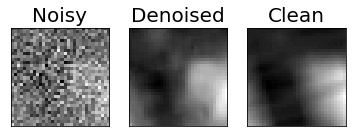

In [66]:
plot_denoise(denoise_model)

## Training a Descriptor Network
In the last section we trained a model that given a noisy patch, outputs a denoised version of it. We hoped that by doing so, we will improve the performance of the second part, which is training a network that outputs the descriptor. As we mentioned, a descriptor is a numerical vector that represents the small images we have. The dataset consists of a large number of small images, which are cropped patches from other larger images. Hence, they represent some local part of a scene. That is why there are no objects represented, only corners or textures. Each of these patches is related to a subset of other patches of the dataset by some kind of geometric transformation (e.g. rotation).  For a given patch, we want the network to output a vector that is close to the vectors of the patches that represent the same local part of a scene, while being far from patches do not represent that local part of a scene.

To do so, we will build a convolutional neural network that takes the input of $32\times32$ and outputs a descriptor of size $128$. For the loss, we use the triplet loss, which takes an anchor patch, a negative patch and a positive patch. The idea is to train the network so the descriptors from the anchor and positive patch have a low distance between them, and the negative and anchor patch have a large distance between them. 

In this cell we generate a triplet network, which is a network formed by three copies of the same network. That means that the descriptor model will compute the descriptor for the input `'a'` (anchor), the same descriptor model (with the same weights) will compute the descriptor for the input `'p'` (positive), and again the same model will compute the descriptor for the input `'n'` (negative). 

**Updated explanation**: Due to the way Keras handles the compile method, it needs a loss as an argument in that compile method. However, our loss is computed in the lambda layer, so we want to minimize the output of that layer. As we want to minimize the output of the Lambda function (in this case the triplet loss), we output as the label in the training_generator a vector of zeros and we compute the mean absolute error of the triplet loss and this vector of zeros. To give you an intuition, what we aim to minimize is
$$  |\text{triplet_loss} - 0| =  |\text{triplet_loss}| = \text{triplet_loss} $$



In [43]:
from keras.layers import Lambda
shape = (32, 32, 1)
xa = Input(shape=shape, name='a')
xp = Input(shape=shape, name='p')
xn = Input(shape=shape, name='n')
descriptor_model = get_descriptor_model(shape)
ea = descriptor_model(xa)
ep = descriptor_model(xp)
en = descriptor_model(xn)

loss = Lambda(triplet_loss)([ea, ep, en])

descriptor_model_trip = Model(inputs=[xa, xp, xn], outputs=loss)
sgd = keras.optimizers.SGD(lr=0.1)
descriptor_model_trip.compile(loss='mean_absolute_error', optimizer=sgd)

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Here we use the class HPatches, which loads the corresponding files by using the method `read_image_file`. It reads the patches. The output of read_image_file is a tuple of the form (images, labels), which is passed to the class `DataGeneratorDesc`. This class is a generator that creates batches of triplets, and each epoch is defined by the number of triplets in the argument `num_triplets`.

**Updated**: In the previous version of the baseline code, we were training the descriptor model with the noisy patches, not with the denoised ones. By adding the argument `denoise_model=denoise_model` to the class HPatches we can use the denoised images instead to train this descriptor model (if `denoise_model=None`, the noisy patches will be used). However, as it has to compute the denoised patch first, the loading of the data will be slower (6/7 extra min).  If you want to train the model with the clean patches instead, you can set the argument `use_clean=True`. In this last case, even if a denoise model is given, it will not be used. When running this piece of code **the type of patches (denoised, noisy or clean) used is printed**.

In [44]:
### Descriptor loading and training
# Loading images
hPatches = HPatches(train_fnames=train_fnames, test_fnames=test_fnames,
                    denoise_model=denoise_model, use_clean=False)
# Creating training generator
training_generator = DataGeneratorDesc(*hPatches.read_image_file(hpatches_dir, train=1), num_triplets=100000)
# Creating validation generator
val_generator = DataGeneratorDesc(*hPatches.read_image_file(hpatches_dir, train=0), num_triplets=10000)


Using denoised patches
100%|████████████████████████████████████████████████████████████████████████████████| 116/116 [00:44<00:00,  2.62it/s]
Denoising patches...
100%|████████████████████████████████████████████████████████████████████████████| 15589/15589 [03:04<00:00, 84.56it/s]


100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 64331.90it/s]


Using denoised patches
100%|████████████████████████████████████████████████████████████████████████████████| 116/116 [00:26<00:00,  3.04it/s]
Denoising patches...
100%|██████████████████████████████████████████████████████████████████████████████| 9525/9525 [02:02<00:00, 77.93it/s]


100%|█████████████████████████████████████████████████████████████████████████| 10000/10000 [00:00<00:00, 63313.98it/s]


We plot a random triplet in the form of anchor, positive and negative sample. The positive and anchor patches are similar between them (the difference is a geometric transformation, for example rotation), whereas the negative sample should be quite dissimilar to any of the other two.

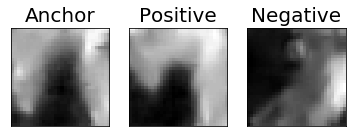

In [45]:
plot_triplet(training_generator)

We now train the descriptor model and save the weights afterward.

In [46]:
epochs = 30
### As with the denoising model, we use a loop to save for each epoch 
## #the weights in an external website in case colab stops. 
### reset, so e.g. calling 5 times fit(epochs=1) behave as fit(epochs=5)

### If you have a model saved from a previous training session
### Load it in the next line
# descriptor_model_trip.set_weights(keras.models.load_model('./descriptor.h5').get_weights())
# descriptor_model_trip.optimizer = keras.models.load_model('./descriptor.h5').optimizer

for e in range(epochs):
  
  descriptor_history = descriptor_model_trip.fit_generator(generator=training_generator, epochs=1, verbose=1, validation_data=val_generator)
  
  ### Saves optimizer and weights
  descriptor_model_trip.save('models/' + str(e) + 'epoch_descriptor.h5')
  ### Uploads files to external hosting
  #!curl -F "file=@descriptor.h5" https://file.io


Epoch 1/1


 313/2000 [===>..........................] - ETA: 2:23:38 - loss: 0.86 - ETA: 1:12:43 - loss: 0.62 - ETA: 49:07 - loss: 0.6143 - ETA: 37:18 - loss: 0.58 - ETA: 30:13 - loss: 0.54 - ETA: 25:28 - loss: 0.51 - ETA: 22:05 - loss: 0.50 - ETA: 19:32 - loss: 0.47 - ETA: 17:33 - loss: 0.47 - ETA: 15:58 - loss: 0.48 - ETA: 14:40 - loss: 0.48 - ETA: 13:35 - loss: 0.47 - ETA: 12:40 - loss: 0.47 - ETA: 11:53 - loss: 0.46 - ETA: 11:13 - loss: 0.47 - ETA: 10:37 - loss: 0.47 - ETA: 10:05 - loss: 0.48 - ETA: 9:37 - loss: 0.4765 - ETA: 9:12 - loss: 0.466 - ETA: 8:50 - loss: 0.467 - ETA: 8:29 - loss: 0.466 - ETA: 8:11 - loss: 0.460 - ETA: 7:54 - loss: 0.455 - ETA: 7:38 - loss: 0.460 - ETA: 7:24 - loss: 0.456 - ETA: 7:11 - loss: 0.465 - ETA: 6:59 - loss: 0.466 - ETA: 6:47 - loss: 0.459 - ETA: 6:37 - loss: 0.449 - ETA: 6:27 - loss: 0.441 - ETA: 6:18 - loss: 0.451 - ETA: 6:09 - loss: 0.450 - ETA: 6:01 - loss: 0.449 - ETA: 5:53 - loss: 0.448 - ETA: 5:46 - loss: 0.446 - ETA: 5:39 - loss: 0.441 - ETA: 5:32 - 

1618/2000 [=======================>......] - ETA: 41s - loss: 0.24 - ETA: 41s - loss: 0.24 - ETA: 41s - loss: 0.24 - ETA: 41s - loss: 0.24 - ETA: 41s - loss: 0.23 - ETA: 41s - loss: 0.23 - ETA: 41s - loss: 0.23 - ETA: 41s - loss: 0.23 - ETA: 41s - loss: 0.23 - ETA: 41s - loss: 0.23 - ETA: 41s - loss: 0.23 - ETA: 41s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 40s - loss: 0.23 - ETA: 39s - loss: 0.23 - ETA: 39s - loss: 0.23 - ETA: 39s - loss: 0.23 - ETA: 39s - loss: 0.23 - ETA: 39s - loss: 0.23 - ETA: 39s - loss: 0.23 - ETA: 39s - loss: 0.23 - ETA: 39s - loss: 0.23 - ETA: 39s - loss: 0.23 - ETA: 39s - loss: 0.23 - ETA: 39s - loss: 0.

1958/2000 [============================>.] - ETA: 21s - loss: 0.22 - ETA: 21s - loss: 0.22 - ETA: 21s - loss: 0.22 - ETA: 21s - loss: 0.22 - ETA: 21s - loss: 0.22 - ETA: 21s - loss: 0.22 - ETA: 21s - loss: 0.22 - ETA: 21s - loss: 0.22 - ETA: 21s - loss: 0.22 - ETA: 21s - loss: 0.22 - ETA: 21s - loss: 0.22 - ETA: 21s - loss: 0.22 - ETA: 21s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 20s - loss: 0.22 - ETA: 19s - loss: 0.22 - ETA: 19s - loss: 0.22 - ETA: 19s - loss: 0.22 - ETA: 19s - loss: 0.22 - ETA: 19s - loss: 0.22 - ETA: 19s - loss: 0.22 - ETA: 19s - loss: 0.22 - ETA: 19s - loss: 0.22 - ETA: 19s - loss: 0.22 - ETA: 19s - loss: 0.

1999/2000 [============================>.] - ETA: 2s - loss: 0.219 - ETA: 2s - loss: 0.219 - ETA: 2s - loss: 0.219 - ETA: 2s - loss: 0.219 - ETA: 2s - loss: 0.219 - ETA: 2s - loss: 0.219 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 1s - loss: 0.218 - ETA: 0s - loss: 0.218 - ETA: 0s - loss: 0.218 - ETA: 0s - loss: 0.218 - ETA: 0s - loss: 0.218 - ETA: 0s - loss: 0.218 - ETA: 0s - loss: 0.218 - ETA: 0s - loss: 0.218 - ETA: 0s - loss: 0.218 - ETA: 0s - loss: 0.218 - ETA: 0s - loss: 0.218 - ETA: 0s - loss: 0.217 - ETA: 0s - loss: 0.217 - ETA: 0s - loss: 0.217 - ETA: 0s - loss: 0.217 - ETA: 0s - loss: 0.217 - ETA: 0s - loss: 0.2

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 59973.65it/s]


2000/2000 [==============================] - 118s 59ms/step - loss: 0.2178 - val_loss: 0.2473
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:53 - loss: 0.148 - ETA: 1:48 - loss: 0.124 - ETA: 1:47 - loss: 0.176 - ETA: 1:46 - loss: 0.182 - ETA: 1:46 - loss: 0.186 - ETA: 1:46 - loss: 0.172 - ETA: 1:46 - loss: 0.150 - ETA: 1:46 - loss: 0.133 - ETA: 1:45 - loss: 0.136 - ETA: 1:45 - loss: 0.147 - ETA: 1:45 - loss: 0.167 - ETA: 1:45 - loss: 0.175 - ETA: 1:45 - loss: 0.164 - ETA: 1:45 - loss: 0.166 - ETA: 1:45 - loss: 0.162 - ETA: 1:45 - loss: 0.171 - ETA: 1:45 - loss: 0.173 - ETA: 1:45 - loss: 0.175 - ETA: 1:46 - loss: 0.177 - ETA: 1:46 - loss: 0.185 - ETA: 1:46 - loss: 0.183 - ETA: 1:46 - loss: 0.181 - ETA: 1:46 - loss: 0.181 - ETA: 1:46 - loss: 0.177 - ETA: 1:46 - loss: 0.182 - ETA: 1:46 - loss: 0.180 - ETA: 1:45 - loss: 0.176 - ETA: 1:45 - loss: 0.173 - ETA: 1:45 - loss: 0.172 - ETA: 1:45 - loss: 0.170 - ETA: 1:45 - loss: 0.170 - ETA: 1:45 - loss: 0.166 - ETA: 1:45 - loss: 0.171 - ETA: 1:45 - loss: 0.167 - ETA: 1:45 - loss: 0.165 - ETA: 1:45 - loss: 0.164 - ETA: 1:45 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.16 - ETA: 38s - loss: 0.16 - ETA: 38s - loss: 0.16 - ETA: 38s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 37s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.16 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 19s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 18s - loss: 0.16 - ETA: 17s - loss: 0.16 - ETA: 17s - loss: 0.16 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.162 - ETA: 1s - loss: 0.162 - ETA: 1s - loss: 0.162 - ETA: 1s - loss: 0.162 - ETA: 1s - loss: 0.162 - ETA: 1s - loss: 0.162 - ETA: 1s - loss: 0.162 - ETA: 1s - loss: 0.162 - ETA: 1s - loss: 0.162 - ETA: 1s - loss: 0.162 - ETA: 1s - loss: 0.162 - ETA: 1s - loss: 0.162 - ETA: 1s - loss: 0.162 - ETA: 1s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.162 - ETA: 0s - loss: 0.1625

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 55207.56it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.1626 - val_loss: 0.2551
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:51 - loss: 0.153 - ETA: 1:52 - loss: 0.100 - ETA: 1:50 - loss: 0.143 - ETA: 1:49 - loss: 0.126 - ETA: 1:49 - loss: 0.130 - ETA: 1:49 - loss: 0.143 - ETA: 1:48 - loss: 0.141 - ETA: 1:47 - loss: 0.139 - ETA: 1:47 - loss: 0.136 - ETA: 1:48 - loss: 0.136 - ETA: 1:47 - loss: 0.131 - ETA: 1:47 - loss: 0.137 - ETA: 1:47 - loss: 0.134 - ETA: 1:47 - loss: 0.133 - ETA: 1:47 - loss: 0.133 - ETA: 1:49 - loss: 0.131 - ETA: 1:49 - loss: 0.136 - ETA: 1:49 - loss: 0.136 - ETA: 1:49 - loss: 0.133 - ETA: 1:48 - loss: 0.131 - ETA: 1:48 - loss: 0.128 - ETA: 1:48 - loss: 0.130 - ETA: 1:48 - loss: 0.126 - ETA: 1:48 - loss: 0.124 - ETA: 1:48 - loss: 0.128 - ETA: 1:47 - loss: 0.128 - ETA: 1:47 - loss: 0.127 - ETA: 1:47 - loss: 0.131 - ETA: 1:47 - loss: 0.130 - ETA: 1:47 - loss: 0.132 - ETA: 1:47 - loss: 0.131 - ETA: 1:47 - loss: 0.130 - ETA: 1:47 - loss: 0.133 - ETA: 1:47 - loss: 0.133 - ETA: 1:47 - loss: 0.134 - ETA: 1:46 - loss: 0.134 - ETA: 1:46 - loss: 0

1626/2000 [=======================>......] - ETA: 38s - loss: 0.14 - ETA: 38s - loss: 0.14 - ETA: 38s - loss: 0.14 - ETA: 38s - loss: 0.14 - ETA: 38s - loss: 0.14 - ETA: 38s - loss: 0.14 - ETA: 38s - loss: 0.14 - ETA: 38s - loss: 0.14 - ETA: 38s - loss: 0.14 - ETA: 38s - loss: 0.14 - ETA: 38s - loss: 0.14 - ETA: 38s - loss: 0.14 - ETA: 38s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 37s - loss: 0.14 - ETA: 36s - loss: 0.14 - ETA: 36s - loss: 0.14 - ETA: 36s - loss: 0.14 - ETA: 36s - loss: 0.14 - ETA: 36s - loss: 0.14 - ETA: 36s - loss: 0.14 - ETA: 36s - loss: 0.14 - ETA: 36s - loss: 0.14 - ETA: 36s - loss: 0.

1966/2000 [============================>.] - ETA: 20s - loss: 0.14 - ETA: 20s - loss: 0.14 - ETA: 20s - loss: 0.14 - ETA: 20s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 19s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.14 - ETA: 18s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.145 - ETA: 1s - loss: 0.145 - ETA: 1s - loss: 0.145 - ETA: 1s - loss: 0.145 - ETA: 1s - loss: 0.145 - ETA: 1s - loss: 0.145 - ETA: 1s - loss: 0.145 - ETA: 1s - loss: 0.145 - ETA: 1s - loss: 0.145 - ETA: 1s - loss: 0.145 - ETA: 1s - loss: 0.145 - ETA: 1s - loss: 0.145 - ETA: 1s - loss: 0.145 - ETA: 1s - loss: 0.145 - ETA: 1s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.145 - ETA: 0s - loss: 0.1454

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 67591.98it/s]


2000/2000 [==============================] - 113s 57ms/step - loss: 0.1454 - val_loss: 0.1693
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:53 - loss: 0.133 - ETA: 1:48 - loss: 0.152 - ETA: 1:47 - loss: 0.144 - ETA: 1:46 - loss: 0.145 - ETA: 1:46 - loss: 0.137 - ETA: 1:45 - loss: 0.126 - ETA: 1:45 - loss: 0.148 - ETA: 1:45 - loss: 0.145 - ETA: 1:45 - loss: 0.143 - ETA: 1:45 - loss: 0.135 - ETA: 1:45 - loss: 0.130 - ETA: 1:45 - loss: 0.128 - ETA: 1:45 - loss: 0.128 - ETA: 1:45 - loss: 0.128 - ETA: 1:45 - loss: 0.128 - ETA: 1:45 - loss: 0.126 - ETA: 1:46 - loss: 0.129 - ETA: 1:46 - loss: 0.130 - ETA: 1:46 - loss: 0.128 - ETA: 1:46 - loss: 0.124 - ETA: 1:45 - loss: 0.121 - ETA: 1:45 - loss: 0.116 - ETA: 1:45 - loss: 0.120 - ETA: 1:45 - loss: 0.121 - ETA: 1:45 - loss: 0.121 - ETA: 1:45 - loss: 0.121 - ETA: 1:45 - loss: 0.125 - ETA: 1:45 - loss: 0.125 - ETA: 1:45 - loss: 0.125 - ETA: 1:45 - loss: 0.131 - ETA: 1:45 - loss: 0.134 - ETA: 1:45 - loss: 0.131 - ETA: 1:44 - loss: 0.127 - ETA: 1:44 - loss: 0.137 - ETA: 1:44 - loss: 0.137 - ETA: 1:44 - loss: 0.135 - ETA: 1:44 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.13 - ETA: 38s - loss: 0.13 - ETA: 38s - loss: 0.13 - ETA: 38s - loss: 0.13 - ETA: 38s - loss: 0.13 - ETA: 38s - loss: 0.13 - ETA: 38s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 37s - loss: 0.13 - ETA: 36s - loss: 0.13 - ETA: 36s - loss: 0.13 - ETA: 36s - loss: 0.13 - ETA: 36s - loss: 0.13 - ETA: 36s - loss: 0.13 - ETA: 36s - loss: 0.13 - ETA: 36s - loss: 0.13 - ETA: 36s - loss: 0.13 - ETA: 36s - loss: 0.13 - ETA: 36s - loss: 0.13 - ETA: 36s - loss: 0.13 - ETA: 36s - loss: 0.13 - ETA: 36s - loss: 0.13 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 20s - loss: 0.13 - ETA: 20s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 19s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 18s - loss: 0.13 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.135 - ETA: 1s - loss: 0.135 - ETA: 1s - loss: 0.135 - ETA: 1s - loss: 0.135 - ETA: 1s - loss: 0.135 - ETA: 1s - loss: 0.135 - ETA: 1s - loss: 0.135 - ETA: 1s - loss: 0.135 - ETA: 1s - loss: 0.135 - ETA: 1s - loss: 0.135 - ETA: 1s - loss: 0.135 - ETA: 1s - loss: 0.135 - ETA: 1s - loss: 0.135 - ETA: 1s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.135 - ETA: 0s - loss: 0.1356

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 58296.11it/s]


2000/2000 [==============================] - 113s 57ms/step - loss: 0.1356 - val_loss: 0.1457
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:49 - loss: 0.171 - ETA: 1:50 - loss: 0.154 - ETA: 1:49 - loss: 0.166 - ETA: 1:48 - loss: 0.166 - ETA: 1:48 - loss: 0.136 - ETA: 1:48 - loss: 0.131 - ETA: 1:47 - loss: 0.133 - ETA: 1:47 - loss: 0.141 - ETA: 1:47 - loss: 0.145 - ETA: 1:47 - loss: 0.146 - ETA: 1:47 - loss: 0.154 - ETA: 1:46 - loss: 0.159 - ETA: 1:46 - loss: 0.162 - ETA: 1:46 - loss: 0.160 - ETA: 1:46 - loss: 0.156 - ETA: 1:46 - loss: 0.155 - ETA: 1:46 - loss: 0.152 - ETA: 1:45 - loss: 0.145 - ETA: 1:45 - loss: 0.147 - ETA: 1:45 - loss: 0.146 - ETA: 1:45 - loss: 0.147 - ETA: 1:45 - loss: 0.144 - ETA: 1:45 - loss: 0.143 - ETA: 1:45 - loss: 0.141 - ETA: 1:45 - loss: 0.137 - ETA: 1:45 - loss: 0.134 - ETA: 1:45 - loss: 0.135 - ETA: 1:45 - loss: 0.133 - ETA: 1:45 - loss: 0.136 - ETA: 1:46 - loss: 0.140 - ETA: 1:46 - loss: 0.137 - ETA: 1:46 - loss: 0.134 - ETA: 1:46 - loss: 0.138 - ETA: 1:46 - loss: 0.137 - ETA: 1:46 - loss: 0.136 - ETA: 1:45 - loss: 0.135 - ETA: 1:45 - loss: 0

1626/2000 [=======================>......] - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.

1966/2000 [============================>.] - ETA: 20s - loss: 0.12 - ETA: 20s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.126 - ETA: 1s - loss: 0.126 - ETA: 1s - loss: 0.126 - ETA: 1s - loss: 0.126 - ETA: 1s - loss: 0.126 - ETA: 1s - loss: 0.126 - ETA: 1s - loss: 0.126 - ETA: 1s - loss: 0.126 - ETA: 1s - loss: 0.126 - ETA: 1s - loss: 0.126 - ETA: 1s - loss: 0.127 - ETA: 1s - loss: 0.127 - ETA: 1s - loss: 0.127 - ETA: 1s - loss: 0.126 - ETA: 1s - loss: 0.126 - ETA: 0s - loss: 0.127 - ETA: 0s - loss: 0.126 - ETA: 0s - loss: 0.126 - ETA: 0s - loss: 0.127 - ETA: 0s - loss: 0.127 - ETA: 0s - loss: 0.126 - ETA: 0s - loss: 0.127 - ETA: 0s - loss: 0.127 - ETA: 0s - loss: 0.127 - ETA: 0s - loss: 0.126 - ETA: 0s - loss: 0.126 - ETA: 0s - loss: 0.126 - ETA: 0s - loss: 0.126 - ETA: 0s - loss: 0.126 - ETA: 0s - loss: 0.126 - ETA: 0s - loss: 0.126 - ETA: 0s - loss: 0.126 - ETA: 0s - loss: 0.1268

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 58194.29it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.1268 - val_loss: 0.1909
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:51 - loss: 0.413 - ETA: 1:51 - loss: 0.288 - ETA: 1:49 - loss: 0.225 - ETA: 1:48 - loss: 0.209 - ETA: 1:48 - loss: 0.199 - ETA: 1:47 - loss: 0.171 - ETA: 1:47 - loss: 0.176 - ETA: 1:47 - loss: 0.159 - ETA: 1:46 - loss: 0.158 - ETA: 1:46 - loss: 0.163 - ETA: 1:46 - loss: 0.167 - ETA: 1:46 - loss: 0.160 - ETA: 1:46 - loss: 0.156 - ETA: 1:45 - loss: 0.156 - ETA: 1:46 - loss: 0.156 - ETA: 1:46 - loss: 0.160 - ETA: 1:45 - loss: 0.156 - ETA: 1:45 - loss: 0.151 - ETA: 1:45 - loss: 0.150 - ETA: 1:45 - loss: 0.149 - ETA: 1:45 - loss: 0.145 - ETA: 1:45 - loss: 0.143 - ETA: 1:45 - loss: 0.145 - ETA: 1:45 - loss: 0.144 - ETA: 1:45 - loss: 0.144 - ETA: 1:45 - loss: 0.142 - ETA: 1:45 - loss: 0.144 - ETA: 1:45 - loss: 0.144 - ETA: 1:45 - loss: 0.142 - ETA: 1:46 - loss: 0.142 - ETA: 1:46 - loss: 0.143 - ETA: 1:45 - loss: 0.142 - ETA: 1:45 - loss: 0.141 - ETA: 1:45 - loss: 0.141 - ETA: 1:45 - loss: 0.141 - ETA: 1:45 - loss: 0.140 - ETA: 1:45 - loss: 0

1626/2000 [=======================>......] - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 38s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 37s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.12 - ETA: 36s - loss: 0.

1966/2000 [============================>.] - ETA: 20s - loss: 0.12 - ETA: 20s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 19s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 18s - loss: 0.12 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.125 - ETA: 1s - loss: 0.125 - ETA: 1s - loss: 0.125 - ETA: 1s - loss: 0.125 - ETA: 1s - loss: 0.125 - ETA: 1s - loss: 0.125 - ETA: 1s - loss: 0.125 - ETA: 1s - loss: 0.125 - ETA: 1s - loss: 0.125 - ETA: 1s - loss: 0.125 - ETA: 1s - loss: 0.125 - ETA: 1s - loss: 0.125 - ETA: 1s - loss: 0.125 - ETA: 1s - loss: 0.125 - ETA: 1s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.125 - ETA: 0s - loss: 0.1255

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 62018.62it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.1254 - val_loss: 0.2096
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:53 - loss: 0.136 - ETA: 1:48 - loss: 0.087 - ETA: 1:48 - loss: 0.079 - ETA: 1:47 - loss: 0.111 - ETA: 1:46 - loss: 0.121 - ETA: 1:46 - loss: 0.137 - ETA: 1:46 - loss: 0.125 - ETA: 1:46 - loss: 0.132 - ETA: 1:45 - loss: 0.123 - ETA: 1:45 - loss: 0.118 - ETA: 1:45 - loss: 0.111 - ETA: 1:45 - loss: 0.108 - ETA: 1:45 - loss: 0.111 - ETA: 1:45 - loss: 0.107 - ETA: 1:45 - loss: 0.111 - ETA: 1:45 - loss: 0.107 - ETA: 1:45 - loss: 0.105 - ETA: 1:45 - loss: 0.114 - ETA: 1:44 - loss: 0.111 - ETA: 1:44 - loss: 0.111 - ETA: 1:44 - loss: 0.106 - ETA: 1:44 - loss: 0.108 - ETA: 1:44 - loss: 0.107 - ETA: 1:44 - loss: 0.109 - ETA: 1:44 - loss: 0.110 - ETA: 1:44 - loss: 0.108 - ETA: 1:44 - loss: 0.107 - ETA: 1:44 - loss: 0.106 - ETA: 1:44 - loss: 0.108 - ETA: 1:44 - loss: 0.107 - ETA: 1:44 - loss: 0.106 - ETA: 1:44 - loss: 0.104 - ETA: 1:44 - loss: 0.108 - ETA: 1:44 - loss: 0.107 - ETA: 1:44 - loss: 0.108 - ETA: 1:44 - loss: 0.107 - ETA: 1:44 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 17s - loss: 0.11 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.117 - ETA: 1s - loss: 0.117 - ETA: 1s - loss: 0.117 - ETA: 1s - loss: 0.117 - ETA: 1s - loss: 0.117 - ETA: 1s - loss: 0.117 - ETA: 1s - loss: 0.117 - ETA: 1s - loss: 0.117 - ETA: 1s - loss: 0.117 - ETA: 1s - loss: 0.117 - ETA: 1s - loss: 0.117 - ETA: 1s - loss: 0.117 - ETA: 1s - loss: 0.117 - ETA: 1s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.117 - ETA: 0s - loss: 0.1174

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 66292.98it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.1173 - val_loss: 0.1913
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:55 - loss: 0.176 - ETA: 1:51 - loss: 0.101 - ETA: 1:49 - loss: 0.067 - ETA: 1:48 - loss: 0.059 - ETA: 1:48 - loss: 0.079 - ETA: 1:47 - loss: 0.080 - ETA: 1:47 - loss: 0.070 - ETA: 1:46 - loss: 0.069 - ETA: 1:46 - loss: 0.079 - ETA: 1:46 - loss: 0.085 - ETA: 1:45 - loss: 0.083 - ETA: 1:45 - loss: 0.084 - ETA: 1:45 - loss: 0.096 - ETA: 1:45 - loss: 0.099 - ETA: 1:45 - loss: 0.103 - ETA: 1:45 - loss: 0.107 - ETA: 1:45 - loss: 0.114 - ETA: 1:44 - loss: 0.119 - ETA: 1:45 - loss: 0.117 - ETA: 1:45 - loss: 0.114 - ETA: 1:45 - loss: 0.113 - ETA: 1:45 - loss: 0.112 - ETA: 1:45 - loss: 0.110 - ETA: 1:45 - loss: 0.112 - ETA: 1:45 - loss: 0.112 - ETA: 1:44 - loss: 0.110 - ETA: 1:45 - loss: 0.114 - ETA: 1:44 - loss: 0.118 - ETA: 1:44 - loss: 0.117 - ETA: 1:45 - loss: 0.118 - ETA: 1:45 - loss: 0.118 - ETA: 1:45 - loss: 0.116 - ETA: 1:44 - loss: 0.116 - ETA: 1:44 - loss: 0.116 - ETA: 1:44 - loss: 0.115 - ETA: 1:44 - loss: 0.115 - ETA: 1:44 - loss: 0

1626/2000 [=======================>......] - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.

1966/2000 [============================>.] - ETA: 20s - loss: 0.11 - ETA: 20s - loss: 0.11 - ETA: 20s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.112 - ETA: 1s - loss: 0.112 - ETA: 1s - loss: 0.112 - ETA: 1s - loss: 0.112 - ETA: 1s - loss: 0.112 - ETA: 1s - loss: 0.112 - ETA: 1s - loss: 0.112 - ETA: 1s - loss: 0.112 - ETA: 1s - loss: 0.112 - ETA: 1s - loss: 0.112 - ETA: 1s - loss: 0.112 - ETA: 1s - loss: 0.112 - ETA: 1s - loss: 0.112 - ETA: 1s - loss: 0.112 - ETA: 1s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.112 - ETA: 0s - loss: 0.1129

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 60812.23it/s]


2000/2000 [==============================] - 113s 57ms/step - loss: 0.1129 - val_loss: 0.1338
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:47 - loss: 0.057 - ETA: 1:45 - loss: 0.058 - ETA: 1:45 - loss: 0.070 - ETA: 1:45 - loss: 0.058 - ETA: 1:45 - loss: 0.075 - ETA: 1:44 - loss: 0.074 - ETA: 1:44 - loss: 0.090 - ETA: 1:45 - loss: 0.091 - ETA: 1:45 - loss: 0.103 - ETA: 1:44 - loss: 0.104 - ETA: 1:44 - loss: 0.102 - ETA: 1:44 - loss: 0.098 - ETA: 1:44 - loss: 0.103 - ETA: 1:44 - loss: 0.105 - ETA: 1:44 - loss: 0.103 - ETA: 1:44 - loss: 0.103 - ETA: 1:44 - loss: 0.104 - ETA: 1:44 - loss: 0.104 - ETA: 1:44 - loss: 0.104 - ETA: 1:44 - loss: 0.101 - ETA: 1:44 - loss: 0.101 - ETA: 1:44 - loss: 0.100 - ETA: 1:44 - loss: 0.102 - ETA: 1:44 - loss: 0.102 - ETA: 1:44 - loss: 0.101 - ETA: 1:44 - loss: 0.103 - ETA: 1:44 - loss: 0.113 - ETA: 1:44 - loss: 0.114 - ETA: 1:44 - loss: 0.113 - ETA: 1:44 - loss: 0.117 - ETA: 1:44 - loss: 0.116 - ETA: 1:44 - loss: 0.118 - ETA: 1:44 - loss: 0.116 - ETA: 1:44 - loss: 0.115 - ETA: 1:44 - loss: 0.115 - ETA: 1:44 - loss: 0.119 - ETA: 1:44 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 38s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 37s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.11 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 20s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 19s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 18s - loss: 0.11 - ETA: 17s - loss: 0.11 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.110 - ETA: 1s - loss: 0.110 - ETA: 1s - loss: 0.110 - ETA: 1s - loss: 0.110 - ETA: 1s - loss: 0.110 - ETA: 1s - loss: 0.110 - ETA: 1s - loss: 0.110 - ETA: 1s - loss: 0.110 - ETA: 1s - loss: 0.110 - ETA: 1s - loss: 0.110 - ETA: 1s - loss: 0.110 - ETA: 1s - loss: 0.110 - ETA: 1s - loss: 0.110 - ETA: 1s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.110 - ETA: 0s - loss: 0.1101

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 61865.19it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.1101 - val_loss: 0.1367
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:47 - loss: 0.008 - ETA: 1:46 - loss: 0.047 - ETA: 1:45 - loss: 0.046 - ETA: 1:46 - loss: 0.060 - ETA: 1:45 - loss: 0.075 - ETA: 1:45 - loss: 0.065 - ETA: 1:45 - loss: 0.068 - ETA: 1:45 - loss: 0.102 - ETA: 1:45 - loss: 0.102 - ETA: 1:45 - loss: 0.111 - ETA: 1:44 - loss: 0.108 - ETA: 1:44 - loss: 0.103 - ETA: 1:44 - loss: 0.106 - ETA: 1:44 - loss: 0.104 - ETA: 1:44 - loss: 0.109 - ETA: 1:44 - loss: 0.106 - ETA: 1:44 - loss: 0.104 - ETA: 1:44 - loss: 0.102 - ETA: 1:46 - loss: 0.101 - ETA: 1:46 - loss: 0.099 - ETA: 1:46 - loss: 0.098 - ETA: 1:45 - loss: 0.105 - ETA: 1:45 - loss: 0.110 - ETA: 1:45 - loss: 0.106 - ETA: 1:45 - loss: 0.107 - ETA: 1:45 - loss: 0.109 - ETA: 1:45 - loss: 0.115 - ETA: 1:45 - loss: 0.119 - ETA: 1:45 - loss: 0.122 - ETA: 1:44 - loss: 0.121 - ETA: 1:44 - loss: 0.120 - ETA: 1:44 - loss: 0.120 - ETA: 1:44 - loss: 0.122 - ETA: 1:44 - loss: 0.122 - ETA: 1:44 - loss: 0.121 - ETA: 1:44 - loss: 0.119 - ETA: 1:44 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.10 - ETA: 38s - loss: 0.10 - ETA: 38s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 17s - loss: 0.10 - ETA: 17s - loss: 0.10 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.107 - ETA: 1s - loss: 0.107 - ETA: 1s - loss: 0.107 - ETA: 1s - loss: 0.107 - ETA: 1s - loss: 0.107 - ETA: 1s - loss: 0.107 - ETA: 1s - loss: 0.107 - ETA: 1s - loss: 0.107 - ETA: 1s - loss: 0.107 - ETA: 1s - loss: 0.107 - ETA: 1s - loss: 0.107 - ETA: 1s - loss: 0.107 - ETA: 1s - loss: 0.107 - ETA: 1s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.1072

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 62483.48it/s]


2000/2000 [==============================] - 112s 56ms/step - loss: 0.1072 - val_loss: 0.1532
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:49 - loss: 0.139 - ETA: 1:46 - loss: 0.131 - ETA: 1:46 - loss: 0.136 - ETA: 1:46 - loss: 0.150 - ETA: 1:46 - loss: 0.161 - ETA: 1:45 - loss: 0.171 - ETA: 1:45 - loss: 0.164 - ETA: 1:45 - loss: 0.155 - ETA: 1:45 - loss: 0.144 - ETA: 1:45 - loss: 0.139 - ETA: 1:44 - loss: 0.133 - ETA: 1:45 - loss: 0.139 - ETA: 1:45 - loss: 0.167 - ETA: 1:44 - loss: 0.166 - ETA: 1:44 - loss: 0.158 - ETA: 1:44 - loss: 0.153 - ETA: 1:44 - loss: 0.148 - ETA: 1:44 - loss: 0.150 - ETA: 1:44 - loss: 0.147 - ETA: 1:44 - loss: 0.140 - ETA: 1:44 - loss: 0.140 - ETA: 1:44 - loss: 0.138 - ETA: 1:44 - loss: 0.134 - ETA: 1:44 - loss: 0.134 - ETA: 1:44 - loss: 0.136 - ETA: 1:43 - loss: 0.143 - ETA: 1:43 - loss: 0.139 - ETA: 1:43 - loss: 0.138 - ETA: 1:44 - loss: 0.138 - ETA: 1:44 - loss: 0.142 - ETA: 1:44 - loss: 0.141 - ETA: 1:44 - loss: 0.139 - ETA: 1:44 - loss: 0.139 - ETA: 1:44 - loss: 0.139 - ETA: 1:44 - loss: 0.139 - ETA: 1:44 - loss: 0.136 - ETA: 1:44 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.10 - ETA: 38s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 17s - loss: 0.10 - ETA: 17s - loss: 0.10 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.106 - ETA: 1s - loss: 0.106 - ETA: 1s - loss: 0.106 - ETA: 1s - loss: 0.106 - ETA: 1s - loss: 0.106 - ETA: 1s - loss: 0.106 - ETA: 1s - loss: 0.106 - ETA: 1s - loss: 0.106 - ETA: 1s - loss: 0.106 - ETA: 1s - loss: 0.106 - ETA: 1s - loss: 0.106 - ETA: 1s - loss: 0.106 - ETA: 1s - loss: 0.106 - ETA: 1s - loss: 0.106 - ETA: 0s - loss: 0.106 - ETA: 0s - loss: 0.106 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.107 - ETA: 0s - loss: 0.1071

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 69517.77it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.1071 - val_loss: 0.1374
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:51 - loss: 0.143 - ETA: 1:47 - loss: 0.115 - ETA: 1:47 - loss: 0.126 - ETA: 1:46 - loss: 0.123 - ETA: 1:46 - loss: 0.102 - ETA: 1:45 - loss: 0.095 - ETA: 1:45 - loss: 0.094 - ETA: 1:45 - loss: 0.120 - ETA: 1:45 - loss: 0.113 - ETA: 1:45 - loss: 0.117 - ETA: 1:45 - loss: 0.113 - ETA: 1:45 - loss: 0.112 - ETA: 1:45 - loss: 0.108 - ETA: 1:45 - loss: 0.107 - ETA: 1:45 - loss: 0.107 - ETA: 1:45 - loss: 0.107 - ETA: 1:45 - loss: 0.116 - ETA: 1:45 - loss: 0.117 - ETA: 1:45 - loss: 0.113 - ETA: 1:45 - loss: 0.111 - ETA: 1:44 - loss: 0.114 - ETA: 1:44 - loss: 0.116 - ETA: 1:44 - loss: 0.114 - ETA: 1:44 - loss: 0.114 - ETA: 1:44 - loss: 0.110 - ETA: 1:44 - loss: 0.110 - ETA: 1:44 - loss: 0.109 - ETA: 1:44 - loss: 0.107 - ETA: 1:44 - loss: 0.108 - ETA: 1:45 - loss: 0.107 - ETA: 1:45 - loss: 0.106 - ETA: 1:44 - loss: 0.106 - ETA: 1:44 - loss: 0.107 - ETA: 1:44 - loss: 0.106 - ETA: 1:44 - loss: 0.106 - ETA: 1:44 - loss: 0.105 - ETA: 1:44 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.10 - ETA: 38s - loss: 0.10 - ETA: 38s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 17s - loss: 0.10 - ETA: 17s - loss: 0.10 - ETA: 17s - loss: 0.10 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.103 - ETA: 1s - loss: 0.103 - ETA: 1s - loss: 0.103 - ETA: 1s - loss: 0.103 - ETA: 1s - loss: 0.103 - ETA: 1s - loss: 0.103 - ETA: 1s - loss: 0.103 - ETA: 1s - loss: 0.103 - ETA: 1s - loss: 0.103 - ETA: 1s - loss: 0.103 - ETA: 1s - loss: 0.103 - ETA: 1s - loss: 0.103 - ETA: 1s - loss: 0.103 - ETA: 1s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.103 - ETA: 0s - loss: 0.1035

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 58025.55it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.1035 - val_loss: 0.1411
Epoch 1/1


 314/2000 [===>..........................] - ETA: 2:25 - loss: 0.059 - ETA: 2:07 - loss: 0.081 - ETA: 2:00 - loss: 0.106 - ETA: 1:56 - loss: 0.083 - ETA: 1:54 - loss: 0.083 - ETA: 1:52 - loss: 0.071 - ETA: 1:51 - loss: 0.081 - ETA: 1:51 - loss: 0.078 - ETA: 1:50 - loss: 0.078 - ETA: 1:49 - loss: 0.082 - ETA: 1:49 - loss: 0.079 - ETA: 1:48 - loss: 0.082 - ETA: 1:48 - loss: 0.082 - ETA: 1:48 - loss: 0.081 - ETA: 1:48 - loss: 0.081 - ETA: 1:48 - loss: 0.088 - ETA: 1:47 - loss: 0.087 - ETA: 1:47 - loss: 0.084 - ETA: 1:47 - loss: 0.085 - ETA: 1:47 - loss: 0.088 - ETA: 1:47 - loss: 0.095 - ETA: 1:47 - loss: 0.095 - ETA: 1:47 - loss: 0.094 - ETA: 1:46 - loss: 0.090 - ETA: 1:46 - loss: 0.091 - ETA: 1:46 - loss: 0.094 - ETA: 1:46 - loss: 0.095 - ETA: 1:47 - loss: 0.097 - ETA: 1:48 - loss: 0.097 - ETA: 1:47 - loss: 0.096 - ETA: 1:47 - loss: 0.094 - ETA: 1:47 - loss: 0.092 - ETA: 1:47 - loss: 0.093 - ETA: 1:47 - loss: 0.092 - ETA: 1:47 - loss: 0.091 - ETA: 1:47 - loss: 0.088 - ETA: 1:47 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 17s - loss: 0.10 - ETA: 17s - loss: 0.10 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.101 - ETA: 1s - loss: 0.101 - ETA: 1s - loss: 0.101 - ETA: 1s - loss: 0.101 - ETA: 1s - loss: 0.101 - ETA: 1s - loss: 0.101 - ETA: 1s - loss: 0.101 - ETA: 1s - loss: 0.101 - ETA: 1s - loss: 0.101 - ETA: 1s - loss: 0.101 - ETA: 1s - loss: 0.101 - ETA: 1s - loss: 0.101 - ETA: 1s - loss: 0.101 - ETA: 1s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.101 - ETA: 0s - loss: 0.1010

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 62057.10it/s]


2000/2000 [==============================] - 112s 56ms/step - loss: 0.1010 - val_loss: 0.1350
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:47 - loss: 0.015 - ETA: 1:48 - loss: 0.041 - ETA: 1:47 - loss: 0.072 - ETA: 1:46 - loss: 0.079 - ETA: 1:46 - loss: 0.066 - ETA: 1:46 - loss: 0.072 - ETA: 1:46 - loss: 0.084 - ETA: 1:46 - loss: 0.083 - ETA: 1:45 - loss: 0.082 - ETA: 1:45 - loss: 0.093 - ETA: 1:45 - loss: 0.091 - ETA: 1:45 - loss: 0.099 - ETA: 1:45 - loss: 0.097 - ETA: 1:45 - loss: 0.103 - ETA: 1:45 - loss: 0.112 - ETA: 1:45 - loss: 0.119 - ETA: 1:45 - loss: 0.119 - ETA: 1:45 - loss: 0.113 - ETA: 1:45 - loss: 0.117 - ETA: 1:45 - loss: 0.116 - ETA: 1:44 - loss: 0.113 - ETA: 1:44 - loss: 0.109 - ETA: 1:44 - loss: 0.104 - ETA: 1:44 - loss: 0.104 - ETA: 1:44 - loss: 0.106 - ETA: 1:44 - loss: 0.104 - ETA: 1:44 - loss: 0.102 - ETA: 1:44 - loss: 0.101 - ETA: 1:44 - loss: 0.101 - ETA: 1:45 - loss: 0.105 - ETA: 1:45 - loss: 0.104 - ETA: 1:45 - loss: 0.101 - ETA: 1:44 - loss: 0.102 - ETA: 1:44 - loss: 0.101 - ETA: 1:44 - loss: 0.099 - ETA: 1:44 - loss: 0.097 - ETA: 1:44 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.10 - ETA: 38s - loss: 0.10 - ETA: 38s - loss: 0.10 - ETA: 38s - loss: 0.10 - ETA: 38s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 37s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.10 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 19s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 18s - loss: 0.10 - ETA: 17s - loss: 0.10 - ETA: 17s - loss: 0.10 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.100 - ETA: 1s - loss: 0.100 - ETA: 1s - loss: 0.100 - ETA: 1s - loss: 0.100 - ETA: 1s - loss: 0.100 - ETA: 1s - loss: 0.100 - ETA: 1s - loss: 0.100 - ETA: 1s - loss: 0.100 - ETA: 1s - loss: 0.100 - ETA: 1s - loss: 0.100 - ETA: 1s - loss: 0.100 - ETA: 1s - loss: 0.100 - ETA: 1s - loss: 0.100 - ETA: 1s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.100 - ETA: 0s - loss: 0.1009

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 57393.03it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.1009 - val_loss: 0.1229
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:49 - loss: 0.049 - ETA: 1:47 - loss: 0.055 - ETA: 1:46 - loss: 0.061 - ETA: 1:45 - loss: 0.074 - ETA: 1:45 - loss: 0.083 - ETA: 1:45 - loss: 0.087 - ETA: 1:45 - loss: 0.084 - ETA: 1:45 - loss: 0.074 - ETA: 1:45 - loss: 0.069 - ETA: 1:45 - loss: 0.066 - ETA: 1:45 - loss: 0.073 - ETA: 1:45 - loss: 0.082 - ETA: 1:45 - loss: 0.078 - ETA: 1:45 - loss: 0.080 - ETA: 1:44 - loss: 0.077 - ETA: 1:44 - loss: 0.079 - ETA: 1:45 - loss: 0.080 - ETA: 1:45 - loss: 0.077 - ETA: 1:45 - loss: 0.076 - ETA: 1:45 - loss: 0.080 - ETA: 1:45 - loss: 0.080 - ETA: 1:45 - loss: 0.080 - ETA: 1:45 - loss: 0.080 - ETA: 1:45 - loss: 0.083 - ETA: 1:45 - loss: 0.081 - ETA: 1:44 - loss: 0.088 - ETA: 1:44 - loss: 0.090 - ETA: 1:44 - loss: 0.093 - ETA: 1:44 - loss: 0.092 - ETA: 1:44 - loss: 0.092 - ETA: 1:44 - loss: 0.096 - ETA: 1:44 - loss: 0.094 - ETA: 1:44 - loss: 0.095 - ETA: 1:44 - loss: 0.096 - ETA: 1:44 - loss: 0.097 - ETA: 1:45 - loss: 0.099 - ETA: 1:45 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 17s - loss: 0.09 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.096 - ETA: 1s - loss: 0.096 - ETA: 1s - loss: 0.096 - ETA: 1s - loss: 0.096 - ETA: 1s - loss: 0.096 - ETA: 1s - loss: 0.096 - ETA: 1s - loss: 0.096 - ETA: 1s - loss: 0.096 - ETA: 1s - loss: 0.096 - ETA: 1s - loss: 0.096 - ETA: 1s - loss: 0.096 - ETA: 1s - loss: 0.096 - ETA: 1s - loss: 0.096 - ETA: 1s - loss: 0.096 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.096 - ETA: 0s - loss: 0.0969

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 71301.54it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.0968 - val_loss: 0.1247
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:49 - loss: 0.061 - ETA: 1:47 - loss: 0.084 - ETA: 1:45 - loss: 0.144 - ETA: 1:46 - loss: 0.133 - ETA: 1:45 - loss: 0.124 - ETA: 1:45 - loss: 0.110 - ETA: 1:46 - loss: 0.117 - ETA: 1:45 - loss: 0.115 - ETA: 1:45 - loss: 0.105 - ETA: 1:45 - loss: 0.100 - ETA: 1:45 - loss: 0.105 - ETA: 1:45 - loss: 0.100 - ETA: 1:45 - loss: 0.095 - ETA: 1:45 - loss: 0.104 - ETA: 1:45 - loss: 0.112 - ETA: 1:44 - loss: 0.118 - ETA: 1:44 - loss: 0.115 - ETA: 1:44 - loss: 0.114 - ETA: 1:44 - loss: 0.116 - ETA: 1:44 - loss: 0.116 - ETA: 1:44 - loss: 0.117 - ETA: 1:44 - loss: 0.118 - ETA: 1:44 - loss: 0.116 - ETA: 1:44 - loss: 0.118 - ETA: 1:44 - loss: 0.116 - ETA: 1:44 - loss: 0.115 - ETA: 1:44 - loss: 0.116 - ETA: 1:44 - loss: 0.114 - ETA: 1:44 - loss: 0.111 - ETA: 1:44 - loss: 0.109 - ETA: 1:44 - loss: 0.108 - ETA: 1:44 - loss: 0.107 - ETA: 1:44 - loss: 0.108 - ETA: 1:44 - loss: 0.109 - ETA: 1:44 - loss: 0.109 - ETA: 1:44 - loss: 0.107 - ETA: 1:44 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 35s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 17s - loss: 0.09 - ETA: 17s - loss: 0.09 - ETA: 17s - loss: 0.09 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.097 - ETA: 1s - loss: 0.097 - ETA: 1s - loss: 0.097 - ETA: 1s - loss: 0.097 - ETA: 1s - loss: 0.097 - ETA: 1s - loss: 0.097 - ETA: 1s - loss: 0.097 - ETA: 1s - loss: 0.097 - ETA: 1s - loss: 0.097 - ETA: 1s - loss: 0.097 - ETA: 1s - loss: 0.097 - ETA: 1s - loss: 0.097 - ETA: 1s - loss: 0.097 - ETA: 1s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.097 - ETA: 0s - loss: 0.0975

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 61788.78it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.0974 - val_loss: 0.1193
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:45 - loss: 0.140 - ETA: 1:44 - loss: 0.172 - ETA: 1:44 - loss: 0.127 - ETA: 1:44 - loss: 0.095 - ETA: 1:44 - loss: 0.111 - ETA: 1:44 - loss: 0.095 - ETA: 1:44 - loss: 0.095 - ETA: 1:44 - loss: 0.100 - ETA: 1:44 - loss: 0.090 - ETA: 1:44 - loss: 0.100 - ETA: 1:44 - loss: 0.099 - ETA: 1:44 - loss: 0.094 - ETA: 1:44 - loss: 0.092 - ETA: 1:44 - loss: 0.089 - ETA: 1:44 - loss: 0.088 - ETA: 1:44 - loss: 0.088 - ETA: 1:44 - loss: 0.094 - ETA: 1:44 - loss: 0.095 - ETA: 1:44 - loss: 0.095 - ETA: 1:44 - loss: 0.096 - ETA: 1:44 - loss: 0.094 - ETA: 1:44 - loss: 0.092 - ETA: 1:44 - loss: 0.093 - ETA: 1:44 - loss: 0.101 - ETA: 1:44 - loss: 0.105 - ETA: 1:44 - loss: 0.110 - ETA: 1:44 - loss: 0.107 - ETA: 1:44 - loss: 0.104 - ETA: 1:44 - loss: 0.103 - ETA: 1:44 - loss: 0.101 - ETA: 1:45 - loss: 0.100 - ETA: 1:44 - loss: 0.099 - ETA: 1:44 - loss: 0.103 - ETA: 1:44 - loss: 0.102 - ETA: 1:44 - loss: 0.102 - ETA: 1:44 - loss: 0.102 - ETA: 1:44 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 35s - loss: 0.09 - ETA: 35s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 17s - loss: 0.09 - ETA: 17s - loss: 0.09 - ETA: 17s - loss: 0.09 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.0947

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 61712.58it/s]


2000/2000 [==============================] - 112s 56ms/step - loss: 0.0947 - val_loss: 0.1364
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:47 - loss: 0.099 - ETA: 1:45 - loss: 0.104 - ETA: 1:45 - loss: 0.107 - ETA: 1:45 - loss: 0.091 - ETA: 1:45 - loss: 0.074 - ETA: 1:44 - loss: 0.082 - ETA: 1:45 - loss: 0.082 - ETA: 1:44 - loss: 0.094 - ETA: 1:44 - loss: 0.101 - ETA: 1:44 - loss: 0.101 - ETA: 1:44 - loss: 0.101 - ETA: 1:45 - loss: 0.099 - ETA: 1:45 - loss: 0.097 - ETA: 1:46 - loss: 0.099 - ETA: 1:46 - loss: 0.107 - ETA: 1:46 - loss: 0.106 - ETA: 1:46 - loss: 0.103 - ETA: 1:46 - loss: 0.101 - ETA: 1:45 - loss: 0.097 - ETA: 1:45 - loss: 0.098 - ETA: 1:45 - loss: 0.093 - ETA: 1:45 - loss: 0.091 - ETA: 1:45 - loss: 0.088 - ETA: 1:45 - loss: 0.087 - ETA: 1:45 - loss: 0.086 - ETA: 1:45 - loss: 0.086 - ETA: 1:45 - loss: 0.083 - ETA: 1:45 - loss: 0.081 - ETA: 1:44 - loss: 0.080 - ETA: 1:44 - loss: 0.083 - ETA: 1:44 - loss: 0.085 - ETA: 1:44 - loss: 0.083 - ETA: 1:44 - loss: 0.086 - ETA: 1:44 - loss: 0.089 - ETA: 1:44 - loss: 0.092 - ETA: 1:44 - loss: 0.091 - ETA: 1:44 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 20s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 17s - loss: 0.09 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 1s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.094 - ETA: 0s - loss: 0.093 - ETA: 0s - loss: 0.0939

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 61941.83it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.0939 - val_loss: 0.1431
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:49 - loss: 0.094 - ETA: 1:49 - loss: 0.063 - ETA: 1:47 - loss: 0.049 - ETA: 1:47 - loss: 0.065 - ETA: 1:48 - loss: 0.065 - ETA: 1:47 - loss: 0.074 - ETA: 1:47 - loss: 0.079 - ETA: 1:47 - loss: 0.078 - ETA: 1:46 - loss: 0.075 - ETA: 1:46 - loss: 0.071 - ETA: 1:46 - loss: 0.068 - ETA: 1:46 - loss: 0.074 - ETA: 1:46 - loss: 0.075 - ETA: 1:46 - loss: 0.073 - ETA: 1:46 - loss: 0.073 - ETA: 1:45 - loss: 0.073 - ETA: 1:45 - loss: 0.074 - ETA: 1:45 - loss: 0.073 - ETA: 1:45 - loss: 0.073 - ETA: 1:45 - loss: 0.070 - ETA: 1:45 - loss: 0.071 - ETA: 1:45 - loss: 0.074 - ETA: 1:45 - loss: 0.077 - ETA: 1:45 - loss: 0.074 - ETA: 1:45 - loss: 0.074 - ETA: 1:45 - loss: 0.073 - ETA: 1:45 - loss: 0.071 - ETA: 1:45 - loss: 0.075 - ETA: 1:46 - loss: 0.073 - ETA: 1:46 - loss: 0.075 - ETA: 1:46 - loss: 0.077 - ETA: 1:46 - loss: 0.078 - ETA: 1:46 - loss: 0.078 - ETA: 1:46 - loss: 0.077 - ETA: 1:46 - loss: 0.079 - ETA: 1:46 - loss: 0.079 - ETA: 1:46 - loss: 0

1626/2000 [=======================>......] - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 38s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 37s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.09 - ETA: 36s - loss: 0.

1966/2000 [============================>.] - ETA: 20s - loss: 0.09 - ETA: 20s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 19s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 18s - loss: 0.09 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.090 - ETA: 1s - loss: 0.090 - ETA: 1s - loss: 0.090 - ETA: 1s - loss: 0.090 - ETA: 1s - loss: 0.090 - ETA: 1s - loss: 0.090 - ETA: 1s - loss: 0.090 - ETA: 1s - loss: 0.090 - ETA: 1s - loss: 0.090 - ETA: 1s - loss: 0.090 - ETA: 1s - loss: 0.090 - ETA: 1s - loss: 0.090 - ETA: 1s - loss: 0.090 - ETA: 1s - loss: 0.090 - ETA: 1s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.090 - ETA: 0s - loss: 0.0907

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 59157.94it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.0908 - val_loss: 0.1261
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:45 - loss: 0.036 - ETA: 1:49 - loss: 0.118 - ETA: 1:48 - loss: 0.110 - ETA: 1:46 - loss: 0.093 - ETA: 1:47 - loss: 0.091 - ETA: 1:46 - loss: 0.095 - ETA: 1:46 - loss: 0.096 - ETA: 1:47 - loss: 0.087 - ETA: 1:46 - loss: 0.081 - ETA: 1:46 - loss: 0.074 - ETA: 1:46 - loss: 0.072 - ETA: 1:46 - loss: 0.074 - ETA: 1:46 - loss: 0.076 - ETA: 1:46 - loss: 0.075 - ETA: 1:46 - loss: 0.070 - ETA: 1:45 - loss: 0.069 - ETA: 1:46 - loss: 0.073 - ETA: 1:45 - loss: 0.075 - ETA: 1:45 - loss: 0.078 - ETA: 1:45 - loss: 0.078 - ETA: 1:45 - loss: 0.083 - ETA: 1:45 - loss: 0.082 - ETA: 1:46 - loss: 0.082 - ETA: 1:47 - loss: 0.082 - ETA: 1:47 - loss: 0.080 - ETA: 1:47 - loss: 0.080 - ETA: 1:46 - loss: 0.077 - ETA: 1:46 - loss: 0.075 - ETA: 1:46 - loss: 0.077 - ETA: 1:46 - loss: 0.075 - ETA: 1:46 - loss: 0.072 - ETA: 1:46 - loss: 0.076 - ETA: 1:46 - loss: 0.074 - ETA: 1:46 - loss: 0.076 - ETA: 1:46 - loss: 0.076 - ETA: 1:46 - loss: 0.080 - ETA: 1:45 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 17s - loss: 0.08 - ETA: 17s - loss: 0.08 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.088 - ETA: 1s - loss: 0.089 - ETA: 1s - loss: 0.089 - ETA: 1s - loss: 0.089 - ETA: 1s - loss: 0.089 - ETA: 1s - loss: 0.088 - ETA: 1s - loss: 0.089 - ETA: 1s - loss: 0.088 - ETA: 1s - loss: 0.089 - ETA: 1s - loss: 0.088 - ETA: 1s - loss: 0.088 - ETA: 1s - loss: 0.088 - ETA: 1s - loss: 0.088 - ETA: 1s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.088 - ETA: 0s - loss: 0.0886

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 61827.01it/s]


2000/2000 [==============================] - 112s 56ms/step - loss: 0.0886 - val_loss: 0.1434
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:49 - loss: 0.102 - ETA: 1:45 - loss: 0.077 - ETA: 1:46 - loss: 0.109 - ETA: 1:45 - loss: 0.094 - ETA: 1:46 - loss: 0.095 - ETA: 1:45 - loss: 0.087 - ETA: 1:45 - loss: 0.092 - ETA: 1:46 - loss: 0.094 - ETA: 1:46 - loss: 0.097 - ETA: 1:47 - loss: 0.091 - ETA: 1:47 - loss: 0.083 - ETA: 1:47 - loss: 0.080 - ETA: 1:47 - loss: 0.079 - ETA: 1:46 - loss: 0.074 - ETA: 1:46 - loss: 0.073 - ETA: 1:46 - loss: 0.069 - ETA: 1:46 - loss: 0.070 - ETA: 1:46 - loss: 0.068 - ETA: 1:46 - loss: 0.069 - ETA: 1:45 - loss: 0.068 - ETA: 1:45 - loss: 0.068 - ETA: 1:45 - loss: 0.068 - ETA: 1:45 - loss: 0.069 - ETA: 1:45 - loss: 0.066 - ETA: 1:45 - loss: 0.064 - ETA: 1:45 - loss: 0.067 - ETA: 1:45 - loss: 0.065 - ETA: 1:45 - loss: 0.069 - ETA: 1:45 - loss: 0.073 - ETA: 1:44 - loss: 0.071 - ETA: 1:44 - loss: 0.072 - ETA: 1:44 - loss: 0.074 - ETA: 1:44 - loss: 0.072 - ETA: 1:44 - loss: 0.076 - ETA: 1:44 - loss: 0.076 - ETA: 1:44 - loss: 0.075 - ETA: 1:44 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 17s - loss: 0.08 - ETA: 17s - loss: 0.08 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.085 - ETA: 1s - loss: 0.085 - ETA: 1s - loss: 0.085 - ETA: 1s - loss: 0.085 - ETA: 1s - loss: 0.085 - ETA: 1s - loss: 0.085 - ETA: 1s - loss: 0.085 - ETA: 1s - loss: 0.085 - ETA: 1s - loss: 0.085 - ETA: 1s - loss: 0.085 - ETA: 1s - loss: 0.085 - ETA: 1s - loss: 0.085 - ETA: 1s - loss: 0.085 - ETA: 1s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.085 - ETA: 0s - loss: 0.0855

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 71761.88it/s]


2000/2000 [==============================] - 112s 56ms/step - loss: 0.0854 - val_loss: 0.1353
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:49 - loss: 0.161 - ETA: 1:49 - loss: 0.087 - ETA: 1:48 - loss: 0.080 - ETA: 1:46 - loss: 0.076 - ETA: 1:46 - loss: 0.062 - ETA: 1:47 - loss: 0.065 - ETA: 1:47 - loss: 0.072 - ETA: 1:47 - loss: 0.073 - ETA: 1:46 - loss: 0.075 - ETA: 1:46 - loss: 0.067 - ETA: 1:46 - loss: 0.069 - ETA: 1:46 - loss: 0.064 - ETA: 1:46 - loss: 0.065 - ETA: 1:46 - loss: 0.066 - ETA: 1:45 - loss: 0.066 - ETA: 1:45 - loss: 0.066 - ETA: 1:45 - loss: 0.069 - ETA: 1:45 - loss: 0.072 - ETA: 1:45 - loss: 0.076 - ETA: 1:45 - loss: 0.074 - ETA: 1:45 - loss: 0.077 - ETA: 1:45 - loss: 0.075 - ETA: 1:45 - loss: 0.078 - ETA: 1:45 - loss: 0.075 - ETA: 1:45 - loss: 0.077 - ETA: 1:45 - loss: 0.078 - ETA: 1:44 - loss: 0.079 - ETA: 1:45 - loss: 0.083 - ETA: 1:45 - loss: 0.083 - ETA: 1:45 - loss: 0.080 - ETA: 1:45 - loss: 0.081 - ETA: 1:45 - loss: 0.079 - ETA: 1:45 - loss: 0.077 - ETA: 1:45 - loss: 0.078 - ETA: 1:45 - loss: 0.078 - ETA: 1:44 - loss: 0.077 - ETA: 1:44 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 20s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 17s - loss: 0.08 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.082 - ETA: 1s - loss: 0.082 - ETA: 1s - loss: 0.082 - ETA: 1s - loss: 0.082 - ETA: 1s - loss: 0.082 - ETA: 1s - loss: 0.082 - ETA: 1s - loss: 0.082 - ETA: 1s - loss: 0.082 - ETA: 1s - loss: 0.082 - ETA: 1s - loss: 0.082 - ETA: 1s - loss: 0.082 - ETA: 1s - loss: 0.082 - ETA: 1s - loss: 0.082 - ETA: 1s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.082 - ETA: 0s - loss: 0.0828

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 62095.62it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.0827 - val_loss: 0.1158
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:53 - loss: 0.0000e+0 - ETA: 1:48 - loss: 0.0423    - ETA: 1:46 - loss: 0.090 - ETA: 1:46 - loss: 0.081 - ETA: 1:45 - loss: 0.084 - ETA: 1:45 - loss: 0.081 - ETA: 1:45 - loss: 0.073 - ETA: 1:45 - loss: 0.087 - ETA: 1:45 - loss: 0.086 - ETA: 1:45 - loss: 0.080 - ETA: 1:44 - loss: 0.077 - ETA: 1:44 - loss: 0.083 - ETA: 1:44 - loss: 0.078 - ETA: 1:44 - loss: 0.072 - ETA: 1:44 - loss: 0.069 - ETA: 1:44 - loss: 0.071 - ETA: 1:44 - loss: 0.068 - ETA: 1:44 - loss: 0.081 - ETA: 1:44 - loss: 0.080 - ETA: 1:44 - loss: 0.081 - ETA: 1:44 - loss: 0.081 - ETA: 1:44 - loss: 0.079 - ETA: 1:44 - loss: 0.077 - ETA: 1:43 - loss: 0.078 - ETA: 1:43 - loss: 0.078 - ETA: 1:43 - loss: 0.076 - ETA: 1:43 - loss: 0.074 - ETA: 1:43 - loss: 0.078 - ETA: 1:44 - loss: 0.078 - ETA: 1:45 - loss: 0.077 - ETA: 1:45 - loss: 0.077 - ETA: 1:45 - loss: 0.077 - ETA: 1:45 - loss: 0.080 - ETA: 1:44 - loss: 0.080 - ETA: 1:44 - loss: 0.078 - ETA: 1:44 - loss: 0.077 - ETA: 1:44 -

1627/2000 [=======================>......] - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 35s - loss: 0.08 - ETA: 35s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 17s - loss: 0.08 - ETA: 17s - loss: 0.08 - ETA: 17s - loss: 0.08 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.083 - ETA: 1s - loss: 0.083 - ETA: 1s - loss: 0.083 - ETA: 1s - loss: 0.083 - ETA: 1s - loss: 0.083 - ETA: 1s - loss: 0.083 - ETA: 1s - loss: 0.083 - ETA: 1s - loss: 0.083 - ETA: 1s - loss: 0.083 - ETA: 1s - loss: 0.083 - ETA: 1s - loss: 0.083 - ETA: 1s - loss: 0.083 - ETA: 1s - loss: 0.083 - ETA: 1s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.083 - ETA: 0s - loss: 0.0836

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 57196.13it/s]


2000/2000 [==============================] - 112s 56ms/step - loss: 0.0836 - val_loss: 0.1138
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:51 - loss: 0.019 - ETA: 1:47 - loss: 0.039 - ETA: 1:48 - loss: 0.094 - ETA: 1:47 - loss: 0.070 - ETA: 1:46 - loss: 0.060 - ETA: 1:46 - loss: 0.056 - ETA: 1:47 - loss: 0.054 - ETA: 1:47 - loss: 0.054 - ETA: 1:46 - loss: 0.054 - ETA: 1:46 - loss: 0.051 - ETA: 1:46 - loss: 0.046 - ETA: 1:48 - loss: 0.047 - ETA: 1:49 - loss: 0.052 - ETA: 1:49 - loss: 0.051 - ETA: 1:49 - loss: 0.054 - ETA: 1:48 - loss: 0.051 - ETA: 1:48 - loss: 0.050 - ETA: 1:48 - loss: 0.049 - ETA: 1:48 - loss: 0.048 - ETA: 1:48 - loss: 0.046 - ETA: 1:48 - loss: 0.046 - ETA: 1:48 - loss: 0.044 - ETA: 1:47 - loss: 0.042 - ETA: 1:47 - loss: 0.046 - ETA: 1:47 - loss: 0.050 - ETA: 1:47 - loss: 0.051 - ETA: 1:47 - loss: 0.049 - ETA: 1:47 - loss: 0.049 - ETA: 1:47 - loss: 0.050 - ETA: 1:46 - loss: 0.049 - ETA: 1:46 - loss: 0.050 - ETA: 1:46 - loss: 0.050 - ETA: 1:46 - loss: 0.051 - ETA: 1:46 - loss: 0.050 - ETA: 1:46 - loss: 0.049 - ETA: 1:46 - loss: 0.048 - ETA: 1:46 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 17s - loss: 0.07 - ETA: 17s - loss: 0.07 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.0806

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 58810.12it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.0806 - val_loss: 0.1203
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:55 - loss: 0.005 - ETA: 1:52 - loss: 0.007 - ETA: 1:50 - loss: 0.017 - ETA: 1:48 - loss: 0.034 - ETA: 1:48 - loss: 0.042 - ETA: 1:47 - loss: 0.052 - ETA: 1:47 - loss: 0.045 - ETA: 1:47 - loss: 0.040 - ETA: 1:47 - loss: 0.047 - ETA: 1:47 - loss: 0.047 - ETA: 1:47 - loss: 0.075 - ETA: 1:49 - loss: 0.073 - ETA: 1:49 - loss: 0.068 - ETA: 1:49 - loss: 0.068 - ETA: 1:49 - loss: 0.071 - ETA: 1:48 - loss: 0.075 - ETA: 1:48 - loss: 0.080 - ETA: 1:48 - loss: 0.080 - ETA: 1:48 - loss: 0.079 - ETA: 1:47 - loss: 0.081 - ETA: 1:47 - loss: 0.079 - ETA: 1:47 - loss: 0.079 - ETA: 1:47 - loss: 0.076 - ETA: 1:47 - loss: 0.077 - ETA: 1:47 - loss: 0.082 - ETA: 1:47 - loss: 0.080 - ETA: 1:47 - loss: 0.078 - ETA: 1:46 - loss: 0.077 - ETA: 1:46 - loss: 0.080 - ETA: 1:46 - loss: 0.079 - ETA: 1:46 - loss: 0.078 - ETA: 1:46 - loss: 0.077 - ETA: 1:46 - loss: 0.076 - ETA: 1:46 - loss: 0.076 - ETA: 1:46 - loss: 0.075 - ETA: 1:46 - loss: 0.073 - ETA: 1:45 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 17s - loss: 0.08 - ETA: 17s - loss: 0.08 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.081 - ETA: 0s - loss: 0.081 - ETA: 0s - loss: 0.081 - ETA: 0s - loss: 0.081 - ETA: 0s - loss: 0.081 - ETA: 0s - loss: 0.081 - ETA: 0s - loss: 0.081 - ETA: 0s - loss: 0.081 - ETA: 0s - loss: 0.081 - ETA: 0s - loss: 0.081 - ETA: 0s - loss: 0.081 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.0810

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 67867.05it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.0809 - val_loss: 0.1214
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:51 - loss: 0.022 - ETA: 1:49 - loss: 0.011 - ETA: 1:48 - loss: 0.008 - ETA: 1:48 - loss: 0.023 - ETA: 1:47 - loss: 0.019 - ETA: 1:47 - loss: 0.019 - ETA: 1:47 - loss: 0.023 - ETA: 1:47 - loss: 0.032 - ETA: 1:46 - loss: 0.040 - ETA: 1:46 - loss: 0.036 - ETA: 1:46 - loss: 0.033 - ETA: 1:48 - loss: 0.035 - ETA: 1:49 - loss: 0.041 - ETA: 1:49 - loss: 0.048 - ETA: 1:49 - loss: 0.046 - ETA: 1:48 - loss: 0.044 - ETA: 1:48 - loss: 0.042 - ETA: 1:48 - loss: 0.047 - ETA: 1:48 - loss: 0.045 - ETA: 1:47 - loss: 0.043 - ETA: 1:47 - loss: 0.043 - ETA: 1:47 - loss: 0.047 - ETA: 1:47 - loss: 0.050 - ETA: 1:47 - loss: 0.048 - ETA: 1:47 - loss: 0.047 - ETA: 1:46 - loss: 0.051 - ETA: 1:46 - loss: 0.053 - ETA: 1:46 - loss: 0.052 - ETA: 1:46 - loss: 0.056 - ETA: 1:46 - loss: 0.063 - ETA: 1:46 - loss: 0.063 - ETA: 1:46 - loss: 0.064 - ETA: 1:46 - loss: 0.062 - ETA: 1:46 - loss: 0.063 - ETA: 1:46 - loss: 0.068 - ETA: 1:45 - loss: 0.073 - ETA: 1:45 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 17s - loss: 0.07 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.078 - ETA: 1s - loss: 0.078 - ETA: 1s - loss: 0.078 - ETA: 1s - loss: 0.078 - ETA: 1s - loss: 0.078 - ETA: 1s - loss: 0.078 - ETA: 1s - loss: 0.078 - ETA: 1s - loss: 0.078 - ETA: 1s - loss: 0.078 - ETA: 1s - loss: 0.077 - ETA: 1s - loss: 0.077 - ETA: 1s - loss: 0.077 - ETA: 1s - loss: 0.077 - ETA: 1s - loss: 0.077 - ETA: 0s - loss: 0.077 - ETA: 0s - loss: 0.077 - ETA: 0s - loss: 0.077 - ETA: 0s - loss: 0.077 - ETA: 0s - loss: 0.077 - ETA: 0s - loss: 0.077 - ETA: 0s - loss: 0.077 - ETA: 0s - loss: 0.077 - ETA: 0s - loss: 0.077 - ETA: 0s - loss: 0.077 - ETA: 0s - loss: 0.077 - ETA: 0s - loss: 0.078 - ETA: 0s - loss: 0.078 - ETA: 0s - loss: 0.078 - ETA: 0s - loss: 0.078 - ETA: 0s - loss: 0.078 - ETA: 0s - loss: 0.078 - ETA: 0s - loss: 0.0781

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 60775.26it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.0782 - val_loss: 0.1210
Epoch 1/1


 314/2000 [===>..........................] - ETA: 2:25 - loss: 0.585 - ETA: 2:27 - loss: 0.344 - ETA: 2:17 - loss: 0.282 - ETA: 2:10 - loss: 0.322 - ETA: 2:05 - loss: 0.258 - ETA: 2:01 - loss: 0.224 - ETA: 1:59 - loss: 0.193 - ETA: 1:57 - loss: 0.189 - ETA: 1:56 - loss: 0.171 - ETA: 1:54 - loss: 0.155 - ETA: 1:54 - loss: 0.149 - ETA: 1:53 - loss: 0.141 - ETA: 1:52 - loss: 0.144 - ETA: 1:51 - loss: 0.141 - ETA: 1:51 - loss: 0.132 - ETA: 1:50 - loss: 0.134 - ETA: 1:50 - loss: 0.131 - ETA: 1:50 - loss: 0.134 - ETA: 1:49 - loss: 0.129 - ETA: 1:49 - loss: 0.129 - ETA: 1:49 - loss: 0.126 - ETA: 1:49 - loss: 0.123 - ETA: 1:49 - loss: 0.118 - ETA: 1:49 - loss: 0.122 - ETA: 1:49 - loss: 0.122 - ETA: 1:49 - loss: 0.118 - ETA: 1:48 - loss: 0.114 - ETA: 1:48 - loss: 0.114 - ETA: 1:48 - loss: 0.113 - ETA: 1:48 - loss: 0.113 - ETA: 1:48 - loss: 0.110 - ETA: 1:47 - loss: 0.111 - ETA: 1:47 - loss: 0.110 - ETA: 1:47 - loss: 0.112 - ETA: 1:47 - loss: 0.116 - ETA: 1:46 - loss: 0.118 - ETA: 1:46 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 17s - loss: 0.07 - ETA: 17s - loss: 0.07 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.081 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 1s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.080 - ETA: 0s - loss: 0.0808

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 62095.64it/s]


2000/2000 [==============================] - 112s 56ms/step - loss: 0.0808 - val_loss: 0.1170
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:49 - loss: 0.043 - ETA: 1:51 - loss: 0.025 - ETA: 1:49 - loss: 0.020 - ETA: 1:48 - loss: 0.016 - ETA: 1:47 - loss: 0.019 - ETA: 1:47 - loss: 0.018 - ETA: 1:47 - loss: 0.033 - ETA: 1:47 - loss: 0.047 - ETA: 1:47 - loss: 0.059 - ETA: 1:46 - loss: 0.058 - ETA: 1:46 - loss: 0.059 - ETA: 1:46 - loss: 0.063 - ETA: 1:46 - loss: 0.060 - ETA: 1:46 - loss: 0.056 - ETA: 1:45 - loss: 0.057 - ETA: 1:46 - loss: 0.065 - ETA: 1:48 - loss: 0.069 - ETA: 1:48 - loss: 0.075 - ETA: 1:47 - loss: 0.074 - ETA: 1:47 - loss: 0.071 - ETA: 1:47 - loss: 0.072 - ETA: 1:47 - loss: 0.071 - ETA: 1:47 - loss: 0.069 - ETA: 1:47 - loss: 0.068 - ETA: 1:47 - loss: 0.067 - ETA: 1:46 - loss: 0.066 - ETA: 1:46 - loss: 0.068 - ETA: 1:46 - loss: 0.067 - ETA: 1:46 - loss: 0.072 - ETA: 1:46 - loss: 0.072 - ETA: 1:46 - loss: 0.071 - ETA: 1:46 - loss: 0.073 - ETA: 1:46 - loss: 0.073 - ETA: 1:45 - loss: 0.076 - ETA: 1:45 - loss: 0.079 - ETA: 1:45 - loss: 0.078 - ETA: 1:45 - loss: 0

1626/2000 [=======================>......] - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.

1966/2000 [============================>.] - ETA: 20s - loss: 0.07 - ETA: 20s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.073 - ETA: 1s - loss: 0.074 - ETA: 1s - loss: 0.074 - ETA: 1s - loss: 0.074 - ETA: 1s - loss: 0.074 - ETA: 1s - loss: 0.074 - ETA: 1s - loss: 0.074 - ETA: 1s - loss: 0.074 - ETA: 1s - loss: 0.074 - ETA: 1s - loss: 0.074 - ETA: 1s - loss: 0.074 - ETA: 1s - loss: 0.074 - ETA: 1s - loss: 0.074 - ETA: 1s - loss: 0.074 - ETA: 1s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.074 - ETA: 0s - loss: 0.0741

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 57757.56it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.0741 - val_loss: 0.1531
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:51 - loss: 0.029 - ETA: 1:53 - loss: 0.050 - ETA: 1:51 - loss: 0.040 - ETA: 1:49 - loss: 0.035 - ETA: 1:49 - loss: 0.048 - ETA: 1:48 - loss: 0.060 - ETA: 1:48 - loss: 0.073 - ETA: 1:48 - loss: 0.073 - ETA: 1:47 - loss: 0.076 - ETA: 1:47 - loss: 0.075 - ETA: 1:47 - loss: 0.079 - ETA: 1:47 - loss: 0.073 - ETA: 1:47 - loss: 0.068 - ETA: 1:47 - loss: 0.071 - ETA: 1:47 - loss: 0.073 - ETA: 1:47 - loss: 0.072 - ETA: 1:46 - loss: 0.068 - ETA: 1:46 - loss: 0.072 - ETA: 1:46 - loss: 0.068 - ETA: 1:46 - loss: 0.065 - ETA: 1:46 - loss: 0.062 - ETA: 1:46 - loss: 0.067 - ETA: 1:46 - loss: 0.066 - ETA: 1:46 - loss: 0.071 - ETA: 1:46 - loss: 0.070 - ETA: 1:46 - loss: 0.068 - ETA: 1:45 - loss: 0.067 - ETA: 1:46 - loss: 0.064 - ETA: 1:47 - loss: 0.064 - ETA: 1:46 - loss: 0.068 - ETA: 1:46 - loss: 0.066 - ETA: 1:46 - loss: 0.068 - ETA: 1:46 - loss: 0.067 - ETA: 1:46 - loss: 0.068 - ETA: 1:46 - loss: 0.068 - ETA: 1:46 - loss: 0.067 - ETA: 1:46 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 38s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 37s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.08 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 20s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 19s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 18s - loss: 0.08 - ETA: 17s - loss: 0.08 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.079 - ETA: 1s - loss: 0.079 - ETA: 1s - loss: 0.079 - ETA: 1s - loss: 0.079 - ETA: 1s - loss: 0.079 - ETA: 1s - loss: 0.079 - ETA: 1s - loss: 0.079 - ETA: 1s - loss: 0.079 - ETA: 1s - loss: 0.079 - ETA: 1s - loss: 0.079 - ETA: 1s - loss: 0.079 - ETA: 1s - loss: 0.079 - ETA: 1s - loss: 0.079 - ETA: 1s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.079 - ETA: 0s - loss: 0.0790

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 58534.85it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.0790 - val_loss: 0.1143
Epoch 1/1


 314/2000 [===>..........................] - ETA: 1:53 - loss: 0.236 - ETA: 1:54 - loss: 0.120 - ETA: 1:51 - loss: 0.080 - ETA: 1:49 - loss: 0.060 - ETA: 1:49 - loss: 0.083 - ETA: 1:49 - loss: 0.071 - ETA: 1:48 - loss: 0.072 - ETA: 1:48 - loss: 0.063 - ETA: 1:47 - loss: 0.056 - ETA: 1:47 - loss: 0.062 - ETA: 1:48 - loss: 0.062 - ETA: 1:51 - loss: 0.061 - ETA: 1:52 - loss: 0.065 - ETA: 1:51 - loss: 0.067 - ETA: 1:51 - loss: 0.066 - ETA: 1:50 - loss: 0.069 - ETA: 1:50 - loss: 0.068 - ETA: 1:50 - loss: 0.066 - ETA: 1:50 - loss: 0.065 - ETA: 1:49 - loss: 0.063 - ETA: 1:49 - loss: 0.071 - ETA: 1:49 - loss: 0.068 - ETA: 1:49 - loss: 0.071 - ETA: 1:48 - loss: 0.076 - ETA: 1:48 - loss: 0.077 - ETA: 1:48 - loss: 0.075 - ETA: 1:48 - loss: 0.074 - ETA: 1:48 - loss: 0.075 - ETA: 1:48 - loss: 0.073 - ETA: 1:47 - loss: 0.071 - ETA: 1:47 - loss: 0.071 - ETA: 1:47 - loss: 0.072 - ETA: 1:47 - loss: 0.077 - ETA: 1:47 - loss: 0.075 - ETA: 1:47 - loss: 0.075 - ETA: 1:47 - loss: 0.073 - ETA: 1:47 - loss: 0

1627/2000 [=======================>......] - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 38s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 37s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.07 - ETA: 36s - loss: 0.

1967/2000 [============================>.] - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 19s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 18s - loss: 0.07 - ETA: 17s - loss: 0.07 - ETA: 17s - loss: 0.

1999/2000 [============================>.] - ETA: 1s - loss: 0.075 - ETA: 1s - loss: 0.075 - ETA: 1s - loss: 0.075 - ETA: 1s - loss: 0.075 - ETA: 1s - loss: 0.075 - ETA: 1s - loss: 0.075 - ETA: 1s - loss: 0.075 - ETA: 1s - loss: 0.075 - ETA: 1s - loss: 0.075 - ETA: 1s - loss: 0.075 - ETA: 1s - loss: 0.075 - ETA: 1s - loss: 0.075 - ETA: 1s - loss: 0.075 - ETA: 1s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.075 - ETA: 0s - loss: 0.0755

100%|███████████████████████████████████████████████████████████████████████| 100000/100000 [00:01<00:00, 58432.29it/s]


2000/2000 [==============================] - 113s 56ms/step - loss: 0.0755 - val_loss: 0.1309


## Generating descriptors files for test data 

To evaluate the performance of out model we will use an existing evaluation code, which is called HPatches benchmark. HPatches benchmark takes as input the descriptors for the test data in a CSV form. So the whole pipeline is represented in the following image.

![](https://i.ibb.co/WcDDf3q/Screenshot-from-2019-02-15-11-17-24.png)

This function generates those files by passing it a descriptor model and a denoising model. It performs a first step of denoising the patches, and a second one of computing the descriptor of the denoised patch. If no denoising model is given (variable set to `None`), the descriptor is computed directly in the noisy patch.

Similarly to the loading data part, you have the denoise_model variable and `use_clean` variable. If `use_clean` is set to True, the CSV generated will be those of the clean patches, even if a denoising model is given. If set to False, then depends on the variable `denoise_model`. If there is no denoise model (`denoise_model=None`), then it will use the noisy patches. If you give a denoising model, then it will compute the CSV for the denoised patches. This can be useful to explore different scenarios (for example, the Upper Bound can be training the descriptor network with clean patches, and testing with clean patches), however you should always report the score when using noisy patches (depending on the approach you develop, you may want to denoise them or not). The official baseline uses the denoised patches. 

In [74]:
from utils import generate_desc_csv

In [75]:
generate_desc_csv(descriptor_model, seqs_test, denoise_model=denoise_model, use_clean=False)




  0%|                                                                                           | 0/40 [00:00<?, ?it/s]


  2%|██                                                                                 | 1/40 [00:05<03:35,  5.53s/it]


  5%|████▏                                                                              | 2/40 [00:12<03:47,  5.98s/it]


  8%|██████▏                                                                            | 3/40 [00:14<02:59,  4.85s/it]


 10%|████████▎                                                                          | 4/40 [00:17<02:33,  4.27s/it]

KeyboardInterrupt: 

## Evaluating descriptors in HPatches Benchmark
We use HPatches benchmark code to compute the results for our model. 

**Updated**: The necessary code is included in the repository we cloned at the beginning of the code, so we do not need to download any extra data. Also, we simplified the results, so now they only return one value for each of the three tasks.

Now we will perform the evaluation of three different tasks (Verification, Matching and Evaluation) using the CSV files we generated as input and the `hpatches_eval.py` script. We also print the results using the `hpatches_results.py` script. The scripts will return a score for each of the tasks. The metric used is called mean Average Precision, which it uses the Precision of the model. The Precision is defined, for a given number of retrieved elements, as the ratio of correct retrieved elements / number of retrieved elements. [Link to Wikipedia with Precision explanation](https://en.wikipedia.org/wiki/Precision_and_recall). The definition of the three different tasks is taken from the [HPatches paper](https://arxiv.org/pdf/1704.05939.pdf).

In all of the tasks if you use the optional argument `--more_info` in `hpatches_results.py` you can see extra mAP information. However, the important score is the mAP score reported without this flag.

### Verification

Patch verification measures the ability of a descriptor to classify whether two patches are extracted from the same measurement. Now we compute the score of our architecture in this task.




In [56]:
!pip install joblib
!pip install pandas
!pip install dill
!pip install tabulate

  Stored in directory: C:\Users\koral\AppData\Local\pip\Cache\wheels\2b\67\89\414471314a2d15de625d184d8be6d38a03ae1e983dbda91e84
Successfully built tabulate


In [65]:
!python ./hpatches-benchmark/hpatches_eval.py --descr-name=custom --descr-dir=/content/keras_triplet_descriptor/out/ --task=verification --delimiter=";"
!python ./hpatches-benchmark/hpatches_results.py --descr=custom --results-dir=./hpatches-benchmark/results/ --task=verification



>> Running HPatch evaluation for custom
>> Please wait, loading the descriptor files...


Traceback (most recent call last):
  File "./hpatches-benchmark/hpatches_eval.py", line 49, in <module>
    descr = load_descrs(path,dist=opts['--dist'],sep=opts['--delimiter'])
  File "C:\Users\koral\OneDrive - Imperial College London\University\Course\4th Year\Spring\EE3-25 Deep Learning\Coursework 2019\keras_triplet_descriptor\hpatches-benchmark\utils\hpatch.py", line 63, in load_descrs
    seqs['dim'] = seqs_l[0].dim
IndexError: list index out of range


Verification task results:


Traceback (most recent call last):
  File "./hpatches-benchmark/hpatches_results.py", line 35, in <module>
    results_methods[t](desc,splt,opts['--more_info'])
  File "C:\Users\koral\OneDrive - Imperial College London\University\Course\4th Year\Spring\EE3-25 Deep Learning\Coursework 2019\keras_triplet_descriptor\hpatches-benchmark\utils\results.py", line 12, in results_verification
    res = dill.load(open(os.path.join("results", desc+"_verification_"+splt['name']+".p"), "rb"))
FileNotFoundError: [Errno 2] No such file or directory: 'results\\custom_verification_a.p'


### Matching
Image matching, tests to what extent a descriptor can correctly identify correspondences in two images.

In [49]:
!python ./hpatches-benchmark/hpatches_eval.py --descr-name=custom --descr-dir=/content/keras_triplet_descriptor/out/ --task=matching --delimiter=";"
!python ./hpatches-benchmark/hpatches_results.py --descr=custom --results-dir=./hpatches-benchmark/results/ --task=matching


Traceback (most recent call last):
  File "./hpatches-benchmark/hpatches_eval.py", line 21, in <module>
    from utils.hpatch import *
  File "C:\Users\koral\OneDrive - Imperial College London\University\Course\4th Year\Spring\EE3-25 Deep Learning\Coursework 2019\keras_triplet_descriptor\hpatches-benchmark\utils\hpatch.py", line 4, in <module>
    from joblib import Parallel, delayed
ModuleNotFoundError: No module named 'joblib'
Traceback (most recent call last):
  File "./hpatches-benchmark/hpatches_results.py", line 19, in <module>
    from utils.tasks import tskdir
  File "C:\Users\koral\OneDrive - Imperial College London\University\Course\4th Year\Spring\EE3-25 Deep Learning\Coursework 2019\keras_triplet_descriptor\hpatches-benchmark\utils\tasks.py", line 4, in <module>
    from joblib import Parallel, delayed
ModuleNotFoundError: No module named 'joblib'


### Retrieval
Retrieval tests how well a descriptor can match a query patch to a pool of patches extracted from many images.

In [50]:
!python ./hpatches-benchmark/hpatches_eval.py --descr-name=custom --descr-dir=/content/keras_triplet_descriptor/out/ --task=retrieval --delimiter=";"
!python ./hpatches-benchmark/hpatches_results.py --descr=custom --results-dir=./hpatches-benchmark/results/ --task=retrieval

Traceback (most recent call last):
  File "./hpatches-benchmark/hpatches_eval.py", line 21, in <module>
    from utils.hpatch import *
  File "C:\Users\koral\OneDrive - Imperial College London\University\Course\4th Year\Spring\EE3-25 Deep Learning\Coursework 2019\keras_triplet_descriptor\hpatches-benchmark\utils\hpatch.py", line 4, in <module>
    from joblib import Parallel, delayed
ModuleNotFoundError: No module named 'joblib'
Traceback (most recent call last):
  File "./hpatches-benchmark/hpatches_results.py", line 19, in <module>
    from utils.tasks import tskdir
  File "C:\Users\koral\OneDrive - Imperial College London\University\Course\4th Year\Spring\EE3-25 Deep Learning\Coursework 2019\keras_triplet_descriptor\hpatches-benchmark\utils\tasks.py", line 4, in <module>
    from joblib import Parallel, delayed
ModuleNotFoundError: No module named 'joblib'


## Compressing and saving the CSV files 

This is not necessary for the analysis of the baseline code included in the report. However, we will be hosting a competition in an external website to see who can achieve the highest score. In that case, you will need to submit the CSV files, as the scoring script will be performed in an external server. With that aim, we include here a way to save the files either in your local disc or in your google drive account.

We first compress the directory with all the CSV by using the following command. Remove the `q` option if you want it to output the progress.

In [51]:
!zip -rq descriptors.zip ./out/custom


zip error: Nothing to do! (try: zip -rq descriptors.zip . -i ./out/custom)


The generated .zip is quite large, the method we used for the weights does not work. We have two other methods. First, in the file explorer in the left column we can right-click in the file and then click download. Then, we will see a circle next to the file showing the download progress.

The second way does not require for you to download the files, it save the zip file in your Google Drive account, and you can download it later to your machine if you want. To do so, follow this method (found [here](https://stackoverflow.com/questions/49428332/how-to-download-large-files-like-weights-of-a-model-from-colaboratory)). First run the next cell, and the output will be a link for authentication purposes, and just follow the instructions

In [0]:
from google.colab import auth
from googleapiclient.http import MediaFileUpload
from googleapiclient.discovery import build

auth.authenticate_user()
drive_service = build('drive', 'v3')

def save_file_to_drive(name, path):
  file_metadata = {
    'name': name,
    'mimeType': 'application/octet-stream'
  }

  media = MediaFileUpload(path, 
                          mimetype='application/octet-stream',
                          resumable=True)

  created = drive_service.files().create(body=file_metadata,
                                  media_body=media,
                                  fields='id').execute()

  print('File ID: {}'.format(created.get('id')))

  return created


Now we can use the following function to save the file to your drive account. The second argument is the name of the file we want to save, and the first argument the name that will have in your Drive.

In [0]:
save_file_to_drive('descriptors_save.zip', 'descriptors.zip')

File ID: 1dHq0eDqoLMMmr6YOexZOU6cLwhFJYgH8


{u'id': u'1dHq0eDqoLMMmr6YOexZOU6cLwhFJYgH8'}